### 介绍

这一节介绍的是如何用FLGo实现在通信阶段做出修改的算法。这里使用一个仅在通信阶段做了较少修改的方法作为例子，qffl，该算法由Li Tian等人于2019年提出，发表于ICLR 2020（[论文链接](https://arxiv.org/abs/1905.10497)），旨在提升联邦学习的公平性。下面讲解如何用FLGo实现该算法。

## qffl简介 

该算法受网络中负载均衡的启发，提出了一个更加公平的优化目标：
$$\min_w f_q(w)=\sum_{k=1}^m \frac{p_k}{q+1}F_k^{q+1}(w)$$

其中$q$为人为设定的超参数，$F_k(w)$为用户$k$的本地损失，$p_k$为用户$k$的原始目标函数权重。
通过观察上述目标可以发现，只要令$q>0$，则每个用户在该目标中的损失$F'_k=\frac{F_k^{q+1}}{q+1}$都会具备这样一个性质：随着$F_k$的增大，$F'_k$迅速增大（大于$F_k$的增速），使得全局目标函数$f_q$也迅速增大。因此为了防止$f_q$暴涨，优化该目标函数将被迫自动平衡不同用户的损失值大小，防止其中任意较大值的出现，其中$q$决定了$F'_k$的增速，$q$越大，公平性越强。

为了优化该公平目标函数，作者提出了q-FedAVG算法，该算法核心步骤如下：

1. 用户$k$收到全局模型后，使用全局模型$w^t$评估本地训练集损失，得到$F_k(w^t)$;

2. 用户$k$训练全局模型，得到$\bar{w}_k^{t+1}$后，计算以下变量：

$$\Delta w_k^t=L(w^t-\bar{w}_k^{t+1})\approx\frac{1}{\eta}(w^t-\bar{w}_k^{t+1})\\\Delta_k^t=F_k^q(w^t) \Delta w_k^t\\h_k^t=qF_k^{q-1}(w^t)\|\Delta w_k^t\|^2+LF_k^q(w^t)$$

3. 用户上传$h_k^t$和$\Delta_k^t$；

4. 服务器聚合全局模型为：

$$w^{t+1}=w^t-\frac{\sum_{k\in S_t}\Delta_k^t}{\sum_{k\in S_t}h_k^t}$$

下面介绍q-Fedavg在FLGo中的代码实现。

## 实现qffl

相较于fedavg通信的是全局模型，qffl通信的为$h_k^t$和$\Delta_k^t$，因此在Client本地的pack函数中完成对这两项的计算，并修改返回的字典。相对的，Server端接收的包裹中不止有model，因此用关键字（dk和hk）来取出包裹中的结果，并在iterate中直接调整聚合策略为qffl的形式（聚合过于简单且不存在复用，故不使用aggregate方法）。

In [ ]:
import flgo
import flgo.algorithm.fedbase as fedbase
import torch
import flgo.utils.fmodule as fmodule
import flgo.algorithm.fedavg as fedavg
import copy
import os

class Client(fedbase.BasicClient):
    def unpack(self, package):
        model = package['model']
        self.global_model = copy.deepcopy(model)
        return model
    
    def pack(self, model):
        Fk = self.test(self.global_model, 'train')['loss']+1e-8
        L = 1.0/self.learning_rate
        delta_wk = L*(self.global_model - model)
        dk = (Fk**self.q)*delta_wk
        hk = self.q*(Fk**(self.q-1))*(delta_wk.norm()**2) + L*(Fk**self.q)
        self.global_model = None
        return {'dk':dk, 'hk':hk}
        
class Server(fedbase.BasicServer):
    def initialize(self, *args, **kwargs):
        self.init_algo_para({'q': 1.0})
    
    def iterate(self):
        self.selected_clients = self.sample()
        res = self.communicate(self.selected_clients)
        self.model = self.model - fmodule._model_sum(res['dk'])/sum(res['hk'])
        return len(self.received_clients)>0

class qffl:
    Server = Server
    Client = Client
    

## 测试qffl

In [2]:
task = './synthetic11_client100'
config = {'benchmark':{'name':'flgo.benchmark.synthetic_regression', 'para':{'alpha':1, 'beta':1, 'num_clients':100}}}
if not os.path.exists(task): flgo.gen_task(config, task_path = task)
option = {'num_rounds':2000, 'num_epochs':1, 'batch_size':10, 'learning_rate':0.1, 'gpu':0, 'proportion':0.1,'lr_scheduler':0}
fedavg_runner = flgo.init(task, fedavg, option=option)
qffl_runner = flgo.init(task, qffl, option=option)
fedavg_runner.run()
qffl_runner.run()

2023-03-14 16:07:52,709 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1786s
2023-03-14 16:07:52,709 fedbase.py run [line:116] INFO --------------Round 964--------------
2023-03-14 16:07:52,709 simple_logger.py log_once [line:13] INFO Current_time:964
2023-03-14 16:07:52,825 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7355
2023-03-14 16:07:52,825 simple_logger.py log_once [line:27] INFO test_loss                     0.7396
2023-03-14 16:07:52,825 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7226
2023-03-14 16:07:52,826 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7226
2023-03-14 16:07:52,826 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2673
2023-03-14 16:07:52,826 simple_logger.py log_once [line:27] INFO valid_loss                    0.7655
2023-03-14 16:07:52,826 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7655
2023-03-14 16:07:5

2023-03-14 16:07:54,856 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2130s
2023-03-14 16:07:54,857 fedbase.py run [line:116] INFO --------------Round 971--------------
2023-03-14 16:07:54,858 simple_logger.py log_once [line:13] INFO Current_time:971
2023-03-14 16:07:54,998 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7408
2023-03-14 16:07:54,998 simple_logger.py log_once [line:27] INFO test_loss                     0.7395
2023-03-14 16:07:54,999 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7324
2023-03-14 16:07:54,999 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7324
2023-03-14 16:07:54,999 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2606
2023-03-14 16:07:54,999 simple_logger.py log_once [line:27] INFO valid_loss                    0.7611
2023-03-14 16:07:55,000 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7611
2023-03-14 16:07:5

2023-03-14 16:07:57,149 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1602s
2023-03-14 16:07:57,150 fedbase.py run [line:116] INFO --------------Round 978--------------
2023-03-14 16:07:57,150 simple_logger.py log_once [line:13] INFO Current_time:978
2023-03-14 16:07:57,252 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7350
2023-03-14 16:07:57,252 simple_logger.py log_once [line:27] INFO test_loss                     0.7402
2023-03-14 16:07:57,252 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7335
2023-03-14 16:07:57,253 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7335
2023-03-14 16:07:57,253 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2528
2023-03-14 16:07:57,253 simple_logger.py log_once [line:27] INFO valid_loss                    0.7594
2023-03-14 16:07:57,253 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7594
2023-03-14 16:07:5

2023-03-14 16:07:59,272 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1769s
2023-03-14 16:07:59,272 fedbase.py run [line:116] INFO --------------Round 985--------------
2023-03-14 16:07:59,273 simple_logger.py log_once [line:13] INFO Current_time:985
2023-03-14 16:07:59,381 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7450
2023-03-14 16:07:59,382 simple_logger.py log_once [line:27] INFO test_loss                     0.7337
2023-03-14 16:07:59,382 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7409
2023-03-14 16:07:59,382 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7409
2023-03-14 16:07:59,383 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2538
2023-03-14 16:07:59,383 simple_logger.py log_once [line:27] INFO valid_loss                    0.7534
2023-03-14 16:07:59,383 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7534
2023-03-14 16:07:5

2023-03-14 16:08:01,663 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1809s
2023-03-14 16:08:01,664 fedbase.py run [line:116] INFO --------------Round 992--------------
2023-03-14 16:08:01,664 simple_logger.py log_once [line:13] INFO Current_time:992
2023-03-14 16:08:01,772 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7532
2023-03-14 16:08:01,773 simple_logger.py log_once [line:27] INFO test_loss                     0.7333
2023-03-14 16:08:01,774 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7424
2023-03-14 16:08:01,774 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7424
2023-03-14 16:08:01,774 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2529
2023-03-14 16:08:01,775 simple_logger.py log_once [line:27] INFO valid_loss                    0.7534
2023-03-14 16:08:01,775 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7534
2023-03-14 16:08:0

2023-03-14 16:08:03,816 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1830s
2023-03-14 16:08:03,816 fedbase.py run [line:116] INFO --------------Round 999--------------
2023-03-14 16:08:03,817 simple_logger.py log_once [line:13] INFO Current_time:999
2023-03-14 16:08:03,942 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7515
2023-03-14 16:08:03,943 simple_logger.py log_once [line:27] INFO test_loss                     0.7307
2023-03-14 16:08:03,943 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7444
2023-03-14 16:08:03,943 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7444
2023-03-14 16:08:03,944 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2501
2023-03-14 16:08:03,944 simple_logger.py log_once [line:27] INFO valid_loss                    0.7530
2023-03-14 16:08:03,945 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7530
2023-03-14 16:08:0

2023-03-14 16:08:06,214 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2169s
2023-03-14 16:08:06,214 fedbase.py run [line:116] INFO --------------Round 1006--------------
2023-03-14 16:08:06,215 simple_logger.py log_once [line:13] INFO Current_time:1006
2023-03-14 16:08:06,365 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7353
2023-03-14 16:08:06,366 simple_logger.py log_once [line:27] INFO test_loss                     0.7327
2023-03-14 16:08:06,366 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7232
2023-03-14 16:08:06,367 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7232
2023-03-14 16:08:06,367 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2686
2023-03-14 16:08:06,367 simple_logger.py log_once [line:27] INFO valid_loss                    0.7573
2023-03-14 16:08:06,367 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7573
2023-03-14 16:08

2023-03-14 16:08:08,348 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1812s
2023-03-14 16:08:08,348 fedbase.py run [line:116] INFO --------------Round 1013--------------
2023-03-14 16:08:08,349 simple_logger.py log_once [line:13] INFO Current_time:1013
2023-03-14 16:08:08,454 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7385
2023-03-14 16:08:08,455 simple_logger.py log_once [line:27] INFO test_loss                     0.7352
2023-03-14 16:08:08,455 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7244
2023-03-14 16:08:08,456 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7244
2023-03-14 16:08:08,456 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2678
2023-03-14 16:08:08,456 simple_logger.py log_once [line:27] INFO valid_loss                    0.7568
2023-03-14 16:08:08,456 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7568
2023-03-14 16:08

2023-03-14 16:08:10,458 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1610s
2023-03-14 16:08:10,459 fedbase.py run [line:116] INFO --------------Round 1020--------------
2023-03-14 16:08:10,459 simple_logger.py log_once [line:13] INFO Current_time:1020
2023-03-14 16:08:10,597 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7598
2023-03-14 16:08:10,598 simple_logger.py log_once [line:27] INFO test_loss                     0.7241
2023-03-14 16:08:10,598 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7521
2023-03-14 16:08:10,598 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7521
2023-03-14 16:08:10,599 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2496
2023-03-14 16:08:10,599 simple_logger.py log_once [line:27] INFO valid_loss                    0.7441
2023-03-14 16:08:10,599 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7441
2023-03-14 16:08

2023-03-14 16:08:12,877 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1640s
2023-03-14 16:08:12,877 fedbase.py run [line:116] INFO --------------Round 1027--------------
2023-03-14 16:08:12,877 simple_logger.py log_once [line:13] INFO Current_time:1027
2023-03-14 16:08:12,980 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7515
2023-03-14 16:08:12,981 simple_logger.py log_once [line:27] INFO test_loss                     0.7287
2023-03-14 16:08:12,981 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7403
2023-03-14 16:08:12,981 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7403
2023-03-14 16:08:12,982 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2556
2023-03-14 16:08:12,982 simple_logger.py log_once [line:27] INFO valid_loss                    0.7493
2023-03-14 16:08:12,982 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7493
2023-03-14 16:08

2023-03-14 16:08:14,866 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1564s
2023-03-14 16:08:14,866 fedbase.py run [line:116] INFO --------------Round 1034--------------
2023-03-14 16:08:14,867 simple_logger.py log_once [line:13] INFO Current_time:1034
2023-03-14 16:08:14,972 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7437
2023-03-14 16:08:14,973 simple_logger.py log_once [line:27] INFO test_loss                     0.7218
2023-03-14 16:08:14,973 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7291
2023-03-14 16:08:14,974 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7291
2023-03-14 16:08:14,974 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2625
2023-03-14 16:08:14,974 simple_logger.py log_once [line:27] INFO valid_loss                    0.7459
2023-03-14 16:08:14,974 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7459
2023-03-14 16:08

2023-03-14 16:08:17,299 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1546s
2023-03-14 16:08:17,299 fedbase.py run [line:116] INFO --------------Round 1041--------------
2023-03-14 16:08:17,300 simple_logger.py log_once [line:13] INFO Current_time:1041
2023-03-14 16:08:17,400 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7388
2023-03-14 16:08:17,400 simple_logger.py log_once [line:27] INFO test_loss                     0.7177
2023-03-14 16:08:17,401 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7315
2023-03-14 16:08:17,401 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7315
2023-03-14 16:08:17,401 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2556
2023-03-14 16:08:17,401 simple_logger.py log_once [line:27] INFO valid_loss                    0.7418
2023-03-14 16:08:17,402 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7418
2023-03-14 16:08

2023-03-14 16:08:19,257 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1629s
2023-03-14 16:08:19,257 fedbase.py run [line:116] INFO --------------Round 1048--------------
2023-03-14 16:08:19,258 simple_logger.py log_once [line:13] INFO Current_time:1048
2023-03-14 16:08:19,362 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7405
2023-03-14 16:08:19,363 simple_logger.py log_once [line:27] INFO test_loss                     0.7093
2023-03-14 16:08:19,364 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7344
2023-03-14 16:08:19,364 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7344
2023-03-14 16:08:19,364 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2527
2023-03-14 16:08:19,365 simple_logger.py log_once [line:27] INFO valid_loss                    0.7312
2023-03-14 16:08:19,365 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7312
2023-03-14 16:08

2023-03-14 16:08:21,453 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2465s
2023-03-14 16:08:21,454 fedbase.py run [line:116] INFO --------------Round 1055--------------
2023-03-14 16:08:21,454 simple_logger.py log_once [line:13] INFO Current_time:1055
2023-03-14 16:08:21,590 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7452
2023-03-14 16:08:21,591 simple_logger.py log_once [line:27] INFO test_loss                     0.7112
2023-03-14 16:08:21,591 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7371
2023-03-14 16:08:21,591 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7371
2023-03-14 16:08:21,592 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2482
2023-03-14 16:08:21,592 simple_logger.py log_once [line:27] INFO valid_loss                    0.7317
2023-03-14 16:08:21,592 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7317
2023-03-14 16:08

2023-03-14 16:08:23,546 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1543s
2023-03-14 16:08:23,546 fedbase.py run [line:116] INFO --------------Round 1062--------------
2023-03-14 16:08:23,547 simple_logger.py log_once [line:13] INFO Current_time:1062
2023-03-14 16:08:23,652 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7498
2023-03-14 16:08:23,652 simple_logger.py log_once [line:27] INFO test_loss                     0.7040
2023-03-14 16:08:23,653 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7397
2023-03-14 16:08:23,653 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7397
2023-03-14 16:08:23,653 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2561
2023-03-14 16:08:23,653 simple_logger.py log_once [line:27] INFO valid_loss                    0.7282
2023-03-14 16:08:23,654 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7282
2023-03-14 16:08

2023-03-14 16:08:25,593 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2025s
2023-03-14 16:08:25,594 fedbase.py run [line:116] INFO --------------Round 1069--------------
2023-03-14 16:08:25,594 simple_logger.py log_once [line:13] INFO Current_time:1069
2023-03-14 16:08:25,696 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7423
2023-03-14 16:08:25,697 simple_logger.py log_once [line:27] INFO test_loss                     0.7072
2023-03-14 16:08:25,697 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7321
2023-03-14 16:08:25,697 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7321
2023-03-14 16:08:25,698 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2515
2023-03-14 16:08:25,698 simple_logger.py log_once [line:27] INFO valid_loss                    0.7316
2023-03-14 16:08:25,698 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7316
2023-03-14 16:08

2023-03-14 16:08:27,885 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1560s
2023-03-14 16:08:27,886 fedbase.py run [line:116] INFO --------------Round 1076--------------
2023-03-14 16:08:27,886 simple_logger.py log_once [line:13] INFO Current_time:1076
2023-03-14 16:08:27,987 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7472
2023-03-14 16:08:27,988 simple_logger.py log_once [line:27] INFO test_loss                     0.7071
2023-03-14 16:08:27,988 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7374
2023-03-14 16:08:27,988 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7374
2023-03-14 16:08:27,989 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2488
2023-03-14 16:08:27,989 simple_logger.py log_once [line:27] INFO valid_loss                    0.7299
2023-03-14 16:08:27,989 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7299
2023-03-14 16:08

2023-03-14 16:08:29,889 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1537s
2023-03-14 16:08:29,889 fedbase.py run [line:116] INFO --------------Round 1083--------------
2023-03-14 16:08:29,890 simple_logger.py log_once [line:13] INFO Current_time:1083
2023-03-14 16:08:30,011 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7407
2023-03-14 16:08:30,012 simple_logger.py log_once [line:27] INFO test_loss                     0.7139
2023-03-14 16:08:30,012 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7347
2023-03-14 16:08:30,012 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7347
2023-03-14 16:08:30,012 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2504
2023-03-14 16:08:30,013 simple_logger.py log_once [line:27] INFO valid_loss                    0.7366
2023-03-14 16:08:30,013 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7366
2023-03-14 16:08

2023-03-14 16:08:32,304 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2396s
2023-03-14 16:08:32,305 fedbase.py run [line:116] INFO --------------Round 1090--------------
2023-03-14 16:08:32,305 simple_logger.py log_once [line:13] INFO Current_time:1090
2023-03-14 16:08:32,431 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7522
2023-03-14 16:08:32,433 simple_logger.py log_once [line:27] INFO test_loss                     0.7000
2023-03-14 16:08:32,433 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7412
2023-03-14 16:08:32,434 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7412
2023-03-14 16:08:32,434 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2451
2023-03-14 16:08:32,434 simple_logger.py log_once [line:27] INFO valid_loss                    0.7208
2023-03-14 16:08:32,434 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7208
2023-03-14 16:08

2023-03-14 16:08:34,317 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1507s
2023-03-14 16:08:34,317 fedbase.py run [line:116] INFO --------------Round 1097--------------
2023-03-14 16:08:34,318 simple_logger.py log_once [line:13] INFO Current_time:1097
2023-03-14 16:08:34,430 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7453
2023-03-14 16:08:34,432 simple_logger.py log_once [line:27] INFO test_loss                     0.6986
2023-03-14 16:08:34,432 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7418
2023-03-14 16:08:34,432 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7418
2023-03-14 16:08:34,433 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2384
2023-03-14 16:08:34,433 simple_logger.py log_once [line:27] INFO valid_loss                    0.7191
2023-03-14 16:08:34,433 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7191
2023-03-14 16:08

2023-03-14 16:08:36,423 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2414s
2023-03-14 16:08:36,424 fedbase.py run [line:116] INFO --------------Round 1104--------------
2023-03-14 16:08:36,424 simple_logger.py log_once [line:13] INFO Current_time:1104
2023-03-14 16:08:36,547 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7492
2023-03-14 16:08:36,548 simple_logger.py log_once [line:27] INFO test_loss                     0.6958
2023-03-14 16:08:36,548 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7500
2023-03-14 16:08:36,548 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7500
2023-03-14 16:08:36,549 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2343
2023-03-14 16:08:36,549 simple_logger.py log_once [line:27] INFO valid_loss                    0.7170
2023-03-14 16:08:36,549 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7170
2023-03-14 16:08

2023-03-14 16:08:38,717 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1481s
2023-03-14 16:08:38,717 fedbase.py run [line:116] INFO --------------Round 1111--------------
2023-03-14 16:08:38,718 simple_logger.py log_once [line:13] INFO Current_time:1111
2023-03-14 16:08:38,805 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7603
2023-03-14 16:08:38,806 simple_logger.py log_once [line:27] INFO test_loss                     0.6939
2023-03-14 16:08:38,806 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7524
2023-03-14 16:08:38,806 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7524
2023-03-14 16:08:38,807 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2384
2023-03-14 16:08:38,807 simple_logger.py log_once [line:27] INFO valid_loss                    0.7147
2023-03-14 16:08:38,807 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7147
2023-03-14 16:08

2023-03-14 16:08:40,796 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1994s
2023-03-14 16:08:40,796 fedbase.py run [line:116] INFO --------------Round 1118--------------
2023-03-14 16:08:40,797 simple_logger.py log_once [line:13] INFO Current_time:1118
2023-03-14 16:08:40,899 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7510
2023-03-14 16:08:40,900 simple_logger.py log_once [line:27] INFO test_loss                     0.6985
2023-03-14 16:08:40,900 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7409
2023-03-14 16:08:40,901 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7409
2023-03-14 16:08:40,901 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2451
2023-03-14 16:08:40,901 simple_logger.py log_once [line:27] INFO valid_loss                    0.7215
2023-03-14 16:08:40,901 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7215
2023-03-14 16:08

2023-03-14 16:08:43,074 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2112s
2023-03-14 16:08:43,074 fedbase.py run [line:116] INFO --------------Round 1125--------------
2023-03-14 16:08:43,074 simple_logger.py log_once [line:13] INFO Current_time:1125
2023-03-14 16:08:43,189 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7445
2023-03-14 16:08:43,189 simple_logger.py log_once [line:27] INFO test_loss                     0.7009
2023-03-14 16:08:43,190 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7391
2023-03-14 16:08:43,190 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7391
2023-03-14 16:08:43,190 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2437
2023-03-14 16:08:43,190 simple_logger.py log_once [line:27] INFO valid_loss                    0.7232
2023-03-14 16:08:43,191 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7232
2023-03-14 16:08

2023-03-14 16:08:45,476 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2139s
2023-03-14 16:08:45,476 fedbase.py run [line:116] INFO --------------Round 1132--------------
2023-03-14 16:08:45,476 simple_logger.py log_once [line:13] INFO Current_time:1132
2023-03-14 16:08:45,605 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7472
2023-03-14 16:08:45,606 simple_logger.py log_once [line:27] INFO test_loss                     0.7023
2023-03-14 16:08:45,606 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7388
2023-03-14 16:08:45,606 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7388
2023-03-14 16:08:45,607 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2498
2023-03-14 16:08:45,607 simple_logger.py log_once [line:27] INFO valid_loss                    0.7253
2023-03-14 16:08:45,607 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7253
2023-03-14 16:08

2023-03-14 16:08:47,801 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2374s
2023-03-14 16:08:47,802 fedbase.py run [line:116] INFO --------------Round 1139--------------
2023-03-14 16:08:47,802 simple_logger.py log_once [line:13] INFO Current_time:1139
2023-03-14 16:08:47,933 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7545
2023-03-14 16:08:47,933 simple_logger.py log_once [line:27] INFO test_loss                     0.6924
2023-03-14 16:08:47,934 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7476
2023-03-14 16:08:47,934 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7476
2023-03-14 16:08:47,935 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2502
2023-03-14 16:08:47,935 simple_logger.py log_once [line:27] INFO valid_loss                    0.7157
2023-03-14 16:08:47,935 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7157
2023-03-14 16:08

2023-03-14 16:08:49,998 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1745s
2023-03-14 16:08:49,998 fedbase.py run [line:116] INFO --------------Round 1146--------------
2023-03-14 16:08:49,998 simple_logger.py log_once [line:13] INFO Current_time:1146
2023-03-14 16:08:50,185 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7595
2023-03-14 16:08:50,186 simple_logger.py log_once [line:27] INFO test_loss                     0.6872
2023-03-14 16:08:50,186 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7453
2023-03-14 16:08:50,186 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7453
2023-03-14 16:08:50,186 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2453
2023-03-14 16:08:50,187 simple_logger.py log_once [line:27] INFO valid_loss                    0.7109
2023-03-14 16:08:50,187 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7109
2023-03-14 16:08

2023-03-14 16:08:52,166 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1768s
2023-03-14 16:08:52,167 fedbase.py run [line:116] INFO --------------Round 1153--------------
2023-03-14 16:08:52,167 simple_logger.py log_once [line:13] INFO Current_time:1153
2023-03-14 16:08:52,280 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7585
2023-03-14 16:08:52,281 simple_logger.py log_once [line:27] INFO test_loss                     0.6880
2023-03-14 16:08:52,281 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7506
2023-03-14 16:08:52,281 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7506
2023-03-14 16:08:52,282 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2448
2023-03-14 16:08:52,282 simple_logger.py log_once [line:27] INFO valid_loss                    0.7083
2023-03-14 16:08:52,282 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7083
2023-03-14 16:08

2023-03-14 16:08:54,452 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1607s
2023-03-14 16:08:54,452 fedbase.py run [line:116] INFO --------------Round 1160--------------
2023-03-14 16:08:54,452 simple_logger.py log_once [line:13] INFO Current_time:1160
2023-03-14 16:08:54,541 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7598
2023-03-14 16:08:54,542 simple_logger.py log_once [line:27] INFO test_loss                     0.6841
2023-03-14 16:08:54,542 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7538
2023-03-14 16:08:54,542 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7538
2023-03-14 16:08:54,543 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2412
2023-03-14 16:08:54,543 simple_logger.py log_once [line:27] INFO valid_loss                    0.7038
2023-03-14 16:08:54,543 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7038
2023-03-14 16:08

2023-03-14 16:08:56,310 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1607s
2023-03-14 16:08:56,311 fedbase.py run [line:116] INFO --------------Round 1167--------------
2023-03-14 16:08:56,311 simple_logger.py log_once [line:13] INFO Current_time:1167
2023-03-14 16:08:56,401 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7573
2023-03-14 16:08:56,401 simple_logger.py log_once [line:27] INFO test_loss                     0.6930
2023-03-14 16:08:56,402 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7512
2023-03-14 16:08:56,402 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7512
2023-03-14 16:08:56,402 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2449
2023-03-14 16:08:56,403 simple_logger.py log_once [line:27] INFO valid_loss                    0.7095
2023-03-14 16:08:56,403 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7095
2023-03-14 16:08

2023-03-14 16:08:58,622 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1686s
2023-03-14 16:08:58,622 fedbase.py run [line:116] INFO --------------Round 1174--------------
2023-03-14 16:08:58,623 simple_logger.py log_once [line:13] INFO Current_time:1174
2023-03-14 16:08:58,713 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7683
2023-03-14 16:08:58,713 simple_logger.py log_once [line:27] INFO test_loss                     0.6831
2023-03-14 16:08:58,714 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7603
2023-03-14 16:08:58,714 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7603
2023-03-14 16:08:58,714 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2389
2023-03-14 16:08:58,715 simple_logger.py log_once [line:27] INFO valid_loss                    0.7005
2023-03-14 16:08:58,715 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7005
2023-03-14 16:08

2023-03-14 16:09:00,355 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1371s
2023-03-14 16:09:00,355 fedbase.py run [line:116] INFO --------------Round 1181--------------
2023-03-14 16:09:00,356 simple_logger.py log_once [line:13] INFO Current_time:1181
2023-03-14 16:09:00,441 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7673
2023-03-14 16:09:00,441 simple_logger.py log_once [line:27] INFO test_loss                     0.6810
2023-03-14 16:09:00,441 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7618
2023-03-14 16:09:00,442 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7618
2023-03-14 16:09:00,442 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2370
2023-03-14 16:09:00,442 simple_logger.py log_once [line:27] INFO valid_loss                    0.6996
2023-03-14 16:09:00,442 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6996
2023-03-14 16:09

2023-03-14 16:09:02,670 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1632s
2023-03-14 16:09:02,670 fedbase.py run [line:116] INFO --------------Round 1188--------------
2023-03-14 16:09:02,671 simple_logger.py log_once [line:13] INFO Current_time:1188
2023-03-14 16:09:02,760 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7697
2023-03-14 16:09:02,760 simple_logger.py log_once [line:27] INFO test_loss                     0.6855
2023-03-14 16:09:02,760 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7626
2023-03-14 16:09:02,761 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7626
2023-03-14 16:09:02,761 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2400
2023-03-14 16:09:02,761 simple_logger.py log_once [line:27] INFO valid_loss                    0.7042
2023-03-14 16:09:02,761 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7042
2023-03-14 16:09

2023-03-14 16:09:04,398 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1552s
2023-03-14 16:09:04,399 fedbase.py run [line:116] INFO --------------Round 1195--------------
2023-03-14 16:09:04,399 simple_logger.py log_once [line:13] INFO Current_time:1195
2023-03-14 16:09:04,492 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7550
2023-03-14 16:09:04,493 simple_logger.py log_once [line:27] INFO test_loss                     0.6900
2023-03-14 16:09:04,493 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7435
2023-03-14 16:09:04,493 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7435
2023-03-14 16:09:04,494 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2527
2023-03-14 16:09:04,494 simple_logger.py log_once [line:27] INFO valid_loss                    0.7102
2023-03-14 16:09:04,494 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7102
2023-03-14 16:09

2023-03-14 16:09:06,702 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1997s
2023-03-14 16:09:06,703 fedbase.py run [line:116] INFO --------------Round 1202--------------
2023-03-14 16:09:06,703 simple_logger.py log_once [line:13] INFO Current_time:1202
2023-03-14 16:09:06,841 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7663
2023-03-14 16:09:06,842 simple_logger.py log_once [line:27] INFO test_loss                     0.6842
2023-03-14 16:09:06,842 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7621
2023-03-14 16:09:06,842 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7621
2023-03-14 16:09:06,843 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2366
2023-03-14 16:09:06,843 simple_logger.py log_once [line:27] INFO valid_loss                    0.7024
2023-03-14 16:09:06,843 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7024
2023-03-14 16:09

2023-03-14 16:09:08,464 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1494s
2023-03-14 16:09:08,464 fedbase.py run [line:116] INFO --------------Round 1209--------------
2023-03-14 16:09:08,465 simple_logger.py log_once [line:13] INFO Current_time:1209
2023-03-14 16:09:08,550 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7582
2023-03-14 16:09:08,550 simple_logger.py log_once [line:27] INFO test_loss                     0.6874
2023-03-14 16:09:08,551 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7544
2023-03-14 16:09:08,551 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7544
2023-03-14 16:09:08,551 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2462
2023-03-14 16:09:08,551 simple_logger.py log_once [line:27] INFO valid_loss                    0.7082
2023-03-14 16:09:08,552 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7082
2023-03-14 16:09

2023-03-14 16:09:10,474 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2185s
2023-03-14 16:09:10,474 fedbase.py run [line:116] INFO --------------Round 1216--------------
2023-03-14 16:09:10,475 simple_logger.py log_once [line:13] INFO Current_time:1216
2023-03-14 16:09:10,598 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7618
2023-03-14 16:09:10,598 simple_logger.py log_once [line:27] INFO test_loss                     0.6805
2023-03-14 16:09:10,599 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7626
2023-03-14 16:09:10,599 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7626
2023-03-14 16:09:10,599 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2332
2023-03-14 16:09:10,600 simple_logger.py log_once [line:27] INFO valid_loss                    0.6998
2023-03-14 16:09:10,600 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6998
2023-03-14 16:09

2023-03-14 16:09:12,378 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1696s
2023-03-14 16:09:12,378 fedbase.py run [line:116] INFO --------------Round 1223--------------
2023-03-14 16:09:12,379 simple_logger.py log_once [line:13] INFO Current_time:1223
2023-03-14 16:09:12,464 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7675
2023-03-14 16:09:12,465 simple_logger.py log_once [line:27] INFO test_loss                     0.6741
2023-03-14 16:09:12,465 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7653
2023-03-14 16:09:12,465 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7653
2023-03-14 16:09:12,465 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2303
2023-03-14 16:09:12,466 simple_logger.py log_once [line:27] INFO valid_loss                    0.6925
2023-03-14 16:09:12,466 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6925
2023-03-14 16:09

2023-03-14 16:09:14,052 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1411s
2023-03-14 16:09:14,052 fedbase.py run [line:116] INFO --------------Round 1230--------------
2023-03-14 16:09:14,053 simple_logger.py log_once [line:13] INFO Current_time:1230
2023-03-14 16:09:14,139 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7645
2023-03-14 16:09:14,139 simple_logger.py log_once [line:27] INFO test_loss                     0.6758
2023-03-14 16:09:14,139 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7615
2023-03-14 16:09:14,140 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7615
2023-03-14 16:09:14,140 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2311
2023-03-14 16:09:14,140 simple_logger.py log_once [line:27] INFO valid_loss                    0.6963
2023-03-14 16:09:14,140 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6963
2023-03-14 16:09

2023-03-14 16:09:16,162 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1565s
2023-03-14 16:09:16,162 fedbase.py run [line:116] INFO --------------Round 1237--------------
2023-03-14 16:09:16,163 simple_logger.py log_once [line:13] INFO Current_time:1237
2023-03-14 16:09:16,247 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7573
2023-03-14 16:09:16,248 simple_logger.py log_once [line:27] INFO test_loss                     0.6830
2023-03-14 16:09:16,248 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7488
2023-03-14 16:09:16,249 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7488
2023-03-14 16:09:16,249 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2454
2023-03-14 16:09:16,249 simple_logger.py log_once [line:27] INFO valid_loss                    0.7049
2023-03-14 16:09:16,250 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7049
2023-03-14 16:09

2023-03-14 16:09:17,885 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1746s
2023-03-14 16:09:17,885 fedbase.py run [line:116] INFO --------------Round 1244--------------
2023-03-14 16:09:17,886 simple_logger.py log_once [line:13] INFO Current_time:1244
2023-03-14 16:09:17,970 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7662
2023-03-14 16:09:17,971 simple_logger.py log_once [line:27] INFO test_loss                     0.6710
2023-03-14 16:09:17,971 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7653
2023-03-14 16:09:17,972 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7653
2023-03-14 16:09:17,972 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2330
2023-03-14 16:09:17,972 simple_logger.py log_once [line:27] INFO valid_loss                    0.6919
2023-03-14 16:09:17,972 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6919
2023-03-14 16:09

2023-03-14 16:09:19,983 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1878s
2023-03-14 16:09:19,983 fedbase.py run [line:116] INFO --------------Round 1251--------------
2023-03-14 16:09:19,983 simple_logger.py log_once [line:13] INFO Current_time:1251
2023-03-14 16:09:20,071 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7645
2023-03-14 16:09:20,071 simple_logger.py log_once [line:27] INFO test_loss                     0.6768
2023-03-14 16:09:20,072 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7621
2023-03-14 16:09:20,072 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7621
2023-03-14 16:09:20,072 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2392
2023-03-14 16:09:20,072 simple_logger.py log_once [line:27] INFO valid_loss                    0.6976
2023-03-14 16:09:20,073 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6976
2023-03-14 16:09

2023-03-14 16:09:21,674 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1450s
2023-03-14 16:09:21,675 fedbase.py run [line:116] INFO --------------Round 1258--------------
2023-03-14 16:09:21,675 simple_logger.py log_once [line:13] INFO Current_time:1258
2023-03-14 16:09:21,800 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7685
2023-03-14 16:09:21,800 simple_logger.py log_once [line:27] INFO test_loss                     0.6729
2023-03-14 16:09:21,801 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7606
2023-03-14 16:09:21,801 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7606
2023-03-14 16:09:21,801 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2381
2023-03-14 16:09:21,802 simple_logger.py log_once [line:27] INFO valid_loss                    0.6941
2023-03-14 16:09:21,802 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6941
2023-03-14 16:09

2023-03-14 16:09:23,649 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2334s
2023-03-14 16:09:23,649 fedbase.py run [line:116] INFO --------------Round 1265--------------
2023-03-14 16:09:23,649 simple_logger.py log_once [line:13] INFO Current_time:1265
2023-03-14 16:09:23,771 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7692
2023-03-14 16:09:23,772 simple_logger.py log_once [line:27] INFO test_loss                     0.6704
2023-03-14 16:09:23,772 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7682
2023-03-14 16:09:23,772 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7682
2023-03-14 16:09:23,772 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2305
2023-03-14 16:09:23,773 simple_logger.py log_once [line:27] INFO valid_loss                    0.6908
2023-03-14 16:09:23,773 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6908
2023-03-14 16:09

2023-03-14 16:09:25,574 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1483s
2023-03-14 16:09:25,575 fedbase.py run [line:116] INFO --------------Round 1272--------------
2023-03-14 16:09:25,575 simple_logger.py log_once [line:13] INFO Current_time:1272
2023-03-14 16:09:25,657 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7692
2023-03-14 16:09:25,658 simple_logger.py log_once [line:27] INFO test_loss                     0.6756
2023-03-14 16:09:25,658 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7656
2023-03-14 16:09:25,658 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7656
2023-03-14 16:09:25,659 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2343
2023-03-14 16:09:25,659 simple_logger.py log_once [line:27] INFO valid_loss                    0.6959
2023-03-14 16:09:25,659 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6959
2023-03-14 16:09

2023-03-14 16:09:27,447 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1826s
2023-03-14 16:09:27,448 fedbase.py run [line:116] INFO --------------Round 1279--------------
2023-03-14 16:09:27,448 simple_logger.py log_once [line:13] INFO Current_time:1279
2023-03-14 16:09:27,583 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7723
2023-03-14 16:09:27,583 simple_logger.py log_once [line:27] INFO test_loss                     0.6675
2023-03-14 16:09:27,584 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7674
2023-03-14 16:09:27,584 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7674
2023-03-14 16:09:27,584 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2316
2023-03-14 16:09:27,585 simple_logger.py log_once [line:27] INFO valid_loss                    0.6889
2023-03-14 16:09:27,585 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6889
2023-03-14 16:09

2023-03-14 16:09:29,734 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1679s
2023-03-14 16:09:29,734 fedbase.py run [line:116] INFO --------------Round 1286--------------
2023-03-14 16:09:29,734 simple_logger.py log_once [line:13] INFO Current_time:1286
2023-03-14 16:09:29,822 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7683
2023-03-14 16:09:29,822 simple_logger.py log_once [line:27] INFO test_loss                     0.6642
2023-03-14 16:09:29,823 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7674
2023-03-14 16:09:29,823 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7674
2023-03-14 16:09:29,823 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2337
2023-03-14 16:09:29,823 simple_logger.py log_once [line:27] INFO valid_loss                    0.6873
2023-03-14 16:09:29,824 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6873
2023-03-14 16:09

2023-03-14 16:09:31,547 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1395s
2023-03-14 16:09:31,547 fedbase.py run [line:116] INFO --------------Round 1293--------------
2023-03-14 16:09:31,548 simple_logger.py log_once [line:13] INFO Current_time:1293
2023-03-14 16:09:31,638 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7640
2023-03-14 16:09:31,639 simple_logger.py log_once [line:27] INFO test_loss                     0.6683
2023-03-14 16:09:31,639 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7597
2023-03-14 16:09:31,639 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7597
2023-03-14 16:09:31,640 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2426
2023-03-14 16:09:31,640 simple_logger.py log_once [line:27] INFO valid_loss                    0.6908
2023-03-14 16:09:31,640 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6908
2023-03-14 16:09

2023-03-14 16:09:33,809 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1482s
2023-03-14 16:09:33,809 fedbase.py run [line:116] INFO --------------Round 1300--------------
2023-03-14 16:09:33,809 simple_logger.py log_once [line:13] INFO Current_time:1300
2023-03-14 16:09:33,898 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7723
2023-03-14 16:09:33,899 simple_logger.py log_once [line:27] INFO test_loss                     0.6628
2023-03-14 16:09:33,899 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7659
2023-03-14 16:09:33,899 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7659
2023-03-14 16:09:33,900 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2333
2023-03-14 16:09:33,900 simple_logger.py log_once [line:27] INFO valid_loss                    0.6872
2023-03-14 16:09:33,900 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6872
2023-03-14 16:09

2023-03-14 16:09:35,574 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1600s
2023-03-14 16:09:35,575 fedbase.py run [line:116] INFO --------------Round 1307--------------
2023-03-14 16:09:35,575 simple_logger.py log_once [line:13] INFO Current_time:1307
2023-03-14 16:09:35,662 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7730
2023-03-14 16:09:35,662 simple_logger.py log_once [line:27] INFO test_loss                     0.6584
2023-03-14 16:09:35,663 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7638
2023-03-14 16:09:35,663 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7638
2023-03-14 16:09:35,663 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2301
2023-03-14 16:09:35,664 simple_logger.py log_once [line:27] INFO valid_loss                    0.6838
2023-03-14 16:09:35,664 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6838
2023-03-14 16:09

2023-03-14 16:09:37,817 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2292s
2023-03-14 16:09:37,817 fedbase.py run [line:116] INFO --------------Round 1314--------------
2023-03-14 16:09:37,817 simple_logger.py log_once [line:13] INFO Current_time:1314
2023-03-14 16:09:37,953 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7705
2023-03-14 16:09:37,953 simple_logger.py log_once [line:27] INFO test_loss                     0.6589
2023-03-14 16:09:37,954 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7668
2023-03-14 16:09:37,954 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7668
2023-03-14 16:09:37,954 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2271
2023-03-14 16:09:37,954 simple_logger.py log_once [line:27] INFO valid_loss                    0.6835
2023-03-14 16:09:37,955 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6835
2023-03-14 16:09

2023-03-14 16:09:39,677 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1731s
2023-03-14 16:09:39,677 fedbase.py run [line:116] INFO --------------Round 1321--------------
2023-03-14 16:09:39,677 simple_logger.py log_once [line:13] INFO Current_time:1321
2023-03-14 16:09:39,765 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7662
2023-03-14 16:09:39,765 simple_logger.py log_once [line:27] INFO test_loss                     0.6597
2023-03-14 16:09:39,766 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7653
2023-03-14 16:09:39,766 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7653
2023-03-14 16:09:39,766 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2269
2023-03-14 16:09:39,766 simple_logger.py log_once [line:27] INFO valid_loss                    0.6835
2023-03-14 16:09:39,767 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6835
2023-03-14 16:09

2023-03-14 16:09:41,743 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2429s
2023-03-14 16:09:41,744 fedbase.py run [line:116] INFO --------------Round 1328--------------
2023-03-14 16:09:41,744 simple_logger.py log_once [line:13] INFO Current_time:1328
2023-03-14 16:09:41,879 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7743
2023-03-14 16:09:41,880 simple_logger.py log_once [line:27] INFO test_loss                     0.6635
2023-03-14 16:09:41,880 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7641
2023-03-14 16:09:41,880 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7641
2023-03-14 16:09:41,881 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2336
2023-03-14 16:09:41,881 simple_logger.py log_once [line:27] INFO valid_loss                    0.6851
2023-03-14 16:09:41,881 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6851
2023-03-14 16:09

2023-03-14 16:09:43,681 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1662s
2023-03-14 16:09:43,681 fedbase.py run [line:116] INFO --------------Round 1335--------------
2023-03-14 16:09:43,681 simple_logger.py log_once [line:13] INFO Current_time:1335
2023-03-14 16:09:43,768 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7700
2023-03-14 16:09:43,769 simple_logger.py log_once [line:27] INFO test_loss                     0.6632
2023-03-14 16:09:43,769 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7656
2023-03-14 16:09:43,770 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7656
2023-03-14 16:09:43,770 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2295
2023-03-14 16:09:43,770 simple_logger.py log_once [line:27] INFO valid_loss                    0.6859
2023-03-14 16:09:43,771 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6859
2023-03-14 16:09

2023-03-14 16:09:45,548 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2673s
2023-03-14 16:09:45,548 fedbase.py run [line:116] INFO --------------Round 1342--------------
2023-03-14 16:09:45,549 simple_logger.py log_once [line:13] INFO Current_time:1342
2023-03-14 16:09:45,686 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7617
2023-03-14 16:09:45,686 simple_logger.py log_once [line:27] INFO test_loss                     0.6716
2023-03-14 16:09:45,687 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7653
2023-03-14 16:09:45,687 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7653
2023-03-14 16:09:45,687 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2391
2023-03-14 16:09:45,687 simple_logger.py log_once [line:27] INFO valid_loss                    0.6937
2023-03-14 16:09:45,688 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6937
2023-03-14 16:09

2023-03-14 16:09:47,656 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1516s
2023-03-14 16:09:47,656 fedbase.py run [line:116] INFO --------------Round 1349--------------
2023-03-14 16:09:47,656 simple_logger.py log_once [line:13] INFO Current_time:1349
2023-03-14 16:09:47,735 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7718
2023-03-14 16:09:47,735 simple_logger.py log_once [line:27] INFO test_loss                     0.6580
2023-03-14 16:09:47,736 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7735
2023-03-14 16:09:47,736 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7735
2023-03-14 16:09:47,736 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2223
2023-03-14 16:09:47,737 simple_logger.py log_once [line:27] INFO valid_loss                    0.6795
2023-03-14 16:09:47,737 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6795
2023-03-14 16:09

2023-03-14 16:09:49,525 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1852s
2023-03-14 16:09:49,525 fedbase.py run [line:116] INFO --------------Round 1356--------------
2023-03-14 16:09:49,526 simple_logger.py log_once [line:13] INFO Current_time:1356
2023-03-14 16:09:49,614 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7710
2023-03-14 16:09:49,614 simple_logger.py log_once [line:27] INFO test_loss                     0.6686
2023-03-14 16:09:49,614 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7691
2023-03-14 16:09:49,615 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7691
2023-03-14 16:09:49,615 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2338
2023-03-14 16:09:49,615 simple_logger.py log_once [line:27] INFO valid_loss                    0.6891
2023-03-14 16:09:49,615 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6891
2023-03-14 16:09

2023-03-14 16:09:51,766 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1651s
2023-03-14 16:09:51,766 fedbase.py run [line:116] INFO --------------Round 1363--------------
2023-03-14 16:09:51,767 simple_logger.py log_once [line:13] INFO Current_time:1363
2023-03-14 16:09:51,855 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7737
2023-03-14 16:09:51,856 simple_logger.py log_once [line:27] INFO test_loss                     0.6665
2023-03-14 16:09:51,856 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7724
2023-03-14 16:09:51,856 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7724
2023-03-14 16:09:51,856 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2269
2023-03-14 16:09:51,857 simple_logger.py log_once [line:27] INFO valid_loss                    0.6853
2023-03-14 16:09:51,857 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6853
2023-03-14 16:09

2023-03-14 16:09:53,630 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1674s
2023-03-14 16:09:53,630 fedbase.py run [line:116] INFO --------------Round 1370--------------
2023-03-14 16:09:53,631 simple_logger.py log_once [line:13] INFO Current_time:1370
2023-03-14 16:09:53,720 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7780
2023-03-14 16:09:53,720 simple_logger.py log_once [line:27] INFO test_loss                     0.6565
2023-03-14 16:09:53,721 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7691
2023-03-14 16:09:53,721 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7691
2023-03-14 16:09:53,721 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2342
2023-03-14 16:09:53,721 simple_logger.py log_once [line:27] INFO valid_loss                    0.6789
2023-03-14 16:09:53,722 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6789
2023-03-14 16:09

2023-03-14 16:09:55,881 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1723s
2023-03-14 16:09:55,882 fedbase.py run [line:116] INFO --------------Round 1377--------------
2023-03-14 16:09:55,882 simple_logger.py log_once [line:13] INFO Current_time:1377
2023-03-14 16:09:55,971 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7743
2023-03-14 16:09:55,971 simple_logger.py log_once [line:27] INFO test_loss                     0.6544
2023-03-14 16:09:55,971 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7662
2023-03-14 16:09:55,972 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7662
2023-03-14 16:09:55,972 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2363
2023-03-14 16:09:55,972 simple_logger.py log_once [line:27] INFO valid_loss                    0.6786
2023-03-14 16:09:55,972 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6786
2023-03-14 16:09

2023-03-14 16:09:57,622 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1826s
2023-03-14 16:09:57,623 fedbase.py run [line:116] INFO --------------Round 1384--------------
2023-03-14 16:09:57,623 simple_logger.py log_once [line:13] INFO Current_time:1384
2023-03-14 16:09:57,709 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7800
2023-03-14 16:09:57,710 simple_logger.py log_once [line:27] INFO test_loss                     0.6543
2023-03-14 16:09:57,710 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7744
2023-03-14 16:09:57,710 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7744
2023-03-14 16:09:57,711 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2311
2023-03-14 16:09:57,711 simple_logger.py log_once [line:27] INFO valid_loss                    0.6769
2023-03-14 16:09:57,711 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6769
2023-03-14 16:09

2023-03-14 16:09:59,843 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2389s
2023-03-14 16:09:59,843 fedbase.py run [line:116] INFO --------------Round 1391--------------
2023-03-14 16:09:59,844 simple_logger.py log_once [line:13] INFO Current_time:1391
2023-03-14 16:09:59,952 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7723
2023-03-14 16:09:59,952 simple_logger.py log_once [line:27] INFO test_loss                     0.6555
2023-03-14 16:09:59,953 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7659
2023-03-14 16:09:59,953 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7659
2023-03-14 16:09:59,953 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2355
2023-03-14 16:09:59,953 simple_logger.py log_once [line:27] INFO valid_loss                    0.6796
2023-03-14 16:09:59,954 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6796
2023-03-14 16:09

2023-03-14 16:10:01,583 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1723s
2023-03-14 16:10:01,584 fedbase.py run [line:116] INFO --------------Round 1398--------------
2023-03-14 16:10:01,584 simple_logger.py log_once [line:13] INFO Current_time:1398
2023-03-14 16:10:01,669 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7717
2023-03-14 16:10:01,670 simple_logger.py log_once [line:27] INFO test_loss                     0.6487
2023-03-14 16:10:01,670 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7679
2023-03-14 16:10:01,671 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7679
2023-03-14 16:10:01,671 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2313
2023-03-14 16:10:01,672 simple_logger.py log_once [line:27] INFO valid_loss                    0.6714
2023-03-14 16:10:01,672 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6714
2023-03-14 16:10

2023-03-14 16:10:03,583 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2146s
2023-03-14 16:10:03,584 fedbase.py run [line:116] INFO --------------Round 1405--------------
2023-03-14 16:10:03,584 simple_logger.py log_once [line:13] INFO Current_time:1405
2023-03-14 16:10:03,706 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7738
2023-03-14 16:10:03,706 simple_logger.py log_once [line:27] INFO test_loss                     0.6501
2023-03-14 16:10:03,707 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7703
2023-03-14 16:10:03,707 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7703
2023-03-14 16:10:03,708 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2358
2023-03-14 16:10:03,708 simple_logger.py log_once [line:27] INFO valid_loss                    0.6724
2023-03-14 16:10:03,708 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6724
2023-03-14 16:10

2023-03-14 16:10:05,544 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1526s
2023-03-14 16:10:05,545 fedbase.py run [line:116] INFO --------------Round 1412--------------
2023-03-14 16:10:05,545 simple_logger.py log_once [line:13] INFO Current_time:1412
2023-03-14 16:10:05,612 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7715
2023-03-14 16:10:05,613 simple_logger.py log_once [line:27] INFO test_loss                     0.6524
2023-03-14 16:10:05,613 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7688
2023-03-14 16:10:05,614 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7688
2023-03-14 16:10:05,614 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2282
2023-03-14 16:10:05,614 simple_logger.py log_once [line:27] INFO valid_loss                    0.6740
2023-03-14 16:10:05,615 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6740
2023-03-14 16:10

2023-03-14 16:10:07,406 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1976s
2023-03-14 16:10:07,406 fedbase.py run [line:116] INFO --------------Round 1419--------------
2023-03-14 16:10:07,406 simple_logger.py log_once [line:13] INFO Current_time:1419
2023-03-14 16:10:07,546 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7762
2023-03-14 16:10:07,547 simple_logger.py log_once [line:27] INFO test_loss                     0.6478
2023-03-14 16:10:07,547 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7732
2023-03-14 16:10:07,547 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7732
2023-03-14 16:10:07,548 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2320
2023-03-14 16:10:07,548 simple_logger.py log_once [line:27] INFO valid_loss                    0.6697
2023-03-14 16:10:07,549 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6697
2023-03-14 16:10

2023-03-14 16:10:09,597 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1523s
2023-03-14 16:10:09,598 fedbase.py run [line:116] INFO --------------Round 1426--------------
2023-03-14 16:10:09,598 simple_logger.py log_once [line:13] INFO Current_time:1426
2023-03-14 16:10:09,685 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7735
2023-03-14 16:10:09,685 simple_logger.py log_once [line:27] INFO test_loss                     0.6489
2023-03-14 16:10:09,685 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7656
2023-03-14 16:10:09,686 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7656
2023-03-14 16:10:09,686 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2402
2023-03-14 16:10:09,686 simple_logger.py log_once [line:27] INFO valid_loss                    0.6725
2023-03-14 16:10:09,687 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6725
2023-03-14 16:10

2023-03-14 16:10:11,293 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1466s
2023-03-14 16:10:11,293 fedbase.py run [line:116] INFO --------------Round 1433--------------
2023-03-14 16:10:11,294 simple_logger.py log_once [line:13] INFO Current_time:1433
2023-03-14 16:10:11,380 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7717
2023-03-14 16:10:11,380 simple_logger.py log_once [line:27] INFO test_loss                     0.6496
2023-03-14 16:10:11,380 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7665
2023-03-14 16:10:11,381 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7665
2023-03-14 16:10:11,381 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2374
2023-03-14 16:10:11,381 simple_logger.py log_once [line:27] INFO valid_loss                    0.6727
2023-03-14 16:10:11,381 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6727
2023-03-14 16:10

2023-03-14 16:10:13,445 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1710s
2023-03-14 16:10:13,445 fedbase.py run [line:116] INFO --------------Round 1440--------------
2023-03-14 16:10:13,446 simple_logger.py log_once [line:13] INFO Current_time:1440
2023-03-14 16:10:13,533 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7778
2023-03-14 16:10:13,534 simple_logger.py log_once [line:27] INFO test_loss                     0.6495
2023-03-14 16:10:13,534 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7694
2023-03-14 16:10:13,534 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7694
2023-03-14 16:10:13,535 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2342
2023-03-14 16:10:13,535 simple_logger.py log_once [line:27] INFO valid_loss                    0.6709
2023-03-14 16:10:13,535 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6709
2023-03-14 16:10

2023-03-14 16:10:15,214 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1645s
2023-03-14 16:10:15,215 fedbase.py run [line:116] INFO --------------Round 1447--------------
2023-03-14 16:10:15,215 simple_logger.py log_once [line:13] INFO Current_time:1447
2023-03-14 16:10:15,302 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7820
2023-03-14 16:10:15,302 simple_logger.py log_once [line:27] INFO test_loss                     0.6464
2023-03-14 16:10:15,303 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7747
2023-03-14 16:10:15,303 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7747
2023-03-14 16:10:15,303 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2333
2023-03-14 16:10:15,303 simple_logger.py log_once [line:27] INFO valid_loss                    0.6674
2023-03-14 16:10:15,304 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6674
2023-03-14 16:10

2023-03-14 16:10:17,431 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1492s
2023-03-14 16:10:17,432 fedbase.py run [line:116] INFO --------------Round 1454--------------
2023-03-14 16:10:17,432 simple_logger.py log_once [line:13] INFO Current_time:1454
2023-03-14 16:10:17,523 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7813
2023-03-14 16:10:17,524 simple_logger.py log_once [line:27] INFO test_loss                     0.6501
2023-03-14 16:10:17,524 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7756
2023-03-14 16:10:17,524 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7756
2023-03-14 16:10:17,525 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2305
2023-03-14 16:10:17,525 simple_logger.py log_once [line:27] INFO valid_loss                    0.6699
2023-03-14 16:10:17,525 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6699
2023-03-14 16:10

2023-03-14 16:10:19,235 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1764s
2023-03-14 16:10:19,235 fedbase.py run [line:116] INFO --------------Round 1461--------------
2023-03-14 16:10:19,235 simple_logger.py log_once [line:13] INFO Current_time:1461
2023-03-14 16:10:19,315 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7763
2023-03-14 16:10:19,315 simple_logger.py log_once [line:27] INFO test_loss                     0.6415
2023-03-14 16:10:19,316 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7706
2023-03-14 16:10:19,316 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7706
2023-03-14 16:10:19,316 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2284
2023-03-14 16:10:19,317 simple_logger.py log_once [line:27] INFO valid_loss                    0.6635
2023-03-14 16:10:19,317 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6635
2023-03-14 16:10

2023-03-14 16:10:21,510 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2812s
2023-03-14 16:10:21,510 fedbase.py run [line:116] INFO --------------Round 1468--------------
2023-03-14 16:10:21,511 simple_logger.py log_once [line:13] INFO Current_time:1468
2023-03-14 16:10:21,606 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7810
2023-03-14 16:10:21,606 simple_logger.py log_once [line:27] INFO test_loss                     0.6403
2023-03-14 16:10:21,607 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7732
2023-03-14 16:10:21,607 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7732
2023-03-14 16:10:21,607 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2299
2023-03-14 16:10:21,608 simple_logger.py log_once [line:27] INFO valid_loss                    0.6613
2023-03-14 16:10:21,608 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6613
2023-03-14 16:10

2023-03-14 16:10:23,394 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1881s
2023-03-14 16:10:23,394 fedbase.py run [line:116] INFO --------------Round 1475--------------
2023-03-14 16:10:23,394 simple_logger.py log_once [line:13] INFO Current_time:1475
2023-03-14 16:10:23,490 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7835
2023-03-14 16:10:23,491 simple_logger.py log_once [line:27] INFO test_loss                     0.6396
2023-03-14 16:10:23,491 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7753
2023-03-14 16:10:23,492 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7753
2023-03-14 16:10:23,492 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2262
2023-03-14 16:10:23,492 simple_logger.py log_once [line:27] INFO valid_loss                    0.6609
2023-03-14 16:10:23,493 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6609
2023-03-14 16:10

2023-03-14 16:10:25,575 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2639s
2023-03-14 16:10:25,576 fedbase.py run [line:116] INFO --------------Round 1482--------------
2023-03-14 16:10:25,576 simple_logger.py log_once [line:13] INFO Current_time:1482
2023-03-14 16:10:25,704 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7813
2023-03-14 16:10:25,704 simple_logger.py log_once [line:27] INFO test_loss                     0.6387
2023-03-14 16:10:25,705 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7729
2023-03-14 16:10:25,705 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7729
2023-03-14 16:10:25,705 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2285
2023-03-14 16:10:25,705 simple_logger.py log_once [line:27] INFO valid_loss                    0.6606
2023-03-14 16:10:25,706 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6606
2023-03-14 16:10

2023-03-14 16:10:27,377 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1495s
2023-03-14 16:10:27,378 fedbase.py run [line:116] INFO --------------Round 1489--------------
2023-03-14 16:10:27,378 simple_logger.py log_once [line:13] INFO Current_time:1489
2023-03-14 16:10:27,466 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7785
2023-03-14 16:10:27,466 simple_logger.py log_once [line:27] INFO test_loss                     0.6484
2023-03-14 16:10:27,466 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7721
2023-03-14 16:10:27,467 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7721
2023-03-14 16:10:27,467 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2331
2023-03-14 16:10:27,467 simple_logger.py log_once [line:27] INFO valid_loss                    0.6702
2023-03-14 16:10:27,468 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6702
2023-03-14 16:10

2023-03-14 16:10:29,364 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2533s
2023-03-14 16:10:29,365 fedbase.py run [line:116] INFO --------------Round 1496--------------
2023-03-14 16:10:29,365 simple_logger.py log_once [line:13] INFO Current_time:1496
2023-03-14 16:10:29,487 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7815
2023-03-14 16:10:29,487 simple_logger.py log_once [line:27] INFO test_loss                     0.6369
2023-03-14 16:10:29,488 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7756
2023-03-14 16:10:29,488 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7756
2023-03-14 16:10:29,488 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2290
2023-03-14 16:10:29,488 simple_logger.py log_once [line:27] INFO valid_loss                    0.6597
2023-03-14 16:10:29,489 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6597
2023-03-14 16:10

2023-03-14 16:10:31,499 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1483s
2023-03-14 16:10:31,500 fedbase.py run [line:116] INFO --------------Round 1503--------------
2023-03-14 16:10:31,500 simple_logger.py log_once [line:13] INFO Current_time:1503
2023-03-14 16:10:31,594 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7835
2023-03-14 16:10:31,595 simple_logger.py log_once [line:27] INFO test_loss                     0.6382
2023-03-14 16:10:31,595 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7741
2023-03-14 16:10:31,596 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7741
2023-03-14 16:10:31,596 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2294
2023-03-14 16:10:31,596 simple_logger.py log_once [line:27] INFO valid_loss                    0.6613
2023-03-14 16:10:31,597 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6613
2023-03-14 16:10

2023-03-14 16:10:33,376 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1984s
2023-03-14 16:10:33,377 fedbase.py run [line:116] INFO --------------Round 1510--------------
2023-03-14 16:10:33,377 simple_logger.py log_once [line:13] INFO Current_time:1510
2023-03-14 16:10:33,468 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7803
2023-03-14 16:10:33,469 simple_logger.py log_once [line:27] INFO test_loss                     0.6374
2023-03-14 16:10:33,469 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7703
2023-03-14 16:10:33,469 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7703
2023-03-14 16:10:33,470 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2323
2023-03-14 16:10:33,470 simple_logger.py log_once [line:27] INFO valid_loss                    0.6619
2023-03-14 16:10:33,470 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6619
2023-03-14 16:10

2023-03-14 16:10:35,662 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1690s
2023-03-14 16:10:35,663 fedbase.py run [line:116] INFO --------------Round 1517--------------
2023-03-14 16:10:35,663 simple_logger.py log_once [line:13] INFO Current_time:1517
2023-03-14 16:10:35,750 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7772
2023-03-14 16:10:35,751 simple_logger.py log_once [line:27] INFO test_loss                     0.6383
2023-03-14 16:10:35,751 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7703
2023-03-14 16:10:35,751 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7703
2023-03-14 16:10:35,751 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2354
2023-03-14 16:10:35,752 simple_logger.py log_once [line:27] INFO valid_loss                    0.6631
2023-03-14 16:10:35,752 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6631
2023-03-14 16:10

2023-03-14 16:10:37,497 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1711s
2023-03-14 16:10:37,497 fedbase.py run [line:116] INFO --------------Round 1524--------------
2023-03-14 16:10:37,498 simple_logger.py log_once [line:13] INFO Current_time:1524
2023-03-14 16:10:37,589 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7752
2023-03-14 16:10:37,589 simple_logger.py log_once [line:27] INFO test_loss                     0.6410
2023-03-14 16:10:37,590 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7632
2023-03-14 16:10:37,590 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7632
2023-03-14 16:10:37,590 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2441
2023-03-14 16:10:37,590 simple_logger.py log_once [line:27] INFO valid_loss                    0.6663
2023-03-14 16:10:37,591 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6663
2023-03-14 16:10

2023-03-14 16:10:39,770 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1509s
2023-03-14 16:10:39,771 fedbase.py run [line:116] INFO --------------Round 1531--------------
2023-03-14 16:10:39,771 simple_logger.py log_once [line:13] INFO Current_time:1531
2023-03-14 16:10:39,857 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7800
2023-03-14 16:10:39,857 simple_logger.py log_once [line:27] INFO test_loss                     0.6366
2023-03-14 16:10:39,857 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7729
2023-03-14 16:10:39,857 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7729
2023-03-14 16:10:39,858 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2332
2023-03-14 16:10:39,858 simple_logger.py log_once [line:27] INFO valid_loss                    0.6598
2023-03-14 16:10:39,858 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6598
2023-03-14 16:10

2023-03-14 16:10:41,626 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1829s
2023-03-14 16:10:41,627 fedbase.py run [line:116] INFO --------------Round 1538--------------
2023-03-14 16:10:41,627 simple_logger.py log_once [line:13] INFO Current_time:1538
2023-03-14 16:10:41,718 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7808
2023-03-14 16:10:41,718 simple_logger.py log_once [line:27] INFO test_loss                     0.6423
2023-03-14 16:10:41,719 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7718
2023-03-14 16:10:41,719 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7718
2023-03-14 16:10:41,719 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2283
2023-03-14 16:10:41,719 simple_logger.py log_once [line:27] INFO valid_loss                    0.6637
2023-03-14 16:10:41,720 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6637
2023-03-14 16:10

2023-03-14 16:10:43,895 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1837s
2023-03-14 16:10:43,896 fedbase.py run [line:116] INFO --------------Round 1545--------------
2023-03-14 16:10:43,897 simple_logger.py log_once [line:13] INFO Current_time:1545
2023-03-14 16:10:43,973 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7837
2023-03-14 16:10:43,973 simple_logger.py log_once [line:27] INFO test_loss                     0.6423
2023-03-14 16:10:43,974 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7782
2023-03-14 16:10:43,974 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7782
2023-03-14 16:10:43,975 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2228
2023-03-14 16:10:43,975 simple_logger.py log_once [line:27] INFO valid_loss                    0.6624
2023-03-14 16:10:43,975 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6624
2023-03-14 16:10

2023-03-14 16:10:45,577 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1672s
2023-03-14 16:10:45,577 fedbase.py run [line:116] INFO --------------Round 1552--------------
2023-03-14 16:10:45,577 simple_logger.py log_once [line:13] INFO Current_time:1552
2023-03-14 16:10:45,664 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7847
2023-03-14 16:10:45,664 simple_logger.py log_once [line:27] INFO test_loss                     0.6357
2023-03-14 16:10:45,665 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7803
2023-03-14 16:10:45,665 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7803
2023-03-14 16:10:45,665 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2234
2023-03-14 16:10:45,665 simple_logger.py log_once [line:27] INFO valid_loss                    0.6578
2023-03-14 16:10:45,666 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6578
2023-03-14 16:10

2023-03-14 16:10:47,820 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2587s
2023-03-14 16:10:47,821 fedbase.py run [line:116] INFO --------------Round 1559--------------
2023-03-14 16:10:47,821 simple_logger.py log_once [line:13] INFO Current_time:1559
2023-03-14 16:10:47,919 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7860
2023-03-14 16:10:47,919 simple_logger.py log_once [line:27] INFO test_loss                     0.6431
2023-03-14 16:10:47,920 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7818
2023-03-14 16:10:47,920 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7818
2023-03-14 16:10:47,920 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2250
2023-03-14 16:10:47,920 simple_logger.py log_once [line:27] INFO valid_loss                    0.6629
2023-03-14 16:10:47,920 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6629
2023-03-14 16:10

2023-03-14 16:10:49,524 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1483s
2023-03-14 16:10:49,524 fedbase.py run [line:116] INFO --------------Round 1566--------------
2023-03-14 16:10:49,525 simple_logger.py log_once [line:13] INFO Current_time:1566
2023-03-14 16:10:49,611 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7887
2023-03-14 16:10:49,611 simple_logger.py log_once [line:27] INFO test_loss                     0.6361
2023-03-14 16:10:49,611 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7812
2023-03-14 16:10:49,611 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7812
2023-03-14 16:10:49,612 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2249
2023-03-14 16:10:49,612 simple_logger.py log_once [line:27] INFO valid_loss                    0.6572
2023-03-14 16:10:49,612 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6572
2023-03-14 16:10

2023-03-14 16:10:51,335 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2346s
2023-03-14 16:10:51,335 fedbase.py run [line:116] INFO --------------Round 1573--------------
2023-03-14 16:10:51,336 simple_logger.py log_once [line:13] INFO Current_time:1573
2023-03-14 16:10:51,456 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7905
2023-03-14 16:10:51,456 simple_logger.py log_once [line:27] INFO test_loss                     0.6395
2023-03-14 16:10:51,457 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7800
2023-03-14 16:10:51,457 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7800
2023-03-14 16:10:51,457 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2278
2023-03-14 16:10:51,457 simple_logger.py log_once [line:27] INFO valid_loss                    0.6596
2023-03-14 16:10:51,458 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6596
2023-03-14 16:10

2023-03-14 16:10:53,401 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1586s
2023-03-14 16:10:53,402 fedbase.py run [line:116] INFO --------------Round 1580--------------
2023-03-14 16:10:53,402 simple_logger.py log_once [line:13] INFO Current_time:1580
2023-03-14 16:10:53,487 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7882
2023-03-14 16:10:53,487 simple_logger.py log_once [line:27] INFO test_loss                     0.6388
2023-03-14 16:10:53,488 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7829
2023-03-14 16:10:53,488 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7829
2023-03-14 16:10:53,488 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2221
2023-03-14 16:10:53,489 simple_logger.py log_once [line:27] INFO valid_loss                    0.6586
2023-03-14 16:10:53,489 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6586
2023-03-14 16:10

2023-03-14 16:10:55,020 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1316s
2023-03-14 16:10:55,020 fedbase.py run [line:116] INFO --------------Round 1587--------------
2023-03-14 16:10:55,020 simple_logger.py log_once [line:13] INFO Current_time:1587
2023-03-14 16:10:55,103 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7852
2023-03-14 16:10:55,104 simple_logger.py log_once [line:27] INFO test_loss                     0.6442
2023-03-14 16:10:55,104 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7812
2023-03-14 16:10:55,104 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7812
2023-03-14 16:10:55,105 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2219
2023-03-14 16:10:55,105 simple_logger.py log_once [line:27] INFO valid_loss                    0.6639
2023-03-14 16:10:55,105 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6639
2023-03-14 16:10

2023-03-14 16:10:57,226 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1637s
2023-03-14 16:10:57,227 fedbase.py run [line:116] INFO --------------Round 1594--------------
2023-03-14 16:10:57,227 simple_logger.py log_once [line:13] INFO Current_time:1594
2023-03-14 16:10:57,311 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7895
2023-03-14 16:10:57,312 simple_logger.py log_once [line:27] INFO test_loss                     0.6376
2023-03-14 16:10:57,312 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7841
2023-03-14 16:10:57,312 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7841
2023-03-14 16:10:57,313 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2203
2023-03-14 16:10:57,313 simple_logger.py log_once [line:27] INFO valid_loss                    0.6567
2023-03-14 16:10:57,313 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6567
2023-03-14 16:10

2023-03-14 16:10:58,948 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1762s
2023-03-14 16:10:58,948 fedbase.py run [line:116] INFO --------------Round 1601--------------
2023-03-14 16:10:58,948 simple_logger.py log_once [line:13] INFO Current_time:1601
2023-03-14 16:10:59,035 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7907
2023-03-14 16:10:59,035 simple_logger.py log_once [line:27] INFO test_loss                     0.6358
2023-03-14 16:10:59,036 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7800
2023-03-14 16:10:59,036 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7800
2023-03-14 16:10:59,036 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2239
2023-03-14 16:10:59,036 simple_logger.py log_once [line:27] INFO valid_loss                    0.6565
2023-03-14 16:10:59,037 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6565
2023-03-14 16:10

2023-03-14 16:11:01,140 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1713s
2023-03-14 16:11:01,140 fedbase.py run [line:116] INFO --------------Round 1608--------------
2023-03-14 16:11:01,141 simple_logger.py log_once [line:13] INFO Current_time:1608
2023-03-14 16:11:01,231 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7878
2023-03-14 16:11:01,231 simple_logger.py log_once [line:27] INFO test_loss                     0.6455
2023-03-14 16:11:01,232 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7768
2023-03-14 16:11:01,232 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7768
2023-03-14 16:11:01,232 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2333
2023-03-14 16:11:01,232 simple_logger.py log_once [line:27] INFO valid_loss                    0.6653
2023-03-14 16:11:01,233 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6653
2023-03-14 16:11

2023-03-14 16:11:02,995 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1757s
2023-03-14 16:11:02,995 fedbase.py run [line:116] INFO --------------Round 1615--------------
2023-03-14 16:11:02,996 simple_logger.py log_once [line:13] INFO Current_time:1615
2023-03-14 16:11:03,083 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7860
2023-03-14 16:11:03,083 simple_logger.py log_once [line:27] INFO test_loss                     0.6376
2023-03-14 16:11:03,084 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7771
2023-03-14 16:11:03,084 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7771
2023-03-14 16:11:03,084 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2329
2023-03-14 16:11:03,085 simple_logger.py log_once [line:27] INFO valid_loss                    0.6588
2023-03-14 16:11:03,085 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6588
2023-03-14 16:11

2023-03-14 16:11:05,285 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2068s
2023-03-14 16:11:05,285 fedbase.py run [line:116] INFO --------------Round 1622--------------
2023-03-14 16:11:05,286 simple_logger.py log_once [line:13] INFO Current_time:1622
2023-03-14 16:11:05,378 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7877
2023-03-14 16:11:05,378 simple_logger.py log_once [line:27] INFO test_loss                     0.6300
2023-03-14 16:11:05,379 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7791
2023-03-14 16:11:05,379 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7791
2023-03-14 16:11:05,379 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2265
2023-03-14 16:11:05,380 simple_logger.py log_once [line:27] INFO valid_loss                    0.6517
2023-03-14 16:11:05,380 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6517
2023-03-14 16:11

2023-03-14 16:11:07,084 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1750s
2023-03-14 16:11:07,084 fedbase.py run [line:116] INFO --------------Round 1629--------------
2023-03-14 16:11:07,084 simple_logger.py log_once [line:13] INFO Current_time:1629
2023-03-14 16:11:07,174 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7890
2023-03-14 16:11:07,174 simple_logger.py log_once [line:27] INFO test_loss                     0.6280
2023-03-14 16:11:07,174 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7803
2023-03-14 16:11:07,175 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7803
2023-03-14 16:11:07,175 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2258
2023-03-14 16:11:07,175 simple_logger.py log_once [line:27] INFO valid_loss                    0.6505
2023-03-14 16:11:07,176 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6505
2023-03-14 16:11

2023-03-14 16:11:09,228 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2821s
2023-03-14 16:11:09,228 fedbase.py run [line:116] INFO --------------Round 1636--------------
2023-03-14 16:11:09,228 simple_logger.py log_once [line:13] INFO Current_time:1636
2023-03-14 16:11:09,365 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7892
2023-03-14 16:11:09,366 simple_logger.py log_once [line:27] INFO test_loss                     0.6286
2023-03-14 16:11:09,366 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7779
2023-03-14 16:11:09,366 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7779
2023-03-14 16:11:09,367 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2288
2023-03-14 16:11:09,367 simple_logger.py log_once [line:27] INFO valid_loss                    0.6514
2023-03-14 16:11:09,367 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6514
2023-03-14 16:11

2023-03-14 16:11:11,120 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1790s
2023-03-14 16:11:11,121 fedbase.py run [line:116] INFO --------------Round 1643--------------
2023-03-14 16:11:11,121 simple_logger.py log_once [line:13] INFO Current_time:1643
2023-03-14 16:11:11,211 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7888
2023-03-14 16:11:11,211 simple_logger.py log_once [line:27] INFO test_loss                     0.6221
2023-03-14 16:11:11,212 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7738
2023-03-14 16:11:11,212 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7738
2023-03-14 16:11:11,212 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2292
2023-03-14 16:11:11,213 simple_logger.py log_once [line:27] INFO valid_loss                    0.6456
2023-03-14 16:11:11,213 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6456
2023-03-14 16:11

2023-03-14 16:11:13,253 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2509s
2023-03-14 16:11:13,253 fedbase.py run [line:116] INFO --------------Round 1650--------------
2023-03-14 16:11:13,254 simple_logger.py log_once [line:13] INFO Current_time:1650
2023-03-14 16:11:13,386 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7913
2023-03-14 16:11:13,387 simple_logger.py log_once [line:27] INFO test_loss                     0.6228
2023-03-14 16:11:13,387 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7768
2023-03-14 16:11:13,388 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7768
2023-03-14 16:11:13,388 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2297
2023-03-14 16:11:13,389 simple_logger.py log_once [line:27] INFO valid_loss                    0.6446
2023-03-14 16:11:13,389 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6446
2023-03-14 16:11

2023-03-14 16:11:15,324 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1825s
2023-03-14 16:11:15,325 fedbase.py run [line:116] INFO --------------Round 1657--------------
2023-03-14 16:11:15,325 simple_logger.py log_once [line:13] INFO Current_time:1657
2023-03-14 16:11:15,414 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7922
2023-03-14 16:11:15,415 simple_logger.py log_once [line:27] INFO test_loss                     0.6190
2023-03-14 16:11:15,415 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7762
2023-03-14 16:11:15,415 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7762
2023-03-14 16:11:15,415 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2299
2023-03-14 16:11:15,416 simple_logger.py log_once [line:27] INFO valid_loss                    0.6413
2023-03-14 16:11:15,416 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6413
2023-03-14 16:11

2023-03-14 16:11:17,346 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2584s
2023-03-14 16:11:17,347 fedbase.py run [line:116] INFO --------------Round 1664--------------
2023-03-14 16:11:17,347 simple_logger.py log_once [line:13] INFO Current_time:1664
2023-03-14 16:11:17,483 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7912
2023-03-14 16:11:17,483 simple_logger.py log_once [line:27] INFO test_loss                     0.6200
2023-03-14 16:11:17,484 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7774
2023-03-14 16:11:17,484 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7774
2023-03-14 16:11:17,484 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2278
2023-03-14 16:11:17,485 simple_logger.py log_once [line:27] INFO valid_loss                    0.6430
2023-03-14 16:11:17,485 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6430
2023-03-14 16:11

2023-03-14 16:11:19,429 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1517s
2023-03-14 16:11:19,429 fedbase.py run [line:116] INFO --------------Round 1671--------------
2023-03-14 16:11:19,430 simple_logger.py log_once [line:13] INFO Current_time:1671
2023-03-14 16:11:19,513 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7935
2023-03-14 16:11:19,514 simple_logger.py log_once [line:27] INFO test_loss                     0.6218
2023-03-14 16:11:19,514 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7774
2023-03-14 16:11:19,515 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7774
2023-03-14 16:11:19,515 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2306
2023-03-14 16:11:19,516 simple_logger.py log_once [line:27] INFO valid_loss                    0.6434
2023-03-14 16:11:19,516 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6434
2023-03-14 16:11

2023-03-14 16:11:21,277 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1857s
2023-03-14 16:11:21,278 fedbase.py run [line:116] INFO --------------Round 1678--------------
2023-03-14 16:11:21,278 simple_logger.py log_once [line:13] INFO Current_time:1678
2023-03-14 16:11:21,367 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7932
2023-03-14 16:11:21,368 simple_logger.py log_once [line:27] INFO test_loss                     0.6258
2023-03-14 16:11:21,368 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7756
2023-03-14 16:11:21,369 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7756
2023-03-14 16:11:21,369 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2317
2023-03-14 16:11:21,369 simple_logger.py log_once [line:27] INFO valid_loss                    0.6468
2023-03-14 16:11:21,369 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6468
2023-03-14 16:11

2023-03-14 16:11:23,538 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1518s
2023-03-14 16:11:23,538 fedbase.py run [line:116] INFO --------------Round 1685--------------
2023-03-14 16:11:23,539 simple_logger.py log_once [line:13] INFO Current_time:1685
2023-03-14 16:11:23,625 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7917
2023-03-14 16:11:23,625 simple_logger.py log_once [line:27] INFO test_loss                     0.6190
2023-03-14 16:11:23,625 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7762
2023-03-14 16:11:23,626 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7762
2023-03-14 16:11:23,626 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2279
2023-03-14 16:11:23,626 simple_logger.py log_once [line:27] INFO valid_loss                    0.6419
2023-03-14 16:11:23,626 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6419
2023-03-14 16:11

2023-03-14 16:11:25,375 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1812s
2023-03-14 16:11:25,376 fedbase.py run [line:116] INFO --------------Round 1692--------------
2023-03-14 16:11:25,376 simple_logger.py log_once [line:13] INFO Current_time:1692
2023-03-14 16:11:25,465 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7930
2023-03-14 16:11:25,465 simple_logger.py log_once [line:27] INFO test_loss                     0.6154
2023-03-14 16:11:25,465 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7782
2023-03-14 16:11:25,466 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7782
2023-03-14 16:11:25,466 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2243
2023-03-14 16:11:25,466 simple_logger.py log_once [line:27] INFO valid_loss                    0.6380
2023-03-14 16:11:25,467 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6380
2023-03-14 16:11

2023-03-14 16:11:27,551 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1545s
2023-03-14 16:11:27,552 fedbase.py run [line:116] INFO --------------Round 1699--------------
2023-03-14 16:11:27,552 simple_logger.py log_once [line:13] INFO Current_time:1699
2023-03-14 16:11:27,657 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7935
2023-03-14 16:11:27,658 simple_logger.py log_once [line:27] INFO test_loss                     0.6130
2023-03-14 16:11:27,658 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7806
2023-03-14 16:11:27,658 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7806
2023-03-14 16:11:27,658 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2190
2023-03-14 16:11:27,659 simple_logger.py log_once [line:27] INFO valid_loss                    0.6363
2023-03-14 16:11:27,659 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6363
2023-03-14 16:11

2023-03-14 16:11:29,335 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1686s
2023-03-14 16:11:29,336 fedbase.py run [line:116] INFO --------------Round 1706--------------
2023-03-14 16:11:29,336 simple_logger.py log_once [line:13] INFO Current_time:1706
2023-03-14 16:11:29,429 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7922
2023-03-14 16:11:29,429 simple_logger.py log_once [line:27] INFO test_loss                     0.6133
2023-03-14 16:11:29,429 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7800
2023-03-14 16:11:29,430 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7800
2023-03-14 16:11:29,430 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2194
2023-03-14 16:11:29,430 simple_logger.py log_once [line:27] INFO valid_loss                    0.6361
2023-03-14 16:11:29,431 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6361
2023-03-14 16:11

2023-03-14 16:11:31,607 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2337s
2023-03-14 16:11:31,607 fedbase.py run [line:116] INFO --------------Round 1713--------------
2023-03-14 16:11:31,608 simple_logger.py log_once [line:13] INFO Current_time:1713
2023-03-14 16:11:31,709 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7943
2023-03-14 16:11:31,709 simple_logger.py log_once [line:27] INFO test_loss                     0.6127
2023-03-14 16:11:31,709 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7841
2023-03-14 16:11:31,710 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7841
2023-03-14 16:11:31,710 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2230
2023-03-14 16:11:31,710 simple_logger.py log_once [line:27] INFO valid_loss                    0.6340
2023-03-14 16:11:31,710 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6340
2023-03-14 16:11

2023-03-14 16:11:33,357 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1631s
2023-03-14 16:11:33,357 fedbase.py run [line:116] INFO --------------Round 1720--------------
2023-03-14 16:11:33,358 simple_logger.py log_once [line:13] INFO Current_time:1720
2023-03-14 16:11:33,443 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7985
2023-03-14 16:11:33,444 simple_logger.py log_once [line:27] INFO test_loss                     0.6099
2023-03-14 16:11:33,444 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7847
2023-03-14 16:11:33,444 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7847
2023-03-14 16:11:33,445 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2209
2023-03-14 16:11:33,445 simple_logger.py log_once [line:27] INFO valid_loss                    0.6312
2023-03-14 16:11:33,445 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6312
2023-03-14 16:11

2023-03-14 16:11:35,342 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2278s
2023-03-14 16:11:35,343 fedbase.py run [line:116] INFO --------------Round 1727--------------
2023-03-14 16:11:35,343 simple_logger.py log_once [line:13] INFO Current_time:1727
2023-03-14 16:11:35,472 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7940
2023-03-14 16:11:35,472 simple_logger.py log_once [line:27] INFO test_loss                     0.6091
2023-03-14 16:11:35,473 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7847
2023-03-14 16:11:35,473 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7847
2023-03-14 16:11:35,473 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2217
2023-03-14 16:11:35,473 simple_logger.py log_once [line:27] INFO valid_loss                    0.6310
2023-03-14 16:11:35,474 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6310
2023-03-14 16:11

2023-03-14 16:11:37,331 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1663s
2023-03-14 16:11:37,331 fedbase.py run [line:116] INFO --------------Round 1734--------------
2023-03-14 16:11:37,332 simple_logger.py log_once [line:13] INFO Current_time:1734
2023-03-14 16:11:37,416 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7932
2023-03-14 16:11:37,417 simple_logger.py log_once [line:27] INFO test_loss                     0.6104
2023-03-14 16:11:37,417 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7829
2023-03-14 16:11:37,417 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7829
2023-03-14 16:11:37,418 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2214
2023-03-14 16:11:37,418 simple_logger.py log_once [line:27] INFO valid_loss                    0.6330
2023-03-14 16:11:37,418 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6330
2023-03-14 16:11

2023-03-14 16:11:39,053 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1729s
2023-03-14 16:11:39,053 fedbase.py run [line:116] INFO --------------Round 1741--------------
2023-03-14 16:11:39,054 simple_logger.py log_once [line:13] INFO Current_time:1741
2023-03-14 16:11:39,230 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7940
2023-03-14 16:11:39,230 simple_logger.py log_once [line:27] INFO test_loss                     0.6128
2023-03-14 16:11:39,231 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7815
2023-03-14 16:11:39,231 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7815
2023-03-14 16:11:39,231 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2222
2023-03-14 16:11:39,232 simple_logger.py log_once [line:27] INFO valid_loss                    0.6366
2023-03-14 16:11:39,232 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6366
2023-03-14 16:11

2023-03-14 16:11:41,188 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1578s
2023-03-14 16:11:41,188 fedbase.py run [line:116] INFO --------------Round 1748--------------
2023-03-14 16:11:41,188 simple_logger.py log_once [line:13] INFO Current_time:1748
2023-03-14 16:11:41,272 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7908
2023-03-14 16:11:41,273 simple_logger.py log_once [line:27] INFO test_loss                     0.6158
2023-03-14 16:11:41,273 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7803
2023-03-14 16:11:41,273 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7803
2023-03-14 16:11:41,273 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2238
2023-03-14 16:11:41,274 simple_logger.py log_once [line:27] INFO valid_loss                    0.6405
2023-03-14 16:11:41,274 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6405
2023-03-14 16:11

2023-03-14 16:11:42,881 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1661s
2023-03-14 16:11:42,881 fedbase.py run [line:116] INFO --------------Round 1755--------------
2023-03-14 16:11:42,881 simple_logger.py log_once [line:13] INFO Current_time:1755
2023-03-14 16:11:42,964 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7958
2023-03-14 16:11:42,965 simple_logger.py log_once [line:27] INFO test_loss                     0.6058
2023-03-14 16:11:42,965 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7829
2023-03-14 16:11:42,965 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7829
2023-03-14 16:11:42,965 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2179
2023-03-14 16:11:42,966 simple_logger.py log_once [line:27] INFO valid_loss                    0.6289
2023-03-14 16:11:42,966 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6289
2023-03-14 16:11

2023-03-14 16:11:45,054 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1553s
2023-03-14 16:11:45,054 fedbase.py run [line:116] INFO --------------Round 1762--------------
2023-03-14 16:11:45,055 simple_logger.py log_once [line:13] INFO Current_time:1762
2023-03-14 16:11:45,139 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7952
2023-03-14 16:11:45,140 simple_logger.py log_once [line:27] INFO test_loss                     0.6055
2023-03-14 16:11:45,140 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7850
2023-03-14 16:11:45,140 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7850
2023-03-14 16:11:45,141 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2207
2023-03-14 16:11:45,141 simple_logger.py log_once [line:27] INFO valid_loss                    0.6278
2023-03-14 16:11:45,141 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6278
2023-03-14 16:11

2023-03-14 16:11:46,737 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1603s
2023-03-14 16:11:46,737 fedbase.py run [line:116] INFO --------------Round 1769--------------
2023-03-14 16:11:46,737 simple_logger.py log_once [line:13] INFO Current_time:1769
2023-03-14 16:11:46,825 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7955
2023-03-14 16:11:46,825 simple_logger.py log_once [line:27] INFO test_loss                     0.6076
2023-03-14 16:11:46,826 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7835
2023-03-14 16:11:46,826 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7835
2023-03-14 16:11:46,826 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2233
2023-03-14 16:11:46,827 simple_logger.py log_once [line:27] INFO valid_loss                    0.6297
2023-03-14 16:11:46,827 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6297
2023-03-14 16:11

2023-03-14 16:11:48,831 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2239s
2023-03-14 16:11:48,831 fedbase.py run [line:116] INFO --------------Round 1776--------------
2023-03-14 16:11:48,831 simple_logger.py log_once [line:13] INFO Current_time:1776
2023-03-14 16:11:48,958 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7950
2023-03-14 16:11:48,959 simple_logger.py log_once [line:27] INFO test_loss                     0.6082
2023-03-14 16:11:48,959 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7818
2023-03-14 16:11:48,960 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7818
2023-03-14 16:11:48,960 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2289
2023-03-14 16:11:48,960 simple_logger.py log_once [line:27] INFO valid_loss                    0.6310
2023-03-14 16:11:48,961 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6310
2023-03-14 16:11

2023-03-14 16:11:50,735 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1672s
2023-03-14 16:11:50,736 fedbase.py run [line:116] INFO --------------Round 1783--------------
2023-03-14 16:11:50,736 simple_logger.py log_once [line:13] INFO Current_time:1783
2023-03-14 16:11:50,825 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7963
2023-03-14 16:11:50,825 simple_logger.py log_once [line:27] INFO test_loss                     0.6136
2023-03-14 16:11:50,825 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7803
2023-03-14 16:11:50,826 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7803
2023-03-14 16:11:50,826 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2301
2023-03-14 16:11:50,826 simple_logger.py log_once [line:27] INFO valid_loss                    0.6363
2023-03-14 16:11:50,826 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6363
2023-03-14 16:11

2023-03-14 16:11:52,646 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2532s
2023-03-14 16:11:52,647 fedbase.py run [line:116] INFO --------------Round 1790--------------
2023-03-14 16:11:52,647 simple_logger.py log_once [line:13] INFO Current_time:1790
2023-03-14 16:11:52,784 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7952
2023-03-14 16:11:52,784 simple_logger.py log_once [line:27] INFO test_loss                     0.6146
2023-03-14 16:11:52,785 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7821
2023-03-14 16:11:52,785 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7821
2023-03-14 16:11:52,785 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2292
2023-03-14 16:11:52,785 simple_logger.py log_once [line:27] INFO valid_loss                    0.6361
2023-03-14 16:11:52,786 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6361
2023-03-14 16:11

2023-03-14 16:11:54,711 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1656s
2023-03-14 16:11:54,711 fedbase.py run [line:116] INFO --------------Round 1797--------------
2023-03-14 16:11:54,712 simple_logger.py log_once [line:13] INFO Current_time:1797
2023-03-14 16:11:54,846 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7972
2023-03-14 16:11:54,846 simple_logger.py log_once [line:27] INFO test_loss                     0.6164
2023-03-14 16:11:54,847 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7826
2023-03-14 16:11:54,847 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7826
2023-03-14 16:11:54,847 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2287
2023-03-14 16:11:54,848 simple_logger.py log_once [line:27] INFO valid_loss                    0.6376
2023-03-14 16:11:54,848 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6376
2023-03-14 16:11

2023-03-14 16:11:56,530 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1827s
2023-03-14 16:11:56,530 fedbase.py run [line:116] INFO --------------Round 1804--------------
2023-03-14 16:11:56,531 simple_logger.py log_once [line:13] INFO Current_time:1804
2023-03-14 16:11:56,619 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7945
2023-03-14 16:11:56,619 simple_logger.py log_once [line:27] INFO test_loss                     0.6223
2023-03-14 16:11:56,619 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7824
2023-03-14 16:11:56,620 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7824
2023-03-14 16:11:56,620 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2284
2023-03-14 16:11:56,620 simple_logger.py log_once [line:27] INFO valid_loss                    0.6431
2023-03-14 16:11:56,621 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6431
2023-03-14 16:11

2023-03-14 16:11:58,800 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1611s
2023-03-14 16:11:58,800 fedbase.py run [line:116] INFO --------------Round 1811--------------
2023-03-14 16:11:58,801 simple_logger.py log_once [line:13] INFO Current_time:1811
2023-03-14 16:11:58,890 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7937
2023-03-14 16:11:58,890 simple_logger.py log_once [line:27] INFO test_loss                     0.6191
2023-03-14 16:11:58,890 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7824
2023-03-14 16:11:58,891 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7824
2023-03-14 16:11:58,891 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2270
2023-03-14 16:11:58,892 simple_logger.py log_once [line:27] INFO valid_loss                    0.6397
2023-03-14 16:11:58,892 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6397
2023-03-14 16:11

2023-03-14 16:12:00,601 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1705s
2023-03-14 16:12:00,601 fedbase.py run [line:116] INFO --------------Round 1818--------------
2023-03-14 16:12:00,602 simple_logger.py log_once [line:13] INFO Current_time:1818
2023-03-14 16:12:00,688 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7968
2023-03-14 16:12:00,688 simple_logger.py log_once [line:27] INFO test_loss                     0.6088
2023-03-14 16:12:00,689 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7835
2023-03-14 16:12:00,689 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7835
2023-03-14 16:12:00,689 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2268
2023-03-14 16:12:00,690 simple_logger.py log_once [line:27] INFO valid_loss                    0.6311
2023-03-14 16:12:00,690 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6311
2023-03-14 16:12

2023-03-14 16:12:02,860 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1321s
2023-03-14 16:12:02,861 fedbase.py run [line:116] INFO --------------Round 1825--------------
2023-03-14 16:12:02,861 simple_logger.py log_once [line:13] INFO Current_time:1825
2023-03-14 16:12:02,960 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7952
2023-03-14 16:12:02,961 simple_logger.py log_once [line:27] INFO test_loss                     0.6067
2023-03-14 16:12:02,961 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7853
2023-03-14 16:12:02,961 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7853
2023-03-14 16:12:02,962 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2232
2023-03-14 16:12:02,962 simple_logger.py log_once [line:27] INFO valid_loss                    0.6294
2023-03-14 16:12:02,962 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6294
2023-03-14 16:12

2023-03-14 16:12:04,714 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1552s
2023-03-14 16:12:04,714 fedbase.py run [line:116] INFO --------------Round 1832--------------
2023-03-14 16:12:04,714 simple_logger.py log_once [line:13] INFO Current_time:1832
2023-03-14 16:12:04,804 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7980
2023-03-14 16:12:04,805 simple_logger.py log_once [line:27] INFO test_loss                     0.6108
2023-03-14 16:12:04,805 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7815
2023-03-14 16:12:04,805 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7815
2023-03-14 16:12:04,806 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2279
2023-03-14 16:12:04,806 simple_logger.py log_once [line:27] INFO valid_loss                    0.6333
2023-03-14 16:12:04,806 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6333
2023-03-14 16:12

2023-03-14 16:12:07,039 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1714s
2023-03-14 16:12:07,039 fedbase.py run [line:116] INFO --------------Round 1839--------------
2023-03-14 16:12:07,040 simple_logger.py log_once [line:13] INFO Current_time:1839
2023-03-14 16:12:07,134 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7993
2023-03-14 16:12:07,134 simple_logger.py log_once [line:27] INFO test_loss                     0.6046
2023-03-14 16:12:07,135 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7838
2023-03-14 16:12:07,135 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7838
2023-03-14 16:12:07,135 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2225
2023-03-14 16:12:07,136 simple_logger.py log_once [line:27] INFO valid_loss                    0.6277
2023-03-14 16:12:07,136 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6277
2023-03-14 16:12

2023-03-14 16:12:08,836 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1687s
2023-03-14 16:12:08,836 fedbase.py run [line:116] INFO --------------Round 1846--------------
2023-03-14 16:12:08,837 simple_logger.py log_once [line:13] INFO Current_time:1846
2023-03-14 16:12:08,940 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7972
2023-03-14 16:12:08,940 simple_logger.py log_once [line:27] INFO test_loss                     0.6040
2023-03-14 16:12:08,940 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7871
2023-03-14 16:12:08,941 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7871
2023-03-14 16:12:08,941 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2176
2023-03-14 16:12:08,941 simple_logger.py log_once [line:27] INFO valid_loss                    0.6276
2023-03-14 16:12:08,941 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6276
2023-03-14 16:12

2023-03-14 16:12:11,141 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2767s
2023-03-14 16:12:11,141 fedbase.py run [line:116] INFO --------------Round 1853--------------
2023-03-14 16:12:11,142 simple_logger.py log_once [line:13] INFO Current_time:1853
2023-03-14 16:12:11,285 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7983
2023-03-14 16:12:11,286 simple_logger.py log_once [line:27] INFO test_loss                     0.6024
2023-03-14 16:12:11,286 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7865
2023-03-14 16:12:11,286 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7865
2023-03-14 16:12:11,287 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2175
2023-03-14 16:12:11,287 simple_logger.py log_once [line:27] INFO valid_loss                    0.6258
2023-03-14 16:12:11,287 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6258
2023-03-14 16:12

2023-03-14 16:12:13,007 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1743s
2023-03-14 16:12:13,007 fedbase.py run [line:116] INFO --------------Round 1860--------------
2023-03-14 16:12:13,008 simple_logger.py log_once [line:13] INFO Current_time:1860
2023-03-14 16:12:13,098 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7958
2023-03-14 16:12:13,098 simple_logger.py log_once [line:27] INFO test_loss                     0.6071
2023-03-14 16:12:13,099 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7809
2023-03-14 16:12:13,099 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7809
2023-03-14 16:12:13,099 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2218
2023-03-14 16:12:13,100 simple_logger.py log_once [line:27] INFO valid_loss                    0.6315
2023-03-14 16:12:13,100 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6315
2023-03-14 16:12

2023-03-14 16:12:15,112 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2409s
2023-03-14 16:12:15,112 fedbase.py run [line:116] INFO --------------Round 1867--------------
2023-03-14 16:12:15,113 simple_logger.py log_once [line:13] INFO Current_time:1867
2023-03-14 16:12:15,251 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7977
2023-03-14 16:12:15,251 simple_logger.py log_once [line:27] INFO test_loss                     0.6048
2023-03-14 16:12:15,252 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7829
2023-03-14 16:12:15,252 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7829
2023-03-14 16:12:15,252 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2200
2023-03-14 16:12:15,253 simple_logger.py log_once [line:27] INFO valid_loss                    0.6293
2023-03-14 16:12:15,253 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6293
2023-03-14 16:12

2023-03-14 16:12:17,073 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1663s
2023-03-14 16:12:17,073 fedbase.py run [line:116] INFO --------------Round 1874--------------
2023-03-14 16:12:17,074 simple_logger.py log_once [line:13] INFO Current_time:1874
2023-03-14 16:12:17,164 simple_logger.py log_once [line:27] INFO test_accuracy                 0.8000
2023-03-14 16:12:17,165 simple_logger.py log_once [line:27] INFO test_loss                     0.6037
2023-03-14 16:12:17,165 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7847
2023-03-14 16:12:17,165 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7847
2023-03-14 16:12:17,166 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2172
2023-03-14 16:12:17,166 simple_logger.py log_once [line:27] INFO valid_loss                    0.6286
2023-03-14 16:12:17,166 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6286
2023-03-14 16:12

2023-03-14 16:12:18,961 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1780s
2023-03-14 16:12:18,962 fedbase.py run [line:116] INFO --------------Round 1881--------------
2023-03-14 16:12:18,962 simple_logger.py log_once [line:13] INFO Current_time:1881
2023-03-14 16:12:19,097 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7988
2023-03-14 16:12:19,098 simple_logger.py log_once [line:27] INFO test_loss                     0.6040
2023-03-14 16:12:19,098 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7832
2023-03-14 16:12:19,098 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7832
2023-03-14 16:12:19,099 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2195
2023-03-14 16:12:19,099 simple_logger.py log_once [line:27] INFO valid_loss                    0.6291
2023-03-14 16:12:19,099 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6291
2023-03-14 16:12

2023-03-14 16:12:21,049 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1259s
2023-03-14 16:12:21,049 fedbase.py run [line:116] INFO --------------Round 1888--------------
2023-03-14 16:12:21,050 simple_logger.py log_once [line:13] INFO Current_time:1888
2023-03-14 16:12:21,132 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7952
2023-03-14 16:12:21,132 simple_logger.py log_once [line:27] INFO test_loss                     0.5999
2023-03-14 16:12:21,132 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7806
2023-03-14 16:12:21,133 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7806
2023-03-14 16:12:21,133 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2222
2023-03-14 16:12:21,133 simple_logger.py log_once [line:27] INFO valid_loss                    0.6241
2023-03-14 16:12:21,133 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6241
2023-03-14 16:12

2023-03-14 16:12:22,847 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1804s
2023-03-14 16:12:22,848 fedbase.py run [line:116] INFO --------------Round 1895--------------
2023-03-14 16:12:22,848 simple_logger.py log_once [line:13] INFO Current_time:1895
2023-03-14 16:12:22,936 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7960
2023-03-14 16:12:22,937 simple_logger.py log_once [line:27] INFO test_loss                     0.5998
2023-03-14 16:12:22,937 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7821
2023-03-14 16:12:22,937 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7821
2023-03-14 16:12:22,938 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2254
2023-03-14 16:12:22,938 simple_logger.py log_once [line:27] INFO valid_loss                    0.6233
2023-03-14 16:12:22,938 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6233
2023-03-14 16:12

2023-03-14 16:12:25,080 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1699s
2023-03-14 16:12:25,081 fedbase.py run [line:116] INFO --------------Round 1902--------------
2023-03-14 16:12:25,081 simple_logger.py log_once [line:13] INFO Current_time:1902
2023-03-14 16:12:25,169 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7963
2023-03-14 16:12:25,169 simple_logger.py log_once [line:27] INFO test_loss                     0.6000
2023-03-14 16:12:25,170 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7838
2023-03-14 16:12:25,170 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7838
2023-03-14 16:12:25,170 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2254
2023-03-14 16:12:25,170 simple_logger.py log_once [line:27] INFO valid_loss                    0.6235
2023-03-14 16:12:25,171 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6235
2023-03-14 16:12

2023-03-14 16:12:26,794 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1655s
2023-03-14 16:12:26,794 fedbase.py run [line:116] INFO --------------Round 1909--------------
2023-03-14 16:12:26,794 simple_logger.py log_once [line:13] INFO Current_time:1909
2023-03-14 16:12:26,926 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7972
2023-03-14 16:12:26,926 simple_logger.py log_once [line:27] INFO test_loss                     0.6022
2023-03-14 16:12:26,926 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7841
2023-03-14 16:12:26,927 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7841
2023-03-14 16:12:26,927 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2276
2023-03-14 16:12:26,928 simple_logger.py log_once [line:27] INFO valid_loss                    0.6255
2023-03-14 16:12:26,928 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6255
2023-03-14 16:12

2023-03-14 16:12:28,900 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2326s
2023-03-14 16:12:28,901 fedbase.py run [line:116] INFO --------------Round 1916--------------
2023-03-14 16:12:28,901 simple_logger.py log_once [line:13] INFO Current_time:1916
2023-03-14 16:12:29,024 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7967
2023-03-14 16:12:29,025 simple_logger.py log_once [line:27] INFO test_loss                     0.5990
2023-03-14 16:12:29,025 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7844
2023-03-14 16:12:29,026 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7844
2023-03-14 16:12:29,026 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2199
2023-03-14 16:12:29,026 simple_logger.py log_once [line:27] INFO valid_loss                    0.6232
2023-03-14 16:12:29,027 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6232
2023-03-14 16:12

2023-03-14 16:12:30,595 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1474s
2023-03-14 16:12:30,595 fedbase.py run [line:116] INFO --------------Round 1923--------------
2023-03-14 16:12:30,595 simple_logger.py log_once [line:13] INFO Current_time:1923
2023-03-14 16:12:30,678 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7995
2023-03-14 16:12:30,678 simple_logger.py log_once [line:27] INFO test_loss                     0.5962
2023-03-14 16:12:30,679 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7871
2023-03-14 16:12:30,679 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7871
2023-03-14 16:12:30,679 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2174
2023-03-14 16:12:30,679 simple_logger.py log_once [line:27] INFO valid_loss                    0.6205
2023-03-14 16:12:30,680 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6205
2023-03-14 16:12

2023-03-14 16:12:32,571 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2542s
2023-03-14 16:12:32,571 fedbase.py run [line:116] INFO --------------Round 1930--------------
2023-03-14 16:12:32,571 simple_logger.py log_once [line:13] INFO Current_time:1930
2023-03-14 16:12:32,694 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7990
2023-03-14 16:12:32,694 simple_logger.py log_once [line:27] INFO test_loss                     0.5966
2023-03-14 16:12:32,694 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7859
2023-03-14 16:12:32,695 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7859
2023-03-14 16:12:32,695 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2212
2023-03-14 16:12:32,695 simple_logger.py log_once [line:27] INFO valid_loss                    0.6207
2023-03-14 16:12:32,695 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6207
2023-03-14 16:12

2023-03-14 16:12:34,573 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1645s
2023-03-14 16:12:34,573 fedbase.py run [line:116] INFO --------------Round 1937--------------
2023-03-14 16:12:34,574 simple_logger.py log_once [line:13] INFO Current_time:1937
2023-03-14 16:12:34,660 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7990
2023-03-14 16:12:34,660 simple_logger.py log_once [line:27] INFO test_loss                     0.5958
2023-03-14 16:12:34,660 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7865
2023-03-14 16:12:34,661 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7865
2023-03-14 16:12:34,661 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2206
2023-03-14 16:12:34,661 simple_logger.py log_once [line:27] INFO valid_loss                    0.6198
2023-03-14 16:12:34,662 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6198
2023-03-14 16:12

2023-03-14 16:12:36,297 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1483s
2023-03-14 16:12:36,297 fedbase.py run [line:116] INFO --------------Round 1944--------------
2023-03-14 16:12:36,298 simple_logger.py log_once [line:13] INFO Current_time:1944
2023-03-14 16:12:36,384 simple_logger.py log_once [line:27] INFO test_accuracy                 0.8012
2023-03-14 16:12:36,384 simple_logger.py log_once [line:27] INFO test_loss                     0.5967
2023-03-14 16:12:36,385 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7841
2023-03-14 16:12:36,385 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7841
2023-03-14 16:12:36,385 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2189
2023-03-14 16:12:36,385 simple_logger.py log_once [line:27] INFO valid_loss                    0.6215
2023-03-14 16:12:36,385 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6215
2023-03-14 16:12

2023-03-14 16:12:38,609 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1724s
2023-03-14 16:12:38,610 fedbase.py run [line:116] INFO --------------Round 1951--------------
2023-03-14 16:12:38,610 simple_logger.py log_once [line:13] INFO Current_time:1951
2023-03-14 16:12:38,701 simple_logger.py log_once [line:27] INFO test_accuracy                 0.8005
2023-03-14 16:12:38,702 simple_logger.py log_once [line:27] INFO test_loss                     0.5951
2023-03-14 16:12:38,702 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7859
2023-03-14 16:12:38,702 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7859
2023-03-14 16:12:38,703 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2214
2023-03-14 16:12:38,703 simple_logger.py log_once [line:27] INFO valid_loss                    0.6188
2023-03-14 16:12:38,703 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6188
2023-03-14 16:12

2023-03-14 16:12:40,414 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1679s
2023-03-14 16:12:40,414 fedbase.py run [line:116] INFO --------------Round 1958--------------
2023-03-14 16:12:40,415 simple_logger.py log_once [line:13] INFO Current_time:1958
2023-03-14 16:12:40,500 simple_logger.py log_once [line:27] INFO test_accuracy                 0.8015
2023-03-14 16:12:40,500 simple_logger.py log_once [line:27] INFO test_loss                     0.5959
2023-03-14 16:12:40,501 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7862
2023-03-14 16:12:40,501 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7862
2023-03-14 16:12:40,501 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2229
2023-03-14 16:12:40,502 simple_logger.py log_once [line:27] INFO valid_loss                    0.6194
2023-03-14 16:12:40,502 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6194
2023-03-14 16:12

2023-03-14 16:12:42,693 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1447s
2023-03-14 16:12:42,693 fedbase.py run [line:116] INFO --------------Round 1965--------------
2023-03-14 16:12:42,693 simple_logger.py log_once [line:13] INFO Current_time:1965
2023-03-14 16:12:42,855 simple_logger.py log_once [line:27] INFO test_accuracy                 0.8027
2023-03-14 16:12:42,855 simple_logger.py log_once [line:27] INFO test_loss                     0.5964
2023-03-14 16:12:42,855 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7859
2023-03-14 16:12:42,856 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7859
2023-03-14 16:12:42,856 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2228
2023-03-14 16:12:42,856 simple_logger.py log_once [line:27] INFO valid_loss                    0.6203
2023-03-14 16:12:42,857 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6203
2023-03-14 16:12

2023-03-14 16:12:44,545 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1686s
2023-03-14 16:12:44,545 fedbase.py run [line:116] INFO --------------Round 1972--------------
2023-03-14 16:12:44,545 simple_logger.py log_once [line:13] INFO Current_time:1972
2023-03-14 16:12:44,636 simple_logger.py log_once [line:27] INFO test_accuracy                 0.8018
2023-03-14 16:12:44,636 simple_logger.py log_once [line:27] INFO test_loss                     0.5940
2023-03-14 16:12:44,636 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7871
2023-03-14 16:12:44,637 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7871
2023-03-14 16:12:44,637 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2198
2023-03-14 16:12:44,637 simple_logger.py log_once [line:27] INFO valid_loss                    0.6174
2023-03-14 16:12:44,637 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6174
2023-03-14 16:12

2023-03-14 16:12:46,789 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2050s
2023-03-14 16:12:46,789 fedbase.py run [line:116] INFO --------------Round 1979--------------
2023-03-14 16:12:46,789 simple_logger.py log_once [line:13] INFO Current_time:1979
2023-03-14 16:12:46,878 simple_logger.py log_once [line:27] INFO test_accuracy                 0.8022
2023-03-14 16:12:46,879 simple_logger.py log_once [line:27] INFO test_loss                     0.5941
2023-03-14 16:12:46,879 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7874
2023-03-14 16:12:46,879 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7874
2023-03-14 16:12:46,880 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2186
2023-03-14 16:12:46,880 simple_logger.py log_once [line:27] INFO valid_loss                    0.6177
2023-03-14 16:12:46,880 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6177
2023-03-14 16:12

2023-03-14 16:12:48,673 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1805s
2023-03-14 16:12:48,674 fedbase.py run [line:116] INFO --------------Round 1986--------------
2023-03-14 16:12:48,674 simple_logger.py log_once [line:13] INFO Current_time:1986
2023-03-14 16:12:48,765 simple_logger.py log_once [line:27] INFO test_accuracy                 0.8042
2023-03-14 16:12:48,765 simple_logger.py log_once [line:27] INFO test_loss                     0.5931
2023-03-14 16:12:48,766 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7900
2023-03-14 16:12:48,766 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7900
2023-03-14 16:12:48,766 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2133
2023-03-14 16:12:48,766 simple_logger.py log_once [line:27] INFO valid_loss                    0.6168
2023-03-14 16:12:48,767 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6168
2023-03-14 16:12

2023-03-14 16:12:50,913 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2593s
2023-03-14 16:12:50,914 fedbase.py run [line:116] INFO --------------Round 1993--------------
2023-03-14 16:12:50,914 simple_logger.py log_once [line:13] INFO Current_time:1993
2023-03-14 16:12:51,052 simple_logger.py log_once [line:27] INFO test_accuracy                 0.8033
2023-03-14 16:12:51,052 simple_logger.py log_once [line:27] INFO test_loss                     0.5934
2023-03-14 16:12:51,053 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7876
2023-03-14 16:12:51,053 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7876
2023-03-14 16:12:51,053 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2143
2023-03-14 16:12:51,054 simple_logger.py log_once [line:27] INFO valid_loss                    0.6172
2023-03-14 16:12:51,054 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6172
2023-03-14 16:12

2023-03-14 16:12:52,703 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1124s
2023-03-14 16:12:52,704 fedbase.py run [line:116] INFO --------------Round 2000--------------
2023-03-14 16:12:52,704 simple_logger.py log_once [line:13] INFO Current_time:2000
2023-03-14 16:12:52,788 simple_logger.py log_once [line:27] INFO test_accuracy                 0.8015
2023-03-14 16:12:52,789 simple_logger.py log_once [line:27] INFO test_loss                     0.5938
2023-03-14 16:12:52,789 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7879
2023-03-14 16:12:52,789 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7879
2023-03-14 16:12:52,790 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2151
2023-03-14 16:12:52,790 simple_logger.py log_once [line:27] INFO valid_loss                    0.6173
2023-03-14 16:12:52,790 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6173
2023-03-14 16:12

2023-03-14 16:12:54,444 fedbase.py run [line:121] INFO Eval Time Cost:               0.1293s
2023-03-14 16:12:54,699 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2539s
2023-03-14 16:12:54,699 fedbase.py run [line:116] INFO --------------Round 6--------------
2023-03-14 16:12:54,699 simple_logger.py log_once [line:13] INFO Current_time:6
2023-03-14 16:12:54,829 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0802
2023-03-14 16:12:54,829 simple_logger.py log_once [line:27] INFO test_loss                     2.4239
2023-03-14 16:12:54,829 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0774
2023-03-14 16:12:54,830 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0774
2023-03-14 16:12:54,830 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1902
2023-03-14 16:12:54,830 simple_logger.py log_once [line:27] INFO valid_loss                    2.4212
2023-03-14 16:12:54,831 simple_

2023-03-14 16:12:56,643 fedbase.py run [line:121] INFO Eval Time Cost:               0.0903s
2023-03-14 16:12:56,848 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2046s
2023-03-14 16:12:56,848 fedbase.py run [line:116] INFO --------------Round 13--------------
2023-03-14 16:12:56,848 simple_logger.py log_once [line:13] INFO Current_time:13
2023-03-14 16:12:56,934 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0967
2023-03-14 16:12:56,935 simple_logger.py log_once [line:27] INFO test_loss                     2.3789
2023-03-14 16:12:56,935 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0976
2023-03-14 16:12:56,935 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0976
2023-03-14 16:12:56,936 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2046
2023-03-14 16:12:56,936 simple_logger.py log_once [line:27] INFO valid_loss                    2.3761
2023-03-14 16:12:56,936 simpl

2023-03-14 16:12:58,836 fedbase.py run [line:121] INFO Eval Time Cost:               0.1409s
2023-03-14 16:12:59,145 fedbase.py run [line:113] INFO Iterate Time Cost:            0.3086s
2023-03-14 16:12:59,146 fedbase.py run [line:116] INFO --------------Round 20--------------
2023-03-14 16:12:59,146 simple_logger.py log_once [line:13] INFO Current_time:20
2023-03-14 16:12:59,272 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0992
2023-03-14 16:12:59,273 simple_logger.py log_once [line:27] INFO test_loss                     2.3115
2023-03-14 16:12:59,273 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0985
2023-03-14 16:12:59,274 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0985
2023-03-14 16:12:59,274 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2069
2023-03-14 16:12:59,274 simple_logger.py log_once [line:27] INFO valid_loss                    2.3093
2023-03-14 16:12:59,274 simpl

2023-03-14 16:13:01,087 fedbase.py run [line:121] INFO Eval Time Cost:               0.0852s
2023-03-14 16:13:01,288 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2007s
2023-03-14 16:13:01,288 fedbase.py run [line:116] INFO --------------Round 27--------------
2023-03-14 16:13:01,289 simple_logger.py log_once [line:13] INFO Current_time:27
2023-03-14 16:13:01,372 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1108
2023-03-14 16:13:01,373 simple_logger.py log_once [line:27] INFO test_loss                     2.2653
2023-03-14 16:13:01,373 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1094
2023-03-14 16:13:01,373 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1094
2023-03-14 16:13:01,373 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2142
2023-03-14 16:13:01,374 simple_logger.py log_once [line:27] INFO valid_loss                    2.2633
2023-03-14 16:13:01,374 simpl

2023-03-14 16:13:03,436 fedbase.py run [line:121] INFO Eval Time Cost:               0.1318s
2023-03-14 16:13:03,768 fedbase.py run [line:113] INFO Iterate Time Cost:            0.3317s
2023-03-14 16:13:03,768 fedbase.py run [line:116] INFO --------------Round 34--------------
2023-03-14 16:13:03,769 simple_logger.py log_once [line:13] INFO Current_time:34
2023-03-14 16:13:03,897 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1673
2023-03-14 16:13:03,898 simple_logger.py log_once [line:27] INFO test_loss                     2.2219
2023-03-14 16:13:03,898 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1618
2023-03-14 16:13:03,898 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1618
2023-03-14 16:13:03,898 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2571
2023-03-14 16:13:03,899 simple_logger.py log_once [line:27] INFO valid_loss                    2.2194
2023-03-14 16:13:03,899 simpl

2023-03-14 16:13:05,689 fedbase.py run [line:121] INFO Eval Time Cost:               0.0901s
2023-03-14 16:13:05,873 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1834s
2023-03-14 16:13:05,873 fedbase.py run [line:116] INFO --------------Round 41--------------
2023-03-14 16:13:05,874 simple_logger.py log_once [line:13] INFO Current_time:41
2023-03-14 16:13:05,959 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1785
2023-03-14 16:13:05,959 simple_logger.py log_once [line:27] INFO test_loss                     2.1851
2023-03-14 16:13:05,960 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1785
2023-03-14 16:13:05,960 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1785
2023-03-14 16:13:05,960 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2694
2023-03-14 16:13:05,960 simple_logger.py log_once [line:27] INFO valid_loss                    2.1833
2023-03-14 16:13:05,961 simpl

2023-03-14 16:13:07,901 fedbase.py run [line:121] INFO Eval Time Cost:               0.1199s
2023-03-14 16:13:08,201 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2994s
2023-03-14 16:13:08,201 fedbase.py run [line:116] INFO --------------Round 48--------------
2023-03-14 16:13:08,201 simple_logger.py log_once [line:13] INFO Current_time:48
2023-03-14 16:13:08,324 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2107
2023-03-14 16:13:08,324 simple_logger.py log_once [line:27] INFO test_loss                     2.1362
2023-03-14 16:13:08,324 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2094
2023-03-14 16:13:08,325 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2094
2023-03-14 16:13:08,325 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2784
2023-03-14 16:13:08,325 simple_logger.py log_once [line:27] INFO valid_loss                    2.1366
2023-03-14 16:13:08,325 simpl

2023-03-14 16:13:10,019 fedbase.py run [line:121] INFO Eval Time Cost:               0.0869s
2023-03-14 16:13:10,158 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1383s
2023-03-14 16:13:10,159 fedbase.py run [line:116] INFO --------------Round 55--------------
2023-03-14 16:13:10,159 simple_logger.py log_once [line:13] INFO Current_time:55
2023-03-14 16:13:10,239 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2240
2023-03-14 16:13:10,240 simple_logger.py log_once [line:27] INFO test_loss                     2.1162
2023-03-14 16:13:10,240 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2176
2023-03-14 16:13:10,240 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2176
2023-03-14 16:13:10,241 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2891
2023-03-14 16:13:10,241 simple_logger.py log_once [line:27] INFO valid_loss                    2.1147
2023-03-14 16:13:10,241 simpl

2023-03-14 16:13:12,144 fedbase.py run [line:121] INFO Eval Time Cost:               0.1244s
2023-03-14 16:13:12,451 fedbase.py run [line:113] INFO Iterate Time Cost:            0.3059s
2023-03-14 16:13:12,451 fedbase.py run [line:116] INFO --------------Round 62--------------
2023-03-14 16:13:12,451 simple_logger.py log_once [line:13] INFO Current_time:62
2023-03-14 16:13:12,573 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2595
2023-03-14 16:13:12,574 simple_logger.py log_once [line:27] INFO test_loss                     2.0784
2023-03-14 16:13:12,574 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2500
2023-03-14 16:13:12,574 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2500
2023-03-14 16:13:12,575 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3089
2023-03-14 16:13:12,575 simple_logger.py log_once [line:27] INFO valid_loss                    2.0778
2023-03-14 16:13:12,575 simpl

2023-03-14 16:13:14,352 fedbase.py run [line:121] INFO Eval Time Cost:               0.0876s
2023-03-14 16:13:14,538 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1859s
2023-03-14 16:13:14,539 fedbase.py run [line:116] INFO --------------Round 69--------------
2023-03-14 16:13:14,539 simple_logger.py log_once [line:13] INFO Current_time:69
2023-03-14 16:13:14,623 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2835
2023-03-14 16:13:14,624 simple_logger.py log_once [line:27] INFO test_loss                     2.0468
2023-03-14 16:13:14,624 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2779
2023-03-14 16:13:14,624 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2779
2023-03-14 16:13:14,625 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3222
2023-03-14 16:13:14,625 simple_logger.py log_once [line:27] INFO valid_loss                    2.0470
2023-03-14 16:13:14,625 simpl

2023-03-14 16:13:16,497 fedbase.py run [line:121] INFO Eval Time Cost:               0.1223s
2023-03-14 16:13:16,769 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2722s
2023-03-14 16:13:16,770 fedbase.py run [line:116] INFO --------------Round 76--------------
2023-03-14 16:13:16,770 simple_logger.py log_once [line:13] INFO Current_time:76
2023-03-14 16:13:16,887 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3148
2023-03-14 16:13:16,888 simple_logger.py log_once [line:27] INFO test_loss                     2.0128
2023-03-14 16:13:16,888 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3065
2023-03-14 16:13:16,888 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3065
2023-03-14 16:13:16,888 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3290
2023-03-14 16:13:16,888 simple_logger.py log_once [line:27] INFO valid_loss                    2.0139
2023-03-14 16:13:16,889 simpl

2023-03-14 16:13:18,671 fedbase.py run [line:121] INFO Eval Time Cost:               0.0698s
2023-03-14 16:13:18,843 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1715s
2023-03-14 16:13:18,843 fedbase.py run [line:116] INFO --------------Round 83--------------
2023-03-14 16:13:18,844 simple_logger.py log_once [line:13] INFO Current_time:83
2023-03-14 16:13:18,924 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3088
2023-03-14 16:13:18,925 simple_logger.py log_once [line:27] INFO test_loss                     1.9805
2023-03-14 16:13:18,925 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3032
2023-03-14 16:13:18,925 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3032
2023-03-14 16:13:18,926 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3333
2023-03-14 16:13:18,926 simple_logger.py log_once [line:27] INFO valid_loss                    1.9815
2023-03-14 16:13:18,926 simpl

2023-03-14 16:13:20,780 fedbase.py run [line:121] INFO Eval Time Cost:               0.1271s
2023-03-14 16:13:21,034 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2536s
2023-03-14 16:13:21,035 fedbase.py run [line:116] INFO --------------Round 90--------------
2023-03-14 16:13:21,035 simple_logger.py log_once [line:13] INFO Current_time:90
2023-03-14 16:13:21,156 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2952
2023-03-14 16:13:21,156 simple_logger.py log_once [line:27] INFO test_loss                     1.9597
2023-03-14 16:13:21,156 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3003
2023-03-14 16:13:21,157 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3003
2023-03-14 16:13:21,157 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3233
2023-03-14 16:13:21,157 simple_logger.py log_once [line:27] INFO valid_loss                    1.9602
2023-03-14 16:13:21,157 simpl

2023-03-14 16:13:22,970 fedbase.py run [line:121] INFO Eval Time Cost:               0.0887s
2023-03-14 16:13:23,183 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2126s
2023-03-14 16:13:23,183 fedbase.py run [line:116] INFO --------------Round 97--------------
2023-03-14 16:13:23,184 simple_logger.py log_once [line:13] INFO Current_time:97
2023-03-14 16:13:23,249 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3203
2023-03-14 16:13:23,250 simple_logger.py log_once [line:27] INFO test_loss                     1.9320
2023-03-14 16:13:23,250 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3147
2023-03-14 16:13:23,250 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3147
2023-03-14 16:13:23,251 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3349
2023-03-14 16:13:23,251 simple_logger.py log_once [line:27] INFO valid_loss                    1.9334
2023-03-14 16:13:23,251 simpl

2023-03-14 16:13:24,977 fedbase.py run [line:121] INFO Eval Time Cost:               0.1378s
2023-03-14 16:13:25,255 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2774s
2023-03-14 16:13:25,255 fedbase.py run [line:116] INFO --------------Round 104--------------
2023-03-14 16:13:25,256 simple_logger.py log_once [line:13] INFO Current_time:104
2023-03-14 16:13:25,388 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3448
2023-03-14 16:13:25,388 simple_logger.py log_once [line:27] INFO test_loss                     1.9160
2023-03-14 16:13:25,389 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3447
2023-03-14 16:13:25,389 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3447
2023-03-14 16:13:25,389 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3641
2023-03-14 16:13:25,389 simple_logger.py log_once [line:27] INFO valid_loss                    1.9174
2023-03-14 16:13:25,390 sim

2023-03-14 16:13:27,294 fedbase.py run [line:121] INFO Eval Time Cost:               0.0895s
2023-03-14 16:13:27,492 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1979s
2023-03-14 16:13:27,492 fedbase.py run [line:116] INFO --------------Round 111--------------
2023-03-14 16:13:27,493 simple_logger.py log_once [line:13] INFO Current_time:111
2023-03-14 16:13:27,580 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3388
2023-03-14 16:13:27,580 simple_logger.py log_once [line:27] INFO test_loss                     1.9072
2023-03-14 16:13:27,580 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3394
2023-03-14 16:13:27,581 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3394
2023-03-14 16:13:27,581 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3376
2023-03-14 16:13:27,581 simple_logger.py log_once [line:27] INFO valid_loss                    1.9086
2023-03-14 16:13:27,582 sim

2023-03-14 16:13:29,397 fedbase.py run [line:121] INFO Eval Time Cost:               0.1793s
2023-03-14 16:13:29,720 fedbase.py run [line:113] INFO Iterate Time Cost:            0.3216s
2023-03-14 16:13:29,720 fedbase.py run [line:116] INFO --------------Round 118--------------
2023-03-14 16:13:29,720 simple_logger.py log_once [line:13] INFO Current_time:118
2023-03-14 16:13:29,857 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3275
2023-03-14 16:13:29,857 simple_logger.py log_once [line:27] INFO test_loss                     1.8928
2023-03-14 16:13:29,858 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3312
2023-03-14 16:13:29,858 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3312
2023-03-14 16:13:29,858 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3097
2023-03-14 16:13:29,859 simple_logger.py log_once [line:27] INFO valid_loss                    1.8974
2023-03-14 16:13:29,860 sim

2023-03-14 16:13:31,755 fedbase.py run [line:121] INFO Eval Time Cost:               0.0873s
2023-03-14 16:13:31,929 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1732s
2023-03-14 16:13:31,929 fedbase.py run [line:116] INFO --------------Round 125--------------
2023-03-14 16:13:31,929 simple_logger.py log_once [line:13] INFO Current_time:125
2023-03-14 16:13:32,018 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3867
2023-03-14 16:13:32,018 simple_logger.py log_once [line:27] INFO test_loss                     1.8422
2023-03-14 16:13:32,018 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3874
2023-03-14 16:13:32,019 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3874
2023-03-14 16:13:32,019 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3484
2023-03-14 16:13:32,019 simple_logger.py log_once [line:27] INFO valid_loss                    1.8449
2023-03-14 16:13:32,020 sim

2023-03-14 16:13:33,916 fedbase.py run [line:121] INFO Eval Time Cost:               0.1418s
2023-03-14 16:13:34,214 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2969s
2023-03-14 16:13:34,214 fedbase.py run [line:116] INFO --------------Round 132--------------
2023-03-14 16:13:34,215 simple_logger.py log_once [line:13] INFO Current_time:132
2023-03-14 16:13:34,395 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3833
2023-03-14 16:13:34,396 simple_logger.py log_once [line:27] INFO test_loss                     1.8170
2023-03-14 16:13:34,396 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3788
2023-03-14 16:13:34,397 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3788
2023-03-14 16:13:34,397 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3375
2023-03-14 16:13:34,397 simple_logger.py log_once [line:27] INFO valid_loss                    1.8202
2023-03-14 16:13:34,397 sim

2023-03-14 16:13:36,199 fedbase.py run [line:121] INFO Eval Time Cost:               0.0905s
2023-03-14 16:13:36,374 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1745s
2023-03-14 16:13:36,375 fedbase.py run [line:116] INFO --------------Round 139--------------
2023-03-14 16:13:36,375 simple_logger.py log_once [line:13] INFO Current_time:139
2023-03-14 16:13:36,460 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3947
2023-03-14 16:13:36,460 simple_logger.py log_once [line:27] INFO test_loss                     1.7967
2023-03-14 16:13:36,460 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3938
2023-03-14 16:13:36,461 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3938
2023-03-14 16:13:36,461 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3361
2023-03-14 16:13:36,461 simple_logger.py log_once [line:27] INFO valid_loss                    1.8000
2023-03-14 16:13:36,461 sim

2023-03-14 16:13:38,288 fedbase.py run [line:121] INFO Eval Time Cost:               0.1376s
2023-03-14 16:13:38,599 fedbase.py run [line:113] INFO Iterate Time Cost:            0.3111s
2023-03-14 16:13:38,600 fedbase.py run [line:116] INFO --------------Round 146--------------
2023-03-14 16:13:38,600 simple_logger.py log_once [line:13] INFO Current_time:146
2023-03-14 16:13:38,738 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4075
2023-03-14 16:13:38,738 simple_logger.py log_once [line:27] INFO test_loss                     1.7778
2023-03-14 16:13:38,738 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4074
2023-03-14 16:13:38,739 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4074
2023-03-14 16:13:38,739 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3370
2023-03-14 16:13:38,739 simple_logger.py log_once [line:27] INFO valid_loss                    1.7807
2023-03-14 16:13:38,739 sim

2023-03-14 16:13:40,655 fedbase.py run [line:121] INFO Eval Time Cost:               0.0911s
2023-03-14 16:13:40,843 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1877s
2023-03-14 16:13:40,843 fedbase.py run [line:116] INFO --------------Round 153--------------
2023-03-14 16:13:40,844 simple_logger.py log_once [line:13] INFO Current_time:153
2023-03-14 16:13:40,932 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4155
2023-03-14 16:13:40,932 simple_logger.py log_once [line:27] INFO test_loss                     1.7630
2023-03-14 16:13:40,932 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4094
2023-03-14 16:13:40,933 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4094
2023-03-14 16:13:40,933 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3351
2023-03-14 16:13:40,933 simple_logger.py log_once [line:27] INFO valid_loss                    1.7641
2023-03-14 16:13:40,933 sim

2023-03-14 16:13:42,981 fedbase.py run [line:121] INFO Eval Time Cost:               0.1441s
2023-03-14 16:13:43,316 fedbase.py run [line:113] INFO Iterate Time Cost:            0.3344s
2023-03-14 16:13:43,317 fedbase.py run [line:116] INFO --------------Round 160--------------
2023-03-14 16:13:43,317 simple_logger.py log_once [line:13] INFO Current_time:160
2023-03-14 16:13:43,469 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4253
2023-03-14 16:13:43,469 simple_logger.py log_once [line:27] INFO test_loss                     1.7504
2023-03-14 16:13:43,470 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4262
2023-03-14 16:13:43,470 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4262
2023-03-14 16:13:43,470 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3405
2023-03-14 16:13:43,471 simple_logger.py log_once [line:27] INFO valid_loss                    1.7512
2023-03-14 16:13:43,471 sim

2023-03-14 16:13:45,359 fedbase.py run [line:121] INFO Eval Time Cost:               0.0916s
2023-03-14 16:13:45,544 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1840s
2023-03-14 16:13:45,544 fedbase.py run [line:116] INFO --------------Round 167--------------
2023-03-14 16:13:45,545 simple_logger.py log_once [line:13] INFO Current_time:167
2023-03-14 16:13:45,637 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4417
2023-03-14 16:13:45,637 simple_logger.py log_once [line:27] INFO test_loss                     1.7271
2023-03-14 16:13:45,638 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4429
2023-03-14 16:13:45,638 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4429
2023-03-14 16:13:45,638 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3391
2023-03-14 16:13:45,639 simple_logger.py log_once [line:27] INFO valid_loss                    1.7290
2023-03-14 16:13:45,639 sim

2023-03-14 16:13:47,823 fedbase.py run [line:121] INFO Eval Time Cost:               0.1345s
2023-03-14 16:13:48,029 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2057s
2023-03-14 16:13:48,030 fedbase.py run [line:116] INFO --------------Round 174--------------
2023-03-14 16:13:48,030 simple_logger.py log_once [line:13] INFO Current_time:174
2023-03-14 16:13:48,116 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4568
2023-03-14 16:13:48,117 simple_logger.py log_once [line:27] INFO test_loss                     1.7067
2023-03-14 16:13:48,117 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4606
2023-03-14 16:13:48,117 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4606
2023-03-14 16:13:48,118 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3462
2023-03-14 16:13:48,118 simple_logger.py log_once [line:27] INFO valid_loss                    1.7089
2023-03-14 16:13:48,118 sim

2023-03-14 16:13:49,839 fedbase.py run [line:121] INFO Eval Time Cost:               0.0931s
2023-03-14 16:13:50,002 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1631s
2023-03-14 16:13:50,002 fedbase.py run [line:116] INFO --------------Round 181--------------
2023-03-14 16:13:50,003 simple_logger.py log_once [line:13] INFO Current_time:181
2023-03-14 16:13:50,094 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4682
2023-03-14 16:13:50,095 simple_logger.py log_once [line:27] INFO test_loss                     1.6926
2023-03-14 16:13:50,095 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4615
2023-03-14 16:13:50,095 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4615
2023-03-14 16:13:50,095 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3397
2023-03-14 16:13:50,096 simple_logger.py log_once [line:27] INFO valid_loss                    1.6936
2023-03-14 16:13:50,096 sim

2023-03-14 16:13:52,043 fedbase.py run [line:121] INFO Eval Time Cost:               0.1271s
2023-03-14 16:13:52,344 fedbase.py run [line:113] INFO Iterate Time Cost:            0.3000s
2023-03-14 16:13:52,344 fedbase.py run [line:116] INFO --------------Round 188--------------
2023-03-14 16:13:52,344 simple_logger.py log_once [line:13] INFO Current_time:188
2023-03-14 16:13:52,479 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4743
2023-03-14 16:13:52,479 simple_logger.py log_once [line:27] INFO test_loss                     1.6756
2023-03-14 16:13:52,480 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4706
2023-03-14 16:13:52,480 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4706
2023-03-14 16:13:52,480 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3378
2023-03-14 16:13:52,481 simple_logger.py log_once [line:27] INFO valid_loss                    1.6772
2023-03-14 16:13:52,481 sim

2023-03-14 16:13:54,154 fedbase.py run [line:121] INFO Eval Time Cost:               0.0888s
2023-03-14 16:13:54,344 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1902s
2023-03-14 16:13:54,345 fedbase.py run [line:116] INFO --------------Round 195--------------
2023-03-14 16:13:54,345 simple_logger.py log_once [line:13] INFO Current_time:195
2023-03-14 16:13:54,431 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4773
2023-03-14 16:13:54,431 simple_logger.py log_once [line:27] INFO test_loss                     1.6598
2023-03-14 16:13:54,431 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4803
2023-03-14 16:13:54,432 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4803
2023-03-14 16:13:54,432 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3359
2023-03-14 16:13:54,432 simple_logger.py log_once [line:27] INFO valid_loss                    1.6609
2023-03-14 16:13:54,432 sim

2023-03-14 16:13:56,488 fedbase.py run [line:121] INFO Eval Time Cost:               0.1244s
2023-03-14 16:13:56,756 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2671s
2023-03-14 16:13:56,756 fedbase.py run [line:116] INFO --------------Round 202--------------
2023-03-14 16:13:56,756 simple_logger.py log_once [line:13] INFO Current_time:202
2023-03-14 16:13:56,848 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4737
2023-03-14 16:13:56,849 simple_logger.py log_once [line:27] INFO test_loss                     1.6473
2023-03-14 16:13:56,849 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4712
2023-03-14 16:13:56,849 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4712
2023-03-14 16:13:56,850 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3317
2023-03-14 16:13:56,850 simple_logger.py log_once [line:27] INFO valid_loss                    1.6512
2023-03-14 16:13:56,850 sim

2023-03-14 16:13:58,418 fedbase.py run [line:121] INFO Eval Time Cost:               0.0854s
2023-03-14 16:13:58,603 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1851s
2023-03-14 16:13:58,604 fedbase.py run [line:116] INFO --------------Round 209--------------
2023-03-14 16:13:58,604 simple_logger.py log_once [line:13] INFO Current_time:209
2023-03-14 16:13:58,688 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4832
2023-03-14 16:13:58,688 simple_logger.py log_once [line:27] INFO test_loss                     1.6371
2023-03-14 16:13:58,689 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4806
2023-03-14 16:13:58,689 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4806
2023-03-14 16:13:58,689 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3281
2023-03-14 16:13:58,689 simple_logger.py log_once [line:27] INFO valid_loss                    1.6405
2023-03-14 16:13:58,690 sim

2023-03-14 16:14:00,615 fedbase.py run [line:121] INFO Eval Time Cost:               0.1252s
2023-03-14 16:14:00,910 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2949s
2023-03-14 16:14:00,910 fedbase.py run [line:116] INFO --------------Round 216--------------
2023-03-14 16:14:00,911 simple_logger.py log_once [line:13] INFO Current_time:216
2023-03-14 16:14:01,035 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4988
2023-03-14 16:14:01,036 simple_logger.py log_once [line:27] INFO test_loss                     1.6151
2023-03-14 16:14:01,036 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4947
2023-03-14 16:14:01,037 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4947
2023-03-14 16:14:01,037 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3402
2023-03-14 16:14:01,037 simple_logger.py log_once [line:27] INFO valid_loss                    1.6174
2023-03-14 16:14:01,037 sim

2023-03-14 16:14:02,694 fedbase.py run [line:121] INFO Eval Time Cost:               0.0856s
2023-03-14 16:14:02,886 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1915s
2023-03-14 16:14:02,887 fedbase.py run [line:116] INFO --------------Round 223--------------
2023-03-14 16:14:02,887 simple_logger.py log_once [line:13] INFO Current_time:223
2023-03-14 16:14:02,975 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5023
2023-03-14 16:14:02,975 simple_logger.py log_once [line:27] INFO test_loss                     1.6002
2023-03-14 16:14:02,976 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4982
2023-03-14 16:14:02,976 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4982
2023-03-14 16:14:02,976 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3390
2023-03-14 16:14:02,976 simple_logger.py log_once [line:27] INFO valid_loss                    1.6035
2023-03-14 16:14:02,977 sim

2023-03-14 16:14:04,630 fedbase.py run [line:121] INFO Eval Time Cost:               0.1321s
2023-03-14 16:14:04,897 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2668s
2023-03-14 16:14:04,898 fedbase.py run [line:116] INFO --------------Round 230--------------
2023-03-14 16:14:04,898 simple_logger.py log_once [line:13] INFO Current_time:230
2023-03-14 16:14:05,021 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5172
2023-03-14 16:14:05,021 simple_logger.py log_once [line:27] INFO test_loss                     1.5876
2023-03-14 16:14:05,022 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5112
2023-03-14 16:14:05,022 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5112
2023-03-14 16:14:05,022 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3372
2023-03-14 16:14:05,023 simple_logger.py log_once [line:27] INFO valid_loss                    1.5914
2023-03-14 16:14:05,023 sim

2023-03-14 16:14:07,061 fedbase.py run [line:121] INFO Eval Time Cost:               0.1122s
2023-03-14 16:14:07,275 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2141s
2023-03-14 16:14:07,276 fedbase.py run [line:116] INFO --------------Round 237--------------
2023-03-14 16:14:07,276 simple_logger.py log_once [line:13] INFO Current_time:237
2023-03-14 16:14:07,361 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5150
2023-03-14 16:14:07,362 simple_logger.py log_once [line:27] INFO test_loss                     1.5821
2023-03-14 16:14:07,362 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5135
2023-03-14 16:14:07,362 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5135
2023-03-14 16:14:07,362 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3364
2023-03-14 16:14:07,363 simple_logger.py log_once [line:27] INFO valid_loss                    1.5861
2023-03-14 16:14:07,363 sim

2023-03-14 16:14:09,041 fedbase.py run [line:121] INFO Eval Time Cost:               0.1079s
2023-03-14 16:14:09,327 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2851s
2023-03-14 16:14:09,327 fedbase.py run [line:116] INFO --------------Round 244--------------
2023-03-14 16:14:09,328 simple_logger.py log_once [line:13] INFO Current_time:244
2023-03-14 16:14:09,453 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5228
2023-03-14 16:14:09,453 simple_logger.py log_once [line:27] INFO test_loss                     1.5625
2023-03-14 16:14:09,454 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5209
2023-03-14 16:14:09,454 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5209
2023-03-14 16:14:09,454 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3363
2023-03-14 16:14:09,455 simple_logger.py log_once [line:27] INFO valid_loss                    1.5663
2023-03-14 16:14:09,455 sim

2023-03-14 16:14:11,373 fedbase.py run [line:121] INFO Eval Time Cost:               0.0858s
2023-03-14 16:14:11,573 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1993s
2023-03-14 16:14:11,573 fedbase.py run [line:116] INFO --------------Round 251--------------
2023-03-14 16:14:11,574 simple_logger.py log_once [line:13] INFO Current_time:251
2023-03-14 16:14:11,713 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5157
2023-03-14 16:14:11,714 simple_logger.py log_once [line:27] INFO test_loss                     1.5577
2023-03-14 16:14:11,714 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5121
2023-03-14 16:14:11,715 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5121
2023-03-14 16:14:11,715 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3376
2023-03-14 16:14:11,716 simple_logger.py log_once [line:27] INFO valid_loss                    1.5604
2023-03-14 16:14:11,716 sim

2023-03-14 16:14:13,689 fedbase.py run [line:121] INFO Eval Time Cost:               0.1411s
2023-03-14 16:14:14,016 fedbase.py run [line:113] INFO Iterate Time Cost:            0.3260s
2023-03-14 16:14:14,016 fedbase.py run [line:116] INFO --------------Round 258--------------
2023-03-14 16:14:14,017 simple_logger.py log_once [line:13] INFO Current_time:258
2023-03-14 16:14:14,154 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5230
2023-03-14 16:14:14,154 simple_logger.py log_once [line:27] INFO test_loss                     1.5472
2023-03-14 16:14:14,155 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5126
2023-03-14 16:14:14,155 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5126
2023-03-14 16:14:14,155 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3394
2023-03-14 16:14:14,156 simple_logger.py log_once [line:27] INFO valid_loss                    1.5506
2023-03-14 16:14:14,156 sim

2023-03-14 16:14:15,960 fedbase.py run [line:121] INFO Eval Time Cost:               0.0896s
2023-03-14 16:14:16,167 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2063s
2023-03-14 16:14:16,168 fedbase.py run [line:116] INFO --------------Round 265--------------
2023-03-14 16:14:16,168 simple_logger.py log_once [line:13] INFO Current_time:265
2023-03-14 16:14:16,255 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5255
2023-03-14 16:14:16,256 simple_logger.py log_once [line:27] INFO test_loss                     1.5408
2023-03-14 16:14:16,256 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5159
2023-03-14 16:14:16,257 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5159
2023-03-14 16:14:16,257 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3254
2023-03-14 16:14:16,257 simple_logger.py log_once [line:27] INFO valid_loss                    1.5467
2023-03-14 16:14:16,257 sim

2023-03-14 16:14:18,482 fedbase.py run [line:121] INFO Eval Time Cost:               0.1386s
2023-03-14 16:14:18,729 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2468s
2023-03-14 16:14:18,730 fedbase.py run [line:116] INFO --------------Round 272--------------
2023-03-14 16:14:18,730 simple_logger.py log_once [line:13] INFO Current_time:272
2023-03-14 16:14:18,821 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5298
2023-03-14 16:14:18,821 simple_logger.py log_once [line:27] INFO test_loss                     1.5315
2023-03-14 16:14:18,821 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5209
2023-03-14 16:14:18,822 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5209
2023-03-14 16:14:18,822 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3257
2023-03-14 16:14:18,822 simple_logger.py log_once [line:27] INFO valid_loss                    1.5379
2023-03-14 16:14:18,822 sim

2023-03-14 16:14:20,485 fedbase.py run [line:121] INFO Eval Time Cost:               0.0898s
2023-03-14 16:14:20,668 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1823s
2023-03-14 16:14:20,668 fedbase.py run [line:116] INFO --------------Round 279--------------
2023-03-14 16:14:20,669 simple_logger.py log_once [line:13] INFO Current_time:279
2023-03-14 16:14:20,757 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5307
2023-03-14 16:14:20,757 simple_logger.py log_once [line:27] INFO test_loss                     1.5182
2023-03-14 16:14:20,757 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5274
2023-03-14 16:14:20,758 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5274
2023-03-14 16:14:20,758 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3242
2023-03-14 16:14:20,758 simple_logger.py log_once [line:27] INFO valid_loss                    1.5247
2023-03-14 16:14:20,758 sim

2023-03-14 16:14:22,949 fedbase.py run [line:121] INFO Eval Time Cost:               0.1412s
2023-03-14 16:14:23,221 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2710s
2023-03-14 16:14:23,221 fedbase.py run [line:116] INFO --------------Round 286--------------
2023-03-14 16:14:23,222 simple_logger.py log_once [line:13] INFO Current_time:286
2023-03-14 16:14:23,310 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5348
2023-03-14 16:14:23,311 simple_logger.py log_once [line:27] INFO test_loss                     1.5058
2023-03-14 16:14:23,311 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5306
2023-03-14 16:14:23,311 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5306
2023-03-14 16:14:23,312 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3228
2023-03-14 16:14:23,312 simple_logger.py log_once [line:27] INFO valid_loss                    1.5123
2023-03-14 16:14:23,312 sim

2023-03-14 16:14:25,031 fedbase.py run [line:121] INFO Eval Time Cost:               0.0907s
2023-03-14 16:14:25,233 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2007s
2023-03-14 16:14:25,233 fedbase.py run [line:116] INFO --------------Round 293--------------
2023-03-14 16:14:25,233 simple_logger.py log_once [line:13] INFO Current_time:293
2023-03-14 16:14:25,321 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5478
2023-03-14 16:14:25,322 simple_logger.py log_once [line:27] INFO test_loss                     1.4988
2023-03-14 16:14:25,322 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5403
2023-03-14 16:14:25,322 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5403
2023-03-14 16:14:25,323 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3230
2023-03-14 16:14:25,323 simple_logger.py log_once [line:27] INFO valid_loss                    1.5049
2023-03-14 16:14:25,323 sim

2023-03-14 16:14:27,616 fedbase.py run [line:121] INFO Eval Time Cost:               0.1227s
2023-03-14 16:14:27,836 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2192s
2023-03-14 16:14:27,836 fedbase.py run [line:116] INFO --------------Round 300--------------
2023-03-14 16:14:27,837 simple_logger.py log_once [line:13] INFO Current_time:300
2023-03-14 16:14:27,925 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5365
2023-03-14 16:14:27,926 simple_logger.py log_once [line:27] INFO test_loss                     1.4928
2023-03-14 16:14:27,926 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5288
2023-03-14 16:14:27,926 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5288
2023-03-14 16:14:27,926 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3116
2023-03-14 16:14:27,927 simple_logger.py log_once [line:27] INFO valid_loss                    1.4997
2023-03-14 16:14:27,927 sim

2023-03-14 16:14:29,609 fedbase.py run [line:121] INFO Eval Time Cost:               0.0862s
2023-03-14 16:14:29,812 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2025s
2023-03-14 16:14:29,813 fedbase.py run [line:116] INFO --------------Round 307--------------
2023-03-14 16:14:29,813 simple_logger.py log_once [line:13] INFO Current_time:307
2023-03-14 16:14:29,912 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5452
2023-03-14 16:14:29,912 simple_logger.py log_once [line:27] INFO test_loss                     1.4822
2023-03-14 16:14:29,913 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5365
2023-03-14 16:14:29,913 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5365
2023-03-14 16:14:29,913 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3142
2023-03-14 16:14:29,913 simple_logger.py log_once [line:27] INFO valid_loss                    1.4875
2023-03-14 16:14:29,914 sim

2023-03-14 16:14:32,091 fedbase.py run [line:121] INFO Eval Time Cost:               0.1358s
2023-03-14 16:14:32,336 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2447s
2023-03-14 16:14:32,336 fedbase.py run [line:116] INFO --------------Round 314--------------
2023-03-14 16:14:32,337 simple_logger.py log_once [line:13] INFO Current_time:314
2023-03-14 16:14:32,431 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5532
2023-03-14 16:14:32,432 simple_logger.py log_once [line:27] INFO test_loss                     1.4699
2023-03-14 16:14:32,432 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5447
2023-03-14 16:14:32,432 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5447
2023-03-14 16:14:32,433 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3179
2023-03-14 16:14:32,433 simple_logger.py log_once [line:27] INFO valid_loss                    1.4746
2023-03-14 16:14:32,433 sim

2023-03-14 16:14:34,161 fedbase.py run [line:121] INFO Eval Time Cost:               0.0932s
2023-03-14 16:14:34,365 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2041s
2023-03-14 16:14:34,365 fedbase.py run [line:116] INFO --------------Round 321--------------
2023-03-14 16:14:34,366 simple_logger.py log_once [line:13] INFO Current_time:321
2023-03-14 16:14:34,454 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5645
2023-03-14 16:14:34,454 simple_logger.py log_once [line:27] INFO test_loss                     1.4644
2023-03-14 16:14:34,455 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5529
2023-03-14 16:14:34,455 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5529
2023-03-14 16:14:34,455 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3097
2023-03-14 16:14:34,456 simple_logger.py log_once [line:27] INFO valid_loss                    1.4699
2023-03-14 16:14:34,456 sim

2023-03-14 16:14:36,706 fedbase.py run [line:121] INFO Eval Time Cost:               0.0907s
2023-03-14 16:14:36,897 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1902s
2023-03-14 16:14:36,898 fedbase.py run [line:116] INFO --------------Round 328--------------
2023-03-14 16:14:36,898 simple_logger.py log_once [line:13] INFO Current_time:328
2023-03-14 16:14:36,990 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5560
2023-03-14 16:14:36,991 simple_logger.py log_once [line:27] INFO test_loss                     1.4615
2023-03-14 16:14:36,991 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5500
2023-03-14 16:14:36,991 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5500
2023-03-14 16:14:36,991 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3190
2023-03-14 16:14:36,992 simple_logger.py log_once [line:27] INFO valid_loss                    1.4650
2023-03-14 16:14:36,992 sim

2023-03-14 16:14:38,725 fedbase.py run [line:121] INFO Eval Time Cost:               0.0903s
2023-03-14 16:14:38,916 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1909s
2023-03-14 16:14:38,917 fedbase.py run [line:116] INFO --------------Round 335--------------
2023-03-14 16:14:38,917 simple_logger.py log_once [line:13] INFO Current_time:335
2023-03-14 16:14:39,005 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5703
2023-03-14 16:14:39,005 simple_logger.py log_once [line:27] INFO test_loss                     1.4545
2023-03-14 16:14:39,005 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5612
2023-03-14 16:14:39,006 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5612
2023-03-14 16:14:39,006 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3090
2023-03-14 16:14:39,006 simple_logger.py log_once [line:27] INFO valid_loss                    1.4583
2023-03-14 16:14:39,006 sim

2023-03-14 16:14:41,125 fedbase.py run [line:121] INFO Eval Time Cost:               0.0929s
2023-03-14 16:14:41,328 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2030s
2023-03-14 16:14:41,329 fedbase.py run [line:116] INFO --------------Round 342--------------
2023-03-14 16:14:41,329 simple_logger.py log_once [line:13] INFO Current_time:342
2023-03-14 16:14:41,417 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5755
2023-03-14 16:14:41,417 simple_logger.py log_once [line:27] INFO test_loss                     1.4376
2023-03-14 16:14:41,418 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5691
2023-03-14 16:14:41,418 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5691
2023-03-14 16:14:41,418 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3083
2023-03-14 16:14:41,419 simple_logger.py log_once [line:27] INFO valid_loss                    1.4418
2023-03-14 16:14:41,419 sim

2023-03-14 16:14:43,125 fedbase.py run [line:121] INFO Eval Time Cost:               0.0865s
2023-03-14 16:14:43,323 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1968s
2023-03-14 16:14:43,323 fedbase.py run [line:116] INFO --------------Round 349--------------
2023-03-14 16:14:43,324 simple_logger.py log_once [line:13] INFO Current_time:349
2023-03-14 16:14:43,403 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5780
2023-03-14 16:14:43,404 simple_logger.py log_once [line:27] INFO test_loss                     1.4312
2023-03-14 16:14:43,404 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5644
2023-03-14 16:14:43,404 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5644
2023-03-14 16:14:43,404 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3060
2023-03-14 16:14:43,405 simple_logger.py log_once [line:27] INFO valid_loss                    1.4367
2023-03-14 16:14:43,405 sim

2023-03-14 16:14:45,483 fedbase.py run [line:121] INFO Eval Time Cost:               0.1057s
2023-03-14 16:14:45,689 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2050s
2023-03-14 16:14:45,689 fedbase.py run [line:116] INFO --------------Round 356--------------
2023-03-14 16:14:45,690 simple_logger.py log_once [line:13] INFO Current_time:356
2023-03-14 16:14:45,776 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5687
2023-03-14 16:14:45,777 simple_logger.py log_once [line:27] INFO test_loss                     1.4238
2023-03-14 16:14:45,777 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5594
2023-03-14 16:14:45,777 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5594
2023-03-14 16:14:45,778 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3076
2023-03-14 16:14:45,778 simple_logger.py log_once [line:27] INFO valid_loss                    1.4297
2023-03-14 16:14:45,778 sim

2023-03-14 16:14:47,396 fedbase.py run [line:121] INFO Eval Time Cost:               0.0864s
2023-03-14 16:14:47,575 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1785s
2023-03-14 16:14:47,575 fedbase.py run [line:116] INFO --------------Round 363--------------
2023-03-14 16:14:47,576 simple_logger.py log_once [line:13] INFO Current_time:363
2023-03-14 16:14:47,667 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5817
2023-03-14 16:14:47,667 simple_logger.py log_once [line:27] INFO test_loss                     1.4125
2023-03-14 16:14:47,668 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5741
2023-03-14 16:14:47,668 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5741
2023-03-14 16:14:47,669 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3000
2023-03-14 16:14:47,669 simple_logger.py log_once [line:27] INFO valid_loss                    1.4189
2023-03-14 16:14:47,669 sim

2023-03-14 16:14:49,812 fedbase.py run [line:121] INFO Eval Time Cost:               0.1268s
2023-03-14 16:14:49,996 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1840s
2023-03-14 16:14:49,997 fedbase.py run [line:116] INFO --------------Round 370--------------
2023-03-14 16:14:49,997 simple_logger.py log_once [line:13] INFO Current_time:370
2023-03-14 16:14:50,085 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5822
2023-03-14 16:14:50,085 simple_logger.py log_once [line:27] INFO test_loss                     1.4055
2023-03-14 16:14:50,086 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5741
2023-03-14 16:14:50,086 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5741
2023-03-14 16:14:50,086 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3025
2023-03-14 16:14:50,087 simple_logger.py log_once [line:27] INFO valid_loss                    1.4100
2023-03-14 16:14:50,087 sim

2023-03-14 16:14:51,630 fedbase.py run [line:121] INFO Eval Time Cost:               0.0853s
2023-03-14 16:14:51,800 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1703s
2023-03-14 16:14:51,801 fedbase.py run [line:116] INFO --------------Round 377--------------
2023-03-14 16:14:51,801 simple_logger.py log_once [line:13] INFO Current_time:377
2023-03-14 16:14:51,886 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5802
2023-03-14 16:14:51,886 simple_logger.py log_once [line:27] INFO test_loss                     1.4019
2023-03-14 16:14:51,887 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5706
2023-03-14 16:14:51,887 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5706
2023-03-14 16:14:51,887 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3056
2023-03-14 16:14:51,888 simple_logger.py log_once [line:27] INFO valid_loss                    1.4076
2023-03-14 16:14:51,888 sim

2023-03-14 16:14:53,718 fedbase.py run [line:121] INFO Eval Time Cost:               0.1271s
2023-03-14 16:14:53,950 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2305s
2023-03-14 16:14:53,950 fedbase.py run [line:116] INFO --------------Round 384--------------
2023-03-14 16:14:53,950 simple_logger.py log_once [line:13] INFO Current_time:384
2023-03-14 16:14:54,075 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5793
2023-03-14 16:14:54,075 simple_logger.py log_once [line:27] INFO test_loss                     1.3977
2023-03-14 16:14:54,076 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5679
2023-03-14 16:14:54,076 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5679
2023-03-14 16:14:54,076 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3079
2023-03-14 16:14:54,076 simple_logger.py log_once [line:27] INFO valid_loss                    1.4041
2023-03-14 16:14:54,077 sim

2023-03-14 16:14:55,683 fedbase.py run [line:121] INFO Eval Time Cost:               0.0858s
2023-03-14 16:14:55,851 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1682s
2023-03-14 16:14:55,852 fedbase.py run [line:116] INFO --------------Round 391--------------
2023-03-14 16:14:55,852 simple_logger.py log_once [line:13] INFO Current_time:391
2023-03-14 16:14:55,935 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5752
2023-03-14 16:14:55,936 simple_logger.py log_once [line:27] INFO test_loss                     1.3995
2023-03-14 16:14:55,936 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5603
2023-03-14 16:14:55,936 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5603
2023-03-14 16:14:55,937 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3113
2023-03-14 16:14:55,937 simple_logger.py log_once [line:27] INFO valid_loss                    1.4057
2023-03-14 16:14:55,937 sim

2023-03-14 16:14:57,702 fedbase.py run [line:121] INFO Eval Time Cost:               0.1247s
2023-03-14 16:14:57,980 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2780s
2023-03-14 16:14:57,980 fedbase.py run [line:116] INFO --------------Round 398--------------
2023-03-14 16:14:57,981 simple_logger.py log_once [line:13] INFO Current_time:398
2023-03-14 16:14:58,151 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5892
2023-03-14 16:14:58,152 simple_logger.py log_once [line:27] INFO test_loss                     1.3921
2023-03-14 16:14:58,152 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5838
2023-03-14 16:14:58,152 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5838
2023-03-14 16:14:58,153 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3014
2023-03-14 16:14:58,153 simple_logger.py log_once [line:27] INFO valid_loss                    1.3984
2023-03-14 16:14:58,153 sim

2023-03-14 16:14:59,869 fedbase.py run [line:121] INFO Eval Time Cost:               0.0844s
2023-03-14 16:15:00,066 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1970s
2023-03-14 16:15:00,067 fedbase.py run [line:116] INFO --------------Round 405--------------
2023-03-14 16:15:00,067 simple_logger.py log_once [line:13] INFO Current_time:405
2023-03-14 16:15:00,147 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5917
2023-03-14 16:15:00,148 simple_logger.py log_once [line:27] INFO test_loss                     1.3839
2023-03-14 16:15:00,148 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5906
2023-03-14 16:15:00,149 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5906
2023-03-14 16:15:00,149 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3031
2023-03-14 16:15:00,149 simple_logger.py log_once [line:27] INFO valid_loss                    1.3896
2023-03-14 16:15:00,149 sim

2023-03-14 16:15:02,015 fedbase.py run [line:121] INFO Eval Time Cost:               0.1861s
2023-03-14 16:15:02,333 fedbase.py run [line:113] INFO Iterate Time Cost:            0.3176s
2023-03-14 16:15:02,333 fedbase.py run [line:116] INFO --------------Round 412--------------
2023-03-14 16:15:02,334 simple_logger.py log_once [line:13] INFO Current_time:412
2023-03-14 16:15:02,472 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5852
2023-03-14 16:15:02,472 simple_logger.py log_once [line:27] INFO test_loss                     1.3819
2023-03-14 16:15:02,472 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5841
2023-03-14 16:15:02,473 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5841
2023-03-14 16:15:02,473 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3074
2023-03-14 16:15:02,473 simple_logger.py log_once [line:27] INFO valid_loss                    1.3858
2023-03-14 16:15:02,473 sim

2023-03-14 16:15:04,377 fedbase.py run [line:121] INFO Eval Time Cost:               0.0914s
2023-03-14 16:15:04,583 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2053s
2023-03-14 16:15:04,584 fedbase.py run [line:116] INFO --------------Round 419--------------
2023-03-14 16:15:04,584 simple_logger.py log_once [line:13] INFO Current_time:419
2023-03-14 16:15:04,669 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5870
2023-03-14 16:15:04,670 simple_logger.py log_once [line:27] INFO test_loss                     1.3764
2023-03-14 16:15:04,670 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5876
2023-03-14 16:15:04,670 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5876
2023-03-14 16:15:04,671 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2998
2023-03-14 16:15:04,671 simple_logger.py log_once [line:27] INFO valid_loss                    1.3804
2023-03-14 16:15:04,671 sim

2023-03-14 16:15:06,721 fedbase.py run [line:121] INFO Eval Time Cost:               0.1386s
2023-03-14 16:15:07,034 fedbase.py run [line:113] INFO Iterate Time Cost:            0.3122s
2023-03-14 16:15:07,034 fedbase.py run [line:116] INFO --------------Round 426--------------
2023-03-14 16:15:07,035 simple_logger.py log_once [line:13] INFO Current_time:426
2023-03-14 16:15:07,168 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5910
2023-03-14 16:15:07,169 simple_logger.py log_once [line:27] INFO test_loss                     1.3697
2023-03-14 16:15:07,169 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5879
2023-03-14 16:15:07,170 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5879
2023-03-14 16:15:07,170 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2976
2023-03-14 16:15:07,171 simple_logger.py log_once [line:27] INFO valid_loss                    1.3741
2023-03-14 16:15:07,171 sim

2023-03-14 16:15:09,015 fedbase.py run [line:121] INFO Eval Time Cost:               0.0891s
2023-03-14 16:15:09,195 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1798s
2023-03-14 16:15:09,195 fedbase.py run [line:116] INFO --------------Round 433--------------
2023-03-14 16:15:09,195 simple_logger.py log_once [line:13] INFO Current_time:433
2023-03-14 16:15:09,284 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5950
2023-03-14 16:15:09,285 simple_logger.py log_once [line:27] INFO test_loss                     1.3645
2023-03-14 16:15:09,285 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5888
2023-03-14 16:15:09,285 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5888
2023-03-14 16:15:09,285 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2956
2023-03-14 16:15:09,286 simple_logger.py log_once [line:27] INFO valid_loss                    1.3694
2023-03-14 16:15:09,286 sim

2023-03-14 16:15:11,394 fedbase.py run [line:121] INFO Eval Time Cost:               0.1413s
2023-03-14 16:15:11,644 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2502s
2023-03-14 16:15:11,645 fedbase.py run [line:116] INFO --------------Round 440--------------
2023-03-14 16:15:11,645 simple_logger.py log_once [line:13] INFO Current_time:440
2023-03-14 16:15:11,732 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5898
2023-03-14 16:15:11,733 simple_logger.py log_once [line:27] INFO test_loss                     1.3605
2023-03-14 16:15:11,733 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5929
2023-03-14 16:15:11,733 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5929
2023-03-14 16:15:11,733 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3036
2023-03-14 16:15:11,734 simple_logger.py log_once [line:27] INFO valid_loss                    1.3643
2023-03-14 16:15:11,734 sim

2023-03-14 16:15:13,513 fedbase.py run [line:121] INFO Eval Time Cost:               0.0870s
2023-03-14 16:15:13,735 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2216s
2023-03-14 16:15:13,736 fedbase.py run [line:116] INFO --------------Round 447--------------
2023-03-14 16:15:13,736 simple_logger.py log_once [line:13] INFO Current_time:447
2023-03-14 16:15:13,825 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5923
2023-03-14 16:15:13,825 simple_logger.py log_once [line:27] INFO test_loss                     1.3555
2023-03-14 16:15:13,825 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5903
2023-03-14 16:15:13,826 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5903
2023-03-14 16:15:13,826 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3028
2023-03-14 16:15:13,826 simple_logger.py log_once [line:27] INFO valid_loss                    1.3591
2023-03-14 16:15:13,826 sim

2023-03-14 16:15:15,997 fedbase.py run [line:121] INFO Eval Time Cost:               0.1156s
2023-03-14 16:15:16,199 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2013s
2023-03-14 16:15:16,200 fedbase.py run [line:116] INFO --------------Round 454--------------
2023-03-14 16:15:16,200 simple_logger.py log_once [line:13] INFO Current_time:454
2023-03-14 16:15:16,274 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5813
2023-03-14 16:15:16,274 simple_logger.py log_once [line:27] INFO test_loss                     1.3556
2023-03-14 16:15:16,274 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5768
2023-03-14 16:15:16,275 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5768
2023-03-14 16:15:16,275 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2942
2023-03-14 16:15:16,275 simple_logger.py log_once [line:27] INFO valid_loss                    1.3609
2023-03-14 16:15:16,275 sim

2023-03-14 16:15:17,937 fedbase.py run [line:121] INFO Eval Time Cost:               0.0891s
2023-03-14 16:15:18,151 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2143s
2023-03-14 16:15:18,152 fedbase.py run [line:116] INFO --------------Round 461--------------
2023-03-14 16:15:18,152 simple_logger.py log_once [line:13] INFO Current_time:461
2023-03-14 16:15:18,240 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5920
2023-03-14 16:15:18,241 simple_logger.py log_once [line:27] INFO test_loss                     1.3436
2023-03-14 16:15:18,241 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5868
2023-03-14 16:15:18,241 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5868
2023-03-14 16:15:18,242 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2961
2023-03-14 16:15:18,242 simple_logger.py log_once [line:27] INFO valid_loss                    1.3483
2023-03-14 16:15:18,242 sim

2023-03-14 16:15:20,363 fedbase.py run [line:121] INFO Eval Time Cost:               0.1293s
2023-03-14 16:15:20,564 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2008s
2023-03-14 16:15:20,564 fedbase.py run [line:116] INFO --------------Round 468--------------
2023-03-14 16:15:20,565 simple_logger.py log_once [line:13] INFO Current_time:468
2023-03-14 16:15:20,646 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5828
2023-03-14 16:15:20,646 simple_logger.py log_once [line:27] INFO test_loss                     1.3474
2023-03-14 16:15:20,647 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5788
2023-03-14 16:15:20,647 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5788
2023-03-14 16:15:20,647 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3098
2023-03-14 16:15:20,648 simple_logger.py log_once [line:27] INFO valid_loss                    1.3515
2023-03-14 16:15:20,648 sim

2023-03-14 16:15:22,412 fedbase.py run [line:121] INFO Eval Time Cost:               0.0895s
2023-03-14 16:15:22,602 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1895s
2023-03-14 16:15:22,603 fedbase.py run [line:116] INFO --------------Round 475--------------
2023-03-14 16:15:22,603 simple_logger.py log_once [line:13] INFO Current_time:475
2023-03-14 16:15:22,689 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5885
2023-03-14 16:15:22,689 simple_logger.py log_once [line:27] INFO test_loss                     1.3370
2023-03-14 16:15:22,690 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5865
2023-03-14 16:15:22,690 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5865
2023-03-14 16:15:22,691 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2975
2023-03-14 16:15:22,691 simple_logger.py log_once [line:27] INFO valid_loss                    1.3408
2023-03-14 16:15:22,691 sim

2023-03-14 16:15:24,912 fedbase.py run [line:121] INFO Eval Time Cost:               0.1058s
2023-03-14 16:15:25,114 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2015s
2023-03-14 16:15:25,114 fedbase.py run [line:116] INFO --------------Round 482--------------
2023-03-14 16:15:25,115 simple_logger.py log_once [line:13] INFO Current_time:482
2023-03-14 16:15:25,186 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5907
2023-03-14 16:15:25,187 simple_logger.py log_once [line:27] INFO test_loss                     1.3359
2023-03-14 16:15:25,187 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5882
2023-03-14 16:15:25,187 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5882
2023-03-14 16:15:25,188 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3096
2023-03-14 16:15:25,188 simple_logger.py log_once [line:27] INFO valid_loss                    1.3407
2023-03-14 16:15:25,188 sim

2023-03-14 16:15:26,901 fedbase.py run [line:121] INFO Eval Time Cost:               0.0914s
2023-03-14 16:15:27,097 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1962s
2023-03-14 16:15:27,098 fedbase.py run [line:116] INFO --------------Round 489--------------
2023-03-14 16:15:27,098 simple_logger.py log_once [line:13] INFO Current_time:489
2023-03-14 16:15:27,187 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5925
2023-03-14 16:15:27,188 simple_logger.py log_once [line:27] INFO test_loss                     1.3344
2023-03-14 16:15:27,188 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5847
2023-03-14 16:15:27,188 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5847
2023-03-14 16:15:27,189 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3010
2023-03-14 16:15:27,189 simple_logger.py log_once [line:27] INFO valid_loss                    1.3396
2023-03-14 16:15:27,189 sim

2023-03-14 16:15:29,392 fedbase.py run [line:121] INFO Eval Time Cost:               0.1306s
2023-03-14 16:15:29,577 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1845s
2023-03-14 16:15:29,578 fedbase.py run [line:116] INFO --------------Round 496--------------
2023-03-14 16:15:29,578 simple_logger.py log_once [line:13] INFO Current_time:496
2023-03-14 16:15:29,671 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5962
2023-03-14 16:15:29,672 simple_logger.py log_once [line:27] INFO test_loss                     1.3254
2023-03-14 16:15:29,672 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5974
2023-03-14 16:15:29,672 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5974
2023-03-14 16:15:29,673 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3090
2023-03-14 16:15:29,673 simple_logger.py log_once [line:27] INFO valid_loss                    1.3301
2023-03-14 16:15:29,673 sim

2023-03-14 16:15:31,382 fedbase.py run [line:121] INFO Eval Time Cost:               0.0914s
2023-03-14 16:15:31,593 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2107s
2023-03-14 16:15:31,594 fedbase.py run [line:116] INFO --------------Round 503--------------
2023-03-14 16:15:31,594 simple_logger.py log_once [line:13] INFO Current_time:503
2023-03-14 16:15:31,681 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5853
2023-03-14 16:15:31,682 simple_logger.py log_once [line:27] INFO test_loss                     1.3163
2023-03-14 16:15:31,682 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5824
2023-03-14 16:15:31,682 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5824
2023-03-14 16:15:31,683 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3002
2023-03-14 16:15:31,684 simple_logger.py log_once [line:27] INFO valid_loss                    1.3222
2023-03-14 16:15:31,684 sim

2023-03-14 16:15:33,823 fedbase.py run [line:121] INFO Eval Time Cost:               0.1284s
2023-03-14 16:15:33,973 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1495s
2023-03-14 16:15:33,973 fedbase.py run [line:116] INFO --------------Round 510--------------
2023-03-14 16:15:33,973 simple_logger.py log_once [line:13] INFO Current_time:510
2023-03-14 16:15:34,058 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6047
2023-03-14 16:15:34,058 simple_logger.py log_once [line:27] INFO test_loss                     1.3107
2023-03-14 16:15:34,059 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6012
2023-03-14 16:15:34,059 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6012
2023-03-14 16:15:34,059 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3003
2023-03-14 16:15:34,060 simple_logger.py log_once [line:27] INFO valid_loss                    1.3166
2023-03-14 16:15:34,060 sim

2023-03-14 16:15:35,703 fedbase.py run [line:121] INFO Eval Time Cost:               0.1123s
2023-03-14 16:15:35,919 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2153s
2023-03-14 16:15:35,919 fedbase.py run [line:116] INFO --------------Round 517--------------
2023-03-14 16:15:35,920 simple_logger.py log_once [line:13] INFO Current_time:517
2023-03-14 16:15:36,002 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6050
2023-03-14 16:15:36,003 simple_logger.py log_once [line:27] INFO test_loss                     1.3036
2023-03-14 16:15:36,003 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5979
2023-03-14 16:15:36,003 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5979
2023-03-14 16:15:36,004 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2909
2023-03-14 16:15:36,004 simple_logger.py log_once [line:27] INFO valid_loss                    1.3098
2023-03-14 16:15:36,004 sim

2023-03-14 16:15:37,975 fedbase.py run [line:121] INFO Eval Time Cost:               0.1289s
2023-03-14 16:15:38,220 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2445s
2023-03-14 16:15:38,220 fedbase.py run [line:116] INFO --------------Round 524--------------
2023-03-14 16:15:38,220 simple_logger.py log_once [line:13] INFO Current_time:524
2023-03-14 16:15:38,306 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6063
2023-03-14 16:15:38,306 simple_logger.py log_once [line:27] INFO test_loss                     1.2940
2023-03-14 16:15:38,306 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6115
2023-03-14 16:15:38,307 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6115
2023-03-14 16:15:38,307 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2938
2023-03-14 16:15:38,307 simple_logger.py log_once [line:27] INFO valid_loss                    1.2991
2023-03-14 16:15:38,308 sim

2023-03-14 16:15:39,904 fedbase.py run [line:121] INFO Eval Time Cost:               0.0841s
2023-03-14 16:15:40,079 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1738s
2023-03-14 16:15:40,079 fedbase.py run [line:116] INFO --------------Round 531--------------
2023-03-14 16:15:40,079 simple_logger.py log_once [line:13] INFO Current_time:531
2023-03-14 16:15:40,210 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6092
2023-03-14 16:15:40,210 simple_logger.py log_once [line:27] INFO test_loss                     1.2897
2023-03-14 16:15:40,211 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6112
2023-03-14 16:15:40,211 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6112
2023-03-14 16:15:40,211 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2900
2023-03-14 16:15:40,212 simple_logger.py log_once [line:27] INFO valid_loss                    1.2946
2023-03-14 16:15:40,212 sim

2023-03-14 16:15:42,245 fedbase.py run [line:121] INFO Eval Time Cost:               0.1256s
2023-03-14 16:15:42,496 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2501s
2023-03-14 16:15:42,496 fedbase.py run [line:116] INFO --------------Round 538--------------
2023-03-14 16:15:42,496 simple_logger.py log_once [line:13] INFO Current_time:538
2023-03-14 16:15:42,580 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6158
2023-03-14 16:15:42,581 simple_logger.py log_once [line:27] INFO test_loss                     1.2835
2023-03-14 16:15:42,581 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6209
2023-03-14 16:15:42,582 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6209
2023-03-14 16:15:42,582 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2931
2023-03-14 16:15:42,582 simple_logger.py log_once [line:27] INFO valid_loss                    1.2889
2023-03-14 16:15:42,582 sim

2023-03-14 16:15:44,221 fedbase.py run [line:121] INFO Eval Time Cost:               0.0841s
2023-03-14 16:15:44,376 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1545s
2023-03-14 16:15:44,376 fedbase.py run [line:116] INFO --------------Round 545--------------
2023-03-14 16:15:44,376 simple_logger.py log_once [line:13] INFO Current_time:545
2023-03-14 16:15:44,458 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6160
2023-03-14 16:15:44,458 simple_logger.py log_once [line:27] INFO test_loss                     1.2788
2023-03-14 16:15:44,458 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6179
2023-03-14 16:15:44,459 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6179
2023-03-14 16:15:44,459 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2899
2023-03-14 16:15:44,459 simple_logger.py log_once [line:27] INFO valid_loss                    1.2851
2023-03-14 16:15:44,460 sim

2023-03-14 16:15:46,574 fedbase.py run [line:121] INFO Eval Time Cost:               0.1296s
2023-03-14 16:15:46,841 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2669s
2023-03-14 16:15:46,842 fedbase.py run [line:116] INFO --------------Round 552--------------
2023-03-14 16:15:46,842 simple_logger.py log_once [line:13] INFO Current_time:552
2023-03-14 16:15:46,925 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6158
2023-03-14 16:15:46,926 simple_logger.py log_once [line:27] INFO test_loss                     1.2764
2023-03-14 16:15:46,926 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6168
2023-03-14 16:15:46,927 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6168
2023-03-14 16:15:46,927 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2952
2023-03-14 16:15:46,927 simple_logger.py log_once [line:27] INFO valid_loss                    1.2832
2023-03-14 16:15:46,927 sim

2023-03-14 16:15:48,555 fedbase.py run [line:121] INFO Eval Time Cost:               0.0847s
2023-03-14 16:15:48,738 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1827s
2023-03-14 16:15:48,738 fedbase.py run [line:116] INFO --------------Round 559--------------
2023-03-14 16:15:48,739 simple_logger.py log_once [line:13] INFO Current_time:559
2023-03-14 16:15:48,875 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6153
2023-03-14 16:15:48,875 simple_logger.py log_once [line:27] INFO test_loss                     1.2740
2023-03-14 16:15:48,875 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6171
2023-03-14 16:15:48,876 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6171
2023-03-14 16:15:48,876 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2902
2023-03-14 16:15:48,876 simple_logger.py log_once [line:27] INFO valid_loss                    1.2814
2023-03-14 16:15:48,876 sim

2023-03-14 16:15:50,924 fedbase.py run [line:121] INFO Eval Time Cost:               0.1389s
2023-03-14 16:15:51,215 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2904s
2023-03-14 16:15:51,215 fedbase.py run [line:116] INFO --------------Round 566--------------
2023-03-14 16:15:51,216 simple_logger.py log_once [line:13] INFO Current_time:566
2023-03-14 16:15:51,305 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6240
2023-03-14 16:15:51,305 simple_logger.py log_once [line:27] INFO test_loss                     1.2710
2023-03-14 16:15:51,306 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6259
2023-03-14 16:15:51,306 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6259
2023-03-14 16:15:51,306 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2896
2023-03-14 16:15:51,306 simple_logger.py log_once [line:27] INFO valid_loss                    1.2774
2023-03-14 16:15:51,307 sim

2023-03-14 16:15:53,122 fedbase.py run [line:121] INFO Eval Time Cost:               0.0922s
2023-03-14 16:15:53,318 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1959s
2023-03-14 16:15:53,319 fedbase.py run [line:116] INFO --------------Round 573--------------
2023-03-14 16:15:53,319 simple_logger.py log_once [line:13] INFO Current_time:573
2023-03-14 16:15:53,409 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6263
2023-03-14 16:15:53,409 simple_logger.py log_once [line:27] INFO test_loss                     1.2679
2023-03-14 16:15:53,410 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6285
2023-03-14 16:15:53,410 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6285
2023-03-14 16:15:53,410 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2865
2023-03-14 16:15:53,411 simple_logger.py log_once [line:27] INFO valid_loss                    1.2748
2023-03-14 16:15:53,411 sim

2023-03-14 16:15:55,709 fedbase.py run [line:121] INFO Eval Time Cost:               0.1100s
2023-03-14 16:15:55,917 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2077s
2023-03-14 16:15:55,918 fedbase.py run [line:116] INFO --------------Round 580--------------
2023-03-14 16:15:55,918 simple_logger.py log_once [line:13] INFO Current_time:580
2023-03-14 16:15:56,008 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6335
2023-03-14 16:15:56,009 simple_logger.py log_once [line:27] INFO test_loss                     1.2635
2023-03-14 16:15:56,009 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6306
2023-03-14 16:15:56,009 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6306
2023-03-14 16:15:56,009 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2894
2023-03-14 16:15:56,010 simple_logger.py log_once [line:27] INFO valid_loss                    1.2700
2023-03-14 16:15:56,010 sim

2023-03-14 16:15:57,710 fedbase.py run [line:121] INFO Eval Time Cost:               0.0869s
2023-03-14 16:15:57,934 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2227s
2023-03-14 16:15:57,934 fedbase.py run [line:116] INFO --------------Round 587--------------
2023-03-14 16:15:57,934 simple_logger.py log_once [line:13] INFO Current_time:587
2023-03-14 16:15:58,025 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6252
2023-03-14 16:15:58,026 simple_logger.py log_once [line:27] INFO test_loss                     1.2618
2023-03-14 16:15:58,026 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6156
2023-03-14 16:15:58,026 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6156
2023-03-14 16:15:58,027 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2946
2023-03-14 16:15:58,027 simple_logger.py log_once [line:27] INFO valid_loss                    1.2699
2023-03-14 16:15:58,027 sim

2023-03-14 16:16:00,277 fedbase.py run [line:121] INFO Eval Time Cost:               0.0877s
2023-03-14 16:16:00,483 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2061s
2023-03-14 16:16:00,484 fedbase.py run [line:116] INFO --------------Round 594--------------
2023-03-14 16:16:00,484 simple_logger.py log_once [line:13] INFO Current_time:594
2023-03-14 16:16:00,590 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6223
2023-03-14 16:16:00,590 simple_logger.py log_once [line:27] INFO test_loss                     1.2623
2023-03-14 16:16:00,591 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6171
2023-03-14 16:16:00,591 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6171
2023-03-14 16:16:00,591 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2859
2023-03-14 16:16:00,591 simple_logger.py log_once [line:27] INFO valid_loss                    1.2709
2023-03-14 16:16:00,592 sim

2023-03-14 16:16:02,196 fedbase.py run [line:121] INFO Eval Time Cost:               0.0713s
2023-03-14 16:16:02,410 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2132s
2023-03-14 16:16:02,411 fedbase.py run [line:116] INFO --------------Round 601--------------
2023-03-14 16:16:02,411 simple_logger.py log_once [line:13] INFO Current_time:601
2023-03-14 16:16:02,497 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6085
2023-03-14 16:16:02,497 simple_logger.py log_once [line:27] INFO test_loss                     1.2624
2023-03-14 16:16:02,497 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6018
2023-03-14 16:16:02,498 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6018
2023-03-14 16:16:02,498 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2971
2023-03-14 16:16:02,498 simple_logger.py log_once [line:27] INFO valid_loss                    1.2711
2023-03-14 16:16:02,498 sim

2023-03-14 16:16:04,699 fedbase.py run [line:121] INFO Eval Time Cost:               0.1134s
2023-03-14 16:16:04,906 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2064s
2023-03-14 16:16:04,906 fedbase.py run [line:116] INFO --------------Round 608--------------
2023-03-14 16:16:04,906 simple_logger.py log_once [line:13] INFO Current_time:608
2023-03-14 16:16:04,987 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6167
2023-03-14 16:16:04,987 simple_logger.py log_once [line:27] INFO test_loss                     1.2546
2023-03-14 16:16:04,988 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6138
2023-03-14 16:16:04,988 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6138
2023-03-14 16:16:04,988 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2840
2023-03-14 16:16:04,989 simple_logger.py log_once [line:27] INFO valid_loss                    1.2629
2023-03-14 16:16:04,989 sim

2023-03-14 16:16:06,712 fedbase.py run [line:121] INFO Eval Time Cost:               0.0873s
2023-03-14 16:16:06,934 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2215s
2023-03-14 16:16:06,935 fedbase.py run [line:116] INFO --------------Round 615--------------
2023-03-14 16:16:06,935 simple_logger.py log_once [line:13] INFO Current_time:615
2023-03-14 16:16:07,022 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6140
2023-03-14 16:16:07,022 simple_logger.py log_once [line:27] INFO test_loss                     1.2542
2023-03-14 16:16:07,022 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6062
2023-03-14 16:16:07,023 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6062
2023-03-14 16:16:07,023 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2900
2023-03-14 16:16:07,023 simple_logger.py log_once [line:27] INFO valid_loss                    1.2638
2023-03-14 16:16:07,024 sim

2023-03-14 16:16:09,299 fedbase.py run [line:121] INFO Eval Time Cost:               0.1084s
2023-03-14 16:16:09,499 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1995s
2023-03-14 16:16:09,500 fedbase.py run [line:116] INFO --------------Round 622--------------
2023-03-14 16:16:09,500 simple_logger.py log_once [line:13] INFO Current_time:622
2023-03-14 16:16:09,573 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6157
2023-03-14 16:16:09,574 simple_logger.py log_once [line:27] INFO test_loss                     1.2501
2023-03-14 16:16:09,574 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6065
2023-03-14 16:16:09,574 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6065
2023-03-14 16:16:09,575 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2880
2023-03-14 16:16:09,575 simple_logger.py log_once [line:27] INFO valid_loss                    1.2600
2023-03-14 16:16:09,575 sim

2023-03-14 16:16:11,258 fedbase.py run [line:121] INFO Eval Time Cost:               0.0872s
2023-03-14 16:16:11,475 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2173s
2023-03-14 16:16:11,476 fedbase.py run [line:116] INFO --------------Round 629--------------
2023-03-14 16:16:11,476 simple_logger.py log_once [line:13] INFO Current_time:629
2023-03-14 16:16:11,562 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6190
2023-03-14 16:16:11,562 simple_logger.py log_once [line:27] INFO test_loss                     1.2442
2023-03-14 16:16:11,563 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6124
2023-03-14 16:16:11,563 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6124
2023-03-14 16:16:11,563 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2902
2023-03-14 16:16:11,563 simple_logger.py log_once [line:27] INFO valid_loss                    1.2534
2023-03-14 16:16:11,564 sim

2023-03-14 16:16:13,733 fedbase.py run [line:121] INFO Eval Time Cost:               0.0897s
2023-03-14 16:16:13,940 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2071s
2023-03-14 16:16:13,941 fedbase.py run [line:116] INFO --------------Round 636--------------
2023-03-14 16:16:13,941 simple_logger.py log_once [line:13] INFO Current_time:636
2023-03-14 16:16:14,045 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6178
2023-03-14 16:16:14,046 simple_logger.py log_once [line:27] INFO test_loss                     1.2416
2023-03-14 16:16:14,046 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6103
2023-03-14 16:16:14,046 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6103
2023-03-14 16:16:14,047 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2931
2023-03-14 16:16:14,047 simple_logger.py log_once [line:27] INFO valid_loss                    1.2512
2023-03-14 16:16:14,047 sim

2023-03-14 16:16:15,699 fedbase.py run [line:121] INFO Eval Time Cost:               0.0909s
2023-03-14 16:16:15,894 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1940s
2023-03-14 16:16:15,894 fedbase.py run [line:116] INFO --------------Round 643--------------
2023-03-14 16:16:15,894 simple_logger.py log_once [line:13] INFO Current_time:643
2023-03-14 16:16:15,984 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6223
2023-03-14 16:16:15,984 simple_logger.py log_once [line:27] INFO test_loss                     1.2348
2023-03-14 16:16:15,985 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6206
2023-03-14 16:16:15,985 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6206
2023-03-14 16:16:15,985 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2822
2023-03-14 16:16:15,985 simple_logger.py log_once [line:27] INFO valid_loss                    1.2436
2023-03-14 16:16:15,986 sim

2023-03-14 16:16:18,172 fedbase.py run [line:121] INFO Eval Time Cost:               0.0912s
2023-03-14 16:16:18,372 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1999s
2023-03-14 16:16:18,373 fedbase.py run [line:116] INFO --------------Round 650--------------
2023-03-14 16:16:18,373 simple_logger.py log_once [line:13] INFO Current_time:650
2023-03-14 16:16:18,490 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6223
2023-03-14 16:16:18,490 simple_logger.py log_once [line:27] INFO test_loss                     1.2339
2023-03-14 16:16:18,490 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6147
2023-03-14 16:16:18,491 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6147
2023-03-14 16:16:18,491 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2820
2023-03-14 16:16:18,491 simple_logger.py log_once [line:27] INFO valid_loss                    1.2429
2023-03-14 16:16:18,491 sim

2023-03-14 16:16:20,192 fedbase.py run [line:121] INFO Eval Time Cost:               0.0856s
2023-03-14 16:16:20,383 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1906s
2023-03-14 16:16:20,383 fedbase.py run [line:116] INFO --------------Round 657--------------
2023-03-14 16:16:20,383 simple_logger.py log_once [line:13] INFO Current_time:657
2023-03-14 16:16:20,466 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6205
2023-03-14 16:16:20,466 simple_logger.py log_once [line:27] INFO test_loss                     1.2344
2023-03-14 16:16:20,467 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6229
2023-03-14 16:16:20,467 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6229
2023-03-14 16:16:20,467 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2819
2023-03-14 16:16:20,467 simple_logger.py log_once [line:27] INFO valid_loss                    1.2435
2023-03-14 16:16:20,468 sim

2023-03-14 16:16:22,645 fedbase.py run [line:121] INFO Eval Time Cost:               0.0873s
2023-03-14 16:16:22,835 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1895s
2023-03-14 16:16:22,836 fedbase.py run [line:116] INFO --------------Round 664--------------
2023-03-14 16:16:22,836 simple_logger.py log_once [line:13] INFO Current_time:664
2023-03-14 16:16:22,917 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6215
2023-03-14 16:16:22,918 simple_logger.py log_once [line:27] INFO test_loss                     1.2298
2023-03-14 16:16:22,918 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6182
2023-03-14 16:16:22,918 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6182
2023-03-14 16:16:22,918 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2815
2023-03-14 16:16:22,919 simple_logger.py log_once [line:27] INFO valid_loss                    1.2386
2023-03-14 16:16:22,919 sim

2023-03-14 16:16:24,571 fedbase.py run [line:121] INFO Eval Time Cost:               0.0903s
2023-03-14 16:16:24,775 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2033s
2023-03-14 16:16:24,776 fedbase.py run [line:116] INFO --------------Round 671--------------
2023-03-14 16:16:24,776 simple_logger.py log_once [line:13] INFO Current_time:671
2023-03-14 16:16:24,861 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6183
2023-03-14 16:16:24,862 simple_logger.py log_once [line:27] INFO test_loss                     1.2312
2023-03-14 16:16:24,862 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6106
2023-03-14 16:16:24,863 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6106
2023-03-14 16:16:24,863 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2898
2023-03-14 16:16:24,863 simple_logger.py log_once [line:27] INFO valid_loss                    1.2402
2023-03-14 16:16:24,863 sim

2023-03-14 16:16:27,018 fedbase.py run [line:121] INFO Eval Time Cost:               0.0865s
2023-03-14 16:16:27,196 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1774s
2023-03-14 16:16:27,196 fedbase.py run [line:116] INFO --------------Round 678--------------
2023-03-14 16:16:27,197 simple_logger.py log_once [line:13] INFO Current_time:678
2023-03-14 16:16:27,297 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6280
2023-03-14 16:16:27,298 simple_logger.py log_once [line:27] INFO test_loss                     1.2272
2023-03-14 16:16:27,298 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6229
2023-03-14 16:16:27,298 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6229
2023-03-14 16:16:27,299 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2841
2023-03-14 16:16:27,299 simple_logger.py log_once [line:27] INFO valid_loss                    1.2361
2023-03-14 16:16:27,299 sim

2023-03-14 16:16:28,881 fedbase.py run [line:121] INFO Eval Time Cost:               0.0851s
2023-03-14 16:16:29,071 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1891s
2023-03-14 16:16:29,071 fedbase.py run [line:116] INFO --------------Round 685--------------
2023-03-14 16:16:29,072 simple_logger.py log_once [line:13] INFO Current_time:685
2023-03-14 16:16:29,155 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6390
2023-03-14 16:16:29,155 simple_logger.py log_once [line:27] INFO test_loss                     1.2167
2023-03-14 16:16:29,156 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6350
2023-03-14 16:16:29,156 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6350
2023-03-14 16:16:29,156 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2799
2023-03-14 16:16:29,157 simple_logger.py log_once [line:27] INFO valid_loss                    1.2248
2023-03-14 16:16:29,157 sim

2023-03-14 16:16:31,268 fedbase.py run [line:121] INFO Eval Time Cost:               0.0865s
2023-03-14 16:16:31,469 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2009s
2023-03-14 16:16:31,470 fedbase.py run [line:116] INFO --------------Round 692--------------
2023-03-14 16:16:31,470 simple_logger.py log_once [line:13] INFO Current_time:692
2023-03-14 16:16:31,554 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6332
2023-03-14 16:16:31,555 simple_logger.py log_once [line:27] INFO test_loss                     1.2127
2023-03-14 16:16:31,555 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6312
2023-03-14 16:16:31,555 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6312
2023-03-14 16:16:31,556 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2828
2023-03-14 16:16:31,556 simple_logger.py log_once [line:27] INFO valid_loss                    1.2201
2023-03-14 16:16:31,556 sim

2023-03-14 16:16:33,128 fedbase.py run [line:121] INFO Eval Time Cost:               0.0857s
2023-03-14 16:16:33,296 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1674s
2023-03-14 16:16:33,296 fedbase.py run [line:116] INFO --------------Round 699--------------
2023-03-14 16:16:33,297 simple_logger.py log_once [line:13] INFO Current_time:699
2023-03-14 16:16:33,381 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6382
2023-03-14 16:16:33,381 simple_logger.py log_once [line:27] INFO test_loss                     1.2112
2023-03-14 16:16:33,382 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6374
2023-03-14 16:16:33,382 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6374
2023-03-14 16:16:33,382 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2799
2023-03-14 16:16:33,382 simple_logger.py log_once [line:27] INFO valid_loss                    1.2189
2023-03-14 16:16:33,383 sim

2023-03-14 16:16:35,399 fedbase.py run [line:121] INFO Eval Time Cost:               0.1271s
2023-03-14 16:16:35,601 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2019s
2023-03-14 16:16:35,602 fedbase.py run [line:116] INFO --------------Round 706--------------
2023-03-14 16:16:35,602 simple_logger.py log_once [line:13] INFO Current_time:706
2023-03-14 16:16:35,695 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6387
2023-03-14 16:16:35,695 simple_logger.py log_once [line:27] INFO test_loss                     1.2071
2023-03-14 16:16:35,695 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6344
2023-03-14 16:16:35,696 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6344
2023-03-14 16:16:35,696 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2855
2023-03-14 16:16:35,696 simple_logger.py log_once [line:27] INFO valid_loss                    1.2141
2023-03-14 16:16:35,696 sim

2023-03-14 16:16:37,440 fedbase.py run [line:121] INFO Eval Time Cost:               0.0921s
2023-03-14 16:16:37,640 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1998s
2023-03-14 16:16:37,641 fedbase.py run [line:116] INFO --------------Round 713--------------
2023-03-14 16:16:37,641 simple_logger.py log_once [line:13] INFO Current_time:713
2023-03-14 16:16:37,744 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6388
2023-03-14 16:16:37,744 simple_logger.py log_once [line:27] INFO test_loss                     1.2048
2023-03-14 16:16:37,745 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6344
2023-03-14 16:16:37,745 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6344
2023-03-14 16:16:37,746 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2838
2023-03-14 16:16:37,746 simple_logger.py log_once [line:27] INFO valid_loss                    1.2122
2023-03-14 16:16:37,746 sim

2023-03-14 16:16:39,941 fedbase.py run [line:121] INFO Eval Time Cost:               0.1379s
2023-03-14 16:16:40,210 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2681s
2023-03-14 16:16:40,211 fedbase.py run [line:116] INFO --------------Round 720--------------
2023-03-14 16:16:40,211 simple_logger.py log_once [line:13] INFO Current_time:720
2023-03-14 16:16:40,352 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6390
2023-03-14 16:16:40,353 simple_logger.py log_once [line:27] INFO test_loss                     1.2028
2023-03-14 16:16:40,353 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6429
2023-03-14 16:16:40,353 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6429
2023-03-14 16:16:40,354 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2784
2023-03-14 16:16:40,354 simple_logger.py log_once [line:27] INFO valid_loss                    1.2093
2023-03-14 16:16:40,354 sim

2023-03-14 16:16:42,124 fedbase.py run [line:121] INFO Eval Time Cost:               0.0933s
2023-03-14 16:16:42,325 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1999s
2023-03-14 16:16:42,325 fedbase.py run [line:116] INFO --------------Round 727--------------
2023-03-14 16:16:42,325 simple_logger.py log_once [line:13] INFO Current_time:727
2023-03-14 16:16:42,413 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6428
2023-03-14 16:16:42,414 simple_logger.py log_once [line:27] INFO test_loss                     1.1999
2023-03-14 16:16:42,414 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6459
2023-03-14 16:16:42,415 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6459
2023-03-14 16:16:42,415 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2749
2023-03-14 16:16:42,415 simple_logger.py log_once [line:27] INFO valid_loss                    1.2065
2023-03-14 16:16:42,415 sim

2023-03-14 16:16:44,561 fedbase.py run [line:121] INFO Eval Time Cost:               0.1310s
2023-03-14 16:16:44,754 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1914s
2023-03-14 16:16:44,754 fedbase.py run [line:116] INFO --------------Round 734--------------
2023-03-14 16:16:44,755 simple_logger.py log_once [line:13] INFO Current_time:734
2023-03-14 16:16:44,844 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6397
2023-03-14 16:16:44,844 simple_logger.py log_once [line:27] INFO test_loss                     1.1984
2023-03-14 16:16:44,845 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6497
2023-03-14 16:16:44,845 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6497
2023-03-14 16:16:44,846 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2745
2023-03-14 16:16:44,846 simple_logger.py log_once [line:27] INFO valid_loss                    1.2051
2023-03-14 16:16:44,846 sim

2023-03-14 16:16:46,615 fedbase.py run [line:121] INFO Eval Time Cost:               0.0885s
2023-03-14 16:16:46,800 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1846s
2023-03-14 16:16:46,800 fedbase.py run [line:116] INFO --------------Round 741--------------
2023-03-14 16:16:46,801 simple_logger.py log_once [line:13] INFO Current_time:741
2023-03-14 16:16:46,888 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6390
2023-03-14 16:16:46,889 simple_logger.py log_once [line:27] INFO test_loss                     1.1976
2023-03-14 16:16:46,889 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6512
2023-03-14 16:16:46,889 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6512
2023-03-14 16:16:46,890 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2786
2023-03-14 16:16:46,890 simple_logger.py log_once [line:27] INFO valid_loss                    1.2038
2023-03-14 16:16:46,890 sim

2023-03-14 16:16:48,924 fedbase.py run [line:121] INFO Eval Time Cost:               0.1041s
2023-03-14 16:16:49,129 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2050s
2023-03-14 16:16:49,130 fedbase.py run [line:116] INFO --------------Round 748--------------
2023-03-14 16:16:49,130 simple_logger.py log_once [line:13] INFO Current_time:748
2023-03-14 16:16:49,201 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6445
2023-03-14 16:16:49,202 simple_logger.py log_once [line:27] INFO test_loss                     1.1913
2023-03-14 16:16:49,202 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6518
2023-03-14 16:16:49,202 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6518
2023-03-14 16:16:49,203 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2699
2023-03-14 16:16:49,203 simple_logger.py log_once [line:27] INFO valid_loss                    1.1984
2023-03-14 16:16:49,203 sim

2023-03-14 16:16:50,989 fedbase.py run [line:121] INFO Eval Time Cost:               0.0996s
2023-03-14 16:16:51,201 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2115s
2023-03-14 16:16:51,202 fedbase.py run [line:116] INFO --------------Round 755--------------
2023-03-14 16:16:51,202 simple_logger.py log_once [line:13] INFO Current_time:755
2023-03-14 16:16:51,286 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6428
2023-03-14 16:16:51,286 simple_logger.py log_once [line:27] INFO test_loss                     1.1939
2023-03-14 16:16:51,286 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6524
2023-03-14 16:16:51,287 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6524
2023-03-14 16:16:51,287 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2747
2023-03-14 16:16:51,287 simple_logger.py log_once [line:27] INFO valid_loss                    1.2011
2023-03-14 16:16:51,287 sim

2023-03-14 16:16:53,458 fedbase.py run [line:121] INFO Eval Time Cost:               0.0923s
2023-03-14 16:16:53,654 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1964s
2023-03-14 16:16:53,655 fedbase.py run [line:116] INFO --------------Round 762--------------
2023-03-14 16:16:53,655 simple_logger.py log_once [line:13] INFO Current_time:762
2023-03-14 16:16:53,765 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6425
2023-03-14 16:16:53,765 simple_logger.py log_once [line:27] INFO test_loss                     1.1921
2023-03-14 16:16:53,765 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6550
2023-03-14 16:16:53,766 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6550
2023-03-14 16:16:53,766 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2772
2023-03-14 16:16:53,767 simple_logger.py log_once [line:27] INFO valid_loss                    1.1991
2023-03-14 16:16:53,767 sim

2023-03-14 16:16:55,543 fedbase.py run [line:121] INFO Eval Time Cost:               0.0880s
2023-03-14 16:16:55,706 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1624s
2023-03-14 16:16:55,706 fedbase.py run [line:116] INFO --------------Round 769--------------
2023-03-14 16:16:55,707 simple_logger.py log_once [line:13] INFO Current_time:769
2023-03-14 16:16:55,795 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6473
2023-03-14 16:16:55,795 simple_logger.py log_once [line:27] INFO test_loss                     1.1864
2023-03-14 16:16:55,795 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6603
2023-03-14 16:16:55,796 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6603
2023-03-14 16:16:55,796 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2733
2023-03-14 16:16:55,796 simple_logger.py log_once [line:27] INFO valid_loss                    1.1932
2023-03-14 16:16:55,797 sim

2023-03-14 16:16:57,926 fedbase.py run [line:121] INFO Eval Time Cost:               0.0893s
2023-03-14 16:16:58,167 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2405s
2023-03-14 16:16:58,167 fedbase.py run [line:116] INFO --------------Round 776--------------
2023-03-14 16:16:58,168 simple_logger.py log_once [line:13] INFO Current_time:776
2023-03-14 16:16:58,253 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6498
2023-03-14 16:16:58,254 simple_logger.py log_once [line:27] INFO test_loss                     1.1828
2023-03-14 16:16:58,254 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6574
2023-03-14 16:16:58,255 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6574
2023-03-14 16:16:58,255 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2690
2023-03-14 16:16:58,255 simple_logger.py log_once [line:27] INFO valid_loss                    1.1897
2023-03-14 16:16:58,255 sim

2023-03-14 16:17:00,025 fedbase.py run [line:121] INFO Eval Time Cost:               0.0870s
2023-03-14 16:17:00,225 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1993s
2023-03-14 16:17:00,225 fedbase.py run [line:116] INFO --------------Round 783--------------
2023-03-14 16:17:00,225 simple_logger.py log_once [line:13] INFO Current_time:783
2023-03-14 16:17:00,313 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6537
2023-03-14 16:17:00,313 simple_logger.py log_once [line:27] INFO test_loss                     1.1796
2023-03-14 16:17:00,314 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6591
2023-03-14 16:17:00,314 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6591
2023-03-14 16:17:00,314 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2688
2023-03-14 16:17:00,314 simple_logger.py log_once [line:27] INFO valid_loss                    1.1868
2023-03-14 16:17:00,315 sim

2023-03-14 16:17:02,544 fedbase.py run [line:121] INFO Eval Time Cost:               0.0958s
2023-03-14 16:17:02,727 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1824s
2023-03-14 16:17:02,727 fedbase.py run [line:116] INFO --------------Round 790--------------
2023-03-14 16:17:02,728 simple_logger.py log_once [line:13] INFO Current_time:790
2023-03-14 16:17:02,814 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6525
2023-03-14 16:17:02,815 simple_logger.py log_once [line:27] INFO test_loss                     1.1781
2023-03-14 16:17:02,815 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6559
2023-03-14 16:17:02,815 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6559
2023-03-14 16:17:02,816 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2667
2023-03-14 16:17:02,816 simple_logger.py log_once [line:27] INFO valid_loss                    1.1851
2023-03-14 16:17:02,816 sim

2023-03-14 16:17:04,614 fedbase.py run [line:121] INFO Eval Time Cost:               0.0895s
2023-03-14 16:17:04,834 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2197s
2023-03-14 16:17:04,834 fedbase.py run [line:116] INFO --------------Round 797--------------
2023-03-14 16:17:04,835 simple_logger.py log_once [line:13] INFO Current_time:797
2023-03-14 16:17:04,922 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6570
2023-03-14 16:17:04,922 simple_logger.py log_once [line:27] INFO test_loss                     1.1754
2023-03-14 16:17:04,923 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6618
2023-03-14 16:17:04,923 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6618
2023-03-14 16:17:04,923 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2631
2023-03-14 16:17:04,924 simple_logger.py log_once [line:27] INFO valid_loss                    1.1821
2023-03-14 16:17:04,924 sim

2023-03-14 16:17:07,125 fedbase.py run [line:121] INFO Eval Time Cost:               0.1125s
2023-03-14 16:17:07,316 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1906s
2023-03-14 16:17:07,317 fedbase.py run [line:116] INFO --------------Round 804--------------
2023-03-14 16:17:07,317 simple_logger.py log_once [line:13] INFO Current_time:804
2023-03-14 16:17:07,402 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6538
2023-03-14 16:17:07,402 simple_logger.py log_once [line:27] INFO test_loss                     1.1711
2023-03-14 16:17:07,403 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6685
2023-03-14 16:17:07,403 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6685
2023-03-14 16:17:07,403 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2619
2023-03-14 16:17:07,403 simple_logger.py log_once [line:27] INFO valid_loss                    1.1781
2023-03-14 16:17:07,404 sim

2023-03-14 16:17:08,981 fedbase.py run [line:121] INFO Eval Time Cost:               0.0854s
2023-03-14 16:17:09,165 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1836s
2023-03-14 16:17:09,165 fedbase.py run [line:116] INFO --------------Round 811--------------
2023-03-14 16:17:09,165 simple_logger.py log_once [line:13] INFO Current_time:811
2023-03-14 16:17:09,248 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6510
2023-03-14 16:17:09,249 simple_logger.py log_once [line:27] INFO test_loss                     1.1714
2023-03-14 16:17:09,249 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6609
2023-03-14 16:17:09,249 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6609
2023-03-14 16:17:09,249 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2666
2023-03-14 16:17:09,250 simple_logger.py log_once [line:27] INFO valid_loss                    1.1787
2023-03-14 16:17:09,250 sim

2023-03-14 16:17:11,347 fedbase.py run [line:121] INFO Eval Time Cost:               0.1020s
2023-03-14 16:17:11,566 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2190s
2023-03-14 16:17:11,567 fedbase.py run [line:116] INFO --------------Round 818--------------
2023-03-14 16:17:11,567 simple_logger.py log_once [line:13] INFO Current_time:818
2023-03-14 16:17:11,644 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6548
2023-03-14 16:17:11,644 simple_logger.py log_once [line:27] INFO test_loss                     1.1699
2023-03-14 16:17:11,644 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6606
2023-03-14 16:17:11,645 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6606
2023-03-14 16:17:11,645 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2695
2023-03-14 16:17:11,645 simple_logger.py log_once [line:27] INFO valid_loss                    1.1774
2023-03-14 16:17:11,645 sim

2023-03-14 16:17:13,409 fedbase.py run [line:121] INFO Eval Time Cost:               0.0880s
2023-03-14 16:17:13,617 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2081s
2023-03-14 16:17:13,617 fedbase.py run [line:116] INFO --------------Round 825--------------
2023-03-14 16:17:13,618 simple_logger.py log_once [line:13] INFO Current_time:825
2023-03-14 16:17:13,702 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6562
2023-03-14 16:17:13,703 simple_logger.py log_once [line:27] INFO test_loss                     1.1659
2023-03-14 16:17:13,703 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6562
2023-03-14 16:17:13,703 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6562
2023-03-14 16:17:13,704 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2663
2023-03-14 16:17:13,704 simple_logger.py log_once [line:27] INFO valid_loss                    1.1743
2023-03-14 16:17:13,704 sim

2023-03-14 16:17:15,771 fedbase.py run [line:121] INFO Eval Time Cost:               0.1006s
2023-03-14 16:17:15,956 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1843s
2023-03-14 16:17:15,957 fedbase.py run [line:116] INFO --------------Round 832--------------
2023-03-14 16:17:15,957 simple_logger.py log_once [line:13] INFO Current_time:832
2023-03-14 16:17:16,041 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6595
2023-03-14 16:17:16,041 simple_logger.py log_once [line:27] INFO test_loss                     1.1609
2023-03-14 16:17:16,042 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6606
2023-03-14 16:17:16,042 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6606
2023-03-14 16:17:16,042 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2622
2023-03-14 16:17:16,043 simple_logger.py log_once [line:27] INFO valid_loss                    1.1696
2023-03-14 16:17:16,043 sim

2023-03-14 16:17:17,763 fedbase.py run [line:121] INFO Eval Time Cost:               0.1359s
2023-03-14 16:17:17,979 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2156s
2023-03-14 16:17:17,980 fedbase.py run [line:116] INFO --------------Round 839--------------
2023-03-14 16:17:17,980 simple_logger.py log_once [line:13] INFO Current_time:839
2023-03-14 16:17:18,066 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6565
2023-03-14 16:17:18,067 simple_logger.py log_once [line:27] INFO test_loss                     1.1599
2023-03-14 16:17:18,067 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6612
2023-03-14 16:17:18,067 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6612
2023-03-14 16:17:18,068 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2691
2023-03-14 16:17:18,068 simple_logger.py log_once [line:27] INFO valid_loss                    1.1681
2023-03-14 16:17:18,068 sim

2023-03-14 16:17:20,123 fedbase.py run [line:121] INFO Eval Time Cost:               0.0845s
2023-03-14 16:17:20,318 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1947s
2023-03-14 16:17:20,318 fedbase.py run [line:116] INFO --------------Round 846--------------
2023-03-14 16:17:20,318 simple_logger.py log_once [line:13] INFO Current_time:846
2023-03-14 16:17:20,400 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6685
2023-03-14 16:17:20,401 simple_logger.py log_once [line:27] INFO test_loss                     1.1544
2023-03-14 16:17:20,401 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6674
2023-03-14 16:17:20,401 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6674
2023-03-14 16:17:20,402 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2623
2023-03-14 16:17:20,402 simple_logger.py log_once [line:27] INFO valid_loss                    1.1624
2023-03-14 16:17:20,402 sim

2023-03-14 16:17:22,069 fedbase.py run [line:121] INFO Eval Time Cost:               0.0849s
2023-03-14 16:17:22,263 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1937s
2023-03-14 16:17:22,263 fedbase.py run [line:116] INFO --------------Round 853--------------
2023-03-14 16:17:22,264 simple_logger.py log_once [line:13] INFO Current_time:853
2023-03-14 16:17:22,346 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6687
2023-03-14 16:17:22,347 simple_logger.py log_once [line:27] INFO test_loss                     1.1526
2023-03-14 16:17:22,347 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6715
2023-03-14 16:17:22,347 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6715
2023-03-14 16:17:22,348 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2608
2023-03-14 16:17:22,348 simple_logger.py log_once [line:27] INFO valid_loss                    1.1608
2023-03-14 16:17:22,348 sim

2023-03-14 16:17:24,441 fedbase.py run [line:121] INFO Eval Time Cost:               0.0732s
2023-03-14 16:17:24,657 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2154s
2023-03-14 16:17:24,658 fedbase.py run [line:116] INFO --------------Round 860--------------
2023-03-14 16:17:24,658 simple_logger.py log_once [line:13] INFO Current_time:860
2023-03-14 16:17:24,747 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6668
2023-03-14 16:17:24,748 simple_logger.py log_once [line:27] INFO test_loss                     1.1501
2023-03-14 16:17:24,748 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6688
2023-03-14 16:17:24,748 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6688
2023-03-14 16:17:24,749 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2687
2023-03-14 16:17:24,749 simple_logger.py log_once [line:27] INFO valid_loss                    1.1581
2023-03-14 16:17:24,749 sim

2023-03-14 16:17:26,485 fedbase.py run [line:121] INFO Eval Time Cost:               0.0898s
2023-03-14 16:17:26,690 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2045s
2023-03-14 16:17:26,690 fedbase.py run [line:116] INFO --------------Round 867--------------
2023-03-14 16:17:26,691 simple_logger.py log_once [line:13] INFO Current_time:867
2023-03-14 16:17:26,778 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6688
2023-03-14 16:17:26,778 simple_logger.py log_once [line:27] INFO test_loss                     1.1475
2023-03-14 16:17:26,779 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6794
2023-03-14 16:17:26,779 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6794
2023-03-14 16:17:26,779 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2629
2023-03-14 16:17:26,779 simple_logger.py log_once [line:27] INFO valid_loss                    1.1544
2023-03-14 16:17:26,780 sim

2023-03-14 16:17:29,014 fedbase.py run [line:121] INFO Eval Time Cost:               0.1162s
2023-03-14 16:17:29,201 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1864s
2023-03-14 16:17:29,201 fedbase.py run [line:116] INFO --------------Round 874--------------
2023-03-14 16:17:29,202 simple_logger.py log_once [line:13] INFO Current_time:874
2023-03-14 16:17:29,290 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6720
2023-03-14 16:17:29,291 simple_logger.py log_once [line:27] INFO test_loss                     1.1449
2023-03-14 16:17:29,291 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6771
2023-03-14 16:17:29,291 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6771
2023-03-14 16:17:29,292 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2622
2023-03-14 16:17:29,292 simple_logger.py log_once [line:27] INFO valid_loss                    1.1527
2023-03-14 16:17:29,292 sim

2023-03-14 16:17:31,013 fedbase.py run [line:121] INFO Eval Time Cost:               0.0873s
2023-03-14 16:17:31,226 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2130s
2023-03-14 16:17:31,227 fedbase.py run [line:116] INFO --------------Round 881--------------
2023-03-14 16:17:31,227 simple_logger.py log_once [line:13] INFO Current_time:881
2023-03-14 16:17:31,313 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6672
2023-03-14 16:17:31,314 simple_logger.py log_once [line:27] INFO test_loss                     1.1438
2023-03-14 16:17:31,314 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6765
2023-03-14 16:17:31,315 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6765
2023-03-14 16:17:31,315 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2606
2023-03-14 16:17:31,315 simple_logger.py log_once [line:27] INFO valid_loss                    1.1519
2023-03-14 16:17:31,316 sim

2023-03-14 16:17:33,523 fedbase.py run [line:121] INFO Eval Time Cost:               0.0954s
2023-03-14 16:17:33,673 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1494s
2023-03-14 16:17:33,673 fedbase.py run [line:116] INFO --------------Round 888--------------
2023-03-14 16:17:33,673 simple_logger.py log_once [line:13] INFO Current_time:888
2023-03-14 16:17:33,758 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6675
2023-03-14 16:17:33,758 simple_logger.py log_once [line:27] INFO test_loss                     1.1431
2023-03-14 16:17:33,759 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6821
2023-03-14 16:17:33,759 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6821
2023-03-14 16:17:33,759 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2621
2023-03-14 16:17:33,759 simple_logger.py log_once [line:27] INFO valid_loss                    1.1510
2023-03-14 16:17:33,760 sim

2023-03-14 16:17:35,482 fedbase.py run [line:121] INFO Eval Time Cost:               0.0876s
2023-03-14 16:17:35,692 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2096s
2023-03-14 16:17:35,692 fedbase.py run [line:116] INFO --------------Round 895--------------
2023-03-14 16:17:35,693 simple_logger.py log_once [line:13] INFO Current_time:895
2023-03-14 16:17:35,782 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6658
2023-03-14 16:17:35,783 simple_logger.py log_once [line:27] INFO test_loss                     1.1423
2023-03-14 16:17:35,783 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6791
2023-03-14 16:17:35,784 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6791
2023-03-14 16:17:35,784 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2574
2023-03-14 16:17:35,784 simple_logger.py log_once [line:27] INFO valid_loss                    1.1504
2023-03-14 16:17:35,785 sim

2023-03-14 16:17:37,879 fedbase.py run [line:121] INFO Eval Time Cost:               0.0877s
2023-03-14 16:17:38,122 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2424s
2023-03-14 16:17:38,123 fedbase.py run [line:116] INFO --------------Round 902--------------
2023-03-14 16:17:38,123 simple_logger.py log_once [line:13] INFO Current_time:902
2023-03-14 16:17:38,209 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6708
2023-03-14 16:17:38,210 simple_logger.py log_once [line:27] INFO test_loss                     1.1399
2023-03-14 16:17:38,210 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6824
2023-03-14 16:17:38,210 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6824
2023-03-14 16:17:38,211 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2630
2023-03-14 16:17:38,211 simple_logger.py log_once [line:27] INFO valid_loss                    1.1484
2023-03-14 16:17:38,211 sim

2023-03-14 16:17:39,908 fedbase.py run [line:121] INFO Eval Time Cost:               0.0898s
2023-03-14 16:17:40,055 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1461s
2023-03-14 16:17:40,055 fedbase.py run [line:116] INFO --------------Round 909--------------
2023-03-14 16:17:40,056 simple_logger.py log_once [line:13] INFO Current_time:909
2023-03-14 16:17:40,143 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6723
2023-03-14 16:17:40,144 simple_logger.py log_once [line:27] INFO test_loss                     1.1361
2023-03-14 16:17:40,144 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6744
2023-03-14 16:17:40,144 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6744
2023-03-14 16:17:40,144 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2615
2023-03-14 16:17:40,145 simple_logger.py log_once [line:27] INFO valid_loss                    1.1453
2023-03-14 16:17:40,145 sim

2023-03-14 16:17:42,296 fedbase.py run [line:121] INFO Eval Time Cost:               0.1351s
2023-03-14 16:17:42,482 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1852s
2023-03-14 16:17:42,482 fedbase.py run [line:116] INFO --------------Round 916--------------
2023-03-14 16:17:42,482 simple_logger.py log_once [line:13] INFO Current_time:916
2023-03-14 16:17:42,568 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6750
2023-03-14 16:17:42,569 simple_logger.py log_once [line:27] INFO test_loss                     1.1344
2023-03-14 16:17:42,569 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6826
2023-03-14 16:17:42,570 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6826
2023-03-14 16:17:42,570 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2575
2023-03-14 16:17:42,570 simple_logger.py log_once [line:27] INFO valid_loss                    1.1430
2023-03-14 16:17:42,570 sim

2023-03-14 16:17:44,355 fedbase.py run [line:121] INFO Eval Time Cost:               0.1228s
2023-03-14 16:17:44,638 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2827s
2023-03-14 16:17:44,639 fedbase.py run [line:116] INFO --------------Round 923--------------
2023-03-14 16:17:44,639 simple_logger.py log_once [line:13] INFO Current_time:923
2023-03-14 16:17:44,773 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6670
2023-03-14 16:17:44,774 simple_logger.py log_once [line:27] INFO test_loss                     1.1345
2023-03-14 16:17:44,774 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6800
2023-03-14 16:17:44,774 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6800
2023-03-14 16:17:44,775 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2574
2023-03-14 16:17:44,775 simple_logger.py log_once [line:27] INFO valid_loss                    1.1434
2023-03-14 16:17:44,775 sim

2023-03-14 16:17:46,725 fedbase.py run [line:121] INFO Eval Time Cost:               0.0885s
2023-03-14 16:17:46,917 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1911s
2023-03-14 16:17:46,917 fedbase.py run [line:116] INFO --------------Round 930--------------
2023-03-14 16:17:46,918 simple_logger.py log_once [line:13] INFO Current_time:930
2023-03-14 16:17:47,031 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6778
2023-03-14 16:17:47,032 simple_logger.py log_once [line:27] INFO test_loss                     1.1319
2023-03-14 16:17:47,032 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6859
2023-03-14 16:17:47,032 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6859
2023-03-14 16:17:47,033 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2615
2023-03-14 16:17:47,033 simple_logger.py log_once [line:27] INFO valid_loss                    1.1403
2023-03-14 16:17:47,033 sim

2023-03-14 16:17:48,866 fedbase.py run [line:121] INFO Eval Time Cost:               0.1332s
2023-03-14 16:17:49,159 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2925s
2023-03-14 16:17:49,159 fedbase.py run [line:116] INFO --------------Round 937--------------
2023-03-14 16:17:49,159 simple_logger.py log_once [line:13] INFO Current_time:937
2023-03-14 16:17:49,288 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6785
2023-03-14 16:17:49,289 simple_logger.py log_once [line:27] INFO test_loss                     1.1292
2023-03-14 16:17:49,289 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6824
2023-03-14 16:17:49,290 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6824
2023-03-14 16:17:49,290 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2628
2023-03-14 16:17:49,290 simple_logger.py log_once [line:27] INFO valid_loss                    1.1377
2023-03-14 16:17:49,291 sim

2023-03-14 16:17:51,236 fedbase.py run [line:121] INFO Eval Time Cost:               0.0891s
2023-03-14 16:17:51,435 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1978s
2023-03-14 16:17:51,435 fedbase.py run [line:116] INFO --------------Round 944--------------
2023-03-14 16:17:51,435 simple_logger.py log_once [line:13] INFO Current_time:944
2023-03-14 16:17:51,520 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6763
2023-03-14 16:17:51,520 simple_logger.py log_once [line:27] INFO test_loss                     1.1276
2023-03-14 16:17:51,520 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6785
2023-03-14 16:17:51,521 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6785
2023-03-14 16:17:51,521 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2621
2023-03-14 16:17:51,522 simple_logger.py log_once [line:27] INFO valid_loss                    1.1360
2023-03-14 16:17:51,522 sim

2023-03-14 16:17:53,276 fedbase.py run [line:121] INFO Eval Time Cost:               0.0878s
2023-03-14 16:17:53,518 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2417s
2023-03-14 16:17:53,519 fedbase.py run [line:116] INFO --------------Round 951--------------
2023-03-14 16:17:53,519 simple_logger.py log_once [line:13] INFO Current_time:951
2023-03-14 16:17:53,654 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6702
2023-03-14 16:17:53,654 simple_logger.py log_once [line:27] INFO test_loss                     1.1266
2023-03-14 16:17:53,655 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6738
2023-03-14 16:17:53,655 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6738
2023-03-14 16:17:53,655 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2699
2023-03-14 16:17:53,655 simple_logger.py log_once [line:27] INFO valid_loss                    1.1351
2023-03-14 16:17:53,656 sim

2023-03-14 16:17:55,713 fedbase.py run [line:121] INFO Eval Time Cost:               0.0850s
2023-03-14 16:17:55,909 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1956s
2023-03-14 16:17:55,909 fedbase.py run [line:116] INFO --------------Round 958--------------
2023-03-14 16:17:55,910 simple_logger.py log_once [line:13] INFO Current_time:958
2023-03-14 16:17:55,990 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6700
2023-03-14 16:17:55,990 simple_logger.py log_once [line:27] INFO test_loss                     1.1263
2023-03-14 16:17:55,991 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6697
2023-03-14 16:17:55,991 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6697
2023-03-14 16:17:55,991 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2799
2023-03-14 16:17:55,991 simple_logger.py log_once [line:27] INFO valid_loss                    1.1355
2023-03-14 16:17:55,992 sim

2023-03-14 16:17:57,705 fedbase.py run [line:121] INFO Eval Time Cost:               0.0847s
2023-03-14 16:17:57,999 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2930s
2023-03-14 16:17:57,999 fedbase.py run [line:116] INFO --------------Round 965--------------
2023-03-14 16:17:58,000 simple_logger.py log_once [line:13] INFO Current_time:965
2023-03-14 16:17:58,122 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6672
2023-03-14 16:17:58,123 simple_logger.py log_once [line:27] INFO test_loss                     1.1255
2023-03-14 16:17:58,123 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6685
2023-03-14 16:17:58,123 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6685
2023-03-14 16:17:58,123 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2747
2023-03-14 16:17:58,124 simple_logger.py log_once [line:27] INFO valid_loss                    1.1353
2023-03-14 16:17:58,124 sim

2023-03-14 16:18:00,003 fedbase.py run [line:121] INFO Eval Time Cost:               0.0868s
2023-03-14 16:18:00,193 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1894s
2023-03-14 16:18:00,193 fedbase.py run [line:116] INFO --------------Round 972--------------
2023-03-14 16:18:00,193 simple_logger.py log_once [line:13] INFO Current_time:972
2023-03-14 16:18:00,279 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6732
2023-03-14 16:18:00,279 simple_logger.py log_once [line:27] INFO test_loss                     1.1222
2023-03-14 16:18:00,279 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6756
2023-03-14 16:18:00,280 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6756
2023-03-14 16:18:00,280 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2671
2023-03-14 16:18:00,280 simple_logger.py log_once [line:27] INFO valid_loss                    1.1325
2023-03-14 16:18:00,280 sim

2023-03-14 16:18:02,070 fedbase.py run [line:121] INFO Eval Time Cost:               0.0853s
2023-03-14 16:18:02,301 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2311s
2023-03-14 16:18:02,302 fedbase.py run [line:116] INFO --------------Round 979--------------
2023-03-14 16:18:02,302 simple_logger.py log_once [line:13] INFO Current_time:979
2023-03-14 16:18:02,426 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6702
2023-03-14 16:18:02,427 simple_logger.py log_once [line:27] INFO test_loss                     1.1212
2023-03-14 16:18:02,427 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6697
2023-03-14 16:18:02,427 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6697
2023-03-14 16:18:02,428 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2722
2023-03-14 16:18:02,428 simple_logger.py log_once [line:27] INFO valid_loss                    1.1316
2023-03-14 16:18:02,428 sim

2023-03-14 16:18:04,328 fedbase.py run [line:121] INFO Eval Time Cost:               0.0715s
2023-03-14 16:18:04,539 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2103s
2023-03-14 16:18:04,540 fedbase.py run [line:116] INFO --------------Round 986--------------
2023-03-14 16:18:04,540 simple_logger.py log_once [line:13] INFO Current_time:986
2023-03-14 16:18:04,625 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6733
2023-03-14 16:18:04,625 simple_logger.py log_once [line:27] INFO test_loss                     1.1185
2023-03-14 16:18:04,625 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6741
2023-03-14 16:18:04,626 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6741
2023-03-14 16:18:04,626 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2602
2023-03-14 16:18:04,626 simple_logger.py log_once [line:27] INFO valid_loss                    1.1291
2023-03-14 16:18:04,627 sim

2023-03-14 16:18:06,324 fedbase.py run [line:121] INFO Eval Time Cost:               0.0895s
2023-03-14 16:18:06,515 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1899s
2023-03-14 16:18:06,515 fedbase.py run [line:116] INFO --------------Round 993--------------
2023-03-14 16:18:06,515 simple_logger.py log_once [line:13] INFO Current_time:993
2023-03-14 16:18:06,654 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6745
2023-03-14 16:18:06,655 simple_logger.py log_once [line:27] INFO test_loss                     1.1170
2023-03-14 16:18:06,655 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6732
2023-03-14 16:18:06,655 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6732
2023-03-14 16:18:06,656 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2582
2023-03-14 16:18:06,656 simple_logger.py log_once [line:27] INFO valid_loss                    1.1278
2023-03-14 16:18:06,657 sim

2023-03-14 16:18:08,719 fedbase.py run [line:121] INFO Eval Time Cost:               0.0685s
2023-03-14 16:18:08,887 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1677s
2023-03-14 16:18:08,888 fedbase.py run [line:116] INFO --------------Round 1000--------------
2023-03-14 16:18:08,888 simple_logger.py log_once [line:13] INFO Current_time:1000
2023-03-14 16:18:08,968 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6768
2023-03-14 16:18:08,969 simple_logger.py log_once [line:27] INFO test_loss                     1.1141
2023-03-14 16:18:08,969 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6738
2023-03-14 16:18:08,969 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6738
2023-03-14 16:18:08,970 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2591
2023-03-14 16:18:08,970 simple_logger.py log_once [line:27] INFO valid_loss                    1.1248
2023-03-14 16:18:08,970 s

2023-03-14 16:18:10,659 fedbase.py run [line:121] INFO Eval Time Cost:               0.0867s
2023-03-14 16:18:10,868 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2090s
2023-03-14 16:18:10,869 fedbase.py run [line:116] INFO --------------Round 1007--------------
2023-03-14 16:18:10,869 simple_logger.py log_once [line:13] INFO Current_time:1007
2023-03-14 16:18:10,955 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6770
2023-03-14 16:18:10,955 simple_logger.py log_once [line:27] INFO test_loss                     1.1115
2023-03-14 16:18:10,955 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6838
2023-03-14 16:18:10,956 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6838
2023-03-14 16:18:10,956 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2541
2023-03-14 16:18:10,956 simple_logger.py log_once [line:27] INFO valid_loss                    1.1215
2023-03-14 16:18:10,956 s

2023-03-14 16:18:13,089 fedbase.py run [line:121] INFO Eval Time Cost:               0.0947s
2023-03-14 16:18:13,237 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1481s
2023-03-14 16:18:13,238 fedbase.py run [line:116] INFO --------------Round 1014--------------
2023-03-14 16:18:13,238 simple_logger.py log_once [line:13] INFO Current_time:1014
2023-03-14 16:18:13,329 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6773
2023-03-14 16:18:13,329 simple_logger.py log_once [line:27] INFO test_loss                     1.1105
2023-03-14 16:18:13,330 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6826
2023-03-14 16:18:13,330 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6826
2023-03-14 16:18:13,330 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2547
2023-03-14 16:18:13,330 simple_logger.py log_once [line:27] INFO valid_loss                    1.1206
2023-03-14 16:18:13,331 s

2023-03-14 16:18:15,066 fedbase.py run [line:121] INFO Eval Time Cost:               0.0910s
2023-03-14 16:18:15,277 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2103s
2023-03-14 16:18:15,277 fedbase.py run [line:116] INFO --------------Round 1021--------------
2023-03-14 16:18:15,277 simple_logger.py log_once [line:13] INFO Current_time:1021
2023-03-14 16:18:15,418 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6758
2023-03-14 16:18:15,418 simple_logger.py log_once [line:27] INFO test_loss                     1.1077
2023-03-14 16:18:15,419 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6785
2023-03-14 16:18:15,419 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6785
2023-03-14 16:18:15,419 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2554
2023-03-14 16:18:15,420 simple_logger.py log_once [line:27] INFO valid_loss                    1.1185
2023-03-14 16:18:15,420 s

2023-03-14 16:18:17,500 fedbase.py run [line:121] INFO Eval Time Cost:               0.0915s
2023-03-14 16:18:17,694 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1936s
2023-03-14 16:18:17,695 fedbase.py run [line:116] INFO --------------Round 1028--------------
2023-03-14 16:18:17,695 simple_logger.py log_once [line:13] INFO Current_time:1028
2023-03-14 16:18:17,783 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6753
2023-03-14 16:18:17,784 simple_logger.py log_once [line:27] INFO test_loss                     1.1088
2023-03-14 16:18:17,784 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6800
2023-03-14 16:18:17,784 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6800
2023-03-14 16:18:17,785 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2514
2023-03-14 16:18:17,785 simple_logger.py log_once [line:27] INFO valid_loss                    1.1195
2023-03-14 16:18:17,785 s

2023-03-14 16:18:19,575 fedbase.py run [line:121] INFO Eval Time Cost:               0.0911s
2023-03-14 16:18:19,882 fedbase.py run [line:113] INFO Iterate Time Cost:            0.3060s
2023-03-14 16:18:19,882 fedbase.py run [line:116] INFO --------------Round 1035--------------
2023-03-14 16:18:19,883 simple_logger.py log_once [line:13] INFO Current_time:1035
2023-03-14 16:18:20,020 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6752
2023-03-14 16:18:20,020 simple_logger.py log_once [line:27] INFO test_loss                     1.1060
2023-03-14 16:18:20,020 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6812
2023-03-14 16:18:20,021 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6812
2023-03-14 16:18:20,021 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2536
2023-03-14 16:18:20,021 simple_logger.py log_once [line:27] INFO valid_loss                    1.1167
2023-03-14 16:18:20,021 s

2023-03-14 16:18:21,955 fedbase.py run [line:121] INFO Eval Time Cost:               0.0869s
2023-03-14 16:18:22,133 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1779s
2023-03-14 16:18:22,133 fedbase.py run [line:116] INFO --------------Round 1042--------------
2023-03-14 16:18:22,134 simple_logger.py log_once [line:13] INFO Current_time:1042
2023-03-14 16:18:22,221 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6775
2023-03-14 16:18:22,222 simple_logger.py log_once [line:27] INFO test_loss                     1.1054
2023-03-14 16:18:22,222 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6824
2023-03-14 16:18:22,222 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6824
2023-03-14 16:18:22,222 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2532
2023-03-14 16:18:22,223 simple_logger.py log_once [line:27] INFO valid_loss                    1.1155
2023-03-14 16:18:22,223 s

2023-03-14 16:18:24,124 fedbase.py run [line:121] INFO Eval Time Cost:               0.1910s
2023-03-14 16:18:24,375 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2504s
2023-03-14 16:18:24,375 fedbase.py run [line:116] INFO --------------Round 1049--------------
2023-03-14 16:18:24,376 simple_logger.py log_once [line:13] INFO Current_time:1049
2023-03-14 16:18:24,509 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6733
2023-03-14 16:18:24,509 simple_logger.py log_once [line:27] INFO test_loss                     1.1047
2023-03-14 16:18:24,510 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6794
2023-03-14 16:18:24,510 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6794
2023-03-14 16:18:24,510 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2574
2023-03-14 16:18:24,511 simple_logger.py log_once [line:27] INFO valid_loss                    1.1151
2023-03-14 16:18:24,511 s

2023-03-14 16:18:26,362 fedbase.py run [line:121] INFO Eval Time Cost:               0.0869s
2023-03-14 16:18:26,541 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1787s
2023-03-14 16:18:26,541 fedbase.py run [line:116] INFO --------------Round 1056--------------
2023-03-14 16:18:26,541 simple_logger.py log_once [line:13] INFO Current_time:1056
2023-03-14 16:18:26,625 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6770
2023-03-14 16:18:26,625 simple_logger.py log_once [line:27] INFO test_loss                     1.1042
2023-03-14 16:18:26,626 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6821
2023-03-14 16:18:26,626 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6821
2023-03-14 16:18:26,626 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2542
2023-03-14 16:18:26,627 simple_logger.py log_once [line:27] INFO valid_loss                    1.1140
2023-03-14 16:18:26,627 s

2023-03-14 16:18:28,704 fedbase.py run [line:121] INFO Eval Time Cost:               0.1415s
2023-03-14 16:18:29,022 fedbase.py run [line:113] INFO Iterate Time Cost:            0.3176s
2023-03-14 16:18:29,022 fedbase.py run [line:116] INFO --------------Round 1063--------------
2023-03-14 16:18:29,022 simple_logger.py log_once [line:13] INFO Current_time:1063
2023-03-14 16:18:29,204 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6782
2023-03-14 16:18:29,204 simple_logger.py log_once [line:27] INFO test_loss                     1.1021
2023-03-14 16:18:29,205 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6809
2023-03-14 16:18:29,205 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6809
2023-03-14 16:18:29,205 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2487
2023-03-14 16:18:29,205 simple_logger.py log_once [line:27] INFO valid_loss                    1.1126
2023-03-14 16:18:29,206 s

2023-03-14 16:18:30,941 fedbase.py run [line:121] INFO Eval Time Cost:               0.0894s
2023-03-14 16:18:31,134 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1928s
2023-03-14 16:18:31,135 fedbase.py run [line:116] INFO --------------Round 1070--------------
2023-03-14 16:18:31,135 simple_logger.py log_once [line:13] INFO Current_time:1070
2023-03-14 16:18:31,222 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6785
2023-03-14 16:18:31,222 simple_logger.py log_once [line:27] INFO test_loss                     1.1008
2023-03-14 16:18:31,223 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6803
2023-03-14 16:18:31,223 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6803
2023-03-14 16:18:31,223 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2515
2023-03-14 16:18:31,224 simple_logger.py log_once [line:27] INFO valid_loss                    1.1107
2023-03-14 16:18:31,224 s

2023-03-14 16:18:33,344 fedbase.py run [line:121] INFO Eval Time Cost:               0.1380s
2023-03-14 16:18:33,630 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2855s
2023-03-14 16:18:33,631 fedbase.py run [line:116] INFO --------------Round 1077--------------
2023-03-14 16:18:33,631 simple_logger.py log_once [line:13] INFO Current_time:1077
2023-03-14 16:18:33,771 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6780
2023-03-14 16:18:33,771 simple_logger.py log_once [line:27] INFO test_loss                     1.0990
2023-03-14 16:18:33,771 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6753
2023-03-14 16:18:33,772 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6753
2023-03-14 16:18:33,772 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2519
2023-03-14 16:18:33,772 simple_logger.py log_once [line:27] INFO valid_loss                    1.1098
2023-03-14 16:18:33,773 s

2023-03-14 16:18:35,536 fedbase.py run [line:121] INFO Eval Time Cost:               0.0920s
2023-03-14 16:18:35,726 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1892s
2023-03-14 16:18:35,726 fedbase.py run [line:116] INFO --------------Round 1084--------------
2023-03-14 16:18:35,726 simple_logger.py log_once [line:13] INFO Current_time:1084
2023-03-14 16:18:35,819 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6762
2023-03-14 16:18:35,819 simple_logger.py log_once [line:27] INFO test_loss                     1.0990
2023-03-14 16:18:35,820 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6779
2023-03-14 16:18:35,820 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6779
2023-03-14 16:18:35,820 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2525
2023-03-14 16:18:35,821 simple_logger.py log_once [line:27] INFO valid_loss                    1.1100
2023-03-14 16:18:35,821 s

2023-03-14 16:18:38,025 fedbase.py run [line:121] INFO Eval Time Cost:               0.1351s
2023-03-14 16:18:38,249 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2235s
2023-03-14 16:18:38,250 fedbase.py run [line:116] INFO --------------Round 1091--------------
2023-03-14 16:18:38,250 simple_logger.py log_once [line:13] INFO Current_time:1091
2023-03-14 16:18:38,391 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6720
2023-03-14 16:18:38,392 simple_logger.py log_once [line:27] INFO test_loss                     1.1000
2023-03-14 16:18:38,392 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6747
2023-03-14 16:18:38,393 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6747
2023-03-14 16:18:38,393 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2512
2023-03-14 16:18:38,393 simple_logger.py log_once [line:27] INFO valid_loss                    1.1114
2023-03-14 16:18:38,394 s

2023-03-14 16:18:40,144 fedbase.py run [line:121] INFO Eval Time Cost:               0.0793s
2023-03-14 16:18:40,354 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2092s
2023-03-14 16:18:40,354 fedbase.py run [line:116] INFO --------------Round 1098--------------
2023-03-14 16:18:40,355 simple_logger.py log_once [line:13] INFO Current_time:1098
2023-03-14 16:18:40,442 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6773
2023-03-14 16:18:40,443 simple_logger.py log_once [line:27] INFO test_loss                     1.0969
2023-03-14 16:18:40,443 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6829
2023-03-14 16:18:40,443 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6829
2023-03-14 16:18:40,443 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2509
2023-03-14 16:18:40,444 simple_logger.py log_once [line:27] INFO valid_loss                    1.1077
2023-03-14 16:18:40,444 s

2023-03-14 16:18:42,673 fedbase.py run [line:121] INFO Eval Time Cost:               0.1141s
2023-03-14 16:18:42,876 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2025s
2023-03-14 16:18:42,877 fedbase.py run [line:116] INFO --------------Round 1105--------------
2023-03-14 16:18:42,877 simple_logger.py log_once [line:13] INFO Current_time:1105
2023-03-14 16:18:42,998 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6757
2023-03-14 16:18:42,998 simple_logger.py log_once [line:27] INFO test_loss                     1.0978
2023-03-14 16:18:42,998 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6829
2023-03-14 16:18:42,999 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6829
2023-03-14 16:18:42,999 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2510
2023-03-14 16:18:42,999 simple_logger.py log_once [line:27] INFO valid_loss                    1.1087
2023-03-14 16:18:43,000 s

2023-03-14 16:18:44,670 fedbase.py run [line:121] INFO Eval Time Cost:               0.0841s
2023-03-14 16:18:44,887 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2169s
2023-03-14 16:18:44,888 fedbase.py run [line:116] INFO --------------Round 1112--------------
2023-03-14 16:18:44,888 simple_logger.py log_once [line:13] INFO Current_time:1112
2023-03-14 16:18:44,971 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6777
2023-03-14 16:18:44,971 simple_logger.py log_once [line:27] INFO test_loss                     1.0959
2023-03-14 16:18:44,972 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6847
2023-03-14 16:18:44,972 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6847
2023-03-14 16:18:44,972 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2473
2023-03-14 16:18:44,973 simple_logger.py log_once [line:27] INFO valid_loss                    1.1068
2023-03-14 16:18:44,973 s

2023-03-14 16:18:47,024 fedbase.py run [line:121] INFO Eval Time Cost:               0.1136s
2023-03-14 16:18:47,206 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1818s
2023-03-14 16:18:47,207 fedbase.py run [line:116] INFO --------------Round 1119--------------
2023-03-14 16:18:47,207 simple_logger.py log_once [line:13] INFO Current_time:1119
2023-03-14 16:18:47,290 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6812
2023-03-14 16:18:47,291 simple_logger.py log_once [line:27] INFO test_loss                     1.0929
2023-03-14 16:18:47,291 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6835
2023-03-14 16:18:47,292 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6835
2023-03-14 16:18:47,292 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2535
2023-03-14 16:18:47,292 simple_logger.py log_once [line:27] INFO valid_loss                    1.1036
2023-03-14 16:18:47,292 s

2023-03-14 16:18:48,931 fedbase.py run [line:121] INFO Eval Time Cost:               0.0694s
2023-03-14 16:18:49,148 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2165s
2023-03-14 16:18:49,149 fedbase.py run [line:116] INFO --------------Round 1126--------------
2023-03-14 16:18:49,149 simple_logger.py log_once [line:13] INFO Current_time:1126
2023-03-14 16:18:49,236 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6780
2023-03-14 16:18:49,237 simple_logger.py log_once [line:27] INFO test_loss                     1.0926
2023-03-14 16:18:49,237 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6797
2023-03-14 16:18:49,237 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6797
2023-03-14 16:18:49,238 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2569
2023-03-14 16:18:49,238 simple_logger.py log_once [line:27] INFO valid_loss                    1.1037
2023-03-14 16:18:49,238 s

2023-03-14 16:18:51,300 fedbase.py run [line:121] INFO Eval Time Cost:               0.1266s
2023-03-14 16:18:51,529 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2286s
2023-03-14 16:18:51,529 fedbase.py run [line:116] INFO --------------Round 1133--------------
2023-03-14 16:18:51,529 simple_logger.py log_once [line:13] INFO Current_time:1133
2023-03-14 16:18:51,638 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6808
2023-03-14 16:18:51,639 simple_logger.py log_once [line:27] INFO test_loss                     1.0909
2023-03-14 16:18:51,639 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6812
2023-03-14 16:18:51,639 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6812
2023-03-14 16:18:51,640 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2559
2023-03-14 16:18:51,640 simple_logger.py log_once [line:27] INFO valid_loss                    1.1015
2023-03-14 16:18:51,640 s

2023-03-14 16:18:53,443 fedbase.py run [line:121] INFO Eval Time Cost:               0.0895s
2023-03-14 16:18:53,641 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1970s
2023-03-14 16:18:53,641 fedbase.py run [line:116] INFO --------------Round 1140--------------
2023-03-14 16:18:53,642 simple_logger.py log_once [line:13] INFO Current_time:1140
2023-03-14 16:18:53,731 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6773
2023-03-14 16:18:53,732 simple_logger.py log_once [line:27] INFO test_loss                     1.0909
2023-03-14 16:18:53,732 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6750
2023-03-14 16:18:53,733 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6750
2023-03-14 16:18:53,733 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2648
2023-03-14 16:18:53,733 simple_logger.py log_once [line:27] INFO valid_loss                    1.1018
2023-03-14 16:18:53,734 s

2023-03-14 16:18:55,629 fedbase.py run [line:121] INFO Eval Time Cost:               0.1352s
2023-03-14 16:18:55,929 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2994s
2023-03-14 16:18:55,930 fedbase.py run [line:116] INFO --------------Round 1147--------------
2023-03-14 16:18:55,930 simple_logger.py log_once [line:13] INFO Current_time:1147
2023-03-14 16:18:56,030 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6767
2023-03-14 16:18:56,030 simple_logger.py log_once [line:27] INFO test_loss                     1.0906
2023-03-14 16:18:56,031 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6753
2023-03-14 16:18:56,031 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6753
2023-03-14 16:18:56,031 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2710
2023-03-14 16:18:56,031 simple_logger.py log_once [line:27] INFO valid_loss                    1.1013
2023-03-14 16:18:56,032 s

2023-03-14 16:18:57,730 fedbase.py run [line:121] INFO Eval Time Cost:               0.0900s
2023-03-14 16:18:57,926 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1955s
2023-03-14 16:18:57,927 fedbase.py run [line:116] INFO --------------Round 1154--------------
2023-03-14 16:18:57,927 simple_logger.py log_once [line:13] INFO Current_time:1154
2023-03-14 16:18:58,013 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6765
2023-03-14 16:18:58,013 simple_logger.py log_once [line:27] INFO test_loss                     1.0899
2023-03-14 16:18:58,014 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6721
2023-03-14 16:18:58,014 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6721
2023-03-14 16:18:58,015 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2748
2023-03-14 16:18:58,015 simple_logger.py log_once [line:27] INFO valid_loss                    1.1010
2023-03-14 16:18:58,015 s

2023-03-14 16:19:00,169 fedbase.py run [line:121] INFO Eval Time Cost:               0.1389s
2023-03-14 16:19:00,410 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2407s
2023-03-14 16:19:00,410 fedbase.py run [line:116] INFO --------------Round 1161--------------
2023-03-14 16:19:00,411 simple_logger.py log_once [line:13] INFO Current_time:1161
2023-03-14 16:19:00,499 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6787
2023-03-14 16:19:00,499 simple_logger.py log_once [line:27] INFO test_loss                     1.0880
2023-03-14 16:19:00,500 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6762
2023-03-14 16:19:00,500 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6762
2023-03-14 16:19:00,500 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2680
2023-03-14 16:19:00,501 simple_logger.py log_once [line:27] INFO valid_loss                    1.0982
2023-03-14 16:19:00,502 s

2023-03-14 16:19:02,231 fedbase.py run [line:121] INFO Eval Time Cost:               0.0912s
2023-03-14 16:19:02,438 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2063s
2023-03-14 16:19:02,439 fedbase.py run [line:116] INFO --------------Round 1168--------------
2023-03-14 16:19:02,439 simple_logger.py log_once [line:13] INFO Current_time:1168
2023-03-14 16:19:02,523 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6818
2023-03-14 16:19:02,523 simple_logger.py log_once [line:27] INFO test_loss                     1.0865
2023-03-14 16:19:02,524 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6765
2023-03-14 16:19:02,524 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6765
2023-03-14 16:19:02,524 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2658
2023-03-14 16:19:02,525 simple_logger.py log_once [line:27] INFO valid_loss                    1.0966
2023-03-14 16:19:02,525 s

2023-03-14 16:19:04,641 fedbase.py run [line:121] INFO Eval Time Cost:               0.1363s
2023-03-14 16:19:04,852 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2103s
2023-03-14 16:19:04,852 fedbase.py run [line:116] INFO --------------Round 1175--------------
2023-03-14 16:19:04,852 simple_logger.py log_once [line:13] INFO Current_time:1175
2023-03-14 16:19:04,940 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6848
2023-03-14 16:19:04,940 simple_logger.py log_once [line:27] INFO test_loss                     1.0828
2023-03-14 16:19:04,941 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6774
2023-03-14 16:19:04,941 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6774
2023-03-14 16:19:04,941 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2649
2023-03-14 16:19:04,942 simple_logger.py log_once [line:27] INFO valid_loss                    1.0935
2023-03-14 16:19:04,942 s

2023-03-14 16:19:06,679 fedbase.py run [line:121] INFO Eval Time Cost:               0.0905s
2023-03-14 16:19:06,863 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1837s
2023-03-14 16:19:06,864 fedbase.py run [line:116] INFO --------------Round 1182--------------
2023-03-14 16:19:06,864 simple_logger.py log_once [line:13] INFO Current_time:1182
2023-03-14 16:19:06,950 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6848
2023-03-14 16:19:06,951 simple_logger.py log_once [line:27] INFO test_loss                     1.0813
2023-03-14 16:19:06,951 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6782
2023-03-14 16:19:06,951 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6782
2023-03-14 16:19:06,952 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2640
2023-03-14 16:19:06,952 simple_logger.py log_once [line:27] INFO valid_loss                    1.0927
2023-03-14 16:19:06,952 s

2023-03-14 16:19:09,121 fedbase.py run [line:121] INFO Eval Time Cost:               0.1151s
2023-03-14 16:19:09,328 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2062s
2023-03-14 16:19:09,328 fedbase.py run [line:116] INFO --------------Round 1189--------------
2023-03-14 16:19:09,329 simple_logger.py log_once [line:13] INFO Current_time:1189
2023-03-14 16:19:09,401 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6843
2023-03-14 16:19:09,401 simple_logger.py log_once [line:27] INFO test_loss                     1.0816
2023-03-14 16:19:09,402 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6794
2023-03-14 16:19:09,402 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6794
2023-03-14 16:19:09,402 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2668
2023-03-14 16:19:09,403 simple_logger.py log_once [line:27] INFO valid_loss                    1.0931
2023-03-14 16:19:09,403 s

2023-03-14 16:19:11,216 fedbase.py run [line:121] INFO Eval Time Cost:               0.0918s
2023-03-14 16:19:11,407 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1905s
2023-03-14 16:19:11,408 fedbase.py run [line:116] INFO --------------Round 1196--------------
2023-03-14 16:19:11,408 simple_logger.py log_once [line:13] INFO Current_time:1196
2023-03-14 16:19:11,495 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6888
2023-03-14 16:19:11,495 simple_logger.py log_once [line:27] INFO test_loss                     1.0784
2023-03-14 16:19:11,495 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6894
2023-03-14 16:19:11,495 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6894
2023-03-14 16:19:11,496 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2523
2023-03-14 16:19:11,496 simple_logger.py log_once [line:27] INFO valid_loss                    1.0888
2023-03-14 16:19:11,496 s

2023-03-14 16:19:13,597 fedbase.py run [line:121] INFO Eval Time Cost:               0.0872s
2023-03-14 16:19:13,787 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1899s
2023-03-14 16:19:13,788 fedbase.py run [line:116] INFO --------------Round 1203--------------
2023-03-14 16:19:13,788 simple_logger.py log_once [line:13] INFO Current_time:1203
2023-03-14 16:19:13,858 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6923
2023-03-14 16:19:13,859 simple_logger.py log_once [line:27] INFO test_loss                     1.0771
2023-03-14 16:19:13,859 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6903
2023-03-14 16:19:13,860 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6903
2023-03-14 16:19:13,860 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2485
2023-03-14 16:19:13,860 simple_logger.py log_once [line:27] INFO valid_loss                    1.0874
2023-03-14 16:19:13,861 s

2023-03-14 16:19:15,705 fedbase.py run [line:121] INFO Eval Time Cost:               0.0908s
2023-03-14 16:19:15,895 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1895s
2023-03-14 16:19:15,895 fedbase.py run [line:116] INFO --------------Round 1210--------------
2023-03-14 16:19:15,896 simple_logger.py log_once [line:13] INFO Current_time:1210
2023-03-14 16:19:15,982 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6947
2023-03-14 16:19:15,983 simple_logger.py log_once [line:27] INFO test_loss                     1.0747
2023-03-14 16:19:15,983 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6947
2023-03-14 16:19:15,983 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6947
2023-03-14 16:19:15,983 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2465
2023-03-14 16:19:15,984 simple_logger.py log_once [line:27] INFO valid_loss                    1.0852
2023-03-14 16:19:15,984 s

2023-03-14 16:19:18,233 fedbase.py run [line:121] INFO Eval Time Cost:               0.1092s
2023-03-14 16:19:18,435 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2017s
2023-03-14 16:19:18,436 fedbase.py run [line:116] INFO --------------Round 1217--------------
2023-03-14 16:19:18,436 simple_logger.py log_once [line:13] INFO Current_time:1217
2023-03-14 16:19:18,525 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6948
2023-03-14 16:19:18,525 simple_logger.py log_once [line:27] INFO test_loss                     1.0731
2023-03-14 16:19:18,525 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6921
2023-03-14 16:19:18,526 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6921
2023-03-14 16:19:18,526 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2494
2023-03-14 16:19:18,527 simple_logger.py log_once [line:27] INFO valid_loss                    1.0836
2023-03-14 16:19:18,527 s

2023-03-14 16:19:20,410 fedbase.py run [line:121] INFO Eval Time Cost:               0.1411s
2023-03-14 16:19:20,607 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1964s
2023-03-14 16:19:20,607 fedbase.py run [line:116] INFO --------------Round 1224--------------
2023-03-14 16:19:20,608 simple_logger.py log_once [line:13] INFO Current_time:1224
2023-03-14 16:19:20,697 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6953
2023-03-14 16:19:20,697 simple_logger.py log_once [line:27] INFO test_loss                     1.0706
2023-03-14 16:19:20,698 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6906
2023-03-14 16:19:20,698 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6906
2023-03-14 16:19:20,698 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2491
2023-03-14 16:19:20,699 simple_logger.py log_once [line:27] INFO valid_loss                    1.0812
2023-03-14 16:19:20,699 s

2023-03-14 16:19:22,954 fedbase.py run [line:121] INFO Eval Time Cost:               0.0887s
2023-03-14 16:19:23,134 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1805s
2023-03-14 16:19:23,135 fedbase.py run [line:116] INFO --------------Round 1231--------------
2023-03-14 16:19:23,135 simple_logger.py log_once [line:13] INFO Current_time:1231
2023-03-14 16:19:23,223 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6937
2023-03-14 16:19:23,223 simple_logger.py log_once [line:27] INFO test_loss                     1.0708
2023-03-14 16:19:23,223 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6926
2023-03-14 16:19:23,224 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6926
2023-03-14 16:19:23,224 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2510
2023-03-14 16:19:23,224 simple_logger.py log_once [line:27] INFO valid_loss                    1.0815
2023-03-14 16:19:23,225 s

2023-03-14 16:19:24,924 fedbase.py run [line:121] INFO Eval Time Cost:               0.0908s
2023-03-14 16:19:25,147 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2218s
2023-03-14 16:19:25,147 fedbase.py run [line:116] INFO --------------Round 1238--------------
2023-03-14 16:19:25,147 simple_logger.py log_once [line:13] INFO Current_time:1238
2023-03-14 16:19:25,237 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6945
2023-03-14 16:19:25,238 simple_logger.py log_once [line:27] INFO test_loss                     1.0692
2023-03-14 16:19:25,238 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6932
2023-03-14 16:19:25,238 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6932
2023-03-14 16:19:25,238 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2494
2023-03-14 16:19:25,239 simple_logger.py log_once [line:27] INFO valid_loss                    1.0795
2023-03-14 16:19:25,239 s

2023-03-14 16:19:27,450 fedbase.py run [line:121] INFO Eval Time Cost:               0.1216s
2023-03-14 16:19:27,650 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1989s
2023-03-14 16:19:27,650 fedbase.py run [line:116] INFO --------------Round 1245--------------
2023-03-14 16:19:27,651 simple_logger.py log_once [line:13] INFO Current_time:1245
2023-03-14 16:19:27,742 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6930
2023-03-14 16:19:27,742 simple_logger.py log_once [line:27] INFO test_loss                     1.0676
2023-03-14 16:19:27,742 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6912
2023-03-14 16:19:27,743 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6912
2023-03-14 16:19:27,743 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2529
2023-03-14 16:19:27,743 simple_logger.py log_once [line:27] INFO valid_loss                    1.0780
2023-03-14 16:19:27,743 s

2023-03-14 16:19:29,455 fedbase.py run [line:121] INFO Eval Time Cost:               0.0892s
2023-03-14 16:19:29,632 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1771s
2023-03-14 16:19:29,633 fedbase.py run [line:116] INFO --------------Round 1252--------------
2023-03-14 16:19:29,633 simple_logger.py log_once [line:13] INFO Current_time:1252
2023-03-14 16:19:29,768 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6933
2023-03-14 16:19:29,769 simple_logger.py log_once [line:27] INFO test_loss                     1.0677
2023-03-14 16:19:29,769 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6871
2023-03-14 16:19:29,769 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6871
2023-03-14 16:19:29,770 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2556
2023-03-14 16:19:29,770 simple_logger.py log_once [line:27] INFO valid_loss                    1.0785
2023-03-14 16:19:29,770 s

2023-03-14 16:19:31,831 fedbase.py run [line:121] INFO Eval Time Cost:               0.0870s
2023-03-14 16:19:32,022 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1903s
2023-03-14 16:19:32,022 fedbase.py run [line:116] INFO --------------Round 1259--------------
2023-03-14 16:19:32,023 simple_logger.py log_once [line:13] INFO Current_time:1259
2023-03-14 16:19:32,106 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6928
2023-03-14 16:19:32,106 simple_logger.py log_once [line:27] INFO test_loss                     1.0670
2023-03-14 16:19:32,107 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6882
2023-03-14 16:19:32,107 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6882
2023-03-14 16:19:32,107 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2566
2023-03-14 16:19:32,108 simple_logger.py log_once [line:27] INFO valid_loss                    1.0773
2023-03-14 16:19:32,108 s

2023-03-14 16:19:33,687 fedbase.py run [line:121] INFO Eval Time Cost:               0.0845s
2023-03-14 16:19:33,866 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1789s
2023-03-14 16:19:33,867 fedbase.py run [line:116] INFO --------------Round 1266--------------
2023-03-14 16:19:33,867 simple_logger.py log_once [line:13] INFO Current_time:1266
2023-03-14 16:19:33,949 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6985
2023-03-14 16:19:33,950 simple_logger.py log_once [line:27] INFO test_loss                     1.0643
2023-03-14 16:19:33,950 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6968
2023-03-14 16:19:33,950 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6968
2023-03-14 16:19:33,951 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2495
2023-03-14 16:19:33,951 simple_logger.py log_once [line:27] INFO valid_loss                    1.0741
2023-03-14 16:19:33,951 s

2023-03-14 16:19:36,112 fedbase.py run [line:121] INFO Eval Time Cost:               0.0929s
2023-03-14 16:19:36,318 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2054s
2023-03-14 16:19:36,318 fedbase.py run [line:116] INFO --------------Round 1273--------------
2023-03-14 16:19:36,319 simple_logger.py log_once [line:13] INFO Current_time:1273
2023-03-14 16:19:36,385 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6978
2023-03-14 16:19:36,386 simple_logger.py log_once [line:27] INFO test_loss                     1.0628
2023-03-14 16:19:36,386 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6929
2023-03-14 16:19:36,386 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6929
2023-03-14 16:19:36,387 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2516
2023-03-14 16:19:36,387 simple_logger.py log_once [line:27] INFO valid_loss                    1.0730
2023-03-14 16:19:36,387 s

2023-03-14 16:19:38,011 fedbase.py run [line:121] INFO Eval Time Cost:               0.0908s
2023-03-14 16:19:38,204 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1921s
2023-03-14 16:19:38,204 fedbase.py run [line:116] INFO --------------Round 1280--------------
2023-03-14 16:19:38,205 simple_logger.py log_once [line:13] INFO Current_time:1280
2023-03-14 16:19:38,289 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6950
2023-03-14 16:19:38,289 simple_logger.py log_once [line:27] INFO test_loss                     1.0620
2023-03-14 16:19:38,290 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6882
2023-03-14 16:19:38,290 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6882
2023-03-14 16:19:38,290 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2621
2023-03-14 16:19:38,290 simple_logger.py log_once [line:27] INFO valid_loss                    1.0723
2023-03-14 16:19:38,290 s

2023-03-14 16:19:40,329 fedbase.py run [line:121] INFO Eval Time Cost:               0.0874s
2023-03-14 16:19:40,528 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1990s
2023-03-14 16:19:40,529 fedbase.py run [line:116] INFO --------------Round 1287--------------
2023-03-14 16:19:40,529 simple_logger.py log_once [line:13] INFO Current_time:1287
2023-03-14 16:19:40,597 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6952
2023-03-14 16:19:40,597 simple_logger.py log_once [line:27] INFO test_loss                     1.0620
2023-03-14 16:19:40,597 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6862
2023-03-14 16:19:40,598 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6862
2023-03-14 16:19:40,598 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2642
2023-03-14 16:19:40,598 simple_logger.py log_once [line:27] INFO valid_loss                    1.0722
2023-03-14 16:19:40,599 s

2023-03-14 16:19:42,218 fedbase.py run [line:121] INFO Eval Time Cost:               0.0879s
2023-03-14 16:19:42,421 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2021s
2023-03-14 16:19:42,421 fedbase.py run [line:116] INFO --------------Round 1294--------------
2023-03-14 16:19:42,422 simple_logger.py log_once [line:13] INFO Current_time:1294
2023-03-14 16:19:42,506 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6997
2023-03-14 16:19:42,507 simple_logger.py log_once [line:27] INFO test_loss                     1.0596
2023-03-14 16:19:42,507 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6941
2023-03-14 16:19:42,507 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6941
2023-03-14 16:19:42,508 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2519
2023-03-14 16:19:42,508 simple_logger.py log_once [line:27] INFO valid_loss                    1.0701
2023-03-14 16:19:42,508 s

2023-03-14 16:19:44,607 fedbase.py run [line:121] INFO Eval Time Cost:               0.0849s
2023-03-14 16:19:44,782 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1744s
2023-03-14 16:19:44,782 fedbase.py run [line:116] INFO --------------Round 1301--------------
2023-03-14 16:19:44,783 simple_logger.py log_once [line:13] INFO Current_time:1301
2023-03-14 16:19:44,869 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6993
2023-03-14 16:19:44,869 simple_logger.py log_once [line:27] INFO test_loss                     1.0587
2023-03-14 16:19:44,870 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6959
2023-03-14 16:19:44,870 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6959
2023-03-14 16:19:44,870 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2499
2023-03-14 16:19:44,870 simple_logger.py log_once [line:27] INFO valid_loss                    1.0691
2023-03-14 16:19:44,871 s

2023-03-14 16:19:46,450 fedbase.py run [line:121] INFO Eval Time Cost:               0.0845s
2023-03-14 16:19:46,664 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2131s
2023-03-14 16:19:46,664 fedbase.py run [line:116] INFO --------------Round 1308--------------
2023-03-14 16:19:46,665 simple_logger.py log_once [line:13] INFO Current_time:1308
2023-03-14 16:19:46,752 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6998
2023-03-14 16:19:46,752 simple_logger.py log_once [line:27] INFO test_loss                     1.0569
2023-03-14 16:19:46,753 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7006
2023-03-14 16:19:46,753 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7006
2023-03-14 16:19:46,753 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2507
2023-03-14 16:19:46,754 simple_logger.py log_once [line:27] INFO valid_loss                    1.0667
2023-03-14 16:19:46,754 s

2023-03-14 16:19:48,948 fedbase.py run [line:121] INFO Eval Time Cost:               0.1133s
2023-03-14 16:19:49,127 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1783s
2023-03-14 16:19:49,127 fedbase.py run [line:116] INFO --------------Round 1315--------------
2023-03-14 16:19:49,127 simple_logger.py log_once [line:13] INFO Current_time:1315
2023-03-14 16:19:49,219 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7022
2023-03-14 16:19:49,220 simple_logger.py log_once [line:27] INFO test_loss                     1.0563
2023-03-14 16:19:49,220 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6997
2023-03-14 16:19:49,220 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6997
2023-03-14 16:19:49,220 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2478
2023-03-14 16:19:49,221 simple_logger.py log_once [line:27] INFO valid_loss                    1.0664
2023-03-14 16:19:49,221 s

2023-03-14 16:19:50,881 fedbase.py run [line:121] INFO Eval Time Cost:               0.0889s
2023-03-14 16:19:51,093 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2118s
2023-03-14 16:19:51,093 fedbase.py run [line:116] INFO --------------Round 1322--------------
2023-03-14 16:19:51,094 simple_logger.py log_once [line:13] INFO Current_time:1322
2023-03-14 16:19:51,181 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7012
2023-03-14 16:19:51,181 simple_logger.py log_once [line:27] INFO test_loss                     1.0545
2023-03-14 16:19:51,182 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6947
2023-03-14 16:19:51,182 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6947
2023-03-14 16:19:51,182 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2497
2023-03-14 16:19:51,182 simple_logger.py log_once [line:27] INFO valid_loss                    1.0649
2023-03-14 16:19:51,183 s

2023-03-14 16:19:53,370 fedbase.py run [line:121] INFO Eval Time Cost:               0.0932s
2023-03-14 16:19:53,580 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2096s
2023-03-14 16:19:53,580 fedbase.py run [line:116] INFO --------------Round 1329--------------
2023-03-14 16:19:53,581 simple_logger.py log_once [line:13] INFO Current_time:1329
2023-03-14 16:19:53,675 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7017
2023-03-14 16:19:53,676 simple_logger.py log_once [line:27] INFO test_loss                     1.0541
2023-03-14 16:19:53,676 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6974
2023-03-14 16:19:53,676 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6974
2023-03-14 16:19:53,677 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2484
2023-03-14 16:19:53,677 simple_logger.py log_once [line:27] INFO valid_loss                    1.0645
2023-03-14 16:19:53,677 s

2023-03-14 16:19:55,480 fedbase.py run [line:121] INFO Eval Time Cost:               0.0945s
2023-03-14 16:19:55,709 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2284s
2023-03-14 16:19:55,709 fedbase.py run [line:116] INFO --------------Round 1336--------------
2023-03-14 16:19:55,710 simple_logger.py log_once [line:13] INFO Current_time:1336
2023-03-14 16:19:55,796 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7002
2023-03-14 16:19:55,797 simple_logger.py log_once [line:27] INFO test_loss                     1.0541
2023-03-14 16:19:55,797 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6965
2023-03-14 16:19:55,797 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6965
2023-03-14 16:19:55,798 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2504
2023-03-14 16:19:55,798 simple_logger.py log_once [line:27] INFO valid_loss                    1.0646
2023-03-14 16:19:55,798 s

2023-03-14 16:19:57,823 fedbase.py run [line:121] INFO Eval Time Cost:               0.0897s
2023-03-14 16:19:58,021 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1976s
2023-03-14 16:19:58,022 fedbase.py run [line:116] INFO --------------Round 1343--------------
2023-03-14 16:19:58,022 simple_logger.py log_once [line:13] INFO Current_time:1343
2023-03-14 16:19:58,110 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7028
2023-03-14 16:19:58,110 simple_logger.py log_once [line:27] INFO test_loss                     1.0529
2023-03-14 16:19:58,111 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6994
2023-03-14 16:19:58,111 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6994
2023-03-14 16:19:58,111 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2489
2023-03-14 16:19:58,111 simple_logger.py log_once [line:27] INFO valid_loss                    1.0631
2023-03-14 16:19:58,112 s

2023-03-14 16:19:59,812 fedbase.py run [line:121] INFO Eval Time Cost:               0.0889s
2023-03-14 16:20:00,029 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2166s
2023-03-14 16:20:00,029 fedbase.py run [line:116] INFO --------------Round 1350--------------
2023-03-14 16:20:00,029 simple_logger.py log_once [line:13] INFO Current_time:1350
2023-03-14 16:20:00,115 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7023
2023-03-14 16:20:00,115 simple_logger.py log_once [line:27] INFO test_loss                     1.0525
2023-03-14 16:20:00,116 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6985
2023-03-14 16:20:00,116 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6985
2023-03-14 16:20:00,116 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2504
2023-03-14 16:20:00,116 simple_logger.py log_once [line:27] INFO valid_loss                    1.0627
2023-03-14 16:20:00,117 s

2023-03-14 16:20:02,370 fedbase.py run [line:121] INFO Eval Time Cost:               0.1197s
2023-03-14 16:20:02,570 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1989s
2023-03-14 16:20:02,570 fedbase.py run [line:116] INFO --------------Round 1357--------------
2023-03-14 16:20:02,571 simple_logger.py log_once [line:13] INFO Current_time:1357
2023-03-14 16:20:02,655 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7025
2023-03-14 16:20:02,656 simple_logger.py log_once [line:27] INFO test_loss                     1.0491
2023-03-14 16:20:02,656 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6968
2023-03-14 16:20:02,657 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6968
2023-03-14 16:20:02,657 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2487
2023-03-14 16:20:02,657 simple_logger.py log_once [line:27] INFO valid_loss                    1.0597
2023-03-14 16:20:02,658 s

2023-03-14 16:20:04,486 fedbase.py run [line:121] INFO Eval Time Cost:               0.0900s
2023-03-14 16:20:04,778 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2918s
2023-03-14 16:20:04,779 fedbase.py run [line:116] INFO --------------Round 1364--------------
2023-03-14 16:20:04,779 simple_logger.py log_once [line:13] INFO Current_time:1364
2023-03-14 16:20:04,908 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7047
2023-03-14 16:20:04,908 simple_logger.py log_once [line:27] INFO test_loss                     1.0476
2023-03-14 16:20:04,909 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7026
2023-03-14 16:20:04,909 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7026
2023-03-14 16:20:04,910 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2449
2023-03-14 16:20:04,910 simple_logger.py log_once [line:27] INFO valid_loss                    1.0583
2023-03-14 16:20:04,910 s

2023-03-14 16:20:07,020 fedbase.py run [line:121] INFO Eval Time Cost:               0.1370s
2023-03-14 16:20:07,202 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1819s
2023-03-14 16:20:07,203 fedbase.py run [line:116] INFO --------------Round 1371--------------
2023-03-14 16:20:07,203 simple_logger.py log_once [line:13] INFO Current_time:1371
2023-03-14 16:20:07,295 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7055
2023-03-14 16:20:07,295 simple_logger.py log_once [line:27] INFO test_loss                     1.0457
2023-03-14 16:20:07,296 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7071
2023-03-14 16:20:07,296 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7071
2023-03-14 16:20:07,296 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2404
2023-03-14 16:20:07,297 simple_logger.py log_once [line:27] INFO valid_loss                    1.0564
2023-03-14 16:20:07,297 s

2023-03-14 16:20:09,020 fedbase.py run [line:121] INFO Eval Time Cost:               0.0925s
2023-03-14 16:20:09,342 fedbase.py run [line:113] INFO Iterate Time Cost:            0.3217s
2023-03-14 16:20:09,342 fedbase.py run [line:116] INFO --------------Round 1378--------------
2023-03-14 16:20:09,342 simple_logger.py log_once [line:13] INFO Current_time:1378
2023-03-14 16:20:09,479 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7045
2023-03-14 16:20:09,480 simple_logger.py log_once [line:27] INFO test_loss                     1.0451
2023-03-14 16:20:09,480 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7065
2023-03-14 16:20:09,480 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7065
2023-03-14 16:20:09,481 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2418
2023-03-14 16:20:09,481 simple_logger.py log_once [line:27] INFO valid_loss                    1.0561
2023-03-14 16:20:09,481 s

2023-03-14 16:20:11,582 fedbase.py run [line:121] INFO Eval Time Cost:               0.0915s
2023-03-14 16:20:11,786 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2039s
2023-03-14 16:20:11,787 fedbase.py run [line:116] INFO --------------Round 1385--------------
2023-03-14 16:20:11,787 simple_logger.py log_once [line:13] INFO Current_time:1385
2023-03-14 16:20:11,905 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7065
2023-03-14 16:20:11,905 simple_logger.py log_once [line:27] INFO test_loss                     1.0432
2023-03-14 16:20:11,906 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7082
2023-03-14 16:20:11,906 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7082
2023-03-14 16:20:11,906 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2397
2023-03-14 16:20:11,906 simple_logger.py log_once [line:27] INFO valid_loss                    1.0542
2023-03-14 16:20:11,907 s

2023-03-14 16:20:13,858 fedbase.py run [line:121] INFO Eval Time Cost:               0.1388s
2023-03-14 16:20:14,182 fedbase.py run [line:113] INFO Iterate Time Cost:            0.3231s
2023-03-14 16:20:14,183 fedbase.py run [line:116] INFO --------------Round 1392--------------
2023-03-14 16:20:14,183 simple_logger.py log_once [line:13] INFO Current_time:1392
2023-03-14 16:20:14,319 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7085
2023-03-14 16:20:14,319 simple_logger.py log_once [line:27] INFO test_loss                     1.0418
2023-03-14 16:20:14,319 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7091
2023-03-14 16:20:14,320 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7091
2023-03-14 16:20:14,320 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2405
2023-03-14 16:20:14,320 simple_logger.py log_once [line:27] INFO valid_loss                    1.0528
2023-03-14 16:20:14,321 s

2023-03-14 16:20:16,170 fedbase.py run [line:121] INFO Eval Time Cost:               0.0940s
2023-03-14 16:20:16,373 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2026s
2023-03-14 16:20:16,373 fedbase.py run [line:116] INFO --------------Round 1399--------------
2023-03-14 16:20:16,374 simple_logger.py log_once [line:13] INFO Current_time:1399
2023-03-14 16:20:16,462 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7087
2023-03-14 16:20:16,463 simple_logger.py log_once [line:27] INFO test_loss                     1.0408
2023-03-14 16:20:16,463 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7053
2023-03-14 16:20:16,463 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7053
2023-03-14 16:20:16,464 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2400
2023-03-14 16:20:16,464 simple_logger.py log_once [line:27] INFO valid_loss                    1.0520
2023-03-14 16:20:16,464 s

2023-03-14 16:20:18,542 fedbase.py run [line:121] INFO Eval Time Cost:               0.1338s
2023-03-14 16:20:18,861 fedbase.py run [line:113] INFO Iterate Time Cost:            0.3178s
2023-03-14 16:20:18,861 fedbase.py run [line:116] INFO --------------Round 1406--------------
2023-03-14 16:20:18,862 simple_logger.py log_once [line:13] INFO Current_time:1406
2023-03-14 16:20:18,987 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7087
2023-03-14 16:20:18,987 simple_logger.py log_once [line:27] INFO test_loss                     1.0409
2023-03-14 16:20:18,988 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7047
2023-03-14 16:20:18,988 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7047
2023-03-14 16:20:18,989 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2390
2023-03-14 16:20:18,989 simple_logger.py log_once [line:27] INFO valid_loss                    1.0522
2023-03-14 16:20:18,989 s

2023-03-14 16:20:20,601 fedbase.py run [line:121] INFO Eval Time Cost:               0.0874s
2023-03-14 16:20:20,778 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1769s
2023-03-14 16:20:20,779 fedbase.py run [line:116] INFO --------------Round 1413--------------
2023-03-14 16:20:20,779 simple_logger.py log_once [line:13] INFO Current_time:1413
2023-03-14 16:20:20,862 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7088
2023-03-14 16:20:20,862 simple_logger.py log_once [line:27] INFO test_loss                     1.0392
2023-03-14 16:20:20,863 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7074
2023-03-14 16:20:20,863 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7074
2023-03-14 16:20:20,864 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2381
2023-03-14 16:20:20,864 simple_logger.py log_once [line:27] INFO valid_loss                    1.0503
2023-03-14 16:20:20,864 s

2023-03-14 16:20:22,878 fedbase.py run [line:121] INFO Eval Time Cost:               0.1282s
2023-03-14 16:20:23,125 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2458s
2023-03-14 16:20:23,125 fedbase.py run [line:116] INFO --------------Round 1420--------------
2023-03-14 16:20:23,125 simple_logger.py log_once [line:13] INFO Current_time:1420
2023-03-14 16:20:23,253 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7090
2023-03-14 16:20:23,253 simple_logger.py log_once [line:27] INFO test_loss                     1.0383
2023-03-14 16:20:23,253 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7032
2023-03-14 16:20:23,254 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7032
2023-03-14 16:20:23,254 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2450
2023-03-14 16:20:23,254 simple_logger.py log_once [line:27] INFO valid_loss                    1.0497
2023-03-14 16:20:23,255 s

2023-03-14 16:20:24,967 fedbase.py run [line:121] INFO Eval Time Cost:               0.0882s
2023-03-14 16:20:25,143 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1747s
2023-03-14 16:20:25,143 fedbase.py run [line:116] INFO --------------Round 1427--------------
2023-03-14 16:20:25,143 simple_logger.py log_once [line:13] INFO Current_time:1427
2023-03-14 16:20:25,229 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7087
2023-03-14 16:20:25,229 simple_logger.py log_once [line:27] INFO test_loss                     1.0385
2023-03-14 16:20:25,230 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7047
2023-03-14 16:20:25,230 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7047
2023-03-14 16:20:25,230 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2434
2023-03-14 16:20:25,230 simple_logger.py log_once [line:27] INFO valid_loss                    1.0500
2023-03-14 16:20:25,231 s

2023-03-14 16:20:27,264 fedbase.py run [line:121] INFO Eval Time Cost:               0.1267s
2023-03-14 16:20:27,503 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2377s
2023-03-14 16:20:27,503 fedbase.py run [line:116] INFO --------------Round 1434--------------
2023-03-14 16:20:27,503 simple_logger.py log_once [line:13] INFO Current_time:1434
2023-03-14 16:20:27,626 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7095
2023-03-14 16:20:27,626 simple_logger.py log_once [line:27] INFO test_loss                     1.0362
2023-03-14 16:20:27,627 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7053
2023-03-14 16:20:27,627 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7053
2023-03-14 16:20:27,627 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2447
2023-03-14 16:20:27,628 simple_logger.py log_once [line:27] INFO valid_loss                    1.0475
2023-03-14 16:20:27,628 s

2023-03-14 16:20:29,337 fedbase.py run [line:121] INFO Eval Time Cost:               0.0826s
2023-03-14 16:20:29,524 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1870s
2023-03-14 16:20:29,525 fedbase.py run [line:116] INFO --------------Round 1441--------------
2023-03-14 16:20:29,525 simple_logger.py log_once [line:13] INFO Current_time:1441
2023-03-14 16:20:29,608 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7117
2023-03-14 16:20:29,608 simple_logger.py log_once [line:27] INFO test_loss                     1.0347
2023-03-14 16:20:29,609 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7094
2023-03-14 16:20:29,609 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7094
2023-03-14 16:20:29,609 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2412
2023-03-14 16:20:29,609 simple_logger.py log_once [line:27] INFO valid_loss                    1.0455
2023-03-14 16:20:29,610 s

2023-03-14 16:20:31,572 fedbase.py run [line:121] INFO Eval Time Cost:               0.1269s
2023-03-14 16:20:31,836 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2629s
2023-03-14 16:20:31,836 fedbase.py run [line:116] INFO --------------Round 1448--------------
2023-03-14 16:20:31,837 simple_logger.py log_once [line:13] INFO Current_time:1448
2023-03-14 16:20:31,960 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7117
2023-03-14 16:20:31,961 simple_logger.py log_once [line:27] INFO test_loss                     1.0335
2023-03-14 16:20:31,961 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7062
2023-03-14 16:20:31,961 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7062
2023-03-14 16:20:31,962 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2445
2023-03-14 16:20:31,962 simple_logger.py log_once [line:27] INFO valid_loss                    1.0447
2023-03-14 16:20:31,962 s

2023-03-14 16:20:33,705 fedbase.py run [line:121] INFO Eval Time Cost:               0.0841s
2023-03-14 16:20:33,888 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1822s
2023-03-14 16:20:33,888 fedbase.py run [line:116] INFO --------------Round 1455--------------
2023-03-14 16:20:33,888 simple_logger.py log_once [line:13] INFO Current_time:1455
2023-03-14 16:20:33,970 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7100
2023-03-14 16:20:33,970 simple_logger.py log_once [line:27] INFO test_loss                     1.0319
2023-03-14 16:20:33,970 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7065
2023-03-14 16:20:33,971 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7065
2023-03-14 16:20:33,971 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2429
2023-03-14 16:20:33,972 simple_logger.py log_once [line:27] INFO valid_loss                    1.0432
2023-03-14 16:20:33,972 s

2023-03-14 16:20:36,067 fedbase.py run [line:121] INFO Eval Time Cost:               0.1329s
2023-03-14 16:20:36,358 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2901s
2023-03-14 16:20:36,358 fedbase.py run [line:116] INFO --------------Round 1462--------------
2023-03-14 16:20:36,359 simple_logger.py log_once [line:13] INFO Current_time:1462
2023-03-14 16:20:36,491 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7118
2023-03-14 16:20:36,492 simple_logger.py log_once [line:27] INFO test_loss                     1.0307
2023-03-14 16:20:36,492 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7062
2023-03-14 16:20:36,492 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7062
2023-03-14 16:20:36,493 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2416
2023-03-14 16:20:36,493 simple_logger.py log_once [line:27] INFO valid_loss                    1.0420
2023-03-14 16:20:36,493 s

2023-03-14 16:20:38,271 fedbase.py run [line:121] INFO Eval Time Cost:               0.0905s
2023-03-14 16:20:38,466 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1942s
2023-03-14 16:20:38,466 fedbase.py run [line:116] INFO --------------Round 1469--------------
2023-03-14 16:20:38,466 simple_logger.py log_once [line:13] INFO Current_time:1469
2023-03-14 16:20:38,555 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7130
2023-03-14 16:20:38,556 simple_logger.py log_once [line:27] INFO test_loss                     1.0295
2023-03-14 16:20:38,556 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7079
2023-03-14 16:20:38,556 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7079
2023-03-14 16:20:38,557 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2401
2023-03-14 16:20:38,557 simple_logger.py log_once [line:27] INFO valid_loss                    1.0408
2023-03-14 16:20:38,558 s

2023-03-14 16:20:40,736 fedbase.py run [line:121] INFO Eval Time Cost:               0.1378s
2023-03-14 16:20:40,997 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2600s
2023-03-14 16:20:40,997 fedbase.py run [line:116] INFO --------------Round 1476--------------
2023-03-14 16:20:40,998 simple_logger.py log_once [line:13] INFO Current_time:1476
2023-03-14 16:20:41,088 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7133
2023-03-14 16:20:41,088 simple_logger.py log_once [line:27] INFO test_loss                     1.0292
2023-03-14 16:20:41,088 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7029
2023-03-14 16:20:41,089 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7029
2023-03-14 16:20:41,089 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2421
2023-03-14 16:20:41,089 simple_logger.py log_once [line:27] INFO valid_loss                    1.0408
2023-03-14 16:20:41,089 s

2023-03-14 16:20:42,836 fedbase.py run [line:121] INFO Eval Time Cost:               0.0923s
2023-03-14 16:20:43,026 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1900s
2023-03-14 16:20:43,027 fedbase.py run [line:116] INFO --------------Round 1483--------------
2023-03-14 16:20:43,027 simple_logger.py log_once [line:13] INFO Current_time:1483
2023-03-14 16:20:43,116 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7103
2023-03-14 16:20:43,116 simple_logger.py log_once [line:27] INFO test_loss                     1.0290
2023-03-14 16:20:43,116 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7003
2023-03-14 16:20:43,117 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7003
2023-03-14 16:20:43,117 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2474
2023-03-14 16:20:43,117 simple_logger.py log_once [line:27] INFO valid_loss                    1.0407
2023-03-14 16:20:43,117 s

2023-03-14 16:20:45,314 fedbase.py run [line:121] INFO Eval Time Cost:               0.0915s
2023-03-14 16:20:45,520 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2055s
2023-03-14 16:20:45,521 fedbase.py run [line:116] INFO --------------Round 1490--------------
2023-03-14 16:20:45,521 simple_logger.py log_once [line:13] INFO Current_time:1490
2023-03-14 16:20:45,646 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7087
2023-03-14 16:20:45,647 simple_logger.py log_once [line:27] INFO test_loss                     1.0286
2023-03-14 16:20:45,647 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6997
2023-03-14 16:20:45,647 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6997
2023-03-14 16:20:45,648 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2483
2023-03-14 16:20:45,648 simple_logger.py log_once [line:27] INFO valid_loss                    1.0401
2023-03-14 16:20:45,648 s

2023-03-14 16:20:47,368 fedbase.py run [line:121] INFO Eval Time Cost:               0.0905s
2023-03-14 16:20:47,568 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1992s
2023-03-14 16:20:47,569 fedbase.py run [line:116] INFO --------------Round 1497--------------
2023-03-14 16:20:47,569 simple_logger.py log_once [line:13] INFO Current_time:1497
2023-03-14 16:20:47,656 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7142
2023-03-14 16:20:47,656 simple_logger.py log_once [line:27] INFO test_loss                     1.0274
2023-03-14 16:20:47,657 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7044
2023-03-14 16:20:47,657 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7044
2023-03-14 16:20:47,657 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2455
2023-03-14 16:20:47,657 simple_logger.py log_once [line:27] INFO valid_loss                    1.0386
2023-03-14 16:20:47,658 s

2023-03-14 16:20:49,881 fedbase.py run [line:121] INFO Eval Time Cost:               0.1307s
2023-03-14 16:20:50,081 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1987s
2023-03-14 16:20:50,082 fedbase.py run [line:116] INFO --------------Round 1504--------------
2023-03-14 16:20:50,082 simple_logger.py log_once [line:13] INFO Current_time:1504
2023-03-14 16:20:50,170 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7100
2023-03-14 16:20:50,170 simple_logger.py log_once [line:27] INFO test_loss                     1.0271
2023-03-14 16:20:50,171 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6988
2023-03-14 16:20:50,171 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6988
2023-03-14 16:20:50,172 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2515
2023-03-14 16:20:50,172 simple_logger.py log_once [line:27] INFO valid_loss                    1.0387
2023-03-14 16:20:50,172 s

2023-03-14 16:20:51,944 fedbase.py run [line:121] INFO Eval Time Cost:               0.0906s
2023-03-14 16:20:52,131 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1865s
2023-03-14 16:20:52,132 fedbase.py run [line:116] INFO --------------Round 1511--------------
2023-03-14 16:20:52,132 simple_logger.py log_once [line:13] INFO Current_time:1511
2023-03-14 16:20:52,219 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7115
2023-03-14 16:20:52,220 simple_logger.py log_once [line:27] INFO test_loss                     1.0266
2023-03-14 16:20:52,220 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7006
2023-03-14 16:20:52,220 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7006
2023-03-14 16:20:52,221 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2503
2023-03-14 16:20:52,221 simple_logger.py log_once [line:27] INFO valid_loss                    1.0379
2023-03-14 16:20:52,221 s

2023-03-14 16:20:54,446 fedbase.py run [line:121] INFO Eval Time Cost:               0.1028s
2023-03-14 16:20:54,626 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1790s
2023-03-14 16:20:54,626 fedbase.py run [line:116] INFO --------------Round 1518--------------
2023-03-14 16:20:54,626 simple_logger.py log_once [line:13] INFO Current_time:1518
2023-03-14 16:20:54,715 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7120
2023-03-14 16:20:54,715 simple_logger.py log_once [line:27] INFO test_loss                     1.0254
2023-03-14 16:20:54,716 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7015
2023-03-14 16:20:54,716 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7015
2023-03-14 16:20:54,717 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2492
2023-03-14 16:20:54,717 simple_logger.py log_once [line:27] INFO valid_loss                    1.0370
2023-03-14 16:20:54,718 s

2023-03-14 16:20:56,529 fedbase.py run [line:121] INFO Eval Time Cost:               0.0897s
2023-03-14 16:20:56,708 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1781s
2023-03-14 16:20:56,708 fedbase.py run [line:116] INFO --------------Round 1525--------------
2023-03-14 16:20:56,708 simple_logger.py log_once [line:13] INFO Current_time:1525
2023-03-14 16:20:56,795 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7117
2023-03-14 16:20:56,795 simple_logger.py log_once [line:27] INFO test_loss                     1.0244
2023-03-14 16:20:56,796 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6997
2023-03-14 16:20:56,796 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6997
2023-03-14 16:20:56,797 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2516
2023-03-14 16:20:56,797 simple_logger.py log_once [line:27] INFO valid_loss                    1.0362
2023-03-14 16:20:56,797 s

2023-03-14 16:20:59,030 fedbase.py run [line:121] INFO Eval Time Cost:               0.0896s
2023-03-14 16:20:59,202 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1715s
2023-03-14 16:20:59,203 fedbase.py run [line:116] INFO --------------Round 1532--------------
2023-03-14 16:20:59,203 simple_logger.py log_once [line:13] INFO Current_time:1532
2023-03-14 16:20:59,293 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7127
2023-03-14 16:20:59,293 simple_logger.py log_once [line:27] INFO test_loss                     1.0249
2023-03-14 16:20:59,293 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6976
2023-03-14 16:20:59,294 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6976
2023-03-14 16:20:59,294 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2520
2023-03-14 16:20:59,294 simple_logger.py log_once [line:27] INFO valid_loss                    1.0370
2023-03-14 16:20:59,294 s

2023-03-14 16:21:01,127 fedbase.py run [line:121] INFO Eval Time Cost:               0.0880s
2023-03-14 16:21:01,327 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1994s
2023-03-14 16:21:01,327 fedbase.py run [line:116] INFO --------------Round 1539--------------
2023-03-14 16:21:01,327 simple_logger.py log_once [line:13] INFO Current_time:1539
2023-03-14 16:21:01,465 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7110
2023-03-14 16:21:01,466 simple_logger.py log_once [line:27] INFO test_loss                     1.0241
2023-03-14 16:21:01,466 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6988
2023-03-14 16:21:01,466 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6988
2023-03-14 16:21:01,467 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2526
2023-03-14 16:21:01,467 simple_logger.py log_once [line:27] INFO valid_loss                    1.0362
2023-03-14 16:21:01,467 s

2023-03-14 16:21:03,593 fedbase.py run [line:121] INFO Eval Time Cost:               0.0739s
2023-03-14 16:21:03,810 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2166s
2023-03-14 16:21:03,810 fedbase.py run [line:116] INFO --------------Round 1546--------------
2023-03-14 16:21:03,811 simple_logger.py log_once [line:13] INFO Current_time:1546
2023-03-14 16:21:03,898 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7103
2023-03-14 16:21:03,899 simple_logger.py log_once [line:27] INFO test_loss                     1.0235
2023-03-14 16:21:03,899 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7015
2023-03-14 16:21:03,899 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7015
2023-03-14 16:21:03,900 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2500
2023-03-14 16:21:03,900 simple_logger.py log_once [line:27] INFO valid_loss                    1.0355
2023-03-14 16:21:03,900 s

2023-03-14 16:21:05,678 fedbase.py run [line:121] INFO Eval Time Cost:               0.0895s
2023-03-14 16:21:05,998 fedbase.py run [line:113] INFO Iterate Time Cost:            0.3190s
2023-03-14 16:21:05,998 fedbase.py run [line:116] INFO --------------Round 1553--------------
2023-03-14 16:21:05,998 simple_logger.py log_once [line:13] INFO Current_time:1553
2023-03-14 16:21:06,134 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7110
2023-03-14 16:21:06,135 simple_logger.py log_once [line:27] INFO test_loss                     1.0224
2023-03-14 16:21:06,135 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7012
2023-03-14 16:21:06,135 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7012
2023-03-14 16:21:06,136 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2519
2023-03-14 16:21:06,136 simple_logger.py log_once [line:27] INFO valid_loss                    1.0343
2023-03-14 16:21:06,136 s

2023-03-14 16:21:08,043 fedbase.py run [line:121] INFO Eval Time Cost:               0.0683s
2023-03-14 16:21:08,247 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2033s
2023-03-14 16:21:08,247 fedbase.py run [line:116] INFO --------------Round 1560--------------
2023-03-14 16:21:08,247 simple_logger.py log_once [line:13] INFO Current_time:1560
2023-03-14 16:21:08,314 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7137
2023-03-14 16:21:08,315 simple_logger.py log_once [line:27] INFO test_loss                     1.0209
2023-03-14 16:21:08,315 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7035
2023-03-14 16:21:08,315 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7035
2023-03-14 16:21:08,316 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2532
2023-03-14 16:21:08,316 simple_logger.py log_once [line:27] INFO valid_loss                    1.0325
2023-03-14 16:21:08,316 s

2023-03-14 16:21:09,964 fedbase.py run [line:121] INFO Eval Time Cost:               0.0856s
2023-03-14 16:21:10,177 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2126s
2023-03-14 16:21:10,178 fedbase.py run [line:116] INFO --------------Round 1567--------------
2023-03-14 16:21:10,178 simple_logger.py log_once [line:13] INFO Current_time:1567
2023-03-14 16:21:10,284 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7150
2023-03-14 16:21:10,284 simple_logger.py log_once [line:27] INFO test_loss                     1.0196
2023-03-14 16:21:10,285 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7044
2023-03-14 16:21:10,285 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7044
2023-03-14 16:21:10,285 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2496
2023-03-14 16:21:10,286 simple_logger.py log_once [line:27] INFO valid_loss                    1.0312
2023-03-14 16:21:10,286 s

2023-03-14 16:21:12,284 fedbase.py run [line:121] INFO Eval Time Cost:               0.0860s
2023-03-14 16:21:12,474 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1896s
2023-03-14 16:21:12,475 fedbase.py run [line:116] INFO --------------Round 1574--------------
2023-03-14 16:21:12,475 simple_logger.py log_once [line:13] INFO Current_time:1574
2023-03-14 16:21:12,558 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7138
2023-03-14 16:21:12,559 simple_logger.py log_once [line:27] INFO test_loss                     1.0192
2023-03-14 16:21:12,559 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7024
2023-03-14 16:21:12,559 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7024
2023-03-14 16:21:12,560 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2535
2023-03-14 16:21:12,560 simple_logger.py log_once [line:27] INFO valid_loss                    1.0310
2023-03-14 16:21:12,561 s

2023-03-14 16:21:14,218 fedbase.py run [line:121] INFO Eval Time Cost:               0.0835s
2023-03-14 16:21:14,458 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2397s
2023-03-14 16:21:14,458 fedbase.py run [line:116] INFO --------------Round 1581--------------
2023-03-14 16:21:14,459 simple_logger.py log_once [line:13] INFO Current_time:1581
2023-03-14 16:21:14,583 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7127
2023-03-14 16:21:14,583 simple_logger.py log_once [line:27] INFO test_loss                     1.0185
2023-03-14 16:21:14,583 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7018
2023-03-14 16:21:14,584 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7018
2023-03-14 16:21:14,584 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2505
2023-03-14 16:21:14,584 simple_logger.py log_once [line:27] INFO valid_loss                    1.0306
2023-03-14 16:21:14,584 s

2023-03-14 16:21:16,610 fedbase.py run [line:121] INFO Eval Time Cost:               0.0831s
2023-03-14 16:21:16,778 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1682s
2023-03-14 16:21:16,779 fedbase.py run [line:116] INFO --------------Round 1588--------------
2023-03-14 16:21:16,779 simple_logger.py log_once [line:13] INFO Current_time:1588
2023-03-14 16:21:16,864 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7147
2023-03-14 16:21:16,864 simple_logger.py log_once [line:27] INFO test_loss                     1.0170
2023-03-14 16:21:16,865 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7050
2023-03-14 16:21:16,865 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7050
2023-03-14 16:21:16,865 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2479
2023-03-14 16:21:16,865 simple_logger.py log_once [line:27] INFO valid_loss                    1.0290
2023-03-14 16:21:16,866 s

2023-03-14 16:21:18,521 fedbase.py run [line:121] INFO Eval Time Cost:               0.0883s
2023-03-14 16:21:18,715 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1933s
2023-03-14 16:21:18,715 fedbase.py run [line:116] INFO --------------Round 1595--------------
2023-03-14 16:21:18,716 simple_logger.py log_once [line:13] INFO Current_time:1595
2023-03-14 16:21:18,861 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7157
2023-03-14 16:21:18,861 simple_logger.py log_once [line:27] INFO test_loss                     1.0168
2023-03-14 16:21:18,861 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7059
2023-03-14 16:21:18,862 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7059
2023-03-14 16:21:18,862 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2468
2023-03-14 16:21:18,862 simple_logger.py log_once [line:27] INFO valid_loss                    1.0287
2023-03-14 16:21:18,862 s

2023-03-14 16:21:20,837 fedbase.py run [line:121] INFO Eval Time Cost:               0.0873s
2023-03-14 16:21:21,026 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1887s
2023-03-14 16:21:21,027 fedbase.py run [line:116] INFO --------------Round 1602--------------
2023-03-14 16:21:21,027 simple_logger.py log_once [line:13] INFO Current_time:1602
2023-03-14 16:21:21,114 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7122
2023-03-14 16:21:21,115 simple_logger.py log_once [line:27] INFO test_loss                     1.0178
2023-03-14 16:21:21,115 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7032
2023-03-14 16:21:21,115 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7032
2023-03-14 16:21:21,116 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2495
2023-03-14 16:21:21,116 simple_logger.py log_once [line:27] INFO valid_loss                    1.0295
2023-03-14 16:21:21,116 s

2023-03-14 16:21:22,753 fedbase.py run [line:121] INFO Eval Time Cost:               0.0855s
2023-03-14 16:21:22,908 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1537s
2023-03-14 16:21:22,908 fedbase.py run [line:116] INFO --------------Round 1609--------------
2023-03-14 16:21:22,908 simple_logger.py log_once [line:13] INFO Current_time:1609
2023-03-14 16:21:22,999 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7113
2023-03-14 16:21:23,000 simple_logger.py log_once [line:27] INFO test_loss                     1.0179
2023-03-14 16:21:23,000 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7026
2023-03-14 16:21:23,000 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7026
2023-03-14 16:21:23,001 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2508
2023-03-14 16:21:23,001 simple_logger.py log_once [line:27] INFO valid_loss                    1.0297
2023-03-14 16:21:23,001 s

2023-03-14 16:21:25,171 fedbase.py run [line:121] INFO Eval Time Cost:               0.0866s
2023-03-14 16:21:25,401 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2301s
2023-03-14 16:21:25,402 fedbase.py run [line:116] INFO --------------Round 1616--------------
2023-03-14 16:21:25,402 simple_logger.py log_once [line:13] INFO Current_time:1616
2023-03-14 16:21:25,489 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7157
2023-03-14 16:21:25,489 simple_logger.py log_once [line:27] INFO test_loss                     1.0162
2023-03-14 16:21:25,490 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7068
2023-03-14 16:21:25,490 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7068
2023-03-14 16:21:25,490 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2454
2023-03-14 16:21:25,490 simple_logger.py log_once [line:27] INFO valid_loss                    1.0279
2023-03-14 16:21:25,491 s

2023-03-14 16:21:27,231 fedbase.py run [line:121] INFO Eval Time Cost:               0.0914s
2023-03-14 16:21:27,474 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2427s
2023-03-14 16:21:27,474 fedbase.py run [line:116] INFO --------------Round 1623--------------
2023-03-14 16:21:27,475 simple_logger.py log_once [line:13] INFO Current_time:1623
2023-03-14 16:21:27,611 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7177
2023-03-14 16:21:27,611 simple_logger.py log_once [line:27] INFO test_loss                     1.0142
2023-03-14 16:21:27,612 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7118
2023-03-14 16:21:27,612 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7118
2023-03-14 16:21:27,612 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2429
2023-03-14 16:21:27,612 simple_logger.py log_once [line:27] INFO valid_loss                    1.0258
2023-03-14 16:21:27,613 s

2023-03-14 16:21:29,746 fedbase.py run [line:121] INFO Eval Time Cost:               0.0901s
2023-03-14 16:21:29,933 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1872s
2023-03-14 16:21:29,934 fedbase.py run [line:116] INFO --------------Round 1630--------------
2023-03-14 16:21:29,934 simple_logger.py log_once [line:13] INFO Current_time:1630
2023-03-14 16:21:30,022 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7170
2023-03-14 16:21:30,023 simple_logger.py log_once [line:27] INFO test_loss                     1.0138
2023-03-14 16:21:30,023 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7071
2023-03-14 16:21:30,023 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7071
2023-03-14 16:21:30,024 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2461
2023-03-14 16:21:30,024 simple_logger.py log_once [line:27] INFO valid_loss                    1.0257
2023-03-14 16:21:30,024 s

2023-03-14 16:21:31,718 fedbase.py run [line:121] INFO Eval Time Cost:               0.0865s
2023-03-14 16:21:31,984 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2655s
2023-03-14 16:21:31,985 fedbase.py run [line:116] INFO --------------Round 1637--------------
2023-03-14 16:21:31,985 simple_logger.py log_once [line:13] INFO Current_time:1637
2023-03-14 16:21:32,132 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7168
2023-03-14 16:21:32,132 simple_logger.py log_once [line:27] INFO test_loss                     1.0134
2023-03-14 16:21:32,133 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7079
2023-03-14 16:21:32,133 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7079
2023-03-14 16:21:32,133 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2435
2023-03-14 16:21:32,133 simple_logger.py log_once [line:27] INFO valid_loss                    1.0254
2023-03-14 16:21:32,134 s

2023-03-14 16:21:34,276 fedbase.py run [line:121] INFO Eval Time Cost:               0.0846s
2023-03-14 16:21:34,457 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1805s
2023-03-14 16:21:34,458 fedbase.py run [line:116] INFO --------------Round 1644--------------
2023-03-14 16:21:34,458 simple_logger.py log_once [line:13] INFO Current_time:1644
2023-03-14 16:21:34,543 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7158
2023-03-14 16:21:34,543 simple_logger.py log_once [line:27] INFO test_loss                     1.0127
2023-03-14 16:21:34,543 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7076
2023-03-14 16:21:34,544 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7076
2023-03-14 16:21:34,544 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2427
2023-03-14 16:21:34,544 simple_logger.py log_once [line:27] INFO valid_loss                    1.0249
2023-03-14 16:21:34,545 s

2023-03-14 16:21:36,427 fedbase.py run [line:121] INFO Eval Time Cost:               0.1389s
2023-03-14 16:21:36,725 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2973s
2023-03-14 16:21:36,726 fedbase.py run [line:116] INFO --------------Round 1651--------------
2023-03-14 16:21:36,726 simple_logger.py log_once [line:13] INFO Current_time:1651
2023-03-14 16:21:36,865 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7140
2023-03-14 16:21:36,865 simple_logger.py log_once [line:27] INFO test_loss                     1.0118
2023-03-14 16:21:36,865 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7056
2023-03-14 16:21:36,866 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7056
2023-03-14 16:21:36,866 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2429
2023-03-14 16:21:36,866 simple_logger.py log_once [line:27] INFO valid_loss                    1.0240
2023-03-14 16:21:36,867 s

2023-03-14 16:21:38,868 fedbase.py run [line:121] INFO Eval Time Cost:               0.0914s
2023-03-14 16:21:39,065 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1958s
2023-03-14 16:21:39,065 fedbase.py run [line:116] INFO --------------Round 1658--------------
2023-03-14 16:21:39,065 simple_logger.py log_once [line:13] INFO Current_time:1658
2023-03-14 16:21:39,156 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7153
2023-03-14 16:21:39,157 simple_logger.py log_once [line:27] INFO test_loss                     1.0098
2023-03-14 16:21:39,157 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7076
2023-03-14 16:21:39,157 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7076
2023-03-14 16:21:39,158 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2406
2023-03-14 16:21:39,158 simple_logger.py log_once [line:27] INFO valid_loss                    1.0221
2023-03-14 16:21:39,158 s

2023-03-14 16:21:41,212 fedbase.py run [line:121] INFO Eval Time Cost:               0.1358s
2023-03-14 16:21:41,517 fedbase.py run [line:113] INFO Iterate Time Cost:            0.3047s
2023-03-14 16:21:41,518 fedbase.py run [line:116] INFO --------------Round 1665--------------
2023-03-14 16:21:41,518 simple_logger.py log_once [line:13] INFO Current_time:1665
2023-03-14 16:21:41,654 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7140
2023-03-14 16:21:41,654 simple_logger.py log_once [line:27] INFO test_loss                     1.0098
2023-03-14 16:21:41,655 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7076
2023-03-14 16:21:41,655 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7076
2023-03-14 16:21:41,655 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2442
2023-03-14 16:21:41,656 simple_logger.py log_once [line:27] INFO valid_loss                    1.0222
2023-03-14 16:21:41,656 s

2023-03-14 16:21:43,411 fedbase.py run [line:121] INFO Eval Time Cost:               0.0886s
2023-03-14 16:21:43,628 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2160s
2023-03-14 16:21:43,628 fedbase.py run [line:116] INFO --------------Round 1672--------------
2023-03-14 16:21:43,628 simple_logger.py log_once [line:13] INFO Current_time:1672
2023-03-14 16:21:43,718 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7155
2023-03-14 16:21:43,718 simple_logger.py log_once [line:27] INFO test_loss                     1.0084
2023-03-14 16:21:43,719 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7079
2023-03-14 16:21:43,719 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7079
2023-03-14 16:21:43,719 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2415
2023-03-14 16:21:43,720 simple_logger.py log_once [line:27] INFO valid_loss                    1.0208
2023-03-14 16:21:43,720 s

2023-03-14 16:21:45,846 fedbase.py run [line:121] INFO Eval Time Cost:               0.1484s
2023-03-14 16:21:46,121 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2739s
2023-03-14 16:21:46,121 fedbase.py run [line:116] INFO --------------Round 1679--------------
2023-03-14 16:21:46,122 simple_logger.py log_once [line:13] INFO Current_time:1679
2023-03-14 16:21:46,212 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7150
2023-03-14 16:21:46,213 simple_logger.py log_once [line:27] INFO test_loss                     1.0082
2023-03-14 16:21:46,213 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7056
2023-03-14 16:21:46,213 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7056
2023-03-14 16:21:46,214 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2425
2023-03-14 16:21:46,214 simple_logger.py log_once [line:27] INFO valid_loss                    1.0207
2023-03-14 16:21:46,214 s

2023-03-14 16:21:48,035 fedbase.py run [line:121] INFO Eval Time Cost:               0.0909s
2023-03-14 16:21:48,205 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1690s
2023-03-14 16:21:48,205 fedbase.py run [line:116] INFO --------------Round 1686--------------
2023-03-14 16:21:48,206 simple_logger.py log_once [line:13] INFO Current_time:1686
2023-03-14 16:21:48,296 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7143
2023-03-14 16:21:48,296 simple_logger.py log_once [line:27] INFO test_loss                     1.0084
2023-03-14 16:21:48,297 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7062
2023-03-14 16:21:48,297 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7062
2023-03-14 16:21:48,297 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2482
2023-03-14 16:21:48,298 simple_logger.py log_once [line:27] INFO valid_loss                    1.0208
2023-03-14 16:21:48,298 s

2023-03-14 16:21:49,888 fedbase.py run [line:121] INFO Eval Time Cost:               0.0704s
2023-03-14 16:21:50,043 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1548s
2023-03-14 16:21:50,044 fedbase.py run [line:116] INFO --------------Round 1693--------------
2023-03-14 16:21:50,044 simple_logger.py log_once [line:13] INFO Current_time:1693
2023-03-14 16:21:50,114 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7162
2023-03-14 16:21:50,114 simple_logger.py log_once [line:27] INFO test_loss                     1.0084
2023-03-14 16:21:50,114 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7076
2023-03-14 16:21:50,115 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7076
2023-03-14 16:21:50,115 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2459
2023-03-14 16:21:50,115 simple_logger.py log_once [line:27] INFO valid_loss                    1.0212
2023-03-14 16:21:50,115 s

2023-03-14 16:21:51,483 fedbase.py run [line:121] INFO Eval Time Cost:               0.1174s
2023-03-14 16:21:51,623 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1390s
2023-03-14 16:21:51,623 fedbase.py run [line:116] INFO --------------Round 1700--------------
2023-03-14 16:21:51,623 simple_logger.py log_once [line:13] INFO Current_time:1700
2023-03-14 16:21:51,692 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7175
2023-03-14 16:21:51,692 simple_logger.py log_once [line:27] INFO test_loss                     1.0065
2023-03-14 16:21:51,693 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7091
2023-03-14 16:21:51,693 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7091
2023-03-14 16:21:51,693 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2425
2023-03-14 16:21:51,694 simple_logger.py log_once [line:27] INFO valid_loss                    1.0191
2023-03-14 16:21:51,694 s

2023-03-14 16:21:53,042 fedbase.py run [line:121] INFO Eval Time Cost:               0.0703s
2023-03-14 16:21:53,180 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1383s
2023-03-14 16:21:53,181 fedbase.py run [line:116] INFO --------------Round 1707--------------
2023-03-14 16:21:53,181 simple_logger.py log_once [line:13] INFO Current_time:1707
2023-03-14 16:21:53,251 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7193
2023-03-14 16:21:53,251 simple_logger.py log_once [line:27] INFO test_loss                     1.0057
2023-03-14 16:21:53,251 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7112
2023-03-14 16:21:53,252 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7112
2023-03-14 16:21:53,252 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2400
2023-03-14 16:21:53,252 simple_logger.py log_once [line:27] INFO valid_loss                    1.0184
2023-03-14 16:21:53,252 s

2023-03-14 16:21:54,585 fedbase.py run [line:121] INFO Eval Time Cost:               0.0739s
2023-03-14 16:21:54,731 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1459s
2023-03-14 16:21:54,732 fedbase.py run [line:116] INFO --------------Round 1714--------------
2023-03-14 16:21:54,732 simple_logger.py log_once [line:13] INFO Current_time:1714
2023-03-14 16:21:54,803 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7203
2023-03-14 16:21:54,803 simple_logger.py log_once [line:27] INFO test_loss                     1.0047
2023-03-14 16:21:54,803 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7124
2023-03-14 16:21:54,804 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7124
2023-03-14 16:21:54,804 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2398
2023-03-14 16:21:54,804 simple_logger.py log_once [line:27] INFO valid_loss                    1.0173
2023-03-14 16:21:54,805 s

2023-03-14 16:21:56,159 fedbase.py run [line:121] INFO Eval Time Cost:               0.0684s
2023-03-14 16:21:56,315 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1551s
2023-03-14 16:21:56,315 fedbase.py run [line:116] INFO --------------Round 1721--------------
2023-03-14 16:21:56,316 simple_logger.py log_once [line:13] INFO Current_time:1721
2023-03-14 16:21:56,383 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7202
2023-03-14 16:21:56,384 simple_logger.py log_once [line:27] INFO test_loss                     1.0038
2023-03-14 16:21:56,384 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7115
2023-03-14 16:21:56,384 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7115
2023-03-14 16:21:56,384 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2388
2023-03-14 16:21:56,384 simple_logger.py log_once [line:27] INFO valid_loss                    1.0163
2023-03-14 16:21:56,385 s

2023-03-14 16:21:57,706 fedbase.py run [line:121] INFO Eval Time Cost:               0.0696s
2023-03-14 16:21:57,853 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1472s
2023-03-14 16:21:57,854 fedbase.py run [line:116] INFO --------------Round 1728--------------
2023-03-14 16:21:57,854 simple_logger.py log_once [line:13] INFO Current_time:1728
2023-03-14 16:21:57,921 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7218
2023-03-14 16:21:57,922 simple_logger.py log_once [line:27] INFO test_loss                     1.0026
2023-03-14 16:21:57,922 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7144
2023-03-14 16:21:57,922 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7144
2023-03-14 16:21:57,923 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2375
2023-03-14 16:21:57,923 simple_logger.py log_once [line:27] INFO valid_loss                    1.0150
2023-03-14 16:21:57,923 s

2023-03-14 16:21:59,278 fedbase.py run [line:121] INFO Eval Time Cost:               0.0691s
2023-03-14 16:21:59,429 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1505s
2023-03-14 16:21:59,429 fedbase.py run [line:116] INFO --------------Round 1735--------------
2023-03-14 16:21:59,429 simple_logger.py log_once [line:13] INFO Current_time:1735
2023-03-14 16:21:59,497 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7208
2023-03-14 16:21:59,497 simple_logger.py log_once [line:27] INFO test_loss                     1.0022
2023-03-14 16:21:59,498 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7138
2023-03-14 16:21:59,498 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7138
2023-03-14 16:21:59,498 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2380
2023-03-14 16:21:59,498 simple_logger.py log_once [line:27] INFO valid_loss                    1.0147
2023-03-14 16:21:59,499 s

2023-03-14 16:22:00,778 fedbase.py run [line:121] INFO Eval Time Cost:               0.0692s
2023-03-14 16:22:00,937 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1586s
2023-03-14 16:22:00,937 fedbase.py run [line:116] INFO --------------Round 1742--------------
2023-03-14 16:22:00,937 simple_logger.py log_once [line:13] INFO Current_time:1742
2023-03-14 16:22:01,005 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7215
2023-03-14 16:22:01,005 simple_logger.py log_once [line:27] INFO test_loss                     1.0018
2023-03-14 16:22:01,006 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7147
2023-03-14 16:22:01,006 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7147
2023-03-14 16:22:01,006 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2367
2023-03-14 16:22:01,007 simple_logger.py log_once [line:27] INFO valid_loss                    1.0143
2023-03-14 16:22:01,007 s

2023-03-14 16:22:02,354 fedbase.py run [line:121] INFO Eval Time Cost:               0.0692s
2023-03-14 16:22:02,507 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1526s
2023-03-14 16:22:02,507 fedbase.py run [line:116] INFO --------------Round 1749--------------
2023-03-14 16:22:02,508 simple_logger.py log_once [line:13] INFO Current_time:1749
2023-03-14 16:22:02,575 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7253
2023-03-14 16:22:02,575 simple_logger.py log_once [line:27] INFO test_loss                     1.0007
2023-03-14 16:22:02,575 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7129
2023-03-14 16:22:02,576 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7129
2023-03-14 16:22:02,576 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2362
2023-03-14 16:22:02,576 simple_logger.py log_once [line:27] INFO valid_loss                    1.0129
2023-03-14 16:22:02,577 s

2023-03-14 16:22:03,900 fedbase.py run [line:121] INFO Eval Time Cost:               0.0686s
2023-03-14 16:22:04,047 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1458s
2023-03-14 16:22:04,047 fedbase.py run [line:116] INFO --------------Round 1756--------------
2023-03-14 16:22:04,047 simple_logger.py log_once [line:13] INFO Current_time:1756
2023-03-14 16:22:04,113 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7258
2023-03-14 16:22:04,114 simple_logger.py log_once [line:27] INFO test_loss                     0.9998
2023-03-14 16:22:04,114 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7156
2023-03-14 16:22:04,115 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7156
2023-03-14 16:22:04,115 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2344
2023-03-14 16:22:04,116 simple_logger.py log_once [line:27] INFO valid_loss                    1.0120
2023-03-14 16:22:04,116 s

2023-03-14 16:22:05,428 fedbase.py run [line:121] INFO Eval Time Cost:               0.0685s
2023-03-14 16:22:05,573 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1446s
2023-03-14 16:22:05,574 fedbase.py run [line:116] INFO --------------Round 1763--------------
2023-03-14 16:22:05,574 simple_logger.py log_once [line:13] INFO Current_time:1763
2023-03-14 16:22:05,639 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7272
2023-03-14 16:22:05,640 simple_logger.py log_once [line:27] INFO test_loss                     0.9990
2023-03-14 16:22:05,640 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7174
2023-03-14 16:22:05,640 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7174
2023-03-14 16:22:05,641 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2342
2023-03-14 16:22:05,641 simple_logger.py log_once [line:27] INFO valid_loss                    1.0113
2023-03-14 16:22:05,641 s

2023-03-14 16:22:06,877 fedbase.py run [line:121] INFO Eval Time Cost:               0.0677s
2023-03-14 16:22:07,008 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1313s
2023-03-14 16:22:07,009 fedbase.py run [line:116] INFO --------------Round 1770--------------
2023-03-14 16:22:07,009 simple_logger.py log_once [line:13] INFO Current_time:1770
2023-03-14 16:22:07,075 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7273
2023-03-14 16:22:07,076 simple_logger.py log_once [line:27] INFO test_loss                     0.9984
2023-03-14 16:22:07,076 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7191
2023-03-14 16:22:07,077 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7191
2023-03-14 16:22:07,077 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2347
2023-03-14 16:22:07,077 simple_logger.py log_once [line:27] INFO valid_loss                    1.0104
2023-03-14 16:22:07,077 s

2023-03-14 16:22:08,396 fedbase.py run [line:121] INFO Eval Time Cost:               0.1138s
2023-03-14 16:22:08,551 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1551s
2023-03-14 16:22:08,552 fedbase.py run [line:116] INFO --------------Round 1777--------------
2023-03-14 16:22:08,552 simple_logger.py log_once [line:13] INFO Current_time:1777
2023-03-14 16:22:08,619 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7252
2023-03-14 16:22:08,619 simple_logger.py log_once [line:27] INFO test_loss                     0.9983
2023-03-14 16:22:08,620 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7162
2023-03-14 16:22:08,620 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7162
2023-03-14 16:22:08,620 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2342
2023-03-14 16:22:08,621 simple_logger.py log_once [line:27] INFO valid_loss                    1.0106
2023-03-14 16:22:08,621 s

2023-03-14 16:22:09,927 fedbase.py run [line:121] INFO Eval Time Cost:               0.0695s
2023-03-14 16:22:10,053 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1260s
2023-03-14 16:22:10,054 fedbase.py run [line:116] INFO --------------Round 1784--------------
2023-03-14 16:22:10,054 simple_logger.py log_once [line:13] INFO Current_time:1784
2023-03-14 16:22:10,120 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7285
2023-03-14 16:22:10,120 simple_logger.py log_once [line:27] INFO test_loss                     0.9976
2023-03-14 16:22:10,121 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7179
2023-03-14 16:22:10,121 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7179
2023-03-14 16:22:10,121 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2338
2023-03-14 16:22:10,122 simple_logger.py log_once [line:27] INFO valid_loss                    1.0096
2023-03-14 16:22:10,122 s

2023-03-14 16:22:11,414 fedbase.py run [line:121] INFO Eval Time Cost:               0.0688s
2023-03-14 16:22:11,569 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1543s
2023-03-14 16:22:11,569 fedbase.py run [line:116] INFO --------------Round 1791--------------
2023-03-14 16:22:11,570 simple_logger.py log_once [line:13] INFO Current_time:1791
2023-03-14 16:22:11,686 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7290
2023-03-14 16:22:11,686 simple_logger.py log_once [line:27] INFO test_loss                     0.9969
2023-03-14 16:22:11,687 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7185
2023-03-14 16:22:11,687 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7185
2023-03-14 16:22:11,687 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2344
2023-03-14 16:22:11,687 simple_logger.py log_once [line:27] INFO valid_loss                    1.0088
2023-03-14 16:22:11,688 s

2023-03-14 16:22:13,023 fedbase.py run [line:121] INFO Eval Time Cost:               0.0704s
2023-03-14 16:22:13,173 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1491s
2023-03-14 16:22:13,173 fedbase.py run [line:116] INFO --------------Round 1798--------------
2023-03-14 16:22:13,174 simple_logger.py log_once [line:13] INFO Current_time:1798
2023-03-14 16:22:13,244 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7282
2023-03-14 16:22:13,244 simple_logger.py log_once [line:27] INFO test_loss                     0.9961
2023-03-14 16:22:13,244 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7179
2023-03-14 16:22:13,244 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7179
2023-03-14 16:22:13,245 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2357
2023-03-14 16:22:13,245 simple_logger.py log_once [line:27] INFO valid_loss                    1.0078
2023-03-14 16:22:13,245 s

2023-03-14 16:22:14,628 fedbase.py run [line:121] INFO Eval Time Cost:               0.0718s
2023-03-14 16:22:14,787 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1585s
2023-03-14 16:22:14,788 fedbase.py run [line:116] INFO --------------Round 1805--------------
2023-03-14 16:22:14,788 simple_logger.py log_once [line:13] INFO Current_time:1805
2023-03-14 16:22:14,857 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7288
2023-03-14 16:22:14,857 simple_logger.py log_once [line:27] INFO test_loss                     0.9953
2023-03-14 16:22:14,858 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7179
2023-03-14 16:22:14,858 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7179
2023-03-14 16:22:14,858 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2346
2023-03-14 16:22:14,858 simple_logger.py log_once [line:27] INFO valid_loss                    1.0070
2023-03-14 16:22:14,859 s

2023-03-14 16:22:16,281 fedbase.py run [line:121] INFO Eval Time Cost:               0.0720s
2023-03-14 16:22:16,439 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1580s
2023-03-14 16:22:16,440 fedbase.py run [line:116] INFO --------------Round 1812--------------
2023-03-14 16:22:16,440 simple_logger.py log_once [line:13] INFO Current_time:1812
2023-03-14 16:22:16,509 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7278
2023-03-14 16:22:16,509 simple_logger.py log_once [line:27] INFO test_loss                     0.9943
2023-03-14 16:22:16,510 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7200
2023-03-14 16:22:16,510 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7200
2023-03-14 16:22:16,510 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2343
2023-03-14 16:22:16,511 simple_logger.py log_once [line:27] INFO valid_loss                    1.0059
2023-03-14 16:22:16,511 s

2023-03-14 16:22:17,850 fedbase.py run [line:121] INFO Eval Time Cost:               0.0726s
2023-03-14 16:22:17,991 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1403s
2023-03-14 16:22:17,992 fedbase.py run [line:116] INFO --------------Round 1819--------------
2023-03-14 16:22:17,992 simple_logger.py log_once [line:13] INFO Current_time:1819
2023-03-14 16:22:18,060 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7283
2023-03-14 16:22:18,061 simple_logger.py log_once [line:27] INFO test_loss                     0.9935
2023-03-14 16:22:18,061 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7206
2023-03-14 16:22:18,061 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7206
2023-03-14 16:22:18,061 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2342
2023-03-14 16:22:18,062 simple_logger.py log_once [line:27] INFO valid_loss                    1.0051
2023-03-14 16:22:18,062 s

2023-03-14 16:22:19,469 fedbase.py run [line:121] INFO Eval Time Cost:               0.0709s
2023-03-14 16:22:19,616 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1473s
2023-03-14 16:22:19,617 fedbase.py run [line:116] INFO --------------Round 1826--------------
2023-03-14 16:22:19,617 simple_logger.py log_once [line:13] INFO Current_time:1826
2023-03-14 16:22:19,686 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7280
2023-03-14 16:22:19,686 simple_logger.py log_once [line:27] INFO test_loss                     0.9933
2023-03-14 16:22:19,686 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7182
2023-03-14 16:22:19,687 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7182
2023-03-14 16:22:19,687 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2356
2023-03-14 16:22:19,687 simple_logger.py log_once [line:27] INFO valid_loss                    1.0052
2023-03-14 16:22:19,688 s

2023-03-14 16:22:21,022 fedbase.py run [line:121] INFO Eval Time Cost:               0.0717s
2023-03-14 16:22:21,171 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1487s
2023-03-14 16:22:21,172 fedbase.py run [line:116] INFO --------------Round 1833--------------
2023-03-14 16:22:21,172 simple_logger.py log_once [line:13] INFO Current_time:1833
2023-03-14 16:22:21,241 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7290
2023-03-14 16:22:21,241 simple_logger.py log_once [line:27] INFO test_loss                     0.9927
2023-03-14 16:22:21,242 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7206
2023-03-14 16:22:21,242 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7206
2023-03-14 16:22:21,242 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2342
2023-03-14 16:22:21,243 simple_logger.py log_once [line:27] INFO valid_loss                    1.0045
2023-03-14 16:22:21,243 s

2023-03-14 16:22:22,637 fedbase.py run [line:121] INFO Eval Time Cost:               0.0720s
2023-03-14 16:22:22,803 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1651s
2023-03-14 16:22:22,803 fedbase.py run [line:116] INFO --------------Round 1840--------------
2023-03-14 16:22:22,803 simple_logger.py log_once [line:13] INFO Current_time:1840
2023-03-14 16:22:22,873 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7303
2023-03-14 16:22:22,873 simple_logger.py log_once [line:27] INFO test_loss                     0.9922
2023-03-14 16:22:22,873 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7203
2023-03-14 16:22:22,874 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7203
2023-03-14 16:22:22,874 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2355
2023-03-14 16:22:22,874 simple_logger.py log_once [line:27] INFO valid_loss                    1.0038
2023-03-14 16:22:22,874 s

2023-03-14 16:22:24,233 fedbase.py run [line:121] INFO Eval Time Cost:               0.0721s
2023-03-14 16:22:24,399 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1661s
2023-03-14 16:22:24,400 fedbase.py run [line:116] INFO --------------Round 1847--------------
2023-03-14 16:22:24,400 simple_logger.py log_once [line:13] INFO Current_time:1847
2023-03-14 16:22:24,473 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7303
2023-03-14 16:22:24,473 simple_logger.py log_once [line:27] INFO test_loss                     0.9920
2023-03-14 16:22:24,474 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7203
2023-03-14 16:22:24,474 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7203
2023-03-14 16:22:24,474 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2356
2023-03-14 16:22:24,475 simple_logger.py log_once [line:27] INFO valid_loss                    1.0036
2023-03-14 16:22:24,475 s

2023-03-14 16:22:25,879 fedbase.py run [line:121] INFO Eval Time Cost:               0.0737s
2023-03-14 16:22:26,042 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1628s
2023-03-14 16:22:26,042 fedbase.py run [line:116] INFO --------------Round 1854--------------
2023-03-14 16:22:26,043 simple_logger.py log_once [line:13] INFO Current_time:1854
2023-03-14 16:22:26,112 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7317
2023-03-14 16:22:26,112 simple_logger.py log_once [line:27] INFO test_loss                     0.9912
2023-03-14 16:22:26,113 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7179
2023-03-14 16:22:26,113 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7179
2023-03-14 16:22:26,113 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2377
2023-03-14 16:22:26,113 simple_logger.py log_once [line:27] INFO valid_loss                    1.0030
2023-03-14 16:22:26,113 s

2023-03-14 16:22:27,510 fedbase.py run [line:121] INFO Eval Time Cost:               0.0732s
2023-03-14 16:22:27,667 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1570s
2023-03-14 16:22:27,668 fedbase.py run [line:116] INFO --------------Round 1861--------------
2023-03-14 16:22:27,668 simple_logger.py log_once [line:13] INFO Current_time:1861
2023-03-14 16:22:27,739 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7322
2023-03-14 16:22:27,740 simple_logger.py log_once [line:27] INFO test_loss                     0.9906
2023-03-14 16:22:27,740 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7229
2023-03-14 16:22:27,741 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7229
2023-03-14 16:22:27,741 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2350
2023-03-14 16:22:27,741 simple_logger.py log_once [line:27] INFO valid_loss                    1.0023
2023-03-14 16:22:27,742 s

2023-03-14 16:22:29,123 fedbase.py run [line:121] INFO Eval Time Cost:               0.0733s
2023-03-14 16:22:29,279 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1555s
2023-03-14 16:22:29,279 fedbase.py run [line:116] INFO --------------Round 1868--------------
2023-03-14 16:22:29,280 simple_logger.py log_once [line:13] INFO Current_time:1868
2023-03-14 16:22:29,349 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7342
2023-03-14 16:22:29,349 simple_logger.py log_once [line:27] INFO test_loss                     0.9903
2023-03-14 16:22:29,350 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7232
2023-03-14 16:22:29,350 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7232
2023-03-14 16:22:29,350 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2354
2023-03-14 16:22:29,351 simple_logger.py log_once [line:27] INFO valid_loss                    1.0020
2023-03-14 16:22:29,351 s

2023-03-14 16:22:30,744 fedbase.py run [line:121] INFO Eval Time Cost:               0.0725s
2023-03-14 16:22:30,912 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1678s
2023-03-14 16:22:30,912 fedbase.py run [line:116] INFO --------------Round 1875--------------
2023-03-14 16:22:30,913 simple_logger.py log_once [line:13] INFO Current_time:1875
2023-03-14 16:22:30,982 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7345
2023-03-14 16:22:30,982 simple_logger.py log_once [line:27] INFO test_loss                     0.9886
2023-03-14 16:22:30,983 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7241
2023-03-14 16:22:30,983 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7241
2023-03-14 16:22:30,983 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2304
2023-03-14 16:22:30,984 simple_logger.py log_once [line:27] INFO valid_loss                    1.0005
2023-03-14 16:22:30,984 s

2023-03-14 16:22:32,414 fedbase.py run [line:121] INFO Eval Time Cost:               0.0730s
2023-03-14 16:22:32,570 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1549s
2023-03-14 16:22:32,570 fedbase.py run [line:116] INFO --------------Round 1882--------------
2023-03-14 16:22:32,570 simple_logger.py log_once [line:13] INFO Current_time:1882
2023-03-14 16:22:32,640 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7330
2023-03-14 16:22:32,641 simple_logger.py log_once [line:27] INFO test_loss                     0.9878
2023-03-14 16:22:32,641 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7244
2023-03-14 16:22:32,641 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7244
2023-03-14 16:22:32,642 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2302
2023-03-14 16:22:32,642 simple_logger.py log_once [line:27] INFO valid_loss                    0.9998
2023-03-14 16:22:32,642 s

2023-03-14 16:22:34,029 fedbase.py run [line:121] INFO Eval Time Cost:               0.0723s
2023-03-14 16:22:34,174 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1453s
2023-03-14 16:22:34,175 fedbase.py run [line:116] INFO --------------Round 1889--------------
2023-03-14 16:22:34,175 simple_logger.py log_once [line:13] INFO Current_time:1889
2023-03-14 16:22:34,245 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7328
2023-03-14 16:22:34,245 simple_logger.py log_once [line:27] INFO test_loss                     0.9874
2023-03-14 16:22:34,245 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7235
2023-03-14 16:22:34,246 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7235
2023-03-14 16:22:34,246 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2320
2023-03-14 16:22:34,246 simple_logger.py log_once [line:27] INFO valid_loss                    0.9992
2023-03-14 16:22:34,247 s

2023-03-14 16:22:35,607 fedbase.py run [line:121] INFO Eval Time Cost:               0.0727s
2023-03-14 16:22:35,766 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1585s
2023-03-14 16:22:35,766 fedbase.py run [line:116] INFO --------------Round 1896--------------
2023-03-14 16:22:35,767 simple_logger.py log_once [line:13] INFO Current_time:1896
2023-03-14 16:22:35,838 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7352
2023-03-14 16:22:35,838 simple_logger.py log_once [line:27] INFO test_loss                     0.9865
2023-03-14 16:22:35,838 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7238
2023-03-14 16:22:35,839 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7238
2023-03-14 16:22:35,839 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2278
2023-03-14 16:22:35,839 simple_logger.py log_once [line:27] INFO valid_loss                    0.9986
2023-03-14 16:22:35,839 s

2023-03-14 16:22:37,194 fedbase.py run [line:121] INFO Eval Time Cost:               0.0718s
2023-03-14 16:22:37,356 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1622s
2023-03-14 16:22:37,357 fedbase.py run [line:116] INFO --------------Round 1903--------------
2023-03-14 16:22:37,357 simple_logger.py log_once [line:13] INFO Current_time:1903
2023-03-14 16:22:37,427 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7350
2023-03-14 16:22:37,427 simple_logger.py log_once [line:27] INFO test_loss                     0.9861
2023-03-14 16:22:37,428 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7235
2023-03-14 16:22:37,428 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7235
2023-03-14 16:22:37,428 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2270
2023-03-14 16:22:37,428 simple_logger.py log_once [line:27] INFO valid_loss                    0.9985
2023-03-14 16:22:37,429 s

2023-03-14 16:22:38,856 fedbase.py run [line:121] INFO Eval Time Cost:               0.0731s
2023-03-14 16:22:39,030 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1736s
2023-03-14 16:22:39,031 fedbase.py run [line:116] INFO --------------Round 1910--------------
2023-03-14 16:22:39,031 simple_logger.py log_once [line:13] INFO Current_time:1910
2023-03-14 16:22:39,102 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7337
2023-03-14 16:22:39,103 simple_logger.py log_once [line:27] INFO test_loss                     0.9852
2023-03-14 16:22:39,103 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7238
2023-03-14 16:22:39,103 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7238
2023-03-14 16:22:39,104 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2274
2023-03-14 16:22:39,104 simple_logger.py log_once [line:27] INFO valid_loss                    0.9975
2023-03-14 16:22:39,104 s

2023-03-14 16:22:40,529 fedbase.py run [line:121] INFO Eval Time Cost:               0.0701s
2023-03-14 16:22:40,660 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1307s
2023-03-14 16:22:40,660 fedbase.py run [line:116] INFO --------------Round 1917--------------
2023-03-14 16:22:40,660 simple_logger.py log_once [line:13] INFO Current_time:1917
2023-03-14 16:22:40,729 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7325
2023-03-14 16:22:40,729 simple_logger.py log_once [line:27] INFO test_loss                     0.9846
2023-03-14 16:22:40,729 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7229
2023-03-14 16:22:40,730 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7229
2023-03-14 16:22:40,730 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2293
2023-03-14 16:22:40,730 simple_logger.py log_once [line:27] INFO valid_loss                    0.9971
2023-03-14 16:22:40,731 s

2023-03-14 16:22:42,034 fedbase.py run [line:121] INFO Eval Time Cost:               0.0699s
2023-03-14 16:22:42,230 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1958s
2023-03-14 16:22:42,230 fedbase.py run [line:116] INFO --------------Round 1924--------------
2023-03-14 16:22:42,231 simple_logger.py log_once [line:13] INFO Current_time:1924
2023-03-14 16:22:42,298 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7337
2023-03-14 16:22:42,298 simple_logger.py log_once [line:27] INFO test_loss                     0.9839
2023-03-14 16:22:42,299 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7241
2023-03-14 16:22:42,299 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7241
2023-03-14 16:22:42,299 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2288
2023-03-14 16:22:42,299 simple_logger.py log_once [line:27] INFO valid_loss                    0.9961
2023-03-14 16:22:42,300 s

2023-03-14 16:22:43,656 fedbase.py run [line:121] INFO Eval Time Cost:               0.0708s
2023-03-14 16:22:43,812 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1550s
2023-03-14 16:22:43,812 fedbase.py run [line:116] INFO --------------Round 1931--------------
2023-03-14 16:22:43,812 simple_logger.py log_once [line:13] INFO Current_time:1931
2023-03-14 16:22:43,880 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7365
2023-03-14 16:22:43,880 simple_logger.py log_once [line:27] INFO test_loss                     0.9830
2023-03-14 16:22:43,881 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7247
2023-03-14 16:22:43,881 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7247
2023-03-14 16:22:43,881 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2278
2023-03-14 16:22:43,882 simple_logger.py log_once [line:27] INFO valid_loss                    0.9954
2023-03-14 16:22:43,882 s

2023-03-14 16:22:45,193 fedbase.py run [line:121] INFO Eval Time Cost:               0.0693s
2023-03-14 16:22:45,329 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1354s
2023-03-14 16:22:45,329 fedbase.py run [line:116] INFO --------------Round 1938--------------
2023-03-14 16:22:45,329 simple_logger.py log_once [line:13] INFO Current_time:1938
2023-03-14 16:22:45,443 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7377
2023-03-14 16:22:45,443 simple_logger.py log_once [line:27] INFO test_loss                     0.9824
2023-03-14 16:22:45,443 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7262
2023-03-14 16:22:45,444 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7262
2023-03-14 16:22:45,444 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2259
2023-03-14 16:22:45,444 simple_logger.py log_once [line:27] INFO valid_loss                    0.9948
2023-03-14 16:22:45,444 s

2023-03-14 16:22:46,694 fedbase.py run [line:121] INFO Eval Time Cost:               0.0681s
2023-03-14 16:22:46,851 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1570s
2023-03-14 16:22:46,852 fedbase.py run [line:116] INFO --------------Round 1945--------------
2023-03-14 16:22:46,852 simple_logger.py log_once [line:13] INFO Current_time:1945
2023-03-14 16:22:46,919 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7357
2023-03-14 16:22:46,919 simple_logger.py log_once [line:27] INFO test_loss                     0.9817
2023-03-14 16:22:46,920 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7221
2023-03-14 16:22:46,920 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7221
2023-03-14 16:22:46,920 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2267
2023-03-14 16:22:46,921 simple_logger.py log_once [line:27] INFO valid_loss                    0.9941
2023-03-14 16:22:46,921 s

2023-03-14 16:22:48,179 fedbase.py run [line:121] INFO Eval Time Cost:               0.0683s
2023-03-14 16:22:48,328 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1489s
2023-03-14 16:22:48,329 fedbase.py run [line:116] INFO --------------Round 1952--------------
2023-03-14 16:22:48,329 simple_logger.py log_once [line:13] INFO Current_time:1952
2023-03-14 16:22:48,396 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7332
2023-03-14 16:22:48,396 simple_logger.py log_once [line:27] INFO test_loss                     0.9817
2023-03-14 16:22:48,397 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7262
2023-03-14 16:22:48,397 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7262
2023-03-14 16:22:48,397 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2265
2023-03-14 16:22:48,397 simple_logger.py log_once [line:27] INFO valid_loss                    0.9944
2023-03-14 16:22:48,398 s

2023-03-14 16:22:49,723 fedbase.py run [line:121] INFO Eval Time Cost:               0.0674s
2023-03-14 16:22:49,855 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1312s
2023-03-14 16:22:49,856 fedbase.py run [line:116] INFO --------------Round 1959--------------
2023-03-14 16:22:49,856 simple_logger.py log_once [line:13] INFO Current_time:1959
2023-03-14 16:22:49,922 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7337
2023-03-14 16:22:49,922 simple_logger.py log_once [line:27] INFO test_loss                     0.9810
2023-03-14 16:22:49,922 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7253
2023-03-14 16:22:49,923 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7253
2023-03-14 16:22:49,923 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2275
2023-03-14 16:22:49,923 simple_logger.py log_once [line:27] INFO valid_loss                    0.9938
2023-03-14 16:22:49,923 s

2023-03-14 16:22:51,218 fedbase.py run [line:121] INFO Eval Time Cost:               0.0689s
2023-03-14 16:22:51,355 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1371s
2023-03-14 16:22:51,356 fedbase.py run [line:116] INFO --------------Round 1966--------------
2023-03-14 16:22:51,356 simple_logger.py log_once [line:13] INFO Current_time:1966
2023-03-14 16:22:51,422 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7333
2023-03-14 16:22:51,423 simple_logger.py log_once [line:27] INFO test_loss                     0.9810
2023-03-14 16:22:51,423 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7235
2023-03-14 16:22:51,423 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7235
2023-03-14 16:22:51,424 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2284
2023-03-14 16:22:51,424 simple_logger.py log_once [line:27] INFO valid_loss                    0.9938
2023-03-14 16:22:51,424 s

2023-03-14 16:22:52,738 fedbase.py run [line:121] INFO Eval Time Cost:               0.0685s
2023-03-14 16:22:52,878 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1389s
2023-03-14 16:22:52,878 fedbase.py run [line:116] INFO --------------Round 1973--------------
2023-03-14 16:22:52,878 simple_logger.py log_once [line:13] INFO Current_time:1973
2023-03-14 16:22:52,944 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7337
2023-03-14 16:22:52,944 simple_logger.py log_once [line:27] INFO test_loss                     0.9804
2023-03-14 16:22:52,945 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7253
2023-03-14 16:22:52,945 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7253
2023-03-14 16:22:52,945 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2265
2023-03-14 16:22:52,945 simple_logger.py log_once [line:27] INFO valid_loss                    0.9929
2023-03-14 16:22:52,946 s

2023-03-14 16:22:54,240 fedbase.py run [line:121] INFO Eval Time Cost:               0.0699s
2023-03-14 16:22:54,387 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1467s
2023-03-14 16:22:54,387 fedbase.py run [line:116] INFO --------------Round 1980--------------
2023-03-14 16:22:54,388 simple_logger.py log_once [line:13] INFO Current_time:1980
2023-03-14 16:22:54,455 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7348
2023-03-14 16:22:54,455 simple_logger.py log_once [line:27] INFO test_loss                     0.9799
2023-03-14 16:22:54,456 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7253
2023-03-14 16:22:54,456 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7253
2023-03-14 16:22:54,456 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2268
2023-03-14 16:22:54,457 simple_logger.py log_once [line:27] INFO valid_loss                    0.9924
2023-03-14 16:22:54,457 s

2023-03-14 16:22:55,722 fedbase.py run [line:121] INFO Eval Time Cost:               0.0701s
2023-03-14 16:22:55,881 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1582s
2023-03-14 16:22:55,881 fedbase.py run [line:116] INFO --------------Round 1987--------------
2023-03-14 16:22:55,881 simple_logger.py log_once [line:13] INFO Current_time:1987
2023-03-14 16:22:55,947 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7348
2023-03-14 16:22:55,948 simple_logger.py log_once [line:27] INFO test_loss                     0.9794
2023-03-14 16:22:55,948 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7235
2023-03-14 16:22:55,948 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7235
2023-03-14 16:22:55,948 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2302
2023-03-14 16:22:55,949 simple_logger.py log_once [line:27] INFO valid_loss                    0.9919
2023-03-14 16:22:55,949 s

2023-03-14 16:22:57,221 fedbase.py run [line:121] INFO Eval Time Cost:               0.0728s
2023-03-14 16:22:57,362 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1398s
2023-03-14 16:22:57,362 fedbase.py run [line:116] INFO --------------Round 1994--------------
2023-03-14 16:22:57,362 simple_logger.py log_once [line:13] INFO Current_time:1994
2023-03-14 16:22:57,431 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7330
2023-03-14 16:22:57,431 simple_logger.py log_once [line:27] INFO test_loss                     0.9795
2023-03-14 16:22:57,432 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7250
2023-03-14 16:22:57,432 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7250
2023-03-14 16:22:57,432 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2300
2023-03-14 16:22:57,432 simple_logger.py log_once [line:27] INFO valid_loss                    0.9923
2023-03-14 16:22:57,433 s

2023-03-14 16:22:58,789 fedbase.py run [line:121] INFO Eval Time Cost:               0.0703s
2023-03-14 16:22:58,789 fedbase.py run [line:129] INFO =================End==================
2023-03-14 16:22:58,790 fedbase.py run [line:130] INFO Total Time Cost:              605.9710s


## 结果分析

这里在100个人的synthetic(1,1)上对qffl的性能做一个初步的验证。

###  跟fedavg比较

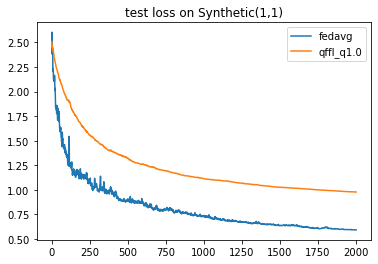

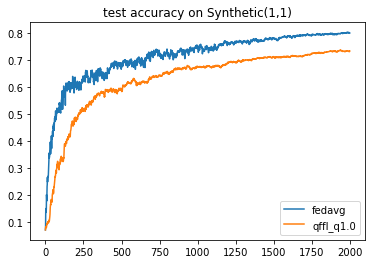

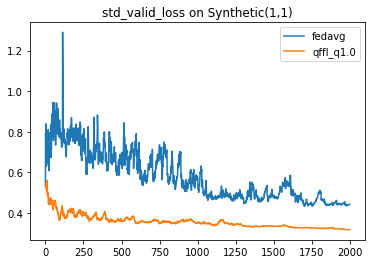

In [8]:
import flgo.experiment.analyzer
analysis_plan = {
    'Selector':{
        'task': task,
        'header':['fedavg','qffl_q1.0' ]
    },
    'Painter':{
        'Curve':[
            {'args':{'x': 'communication_round', 'y':'test_loss'}, 'fig_option':{'title':'test loss on Synthetic(1,1)'}},
            {'args':{'x': 'communication_round', 'y':'test_accuracy'},  'fig_option':{'title':'test accuracy on Synthetic(1,1)'}},
            {'args':{'x': 'communication_round', 'y':'std_valid_loss'}, 'fig_option':{'title':'std_valid_loss on Synthetic(1,1)'}},
        ]
    }
}
flgo.experiment.analyzer.show(analysis_plan)

qffl
1.4512270987033844
fedavg
1.5671010594815016


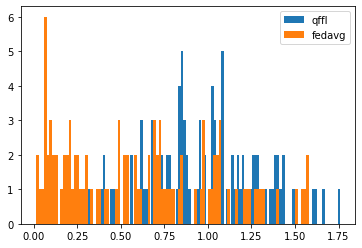

In [17]:
import matplotlib.pyplot as plt
import flgo.experiment.analyzer as al

s = al.Selector({'task':task, 'header':['qffl_q1.0','fedavg']})
records = s.records[task]
for rec in records:
    print(rec.data['option']['algorithm'])
    print(max(rec.data['valid_loss_dist'])-min(rec.data['valid_loss_dist']))
    plt.hist(rec.data['valid_loss_dist'], label=rec.data['option']['algorithm'], bins=len(rec.data['valid_loss_dist']))
plt.legend()
plt.show()

### 参数q的影响

In [7]:
qffl_runner_q50 = flgo.init(task, qffl, option={'algo_para':5.0,'num_rounds':2000, 'num_epochs':1, 'batch_size':10, 'learning_rate':0.1, 'gpu':0, 'proportion':0.1,'lr_scheduler':0})
qffl_runner_q05 = flgo.init(task, qffl, option={'algo_para':0.5,'num_rounds':2000, 'num_epochs':1, 'batch_size':10, 'learning_rate':0.1, 'gpu':0, 'proportion':0.1,'lr_scheduler':0})
qffl_runner_q01 = flgo.init(task, qffl, option={'algo_para':0.1,'num_rounds':2000, 'num_epochs':1, 'batch_size':10, 'learning_rate':0.1, 'gpu':0, 'proportion':0.1,'lr_scheduler':0})
runners = [qffl_runner_q50, qffl_runner_q05, qffl_runner_q01]
for r in runners: r.run()

2023-03-14 17:05:45,897 fflow.py init [line:347] INFO Initializing devices: cuda:0 will be used for this running.
2023-03-14 17:05:46,555 fflow.py init [line:389] INFO Use `<class 'flgo.system_simulator.default_simulator.Simulator'>` as the system simulator
2023-03-14 17:05:46,557 fflow.py init [line:397] INFO Ready to start.
2023-03-14 17:05:46,578 fflow.py init [line:347] INFO Initializing devices: cuda:0 will be used for this running.
2023-03-14 17:05:47,279 fflow.py init [line:389] INFO Use `<class 'flgo.system_simulator.default_simulator.Simulator'>` as the system simulator
2023-03-14 17:05:47,280 fflow.py init [line:397] INFO Ready to start.
2023-03-14 17:05:47,301 fflow.py init [line:347] INFO Initializing devices: cuda:0 will be used for this running.
2023-03-14 17:05:47,914 fflow.py init [line:389] INFO Use `<class 'flgo.system_simulator.default_simulator.Simulator'>` as the system simulator
2023-03-14 17:05:47,915 fflow.py init [line:397] INFO Ready to start.
2023-03-14 17:05

2023-03-14 17:05:49,262 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0692
2023-03-14 17:05:49,263 simple_logger.py log_once [line:27] INFO test_loss                     2.4783
2023-03-14 17:05:49,263 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0659
2023-03-14 17:05:49,263 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0659
2023-03-14 17:05:49,263 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1623
2023-03-14 17:05:49,264 simple_logger.py log_once [line:27] INFO valid_loss                    2.4751
2023-03-14 17:05:49,264 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.4751
2023-03-14 17:05:49,264 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4768
2023-03-14 17:05:49,264 fedbase.py run [line:121] INFO Eval Time Cost:               0.0664s
2023-03-14 17:05:49,394 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1294

2023-03-14 17:05:50,748 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0752
2023-03-14 17:05:50,749 simple_logger.py log_once [line:27] INFO test_loss                     2.4561
2023-03-14 17:05:50,749 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0732
2023-03-14 17:05:50,749 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0732
2023-03-14 17:05:50,750 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1755
2023-03-14 17:05:50,750 simple_logger.py log_once [line:27] INFO valid_loss                    2.4534
2023-03-14 17:05:50,750 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.4534
2023-03-14 17:05:50,751 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4488
2023-03-14 17:05:50,751 fedbase.py run [line:121] INFO Eval Time Cost:               0.0690s
2023-03-14 17:05:50,884 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1328

2023-03-14 17:05:52,278 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0732
2023-03-14 17:05:52,278 simple_logger.py log_once [line:27] INFO test_loss                     2.4466
2023-03-14 17:05:52,279 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0688
2023-03-14 17:05:52,279 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0688
2023-03-14 17:05:52,279 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1689
2023-03-14 17:05:52,279 simple_logger.py log_once [line:27] INFO valid_loss                    2.4441
2023-03-14 17:05:52,280 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.4441
2023-03-14 17:05:52,280 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4268
2023-03-14 17:05:52,280 fedbase.py run [line:121] INFO Eval Time Cost:               0.0670s
2023-03-14 17:05:52,424 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1435

2023-03-14 17:05:53,701 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0692
2023-03-14 17:05:53,702 simple_logger.py log_once [line:27] INFO test_loss                     2.4167
2023-03-14 17:05:53,702 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0694
2023-03-14 17:05:53,702 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0694
2023-03-14 17:05:53,703 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1626
2023-03-14 17:05:53,703 simple_logger.py log_once [line:27] INFO valid_loss                    2.4144
2023-03-14 17:05:53,703 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.4144
2023-03-14 17:05:53,703 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4042
2023-03-14 17:05:53,703 fedbase.py run [line:121] INFO Eval Time Cost:               0.0650s
2023-03-14 17:05:53,845 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1410

2023-03-14 17:05:55,137 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0650
2023-03-14 17:05:55,137 simple_logger.py log_once [line:27] INFO test_loss                     2.4038
2023-03-14 17:05:55,138 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0653
2023-03-14 17:05:55,138 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0653
2023-03-14 17:05:55,138 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1578
2023-03-14 17:05:55,138 simple_logger.py log_once [line:27] INFO valid_loss                    2.4010
2023-03-14 17:05:55,139 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.4010
2023-03-14 17:05:55,139 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3867
2023-03-14 17:05:55,139 fedbase.py run [line:121] INFO Eval Time Cost:               0.0660s
2023-03-14 17:05:55,281 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1415

2023-03-14 17:05:56,633 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0685
2023-03-14 17:05:56,634 simple_logger.py log_once [line:27] INFO test_loss                     2.3887
2023-03-14 17:05:56,634 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0715
2023-03-14 17:05:56,634 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0715
2023-03-14 17:05:56,634 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1633
2023-03-14 17:05:56,635 simple_logger.py log_once [line:27] INFO valid_loss                    2.3862
2023-03-14 17:05:56,635 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.3862
2023-03-14 17:05:56,635 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3705
2023-03-14 17:05:56,635 fedbase.py run [line:121] INFO Eval Time Cost:               0.0659s
2023-03-14 17:05:56,790 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1542

2023-03-14 17:05:58,117 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0702
2023-03-14 17:05:58,117 simple_logger.py log_once [line:27] INFO test_loss                     2.3785
2023-03-14 17:05:58,117 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0697
2023-03-14 17:05:58,118 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0697
2023-03-14 17:05:58,118 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1591
2023-03-14 17:05:58,118 simple_logger.py log_once [line:27] INFO valid_loss                    2.3764
2023-03-14 17:05:58,118 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.3764
2023-03-14 17:05:58,118 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3582
2023-03-14 17:05:58,119 fedbase.py run [line:121] INFO Eval Time Cost:               0.0662s
2023-03-14 17:05:58,255 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1360

2023-03-14 17:05:59,577 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0690
2023-03-14 17:05:59,577 simple_logger.py log_once [line:27] INFO test_loss                     2.3633
2023-03-14 17:05:59,578 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0706
2023-03-14 17:05:59,578 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0706
2023-03-14 17:05:59,578 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1600
2023-03-14 17:05:59,578 simple_logger.py log_once [line:27] INFO valid_loss                    2.3613
2023-03-14 17:05:59,579 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.3613
2023-03-14 17:05:59,579 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3525
2023-03-14 17:05:59,579 fedbase.py run [line:121] INFO Eval Time Cost:               0.0658s
2023-03-14 17:05:59,722 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1420

2023-03-14 17:06:01,045 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0705
2023-03-14 17:06:01,046 simple_logger.py log_once [line:27] INFO test_loss                     2.3498
2023-03-14 17:06:01,046 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0715
2023-03-14 17:06:01,046 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0715
2023-03-14 17:06:01,047 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1583
2023-03-14 17:06:01,047 simple_logger.py log_once [line:27] INFO valid_loss                    2.3479
2023-03-14 17:06:01,047 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.3479
2023-03-14 17:06:01,048 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3469
2023-03-14 17:06:01,048 fedbase.py run [line:121] INFO Eval Time Cost:               0.0690s
2023-03-14 17:06:01,202 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1536

2023-03-14 17:06:02,583 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0732
2023-03-14 17:06:02,584 simple_logger.py log_once [line:27] INFO test_loss                     2.3320
2023-03-14 17:06:02,584 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0756
2023-03-14 17:06:02,584 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0756
2023-03-14 17:06:02,585 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1704
2023-03-14 17:06:02,585 simple_logger.py log_once [line:27] INFO valid_loss                    2.3295
2023-03-14 17:06:02,585 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.3295
2023-03-14 17:06:02,585 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3446
2023-03-14 17:06:02,586 fedbase.py run [line:121] INFO Eval Time Cost:               0.0675s
2023-03-14 17:06:02,732 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1458

2023-03-14 17:06:04,140 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0743
2023-03-14 17:06:04,140 simple_logger.py log_once [line:27] INFO test_loss                     2.3185
2023-03-14 17:06:04,141 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0747
2023-03-14 17:06:04,141 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0747
2023-03-14 17:06:04,141 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1635
2023-03-14 17:06:04,141 simple_logger.py log_once [line:27] INFO valid_loss                    2.3160
2023-03-14 17:06:04,142 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.3160
2023-03-14 17:06:04,142 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3381
2023-03-14 17:06:04,142 fedbase.py run [line:121] INFO Eval Time Cost:               0.0680s
2023-03-14 17:06:04,284 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1411

2023-03-14 17:06:05,653 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0752
2023-03-14 17:06:05,653 simple_logger.py log_once [line:27] INFO test_loss                     2.3053
2023-03-14 17:06:05,653 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0762
2023-03-14 17:06:05,654 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0762
2023-03-14 17:06:05,654 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1693
2023-03-14 17:06:05,654 simple_logger.py log_once [line:27] INFO valid_loss                    2.3036
2023-03-14 17:06:05,654 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.3036
2023-03-14 17:06:05,655 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3290
2023-03-14 17:06:05,655 fedbase.py run [line:121] INFO Eval Time Cost:               0.0664s
2023-03-14 17:06:05,809 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1539

2023-03-14 17:06:07,089 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0800
2023-03-14 17:06:07,090 simple_logger.py log_once [line:27] INFO test_loss                     2.2920
2023-03-14 17:06:07,090 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0812
2023-03-14 17:06:07,090 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0812
2023-03-14 17:06:07,090 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1727
2023-03-14 17:06:07,091 simple_logger.py log_once [line:27] INFO valid_loss                    2.2898
2023-03-14 17:06:07,091 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.2898
2023-03-14 17:06:07,091 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3244
2023-03-14 17:06:07,091 fedbase.py run [line:121] INFO Eval Time Cost:               0.0666s
2023-03-14 17:06:07,234 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1424

2023-03-14 17:06:08,576 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0810
2023-03-14 17:06:08,576 simple_logger.py log_once [line:27] INFO test_loss                     2.2781
2023-03-14 17:06:08,576 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0844
2023-03-14 17:06:08,577 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0844
2023-03-14 17:06:08,577 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1813
2023-03-14 17:06:08,577 simple_logger.py log_once [line:27] INFO valid_loss                    2.2769
2023-03-14 17:06:08,577 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.2769
2023-03-14 17:06:08,578 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3211
2023-03-14 17:06:08,578 fedbase.py run [line:121] INFO Eval Time Cost:               0.0670s
2023-03-14 17:06:08,716 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1379

2023-03-14 17:06:09,995 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0883
2023-03-14 17:06:09,996 simple_logger.py log_once [line:27] INFO test_loss                     2.2640
2023-03-14 17:06:09,996 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0909
2023-03-14 17:06:09,997 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0909
2023-03-14 17:06:09,997 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1895
2023-03-14 17:06:09,997 simple_logger.py log_once [line:27] INFO valid_loss                    2.2627
2023-03-14 17:06:09,997 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.2627
2023-03-14 17:06:09,998 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3225
2023-03-14 17:06:09,998 fedbase.py run [line:121] INFO Eval Time Cost:               0.0666s
2023-03-14 17:06:10,125 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1273

2023-03-14 17:06:11,401 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0835
2023-03-14 17:06:11,401 simple_logger.py log_once [line:27] INFO test_loss                     2.2579
2023-03-14 17:06:11,401 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0868
2023-03-14 17:06:11,401 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0868
2023-03-14 17:06:11,402 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1830
2023-03-14 17:06:11,402 simple_logger.py log_once [line:27] INFO valid_loss                    2.2565
2023-03-14 17:06:11,402 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.2565
2023-03-14 17:06:11,403 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3038
2023-03-14 17:06:11,403 fedbase.py run [line:121] INFO Eval Time Cost:               0.0662s
2023-03-14 17:06:11,556 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1532

2023-03-14 17:06:12,884 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0922
2023-03-14 17:06:12,885 simple_logger.py log_once [line:27] INFO test_loss                     2.2461
2023-03-14 17:06:12,885 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0932
2023-03-14 17:06:12,885 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0932
2023-03-14 17:06:12,885 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1880
2023-03-14 17:06:12,886 simple_logger.py log_once [line:27] INFO valid_loss                    2.2443
2023-03-14 17:06:12,886 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.2443
2023-03-14 17:06:12,886 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2993
2023-03-14 17:06:12,886 fedbase.py run [line:121] INFO Eval Time Cost:               0.0667s
2023-03-14 17:06:13,007 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1200

2023-03-14 17:06:14,346 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0917
2023-03-14 17:06:14,346 simple_logger.py log_once [line:27] INFO test_loss                     2.2324
2023-03-14 17:06:14,346 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0947
2023-03-14 17:06:14,347 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0947
2023-03-14 17:06:14,347 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1837
2023-03-14 17:06:14,347 simple_logger.py log_once [line:27] INFO valid_loss                    2.2307
2023-03-14 17:06:14,348 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.2307
2023-03-14 17:06:14,348 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3025
2023-03-14 17:06:14,348 fedbase.py run [line:121] INFO Eval Time Cost:               0.0664s
2023-03-14 17:06:14,490 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1417

2023-03-14 17:06:15,796 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0953
2023-03-14 17:06:15,796 simple_logger.py log_once [line:27] INFO test_loss                     2.2288
2023-03-14 17:06:15,796 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0968
2023-03-14 17:06:15,797 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0968
2023-03-14 17:06:15,797 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1873
2023-03-14 17:06:15,797 simple_logger.py log_once [line:27] INFO valid_loss                    2.2276
2023-03-14 17:06:15,798 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.2276
2023-03-14 17:06:15,798 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2843
2023-03-14 17:06:15,798 fedbase.py run [line:121] INFO Eval Time Cost:               0.0650s
2023-03-14 17:06:15,929 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1302

2023-03-14 17:06:17,233 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0987
2023-03-14 17:06:17,234 simple_logger.py log_once [line:27] INFO test_loss                     2.2144
2023-03-14 17:06:17,234 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1015
2023-03-14 17:06:17,234 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1015
2023-03-14 17:06:17,235 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1882
2023-03-14 17:06:17,235 simple_logger.py log_once [line:27] INFO valid_loss                    2.2132
2023-03-14 17:06:17,235 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.2132
2023-03-14 17:06:17,236 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2861
2023-03-14 17:06:17,236 fedbase.py run [line:121] INFO Eval Time Cost:               0.0668s
2023-03-14 17:06:17,372 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1358

2023-03-14 17:06:18,742 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1010
2023-03-14 17:06:18,743 simple_logger.py log_once [line:27] INFO test_loss                     2.2036
2023-03-14 17:06:18,743 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1041
2023-03-14 17:06:18,743 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1041
2023-03-14 17:06:18,744 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1912
2023-03-14 17:06:18,744 simple_logger.py log_once [line:27] INFO valid_loss                    2.2019
2023-03-14 17:06:18,744 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.2019
2023-03-14 17:06:18,744 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2843
2023-03-14 17:06:18,745 fedbase.py run [line:121] INFO Eval Time Cost:               0.0670s
2023-03-14 17:06:18,892 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1467

2023-03-14 17:06:20,249 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1050
2023-03-14 17:06:20,250 simple_logger.py log_once [line:27] INFO test_loss                     2.1926
2023-03-14 17:06:20,250 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1094
2023-03-14 17:06:20,250 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1094
2023-03-14 17:06:20,250 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1977
2023-03-14 17:06:20,251 simple_logger.py log_once [line:27] INFO valid_loss                    2.1916
2023-03-14 17:06:20,251 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.1916
2023-03-14 17:06:20,251 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2781
2023-03-14 17:06:20,251 fedbase.py run [line:121] INFO Eval Time Cost:               0.0693s
2023-03-14 17:06:20,403 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1509

2023-03-14 17:06:21,795 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1103
2023-03-14 17:06:21,796 simple_logger.py log_once [line:27] INFO test_loss                     2.1857
2023-03-14 17:06:21,796 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1156
2023-03-14 17:06:21,796 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1156
2023-03-14 17:06:21,797 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2045
2023-03-14 17:06:21,797 simple_logger.py log_once [line:27] INFO valid_loss                    2.1850
2023-03-14 17:06:21,797 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.1850
2023-03-14 17:06:21,798 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2747
2023-03-14 17:06:21,798 fedbase.py run [line:121] INFO Eval Time Cost:               0.0669s
2023-03-14 17:06:21,951 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1520

2023-03-14 17:06:23,249 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1182
2023-03-14 17:06:23,249 simple_logger.py log_once [line:27] INFO test_loss                     2.1770
2023-03-14 17:06:23,249 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1235
2023-03-14 17:06:23,250 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1235
2023-03-14 17:06:23,250 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2152
2023-03-14 17:06:23,250 simple_logger.py log_once [line:27] INFO valid_loss                    2.1761
2023-03-14 17:06:23,250 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.1761
2023-03-14 17:06:23,251 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2691
2023-03-14 17:06:23,251 fedbase.py run [line:121] INFO Eval Time Cost:               0.0662s
2023-03-14 17:06:23,401 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1501

2023-03-14 17:06:24,853 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1222
2023-03-14 17:06:24,853 simple_logger.py log_once [line:27] INFO test_loss                     2.1658
2023-03-14 17:06:24,853 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1274
2023-03-14 17:06:24,854 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1274
2023-03-14 17:06:24,854 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2121
2023-03-14 17:06:24,854 simple_logger.py log_once [line:27] INFO valid_loss                    2.1648
2023-03-14 17:06:24,854 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.1648
2023-03-14 17:06:24,855 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2648
2023-03-14 17:06:24,855 fedbase.py run [line:121] INFO Eval Time Cost:               0.1101s
2023-03-14 17:06:25,008 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1530

2023-03-14 17:06:26,325 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1258
2023-03-14 17:06:26,325 simple_logger.py log_once [line:27] INFO test_loss                     2.1555
2023-03-14 17:06:26,326 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1306
2023-03-14 17:06:26,326 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1306
2023-03-14 17:06:26,326 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2139
2023-03-14 17:06:26,327 simple_logger.py log_once [line:27] INFO valid_loss                    2.1546
2023-03-14 17:06:26,327 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.1546
2023-03-14 17:06:26,327 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2658
2023-03-14 17:06:26,327 fedbase.py run [line:121] INFO Eval Time Cost:               0.0664s
2023-03-14 17:06:26,448 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1203

2023-03-14 17:06:27,724 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1290
2023-03-14 17:06:27,724 simple_logger.py log_once [line:27] INFO test_loss                     2.1481
2023-03-14 17:06:27,724 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1356
2023-03-14 17:06:27,725 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1356
2023-03-14 17:06:27,725 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2192
2023-03-14 17:06:27,725 simple_logger.py log_once [line:27] INFO valid_loss                    2.1471
2023-03-14 17:06:27,725 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.1471
2023-03-14 17:06:27,726 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2695
2023-03-14 17:06:27,726 fedbase.py run [line:121] INFO Eval Time Cost:               0.0660s
2023-03-14 17:06:27,869 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1427

2023-03-14 17:06:29,258 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1407
2023-03-14 17:06:29,258 simple_logger.py log_once [line:27] INFO test_loss                     2.1385
2023-03-14 17:06:29,258 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1447
2023-03-14 17:06:29,259 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1447
2023-03-14 17:06:29,259 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2266
2023-03-14 17:06:29,259 simple_logger.py log_once [line:27] INFO valid_loss                    2.1377
2023-03-14 17:06:29,259 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.1377
2023-03-14 17:06:29,259 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2664
2023-03-14 17:06:29,260 fedbase.py run [line:121] INFO Eval Time Cost:               0.0672s
2023-03-14 17:06:29,392 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1317

2023-03-14 17:06:30,759 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1453
2023-03-14 17:06:30,759 simple_logger.py log_once [line:27] INFO test_loss                     2.1311
2023-03-14 17:06:30,760 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1488
2023-03-14 17:06:30,760 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1488
2023-03-14 17:06:30,760 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2277
2023-03-14 17:06:30,761 simple_logger.py log_once [line:27] INFO valid_loss                    2.1302
2023-03-14 17:06:30,761 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.1302
2023-03-14 17:06:30,761 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2653
2023-03-14 17:06:30,761 fedbase.py run [line:121] INFO Eval Time Cost:               0.0675s
2023-03-14 17:06:30,891 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1289

2023-03-14 17:06:32,324 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1430
2023-03-14 17:06:32,325 simple_logger.py log_once [line:27] INFO test_loss                     2.1226
2023-03-14 17:06:32,325 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1518
2023-03-14 17:06:32,325 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1518
2023-03-14 17:06:32,326 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2328
2023-03-14 17:06:32,326 simple_logger.py log_once [line:27] INFO valid_loss                    2.1224
2023-03-14 17:06:32,326 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.1224
2023-03-14 17:06:32,327 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2576
2023-03-14 17:06:32,327 fedbase.py run [line:121] INFO Eval Time Cost:               0.0675s
2023-03-14 17:06:32,484 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1570

2023-03-14 17:06:33,834 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1477
2023-03-14 17:06:33,834 simple_logger.py log_once [line:27] INFO test_loss                     2.1154
2023-03-14 17:06:33,835 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1535
2023-03-14 17:06:33,835 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1535
2023-03-14 17:06:33,835 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2371
2023-03-14 17:06:33,836 simple_logger.py log_once [line:27] INFO valid_loss                    2.1151
2023-03-14 17:06:33,836 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.1151
2023-03-14 17:06:33,836 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2637
2023-03-14 17:06:33,836 fedbase.py run [line:121] INFO Eval Time Cost:               0.0647s
2023-03-14 17:06:33,974 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1378

2023-03-14 17:06:35,306 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1532
2023-03-14 17:06:35,307 simple_logger.py log_once [line:27] INFO test_loss                     2.1077
2023-03-14 17:06:35,307 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1585
2023-03-14 17:06:35,307 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1585
2023-03-14 17:06:35,308 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2385
2023-03-14 17:06:35,308 simple_logger.py log_once [line:27] INFO valid_loss                    2.1076
2023-03-14 17:06:35,308 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.1076
2023-03-14 17:06:35,308 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2573
2023-03-14 17:06:35,309 fedbase.py run [line:121] INFO Eval Time Cost:               0.0687s
2023-03-14 17:06:35,448 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1389

2023-03-14 17:06:36,761 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1592
2023-03-14 17:06:36,762 simple_logger.py log_once [line:27] INFO test_loss                     2.1018
2023-03-14 17:06:36,762 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1615
2023-03-14 17:06:36,762 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1615
2023-03-14 17:06:36,763 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2375
2023-03-14 17:06:36,763 simple_logger.py log_once [line:27] INFO valid_loss                    2.1015
2023-03-14 17:06:36,763 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.1015
2023-03-14 17:06:36,763 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2552
2023-03-14 17:06:36,764 fedbase.py run [line:121] INFO Eval Time Cost:               0.0678s
2023-03-14 17:06:36,899 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1354

2023-03-14 17:06:38,243 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1680
2023-03-14 17:06:38,244 simple_logger.py log_once [line:27] INFO test_loss                     2.0932
2023-03-14 17:06:38,244 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1744
2023-03-14 17:06:38,244 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1744
2023-03-14 17:06:38,245 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2454
2023-03-14 17:06:38,245 simple_logger.py log_once [line:27] INFO valid_loss                    2.0927
2023-03-14 17:06:38,245 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.0927
2023-03-14 17:06:38,246 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2449
2023-03-14 17:06:38,246 fedbase.py run [line:121] INFO Eval Time Cost:               0.0679s
2023-03-14 17:06:38,379 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1328

2023-03-14 17:06:39,756 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1703
2023-03-14 17:06:39,756 simple_logger.py log_once [line:27] INFO test_loss                     2.0853
2023-03-14 17:06:39,757 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1735
2023-03-14 17:06:39,757 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1735
2023-03-14 17:06:39,757 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2440
2023-03-14 17:06:39,758 simple_logger.py log_once [line:27] INFO valid_loss                    2.0845
2023-03-14 17:06:39,758 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.0845
2023-03-14 17:06:39,758 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2502
2023-03-14 17:06:39,759 fedbase.py run [line:121] INFO Eval Time Cost:               0.0673s
2023-03-14 17:06:39,896 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1370

2023-03-14 17:06:41,279 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1762
2023-03-14 17:06:41,279 simple_logger.py log_once [line:27] INFO test_loss                     2.0760
2023-03-14 17:06:41,279 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1788
2023-03-14 17:06:41,280 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1788
2023-03-14 17:06:41,280 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2486
2023-03-14 17:06:41,280 simple_logger.py log_once [line:27] INFO valid_loss                    2.0749
2023-03-14 17:06:41,280 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.0749
2023-03-14 17:06:41,281 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2552
2023-03-14 17:06:41,281 fedbase.py run [line:121] INFO Eval Time Cost:               0.0679s
2023-03-14 17:06:41,438 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1563

2023-03-14 17:06:42,798 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1803
2023-03-14 17:06:42,799 simple_logger.py log_once [line:27] INFO test_loss                     2.0682
2023-03-14 17:06:42,799 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1841
2023-03-14 17:06:42,799 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1841
2023-03-14 17:06:42,800 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2499
2023-03-14 17:06:42,800 simple_logger.py log_once [line:27] INFO valid_loss                    2.0673
2023-03-14 17:06:42,800 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.0673
2023-03-14 17:06:42,801 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2525
2023-03-14 17:06:42,801 fedbase.py run [line:121] INFO Eval Time Cost:               0.0678s
2023-03-14 17:06:42,961 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1592

2023-03-14 17:06:44,352 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1873
2023-03-14 17:06:44,352 simple_logger.py log_once [line:27] INFO test_loss                     2.0618
2023-03-14 17:06:44,353 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1894
2023-03-14 17:06:44,353 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1894
2023-03-14 17:06:44,353 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2513
2023-03-14 17:06:44,354 simple_logger.py log_once [line:27] INFO valid_loss                    2.0610
2023-03-14 17:06:44,354 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.0610
2023-03-14 17:06:44,354 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2487
2023-03-14 17:06:44,354 fedbase.py run [line:121] INFO Eval Time Cost:               0.0668s
2023-03-14 17:06:44,511 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1560

2023-03-14 17:06:45,830 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1960
2023-03-14 17:06:45,830 simple_logger.py log_once [line:27] INFO test_loss                     2.0560
2023-03-14 17:06:45,831 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1988
2023-03-14 17:06:45,831 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1988
2023-03-14 17:06:45,831 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2580
2023-03-14 17:06:45,831 simple_logger.py log_once [line:27] INFO valid_loss                    2.0562
2023-03-14 17:06:45,832 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.0562
2023-03-14 17:06:45,832 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2466
2023-03-14 17:06:45,832 fedbase.py run [line:121] INFO Eval Time Cost:               0.0673s
2023-03-14 17:06:45,987 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1549

2023-03-14 17:06:47,405 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2037
2023-03-14 17:06:47,406 simple_logger.py log_once [line:27] INFO test_loss                     2.0494
2023-03-14 17:06:47,406 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2050
2023-03-14 17:06:47,406 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2050
2023-03-14 17:06:47,407 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2639
2023-03-14 17:06:47,407 simple_logger.py log_once [line:27] INFO valid_loss                    2.0490
2023-03-14 17:06:47,407 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.0490
2023-03-14 17:06:47,407 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2434
2023-03-14 17:06:47,408 fedbase.py run [line:121] INFO Eval Time Cost:               0.1150s
2023-03-14 17:06:47,566 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1578

2023-03-14 17:06:48,920 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2020
2023-03-14 17:06:48,920 simple_logger.py log_once [line:27] INFO test_loss                     2.0441
2023-03-14 17:06:48,921 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2062
2023-03-14 17:06:48,921 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2062
2023-03-14 17:06:48,921 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2630
2023-03-14 17:06:48,921 simple_logger.py log_once [line:27] INFO valid_loss                    2.0435
2023-03-14 17:06:48,922 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.0435
2023-03-14 17:06:48,922 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2435
2023-03-14 17:06:48,922 fedbase.py run [line:121] INFO Eval Time Cost:               0.0681s
2023-03-14 17:06:49,078 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1559

2023-03-14 17:06:50,393 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2115
2023-03-14 17:06:50,394 simple_logger.py log_once [line:27] INFO test_loss                     2.0364
2023-03-14 17:06:50,394 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2171
2023-03-14 17:06:50,394 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2171
2023-03-14 17:06:50,395 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2758
2023-03-14 17:06:50,395 simple_logger.py log_once [line:27] INFO valid_loss                    2.0360
2023-03-14 17:06:50,395 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.0360
2023-03-14 17:06:50,396 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2452
2023-03-14 17:06:50,396 fedbase.py run [line:121] INFO Eval Time Cost:               0.0682s
2023-03-14 17:06:50,545 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1487

2023-03-14 17:06:51,947 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2137
2023-03-14 17:06:51,947 simple_logger.py log_once [line:27] INFO test_loss                     2.0292
2023-03-14 17:06:51,947 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2171
2023-03-14 17:06:51,947 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2171
2023-03-14 17:06:51,948 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2744
2023-03-14 17:06:51,948 simple_logger.py log_once [line:27] INFO valid_loss                    2.0284
2023-03-14 17:06:51,948 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.0284
2023-03-14 17:06:51,949 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2411
2023-03-14 17:06:51,949 fedbase.py run [line:121] INFO Eval Time Cost:               0.0664s
2023-03-14 17:06:52,099 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1496

2023-03-14 17:06:53,380 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2217
2023-03-14 17:06:53,380 simple_logger.py log_once [line:27] INFO test_loss                     2.0228
2023-03-14 17:06:53,381 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2265
2023-03-14 17:06:53,381 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2265
2023-03-14 17:06:53,381 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2792
2023-03-14 17:06:53,381 simple_logger.py log_once [line:27] INFO valid_loss                    2.0221
2023-03-14 17:06:53,382 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.0221
2023-03-14 17:06:53,382 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2478
2023-03-14 17:06:53,382 fedbase.py run [line:121] INFO Eval Time Cost:               0.0668s
2023-03-14 17:06:53,536 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1532

2023-03-14 17:06:54,903 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2318
2023-03-14 17:06:54,903 simple_logger.py log_once [line:27] INFO test_loss                     2.0159
2023-03-14 17:06:54,904 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2350
2023-03-14 17:06:54,904 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2350
2023-03-14 17:06:54,904 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2834
2023-03-14 17:06:54,904 simple_logger.py log_once [line:27] INFO valid_loss                    2.0158
2023-03-14 17:06:54,905 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.0158
2023-03-14 17:06:54,905 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2474
2023-03-14 17:06:54,905 fedbase.py run [line:121] INFO Eval Time Cost:               0.0679s
2023-03-14 17:06:55,047 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1409

2023-03-14 17:06:56,345 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2240
2023-03-14 17:06:56,346 simple_logger.py log_once [line:27] INFO test_loss                     2.0149
2023-03-14 17:06:56,346 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2285
2023-03-14 17:06:56,346 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2285
2023-03-14 17:06:56,347 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2753
2023-03-14 17:06:56,347 simple_logger.py log_once [line:27] INFO valid_loss                    2.0154
2023-03-14 17:06:56,347 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.0154
2023-03-14 17:06:56,347 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2415
2023-03-14 17:06:56,347 fedbase.py run [line:121] INFO Eval Time Cost:               0.0666s
2023-03-14 17:06:56,464 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1158

2023-03-14 17:06:57,813 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2260
2023-03-14 17:06:57,813 simple_logger.py log_once [line:27] INFO test_loss                     2.0086
2023-03-14 17:06:57,814 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2318
2023-03-14 17:06:57,814 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2318
2023-03-14 17:06:57,814 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2768
2023-03-14 17:06:57,815 simple_logger.py log_once [line:27] INFO valid_loss                    2.0092
2023-03-14 17:06:57,815 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.0092
2023-03-14 17:06:57,815 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2406
2023-03-14 17:06:57,815 fedbase.py run [line:121] INFO Eval Time Cost:               0.0667s
2023-03-14 17:06:57,941 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1254

2023-03-14 17:06:59,237 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2302
2023-03-14 17:06:59,238 simple_logger.py log_once [line:27] INFO test_loss                     2.0019
2023-03-14 17:06:59,238 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2321
2023-03-14 17:06:59,238 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2321
2023-03-14 17:06:59,239 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2823
2023-03-14 17:06:59,239 simple_logger.py log_once [line:27] INFO valid_loss                    2.0023
2023-03-14 17:06:59,239 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.0023
2023-03-14 17:06:59,239 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2418
2023-03-14 17:06:59,240 fedbase.py run [line:121] INFO Eval Time Cost:               0.0666s
2023-03-14 17:06:59,362 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1222

2023-03-14 17:07:00,705 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2352
2023-03-14 17:07:00,705 simple_logger.py log_once [line:27] INFO test_loss                     1.9981
2023-03-14 17:07:00,706 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2374
2023-03-14 17:07:00,706 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2374
2023-03-14 17:07:00,706 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2900
2023-03-14 17:07:00,706 simple_logger.py log_once [line:27] INFO valid_loss                    1.9984
2023-03-14 17:07:00,707 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9984
2023-03-14 17:07:00,707 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2436
2023-03-14 17:07:00,707 fedbase.py run [line:121] INFO Eval Time Cost:               0.0660s
2023-03-14 17:07:00,823 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1154

2023-03-14 17:07:02,116 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2423
2023-03-14 17:07:02,116 simple_logger.py log_once [line:27] INFO test_loss                     1.9909
2023-03-14 17:07:02,117 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2503
2023-03-14 17:07:02,117 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2503
2023-03-14 17:07:02,117 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2936
2023-03-14 17:07:02,118 simple_logger.py log_once [line:27] INFO valid_loss                    1.9912
2023-03-14 17:07:02,118 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9912
2023-03-14 17:07:02,118 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2424
2023-03-14 17:07:02,118 fedbase.py run [line:121] INFO Eval Time Cost:               0.0793s
2023-03-14 17:07:02,265 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1462

2023-03-14 17:07:03,626 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2530
2023-03-14 17:07:03,626 simple_logger.py log_once [line:27] INFO test_loss                     1.9837
2023-03-14 17:07:03,627 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2509
2023-03-14 17:07:03,627 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2509
2023-03-14 17:07:03,627 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2992
2023-03-14 17:07:03,627 simple_logger.py log_once [line:27] INFO valid_loss                    1.9842
2023-03-14 17:07:03,628 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9842
2023-03-14 17:07:03,628 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2465
2023-03-14 17:07:03,628 fedbase.py run [line:121] INFO Eval Time Cost:               0.0669s
2023-03-14 17:07:03,771 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1421

2023-03-14 17:07:05,053 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2555
2023-03-14 17:07:05,054 simple_logger.py log_once [line:27] INFO test_loss                     1.9791
2023-03-14 17:07:05,054 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2603
2023-03-14 17:07:05,054 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2603
2023-03-14 17:07:05,055 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2989
2023-03-14 17:07:05,055 simple_logger.py log_once [line:27] INFO valid_loss                    1.9795
2023-03-14 17:07:05,055 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9795
2023-03-14 17:07:05,055 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2470
2023-03-14 17:07:05,056 fedbase.py run [line:121] INFO Eval Time Cost:               0.0660s
2023-03-14 17:07:05,184 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1272

2023-03-14 17:07:06,491 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2648
2023-03-14 17:07:06,491 simple_logger.py log_once [line:27] INFO test_loss                     1.9722
2023-03-14 17:07:06,491 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2647
2023-03-14 17:07:06,492 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2647
2023-03-14 17:07:06,492 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3014
2023-03-14 17:07:06,492 simple_logger.py log_once [line:27] INFO valid_loss                    1.9727
2023-03-14 17:07:06,492 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9727
2023-03-14 17:07:06,493 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2483
2023-03-14 17:07:06,493 fedbase.py run [line:121] INFO Eval Time Cost:               0.0657s
2023-03-14 17:07:06,636 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1428

2023-03-14 17:07:07,950 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2683
2023-03-14 17:07:07,950 simple_logger.py log_once [line:27] INFO test_loss                     1.9687
2023-03-14 17:07:07,950 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2674
2023-03-14 17:07:07,951 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2674
2023-03-14 17:07:07,951 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2970
2023-03-14 17:07:07,951 simple_logger.py log_once [line:27] INFO valid_loss                    1.9692
2023-03-14 17:07:07,951 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9692
2023-03-14 17:07:07,952 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2439
2023-03-14 17:07:07,952 fedbase.py run [line:121] INFO Eval Time Cost:               0.0650s
2023-03-14 17:07:08,093 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1405

2023-03-14 17:07:09,400 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2750
2023-03-14 17:07:09,400 simple_logger.py log_once [line:27] INFO test_loss                     1.9644
2023-03-14 17:07:09,401 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2715
2023-03-14 17:07:09,401 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2715
2023-03-14 17:07:09,401 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3030
2023-03-14 17:07:09,401 simple_logger.py log_once [line:27] INFO valid_loss                    1.9649
2023-03-14 17:07:09,402 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9649
2023-03-14 17:07:09,402 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2419
2023-03-14 17:07:09,402 fedbase.py run [line:121] INFO Eval Time Cost:               0.0680s
2023-03-14 17:07:09,546 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1436

2023-03-14 17:07:10,942 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2743
2023-03-14 17:07:10,943 simple_logger.py log_once [line:27] INFO test_loss                     1.9610
2023-03-14 17:07:10,943 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2721
2023-03-14 17:07:10,943 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2721
2023-03-14 17:07:10,944 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3016
2023-03-14 17:07:10,944 simple_logger.py log_once [line:27] INFO valid_loss                    1.9611
2023-03-14 17:07:10,944 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9611
2023-03-14 17:07:10,944 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2408
2023-03-14 17:07:10,945 fedbase.py run [line:121] INFO Eval Time Cost:               0.0676s
2023-03-14 17:07:11,090 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1446

2023-03-14 17:07:12,433 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2760
2023-03-14 17:07:12,433 simple_logger.py log_once [line:27] INFO test_loss                     1.9563
2023-03-14 17:07:12,433 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2750
2023-03-14 17:07:12,434 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2750
2023-03-14 17:07:12,434 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3019
2023-03-14 17:07:12,434 simple_logger.py log_once [line:27] INFO valid_loss                    1.9567
2023-03-14 17:07:12,434 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9567
2023-03-14 17:07:12,435 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2376
2023-03-14 17:07:12,435 fedbase.py run [line:121] INFO Eval Time Cost:               0.0673s
2023-03-14 17:07:12,566 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1309

2023-03-14 17:07:13,958 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2772
2023-03-14 17:07:13,958 simple_logger.py log_once [line:27] INFO test_loss                     1.9530
2023-03-14 17:07:13,958 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2753
2023-03-14 17:07:13,959 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2753
2023-03-14 17:07:13,959 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2936
2023-03-14 17:07:13,959 simple_logger.py log_once [line:27] INFO valid_loss                    1.9535
2023-03-14 17:07:13,960 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9535
2023-03-14 17:07:13,960 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2323
2023-03-14 17:07:13,960 fedbase.py run [line:121] INFO Eval Time Cost:               0.0671s
2023-03-14 17:07:14,096 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1360

2023-03-14 17:07:15,416 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2742
2023-03-14 17:07:15,417 simple_logger.py log_once [line:27] INFO test_loss                     1.9479
2023-03-14 17:07:15,417 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2744
2023-03-14 17:07:15,417 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2744
2023-03-14 17:07:15,418 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2918
2023-03-14 17:07:15,418 simple_logger.py log_once [line:27] INFO valid_loss                    1.9483
2023-03-14 17:07:15,418 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9483
2023-03-14 17:07:15,418 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2359
2023-03-14 17:07:15,418 fedbase.py run [line:121] INFO Eval Time Cost:               0.0671s
2023-03-14 17:07:15,575 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1562

2023-03-14 17:07:16,948 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2800
2023-03-14 17:07:16,948 simple_logger.py log_once [line:27] INFO test_loss                     1.9425
2023-03-14 17:07:16,949 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2821
2023-03-14 17:07:16,949 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2821
2023-03-14 17:07:16,949 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2952
2023-03-14 17:07:16,949 simple_logger.py log_once [line:27] INFO valid_loss                    1.9423
2023-03-14 17:07:16,950 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9423
2023-03-14 17:07:16,950 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2378
2023-03-14 17:07:16,950 fedbase.py run [line:121] INFO Eval Time Cost:               0.0662s
2023-03-14 17:07:17,095 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1440

2023-03-14 17:07:18,404 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2808
2023-03-14 17:07:18,405 simple_logger.py log_once [line:27] INFO test_loss                     1.9369
2023-03-14 17:07:18,405 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2838
2023-03-14 17:07:18,405 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2838
2023-03-14 17:07:18,406 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2961
2023-03-14 17:07:18,406 simple_logger.py log_once [line:27] INFO valid_loss                    1.9365
2023-03-14 17:07:18,406 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9365
2023-03-14 17:07:18,406 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2431
2023-03-14 17:07:18,407 fedbase.py run [line:121] INFO Eval Time Cost:               0.0665s
2023-03-14 17:07:18,550 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1427

2023-03-14 17:07:19,904 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2902
2023-03-14 17:07:19,905 simple_logger.py log_once [line:27] INFO test_loss                     1.9314
2023-03-14 17:07:19,905 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2865
2023-03-14 17:07:19,905 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2865
2023-03-14 17:07:19,906 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2950
2023-03-14 17:07:19,906 simple_logger.py log_once [line:27] INFO valid_loss                    1.9308
2023-03-14 17:07:19,906 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9308
2023-03-14 17:07:19,906 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2458
2023-03-14 17:07:19,907 fedbase.py run [line:121] INFO Eval Time Cost:               0.1111s
2023-03-14 17:07:20,041 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1344

2023-03-14 17:07:21,283 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2928
2023-03-14 17:07:21,283 simple_logger.py log_once [line:27] INFO test_loss                     1.9273
2023-03-14 17:07:21,284 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2882
2023-03-14 17:07:21,284 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2882
2023-03-14 17:07:21,284 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2975
2023-03-14 17:07:21,284 simple_logger.py log_once [line:27] INFO valid_loss                    1.9269
2023-03-14 17:07:21,285 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9269
2023-03-14 17:07:21,285 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2399
2023-03-14 17:07:21,285 fedbase.py run [line:121] INFO Eval Time Cost:               0.0670s
2023-03-14 17:07:21,429 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1430

2023-03-14 17:07:22,749 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2983
2023-03-14 17:07:22,749 simple_logger.py log_once [line:27] INFO test_loss                     1.9221
2023-03-14 17:07:22,749 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2938
2023-03-14 17:07:22,750 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2938
2023-03-14 17:07:22,750 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2998
2023-03-14 17:07:22,751 simple_logger.py log_once [line:27] INFO valid_loss                    1.9217
2023-03-14 17:07:22,751 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9217
2023-03-14 17:07:22,751 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2340
2023-03-14 17:07:22,752 fedbase.py run [line:121] INFO Eval Time Cost:               0.1080s
2023-03-14 17:07:22,884 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1322

2023-03-14 17:07:24,248 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3040
2023-03-14 17:07:24,248 simple_logger.py log_once [line:27] INFO test_loss                     1.9191
2023-03-14 17:07:24,248 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2985
2023-03-14 17:07:24,249 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2985
2023-03-14 17:07:24,249 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2976
2023-03-14 17:07:24,249 simple_logger.py log_once [line:27] INFO valid_loss                    1.9189
2023-03-14 17:07:24,249 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9189
2023-03-14 17:07:24,250 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2229
2023-03-14 17:07:24,250 fedbase.py run [line:121] INFO Eval Time Cost:               0.0679s
2023-03-14 17:07:24,388 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1380

2023-03-14 17:07:25,744 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3067
2023-03-14 17:07:25,744 simple_logger.py log_once [line:27] INFO test_loss                     1.9130
2023-03-14 17:07:25,745 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3053
2023-03-14 17:07:25,745 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3053
2023-03-14 17:07:25,745 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2988
2023-03-14 17:07:25,745 simple_logger.py log_once [line:27] INFO valid_loss                    1.9130
2023-03-14 17:07:25,746 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9130
2023-03-14 17:07:25,746 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2233
2023-03-14 17:07:25,746 fedbase.py run [line:121] INFO Eval Time Cost:               0.0678s
2023-03-14 17:07:25,903 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1562

2023-03-14 17:07:27,240 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3042
2023-03-14 17:07:27,240 simple_logger.py log_once [line:27] INFO test_loss                     1.9099
2023-03-14 17:07:27,240 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3038
2023-03-14 17:07:27,241 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3038
2023-03-14 17:07:27,241 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2926
2023-03-14 17:07:27,241 simple_logger.py log_once [line:27] INFO valid_loss                    1.9100
2023-03-14 17:07:27,241 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9100
2023-03-14 17:07:27,242 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2173
2023-03-14 17:07:27,242 fedbase.py run [line:121] INFO Eval Time Cost:               0.0676s
2023-03-14 17:07:27,365 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1230

2023-03-14 17:07:28,666 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3043
2023-03-14 17:07:28,666 simple_logger.py log_once [line:27] INFO test_loss                     1.9057
2023-03-14 17:07:28,666 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3000
2023-03-14 17:07:28,667 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3000
2023-03-14 17:07:28,667 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2876
2023-03-14 17:07:28,667 simple_logger.py log_once [line:27] INFO valid_loss                    1.9060
2023-03-14 17:07:28,667 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9060
2023-03-14 17:07:28,668 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2177
2023-03-14 17:07:28,668 fedbase.py run [line:121] INFO Eval Time Cost:               0.0645s
2023-03-14 17:07:28,811 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1426

2023-03-14 17:07:30,153 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3073
2023-03-14 17:07:30,154 simple_logger.py log_once [line:27] INFO test_loss                     1.9027
2023-03-14 17:07:30,154 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3044
2023-03-14 17:07:30,154 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3044
2023-03-14 17:07:30,155 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2873
2023-03-14 17:07:30,155 simple_logger.py log_once [line:27] INFO valid_loss                    1.9027
2023-03-14 17:07:30,155 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9027
2023-03-14 17:07:30,155 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2178
2023-03-14 17:07:30,156 fedbase.py run [line:121] INFO Eval Time Cost:               0.0649s
2023-03-14 17:07:30,298 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1418

2023-03-14 17:07:31,631 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3160
2023-03-14 17:07:31,631 simple_logger.py log_once [line:27] INFO test_loss                     1.8967
2023-03-14 17:07:31,631 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3147
2023-03-14 17:07:31,632 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3147
2023-03-14 17:07:31,632 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2936
2023-03-14 17:07:31,632 simple_logger.py log_once [line:27] INFO valid_loss                    1.8968
2023-03-14 17:07:31,632 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8968
2023-03-14 17:07:31,632 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2183
2023-03-14 17:07:31,633 fedbase.py run [line:121] INFO Eval Time Cost:               0.0770s
2023-03-14 17:07:31,760 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1274

2023-03-14 17:07:33,117 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3192
2023-03-14 17:07:33,117 simple_logger.py log_once [line:27] INFO test_loss                     1.8942
2023-03-14 17:07:33,117 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3121
2023-03-14 17:07:33,118 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3121
2023-03-14 17:07:33,118 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2920
2023-03-14 17:07:33,118 simple_logger.py log_once [line:27] INFO valid_loss                    1.8943
2023-03-14 17:07:33,118 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8943
2023-03-14 17:07:33,119 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2156
2023-03-14 17:07:33,119 fedbase.py run [line:121] INFO Eval Time Cost:               0.0664s
2023-03-14 17:07:33,267 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1474

2023-03-14 17:07:34,604 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3243
2023-03-14 17:07:34,604 simple_logger.py log_once [line:27] INFO test_loss                     1.8896
2023-03-14 17:07:34,605 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3182
2023-03-14 17:07:34,605 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3182
2023-03-14 17:07:34,605 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2918
2023-03-14 17:07:34,605 simple_logger.py log_once [line:27] INFO valid_loss                    1.8897
2023-03-14 17:07:34,606 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8897
2023-03-14 17:07:34,606 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2150
2023-03-14 17:07:34,606 fedbase.py run [line:121] INFO Eval Time Cost:               0.0670s
2023-03-14 17:07:34,724 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1175

2023-03-14 17:07:36,196 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3302
2023-03-14 17:07:36,197 simple_logger.py log_once [line:27] INFO test_loss                     1.8857
2023-03-14 17:07:36,197 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3212
2023-03-14 17:07:36,197 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3212
2023-03-14 17:07:36,198 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2919
2023-03-14 17:07:36,198 simple_logger.py log_once [line:27] INFO valid_loss                    1.8856
2023-03-14 17:07:36,198 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8856
2023-03-14 17:07:36,198 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2120
2023-03-14 17:07:36,199 fedbase.py run [line:121] INFO Eval Time Cost:               0.0733s
2023-03-14 17:07:36,364 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1652

2023-03-14 17:07:37,755 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3352
2023-03-14 17:07:37,756 simple_logger.py log_once [line:27] INFO test_loss                     1.8818
2023-03-14 17:07:37,756 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3271
2023-03-14 17:07:37,757 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3271
2023-03-14 17:07:37,757 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2976
2023-03-14 17:07:37,757 simple_logger.py log_once [line:27] INFO valid_loss                    1.8815
2023-03-14 17:07:37,757 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8815
2023-03-14 17:07:37,758 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2128
2023-03-14 17:07:37,758 fedbase.py run [line:121] INFO Eval Time Cost:               0.0667s
2023-03-14 17:07:37,887 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1289

2023-03-14 17:07:39,131 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3370
2023-03-14 17:07:39,132 simple_logger.py log_once [line:27] INFO test_loss                     1.8788
2023-03-14 17:07:39,132 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3329
2023-03-14 17:07:39,132 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3329
2023-03-14 17:07:39,133 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2936
2023-03-14 17:07:39,133 simple_logger.py log_once [line:27] INFO valid_loss                    1.8787
2023-03-14 17:07:39,133 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8787
2023-03-14 17:07:39,134 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2099
2023-03-14 17:07:39,134 fedbase.py run [line:121] INFO Eval Time Cost:               0.0668s
2023-03-14 17:07:39,311 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1768

2023-03-14 17:07:40,718 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3400
2023-03-14 17:07:40,719 simple_logger.py log_once [line:27] INFO test_loss                     1.8745
2023-03-14 17:07:40,719 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3347
2023-03-14 17:07:40,719 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3347
2023-03-14 17:07:40,720 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2938
2023-03-14 17:07:40,720 simple_logger.py log_once [line:27] INFO valid_loss                    1.8743
2023-03-14 17:07:40,720 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8743
2023-03-14 17:07:40,720 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2176
2023-03-14 17:07:40,720 fedbase.py run [line:121] INFO Eval Time Cost:               0.0709s
2023-03-14 17:07:40,861 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1404

2023-03-14 17:07:42,309 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3383
2023-03-14 17:07:42,310 simple_logger.py log_once [line:27] INFO test_loss                     1.8712
2023-03-14 17:07:42,310 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3306
2023-03-14 17:07:42,310 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3306
2023-03-14 17:07:42,310 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2870
2023-03-14 17:07:42,311 simple_logger.py log_once [line:27] INFO valid_loss                    1.8711
2023-03-14 17:07:42,311 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8711
2023-03-14 17:07:42,311 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2124
2023-03-14 17:07:42,311 fedbase.py run [line:121] INFO Eval Time Cost:               0.0718s
2023-03-14 17:07:42,466 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1539

2023-03-14 17:07:43,926 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3370
2023-03-14 17:07:43,926 simple_logger.py log_once [line:27] INFO test_loss                     1.8688
2023-03-14 17:07:43,926 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3341
2023-03-14 17:07:43,926 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3341
2023-03-14 17:07:43,927 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2883
2023-03-14 17:07:43,927 simple_logger.py log_once [line:27] INFO valid_loss                    1.8688
2023-03-14 17:07:43,927 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8688
2023-03-14 17:07:43,927 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2111
2023-03-14 17:07:43,928 fedbase.py run [line:121] INFO Eval Time Cost:               0.0712s
2023-03-14 17:07:44,083 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1549

2023-03-14 17:07:45,559 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3368
2023-03-14 17:07:45,560 simple_logger.py log_once [line:27] INFO test_loss                     1.8669
2023-03-14 17:07:45,560 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3341
2023-03-14 17:07:45,560 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3341
2023-03-14 17:07:45,561 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2828
2023-03-14 17:07:45,561 simple_logger.py log_once [line:27] INFO valid_loss                    1.8669
2023-03-14 17:07:45,561 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8669
2023-03-14 17:07:45,561 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2100
2023-03-14 17:07:45,561 fedbase.py run [line:121] INFO Eval Time Cost:               0.0716s
2023-03-14 17:07:45,715 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1534

2023-03-14 17:07:47,243 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3367
2023-03-14 17:07:47,244 simple_logger.py log_once [line:27] INFO test_loss                     1.8641
2023-03-14 17:07:47,244 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3359
2023-03-14 17:07:47,244 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3359
2023-03-14 17:07:47,245 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2803
2023-03-14 17:07:47,245 simple_logger.py log_once [line:27] INFO valid_loss                    1.8639
2023-03-14 17:07:47,245 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8639
2023-03-14 17:07:47,245 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2107
2023-03-14 17:07:47,246 fedbase.py run [line:121] INFO Eval Time Cost:               0.0716s
2023-03-14 17:07:47,413 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1673

2023-03-14 17:07:48,831 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3485
2023-03-14 17:07:48,831 simple_logger.py log_once [line:27] INFO test_loss                     1.8599
2023-03-14 17:07:48,832 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3429
2023-03-14 17:07:48,832 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3429
2023-03-14 17:07:48,832 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2858
2023-03-14 17:07:48,832 simple_logger.py log_once [line:27] INFO valid_loss                    1.8595
2023-03-14 17:07:48,832 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8595
2023-03-14 17:07:48,833 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2133
2023-03-14 17:07:48,833 fedbase.py run [line:121] INFO Eval Time Cost:               0.0685s
2023-03-14 17:07:48,944 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1105

2023-03-14 17:07:50,314 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3487
2023-03-14 17:07:50,315 simple_logger.py log_once [line:27] INFO test_loss                     1.8579
2023-03-14 17:07:50,315 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3456
2023-03-14 17:07:50,315 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3456
2023-03-14 17:07:50,316 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2844
2023-03-14 17:07:50,316 simple_logger.py log_once [line:27] INFO valid_loss                    1.8576
2023-03-14 17:07:50,316 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8576
2023-03-14 17:07:50,317 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2090
2023-03-14 17:07:50,317 fedbase.py run [line:121] INFO Eval Time Cost:               0.0675s
2023-03-14 17:07:50,448 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1309

2023-03-14 17:07:51,800 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3513
2023-03-14 17:07:51,801 simple_logger.py log_once [line:27] INFO test_loss                     1.8558
2023-03-14 17:07:51,801 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3412
2023-03-14 17:07:51,801 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3412
2023-03-14 17:07:51,802 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2837
2023-03-14 17:07:51,802 simple_logger.py log_once [line:27] INFO valid_loss                    1.8555
2023-03-14 17:07:51,803 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8555
2023-03-14 17:07:51,803 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2031
2023-03-14 17:07:51,804 fedbase.py run [line:121] INFO Eval Time Cost:               0.0737s
2023-03-14 17:07:51,945 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1413

2023-03-14 17:07:53,411 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3475
2023-03-14 17:07:53,411 simple_logger.py log_once [line:27] INFO test_loss                     1.8519
2023-03-14 17:07:53,411 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3435
2023-03-14 17:07:53,411 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3435
2023-03-14 17:07:53,412 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2811
2023-03-14 17:07:53,412 simple_logger.py log_once [line:27] INFO valid_loss                    1.8519
2023-03-14 17:07:53,412 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8519
2023-03-14 17:07:53,412 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2024
2023-03-14 17:07:53,413 fedbase.py run [line:121] INFO Eval Time Cost:               0.0731s
2023-03-14 17:07:53,579 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1658

2023-03-14 17:07:55,031 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3520
2023-03-14 17:07:55,031 simple_logger.py log_once [line:27] INFO test_loss                     1.8493
2023-03-14 17:07:55,031 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3462
2023-03-14 17:07:55,032 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3462
2023-03-14 17:07:55,032 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2842
2023-03-14 17:07:55,032 simple_logger.py log_once [line:27] INFO valid_loss                    1.8490
2023-03-14 17:07:55,032 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8490
2023-03-14 17:07:55,033 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2069
2023-03-14 17:07:55,033 fedbase.py run [line:121] INFO Eval Time Cost:               0.0716s
2023-03-14 17:07:55,206 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1722

2023-03-14 17:07:56,644 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3547
2023-03-14 17:07:56,645 simple_logger.py log_once [line:27] INFO test_loss                     1.8463
2023-03-14 17:07:56,645 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3468
2023-03-14 17:07:56,645 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3468
2023-03-14 17:07:56,645 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2848
2023-03-14 17:07:56,646 simple_logger.py log_once [line:27] INFO valid_loss                    1.8463
2023-03-14 17:07:56,646 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8463
2023-03-14 17:07:56,646 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2010
2023-03-14 17:07:56,646 fedbase.py run [line:121] INFO Eval Time Cost:               0.0700s
2023-03-14 17:07:56,797 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1507

2023-03-14 17:07:58,248 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3590
2023-03-14 17:07:58,249 simple_logger.py log_once [line:27] INFO test_loss                     1.8415
2023-03-14 17:07:58,249 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3500
2023-03-14 17:07:58,250 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3500
2023-03-14 17:07:58,250 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2865
2023-03-14 17:07:58,250 simple_logger.py log_once [line:27] INFO valid_loss                    1.8414
2023-03-14 17:07:58,250 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8414
2023-03-14 17:07:58,250 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2008
2023-03-14 17:07:58,251 fedbase.py run [line:121] INFO Eval Time Cost:               0.0704s
2023-03-14 17:07:58,391 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1402

2023-03-14 17:07:59,839 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3660
2023-03-14 17:07:59,839 simple_logger.py log_once [line:27] INFO test_loss                     1.8383
2023-03-14 17:07:59,840 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3562
2023-03-14 17:07:59,840 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3562
2023-03-14 17:07:59,840 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2947
2023-03-14 17:07:59,840 simple_logger.py log_once [line:27] INFO valid_loss                    1.8383
2023-03-14 17:07:59,841 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8383
2023-03-14 17:07:59,841 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2011
2023-03-14 17:07:59,841 fedbase.py run [line:121] INFO Eval Time Cost:               0.0721s
2023-03-14 17:08:00,007 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1653

2023-03-14 17:08:01,431 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3680
2023-03-14 17:08:01,431 simple_logger.py log_once [line:27] INFO test_loss                     1.8353
2023-03-14 17:08:01,432 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3597
2023-03-14 17:08:01,432 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3597
2023-03-14 17:08:01,432 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2959
2023-03-14 17:08:01,432 simple_logger.py log_once [line:27] INFO valid_loss                    1.8354
2023-03-14 17:08:01,432 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8354
2023-03-14 17:08:01,433 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1999
2023-03-14 17:08:01,433 fedbase.py run [line:121] INFO Eval Time Cost:               0.0680s
2023-03-14 17:08:01,564 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1312

2023-03-14 17:08:02,944 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3705
2023-03-14 17:08:02,944 simple_logger.py log_once [line:27] INFO test_loss                     1.8320
2023-03-14 17:08:02,945 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3618
2023-03-14 17:08:02,945 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3618
2023-03-14 17:08:02,945 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2895
2023-03-14 17:08:02,946 simple_logger.py log_once [line:27] INFO valid_loss                    1.8322
2023-03-14 17:08:02,946 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8322
2023-03-14 17:08:02,946 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1972
2023-03-14 17:08:02,946 fedbase.py run [line:121] INFO Eval Time Cost:               0.0691s
2023-03-14 17:08:03,075 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1286

2023-03-14 17:08:04,512 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3672
2023-03-14 17:08:04,512 simple_logger.py log_once [line:27] INFO test_loss                     1.8307
2023-03-14 17:08:04,513 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3591
2023-03-14 17:08:04,513 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3591
2023-03-14 17:08:04,513 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2847
2023-03-14 17:08:04,514 simple_logger.py log_once [line:27] INFO valid_loss                    1.8313
2023-03-14 17:08:04,514 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8313
2023-03-14 17:08:04,514 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1925
2023-03-14 17:08:04,514 fedbase.py run [line:121] INFO Eval Time Cost:               0.0732s
2023-03-14 17:08:04,679 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1639

2023-03-14 17:08:06,099 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3630
2023-03-14 17:08:06,100 simple_logger.py log_once [line:27] INFO test_loss                     1.8285
2023-03-14 17:08:06,100 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3582
2023-03-14 17:08:06,100 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3582
2023-03-14 17:08:06,101 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2792
2023-03-14 17:08:06,101 simple_logger.py log_once [line:27] INFO valid_loss                    1.8292
2023-03-14 17:08:06,101 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8292
2023-03-14 17:08:06,101 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1905
2023-03-14 17:08:06,102 fedbase.py run [line:121] INFO Eval Time Cost:               0.0717s
2023-03-14 17:08:06,266 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1644

2023-03-14 17:08:07,716 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3640
2023-03-14 17:08:07,717 simple_logger.py log_once [line:27] INFO test_loss                     1.8260
2023-03-14 17:08:07,717 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3582
2023-03-14 17:08:07,717 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3582
2023-03-14 17:08:07,718 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2806
2023-03-14 17:08:07,718 simple_logger.py log_once [line:27] INFO valid_loss                    1.8266
2023-03-14 17:08:07,718 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8266
2023-03-14 17:08:07,718 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1908
2023-03-14 17:08:07,718 fedbase.py run [line:121] INFO Eval Time Cost:               0.0646s
2023-03-14 17:08:07,848 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1292

2023-03-14 17:08:09,123 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3627
2023-03-14 17:08:09,124 simple_logger.py log_once [line:27] INFO test_loss                     1.8229
2023-03-14 17:08:09,124 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3582
2023-03-14 17:08:09,124 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3582
2023-03-14 17:08:09,125 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2794
2023-03-14 17:08:09,125 simple_logger.py log_once [line:27] INFO valid_loss                    1.8235
2023-03-14 17:08:09,125 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8235
2023-03-14 17:08:09,125 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1914
2023-03-14 17:08:09,126 fedbase.py run [line:121] INFO Eval Time Cost:               0.0647s
2023-03-14 17:08:09,251 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1247

2023-03-14 17:08:10,634 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3668
2023-03-14 17:08:10,635 simple_logger.py log_once [line:27] INFO test_loss                     1.8185
2023-03-14 17:08:10,635 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3659
2023-03-14 17:08:10,635 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3659
2023-03-14 17:08:10,636 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2824
2023-03-14 17:08:10,636 simple_logger.py log_once [line:27] INFO valid_loss                    1.8190
2023-03-14 17:08:10,636 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8190
2023-03-14 17:08:10,636 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1925
2023-03-14 17:08:10,636 fedbase.py run [line:121] INFO Eval Time Cost:               0.0660s
2023-03-14 17:08:10,776 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1389

2023-03-14 17:08:12,073 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3742
2023-03-14 17:08:12,073 simple_logger.py log_once [line:27] INFO test_loss                     1.8149
2023-03-14 17:08:12,073 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3721
2023-03-14 17:08:12,073 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3721
2023-03-14 17:08:12,074 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2857
2023-03-14 17:08:12,074 simple_logger.py log_once [line:27] INFO valid_loss                    1.8152
2023-03-14 17:08:12,074 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8152
2023-03-14 17:08:12,075 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1937
2023-03-14 17:08:12,075 fedbase.py run [line:121] INFO Eval Time Cost:               0.0660s
2023-03-14 17:08:12,223 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1477

2023-03-14 17:08:13,541 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3745
2023-03-14 17:08:13,541 simple_logger.py log_once [line:27] INFO test_loss                     1.8116
2023-03-14 17:08:13,541 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3753
2023-03-14 17:08:13,542 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3753
2023-03-14 17:08:13,542 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2851
2023-03-14 17:08:13,542 simple_logger.py log_once [line:27] INFO valid_loss                    1.8118
2023-03-14 17:08:13,543 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8118
2023-03-14 17:08:13,543 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1971
2023-03-14 17:08:13,543 fedbase.py run [line:121] INFO Eval Time Cost:               0.0697s
2023-03-14 17:08:13,737 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1932

2023-03-14 17:08:14,995 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3817
2023-03-14 17:08:14,995 simple_logger.py log_once [line:27] INFO test_loss                     1.8099
2023-03-14 17:08:14,995 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3853
2023-03-14 17:08:14,996 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3853
2023-03-14 17:08:14,996 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2899
2023-03-14 17:08:14,996 simple_logger.py log_once [line:27] INFO valid_loss                    1.8100
2023-03-14 17:08:14,996 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8100
2023-03-14 17:08:14,997 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1912
2023-03-14 17:08:14,997 fedbase.py run [line:121] INFO Eval Time Cost:               0.0676s
2023-03-14 17:08:15,131 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1339

2023-03-14 17:08:16,440 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3860
2023-03-14 17:08:16,440 simple_logger.py log_once [line:27] INFO test_loss                     1.8068
2023-03-14 17:08:16,441 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3888
2023-03-14 17:08:16,441 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3888
2023-03-14 17:08:16,441 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2928
2023-03-14 17:08:16,441 simple_logger.py log_once [line:27] INFO valid_loss                    1.8067
2023-03-14 17:08:16,442 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8067
2023-03-14 17:08:16,442 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1930
2023-03-14 17:08:16,442 fedbase.py run [line:121] INFO Eval Time Cost:               0.0681s
2023-03-14 17:08:16,587 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1449

2023-03-14 17:08:18,031 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3922
2023-03-14 17:08:18,031 simple_logger.py log_once [line:27] INFO test_loss                     1.8043
2023-03-14 17:08:18,031 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3956
2023-03-14 17:08:18,032 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3956
2023-03-14 17:08:18,032 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2958
2023-03-14 17:08:18,032 simple_logger.py log_once [line:27] INFO valid_loss                    1.8042
2023-03-14 17:08:18,033 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8042
2023-03-14 17:08:18,033 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1930
2023-03-14 17:08:18,033 fedbase.py run [line:121] INFO Eval Time Cost:               0.0686s
2023-03-14 17:08:18,190 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1561

2023-03-14 17:08:19,528 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3943
2023-03-14 17:08:19,528 simple_logger.py log_once [line:27] INFO test_loss                     1.8020
2023-03-14 17:08:19,529 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3976
2023-03-14 17:08:19,529 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3976
2023-03-14 17:08:19,529 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2930
2023-03-14 17:08:19,530 simple_logger.py log_once [line:27] INFO valid_loss                    1.8020
2023-03-14 17:08:19,530 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8020
2023-03-14 17:08:19,530 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1921
2023-03-14 17:08:19,530 fedbase.py run [line:121] INFO Eval Time Cost:               0.0672s
2023-03-14 17:08:19,662 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1317

2023-03-14 17:08:21,013 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3918
2023-03-14 17:08:21,013 simple_logger.py log_once [line:27] INFO test_loss                     1.7980
2023-03-14 17:08:21,014 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3950
2023-03-14 17:08:21,014 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3950
2023-03-14 17:08:21,014 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2865
2023-03-14 17:08:21,014 simple_logger.py log_once [line:27] INFO valid_loss                    1.7983
2023-03-14 17:08:21,015 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7983
2023-03-14 17:08:21,015 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1938
2023-03-14 17:08:21,015 fedbase.py run [line:121] INFO Eval Time Cost:               0.0681s
2023-03-14 17:08:21,164 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1485

2023-03-14 17:08:22,497 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3962
2023-03-14 17:08:22,498 simple_logger.py log_once [line:27] INFO test_loss                     1.7962
2023-03-14 17:08:22,498 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3991
2023-03-14 17:08:22,498 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3991
2023-03-14 17:08:22,498 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2890
2023-03-14 17:08:22,499 simple_logger.py log_once [line:27] INFO valid_loss                    1.7966
2023-03-14 17:08:22,499 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7966
2023-03-14 17:08:22,499 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1936
2023-03-14 17:08:22,499 fedbase.py run [line:121] INFO Eval Time Cost:               0.0661s
2023-03-14 17:08:22,632 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1326

2023-03-14 17:08:24,030 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4003
2023-03-14 17:08:24,031 simple_logger.py log_once [line:27] INFO test_loss                     1.7929
2023-03-14 17:08:24,031 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4047
2023-03-14 17:08:24,031 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4047
2023-03-14 17:08:24,031 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2916
2023-03-14 17:08:24,032 simple_logger.py log_once [line:27] INFO valid_loss                    1.7932
2023-03-14 17:08:24,032 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7932
2023-03-14 17:08:24,032 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1961
2023-03-14 17:08:24,032 fedbase.py run [line:121] INFO Eval Time Cost:               0.0674s
2023-03-14 17:08:24,176 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1433

2023-03-14 17:08:25,523 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4030
2023-03-14 17:08:25,524 simple_logger.py log_once [line:27] INFO test_loss                     1.7905
2023-03-14 17:08:25,524 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4074
2023-03-14 17:08:25,524 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4074
2023-03-14 17:08:25,525 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2945
2023-03-14 17:08:25,525 simple_logger.py log_once [line:27] INFO valid_loss                    1.7906
2023-03-14 17:08:25,525 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7906
2023-03-14 17:08:25,525 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1964
2023-03-14 17:08:25,525 fedbase.py run [line:121] INFO Eval Time Cost:               0.0655s
2023-03-14 17:08:25,674 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1479

2023-03-14 17:08:26,997 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4003
2023-03-14 17:08:26,998 simple_logger.py log_once [line:27] INFO test_loss                     1.7884
2023-03-14 17:08:26,998 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4059
2023-03-14 17:08:26,998 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4059
2023-03-14 17:08:26,999 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2928
2023-03-14 17:08:26,999 simple_logger.py log_once [line:27] INFO valid_loss                    1.7885
2023-03-14 17:08:26,999 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7885
2023-03-14 17:08:26,999 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1961
2023-03-14 17:08:27,000 fedbase.py run [line:121] INFO Eval Time Cost:               0.0669s
2023-03-14 17:08:27,141 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1416

2023-03-14 17:08:28,516 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4027
2023-03-14 17:08:28,517 simple_logger.py log_once [line:27] INFO test_loss                     1.7864
2023-03-14 17:08:28,517 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4097
2023-03-14 17:08:28,517 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4097
2023-03-14 17:08:28,517 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2962
2023-03-14 17:08:28,518 simple_logger.py log_once [line:27] INFO valid_loss                    1.7862
2023-03-14 17:08:28,518 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7862
2023-03-14 17:08:28,518 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1966
2023-03-14 17:08:28,518 fedbase.py run [line:121] INFO Eval Time Cost:               0.0656s
2023-03-14 17:08:28,655 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1367

2023-03-14 17:08:29,947 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4020
2023-03-14 17:08:29,948 simple_logger.py log_once [line:27] INFO test_loss                     1.7850
2023-03-14 17:08:29,948 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4103
2023-03-14 17:08:29,948 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4103
2023-03-14 17:08:29,948 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2931
2023-03-14 17:08:29,949 simple_logger.py log_once [line:27] INFO valid_loss                    1.7849
2023-03-14 17:08:29,949 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7849
2023-03-14 17:08:29,949 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1941
2023-03-14 17:08:29,949 fedbase.py run [line:121] INFO Eval Time Cost:               0.0660s
2023-03-14 17:08:30,103 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1530

2023-03-14 17:08:31,438 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4032
2023-03-14 17:08:31,439 simple_logger.py log_once [line:27] INFO test_loss                     1.7836
2023-03-14 17:08:31,439 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4126
2023-03-14 17:08:31,439 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4126
2023-03-14 17:08:31,440 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2935
2023-03-14 17:08:31,440 simple_logger.py log_once [line:27] INFO valid_loss                    1.7834
2023-03-14 17:08:31,440 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7834
2023-03-14 17:08:31,441 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1944
2023-03-14 17:08:31,442 fedbase.py run [line:121] INFO Eval Time Cost:               0.0665s
2023-03-14 17:08:31,575 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1322

2023-03-14 17:08:32,904 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4038
2023-03-14 17:08:32,905 simple_logger.py log_once [line:27] INFO test_loss                     1.7809
2023-03-14 17:08:32,905 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4112
2023-03-14 17:08:32,905 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4112
2023-03-14 17:08:32,905 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2913
2023-03-14 17:08:32,905 simple_logger.py log_once [line:27] INFO valid_loss                    1.7808
2023-03-14 17:08:32,906 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7808
2023-03-14 17:08:32,906 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1935
2023-03-14 17:08:32,906 fedbase.py run [line:121] INFO Eval Time Cost:               0.0643s
2023-03-14 17:08:33,054 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1472

2023-03-14 17:08:34,440 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4037
2023-03-14 17:08:34,441 simple_logger.py log_once [line:27] INFO test_loss                     1.7794
2023-03-14 17:08:34,441 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4118
2023-03-14 17:08:34,441 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4118
2023-03-14 17:08:34,441 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2905
2023-03-14 17:08:34,442 simple_logger.py log_once [line:27] INFO valid_loss                    1.7790
2023-03-14 17:08:34,442 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7790
2023-03-14 17:08:34,442 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1984
2023-03-14 17:08:34,442 fedbase.py run [line:121] INFO Eval Time Cost:               0.0671s
2023-03-14 17:08:34,588 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1458

2023-03-14 17:08:35,915 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4070
2023-03-14 17:08:35,916 simple_logger.py log_once [line:27] INFO test_loss                     1.7762
2023-03-14 17:08:35,916 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4126
2023-03-14 17:08:35,916 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4126
2023-03-14 17:08:35,917 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2924
2023-03-14 17:08:35,917 simple_logger.py log_once [line:27] INFO valid_loss                    1.7758
2023-03-14 17:08:35,917 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7758
2023-03-14 17:08:35,917 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2023
2023-03-14 17:08:35,918 fedbase.py run [line:121] INFO Eval Time Cost:               0.0660s
2023-03-14 17:08:36,047 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1289

2023-03-14 17:08:37,416 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4055
2023-03-14 17:08:37,416 simple_logger.py log_once [line:27] INFO test_loss                     1.7751
2023-03-14 17:08:37,417 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4121
2023-03-14 17:08:37,417 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4121
2023-03-14 17:08:37,417 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2897
2023-03-14 17:08:37,418 simple_logger.py log_once [line:27] INFO valid_loss                    1.7747
2023-03-14 17:08:37,418 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7747
2023-03-14 17:08:37,418 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2010
2023-03-14 17:08:37,418 fedbase.py run [line:121] INFO Eval Time Cost:               0.0664s
2023-03-14 17:08:37,537 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1182

2023-03-14 17:08:38,880 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4083
2023-03-14 17:08:38,881 simple_logger.py log_once [line:27] INFO test_loss                     1.7714
2023-03-14 17:08:38,881 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4150
2023-03-14 17:08:38,881 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4150
2023-03-14 17:08:38,881 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2918
2023-03-14 17:08:38,882 simple_logger.py log_once [line:27] INFO valid_loss                    1.7710
2023-03-14 17:08:38,882 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7710
2023-03-14 17:08:38,882 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2033
2023-03-14 17:08:38,882 fedbase.py run [line:121] INFO Eval Time Cost:               0.0669s
2023-03-14 17:08:39,017 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1343

2023-03-14 17:08:40,348 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4090
2023-03-14 17:08:40,349 simple_logger.py log_once [line:27] INFO test_loss                     1.7686
2023-03-14 17:08:40,349 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4126
2023-03-14 17:08:40,349 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4126
2023-03-14 17:08:40,350 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2914
2023-03-14 17:08:40,350 simple_logger.py log_once [line:27] INFO valid_loss                    1.7683
2023-03-14 17:08:40,350 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7683
2023-03-14 17:08:40,350 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2010
2023-03-14 17:08:40,351 fedbase.py run [line:121] INFO Eval Time Cost:               0.0655s
2023-03-14 17:08:40,480 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1287

2023-03-14 17:08:41,817 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4043
2023-03-14 17:08:41,818 simple_logger.py log_once [line:27] INFO test_loss                     1.7666
2023-03-14 17:08:41,818 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4106
2023-03-14 17:08:41,818 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4106
2023-03-14 17:08:41,818 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2893
2023-03-14 17:08:41,819 simple_logger.py log_once [line:27] INFO valid_loss                    1.7667
2023-03-14 17:08:41,819 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7667
2023-03-14 17:08:41,819 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1970
2023-03-14 17:08:41,819 fedbase.py run [line:121] INFO Eval Time Cost:               0.0671s
2023-03-14 17:08:41,968 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1484

2023-03-14 17:08:43,358 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4043
2023-03-14 17:08:43,359 simple_logger.py log_once [line:27] INFO test_loss                     1.7643
2023-03-14 17:08:43,359 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4103
2023-03-14 17:08:43,359 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4103
2023-03-14 17:08:43,359 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2893
2023-03-14 17:08:43,360 simple_logger.py log_once [line:27] INFO valid_loss                    1.7645
2023-03-14 17:08:43,360 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7645
2023-03-14 17:08:43,360 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1951
2023-03-14 17:08:43,360 fedbase.py run [line:121] INFO Eval Time Cost:               0.0674s
2023-03-14 17:08:43,516 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1556

2023-03-14 17:08:44,853 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4075
2023-03-14 17:08:44,853 simple_logger.py log_once [line:27] INFO test_loss                     1.7611
2023-03-14 17:08:44,854 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4135
2023-03-14 17:08:44,854 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4135
2023-03-14 17:08:44,854 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2899
2023-03-14 17:08:44,855 simple_logger.py log_once [line:27] INFO valid_loss                    1.7615
2023-03-14 17:08:44,855 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7615
2023-03-14 17:08:44,855 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1953
2023-03-14 17:08:44,855 fedbase.py run [line:121] INFO Eval Time Cost:               0.0652s
2023-03-14 17:08:44,990 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1341

2023-03-14 17:08:46,318 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4120
2023-03-14 17:08:46,318 simple_logger.py log_once [line:27] INFO test_loss                     1.7597
2023-03-14 17:08:46,318 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4168
2023-03-14 17:08:46,319 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4168
2023-03-14 17:08:46,319 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2889
2023-03-14 17:08:46,319 simple_logger.py log_once [line:27] INFO valid_loss                    1.7598
2023-03-14 17:08:46,319 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7598
2023-03-14 17:08:46,320 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1950
2023-03-14 17:08:46,320 fedbase.py run [line:121] INFO Eval Time Cost:               0.0662s
2023-03-14 17:08:46,457 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1361

2023-03-14 17:08:47,754 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4055
2023-03-14 17:08:47,754 simple_logger.py log_once [line:27] INFO test_loss                     1.7586
2023-03-14 17:08:47,755 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4115
2023-03-14 17:08:47,755 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4115
2023-03-14 17:08:47,755 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2889
2023-03-14 17:08:47,755 simple_logger.py log_once [line:27] INFO valid_loss                    1.7591
2023-03-14 17:08:47,755 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7591
2023-03-14 17:08:47,756 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1943
2023-03-14 17:08:47,756 fedbase.py run [line:121] INFO Eval Time Cost:               0.0635s
2023-03-14 17:08:47,884 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1272

2023-03-14 17:08:49,150 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4060
2023-03-14 17:08:49,150 simple_logger.py log_once [line:27] INFO test_loss                     1.7570
2023-03-14 17:08:49,150 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4100
2023-03-14 17:08:49,150 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4100
2023-03-14 17:08:49,151 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2868
2023-03-14 17:08:49,151 simple_logger.py log_once [line:27] INFO valid_loss                    1.7575
2023-03-14 17:08:49,151 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7575
2023-03-14 17:08:49,151 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1951
2023-03-14 17:08:49,152 fedbase.py run [line:121] INFO Eval Time Cost:               0.0649s
2023-03-14 17:08:49,294 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1423

2023-03-14 17:08:50,601 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4085
2023-03-14 17:08:50,601 simple_logger.py log_once [line:27] INFO test_loss                     1.7547
2023-03-14 17:08:50,601 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4106
2023-03-14 17:08:50,602 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4106
2023-03-14 17:08:50,602 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2852
2023-03-14 17:08:50,602 simple_logger.py log_once [line:27] INFO valid_loss                    1.7553
2023-03-14 17:08:50,603 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7553
2023-03-14 17:08:50,603 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1932
2023-03-14 17:08:50,603 fedbase.py run [line:121] INFO Eval Time Cost:               0.0643s
2023-03-14 17:08:50,732 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1287

2023-03-14 17:08:52,019 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4067
2023-03-14 17:08:52,019 simple_logger.py log_once [line:27] INFO test_loss                     1.7540
2023-03-14 17:08:52,019 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4079
2023-03-14 17:08:52,020 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4079
2023-03-14 17:08:52,020 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2866
2023-03-14 17:08:52,020 simple_logger.py log_once [line:27] INFO valid_loss                    1.7546
2023-03-14 17:08:52,020 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7546
2023-03-14 17:08:52,021 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1941
2023-03-14 17:08:52,021 fedbase.py run [line:121] INFO Eval Time Cost:               0.0638s
2023-03-14 17:08:52,147 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1254

2023-03-14 17:08:53,454 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4075
2023-03-14 17:08:53,454 simple_logger.py log_once [line:27] INFO test_loss                     1.7510
2023-03-14 17:08:53,454 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4109
2023-03-14 17:08:53,455 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4109
2023-03-14 17:08:53,455 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2853
2023-03-14 17:08:53,455 simple_logger.py log_once [line:27] INFO valid_loss                    1.7517
2023-03-14 17:08:53,455 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7517
2023-03-14 17:08:53,456 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1968
2023-03-14 17:08:53,456 fedbase.py run [line:121] INFO Eval Time Cost:               0.0664s
2023-03-14 17:08:53,605 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1483

2023-03-14 17:08:54,874 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4108
2023-03-14 17:08:54,874 simple_logger.py log_once [line:27] INFO test_loss                     1.7488
2023-03-14 17:08:54,875 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4162
2023-03-14 17:08:54,875 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4162
2023-03-14 17:08:54,875 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2847
2023-03-14 17:08:54,876 simple_logger.py log_once [line:27] INFO valid_loss                    1.7493
2023-03-14 17:08:54,876 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7493
2023-03-14 17:08:54,876 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1977
2023-03-14 17:08:54,876 fedbase.py run [line:121] INFO Eval Time Cost:               0.0657s
2023-03-14 17:08:55,015 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1385

2023-03-14 17:08:56,337 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4162
2023-03-14 17:08:56,337 simple_logger.py log_once [line:27] INFO test_loss                     1.7467
2023-03-14 17:08:56,337 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4218
2023-03-14 17:08:56,338 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4218
2023-03-14 17:08:56,338 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2862
2023-03-14 17:08:56,338 simple_logger.py log_once [line:27] INFO valid_loss                    1.7471
2023-03-14 17:08:56,338 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7471
2023-03-14 17:08:56,339 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1957
2023-03-14 17:08:56,339 fedbase.py run [line:121] INFO Eval Time Cost:               0.0638s
2023-03-14 17:08:56,475 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1362

2023-03-14 17:08:57,768 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4207
2023-03-14 17:08:57,768 simple_logger.py log_once [line:27] INFO test_loss                     1.7441
2023-03-14 17:08:57,768 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4265
2023-03-14 17:08:57,769 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4265
2023-03-14 17:08:57,769 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2870
2023-03-14 17:08:57,769 simple_logger.py log_once [line:27] INFO valid_loss                    1.7444
2023-03-14 17:08:57,769 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7444
2023-03-14 17:08:57,770 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1968
2023-03-14 17:08:57,770 fedbase.py run [line:121] INFO Eval Time Cost:               0.0657s
2023-03-14 17:08:57,911 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1411

2023-03-14 17:08:59,254 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4208
2023-03-14 17:08:59,255 simple_logger.py log_once [line:27] INFO test_loss                     1.7419
2023-03-14 17:08:59,255 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4274
2023-03-14 17:08:59,255 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4274
2023-03-14 17:08:59,256 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2836
2023-03-14 17:08:59,256 simple_logger.py log_once [line:27] INFO valid_loss                    1.7424
2023-03-14 17:08:59,256 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7424
2023-03-14 17:08:59,256 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1952
2023-03-14 17:08:59,256 fedbase.py run [line:121] INFO Eval Time Cost:               0.0660s
2023-03-14 17:08:59,399 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1423

2023-03-14 17:09:00,659 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4200
2023-03-14 17:09:00,660 simple_logger.py log_once [line:27] INFO test_loss                     1.7408
2023-03-14 17:09:00,660 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4276
2023-03-14 17:09:00,660 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4276
2023-03-14 17:09:00,660 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2834
2023-03-14 17:09:00,661 simple_logger.py log_once [line:27] INFO valid_loss                    1.7414
2023-03-14 17:09:00,661 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7414
2023-03-14 17:09:00,661 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1952
2023-03-14 17:09:00,661 fedbase.py run [line:121] INFO Eval Time Cost:               0.0667s
2023-03-14 17:09:00,810 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1487

2023-03-14 17:09:02,162 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4235
2023-03-14 17:09:02,162 simple_logger.py log_once [line:27] INFO test_loss                     1.7384
2023-03-14 17:09:02,162 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4312
2023-03-14 17:09:02,162 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4312
2023-03-14 17:09:02,163 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2834
2023-03-14 17:09:02,163 simple_logger.py log_once [line:27] INFO valid_loss                    1.7390
2023-03-14 17:09:02,163 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7390
2023-03-14 17:09:02,164 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1975
2023-03-14 17:09:02,164 fedbase.py run [line:121] INFO Eval Time Cost:               0.0663s
2023-03-14 17:09:02,307 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1425

2023-03-14 17:09:03,596 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4248
2023-03-14 17:09:03,597 simple_logger.py log_once [line:27] INFO test_loss                     1.7369
2023-03-14 17:09:03,597 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4315
2023-03-14 17:09:03,597 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4315
2023-03-14 17:09:03,597 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2818
2023-03-14 17:09:03,598 simple_logger.py log_once [line:27] INFO valid_loss                    1.7377
2023-03-14 17:09:03,598 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7377
2023-03-14 17:09:03,598 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1946
2023-03-14 17:09:03,598 fedbase.py run [line:121] INFO Eval Time Cost:               0.0741s
2023-03-14 17:09:03,749 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1502

2023-03-14 17:09:05,107 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4250
2023-03-14 17:09:05,107 simple_logger.py log_once [line:27] INFO test_loss                     1.7345
2023-03-14 17:09:05,107 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4356
2023-03-14 17:09:05,108 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4356
2023-03-14 17:09:05,108 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2839
2023-03-14 17:09:05,108 simple_logger.py log_once [line:27] INFO valid_loss                    1.7352
2023-03-14 17:09:05,108 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7352
2023-03-14 17:09:05,109 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1974
2023-03-14 17:09:05,109 fedbase.py run [line:121] INFO Eval Time Cost:               0.0670s
2023-03-14 17:09:05,297 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1876

2023-03-14 17:09:06,628 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4277
2023-03-14 17:09:06,629 simple_logger.py log_once [line:27] INFO test_loss                     1.7326
2023-03-14 17:09:06,629 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4388
2023-03-14 17:09:06,629 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4388
2023-03-14 17:09:06,629 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2853
2023-03-14 17:09:06,630 simple_logger.py log_once [line:27] INFO valid_loss                    1.7332
2023-03-14 17:09:06,630 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7332
2023-03-14 17:09:06,630 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1969
2023-03-14 17:09:06,630 fedbase.py run [line:121] INFO Eval Time Cost:               0.0668s
2023-03-14 17:09:06,757 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1262

2023-03-14 17:09:08,146 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4282
2023-03-14 17:09:08,146 simple_logger.py log_once [line:27] INFO test_loss                     1.7305
2023-03-14 17:09:08,147 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4379
2023-03-14 17:09:08,147 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4379
2023-03-14 17:09:08,147 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2854
2023-03-14 17:09:08,147 simple_logger.py log_once [line:27] INFO valid_loss                    1.7311
2023-03-14 17:09:08,148 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7311
2023-03-14 17:09:08,148 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1999
2023-03-14 17:09:08,148 fedbase.py run [line:121] INFO Eval Time Cost:               0.0720s
2023-03-14 17:09:08,303 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1538

2023-03-14 17:09:09,690 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4318
2023-03-14 17:09:09,690 simple_logger.py log_once [line:27] INFO test_loss                     1.7288
2023-03-14 17:09:09,690 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4412
2023-03-14 17:09:09,691 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4412
2023-03-14 17:09:09,691 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2837
2023-03-14 17:09:09,691 simple_logger.py log_once [line:27] INFO valid_loss                    1.7295
2023-03-14 17:09:09,691 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7295
2023-03-14 17:09:09,692 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1993
2023-03-14 17:09:09,692 fedbase.py run [line:121] INFO Eval Time Cost:               0.0655s
2023-03-14 17:09:09,836 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1435

2023-03-14 17:09:11,132 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4345
2023-03-14 17:09:11,132 simple_logger.py log_once [line:27] INFO test_loss                     1.7267
2023-03-14 17:09:11,132 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4429
2023-03-14 17:09:11,132 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4429
2023-03-14 17:09:11,133 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2875
2023-03-14 17:09:11,133 simple_logger.py log_once [line:27] INFO valid_loss                    1.7272
2023-03-14 17:09:11,133 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7272
2023-03-14 17:09:11,133 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2004
2023-03-14 17:09:11,134 fedbase.py run [line:121] INFO Eval Time Cost:               0.0677s
2023-03-14 17:09:11,279 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1445

2023-03-14 17:09:12,620 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4358
2023-03-14 17:09:12,620 simple_logger.py log_once [line:27] INFO test_loss                     1.7237
2023-03-14 17:09:12,621 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4441
2023-03-14 17:09:12,621 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4441
2023-03-14 17:09:12,621 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2892
2023-03-14 17:09:12,621 simple_logger.py log_once [line:27] INFO valid_loss                    1.7244
2023-03-14 17:09:12,622 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7244
2023-03-14 17:09:12,622 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2019
2023-03-14 17:09:12,622 fedbase.py run [line:121] INFO Eval Time Cost:               0.0669s
2023-03-14 17:09:12,767 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1440

2023-03-14 17:09:14,081 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4378
2023-03-14 17:09:14,081 simple_logger.py log_once [line:27] INFO test_loss                     1.7221
2023-03-14 17:09:14,082 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4476
2023-03-14 17:09:14,082 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4476
2023-03-14 17:09:14,082 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2902
2023-03-14 17:09:14,082 simple_logger.py log_once [line:27] INFO valid_loss                    1.7229
2023-03-14 17:09:14,082 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7229
2023-03-14 17:09:14,083 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2016
2023-03-14 17:09:14,083 fedbase.py run [line:121] INFO Eval Time Cost:               0.0675s
2023-03-14 17:09:14,220 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1364

2023-03-14 17:09:15,566 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4413
2023-03-14 17:09:15,566 simple_logger.py log_once [line:27] INFO test_loss                     1.7210
2023-03-14 17:09:15,567 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4497
2023-03-14 17:09:15,567 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4497
2023-03-14 17:09:15,567 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2883
2023-03-14 17:09:15,567 simple_logger.py log_once [line:27] INFO valid_loss                    1.7217
2023-03-14 17:09:15,568 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7217
2023-03-14 17:09:15,568 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2021
2023-03-14 17:09:15,568 fedbase.py run [line:121] INFO Eval Time Cost:               0.0667s
2023-03-14 17:09:15,720 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1518

2023-03-14 17:09:17,041 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4427
2023-03-14 17:09:17,041 simple_logger.py log_once [line:27] INFO test_loss                     1.7196
2023-03-14 17:09:17,041 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4521
2023-03-14 17:09:17,042 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4521
2023-03-14 17:09:17,042 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2875
2023-03-14 17:09:17,042 simple_logger.py log_once [line:27] INFO valid_loss                    1.7201
2023-03-14 17:09:17,043 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7201
2023-03-14 17:09:17,043 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2025
2023-03-14 17:09:17,043 fedbase.py run [line:121] INFO Eval Time Cost:               0.0648s
2023-03-14 17:09:17,169 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1258

2023-03-14 17:09:18,526 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4462
2023-03-14 17:09:18,526 simple_logger.py log_once [line:27] INFO test_loss                     1.7175
2023-03-14 17:09:18,527 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4532
2023-03-14 17:09:18,527 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4532
2023-03-14 17:09:18,527 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2861
2023-03-14 17:09:18,528 simple_logger.py log_once [line:27] INFO valid_loss                    1.7180
2023-03-14 17:09:18,528 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7180
2023-03-14 17:09:18,528 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2019
2023-03-14 17:09:18,529 fedbase.py run [line:121] INFO Eval Time Cost:               0.1128s
2023-03-14 17:09:18,675 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1458

2023-03-14 17:09:19,974 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4463
2023-03-14 17:09:19,975 simple_logger.py log_once [line:27] INFO test_loss                     1.7160
2023-03-14 17:09:19,975 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4576
2023-03-14 17:09:19,975 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4576
2023-03-14 17:09:19,976 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2868
2023-03-14 17:09:19,976 simple_logger.py log_once [line:27] INFO valid_loss                    1.7165
2023-03-14 17:09:19,976 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7165
2023-03-14 17:09:19,976 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2029
2023-03-14 17:09:19,977 fedbase.py run [line:121] INFO Eval Time Cost:               0.0702s
2023-03-14 17:09:20,136 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1590

2023-03-14 17:09:21,607 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4452
2023-03-14 17:09:21,608 simple_logger.py log_once [line:27] INFO test_loss                     1.7140
2023-03-14 17:09:21,608 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4556
2023-03-14 17:09:21,609 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4556
2023-03-14 17:09:21,609 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2878
2023-03-14 17:09:21,609 simple_logger.py log_once [line:27] INFO valid_loss                    1.7145
2023-03-14 17:09:21,609 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7145
2023-03-14 17:09:21,610 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2043
2023-03-14 17:09:21,610 fedbase.py run [line:121] INFO Eval Time Cost:               0.1238s
2023-03-14 17:09:21,753 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1424

2023-03-14 17:09:23,145 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4462
2023-03-14 17:09:23,146 simple_logger.py log_once [line:27] INFO test_loss                     1.7128
2023-03-14 17:09:23,146 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4544
2023-03-14 17:09:23,147 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4544
2023-03-14 17:09:23,147 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2865
2023-03-14 17:09:23,147 simple_logger.py log_once [line:27] INFO valid_loss                    1.7136
2023-03-14 17:09:23,148 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7136
2023-03-14 17:09:23,148 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2022
2023-03-14 17:09:23,148 fedbase.py run [line:121] INFO Eval Time Cost:               0.0699s
2023-03-14 17:09:23,296 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1471

2023-03-14 17:09:24,626 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4453
2023-03-14 17:09:24,626 simple_logger.py log_once [line:27] INFO test_loss                     1.7116
2023-03-14 17:09:24,627 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4541
2023-03-14 17:09:24,627 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4541
2023-03-14 17:09:24,627 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2854
2023-03-14 17:09:24,628 simple_logger.py log_once [line:27] INFO valid_loss                    1.7123
2023-03-14 17:09:24,628 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7123
2023-03-14 17:09:24,628 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2028
2023-03-14 17:09:24,628 fedbase.py run [line:121] INFO Eval Time Cost:               0.0666s
2023-03-14 17:09:24,772 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1427

2023-03-14 17:09:26,189 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4468
2023-03-14 17:09:26,190 simple_logger.py log_once [line:27] INFO test_loss                     1.7094
2023-03-14 17:09:26,190 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4553
2023-03-14 17:09:26,190 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4553
2023-03-14 17:09:26,191 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2852
2023-03-14 17:09:26,191 simple_logger.py log_once [line:27] INFO valid_loss                    1.7101
2023-03-14 17:09:26,191 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7101
2023-03-14 17:09:26,192 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2052
2023-03-14 17:09:26,192 fedbase.py run [line:121] INFO Eval Time Cost:               0.0720s
2023-03-14 17:09:26,353 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1604

2023-03-14 17:09:28,142 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4500
2023-03-14 17:09:28,143 simple_logger.py log_once [line:27] INFO test_loss                     1.7075
2023-03-14 17:09:28,143 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4579
2023-03-14 17:09:28,144 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4579
2023-03-14 17:09:28,144 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2855
2023-03-14 17:09:28,145 simple_logger.py log_once [line:27] INFO valid_loss                    1.7082
2023-03-14 17:09:28,146 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7082
2023-03-14 17:09:28,146 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2058
2023-03-14 17:09:28,146 fedbase.py run [line:121] INFO Eval Time Cost:               0.0938s
2023-03-14 17:09:28,325 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1782

2023-03-14 17:09:30,110 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4487
2023-03-14 17:09:30,111 simple_logger.py log_once [line:27] INFO test_loss                     1.7067
2023-03-14 17:09:30,111 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4559
2023-03-14 17:09:30,111 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4559
2023-03-14 17:09:30,112 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2852
2023-03-14 17:09:30,112 simple_logger.py log_once [line:27] INFO valid_loss                    1.7076
2023-03-14 17:09:30,112 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7076
2023-03-14 17:09:30,113 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2044
2023-03-14 17:09:30,113 fedbase.py run [line:121] INFO Eval Time Cost:               0.0900s
2023-03-14 17:09:30,298 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1847

2023-03-14 17:09:32,063 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4492
2023-03-14 17:09:32,064 simple_logger.py log_once [line:27] INFO test_loss                     1.7043
2023-03-14 17:09:32,064 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4576
2023-03-14 17:09:32,064 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4576
2023-03-14 17:09:32,064 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2874
2023-03-14 17:09:32,065 simple_logger.py log_once [line:27] INFO valid_loss                    1.7053
2023-03-14 17:09:32,065 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7053
2023-03-14 17:09:32,065 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2027
2023-03-14 17:09:32,065 fedbase.py run [line:121] INFO Eval Time Cost:               0.0896s
2023-03-14 17:09:32,256 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1905

2023-03-14 17:09:34,013 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4500
2023-03-14 17:09:34,013 simple_logger.py log_once [line:27] INFO test_loss                     1.7027
2023-03-14 17:09:34,014 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4579
2023-03-14 17:09:34,014 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4579
2023-03-14 17:09:34,014 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2894
2023-03-14 17:09:34,015 simple_logger.py log_once [line:27] INFO valid_loss                    1.7036
2023-03-14 17:09:34,015 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7036
2023-03-14 17:09:34,015 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2031
2023-03-14 17:09:34,015 fedbase.py run [line:121] INFO Eval Time Cost:               0.0930s
2023-03-14 17:09:34,187 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1714

2023-03-14 17:09:35,840 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4525
2023-03-14 17:09:35,841 simple_logger.py log_once [line:27] INFO test_loss                     1.7011
2023-03-14 17:09:35,841 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4600
2023-03-14 17:09:35,841 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4600
2023-03-14 17:09:35,842 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2918
2023-03-14 17:09:35,842 simple_logger.py log_once [line:27] INFO valid_loss                    1.7019
2023-03-14 17:09:35,842 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7019
2023-03-14 17:09:35,842 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2039
2023-03-14 17:09:35,843 fedbase.py run [line:121] INFO Eval Time Cost:               0.0877s
2023-03-14 17:09:36,015 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1720

2023-03-14 17:09:37,637 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4525
2023-03-14 17:09:37,637 simple_logger.py log_once [line:27] INFO test_loss                     1.6998
2023-03-14 17:09:37,638 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4632
2023-03-14 17:09:37,638 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4632
2023-03-14 17:09:37,638 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2927
2023-03-14 17:09:37,638 simple_logger.py log_once [line:27] INFO valid_loss                    1.7008
2023-03-14 17:09:37,639 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7008
2023-03-14 17:09:37,639 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2015
2023-03-14 17:09:37,639 fedbase.py run [line:121] INFO Eval Time Cost:               0.0928s
2023-03-14 17:09:37,880 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2400

2023-03-14 17:09:39,558 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4545
2023-03-14 17:09:39,559 simple_logger.py log_once [line:27] INFO test_loss                     1.6987
2023-03-14 17:09:39,559 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4638
2023-03-14 17:09:39,559 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4638
2023-03-14 17:09:39,560 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2910
2023-03-14 17:09:39,560 simple_logger.py log_once [line:27] INFO valid_loss                    1.6997
2023-03-14 17:09:39,560 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6997
2023-03-14 17:09:39,560 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1997
2023-03-14 17:09:39,561 fedbase.py run [line:121] INFO Eval Time Cost:               0.0904s
2023-03-14 17:09:39,736 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1752

2023-03-14 17:09:41,419 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4593
2023-03-14 17:09:41,419 simple_logger.py log_once [line:27] INFO test_loss                     1.6979
2023-03-14 17:09:41,420 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4688
2023-03-14 17:09:41,420 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4688
2023-03-14 17:09:41,420 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2895
2023-03-14 17:09:41,421 simple_logger.py log_once [line:27] INFO valid_loss                    1.6988
2023-03-14 17:09:41,421 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6988
2023-03-14 17:09:41,421 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1976
2023-03-14 17:09:41,422 fedbase.py run [line:121] INFO Eval Time Cost:               0.0930s
2023-03-14 17:09:41,606 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1840

2023-03-14 17:09:43,380 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4592
2023-03-14 17:09:43,380 simple_logger.py log_once [line:27] INFO test_loss                     1.6964
2023-03-14 17:09:43,381 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4685
2023-03-14 17:09:43,381 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4685
2023-03-14 17:09:43,381 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2899
2023-03-14 17:09:43,381 simple_logger.py log_once [line:27] INFO valid_loss                    1.6973
2023-03-14 17:09:43,382 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6973
2023-03-14 17:09:43,382 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1967
2023-03-14 17:09:43,382 fedbase.py run [line:121] INFO Eval Time Cost:               0.0896s
2023-03-14 17:09:43,560 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1776

2023-03-14 17:09:45,253 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4650
2023-03-14 17:09:45,253 simple_logger.py log_once [line:27] INFO test_loss                     1.6954
2023-03-14 17:09:45,253 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4712
2023-03-14 17:09:45,254 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4712
2023-03-14 17:09:45,254 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2915
2023-03-14 17:09:45,254 simple_logger.py log_once [line:27] INFO valid_loss                    1.6962
2023-03-14 17:09:45,255 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6962
2023-03-14 17:09:45,255 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1969
2023-03-14 17:09:45,255 fedbase.py run [line:121] INFO Eval Time Cost:               0.0939s
2023-03-14 17:09:45,431 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1757

2023-03-14 17:09:47,102 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4632
2023-03-14 17:09:47,103 simple_logger.py log_once [line:27] INFO test_loss                     1.6945
2023-03-14 17:09:47,104 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4724
2023-03-14 17:09:47,104 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4724
2023-03-14 17:09:47,105 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2887
2023-03-14 17:09:47,105 simple_logger.py log_once [line:27] INFO valid_loss                    1.6953
2023-03-14 17:09:47,105 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6953
2023-03-14 17:09:47,105 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1965
2023-03-14 17:09:47,106 fedbase.py run [line:121] INFO Eval Time Cost:               0.0907s
2023-03-14 17:09:47,278 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1711

2023-03-14 17:09:48,884 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4638
2023-03-14 17:09:48,884 simple_logger.py log_once [line:27] INFO test_loss                     1.6931
2023-03-14 17:09:48,885 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4697
2023-03-14 17:09:48,885 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4697
2023-03-14 17:09:48,885 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2875
2023-03-14 17:09:48,885 simple_logger.py log_once [line:27] INFO valid_loss                    1.6939
2023-03-14 17:09:48,886 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6939
2023-03-14 17:09:48,886 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1966
2023-03-14 17:09:48,886 fedbase.py run [line:121] INFO Eval Time Cost:               0.0883s
2023-03-14 17:09:49,063 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1766

2023-03-14 17:09:50,979 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4633
2023-03-14 17:09:50,979 simple_logger.py log_once [line:27] INFO test_loss                     1.6915
2023-03-14 17:09:50,980 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4694
2023-03-14 17:09:50,980 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4694
2023-03-14 17:09:50,980 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2893
2023-03-14 17:09:50,980 simple_logger.py log_once [line:27] INFO valid_loss                    1.6924
2023-03-14 17:09:50,981 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6924
2023-03-14 17:09:50,981 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1971
2023-03-14 17:09:50,981 fedbase.py run [line:121] INFO Eval Time Cost:               0.1021s
2023-03-14 17:09:51,183 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2017

2023-03-14 17:09:52,824 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4608
2023-03-14 17:09:52,824 simple_logger.py log_once [line:27] INFO test_loss                     1.6908
2023-03-14 17:09:52,825 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4706
2023-03-14 17:09:52,825 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4706
2023-03-14 17:09:52,825 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2881
2023-03-14 17:09:52,825 simple_logger.py log_once [line:27] INFO valid_loss                    1.6918
2023-03-14 17:09:52,826 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6918
2023-03-14 17:09:52,826 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1961
2023-03-14 17:09:52,826 fedbase.py run [line:121] INFO Eval Time Cost:               0.0960s
2023-03-14 17:09:52,994 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1674

2023-03-14 17:09:54,676 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4608
2023-03-14 17:09:54,677 simple_logger.py log_once [line:27] INFO test_loss                     1.6892
2023-03-14 17:09:54,677 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4697
2023-03-14 17:09:54,677 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4697
2023-03-14 17:09:54,678 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2872
2023-03-14 17:09:54,678 simple_logger.py log_once [line:27] INFO valid_loss                    1.6901
2023-03-14 17:09:54,678 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6901
2023-03-14 17:09:54,678 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1970
2023-03-14 17:09:54,679 fedbase.py run [line:121] INFO Eval Time Cost:               0.0930s
2023-03-14 17:09:54,848 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1690

2023-03-14 17:09:56,638 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4573
2023-03-14 17:09:56,638 simple_logger.py log_once [line:27] INFO test_loss                     1.6881
2023-03-14 17:09:56,639 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4712
2023-03-14 17:09:56,639 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4712
2023-03-14 17:09:56,639 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2855
2023-03-14 17:09:56,639 simple_logger.py log_once [line:27] INFO valid_loss                    1.6891
2023-03-14 17:09:56,640 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6891
2023-03-14 17:09:56,640 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1970
2023-03-14 17:09:56,640 fedbase.py run [line:121] INFO Eval Time Cost:               0.1076s
2023-03-14 17:09:56,841 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2000

2023-03-14 17:09:58,314 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4603
2023-03-14 17:09:58,314 simple_logger.py log_once [line:27] INFO test_loss                     1.6865
2023-03-14 17:09:58,314 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4715
2023-03-14 17:09:58,315 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4715
2023-03-14 17:09:58,315 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2899
2023-03-14 17:09:58,315 simple_logger.py log_once [line:27] INFO valid_loss                    1.6874
2023-03-14 17:09:58,315 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6874
2023-03-14 17:09:58,316 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1976
2023-03-14 17:09:58,318 fedbase.py run [line:121] INFO Eval Time Cost:               0.0948s
2023-03-14 17:09:58,547 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2286

2023-03-14 17:10:00,227 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4622
2023-03-14 17:10:00,227 simple_logger.py log_once [line:27] INFO test_loss                     1.6856
2023-03-14 17:10:00,227 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4715
2023-03-14 17:10:00,228 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4715
2023-03-14 17:10:00,228 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2885
2023-03-14 17:10:00,228 simple_logger.py log_once [line:27] INFO valid_loss                    1.6865
2023-03-14 17:10:00,228 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6865
2023-03-14 17:10:00,229 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1971
2023-03-14 17:10:00,229 fedbase.py run [line:121] INFO Eval Time Cost:               0.0915s
2023-03-14 17:10:00,400 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1703

2023-03-14 17:10:02,075 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4652
2023-03-14 17:10:02,076 simple_logger.py log_once [line:27] INFO test_loss                     1.6844
2023-03-14 17:10:02,076 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4771
2023-03-14 17:10:02,077 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4771
2023-03-14 17:10:02,077 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2888
2023-03-14 17:10:02,077 simple_logger.py log_once [line:27] INFO valid_loss                    1.6851
2023-03-14 17:10:02,077 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6851
2023-03-14 17:10:02,078 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1977
2023-03-14 17:10:02,078 fedbase.py run [line:121] INFO Eval Time Cost:               0.0939s
2023-03-14 17:10:02,250 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1714

2023-03-14 17:10:03,954 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4655
2023-03-14 17:10:03,955 simple_logger.py log_once [line:27] INFO test_loss                     1.6830
2023-03-14 17:10:03,955 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4747
2023-03-14 17:10:03,955 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4747
2023-03-14 17:10:03,955 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2879
2023-03-14 17:10:03,956 simple_logger.py log_once [line:27] INFO valid_loss                    1.6836
2023-03-14 17:10:03,956 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6836
2023-03-14 17:10:03,956 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1978
2023-03-14 17:10:03,956 fedbase.py run [line:121] INFO Eval Time Cost:               0.0874s
2023-03-14 17:10:04,131 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1745

2023-03-14 17:10:05,597 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4672
2023-03-14 17:10:05,597 simple_logger.py log_once [line:27] INFO test_loss                     1.6817
2023-03-14 17:10:05,597 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4768
2023-03-14 17:10:05,597 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4768
2023-03-14 17:10:05,598 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2874
2023-03-14 17:10:05,598 simple_logger.py log_once [line:27] INFO valid_loss                    1.6821
2023-03-14 17:10:05,598 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6821
2023-03-14 17:10:05,599 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1991
2023-03-14 17:10:05,599 fedbase.py run [line:121] INFO Eval Time Cost:               0.0650s
2023-03-14 17:10:05,730 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1312

2023-03-14 17:10:07,117 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4652
2023-03-14 17:10:07,117 simple_logger.py log_once [line:27] INFO test_loss                     1.6813
2023-03-14 17:10:07,117 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4782
2023-03-14 17:10:07,118 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4782
2023-03-14 17:10:07,118 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2867
2023-03-14 17:10:07,118 simple_logger.py log_once [line:27] INFO valid_loss                    1.6817
2023-03-14 17:10:07,118 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6817
2023-03-14 17:10:07,118 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1980
2023-03-14 17:10:07,119 fedbase.py run [line:121] INFO Eval Time Cost:               0.0676s
2023-03-14 17:10:07,255 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1361

2023-03-14 17:10:08,549 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4683
2023-03-14 17:10:08,549 simple_logger.py log_once [line:27] INFO test_loss                     1.6797
2023-03-14 17:10:08,549 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4803
2023-03-14 17:10:08,549 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4803
2023-03-14 17:10:08,550 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2869
2023-03-14 17:10:08,550 simple_logger.py log_once [line:27] INFO valid_loss                    1.6801
2023-03-14 17:10:08,550 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6801
2023-03-14 17:10:08,550 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1978
2023-03-14 17:10:08,551 fedbase.py run [line:121] INFO Eval Time Cost:               0.0653s
2023-03-14 17:10:08,698 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1469

2023-03-14 17:10:10,074 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4702
2023-03-14 17:10:10,074 simple_logger.py log_once [line:27] INFO test_loss                     1.6785
2023-03-14 17:10:10,075 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4815
2023-03-14 17:10:10,075 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4815
2023-03-14 17:10:10,075 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2864
2023-03-14 17:10:10,076 simple_logger.py log_once [line:27] INFO valid_loss                    1.6789
2023-03-14 17:10:10,076 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6789
2023-03-14 17:10:10,076 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1968
2023-03-14 17:10:10,076 fedbase.py run [line:121] INFO Eval Time Cost:               0.0659s
2023-03-14 17:10:10,222 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1455

2023-03-14 17:10:11,441 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4662
2023-03-14 17:10:11,441 simple_logger.py log_once [line:27] INFO test_loss                     1.6781
2023-03-14 17:10:11,441 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4765
2023-03-14 17:10:11,441 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4765
2023-03-14 17:10:11,442 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2838
2023-03-14 17:10:11,442 simple_logger.py log_once [line:27] INFO valid_loss                    1.6786
2023-03-14 17:10:11,442 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6786
2023-03-14 17:10:11,442 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1969
2023-03-14 17:10:11,443 fedbase.py run [line:121] INFO Eval Time Cost:               0.0650s
2023-03-14 17:10:11,591 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1475

2023-03-14 17:10:12,970 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4665
2023-03-14 17:10:12,970 simple_logger.py log_once [line:27] INFO test_loss                     1.6774
2023-03-14 17:10:12,970 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4753
2023-03-14 17:10:12,971 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4753
2023-03-14 17:10:12,971 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2849
2023-03-14 17:10:12,971 simple_logger.py log_once [line:27] INFO valid_loss                    1.6779
2023-03-14 17:10:12,972 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6779
2023-03-14 17:10:12,972 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1967
2023-03-14 17:10:12,972 fedbase.py run [line:121] INFO Eval Time Cost:               0.0652s
2023-03-14 17:10:13,120 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1479

2023-03-14 17:10:14,416 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4683
2023-03-14 17:10:14,416 simple_logger.py log_once [line:27] INFO test_loss                     1.6759
2023-03-14 17:10:14,416 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4771
2023-03-14 17:10:14,417 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4771
2023-03-14 17:10:14,417 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2864
2023-03-14 17:10:14,417 simple_logger.py log_once [line:27] INFO valid_loss                    1.6764
2023-03-14 17:10:14,418 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6764
2023-03-14 17:10:14,418 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1975
2023-03-14 17:10:14,418 fedbase.py run [line:121] INFO Eval Time Cost:               0.0667s
2023-03-14 17:10:14,571 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1526

2023-03-14 17:10:15,923 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4682
2023-03-14 17:10:15,923 simple_logger.py log_once [line:27] INFO test_loss                     1.6751
2023-03-14 17:10:15,924 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4779
2023-03-14 17:10:15,924 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4779
2023-03-14 17:10:15,924 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2849
2023-03-14 17:10:15,924 simple_logger.py log_once [line:27] INFO valid_loss                    1.6755
2023-03-14 17:10:15,925 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6755
2023-03-14 17:10:15,925 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1979
2023-03-14 17:10:15,925 fedbase.py run [line:121] INFO Eval Time Cost:               0.0662s
2023-03-14 17:10:16,079 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1534

2023-03-14 17:10:17,368 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4698
2023-03-14 17:10:17,368 simple_logger.py log_once [line:27] INFO test_loss                     1.6741
2023-03-14 17:10:17,368 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4782
2023-03-14 17:10:17,369 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4782
2023-03-14 17:10:17,369 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2838
2023-03-14 17:10:17,369 simple_logger.py log_once [line:27] INFO valid_loss                    1.6745
2023-03-14 17:10:17,370 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6745
2023-03-14 17:10:17,370 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1988
2023-03-14 17:10:17,370 fedbase.py run [line:121] INFO Eval Time Cost:               0.0670s
2023-03-14 17:10:17,503 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1323

2023-03-14 17:10:18,724 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4687
2023-03-14 17:10:18,724 simple_logger.py log_once [line:27] INFO test_loss                     1.6727
2023-03-14 17:10:18,724 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4791
2023-03-14 17:10:18,725 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4791
2023-03-14 17:10:18,725 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2837
2023-03-14 17:10:18,725 simple_logger.py log_once [line:27] INFO valid_loss                    1.6732
2023-03-14 17:10:18,725 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6732
2023-03-14 17:10:18,726 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1990
2023-03-14 17:10:18,726 fedbase.py run [line:121] INFO Eval Time Cost:               0.0664s
2023-03-14 17:10:18,922 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1960

2023-03-14 17:10:20,255 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4715
2023-03-14 17:10:20,255 simple_logger.py log_once [line:27] INFO test_loss                     1.6712
2023-03-14 17:10:20,255 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4806
2023-03-14 17:10:20,255 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4806
2023-03-14 17:10:20,256 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2842
2023-03-14 17:10:20,256 simple_logger.py log_once [line:27] INFO valid_loss                    1.6716
2023-03-14 17:10:20,256 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6716
2023-03-14 17:10:20,256 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1992
2023-03-14 17:10:20,257 fedbase.py run [line:121] INFO Eval Time Cost:               0.0657s
2023-03-14 17:10:20,401 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1441

2023-03-14 17:10:21,791 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4713
2023-03-14 17:10:21,791 simple_logger.py log_once [line:27] INFO test_loss                     1.6696
2023-03-14 17:10:21,791 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4826
2023-03-14 17:10:21,791 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4826
2023-03-14 17:10:21,792 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2849
2023-03-14 17:10:21,792 simple_logger.py log_once [line:27] INFO valid_loss                    1.6701
2023-03-14 17:10:21,792 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6701
2023-03-14 17:10:21,793 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1991
2023-03-14 17:10:21,793 fedbase.py run [line:121] INFO Eval Time Cost:               0.0658s
2023-03-14 17:10:21,926 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1325

2023-03-14 17:10:23,301 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4715
2023-03-14 17:10:23,301 simple_logger.py log_once [line:27] INFO test_loss                     1.6686
2023-03-14 17:10:23,301 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4832
2023-03-14 17:10:23,302 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4832
2023-03-14 17:10:23,302 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2844
2023-03-14 17:10:23,302 simple_logger.py log_once [line:27] INFO valid_loss                    1.6690
2023-03-14 17:10:23,302 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6690
2023-03-14 17:10:23,302 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1999
2023-03-14 17:10:23,303 fedbase.py run [line:121] INFO Eval Time Cost:               0.0669s
2023-03-14 17:10:23,435 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1320

2023-03-14 17:10:24,719 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4715
2023-03-14 17:10:24,719 simple_logger.py log_once [line:27] INFO test_loss                     1.6667
2023-03-14 17:10:24,719 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4862
2023-03-14 17:10:24,720 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4862
2023-03-14 17:10:24,720 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2850
2023-03-14 17:10:24,720 simple_logger.py log_once [line:27] INFO valid_loss                    1.6671
2023-03-14 17:10:24,720 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6671
2023-03-14 17:10:24,721 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2002
2023-03-14 17:10:24,721 fedbase.py run [line:121] INFO Eval Time Cost:               0.0658s
2023-03-14 17:10:24,866 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1450

2023-03-14 17:10:26,223 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4720
2023-03-14 17:10:26,224 simple_logger.py log_once [line:27] INFO test_loss                     1.6658
2023-03-14 17:10:26,224 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4826
2023-03-14 17:10:26,224 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4826
2023-03-14 17:10:26,224 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2881
2023-03-14 17:10:26,225 simple_logger.py log_once [line:27] INFO valid_loss                    1.6663
2023-03-14 17:10:26,225 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6663
2023-03-14 17:10:26,225 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2007
2023-03-14 17:10:26,225 fedbase.py run [line:121] INFO Eval Time Cost:               0.0665s
2023-03-14 17:10:26,370 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1436

2023-03-14 17:10:27,687 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4758
2023-03-14 17:10:27,688 simple_logger.py log_once [line:27] INFO test_loss                     1.6645
2023-03-14 17:10:27,688 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4844
2023-03-14 17:10:27,689 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4844
2023-03-14 17:10:27,689 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2873
2023-03-14 17:10:27,690 simple_logger.py log_once [line:27] INFO valid_loss                    1.6649
2023-03-14 17:10:27,690 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6649
2023-03-14 17:10:27,690 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2003
2023-03-14 17:10:27,691 fedbase.py run [line:121] INFO Eval Time Cost:               0.0717s
2023-03-14 17:10:27,839 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1480

2023-03-14 17:10:29,354 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4785
2023-03-14 17:10:29,355 simple_logger.py log_once [line:27] INFO test_loss                     1.6628
2023-03-14 17:10:29,355 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4876
2023-03-14 17:10:29,355 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4876
2023-03-14 17:10:29,356 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2872
2023-03-14 17:10:29,356 simple_logger.py log_once [line:27] INFO valid_loss                    1.6632
2023-03-14 17:10:29,356 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6632
2023-03-14 17:10:29,357 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2011
2023-03-14 17:10:29,357 fedbase.py run [line:121] INFO Eval Time Cost:               0.0702s
2023-03-14 17:10:29,495 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1363

2023-03-14 17:10:30,884 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4780
2023-03-14 17:10:30,885 simple_logger.py log_once [line:27] INFO test_loss                     1.6624
2023-03-14 17:10:30,885 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4871
2023-03-14 17:10:30,886 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4871
2023-03-14 17:10:30,886 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2859
2023-03-14 17:10:30,886 simple_logger.py log_once [line:27] INFO valid_loss                    1.6628
2023-03-14 17:10:30,886 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6628
2023-03-14 17:10:30,887 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1998
2023-03-14 17:10:30,887 fedbase.py run [line:121] INFO Eval Time Cost:               0.0688s
2023-03-14 17:10:31,040 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1520

2023-03-14 17:10:32,367 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4798
2023-03-14 17:10:32,367 simple_logger.py log_once [line:27] INFO test_loss                     1.6611
2023-03-14 17:10:32,367 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4906
2023-03-14 17:10:32,368 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4906
2023-03-14 17:10:32,368 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2851
2023-03-14 17:10:32,368 simple_logger.py log_once [line:27] INFO valid_loss                    1.6615
2023-03-14 17:10:32,368 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6615
2023-03-14 17:10:32,369 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1999
2023-03-14 17:10:32,369 fedbase.py run [line:121] INFO Eval Time Cost:               0.0665s
2023-03-14 17:10:32,514 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1448

2023-03-14 17:10:33,875 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4790
2023-03-14 17:10:33,875 simple_logger.py log_once [line:27] INFO test_loss                     1.6605
2023-03-14 17:10:33,875 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4900
2023-03-14 17:10:33,876 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4900
2023-03-14 17:10:33,876 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2819
2023-03-14 17:10:33,876 simple_logger.py log_once [line:27] INFO valid_loss                    1.6610
2023-03-14 17:10:33,876 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6610
2023-03-14 17:10:33,877 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1999
2023-03-14 17:10:33,877 fedbase.py run [line:121] INFO Eval Time Cost:               0.0661s
2023-03-14 17:10:34,013 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1353

2023-03-14 17:10:35,357 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4797
2023-03-14 17:10:35,357 simple_logger.py log_once [line:27] INFO test_loss                     1.6598
2023-03-14 17:10:35,358 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4874
2023-03-14 17:10:35,358 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4874
2023-03-14 17:10:35,358 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2819
2023-03-14 17:10:35,359 simple_logger.py log_once [line:27] INFO valid_loss                    1.6604
2023-03-14 17:10:35,359 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6604
2023-03-14 17:10:35,359 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1989
2023-03-14 17:10:35,359 fedbase.py run [line:121] INFO Eval Time Cost:               0.0681s
2023-03-14 17:10:35,503 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1433

2023-03-14 17:10:36,968 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4803
2023-03-14 17:10:36,969 simple_logger.py log_once [line:27] INFO test_loss                     1.6587
2023-03-14 17:10:36,969 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4891
2023-03-14 17:10:36,969 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4891
2023-03-14 17:10:36,970 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2818
2023-03-14 17:10:36,970 simple_logger.py log_once [line:27] INFO valid_loss                    1.6594
2023-03-14 17:10:36,970 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6594
2023-03-14 17:10:36,970 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1994
2023-03-14 17:10:36,971 fedbase.py run [line:121] INFO Eval Time Cost:               0.0685s
2023-03-14 17:10:37,120 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1488

2023-03-14 17:10:38,454 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4798
2023-03-14 17:10:38,454 simple_logger.py log_once [line:27] INFO test_loss                     1.6583
2023-03-14 17:10:38,454 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4897
2023-03-14 17:10:38,455 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4897
2023-03-14 17:10:38,455 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2815
2023-03-14 17:10:38,455 simple_logger.py log_once [line:27] INFO valid_loss                    1.6588
2023-03-14 17:10:38,455 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6588
2023-03-14 17:10:38,456 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1984
2023-03-14 17:10:38,456 fedbase.py run [line:121] INFO Eval Time Cost:               0.0669s
2023-03-14 17:10:38,590 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1341

2023-03-14 17:10:40,024 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4788
2023-03-14 17:10:40,025 simple_logger.py log_once [line:27] INFO test_loss                     1.6577
2023-03-14 17:10:40,025 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4906
2023-03-14 17:10:40,025 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4906
2023-03-14 17:10:40,026 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2827
2023-03-14 17:10:40,026 simple_logger.py log_once [line:27] INFO valid_loss                    1.6581
2023-03-14 17:10:40,026 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6581
2023-03-14 17:10:40,026 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1992
2023-03-14 17:10:40,027 fedbase.py run [line:121] INFO Eval Time Cost:               0.0720s
2023-03-14 17:10:40,166 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1388

2023-03-14 17:10:41,461 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4788
2023-03-14 17:10:41,462 simple_logger.py log_once [line:27] INFO test_loss                     1.6569
2023-03-14 17:10:41,462 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4906
2023-03-14 17:10:41,462 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4906
2023-03-14 17:10:41,463 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2838
2023-03-14 17:10:41,463 simple_logger.py log_once [line:27] INFO valid_loss                    1.6574
2023-03-14 17:10:41,463 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6574
2023-03-14 17:10:41,463 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1989
2023-03-14 17:10:41,464 fedbase.py run [line:121] INFO Eval Time Cost:               0.0674s
2023-03-14 17:10:41,595 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1311

2023-03-14 17:10:42,919 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4803
2023-03-14 17:10:42,919 simple_logger.py log_once [line:27] INFO test_loss                     1.6558
2023-03-14 17:10:42,920 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4915
2023-03-14 17:10:42,920 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4915
2023-03-14 17:10:42,920 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2842
2023-03-14 17:10:42,920 simple_logger.py log_once [line:27] INFO valid_loss                    1.6563
2023-03-14 17:10:42,920 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6563
2023-03-14 17:10:42,921 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1986
2023-03-14 17:10:42,921 fedbase.py run [line:121] INFO Eval Time Cost:               0.0666s
2023-03-14 17:10:43,067 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1463

2023-03-14 17:10:44,423 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4783
2023-03-14 17:10:44,424 simple_logger.py log_once [line:27] INFO test_loss                     1.6553
2023-03-14 17:10:44,424 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4903
2023-03-14 17:10:44,424 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4903
2023-03-14 17:10:44,425 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2834
2023-03-14 17:10:44,425 simple_logger.py log_once [line:27] INFO valid_loss                    1.6558
2023-03-14 17:10:44,425 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6558
2023-03-14 17:10:44,425 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1985
2023-03-14 17:10:44,425 fedbase.py run [line:121] INFO Eval Time Cost:               0.0668s
2023-03-14 17:10:44,570 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1447

2023-03-14 17:10:45,932 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4813
2023-03-14 17:10:45,932 simple_logger.py log_once [line:27] INFO test_loss                     1.6541
2023-03-14 17:10:45,933 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4953
2023-03-14 17:10:45,933 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4953
2023-03-14 17:10:45,933 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2836
2023-03-14 17:10:45,934 simple_logger.py log_once [line:27] INFO valid_loss                    1.6545
2023-03-14 17:10:45,934 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6545
2023-03-14 17:10:45,934 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1984
2023-03-14 17:10:45,934 fedbase.py run [line:121] INFO Eval Time Cost:               0.0680s
2023-03-14 17:10:46,127 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1919

2023-03-14 17:10:47,542 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4820
2023-03-14 17:10:47,543 simple_logger.py log_once [line:27] INFO test_loss                     1.6531
2023-03-14 17:10:47,543 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4976
2023-03-14 17:10:47,544 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4976
2023-03-14 17:10:47,544 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2837
2023-03-14 17:10:47,544 simple_logger.py log_once [line:27] INFO valid_loss                    1.6535
2023-03-14 17:10:47,544 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6535
2023-03-14 17:10:47,545 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1993
2023-03-14 17:10:47,545 fedbase.py run [line:121] INFO Eval Time Cost:               0.0732s
2023-03-14 17:10:47,693 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1479

2023-03-14 17:10:49,090 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4837
2023-03-14 17:10:49,090 simple_logger.py log_once [line:27] INFO test_loss                     1.6518
2023-03-14 17:10:49,090 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4956
2023-03-14 17:10:49,091 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4956
2023-03-14 17:10:49,091 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2817
2023-03-14 17:10:49,091 simple_logger.py log_once [line:27] INFO valid_loss                    1.6523
2023-03-14 17:10:49,091 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6523
2023-03-14 17:10:49,092 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1995
2023-03-14 17:10:49,092 fedbase.py run [line:121] INFO Eval Time Cost:               0.0664s
2023-03-14 17:10:49,223 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1311

2023-03-14 17:10:50,617 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4837
2023-03-14 17:10:50,617 simple_logger.py log_once [line:27] INFO test_loss                     1.6508
2023-03-14 17:10:50,618 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4959
2023-03-14 17:10:50,618 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4959
2023-03-14 17:10:50,618 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2815
2023-03-14 17:10:50,618 simple_logger.py log_once [line:27] INFO valid_loss                    1.6513
2023-03-14 17:10:50,619 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6513
2023-03-14 17:10:50,619 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1993
2023-03-14 17:10:50,619 fedbase.py run [line:121] INFO Eval Time Cost:               0.0677s
2023-03-14 17:10:50,776 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1562

2023-03-14 17:10:52,153 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4862
2023-03-14 17:10:52,153 simple_logger.py log_once [line:27] INFO test_loss                     1.6497
2023-03-14 17:10:52,153 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4979
2023-03-14 17:10:52,154 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4979
2023-03-14 17:10:52,154 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2830
2023-03-14 17:10:52,154 simple_logger.py log_once [line:27] INFO valid_loss                    1.6502
2023-03-14 17:10:52,154 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6502
2023-03-14 17:10:52,155 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1997
2023-03-14 17:10:52,155 fedbase.py run [line:121] INFO Eval Time Cost:               0.0696s
2023-03-14 17:10:52,297 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1413

2023-03-14 17:10:53,732 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4867
2023-03-14 17:10:53,732 simple_logger.py log_once [line:27] INFO test_loss                     1.6491
2023-03-14 17:10:53,732 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4997
2023-03-14 17:10:53,733 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4997
2023-03-14 17:10:53,733 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2826
2023-03-14 17:10:53,733 simple_logger.py log_once [line:27] INFO valid_loss                    1.6496
2023-03-14 17:10:53,733 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6496
2023-03-14 17:10:53,733 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1986
2023-03-14 17:10:53,734 fedbase.py run [line:121] INFO Eval Time Cost:               0.0694s
2023-03-14 17:10:53,852 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1178

2023-03-14 17:10:55,230 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4888
2023-03-14 17:10:55,231 simple_logger.py log_once [line:27] INFO test_loss                     1.6477
2023-03-14 17:10:55,231 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5003
2023-03-14 17:10:55,231 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5003
2023-03-14 17:10:55,232 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2827
2023-03-14 17:10:55,232 simple_logger.py log_once [line:27] INFO valid_loss                    1.6483
2023-03-14 17:10:55,232 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6483
2023-03-14 17:10:55,232 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1986
2023-03-14 17:10:55,233 fedbase.py run [line:121] INFO Eval Time Cost:               0.0672s
2023-03-14 17:10:55,394 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1613

2023-03-14 17:10:56,798 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4900
2023-03-14 17:10:56,798 simple_logger.py log_once [line:27] INFO test_loss                     1.6469
2023-03-14 17:10:56,799 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4988
2023-03-14 17:10:56,799 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4988
2023-03-14 17:10:56,799 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2818
2023-03-14 17:10:56,799 simple_logger.py log_once [line:27] INFO valid_loss                    1.6476
2023-03-14 17:10:56,800 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6476
2023-03-14 17:10:56,800 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1981
2023-03-14 17:10:56,800 fedbase.py run [line:121] INFO Eval Time Cost:               0.0694s
2023-03-14 17:10:56,948 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1471

2023-03-14 17:10:58,286 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4898
2023-03-14 17:10:58,286 simple_logger.py log_once [line:27] INFO test_loss                     1.6463
2023-03-14 17:10:58,286 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5009
2023-03-14 17:10:58,287 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5009
2023-03-14 17:10:58,287 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2815
2023-03-14 17:10:58,287 simple_logger.py log_once [line:27] INFO valid_loss                    1.6470
2023-03-14 17:10:58,288 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6470
2023-03-14 17:10:58,288 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1976
2023-03-14 17:10:58,288 fedbase.py run [line:121] INFO Eval Time Cost:               0.0695s
2023-03-14 17:10:58,435 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1468

2023-03-14 17:10:59,896 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4918
2023-03-14 17:10:59,896 simple_logger.py log_once [line:27] INFO test_loss                     1.6452
2023-03-14 17:10:59,897 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4997
2023-03-14 17:10:59,897 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4997
2023-03-14 17:10:59,897 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2815
2023-03-14 17:10:59,897 simple_logger.py log_once [line:27] INFO valid_loss                    1.6459
2023-03-14 17:10:59,898 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6459
2023-03-14 17:10:59,898 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1984
2023-03-14 17:10:59,898 fedbase.py run [line:121] INFO Eval Time Cost:               0.1176s
2023-03-14 17:11:00,046 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1475

2023-03-14 17:11:01,410 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4938
2023-03-14 17:11:01,410 simple_logger.py log_once [line:27] INFO test_loss                     1.6441
2023-03-14 17:11:01,410 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5003
2023-03-14 17:11:01,411 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5003
2023-03-14 17:11:01,411 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2817
2023-03-14 17:11:01,411 simple_logger.py log_once [line:27] INFO valid_loss                    1.6448
2023-03-14 17:11:01,412 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6448
2023-03-14 17:11:01,412 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1982
2023-03-14 17:11:01,412 fedbase.py run [line:121] INFO Eval Time Cost:               0.0668s
2023-03-14 17:11:01,566 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1532

2023-03-14 17:11:02,898 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4955
2023-03-14 17:11:02,899 simple_logger.py log_once [line:27] INFO test_loss                     1.6433
2023-03-14 17:11:02,899 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5044
2023-03-14 17:11:02,899 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5044
2023-03-14 17:11:02,899 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2819
2023-03-14 17:11:02,900 simple_logger.py log_once [line:27] INFO valid_loss                    1.6440
2023-03-14 17:11:02,900 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6440
2023-03-14 17:11:02,900 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1979
2023-03-14 17:11:02,900 fedbase.py run [line:121] INFO Eval Time Cost:               0.0663s
2023-03-14 17:11:03,026 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1257

2023-03-14 17:11:04,440 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4967
2023-03-14 17:11:04,440 simple_logger.py log_once [line:27] INFO test_loss                     1.6423
2023-03-14 17:11:04,440 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5074
2023-03-14 17:11:04,441 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5074
2023-03-14 17:11:04,441 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2822
2023-03-14 17:11:04,441 simple_logger.py log_once [line:27] INFO valid_loss                    1.6430
2023-03-14 17:11:04,441 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6430
2023-03-14 17:11:04,442 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1985
2023-03-14 17:11:04,442 fedbase.py run [line:121] INFO Eval Time Cost:               0.0662s
2023-03-14 17:11:04,573 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1312

2023-03-14 17:11:05,936 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4958
2023-03-14 17:11:05,936 simple_logger.py log_once [line:27] INFO test_loss                     1.6416
2023-03-14 17:11:05,936 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5082
2023-03-14 17:11:05,937 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5082
2023-03-14 17:11:05,937 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2828
2023-03-14 17:11:05,937 simple_logger.py log_once [line:27] INFO valid_loss                    1.6423
2023-03-14 17:11:05,937 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6423
2023-03-14 17:11:05,938 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1990
2023-03-14 17:11:05,938 fedbase.py run [line:121] INFO Eval Time Cost:               0.0666s
2023-03-14 17:11:06,062 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1237

2023-03-14 17:11:07,446 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4965
2023-03-14 17:11:07,446 simple_logger.py log_once [line:27] INFO test_loss                     1.6412
2023-03-14 17:11:07,447 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5076
2023-03-14 17:11:07,447 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5076
2023-03-14 17:11:07,447 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2819
2023-03-14 17:11:07,447 simple_logger.py log_once [line:27] INFO valid_loss                    1.6418
2023-03-14 17:11:07,448 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6418
2023-03-14 17:11:07,448 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1991
2023-03-14 17:11:07,448 fedbase.py run [line:121] INFO Eval Time Cost:               0.0668s
2023-03-14 17:11:07,591 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1425

2023-03-14 17:11:08,895 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4967
2023-03-14 17:11:08,896 simple_logger.py log_once [line:27] INFO test_loss                     1.6404
2023-03-14 17:11:08,896 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5079
2023-03-14 17:11:08,896 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5079
2023-03-14 17:11:08,896 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2790
2023-03-14 17:11:08,897 simple_logger.py log_once [line:27] INFO valid_loss                    1.6411
2023-03-14 17:11:08,897 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6411
2023-03-14 17:11:08,897 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1981
2023-03-14 17:11:08,897 fedbase.py run [line:121] INFO Eval Time Cost:               0.0667s
2023-03-14 17:11:09,038 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1402

2023-03-14 17:11:10,425 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4960
2023-03-14 17:11:10,425 simple_logger.py log_once [line:27] INFO test_loss                     1.6399
2023-03-14 17:11:10,426 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5071
2023-03-14 17:11:10,426 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5071
2023-03-14 17:11:10,426 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2799
2023-03-14 17:11:10,427 simple_logger.py log_once [line:27] INFO valid_loss                    1.6405
2023-03-14 17:11:10,427 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6405
2023-03-14 17:11:10,427 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1984
2023-03-14 17:11:10,427 fedbase.py run [line:121] INFO Eval Time Cost:               0.0670s
2023-03-14 17:11:10,574 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1465

2023-03-14 17:11:11,917 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4948
2023-03-14 17:11:11,918 simple_logger.py log_once [line:27] INFO test_loss                     1.6392
2023-03-14 17:11:11,918 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5062
2023-03-14 17:11:11,918 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5062
2023-03-14 17:11:11,919 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2804
2023-03-14 17:11:11,919 simple_logger.py log_once [line:27] INFO valid_loss                    1.6398
2023-03-14 17:11:11,919 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6398
2023-03-14 17:11:11,919 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1987
2023-03-14 17:11:11,920 fedbase.py run [line:121] INFO Eval Time Cost:               0.0666s
2023-03-14 17:11:12,050 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1304

2023-03-14 17:11:13,401 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4983
2023-03-14 17:11:13,402 simple_logger.py log_once [line:27] INFO test_loss                     1.6383
2023-03-14 17:11:13,402 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5082
2023-03-14 17:11:13,402 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5082
2023-03-14 17:11:13,402 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2802
2023-03-14 17:11:13,403 simple_logger.py log_once [line:27] INFO valid_loss                    1.6388
2023-03-14 17:11:13,403 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6388
2023-03-14 17:11:13,403 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1993
2023-03-14 17:11:13,403 fedbase.py run [line:121] INFO Eval Time Cost:               0.0663s
2023-03-14 17:11:13,497 fedbase.py run [line:113] INFO Iterate Time Cost:            0.0937

2023-03-14 17:11:14,717 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4973
2023-03-14 17:11:14,717 simple_logger.py log_once [line:27] INFO test_loss                     1.6378
2023-03-14 17:11:14,717 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5068
2023-03-14 17:11:14,718 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5068
2023-03-14 17:11:14,718 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2812
2023-03-14 17:11:14,718 simple_logger.py log_once [line:27] INFO valid_loss                    1.6384
2023-03-14 17:11:14,718 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6384
2023-03-14 17:11:14,719 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2005
2023-03-14 17:11:14,719 fedbase.py run [line:121] INFO Eval Time Cost:               0.0666s
2023-03-14 17:11:14,864 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1452

2023-03-14 17:11:16,254 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4988
2023-03-14 17:11:16,254 simple_logger.py log_once [line:27] INFO test_loss                     1.6368
2023-03-14 17:11:16,255 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5091
2023-03-14 17:11:16,255 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5091
2023-03-14 17:11:16,255 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2814
2023-03-14 17:11:16,255 simple_logger.py log_once [line:27] INFO valid_loss                    1.6374
2023-03-14 17:11:16,255 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6374
2023-03-14 17:11:16,256 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1996
2023-03-14 17:11:16,256 fedbase.py run [line:121] INFO Eval Time Cost:               0.0670s
2023-03-14 17:11:16,384 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1275

2023-03-14 17:11:17,657 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4997
2023-03-14 17:11:17,657 simple_logger.py log_once [line:27] INFO test_loss                     1.6360
2023-03-14 17:11:17,657 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5085
2023-03-14 17:11:17,657 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5085
2023-03-14 17:11:17,658 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2825
2023-03-14 17:11:17,658 simple_logger.py log_once [line:27] INFO valid_loss                    1.6366
2023-03-14 17:11:17,658 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6366
2023-03-14 17:11:17,659 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1997
2023-03-14 17:11:17,659 fedbase.py run [line:121] INFO Eval Time Cost:               0.0666s
2023-03-14 17:11:17,789 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1295

2023-03-14 17:11:19,199 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5000
2023-03-14 17:11:19,199 simple_logger.py log_once [line:27] INFO test_loss                     1.6349
2023-03-14 17:11:19,199 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5091
2023-03-14 17:11:19,200 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5091
2023-03-14 17:11:19,200 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2815
2023-03-14 17:11:19,200 simple_logger.py log_once [line:27] INFO valid_loss                    1.6356
2023-03-14 17:11:19,201 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6356
2023-03-14 17:11:19,201 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1999
2023-03-14 17:11:19,201 fedbase.py run [line:121] INFO Eval Time Cost:               0.1139s
2023-03-14 17:11:19,329 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1276

2023-03-14 17:11:20,620 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5018
2023-03-14 17:11:20,621 simple_logger.py log_once [line:27] INFO test_loss                     1.6344
2023-03-14 17:11:20,621 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5121
2023-03-14 17:11:20,621 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5121
2023-03-14 17:11:20,622 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2812
2023-03-14 17:11:20,622 simple_logger.py log_once [line:27] INFO valid_loss                    1.6351
2023-03-14 17:11:20,622 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6351
2023-03-14 17:11:20,623 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2000
2023-03-14 17:11:20,623 fedbase.py run [line:121] INFO Eval Time Cost:               0.0660s
2023-03-14 17:11:20,765 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1420

2023-03-14 17:11:22,090 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5033
2023-03-14 17:11:22,091 simple_logger.py log_once [line:27] INFO test_loss                     1.6335
2023-03-14 17:11:22,091 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5118
2023-03-14 17:11:22,092 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5118
2023-03-14 17:11:22,092 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2798
2023-03-14 17:11:22,092 simple_logger.py log_once [line:27] INFO valid_loss                    1.6343
2023-03-14 17:11:22,092 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6343
2023-03-14 17:11:22,093 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1997
2023-03-14 17:11:22,093 fedbase.py run [line:121] INFO Eval Time Cost:               0.0667s
2023-03-14 17:11:22,242 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1486

2023-03-14 17:11:23,585 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5028
2023-03-14 17:11:23,586 simple_logger.py log_once [line:27] INFO test_loss                     1.6331
2023-03-14 17:11:23,586 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5118
2023-03-14 17:11:23,586 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5118
2023-03-14 17:11:23,586 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2797
2023-03-14 17:11:23,587 simple_logger.py log_once [line:27] INFO valid_loss                    1.6339
2023-03-14 17:11:23,587 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6339
2023-03-14 17:11:23,587 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2003
2023-03-14 17:11:23,587 fedbase.py run [line:121] INFO Eval Time Cost:               0.0664s
2023-03-14 17:11:23,735 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1475

2023-03-14 17:11:25,192 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5018
2023-03-14 17:11:25,193 simple_logger.py log_once [line:27] INFO test_loss                     1.6325
2023-03-14 17:11:25,193 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5118
2023-03-14 17:11:25,193 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5118
2023-03-14 17:11:25,194 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2808
2023-03-14 17:11:25,194 simple_logger.py log_once [line:27] INFO valid_loss                    1.6332
2023-03-14 17:11:25,194 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6332
2023-03-14 17:11:25,194 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2012
2023-03-14 17:11:25,195 fedbase.py run [line:121] INFO Eval Time Cost:               0.0767s
2023-03-14 17:11:25,359 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1639

2023-03-14 17:11:26,845 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5028
2023-03-14 17:11:26,846 simple_logger.py log_once [line:27] INFO test_loss                     1.6318
2023-03-14 17:11:26,846 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5144
2023-03-14 17:11:26,846 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5144
2023-03-14 17:11:26,847 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2797
2023-03-14 17:11:26,847 simple_logger.py log_once [line:27] INFO valid_loss                    1.6325
2023-03-14 17:11:26,847 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6325
2023-03-14 17:11:26,847 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2019
2023-03-14 17:11:26,848 fedbase.py run [line:121] INFO Eval Time Cost:               0.0777s
2023-03-14 17:11:27,015 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1670

2023-03-14 17:11:28,406 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5028
2023-03-14 17:11:28,407 simple_logger.py log_once [line:27] INFO test_loss                     1.6310
2023-03-14 17:11:28,407 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5121
2023-03-14 17:11:28,407 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5121
2023-03-14 17:11:28,408 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2792
2023-03-14 17:11:28,408 simple_logger.py log_once [line:27] INFO valid_loss                    1.6318
2023-03-14 17:11:28,408 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6318
2023-03-14 17:11:28,409 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2015
2023-03-14 17:11:28,409 fedbase.py run [line:121] INFO Eval Time Cost:               0.0660s
2023-03-14 17:11:28,555 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1458

2023-03-14 17:11:29,958 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5032
2023-03-14 17:11:29,959 simple_logger.py log_once [line:27] INFO test_loss                     1.6306
2023-03-14 17:11:29,959 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5141
2023-03-14 17:11:29,959 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5141
2023-03-14 17:11:29,960 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2798
2023-03-14 17:11:29,960 simple_logger.py log_once [line:27] INFO valid_loss                    1.6313
2023-03-14 17:11:29,960 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6313
2023-03-14 17:11:29,960 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2012
2023-03-14 17:11:29,960 fedbase.py run [line:121] INFO Eval Time Cost:               0.0655s
2023-03-14 17:11:30,104 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1427

2023-03-14 17:11:31,365 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5043
2023-03-14 17:11:31,365 simple_logger.py log_once [line:27] INFO test_loss                     1.6298
2023-03-14 17:11:31,366 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5135
2023-03-14 17:11:31,366 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5135
2023-03-14 17:11:31,366 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2813
2023-03-14 17:11:31,366 simple_logger.py log_once [line:27] INFO valid_loss                    1.6303
2023-03-14 17:11:31,367 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6303
2023-03-14 17:11:31,367 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2018
2023-03-14 17:11:31,367 fedbase.py run [line:121] INFO Eval Time Cost:               0.0666s
2023-03-14 17:11:31,500 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1321

2023-03-14 17:11:32,851 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5045
2023-03-14 17:11:32,852 simple_logger.py log_once [line:27] INFO test_loss                     1.6293
2023-03-14 17:11:32,852 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5141
2023-03-14 17:11:32,852 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5141
2023-03-14 17:11:32,853 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2824
2023-03-14 17:11:32,853 simple_logger.py log_once [line:27] INFO valid_loss                    1.6298
2023-03-14 17:11:32,853 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6298
2023-03-14 17:11:32,853 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2022
2023-03-14 17:11:32,854 fedbase.py run [line:121] INFO Eval Time Cost:               0.0678s
2023-03-14 17:11:33,007 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1528

2023-03-14 17:11:34,330 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5040
2023-03-14 17:11:34,330 simple_logger.py log_once [line:27] INFO test_loss                     1.6290
2023-03-14 17:11:34,331 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5126
2023-03-14 17:11:34,331 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5126
2023-03-14 17:11:34,331 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2828
2023-03-14 17:11:34,332 simple_logger.py log_once [line:27] INFO valid_loss                    1.6295
2023-03-14 17:11:34,332 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6295
2023-03-14 17:11:34,332 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2021
2023-03-14 17:11:34,332 fedbase.py run [line:121] INFO Eval Time Cost:               0.0671s
2023-03-14 17:11:34,465 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1317

2023-03-14 17:11:35,780 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5050
2023-03-14 17:11:35,780 simple_logger.py log_once [line:27] INFO test_loss                     1.6284
2023-03-14 17:11:35,780 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5144
2023-03-14 17:11:35,781 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5144
2023-03-14 17:11:35,781 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2824
2023-03-14 17:11:35,781 simple_logger.py log_once [line:27] INFO valid_loss                    1.6289
2023-03-14 17:11:35,781 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6289
2023-03-14 17:11:35,782 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2014
2023-03-14 17:11:35,782 fedbase.py run [line:121] INFO Eval Time Cost:               0.0677s
2023-03-14 17:11:35,928 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1457

2023-03-14 17:11:37,338 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5068
2023-03-14 17:11:37,339 simple_logger.py log_once [line:27] INFO test_loss                     1.6279
2023-03-14 17:11:37,339 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5150
2023-03-14 17:11:37,339 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5150
2023-03-14 17:11:37,339 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2812
2023-03-14 17:11:37,340 simple_logger.py log_once [line:27] INFO valid_loss                    1.6283
2023-03-14 17:11:37,340 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6283
2023-03-14 17:11:37,340 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2017
2023-03-14 17:11:37,340 fedbase.py run [line:121] INFO Eval Time Cost:               0.0677s
2023-03-14 17:11:37,468 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1269

2023-03-14 17:11:38,779 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5078
2023-03-14 17:11:38,780 simple_logger.py log_once [line:27] INFO test_loss                     1.6272
2023-03-14 17:11:38,780 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5147
2023-03-14 17:11:38,780 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5147
2023-03-14 17:11:38,781 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2830
2023-03-14 17:11:38,781 simple_logger.py log_once [line:27] INFO valid_loss                    1.6277
2023-03-14 17:11:38,781 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6277
2023-03-14 17:11:38,781 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2011
2023-03-14 17:11:38,781 fedbase.py run [line:121] INFO Eval Time Cost:               0.0673s
2023-03-14 17:11:38,917 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1349

2023-03-14 17:11:40,270 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5075
2023-03-14 17:11:40,270 simple_logger.py log_once [line:27] INFO test_loss                     1.6264
2023-03-14 17:11:40,270 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5168
2023-03-14 17:11:40,271 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5168
2023-03-14 17:11:40,271 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2832
2023-03-14 17:11:40,271 simple_logger.py log_once [line:27] INFO valid_loss                    1.6268
2023-03-14 17:11:40,271 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6268
2023-03-14 17:11:40,272 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2011
2023-03-14 17:11:40,272 fedbase.py run [line:121] INFO Eval Time Cost:               0.0665s
2023-03-14 17:11:40,419 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1465

2023-03-14 17:11:41,771 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5087
2023-03-14 17:11:41,771 simple_logger.py log_once [line:27] INFO test_loss                     1.6257
2023-03-14 17:11:41,772 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5174
2023-03-14 17:11:41,772 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5174
2023-03-14 17:11:41,772 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2825
2023-03-14 17:11:41,773 simple_logger.py log_once [line:27] INFO valid_loss                    1.6262
2023-03-14 17:11:41,773 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6262
2023-03-14 17:11:41,773 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1990
2023-03-14 17:11:41,773 fedbase.py run [line:121] INFO Eval Time Cost:               0.0695s
2023-03-14 17:11:41,933 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1594

2023-03-14 17:11:43,415 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5103
2023-03-14 17:11:43,415 simple_logger.py log_once [line:27] INFO test_loss                     1.6249
2023-03-14 17:11:43,416 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5182
2023-03-14 17:11:43,416 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5182
2023-03-14 17:11:43,416 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2835
2023-03-14 17:11:43,417 simple_logger.py log_once [line:27] INFO valid_loss                    1.6254
2023-03-14 17:11:43,417 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6254
2023-03-14 17:11:43,417 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1996
2023-03-14 17:11:43,417 fedbase.py run [line:121] INFO Eval Time Cost:               0.0710s
2023-03-14 17:11:43,565 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1468

2023-03-14 17:11:44,997 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5103
2023-03-14 17:11:44,998 simple_logger.py log_once [line:27] INFO test_loss                     1.6239
2023-03-14 17:11:44,998 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5203
2023-03-14 17:11:44,998 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5203
2023-03-14 17:11:44,999 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2826
2023-03-14 17:11:44,999 simple_logger.py log_once [line:27] INFO valid_loss                    1.6245
2023-03-14 17:11:44,999 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6245
2023-03-14 17:11:44,999 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1996
2023-03-14 17:11:44,999 fedbase.py run [line:121] INFO Eval Time Cost:               0.0703s
2023-03-14 17:11:45,151 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1513

2023-03-14 17:11:46,522 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5092
2023-03-14 17:11:46,523 simple_logger.py log_once [line:27] INFO test_loss                     1.6236
2023-03-14 17:11:46,523 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5191
2023-03-14 17:11:46,523 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5191
2023-03-14 17:11:46,524 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2815
2023-03-14 17:11:46,524 simple_logger.py log_once [line:27] INFO valid_loss                    1.6242
2023-03-14 17:11:46,524 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6242
2023-03-14 17:11:46,525 simple_logger.py log_once [line:27] INFO std_valid_loss                0.2004
2023-03-14 17:11:46,525 fedbase.py run [line:121] INFO Eval Time Cost:               0.0674s
2023-03-14 17:11:46,736 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2101

2023-03-14 17:11:48,108 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5087
2023-03-14 17:11:48,109 simple_logger.py log_once [line:27] INFO test_loss                     1.6231
2023-03-14 17:11:48,109 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5206
2023-03-14 17:11:48,110 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5206
2023-03-14 17:11:48,110 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2811
2023-03-14 17:11:48,110 simple_logger.py log_once [line:27] INFO valid_loss                    1.6238
2023-03-14 17:11:48,111 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6238
2023-03-14 17:11:48,111 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1992
2023-03-14 17:11:48,111 fedbase.py run [line:121] INFO Eval Time Cost:               0.0695s
2023-03-14 17:11:48,266 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1539

2023-03-14 17:11:49,657 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5087
2023-03-14 17:11:49,658 simple_logger.py log_once [line:27] INFO test_loss                     1.6223
2023-03-14 17:11:49,658 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5200
2023-03-14 17:11:49,658 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5200
2023-03-14 17:11:49,658 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2817
2023-03-14 17:11:49,659 simple_logger.py log_once [line:27] INFO valid_loss                    1.6229
2023-03-14 17:11:49,659 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6229
2023-03-14 17:11:49,659 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1994
2023-03-14 17:11:49,659 fedbase.py run [line:121] INFO Eval Time Cost:               0.0692s
2023-03-14 17:11:49,799 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1393

2023-03-14 17:11:51,577 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5093
2023-03-14 17:11:51,577 simple_logger.py log_once [line:27] INFO test_loss                     1.6217
2023-03-14 17:11:51,577 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5203
2023-03-14 17:11:51,578 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5203
2023-03-14 17:11:51,578 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2817
2023-03-14 17:11:51,578 simple_logger.py log_once [line:27] INFO valid_loss                    1.6223
2023-03-14 17:11:51,578 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6223
2023-03-14 17:11:51,579 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1989
2023-03-14 17:11:51,579 fedbase.py run [line:121] INFO Eval Time Cost:               0.0945s
2023-03-14 17:11:51,768 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1884

2023-03-14 17:11:53,423 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5108
2023-03-14 17:11:53,424 simple_logger.py log_once [line:27] INFO test_loss                     1.6211
2023-03-14 17:11:53,424 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5206
2023-03-14 17:11:53,425 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5206
2023-03-14 17:11:53,425 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2816
2023-03-14 17:11:53,425 simple_logger.py log_once [line:27] INFO valid_loss                    1.6217
2023-03-14 17:11:53,425 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6217
2023-03-14 17:11:53,426 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1991
2023-03-14 17:11:53,426 fedbase.py run [line:121] INFO Eval Time Cost:               0.0938s
2023-03-14 17:11:53,588 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1615

2023-03-14 17:11:55,323 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5107
2023-03-14 17:11:55,324 simple_logger.py log_once [line:27] INFO test_loss                     1.6209
2023-03-14 17:11:55,324 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5200
2023-03-14 17:11:55,324 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5200
2023-03-14 17:11:55,324 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2816
2023-03-14 17:11:55,325 simple_logger.py log_once [line:27] INFO valid_loss                    1.6215
2023-03-14 17:11:55,325 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6215
2023-03-14 17:11:55,325 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1989
2023-03-14 17:11:55,325 fedbase.py run [line:121] INFO Eval Time Cost:               0.0949s
2023-03-14 17:11:55,503 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1774

2023-03-14 17:11:57,189 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5122
2023-03-14 17:11:57,190 simple_logger.py log_once [line:27] INFO test_loss                     1.6202
2023-03-14 17:11:57,190 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5209
2023-03-14 17:11:57,190 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5209
2023-03-14 17:11:57,190 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2809
2023-03-14 17:11:57,191 simple_logger.py log_once [line:27] INFO valid_loss                    1.6207
2023-03-14 17:11:57,191 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6207
2023-03-14 17:11:57,191 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1991
2023-03-14 17:11:57,191 fedbase.py run [line:121] INFO Eval Time Cost:               0.0898s
2023-03-14 17:11:57,371 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1780

2023-03-14 17:11:59,121 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5140
2023-03-14 17:11:59,122 simple_logger.py log_once [line:27] INFO test_loss                     1.6194
2023-03-14 17:11:59,122 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5215
2023-03-14 17:11:59,122 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5215
2023-03-14 17:11:59,123 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2813
2023-03-14 17:11:59,123 simple_logger.py log_once [line:27] INFO valid_loss                    1.6200
2023-03-14 17:11:59,123 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6200
2023-03-14 17:11:59,123 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1988
2023-03-14 17:11:59,124 fedbase.py run [line:121] INFO Eval Time Cost:               0.1005s
2023-03-14 17:11:59,314 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1901

2023-03-14 17:12:01,029 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5145
2023-03-14 17:12:01,029 simple_logger.py log_once [line:27] INFO test_loss                     1.6188
2023-03-14 17:12:01,030 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5218
2023-03-14 17:12:01,030 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5218
2023-03-14 17:12:01,030 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2803
2023-03-14 17:12:01,030 simple_logger.py log_once [line:27] INFO valid_loss                    1.6194
2023-03-14 17:12:01,031 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6194
2023-03-14 17:12:01,031 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1985
2023-03-14 17:12:01,031 fedbase.py run [line:121] INFO Eval Time Cost:               0.0914s
2023-03-14 17:12:01,191 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1590

2023-03-14 17:12:02,916 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5143
2023-03-14 17:12:02,917 simple_logger.py log_once [line:27] INFO test_loss                     1.6184
2023-03-14 17:12:02,917 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5226
2023-03-14 17:12:02,917 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5226
2023-03-14 17:12:02,918 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2809
2023-03-14 17:12:02,918 simple_logger.py log_once [line:27] INFO valid_loss                    1.6189
2023-03-14 17:12:02,918 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6189
2023-03-14 17:12:02,918 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1978
2023-03-14 17:12:02,918 fedbase.py run [line:121] INFO Eval Time Cost:               0.0886s
2023-03-14 17:12:03,076 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1565

2023-03-14 17:12:04,733 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5162
2023-03-14 17:12:04,734 simple_logger.py log_once [line:27] INFO test_loss                     1.6178
2023-03-14 17:12:04,734 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5229
2023-03-14 17:12:04,734 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5229
2023-03-14 17:12:04,735 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2809
2023-03-14 17:12:04,735 simple_logger.py log_once [line:27] INFO valid_loss                    1.6183
2023-03-14 17:12:04,735 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6183
2023-03-14 17:12:04,735 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1973
2023-03-14 17:12:04,736 fedbase.py run [line:121] INFO Eval Time Cost:               0.0891s
2023-03-14 17:12:04,917 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1810

2023-03-14 17:12:06,636 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5148
2023-03-14 17:12:06,637 simple_logger.py log_once [line:27] INFO test_loss                     1.6174
2023-03-14 17:12:06,637 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5241
2023-03-14 17:12:06,637 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5241
2023-03-14 17:12:06,638 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2816
2023-03-14 17:12:06,638 simple_logger.py log_once [line:27] INFO valid_loss                    1.6179
2023-03-14 17:12:06,638 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6179
2023-03-14 17:12:06,638 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1971
2023-03-14 17:12:06,639 fedbase.py run [line:121] INFO Eval Time Cost:               0.1662s
2023-03-14 17:12:06,812 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1726

2023-03-14 17:12:08,361 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5155
2023-03-14 17:12:08,361 simple_logger.py log_once [line:27] INFO test_loss                     1.6168
2023-03-14 17:12:08,362 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5241
2023-03-14 17:12:08,362 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5241
2023-03-14 17:12:08,362 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2807
2023-03-14 17:12:08,362 simple_logger.py log_once [line:27] INFO valid_loss                    1.6173
2023-03-14 17:12:08,363 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6173
2023-03-14 17:12:08,363 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1973
2023-03-14 17:12:08,363 fedbase.py run [line:121] INFO Eval Time Cost:               0.0925s
2023-03-14 17:12:08,507 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1430

2023-03-14 17:12:10,039 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5160
2023-03-14 17:12:10,039 simple_logger.py log_once [line:27] INFO test_loss                     1.6164
2023-03-14 17:12:10,040 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5247
2023-03-14 17:12:10,040 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5247
2023-03-14 17:12:10,040 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2802
2023-03-14 17:12:10,041 simple_logger.py log_once [line:27] INFO valid_loss                    1.6169
2023-03-14 17:12:10,041 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6169
2023-03-14 17:12:10,041 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1969
2023-03-14 17:12:10,041 fedbase.py run [line:121] INFO Eval Time Cost:               0.0922s
2023-03-14 17:12:10,214 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1722

2023-03-14 17:12:11,985 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5167
2023-03-14 17:12:11,985 simple_logger.py log_once [line:27] INFO test_loss                     1.6160
2023-03-14 17:12:11,985 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5235
2023-03-14 17:12:11,986 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5235
2023-03-14 17:12:11,986 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2821
2023-03-14 17:12:11,986 simple_logger.py log_once [line:27] INFO valid_loss                    1.6165
2023-03-14 17:12:11,987 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6165
2023-03-14 17:12:11,987 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1972
2023-03-14 17:12:11,987 fedbase.py run [line:121] INFO Eval Time Cost:               0.0931s
2023-03-14 17:12:12,166 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1788

2023-03-14 17:12:13,834 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5173
2023-03-14 17:12:13,834 simple_logger.py log_once [line:27] INFO test_loss                     1.6152
2023-03-14 17:12:13,835 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5259
2023-03-14 17:12:13,835 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5259
2023-03-14 17:12:13,835 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2823
2023-03-14 17:12:13,836 simple_logger.py log_once [line:27] INFO valid_loss                    1.6158
2023-03-14 17:12:13,836 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6158
2023-03-14 17:12:13,836 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1975
2023-03-14 17:12:13,836 fedbase.py run [line:121] INFO Eval Time Cost:               0.0875s
2023-03-14 17:12:13,996 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1585

2023-03-14 17:12:15,829 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5163
2023-03-14 17:12:15,830 simple_logger.py log_once [line:27] INFO test_loss                     1.6149
2023-03-14 17:12:15,830 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5247
2023-03-14 17:12:15,831 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5247
2023-03-14 17:12:15,831 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2812
2023-03-14 17:12:15,831 simple_logger.py log_once [line:27] INFO valid_loss                    1.6155
2023-03-14 17:12:15,831 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6155
2023-03-14 17:12:15,832 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1960
2023-03-14 17:12:15,832 fedbase.py run [line:121] INFO Eval Time Cost:               0.1034s
2023-03-14 17:12:16,022 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1890

2023-03-14 17:12:17,559 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5170
2023-03-14 17:12:17,560 simple_logger.py log_once [line:27] INFO test_loss                     1.6143
2023-03-14 17:12:17,560 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5250
2023-03-14 17:12:17,561 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5250
2023-03-14 17:12:17,561 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2805
2023-03-14 17:12:17,561 simple_logger.py log_once [line:27] INFO valid_loss                    1.6149
2023-03-14 17:12:17,561 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6149
2023-03-14 17:12:17,562 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1959
2023-03-14 17:12:17,562 fedbase.py run [line:121] INFO Eval Time Cost:               0.0951s
2023-03-14 17:12:17,736 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1738

2023-03-14 17:12:19,464 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5172
2023-03-14 17:12:19,465 simple_logger.py log_once [line:27] INFO test_loss                     1.6137
2023-03-14 17:12:19,465 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5259
2023-03-14 17:12:19,465 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5259
2023-03-14 17:12:19,466 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2807
2023-03-14 17:12:19,466 simple_logger.py log_once [line:27] INFO valid_loss                    1.6144
2023-03-14 17:12:19,466 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6144
2023-03-14 17:12:19,466 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1964
2023-03-14 17:12:19,467 fedbase.py run [line:121] INFO Eval Time Cost:               0.0966s
2023-03-14 17:12:19,609 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1418

2023-03-14 17:12:21,329 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5198
2023-03-14 17:12:21,330 simple_logger.py log_once [line:27] INFO test_loss                     1.6132
2023-03-14 17:12:21,330 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5271
2023-03-14 17:12:21,331 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5271
2023-03-14 17:12:21,331 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2792
2023-03-14 17:12:21,331 simple_logger.py log_once [line:27] INFO valid_loss                    1.6138
2023-03-14 17:12:21,331 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6138
2023-03-14 17:12:21,332 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1965
2023-03-14 17:12:21,332 fedbase.py run [line:121] INFO Eval Time Cost:               0.1043s
2023-03-14 17:12:21,491 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1590

2023-03-14 17:12:23,168 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5195
2023-03-14 17:12:23,169 simple_logger.py log_once [line:27] INFO test_loss                     1.6124
2023-03-14 17:12:23,169 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5265
2023-03-14 17:12:23,169 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5265
2023-03-14 17:12:23,170 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2800
2023-03-14 17:12:23,170 simple_logger.py log_once [line:27] INFO valid_loss                    1.6130
2023-03-14 17:12:23,170 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6130
2023-03-14 17:12:23,170 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1976
2023-03-14 17:12:23,171 fedbase.py run [line:121] INFO Eval Time Cost:               0.0956s
2023-03-14 17:12:23,339 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1678

2023-03-14 17:12:24,971 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5182
2023-03-14 17:12:24,971 simple_logger.py log_once [line:27] INFO test_loss                     1.6116
2023-03-14 17:12:24,971 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5268
2023-03-14 17:12:24,972 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5268
2023-03-14 17:12:24,972 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2804
2023-03-14 17:12:24,972 simple_logger.py log_once [line:27] INFO valid_loss                    1.6122
2023-03-14 17:12:24,973 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6122
2023-03-14 17:12:24,973 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1983
2023-03-14 17:12:24,973 fedbase.py run [line:121] INFO Eval Time Cost:               0.1011s
2023-03-14 17:12:25,124 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1503

2023-03-14 17:12:26,900 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5195
2023-03-14 17:12:26,901 simple_logger.py log_once [line:27] INFO test_loss                     1.6110
2023-03-14 17:12:26,901 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5271
2023-03-14 17:12:26,902 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5271
2023-03-14 17:12:26,902 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2815
2023-03-14 17:12:26,902 simple_logger.py log_once [line:27] INFO valid_loss                    1.6116
2023-03-14 17:12:26,903 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6116
2023-03-14 17:12:26,903 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1984
2023-03-14 17:12:26,903 fedbase.py run [line:121] INFO Eval Time Cost:               0.0932s
2023-03-14 17:12:27,065 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1609

2023-03-14 17:12:28,734 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5208
2023-03-14 17:12:28,735 simple_logger.py log_once [line:27] INFO test_loss                     1.6109
2023-03-14 17:12:28,735 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5279
2023-03-14 17:12:28,735 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5279
2023-03-14 17:12:28,736 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2793
2023-03-14 17:12:28,736 simple_logger.py log_once [line:27] INFO valid_loss                    1.6114
2023-03-14 17:12:28,736 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6114
2023-03-14 17:12:28,737 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1987
2023-03-14 17:12:28,737 fedbase.py run [line:121] INFO Eval Time Cost:               0.0951s
2023-03-14 17:12:28,916 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1786

2023-03-14 17:12:30,565 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5222
2023-03-14 17:12:30,566 simple_logger.py log_once [line:27] INFO test_loss                     1.6103
2023-03-14 17:12:30,566 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5300
2023-03-14 17:12:30,566 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5300
2023-03-14 17:12:30,566 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2792
2023-03-14 17:12:30,567 simple_logger.py log_once [line:27] INFO valid_loss                    1.6109
2023-03-14 17:12:30,567 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6109
2023-03-14 17:12:30,567 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1990
2023-03-14 17:12:30,567 fedbase.py run [line:121] INFO Eval Time Cost:               0.1661s
2023-03-14 17:12:30,742 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1740

2023-03-14 17:12:32,403 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5213
2023-03-14 17:12:32,403 simple_logger.py log_once [line:27] INFO test_loss                     1.6102
2023-03-14 17:12:32,404 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5259
2023-03-14 17:12:32,404 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5259
2023-03-14 17:12:32,404 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2784
2023-03-14 17:12:32,404 simple_logger.py log_once [line:27] INFO valid_loss                    1.6107
2023-03-14 17:12:32,405 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6107
2023-03-14 17:12:32,405 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1980
2023-03-14 17:12:32,405 fedbase.py run [line:121] INFO Eval Time Cost:               0.0908s
2023-03-14 17:12:32,569 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1629

2023-03-14 17:12:34,261 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5212
2023-03-14 17:12:34,262 simple_logger.py log_once [line:27] INFO test_loss                     1.6096
2023-03-14 17:12:34,262 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5274
2023-03-14 17:12:34,263 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5274
2023-03-14 17:12:34,263 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2789
2023-03-14 17:12:34,263 simple_logger.py log_once [line:27] INFO valid_loss                    1.6102
2023-03-14 17:12:34,263 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6102
2023-03-14 17:12:34,264 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1979
2023-03-14 17:12:34,264 fedbase.py run [line:121] INFO Eval Time Cost:               0.0909s
2023-03-14 17:12:34,463 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1982

2023-03-14 17:12:36,285 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5215
2023-03-14 17:12:36,285 simple_logger.py log_once [line:27] INFO test_loss                     1.6092
2023-03-14 17:12:36,286 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5271
2023-03-14 17:12:36,286 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5271
2023-03-14 17:12:36,286 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2789
2023-03-14 17:12:36,286 simple_logger.py log_once [line:27] INFO valid_loss                    1.6098
2023-03-14 17:12:36,287 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6098
2023-03-14 17:12:36,287 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1978
2023-03-14 17:12:36,287 fedbase.py run [line:121] INFO Eval Time Cost:               0.0966s
2023-03-14 17:12:36,464 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1764

2023-03-14 17:12:38,221 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5235
2023-03-14 17:12:38,221 simple_logger.py log_once [line:27] INFO test_loss                     1.6087
2023-03-14 17:12:38,222 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5274
2023-03-14 17:12:38,222 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5274
2023-03-14 17:12:38,223 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2779
2023-03-14 17:12:38,223 simple_logger.py log_once [line:27] INFO valid_loss                    1.6093
2023-03-14 17:12:38,223 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6093
2023-03-14 17:12:38,223 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1978
2023-03-14 17:12:38,224 fedbase.py run [line:121] INFO Eval Time Cost:               0.1149s
2023-03-14 17:12:38,451 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2271

2023-03-14 17:12:40,394 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5228
2023-03-14 17:12:40,394 simple_logger.py log_once [line:27] INFO test_loss                     1.6083
2023-03-14 17:12:40,395 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5282
2023-03-14 17:12:40,395 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5282
2023-03-14 17:12:40,395 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2777
2023-03-14 17:12:40,395 simple_logger.py log_once [line:27] INFO valid_loss                    1.6090
2023-03-14 17:12:40,396 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6090
2023-03-14 17:12:40,396 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1973
2023-03-14 17:12:40,396 fedbase.py run [line:121] INFO Eval Time Cost:               0.0925s
2023-03-14 17:12:40,583 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1858

2023-03-14 17:12:42,268 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5223
2023-03-14 17:12:42,269 simple_logger.py log_once [line:27] INFO test_loss                     1.6081
2023-03-14 17:12:42,269 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5259
2023-03-14 17:12:42,269 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5259
2023-03-14 17:12:42,270 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2779
2023-03-14 17:12:42,270 simple_logger.py log_once [line:27] INFO valid_loss                    1.6089
2023-03-14 17:12:42,270 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6089
2023-03-14 17:12:42,270 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1969
2023-03-14 17:12:42,271 fedbase.py run [line:121] INFO Eval Time Cost:               0.0912s
2023-03-14 17:12:42,408 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1367

2023-03-14 17:12:44,160 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5227
2023-03-14 17:12:44,161 simple_logger.py log_once [line:27] INFO test_loss                     1.6079
2023-03-14 17:12:44,161 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5253
2023-03-14 17:12:44,161 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5253
2023-03-14 17:12:44,161 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2783
2023-03-14 17:12:44,162 simple_logger.py log_once [line:27] INFO valid_loss                    1.6086
2023-03-14 17:12:44,162 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6086
2023-03-14 17:12:44,162 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1970
2023-03-14 17:12:44,163 fedbase.py run [line:121] INFO Eval Time Cost:               0.0918s
2023-03-14 17:12:44,338 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1750

2023-03-14 17:12:45,997 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5238
2023-03-14 17:12:45,998 simple_logger.py log_once [line:27] INFO test_loss                     1.6072
2023-03-14 17:12:45,999 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5250
2023-03-14 17:12:45,999 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5250
2023-03-14 17:12:45,999 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2777
2023-03-14 17:12:46,000 simple_logger.py log_once [line:27] INFO valid_loss                    1.6080
2023-03-14 17:12:46,000 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6080
2023-03-14 17:12:46,000 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1969
2023-03-14 17:12:46,000 fedbase.py run [line:121] INFO Eval Time Cost:               0.0872s
2023-03-14 17:12:46,150 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1490

2023-03-14 17:12:47,889 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5230
2023-03-14 17:12:47,890 simple_logger.py log_once [line:27] INFO test_loss                     1.6066
2023-03-14 17:12:47,890 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5256
2023-03-14 17:12:47,891 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5256
2023-03-14 17:12:47,891 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2781
2023-03-14 17:12:47,891 simple_logger.py log_once [line:27] INFO valid_loss                    1.6075
2023-03-14 17:12:47,891 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6075
2023-03-14 17:12:47,892 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1965
2023-03-14 17:12:47,892 fedbase.py run [line:121] INFO Eval Time Cost:               0.1074s
2023-03-14 17:12:48,147 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2547

2023-03-14 17:12:49,757 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5230
2023-03-14 17:12:49,757 simple_logger.py log_once [line:27] INFO test_loss                     1.6059
2023-03-14 17:12:49,758 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5262
2023-03-14 17:12:49,758 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5262
2023-03-14 17:12:49,758 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2792
2023-03-14 17:12:49,759 simple_logger.py log_once [line:27] INFO valid_loss                    1.6068
2023-03-14 17:12:49,759 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6068
2023-03-14 17:12:49,759 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1968
2023-03-14 17:12:49,759 fedbase.py run [line:121] INFO Eval Time Cost:               0.0890s
2023-03-14 17:12:49,921 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1609

2023-03-14 17:12:51,679 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5235
2023-03-14 17:12:51,680 simple_logger.py log_once [line:27] INFO test_loss                     1.6054
2023-03-14 17:12:51,680 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5279
2023-03-14 17:12:51,681 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5279
2023-03-14 17:12:51,681 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2792
2023-03-14 17:12:51,681 simple_logger.py log_once [line:27] INFO valid_loss                    1.6063
2023-03-14 17:12:51,681 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6063
2023-03-14 17:12:51,682 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1963
2023-03-14 17:12:51,682 fedbase.py run [line:121] INFO Eval Time Cost:               0.0910s
2023-03-14 17:12:51,864 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1818

2023-03-14 17:12:53,707 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5243
2023-03-14 17:12:53,707 simple_logger.py log_once [line:27] INFO test_loss                     1.6050
2023-03-14 17:12:53,708 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5297
2023-03-14 17:12:53,708 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5297
2023-03-14 17:12:53,708 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2790
2023-03-14 17:12:53,708 simple_logger.py log_once [line:27] INFO valid_loss                    1.6058
2023-03-14 17:12:53,709 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6058
2023-03-14 17:12:53,709 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1957
2023-03-14 17:12:53,709 fedbase.py run [line:121] INFO Eval Time Cost:               0.1026s
2023-03-14 17:12:53,885 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1757

2023-03-14 17:12:55,546 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5260
2023-03-14 17:12:55,546 simple_logger.py log_once [line:27] INFO test_loss                     1.6043
2023-03-14 17:12:55,547 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5321
2023-03-14 17:12:55,547 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5321
2023-03-14 17:12:55,547 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2779
2023-03-14 17:12:55,547 simple_logger.py log_once [line:27] INFO valid_loss                    1.6052
2023-03-14 17:12:55,547 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6052
2023-03-14 17:12:55,548 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1962
2023-03-14 17:12:55,548 fedbase.py run [line:121] INFO Eval Time Cost:               0.0705s
2023-03-14 17:12:55,698 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1492

2023-03-14 17:12:57,477 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5263
2023-03-14 17:12:57,477 simple_logger.py log_once [line:27] INFO test_loss                     1.6037
2023-03-14 17:12:57,478 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5312
2023-03-14 17:12:57,478 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5312
2023-03-14 17:12:57,478 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2768
2023-03-14 17:12:57,478 simple_logger.py log_once [line:27] INFO valid_loss                    1.6045
2023-03-14 17:12:57,479 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6045
2023-03-14 17:12:57,479 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1963
2023-03-14 17:12:57,479 fedbase.py run [line:121] INFO Eval Time Cost:               0.0916s
2023-03-14 17:12:57,653 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1733

2023-03-14 17:12:59,373 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5273
2023-03-14 17:12:59,374 simple_logger.py log_once [line:27] INFO test_loss                     1.6032
2023-03-14 17:12:59,374 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5303
2023-03-14 17:12:59,375 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5303
2023-03-14 17:12:59,375 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2778
2023-03-14 17:12:59,375 simple_logger.py log_once [line:27] INFO valid_loss                    1.6041
2023-03-14 17:12:59,375 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6041
2023-03-14 17:12:59,376 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1967
2023-03-14 17:12:59,376 fedbase.py run [line:121] INFO Eval Time Cost:               0.0925s
2023-03-14 17:12:59,525 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1481

2023-03-14 17:13:01,312 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5285
2023-03-14 17:13:01,313 simple_logger.py log_once [line:27] INFO test_loss                     1.6028
2023-03-14 17:13:01,313 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5318
2023-03-14 17:13:01,314 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5318
2023-03-14 17:13:01,314 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2775
2023-03-14 17:13:01,314 simple_logger.py log_once [line:27] INFO valid_loss                    1.6037
2023-03-14 17:13:01,314 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6037
2023-03-14 17:13:01,315 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1964
2023-03-14 17:13:01,315 fedbase.py run [line:121] INFO Eval Time Cost:               0.0932s
2023-03-14 17:13:01,498 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1825

2023-03-14 17:13:03,085 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5300
2023-03-14 17:13:03,086 simple_logger.py log_once [line:27] INFO test_loss                     1.6020
2023-03-14 17:13:03,086 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5338
2023-03-14 17:13:03,086 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5338
2023-03-14 17:13:03,086 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2772
2023-03-14 17:13:03,087 simple_logger.py log_once [line:27] INFO valid_loss                    1.6028
2023-03-14 17:13:03,087 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6028
2023-03-14 17:13:03,087 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1962
2023-03-14 17:13:03,088 fedbase.py run [line:121] INFO Eval Time Cost:               0.0930s
2023-03-14 17:13:03,263 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1748

2023-03-14 17:13:05,065 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5307
2023-03-14 17:13:05,066 simple_logger.py log_once [line:27] INFO test_loss                     1.6016
2023-03-14 17:13:05,066 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5347
2023-03-14 17:13:05,067 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5347
2023-03-14 17:13:05,067 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2772
2023-03-14 17:13:05,067 simple_logger.py log_once [line:27] INFO valid_loss                    1.6024
2023-03-14 17:13:05,067 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6024
2023-03-14 17:13:05,068 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1962
2023-03-14 17:13:05,068 fedbase.py run [line:121] INFO Eval Time Cost:               0.1014s
2023-03-14 17:13:05,271 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2022

2023-03-14 17:13:06,979 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5305
2023-03-14 17:13:06,980 simple_logger.py log_once [line:27] INFO test_loss                     1.6012
2023-03-14 17:13:06,980 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5350
2023-03-14 17:13:06,980 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5350
2023-03-14 17:13:06,981 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2771
2023-03-14 17:13:06,981 simple_logger.py log_once [line:27] INFO valid_loss                    1.6020
2023-03-14 17:13:06,981 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6020
2023-03-14 17:13:06,982 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1962
2023-03-14 17:13:06,982 fedbase.py run [line:121] INFO Eval Time Cost:               0.0925s
2023-03-14 17:13:07,159 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1763

2023-03-14 17:13:08,937 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5322
2023-03-14 17:13:08,938 simple_logger.py log_once [line:27] INFO test_loss                     1.6004
2023-03-14 17:13:08,938 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5371
2023-03-14 17:13:08,938 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5371
2023-03-14 17:13:08,938 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2779
2023-03-14 17:13:08,939 simple_logger.py log_once [line:27] INFO valid_loss                    1.6013
2023-03-14 17:13:08,939 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6013
2023-03-14 17:13:08,939 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1966
2023-03-14 17:13:08,939 fedbase.py run [line:121] INFO Eval Time Cost:               0.1601s
2023-03-14 17:13:09,099 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1588

2023-03-14 17:13:10,833 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5318
2023-03-14 17:13:10,833 simple_logger.py log_once [line:27] INFO test_loss                     1.6003
2023-03-14 17:13:10,834 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5347
2023-03-14 17:13:10,834 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5347
2023-03-14 17:13:10,834 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2782
2023-03-14 17:13:10,834 simple_logger.py log_once [line:27] INFO valid_loss                    1.6011
2023-03-14 17:13:10,835 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6011
2023-03-14 17:13:10,835 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1962
2023-03-14 17:13:10,835 fedbase.py run [line:121] INFO Eval Time Cost:               0.1194s
2023-03-14 17:13:11,059 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2236

2023-03-14 17:13:12,958 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5317
2023-03-14 17:13:12,959 simple_logger.py log_once [line:27] INFO test_loss                     1.5999
2023-03-14 17:13:12,959 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5347
2023-03-14 17:13:12,959 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5347
2023-03-14 17:13:12,960 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2778
2023-03-14 17:13:12,960 simple_logger.py log_once [line:27] INFO valid_loss                    1.6008
2023-03-14 17:13:12,960 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6008
2023-03-14 17:13:12,960 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1966
2023-03-14 17:13:12,961 fedbase.py run [line:121] INFO Eval Time Cost:               0.1152s
2023-03-14 17:13:13,174 fedbase.py run [line:113] INFO Iterate Time Cost:            0.2126

2023-03-14 17:13:14,938 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5320
2023-03-14 17:13:14,939 simple_logger.py log_once [line:27] INFO test_loss                     1.5994
2023-03-14 17:13:14,939 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5365
2023-03-14 17:13:14,939 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5365
2023-03-14 17:13:14,940 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2764
2023-03-14 17:13:14,940 simple_logger.py log_once [line:27] INFO valid_loss                    1.6003
2023-03-14 17:13:14,940 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6003
2023-03-14 17:13:14,940 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1968
2023-03-14 17:13:14,941 fedbase.py run [line:121] INFO Eval Time Cost:               0.0941s
2023-03-14 17:13:15,120 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1792

2023-03-14 17:13:16,843 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5322
2023-03-14 17:13:16,844 simple_logger.py log_once [line:27] INFO test_loss                     1.5990
2023-03-14 17:13:16,844 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5371
2023-03-14 17:13:16,844 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5371
2023-03-14 17:13:16,845 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2775
2023-03-14 17:13:16,845 simple_logger.py log_once [line:27] INFO valid_loss                    1.5999
2023-03-14 17:13:16,846 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.5999
2023-03-14 17:13:16,847 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1966
2023-03-14 17:13:16,847 fedbase.py run [line:121] INFO Eval Time Cost:               0.0975s
2023-03-14 17:13:17,011 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1631

2023-03-14 17:13:18,806 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5332
2023-03-14 17:13:18,807 simple_logger.py log_once [line:27] INFO test_loss                     1.5986
2023-03-14 17:13:18,807 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5371
2023-03-14 17:13:18,807 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5371
2023-03-14 17:13:18,807 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2777
2023-03-14 17:13:18,808 simple_logger.py log_once [line:27] INFO valid_loss                    1.5995
2023-03-14 17:13:18,808 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.5995
2023-03-14 17:13:18,808 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1963
2023-03-14 17:13:18,808 fedbase.py run [line:121] INFO Eval Time Cost:               0.0948s
2023-03-14 17:13:18,970 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1613

2023-03-14 17:13:20,713 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5328
2023-03-14 17:13:20,713 simple_logger.py log_once [line:27] INFO test_loss                     1.5983
2023-03-14 17:13:20,713 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5374
2023-03-14 17:13:20,714 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5374
2023-03-14 17:13:20,714 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2778
2023-03-14 17:13:20,714 simple_logger.py log_once [line:27] INFO valid_loss                    1.5992
2023-03-14 17:13:20,714 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.5992
2023-03-14 17:13:20,715 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1966
2023-03-14 17:13:20,715 fedbase.py run [line:121] INFO Eval Time Cost:               0.0921s
2023-03-14 17:13:20,894 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1788

2023-03-14 17:13:22,613 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5328
2023-03-14 17:13:22,613 simple_logger.py log_once [line:27] INFO test_loss                     1.5978
2023-03-14 17:13:22,613 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5379
2023-03-14 17:13:22,614 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5379
2023-03-14 17:13:22,614 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2788
2023-03-14 17:13:22,614 simple_logger.py log_once [line:27] INFO valid_loss                    1.5986
2023-03-14 17:13:22,614 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.5986
2023-03-14 17:13:22,615 simple_logger.py log_once [line:27] INFO std_valid_loss                0.1971
2023-03-14 17:13:22,615 fedbase.py run [line:121] INFO Eval Time Cost:               0.0882s
2023-03-14 17:13:22,798 fedbase.py run [line:113] INFO Iterate Time Cost:            0.1825

2023-03-14 17:13:24,192 simple_logger.py log_once [line:13] INFO Current_time:0
2023-03-14 17:13:24,277 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0720
2023-03-14 17:13:24,278 simple_logger.py log_once [line:27] INFO test_loss                     2.5095
2023-03-14 17:13:24,279 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0688
2023-03-14 17:13:24,279 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0688
2023-03-14 17:13:24,279 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.1627
2023-03-14 17:13:24,279 simple_logger.py log_once [line:27] INFO valid_loss                    2.5058
2023-03-14 17:13:24,280 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.5058
2023-03-14 17:13:24,280 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5307
2023-03-14 17:13:24,280 fedbase.py run [line:107] INFO Eval Time Cost:               0.0881s
2023-03-14 

2023-03-14 17:13:25,932 simple_logger.py log_once [line:13] INFO Current_time:7
2023-03-14 17:13:26,028 simple_logger.py log_once [line:27] INFO test_accuracy                 0.0998
2023-03-14 17:13:26,029 simple_logger.py log_once [line:27] INFO test_loss                     2.3783
2023-03-14 17:13:26,029 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0965
2023-03-14 17:13:26,030 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0965
2023-03-14 17:13:26,030 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2160
2023-03-14 17:13:26,030 simple_logger.py log_once [line:27] INFO valid_loss                    2.3753
2023-03-14 17:13:26,030 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.3753
2023-03-14 17:13:26,031 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5205
2023-03-14 17:13:26,031 fedbase.py run [line:121] INFO Eval Time Cost:               0.0991s
2023-03-14 

2023-03-14 17:13:27,747 simple_logger.py log_once [line:13] INFO Current_time:14
2023-03-14 17:13:27,834 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1270
2023-03-14 17:13:27,835 simple_logger.py log_once [line:27] INFO test_loss                     2.2864
2023-03-14 17:13:27,835 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1247
2023-03-14 17:13:27,835 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1247
2023-03-14 17:13:27,836 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2326
2023-03-14 17:13:27,836 simple_logger.py log_once [line:27] INFO valid_loss                    2.2819
2023-03-14 17:13:27,836 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.2819
2023-03-14 17:13:27,836 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5079
2023-03-14 17:13:27,837 fedbase.py run [line:121] INFO Eval Time Cost:               0.0892s
2023-03-14

2023-03-14 17:13:29,643 simple_logger.py log_once [line:13] INFO Current_time:21
2023-03-14 17:13:29,728 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1857
2023-03-14 17:13:29,729 simple_logger.py log_once [line:27] INFO test_loss                     2.2092
2023-03-14 17:13:29,729 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1791
2023-03-14 17:13:29,729 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1791
2023-03-14 17:13:29,729 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2787
2023-03-14 17:13:29,730 simple_logger.py log_once [line:27] INFO valid_loss                    2.2049
2023-03-14 17:13:29,730 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.2049
2023-03-14 17:13:29,730 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5117
2023-03-14 17:13:29,731 fedbase.py run [line:121] INFO Eval Time Cost:               0.0876s
2023-03-14

2023-03-14 17:13:31,791 simple_logger.py log_once [line:13] INFO Current_time:28
2023-03-14 17:13:31,881 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2238
2023-03-14 17:13:31,882 simple_logger.py log_once [line:27] INFO test_loss                     2.1506
2023-03-14 17:13:31,882 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2159
2023-03-14 17:13:31,882 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2159
2023-03-14 17:13:31,883 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2974
2023-03-14 17:13:31,883 simple_logger.py log_once [line:27] INFO valid_loss                    2.1496
2023-03-14 17:13:31,883 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.1496
2023-03-14 17:13:31,883 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5289
2023-03-14 17:13:31,883 fedbase.py run [line:121] INFO Eval Time Cost:               0.0924s
2023-03-14

2023-03-14 17:13:33,646 simple_logger.py log_once [line:13] INFO Current_time:35
2023-03-14 17:13:33,736 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2523
2023-03-14 17:13:33,737 simple_logger.py log_once [line:27] INFO test_loss                     2.1089
2023-03-14 17:13:33,737 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2400
2023-03-14 17:13:33,737 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2400
2023-03-14 17:13:33,738 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3036
2023-03-14 17:13:33,738 simple_logger.py log_once [line:27] INFO valid_loss                    2.1080
2023-03-14 17:13:33,738 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.1080
2023-03-14 17:13:33,738 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4973
2023-03-14 17:13:33,739 fedbase.py run [line:121] INFO Eval Time Cost:               0.0922s
2023-03-14

2023-03-14 17:13:35,551 simple_logger.py log_once [line:13] INFO Current_time:42
2023-03-14 17:13:35,640 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2698
2023-03-14 17:13:35,641 simple_logger.py log_once [line:27] INFO test_loss                     2.0574
2023-03-14 17:13:35,641 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2603
2023-03-14 17:13:35,641 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2603
2023-03-14 17:13:35,642 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3194
2023-03-14 17:13:35,642 simple_logger.py log_once [line:27] INFO valid_loss                    2.0589
2023-03-14 17:13:35,642 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.0589
2023-03-14 17:13:35,642 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4969
2023-03-14 17:13:35,643 fedbase.py run [line:121] INFO Eval Time Cost:               0.0919s
2023-03-14

2023-03-14 17:13:37,371 simple_logger.py log_once [line:13] INFO Current_time:49
2023-03-14 17:13:37,457 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3135
2023-03-14 17:13:37,458 simple_logger.py log_once [line:27] INFO test_loss                     1.9921
2023-03-14 17:13:37,458 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3018
2023-03-14 17:13:37,458 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3018
2023-03-14 17:13:37,459 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3367
2023-03-14 17:13:37,459 simple_logger.py log_once [line:27] INFO valid_loss                    1.9948
2023-03-14 17:13:37,459 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9948
2023-03-14 17:13:37,459 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4902
2023-03-14 17:13:37,460 fedbase.py run [line:121] INFO Eval Time Cost:               0.0881s
2023-03-14

2023-03-14 17:13:39,244 simple_logger.py log_once [line:13] INFO Current_time:56
2023-03-14 17:13:39,332 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3380
2023-03-14 17:13:39,333 simple_logger.py log_once [line:27] INFO test_loss                     1.9544
2023-03-14 17:13:39,333 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3285
2023-03-14 17:13:39,334 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3285
2023-03-14 17:13:39,334 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3307
2023-03-14 17:13:39,334 simple_logger.py log_once [line:27] INFO valid_loss                    1.9543
2023-03-14 17:13:39,335 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9543
2023-03-14 17:13:39,335 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4952
2023-03-14 17:13:39,336 fedbase.py run [line:121] INFO Eval Time Cost:               0.0921s
2023-03-14

2023-03-14 17:13:41,085 simple_logger.py log_once [line:13] INFO Current_time:63
2023-03-14 17:13:41,174 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3540
2023-03-14 17:13:41,175 simple_logger.py log_once [line:27] INFO test_loss                     1.9267
2023-03-14 17:13:41,175 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3450
2023-03-14 17:13:41,175 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3450
2023-03-14 17:13:41,176 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3563
2023-03-14 17:13:41,176 simple_logger.py log_once [line:27] INFO valid_loss                    1.9303
2023-03-14 17:13:41,176 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9303
2023-03-14 17:13:41,176 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5282
2023-03-14 17:13:41,177 fedbase.py run [line:121] INFO Eval Time Cost:               0.0918s
2023-03-14

2023-03-14 17:13:43,042 simple_logger.py log_once [line:13] INFO Current_time:70
2023-03-14 17:13:43,142 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3853
2023-03-14 17:13:43,142 simple_logger.py log_once [line:27] INFO test_loss                     1.8721
2023-03-14 17:13:43,143 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3809
2023-03-14 17:13:43,143 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3809
2023-03-14 17:13:43,143 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3658
2023-03-14 17:13:43,143 simple_logger.py log_once [line:27] INFO valid_loss                    1.8735
2023-03-14 17:13:43,144 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8735
2023-03-14 17:13:43,144 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5009
2023-03-14 17:13:43,144 fedbase.py run [line:121] INFO Eval Time Cost:               0.1018s
2023-03-14

2023-03-14 17:13:44,964 simple_logger.py log_once [line:13] INFO Current_time:77
2023-03-14 17:13:45,055 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3922
2023-03-14 17:13:45,055 simple_logger.py log_once [line:27] INFO test_loss                     1.8235
2023-03-14 17:13:45,055 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3885
2023-03-14 17:13:45,056 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3885
2023-03-14 17:13:45,056 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3517
2023-03-14 17:13:45,056 simple_logger.py log_once [line:27] INFO valid_loss                    1.8277
2023-03-14 17:13:45,056 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8277
2023-03-14 17:13:45,057 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5002
2023-03-14 17:13:45,057 fedbase.py run [line:121] INFO Eval Time Cost:               0.0928s
2023-03-14

2023-03-14 17:13:46,788 simple_logger.py log_once [line:13] INFO Current_time:84
2023-03-14 17:13:46,873 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4032
2023-03-14 17:13:46,874 simple_logger.py log_once [line:27] INFO test_loss                     1.7929
2023-03-14 17:13:46,874 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3941
2023-03-14 17:13:46,874 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3941
2023-03-14 17:13:46,875 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3452
2023-03-14 17:13:46,875 simple_logger.py log_once [line:27] INFO valid_loss                    1.7953
2023-03-14 17:13:46,875 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7953
2023-03-14 17:13:46,876 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4851
2023-03-14 17:13:46,876 fedbase.py run [line:121] INFO Eval Time Cost:               0.0879s
2023-03-14

2023-03-14 17:13:48,673 simple_logger.py log_once [line:13] INFO Current_time:91
2023-03-14 17:13:48,759 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3782
2023-03-14 17:13:48,759 simple_logger.py log_once [line:27] INFO test_loss                     1.7684
2023-03-14 17:13:48,760 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3788
2023-03-14 17:13:48,760 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3788
2023-03-14 17:13:48,760 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3491
2023-03-14 17:13:48,761 simple_logger.py log_once [line:27] INFO valid_loss                    1.7701
2023-03-14 17:13:48,761 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7701
2023-03-14 17:13:48,761 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4597
2023-03-14 17:13:48,762 fedbase.py run [line:121] INFO Eval Time Cost:               0.0889s
2023-03-14

2023-03-14 17:13:50,451 simple_logger.py log_once [line:13] INFO Current_time:98
2023-03-14 17:13:50,540 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4007
2023-03-14 17:13:50,541 simple_logger.py log_once [line:27] INFO test_loss                     1.7365
2023-03-14 17:13:50,541 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3976
2023-03-14 17:13:50,541 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3976
2023-03-14 17:13:50,542 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3514
2023-03-14 17:13:50,542 simple_logger.py log_once [line:27] INFO valid_loss                    1.7393
2023-03-14 17:13:50,542 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7393
2023-03-14 17:13:50,542 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4908
2023-03-14 17:13:50,543 fedbase.py run [line:121] INFO Eval Time Cost:               0.0914s
2023-03-14

2023-03-14 17:13:52,324 simple_logger.py log_once [line:13] INFO Current_time:105
2023-03-14 17:13:52,411 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4200
2023-03-14 17:13:52,412 simple_logger.py log_once [line:27] INFO test_loss                     1.7317
2023-03-14 17:13:52,412 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4209
2023-03-14 17:13:52,412 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4209
2023-03-14 17:13:52,413 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3519
2023-03-14 17:13:52,413 simple_logger.py log_once [line:27] INFO valid_loss                    1.7358
2023-03-14 17:13:52,413 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7358
2023-03-14 17:13:52,413 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5266
2023-03-14 17:13:52,414 fedbase.py run [line:121] INFO Eval Time Cost:               0.0900s
2023-03-1

2023-03-14 17:13:54,119 simple_logger.py log_once [line:13] INFO Current_time:112
2023-03-14 17:13:54,203 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4125
2023-03-14 17:13:54,203 simple_logger.py log_once [line:27] INFO test_loss                     1.7255
2023-03-14 17:13:54,204 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4106
2023-03-14 17:13:54,204 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4106
2023-03-14 17:13:54,204 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3466
2023-03-14 17:13:54,204 simple_logger.py log_once [line:27] INFO valid_loss                    1.7299
2023-03-14 17:13:54,205 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7299
2023-03-14 17:13:54,205 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5235
2023-03-14 17:13:54,205 fedbase.py run [line:121] INFO Eval Time Cost:               0.0861s
2023-03-1

2023-03-14 17:13:55,794 simple_logger.py log_once [line:13] INFO Current_time:119
2023-03-14 17:13:55,859 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4223
2023-03-14 17:13:55,859 simple_logger.py log_once [line:27] INFO test_loss                     1.7073
2023-03-14 17:13:55,859 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4194
2023-03-14 17:13:55,860 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4194
2023-03-14 17:13:55,860 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3512
2023-03-14 17:13:55,860 simple_logger.py log_once [line:27] INFO valid_loss                    1.7167
2023-03-14 17:13:55,861 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7167
2023-03-14 17:13:55,861 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5167
2023-03-14 17:13:55,861 fedbase.py run [line:121] INFO Eval Time Cost:               0.0672s
2023-03-1

2023-03-14 17:13:57,289 simple_logger.py log_once [line:13] INFO Current_time:126
2023-03-14 17:13:57,356 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4650
2023-03-14 17:13:57,356 simple_logger.py log_once [line:27] INFO test_loss                     1.6426
2023-03-14 17:13:57,357 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4650
2023-03-14 17:13:57,357 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4650
2023-03-14 17:13:57,357 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3441
2023-03-14 17:13:57,358 simple_logger.py log_once [line:27] INFO valid_loss                    1.6481
2023-03-14 17:13:57,358 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6481
2023-03-14 17:13:57,358 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4800
2023-03-14 17:13:57,359 fedbase.py run [line:121] INFO Eval Time Cost:               0.0692s
2023-03-1

2023-03-14 17:13:58,876 simple_logger.py log_once [line:13] INFO Current_time:133
2023-03-14 17:13:58,943 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4820
2023-03-14 17:13:58,943 simple_logger.py log_once [line:27] INFO test_loss                     1.6131
2023-03-14 17:13:58,944 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4785
2023-03-14 17:13:58,944 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4785
2023-03-14 17:13:58,944 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3379
2023-03-14 17:13:58,945 simple_logger.py log_once [line:27] INFO valid_loss                    1.6204
2023-03-14 17:13:58,945 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6204
2023-03-14 17:13:58,945 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4589
2023-03-14 17:13:58,945 fedbase.py run [line:121] INFO Eval Time Cost:               0.0692s
2023-03-1

2023-03-14 17:14:00,254 simple_logger.py log_once [line:13] INFO Current_time:140
2023-03-14 17:14:00,320 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4927
2023-03-14 17:14:00,320 simple_logger.py log_once [line:27] INFO test_loss                     1.5960
2023-03-14 17:14:00,321 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4844
2023-03-14 17:14:00,321 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4844
2023-03-14 17:14:00,321 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3287
2023-03-14 17:14:00,322 simple_logger.py log_once [line:27] INFO valid_loss                    1.6027
2023-03-14 17:14:00,322 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6027
2023-03-14 17:14:00,322 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4840
2023-03-14 17:14:00,322 fedbase.py run [line:121] INFO Eval Time Cost:               0.0685s
2023-03-1

2023-03-14 17:14:01,865 simple_logger.py log_once [line:13] INFO Current_time:147
2023-03-14 17:14:01,932 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4965
2023-03-14 17:14:01,932 simple_logger.py log_once [line:27] INFO test_loss                     1.5750
2023-03-14 17:14:01,932 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4894
2023-03-14 17:14:01,933 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4894
2023-03-14 17:14:01,933 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3382
2023-03-14 17:14:01,933 simple_logger.py log_once [line:27] INFO valid_loss                    1.5821
2023-03-14 17:14:01,934 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.5821
2023-03-14 17:14:01,934 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4970
2023-03-14 17:14:01,934 fedbase.py run [line:121] INFO Eval Time Cost:               0.0687s
2023-03-1

2023-03-14 17:14:03,429 simple_logger.py log_once [line:13] INFO Current_time:154
2023-03-14 17:14:03,495 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5030
2023-03-14 17:14:03,495 simple_logger.py log_once [line:27] INFO test_loss                     1.5581
2023-03-14 17:14:03,496 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4941
2023-03-14 17:14:03,496 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4941
2023-03-14 17:14:03,496 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3325
2023-03-14 17:14:03,497 simple_logger.py log_once [line:27] INFO valid_loss                    1.5622
2023-03-14 17:14:03,497 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.5622
2023-03-14 17:14:03,497 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4965
2023-03-14 17:14:03,497 fedbase.py run [line:121] INFO Eval Time Cost:               0.0686s
2023-03-1

2023-03-14 17:14:05,019 simple_logger.py log_once [line:13] INFO Current_time:161
2023-03-14 17:14:05,087 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5000
2023-03-14 17:14:05,087 simple_logger.py log_once [line:27] INFO test_loss                     1.5482
2023-03-14 17:14:05,088 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4971
2023-03-14 17:14:05,088 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4971
2023-03-14 17:14:05,088 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3428
2023-03-14 17:14:05,088 simple_logger.py log_once [line:27] INFO valid_loss                    1.5529
2023-03-14 17:14:05,089 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.5529
2023-03-14 17:14:05,089 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5125
2023-03-14 17:14:05,089 fedbase.py run [line:121] INFO Eval Time Cost:               0.0699s
2023-03-1

2023-03-14 17:14:06,564 simple_logger.py log_once [line:13] INFO Current_time:168
2023-03-14 17:14:06,630 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5300
2023-03-14 17:14:06,631 simple_logger.py log_once [line:27] INFO test_loss                     1.5243
2023-03-14 17:14:06,631 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5226
2023-03-14 17:14:06,631 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5226
2023-03-14 17:14:06,632 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3386
2023-03-14 17:14:06,632 simple_logger.py log_once [line:27] INFO valid_loss                    1.5289
2023-03-14 17:14:06,632 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.5289
2023-03-14 17:14:06,632 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5013
2023-03-14 17:14:06,633 fedbase.py run [line:121] INFO Eval Time Cost:               0.0690s
2023-03-1

2023-03-14 17:14:08,131 simple_logger.py log_once [line:13] INFO Current_time:175
2023-03-14 17:14:08,196 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5487
2023-03-14 17:14:08,197 simple_logger.py log_once [line:27] INFO test_loss                     1.4951
2023-03-14 17:14:08,197 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5415
2023-03-14 17:14:08,197 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5415
2023-03-14 17:14:08,197 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3393
2023-03-14 17:14:08,198 simple_logger.py log_once [line:27] INFO valid_loss                    1.5002
2023-03-14 17:14:08,198 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.5002
2023-03-14 17:14:08,198 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4974
2023-03-14 17:14:08,199 fedbase.py run [line:121] INFO Eval Time Cost:               0.0678s
2023-03-1

2023-03-14 17:14:09,619 simple_logger.py log_once [line:13] INFO Current_time:182
2023-03-14 17:14:09,683 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5428
2023-03-14 17:14:09,684 simple_logger.py log_once [line:27] INFO test_loss                     1.4925
2023-03-14 17:14:09,684 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5374
2023-03-14 17:14:09,684 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5374
2023-03-14 17:14:09,685 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3441
2023-03-14 17:14:09,685 simple_logger.py log_once [line:27] INFO valid_loss                    1.4955
2023-03-14 17:14:09,685 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.4955
2023-03-14 17:14:09,686 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5174
2023-03-14 17:14:09,686 fedbase.py run [line:121] INFO Eval Time Cost:               0.0667s
2023-03-1

2023-03-14 17:14:11,048 simple_logger.py log_once [line:13] INFO Current_time:189
2023-03-14 17:14:11,114 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5512
2023-03-14 17:14:11,115 simple_logger.py log_once [line:27] INFO test_loss                     1.4625
2023-03-14 17:14:11,115 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5465
2023-03-14 17:14:11,115 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5465
2023-03-14 17:14:11,116 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3352
2023-03-14 17:14:11,116 simple_logger.py log_once [line:27] INFO valid_loss                    1.4658
2023-03-14 17:14:11,116 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.4658
2023-03-14 17:14:11,116 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4569
2023-03-14 17:14:11,117 fedbase.py run [line:121] INFO Eval Time Cost:               0.0688s
2023-03-1

2023-03-14 17:14:12,613 simple_logger.py log_once [line:13] INFO Current_time:196
2023-03-14 17:14:12,680 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5573
2023-03-14 17:14:12,680 simple_logger.py log_once [line:27] INFO test_loss                     1.4409
2023-03-14 17:14:12,680 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5488
2023-03-14 17:14:12,681 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5488
2023-03-14 17:14:12,681 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3299
2023-03-14 17:14:12,681 simple_logger.py log_once [line:27] INFO valid_loss                    1.4453
2023-03-14 17:14:12,682 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.4453
2023-03-14 17:14:12,682 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4626
2023-03-14 17:14:12,682 fedbase.py run [line:121] INFO Eval Time Cost:               0.0689s
2023-03-1

2023-03-14 17:14:14,102 simple_logger.py log_once [line:13] INFO Current_time:203
2023-03-14 17:14:14,167 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5517
2023-03-14 17:14:14,167 simple_logger.py log_once [line:27] INFO test_loss                     1.4366
2023-03-14 17:14:14,167 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5509
2023-03-14 17:14:14,168 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5509
2023-03-14 17:14:14,168 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3412
2023-03-14 17:14:14,168 simple_logger.py log_once [line:27] INFO valid_loss                    1.4445
2023-03-14 17:14:14,169 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.4445
2023-03-14 17:14:14,169 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4755
2023-03-14 17:14:14,169 fedbase.py run [line:121] INFO Eval Time Cost:               0.0667s
2023-03-1

2023-03-14 17:14:15,582 simple_logger.py log_once [line:13] INFO Current_time:210
2023-03-14 17:14:15,648 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5485
2023-03-14 17:14:15,649 simple_logger.py log_once [line:27] INFO test_loss                     1.4359
2023-03-14 17:14:15,649 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5371
2023-03-14 17:14:15,649 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5371
2023-03-14 17:14:15,650 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3446
2023-03-14 17:14:15,650 simple_logger.py log_once [line:27] INFO valid_loss                    1.4428
2023-03-14 17:14:15,650 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.4428
2023-03-14 17:14:15,650 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4835
2023-03-14 17:14:15,650 fedbase.py run [line:121] INFO Eval Time Cost:               0.0680s
2023-03-1

2023-03-14 17:14:17,110 simple_logger.py log_once [line:13] INFO Current_time:217
2023-03-14 17:14:17,176 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5597
2023-03-14 17:14:17,176 simple_logger.py log_once [line:27] INFO test_loss                     1.4116
2023-03-14 17:14:17,176 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5556
2023-03-14 17:14:17,177 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5556
2023-03-14 17:14:17,177 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3410
2023-03-14 17:14:17,178 simple_logger.py log_once [line:27] INFO valid_loss                    1.4170
2023-03-14 17:14:17,178 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.4170
2023-03-14 17:14:17,178 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4804
2023-03-14 17:14:17,178 fedbase.py run [line:121] INFO Eval Time Cost:               0.0685s
2023-03-1

2023-03-14 17:14:18,634 simple_logger.py log_once [line:13] INFO Current_time:224
2023-03-14 17:14:18,700 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5605
2023-03-14 17:14:18,700 simple_logger.py log_once [line:27] INFO test_loss                     1.3973
2023-03-14 17:14:18,700 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5506
2023-03-14 17:14:18,701 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5506
2023-03-14 17:14:18,701 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3384
2023-03-14 17:14:18,701 simple_logger.py log_once [line:27] INFO valid_loss                    1.4055
2023-03-14 17:14:18,702 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.4055
2023-03-14 17:14:18,702 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4841
2023-03-14 17:14:18,702 fedbase.py run [line:121] INFO Eval Time Cost:               0.0681s
2023-03-1

2023-03-14 17:14:20,057 simple_logger.py log_once [line:13] INFO Current_time:231
2023-03-14 17:14:20,122 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5700
2023-03-14 17:14:20,122 simple_logger.py log_once [line:27] INFO test_loss                     1.3865
2023-03-14 17:14:20,123 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5638
2023-03-14 17:14:20,123 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5638
2023-03-14 17:14:20,123 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3434
2023-03-14 17:14:20,124 simple_logger.py log_once [line:27] INFO valid_loss                    1.3948
2023-03-14 17:14:20,124 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.3948
2023-03-14 17:14:20,124 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4934
2023-03-14 17:14:20,124 fedbase.py run [line:121] INFO Eval Time Cost:               0.0677s
2023-03-1

2023-03-14 17:14:21,593 simple_logger.py log_once [line:13] INFO Current_time:238
2023-03-14 17:14:21,657 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5808
2023-03-14 17:14:21,658 simple_logger.py log_once [line:27] INFO test_loss                     1.3680
2023-03-14 17:14:21,658 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5753
2023-03-14 17:14:21,658 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5753
2023-03-14 17:14:21,658 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3334
2023-03-14 17:14:21,659 simple_logger.py log_once [line:27] INFO valid_loss                    1.3759
2023-03-14 17:14:21,659 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.3759
2023-03-14 17:14:21,659 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4793
2023-03-14 17:14:21,659 fedbase.py run [line:121] INFO Eval Time Cost:               0.0663s
2023-03-1

2023-03-14 17:14:23,046 simple_logger.py log_once [line:13] INFO Current_time:245
2023-03-14 17:14:23,111 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5732
2023-03-14 17:14:23,111 simple_logger.py log_once [line:27] INFO test_loss                     1.3574
2023-03-14 17:14:23,112 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5671
2023-03-14 17:14:23,112 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5671
2023-03-14 17:14:23,112 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3313
2023-03-14 17:14:23,112 simple_logger.py log_once [line:27] INFO valid_loss                    1.3650
2023-03-14 17:14:23,113 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.3650
2023-03-14 17:14:23,113 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4877
2023-03-14 17:14:23,113 fedbase.py run [line:121] INFO Eval Time Cost:               0.0669s
2023-03-1

2023-03-14 17:14:24,575 simple_logger.py log_once [line:13] INFO Current_time:252
2023-03-14 17:14:24,639 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5805
2023-03-14 17:14:24,640 simple_logger.py log_once [line:27] INFO test_loss                     1.3469
2023-03-14 17:14:24,640 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5703
2023-03-14 17:14:24,640 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5703
2023-03-14 17:14:24,641 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3252
2023-03-14 17:14:24,641 simple_logger.py log_once [line:27] INFO valid_loss                    1.3542
2023-03-14 17:14:24,641 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.3542
2023-03-14 17:14:24,641 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4829
2023-03-14 17:14:24,641 fedbase.py run [line:121] INFO Eval Time Cost:               0.0664s
2023-03-1

2023-03-14 17:14:26,072 simple_logger.py log_once [line:13] INFO Current_time:259
2023-03-14 17:14:26,138 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5800
2023-03-14 17:14:26,138 simple_logger.py log_once [line:27] INFO test_loss                     1.3425
2023-03-14 17:14:26,139 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5688
2023-03-14 17:14:26,139 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5688
2023-03-14 17:14:26,139 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3288
2023-03-14 17:14:26,140 simple_logger.py log_once [line:27] INFO valid_loss                    1.3507
2023-03-14 17:14:26,140 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.3507
2023-03-14 17:14:26,140 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4838
2023-03-14 17:14:26,141 fedbase.py run [line:121] INFO Eval Time Cost:               0.0681s
2023-03-1

2023-03-14 17:14:27,569 simple_logger.py log_once [line:13] INFO Current_time:266
2023-03-14 17:14:27,678 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5738
2023-03-14 17:14:27,679 simple_logger.py log_once [line:27] INFO test_loss                     1.3440
2023-03-14 17:14:27,679 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5685
2023-03-14 17:14:27,679 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5685
2023-03-14 17:14:27,680 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3153
2023-03-14 17:14:27,680 simple_logger.py log_once [line:27] INFO valid_loss                    1.3566
2023-03-14 17:14:27,680 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.3566
2023-03-14 17:14:27,681 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4923
2023-03-14 17:14:27,681 fedbase.py run [line:121] INFO Eval Time Cost:               0.1122s
2023-03-1

2023-03-14 17:14:29,098 simple_logger.py log_once [line:13] INFO Current_time:273
2023-03-14 17:14:29,163 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5985
2023-03-14 17:14:29,163 simple_logger.py log_once [line:27] INFO test_loss                     1.3258
2023-03-14 17:14:29,163 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5853
2023-03-14 17:14:29,164 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5853
2023-03-14 17:14:29,164 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3134
2023-03-14 17:14:29,164 simple_logger.py log_once [line:27] INFO valid_loss                    1.3366
2023-03-14 17:14:29,165 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.3366
2023-03-14 17:14:29,165 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4714
2023-03-14 17:14:29,165 fedbase.py run [line:121] INFO Eval Time Cost:               0.0670s
2023-03-1

2023-03-14 17:14:30,562 simple_logger.py log_once [line:13] INFO Current_time:280
2023-03-14 17:14:30,627 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5882
2023-03-14 17:14:30,627 simple_logger.py log_once [line:27] INFO test_loss                     1.3202
2023-03-14 17:14:30,628 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5791
2023-03-14 17:14:30,628 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5791
2023-03-14 17:14:30,628 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3242
2023-03-14 17:14:30,629 simple_logger.py log_once [line:27] INFO valid_loss                    1.3319
2023-03-14 17:14:30,629 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.3319
2023-03-14 17:14:30,629 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4744
2023-03-14 17:14:30,629 fedbase.py run [line:121] INFO Eval Time Cost:               0.0670s
2023-03-1

2023-03-14 17:14:32,121 simple_logger.py log_once [line:13] INFO Current_time:287
2023-03-14 17:14:32,186 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6040
2023-03-14 17:14:32,187 simple_logger.py log_once [line:27] INFO test_loss                     1.3010
2023-03-14 17:14:32,187 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5950
2023-03-14 17:14:32,187 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5950
2023-03-14 17:14:32,188 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3116
2023-03-14 17:14:32,188 simple_logger.py log_once [line:27] INFO valid_loss                    1.3114
2023-03-14 17:14:32,189 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.3114
2023-03-14 17:14:32,189 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4420
2023-03-14 17:14:32,189 fedbase.py run [line:121] INFO Eval Time Cost:               0.0677s
2023-03-1

2023-03-14 17:14:33,589 simple_logger.py log_once [line:13] INFO Current_time:294
2023-03-14 17:14:33,654 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6085
2023-03-14 17:14:33,654 simple_logger.py log_once [line:27] INFO test_loss                     1.2929
2023-03-14 17:14:33,654 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6003
2023-03-14 17:14:33,655 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6003
2023-03-14 17:14:33,655 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3087
2023-03-14 17:14:33,655 simple_logger.py log_once [line:27] INFO valid_loss                    1.3036
2023-03-14 17:14:33,656 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.3036
2023-03-14 17:14:33,656 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4418
2023-03-14 17:14:33,656 fedbase.py run [line:121] INFO Eval Time Cost:               0.0672s
2023-03-1

2023-03-14 17:14:35,120 simple_logger.py log_once [line:13] INFO Current_time:301
2023-03-14 17:14:35,185 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5943
2023-03-14 17:14:35,185 simple_logger.py log_once [line:27] INFO test_loss                     1.2916
2023-03-14 17:14:35,185 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5838
2023-03-14 17:14:35,186 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5838
2023-03-14 17:14:35,186 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3137
2023-03-14 17:14:35,186 simple_logger.py log_once [line:27] INFO valid_loss                    1.3035
2023-03-14 17:14:35,186 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.3035
2023-03-14 17:14:35,187 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4468
2023-03-14 17:14:35,187 fedbase.py run [line:121] INFO Eval Time Cost:               0.0667s
2023-03-1

2023-03-14 17:14:36,609 simple_logger.py log_once [line:13] INFO Current_time:308
2023-03-14 17:14:36,674 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6042
2023-03-14 17:14:36,675 simple_logger.py log_once [line:27] INFO test_loss                     1.2812
2023-03-14 17:14:36,675 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5912
2023-03-14 17:14:36,675 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5912
2023-03-14 17:14:36,676 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3143
2023-03-14 17:14:36,676 simple_logger.py log_once [line:27] INFO valid_loss                    1.2902
2023-03-14 17:14:36,676 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2902
2023-03-14 17:14:36,676 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4564
2023-03-14 17:14:36,677 fedbase.py run [line:121] INFO Eval Time Cost:               0.0676s
2023-03-1

2023-03-14 17:14:38,155 simple_logger.py log_once [line:13] INFO Current_time:315
2023-03-14 17:14:38,222 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6068
2023-03-14 17:14:38,222 simple_logger.py log_once [line:27] INFO test_loss                     1.2737
2023-03-14 17:14:38,222 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5950
2023-03-14 17:14:38,223 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5950
2023-03-14 17:14:38,223 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3111
2023-03-14 17:14:38,223 simple_logger.py log_once [line:27] INFO valid_loss                    1.2814
2023-03-14 17:14:38,224 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2814
2023-03-14 17:14:38,224 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4660
2023-03-14 17:14:38,224 fedbase.py run [line:121] INFO Eval Time Cost:               0.0692s
2023-03-1

2023-03-14 17:14:39,696 simple_logger.py log_once [line:13] INFO Current_time:322
2023-03-14 17:14:39,761 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6193
2023-03-14 17:14:39,762 simple_logger.py log_once [line:27] INFO test_loss                     1.2704
2023-03-14 17:14:39,762 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6047
2023-03-14 17:14:39,762 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6047
2023-03-14 17:14:39,762 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3124
2023-03-14 17:14:39,763 simple_logger.py log_once [line:27] INFO valid_loss                    1.2792
2023-03-14 17:14:39,763 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2792
2023-03-14 17:14:39,763 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4810
2023-03-14 17:14:39,764 fedbase.py run [line:121] INFO Eval Time Cost:               0.0680s
2023-03-1

2023-03-14 17:14:41,276 simple_logger.py log_once [line:13] INFO Current_time:329
2023-03-14 17:14:41,341 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6098
2023-03-14 17:14:41,341 simple_logger.py log_once [line:27] INFO test_loss                     1.2683
2023-03-14 17:14:41,341 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6003
2023-03-14 17:14:41,342 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6003
2023-03-14 17:14:41,342 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3120
2023-03-14 17:14:41,342 simple_logger.py log_once [line:27] INFO valid_loss                    1.2749
2023-03-14 17:14:41,343 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2749
2023-03-14 17:14:41,343 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4834
2023-03-14 17:14:41,343 fedbase.py run [line:121] INFO Eval Time Cost:               0.0670s
2023-03-1

2023-03-14 17:14:42,745 simple_logger.py log_once [line:13] INFO Current_time:336
2023-03-14 17:14:42,811 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6182
2023-03-14 17:14:42,812 simple_logger.py log_once [line:27] INFO test_loss                     1.2580
2023-03-14 17:14:42,812 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6112
2023-03-14 17:14:42,812 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6112
2023-03-14 17:14:42,813 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3041
2023-03-14 17:14:42,813 simple_logger.py log_once [line:27] INFO valid_loss                    1.2653
2023-03-14 17:14:42,813 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2653
2023-03-14 17:14:42,813 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4723
2023-03-14 17:14:42,814 fedbase.py run [line:121] INFO Eval Time Cost:               0.0682s
2023-03-1

2023-03-14 17:14:44,268 simple_logger.py log_once [line:13] INFO Current_time:343
2023-03-14 17:14:44,334 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6312
2023-03-14 17:14:44,334 simple_logger.py log_once [line:27] INFO test_loss                     1.2407
2023-03-14 17:14:44,334 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6165
2023-03-14 17:14:44,335 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6165
2023-03-14 17:14:44,335 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3070
2023-03-14 17:14:44,335 simple_logger.py log_once [line:27] INFO valid_loss                    1.2492
2023-03-14 17:14:44,335 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2492
2023-03-14 17:14:44,336 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4604
2023-03-14 17:14:44,336 fedbase.py run [line:121] INFO Eval Time Cost:               0.0675s
2023-03-1

2023-03-14 17:14:45,792 simple_logger.py log_once [line:13] INFO Current_time:350
2023-03-14 17:14:45,856 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6268
2023-03-14 17:14:45,857 simple_logger.py log_once [line:27] INFO test_loss                     1.2391
2023-03-14 17:14:45,857 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6109
2023-03-14 17:14:45,857 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6109
2023-03-14 17:14:45,858 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3022
2023-03-14 17:14:45,858 simple_logger.py log_once [line:27] INFO valid_loss                    1.2488
2023-03-14 17:14:45,858 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2488
2023-03-14 17:14:45,858 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4471
2023-03-14 17:14:45,859 fedbase.py run [line:121] INFO Eval Time Cost:               0.0671s
2023-03-1

2023-03-14 17:14:47,286 simple_logger.py log_once [line:13] INFO Current_time:357
2023-03-14 17:14:47,398 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6238
2023-03-14 17:14:47,399 simple_logger.py log_once [line:27] INFO test_loss                     1.2273
2023-03-14 17:14:47,399 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6097
2023-03-14 17:14:47,399 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6097
2023-03-14 17:14:47,399 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3012
2023-03-14 17:14:47,400 simple_logger.py log_once [line:27] INFO valid_loss                    1.2362
2023-03-14 17:14:47,400 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2362
2023-03-14 17:14:47,400 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4451
2023-03-14 17:14:47,400 fedbase.py run [line:121] INFO Eval Time Cost:               0.1147s
2023-03-1

2023-03-14 17:14:48,838 simple_logger.py log_once [line:13] INFO Current_time:364
2023-03-14 17:14:48,904 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6377
2023-03-14 17:14:48,905 simple_logger.py log_once [line:27] INFO test_loss                     1.2165
2023-03-14 17:14:48,905 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6265
2023-03-14 17:14:48,905 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6265
2023-03-14 17:14:48,906 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2963
2023-03-14 17:14:48,906 simple_logger.py log_once [line:27] INFO valid_loss                    1.2270
2023-03-14 17:14:48,907 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2270
2023-03-14 17:14:48,907 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4546
2023-03-14 17:14:48,907 fedbase.py run [line:121] INFO Eval Time Cost:               0.0697s
2023-03-1

2023-03-14 17:14:50,322 simple_logger.py log_once [line:13] INFO Current_time:371
2023-03-14 17:14:50,388 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6392
2023-03-14 17:14:50,388 simple_logger.py log_once [line:27] INFO test_loss                     1.2093
2023-03-14 17:14:50,389 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6235
2023-03-14 17:14:50,389 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6235
2023-03-14 17:14:50,389 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3009
2023-03-14 17:14:50,389 simple_logger.py log_once [line:27] INFO valid_loss                    1.2164
2023-03-14 17:14:50,390 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2164
2023-03-14 17:14:50,390 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4529
2023-03-14 17:14:50,390 fedbase.py run [line:121] INFO Eval Time Cost:               0.0686s
2023-03-1

2023-03-14 17:14:51,853 simple_logger.py log_once [line:13] INFO Current_time:378
2023-03-14 17:14:51,917 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6413
2023-03-14 17:14:51,917 simple_logger.py log_once [line:27] INFO test_loss                     1.2091
2023-03-14 17:14:51,918 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6268
2023-03-14 17:14:51,918 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6268
2023-03-14 17:14:51,918 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3086
2023-03-14 17:14:51,919 simple_logger.py log_once [line:27] INFO valid_loss                    1.2188
2023-03-14 17:14:51,919 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2188
2023-03-14 17:14:51,919 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4757
2023-03-14 17:14:51,919 fedbase.py run [line:121] INFO Eval Time Cost:               0.0666s
2023-03-1

2023-03-14 17:14:53,256 simple_logger.py log_once [line:13] INFO Current_time:385
2023-03-14 17:14:53,321 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6287
2023-03-14 17:14:53,322 simple_logger.py log_once [line:27] INFO test_loss                     1.2089
2023-03-14 17:14:53,322 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6132
2023-03-14 17:14:53,322 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6132
2023-03-14 17:14:53,323 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3054
2023-03-14 17:14:53,323 simple_logger.py log_once [line:27] INFO valid_loss                    1.2187
2023-03-14 17:14:53,323 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2187
2023-03-14 17:14:53,323 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4836
2023-03-14 17:14:53,324 fedbase.py run [line:121] INFO Eval Time Cost:               0.0675s
2023-03-1

2023-03-14 17:14:54,765 simple_logger.py log_once [line:13] INFO Current_time:392
2023-03-14 17:14:54,830 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6293
2023-03-14 17:14:54,831 simple_logger.py log_once [line:27] INFO test_loss                     1.2118
2023-03-14 17:14:54,831 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6106
2023-03-14 17:14:54,831 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6106
2023-03-14 17:14:54,832 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3117
2023-03-14 17:14:54,832 simple_logger.py log_once [line:27] INFO valid_loss                    1.2219
2023-03-14 17:14:54,832 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2219
2023-03-14 17:14:54,832 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4918
2023-03-14 17:14:54,833 fedbase.py run [line:121] INFO Eval Time Cost:               0.0675s
2023-03-1

2023-03-14 17:14:56,235 simple_logger.py log_once [line:13] INFO Current_time:399
2023-03-14 17:14:56,300 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6402
2023-03-14 17:14:56,300 simple_logger.py log_once [line:27] INFO test_loss                     1.2046
2023-03-14 17:14:56,301 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6309
2023-03-14 17:14:56,301 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6309
2023-03-14 17:14:56,301 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3016
2023-03-14 17:14:56,301 simple_logger.py log_once [line:27] INFO valid_loss                    1.2134
2023-03-14 17:14:56,302 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2134
2023-03-14 17:14:56,302 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4615
2023-03-14 17:14:56,302 fedbase.py run [line:121] INFO Eval Time Cost:               0.0677s
2023-03-1

2023-03-14 17:14:57,714 simple_logger.py log_once [line:13] INFO Current_time:406
2023-03-14 17:14:57,779 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6327
2023-03-14 17:14:57,780 simple_logger.py log_once [line:27] INFO test_loss                     1.1993
2023-03-14 17:14:57,780 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6291
2023-03-14 17:14:57,780 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6291
2023-03-14 17:14:57,780 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3024
2023-03-14 17:14:57,781 simple_logger.py log_once [line:27] INFO valid_loss                    1.2070
2023-03-14 17:14:57,781 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2070
2023-03-14 17:14:57,781 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4550
2023-03-14 17:14:57,781 fedbase.py run [line:121] INFO Eval Time Cost:               0.0669s
2023-03-1

2023-03-14 17:14:59,173 simple_logger.py log_once [line:13] INFO Current_time:413
2023-03-14 17:14:59,240 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6222
2023-03-14 17:14:59,240 simple_logger.py log_once [line:27] INFO test_loss                     1.1966
2023-03-14 17:14:59,240 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6191
2023-03-14 17:14:59,241 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6191
2023-03-14 17:14:59,241 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3094
2023-03-14 17:14:59,241 simple_logger.py log_once [line:27] INFO valid_loss                    1.2030
2023-03-14 17:14:59,242 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2030
2023-03-14 17:14:59,242 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4471
2023-03-14 17:14:59,242 fedbase.py run [line:121] INFO Eval Time Cost:               0.0691s
2023-03-1

2023-03-14 17:15:00,618 simple_logger.py log_once [line:13] INFO Current_time:420
2023-03-14 17:15:00,730 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6308
2023-03-14 17:15:00,731 simple_logger.py log_once [line:27] INFO test_loss                     1.1915
2023-03-14 17:15:00,731 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6306
2023-03-14 17:15:00,731 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6306
2023-03-14 17:15:00,732 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3018
2023-03-14 17:15:00,732 simple_logger.py log_once [line:27] INFO valid_loss                    1.1974
2023-03-14 17:15:00,732 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1974
2023-03-14 17:15:00,732 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4349
2023-03-14 17:15:00,733 fedbase.py run [line:121] INFO Eval Time Cost:               0.1151s
2023-03-1

2023-03-14 17:15:02,218 simple_logger.py log_once [line:13] INFO Current_time:427
2023-03-14 17:15:02,285 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6408
2023-03-14 17:15:02,286 simple_logger.py log_once [line:27] INFO test_loss                     1.1814
2023-03-14 17:15:02,286 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6315
2023-03-14 17:15:02,286 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6315
2023-03-14 17:15:02,287 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2982
2023-03-14 17:15:02,287 simple_logger.py log_once [line:27] INFO valid_loss                    1.1887
2023-03-14 17:15:02,287 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1887
2023-03-14 17:15:02,288 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4496
2023-03-14 17:15:02,288 fedbase.py run [line:121] INFO Eval Time Cost:               0.0699s
2023-03-1

2023-03-14 17:15:03,813 simple_logger.py log_once [line:13] INFO Current_time:434
2023-03-14 17:15:03,909 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6412
2023-03-14 17:15:03,910 simple_logger.py log_once [line:27] INFO test_loss                     1.1758
2023-03-14 17:15:03,910 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6338
2023-03-14 17:15:03,910 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6338
2023-03-14 17:15:03,910 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2995
2023-03-14 17:15:03,910 simple_logger.py log_once [line:27] INFO valid_loss                    1.1831
2023-03-14 17:15:03,911 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1831
2023-03-14 17:15:03,911 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4383
2023-03-14 17:15:03,911 fedbase.py run [line:121] INFO Eval Time Cost:               0.0986s
2023-03-1

2023-03-14 17:15:05,821 simple_logger.py log_once [line:13] INFO Current_time:441
2023-03-14 17:15:05,908 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6347
2023-03-14 17:15:05,908 simple_logger.py log_once [line:27] INFO test_loss                     1.1740
2023-03-14 17:15:05,908 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6374
2023-03-14 17:15:05,909 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6374
2023-03-14 17:15:05,909 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3018
2023-03-14 17:15:05,909 simple_logger.py log_once [line:27] INFO valid_loss                    1.1809
2023-03-14 17:15:05,910 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1809
2023-03-14 17:15:05,910 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4402
2023-03-14 17:15:05,910 fedbase.py run [line:121] INFO Eval Time Cost:               0.0886s
2023-03-1

2023-03-14 17:15:08,482 simple_logger.py log_once [line:13] INFO Current_time:448
2023-03-14 17:15:08,564 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6358
2023-03-14 17:15:08,564 simple_logger.py log_once [line:27] INFO test_loss                     1.1747
2023-03-14 17:15:08,565 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6332
2023-03-14 17:15:08,565 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6332
2023-03-14 17:15:08,565 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2986
2023-03-14 17:15:08,566 simple_logger.py log_once [line:27] INFO valid_loss                    1.1802
2023-03-14 17:15:08,566 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1802
2023-03-14 17:15:08,566 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4424
2023-03-14 17:15:08,566 fedbase.py run [line:121] INFO Eval Time Cost:               0.0848s
2023-03-1

2023-03-14 17:15:10,482 simple_logger.py log_once [line:13] INFO Current_time:455
2023-03-14 17:15:10,632 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6330
2023-03-14 17:15:10,633 simple_logger.py log_once [line:27] INFO test_loss                     1.1761
2023-03-14 17:15:10,633 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6300
2023-03-14 17:15:10,633 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6300
2023-03-14 17:15:10,633 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2969
2023-03-14 17:15:10,634 simple_logger.py log_once [line:27] INFO valid_loss                    1.1846
2023-03-14 17:15:10,634 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1846
2023-03-14 17:15:10,634 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4324
2023-03-14 17:15:10,634 fedbase.py run [line:121] INFO Eval Time Cost:               0.1519s
2023-03-1

2023-03-14 17:15:13,132 simple_logger.py log_once [line:13] INFO Current_time:462
2023-03-14 17:15:13,215 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6280
2023-03-14 17:15:13,215 simple_logger.py log_once [line:27] INFO test_loss                     1.1676
2023-03-14 17:15:13,216 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6271
2023-03-14 17:15:13,216 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6271
2023-03-14 17:15:13,216 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2994
2023-03-14 17:15:13,217 simple_logger.py log_once [line:27] INFO valid_loss                    1.1751
2023-03-14 17:15:13,217 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1751
2023-03-14 17:15:13,217 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4379
2023-03-14 17:15:13,218 fedbase.py run [line:121] INFO Eval Time Cost:               0.0861s
2023-03-1

2023-03-14 17:15:15,244 simple_logger.py log_once [line:13] INFO Current_time:469
2023-03-14 17:15:15,376 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6248
2023-03-14 17:15:15,377 simple_logger.py log_once [line:27] INFO test_loss                     1.1724
2023-03-14 17:15:15,377 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6224
2023-03-14 17:15:15,377 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6224
2023-03-14 17:15:15,378 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3109
2023-03-14 17:15:15,378 simple_logger.py log_once [line:27] INFO valid_loss                    1.1789
2023-03-14 17:15:15,378 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1789
2023-03-14 17:15:15,378 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4468
2023-03-14 17:15:15,379 fedbase.py run [line:121] INFO Eval Time Cost:               0.1347s
2023-03-1

2023-03-14 17:15:17,800 simple_logger.py log_once [line:13] INFO Current_time:476
2023-03-14 17:15:17,897 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6358
2023-03-14 17:15:17,898 simple_logger.py log_once [line:27] INFO test_loss                     1.1575
2023-03-14 17:15:17,898 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6374
2023-03-14 17:15:17,898 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6374
2023-03-14 17:15:17,898 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2952
2023-03-14 17:15:17,898 simple_logger.py log_once [line:27] INFO valid_loss                    1.1638
2023-03-14 17:15:17,899 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1638
2023-03-14 17:15:17,899 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4501
2023-03-14 17:15:17,899 fedbase.py run [line:121] INFO Eval Time Cost:               0.0992s
2023-03-1

2023-03-14 17:15:20,285 simple_logger.py log_once [line:13] INFO Current_time:483
2023-03-14 17:15:20,432 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6378
2023-03-14 17:15:20,433 simple_logger.py log_once [line:27] INFO test_loss                     1.1575
2023-03-14 17:15:20,433 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6388
2023-03-14 17:15:20,433 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6388
2023-03-14 17:15:20,434 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3055
2023-03-14 17:15:20,434 simple_logger.py log_once [line:27] INFO valid_loss                    1.1664
2023-03-14 17:15:20,434 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1664
2023-03-14 17:15:20,435 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4456
2023-03-14 17:15:20,435 fedbase.py run [line:121] INFO Eval Time Cost:               0.1496s
2023-03-1

2023-03-14 17:15:22,620 simple_logger.py log_once [line:13] INFO Current_time:490
2023-03-14 17:15:22,705 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6355
2023-03-14 17:15:22,705 simple_logger.py log_once [line:27] INFO test_loss                     1.1554
2023-03-14 17:15:22,706 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6309
2023-03-14 17:15:22,706 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6309
2023-03-14 17:15:22,706 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2981
2023-03-14 17:15:22,707 simple_logger.py log_once [line:27] INFO valid_loss                    1.1649
2023-03-14 17:15:22,707 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1649
2023-03-14 17:15:22,707 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4391
2023-03-14 17:15:22,708 fedbase.py run [line:121] INFO Eval Time Cost:               0.0874s
2023-03-1

2023-03-14 17:15:25,370 simple_logger.py log_once [line:13] INFO Current_time:497
2023-03-14 17:15:25,500 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6330
2023-03-14 17:15:25,501 simple_logger.py log_once [line:27] INFO test_loss                     1.1491
2023-03-14 17:15:25,501 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6376
2023-03-14 17:15:25,501 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6376
2023-03-14 17:15:25,501 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3060
2023-03-14 17:15:25,502 simple_logger.py log_once [line:27] INFO valid_loss                    1.1568
2023-03-14 17:15:25,502 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1568
2023-03-14 17:15:25,502 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4500
2023-03-14 17:15:25,502 fedbase.py run [line:121] INFO Eval Time Cost:               0.1324s
2023-03-1

2023-03-14 17:15:27,303 simple_logger.py log_once [line:13] INFO Current_time:504
2023-03-14 17:15:27,386 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6287
2023-03-14 17:15:27,387 simple_logger.py log_once [line:27] INFO test_loss                     1.1372
2023-03-14 17:15:27,387 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6309
2023-03-14 17:15:27,387 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6309
2023-03-14 17:15:27,387 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3018
2023-03-14 17:15:27,388 simple_logger.py log_once [line:27] INFO valid_loss                    1.1479
2023-03-14 17:15:27,388 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1479
2023-03-14 17:15:27,388 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4329
2023-03-14 17:15:27,388 fedbase.py run [line:121] INFO Eval Time Cost:               0.0847s
2023-03-1

2023-03-14 17:15:28,974 simple_logger.py log_once [line:13] INFO Current_time:511
2023-03-14 17:15:29,096 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6455
2023-03-14 17:15:29,096 simple_logger.py log_once [line:27] INFO test_loss                     1.1314
2023-03-14 17:15:29,097 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6403
2023-03-14 17:15:29,097 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6403
2023-03-14 17:15:29,097 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3028
2023-03-14 17:15:29,098 simple_logger.py log_once [line:27] INFO valid_loss                    1.1419
2023-03-14 17:15:29,098 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1419
2023-03-14 17:15:29,098 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4391
2023-03-14 17:15:29,098 fedbase.py run [line:121] INFO Eval Time Cost:               0.1242s
2023-03-1

2023-03-14 17:15:30,630 simple_logger.py log_once [line:13] INFO Current_time:518
2023-03-14 17:15:30,703 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6492
2023-03-14 17:15:30,703 simple_logger.py log_once [line:27] INFO test_loss                     1.1272
2023-03-14 17:15:30,704 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6444
2023-03-14 17:15:30,704 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6444
2023-03-14 17:15:30,704 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2965
2023-03-14 17:15:30,704 simple_logger.py log_once [line:27] INFO valid_loss                    1.1376
2023-03-14 17:15:30,705 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1376
2023-03-14 17:15:30,705 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4377
2023-03-14 17:15:30,705 fedbase.py run [line:121] INFO Eval Time Cost:               0.0752s
2023-03-1

2023-03-14 17:15:32,168 simple_logger.py log_once [line:13] INFO Current_time:525
2023-03-14 17:15:32,240 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6528
2023-03-14 17:15:32,240 simple_logger.py log_once [line:27] INFO test_loss                     1.1149
2023-03-14 17:15:32,241 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6526
2023-03-14 17:15:32,241 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6526
2023-03-14 17:15:32,241 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2889
2023-03-14 17:15:32,242 simple_logger.py log_once [line:27] INFO valid_loss                    1.1242
2023-03-14 17:15:32,242 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1242
2023-03-14 17:15:32,242 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4505
2023-03-14 17:15:32,242 fedbase.py run [line:121] INFO Eval Time Cost:               0.0742s
2023-03-1

2023-03-14 17:15:33,872 simple_logger.py log_once [line:13] INFO Current_time:532
2023-03-14 17:15:33,946 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6525
2023-03-14 17:15:33,946 simple_logger.py log_once [line:27] INFO test_loss                     1.1152
2023-03-14 17:15:33,946 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6544
2023-03-14 17:15:33,947 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6544
2023-03-14 17:15:33,947 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2885
2023-03-14 17:15:33,947 simple_logger.py log_once [line:27] INFO valid_loss                    1.1243
2023-03-14 17:15:33,947 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1243
2023-03-14 17:15:33,948 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4603
2023-03-14 17:15:33,948 fedbase.py run [line:121] INFO Eval Time Cost:               0.0756s
2023-03-1

2023-03-14 17:15:35,414 simple_logger.py log_once [line:13] INFO Current_time:539
2023-03-14 17:15:35,483 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6568
2023-03-14 17:15:35,484 simple_logger.py log_once [line:27] INFO test_loss                     1.1095
2023-03-14 17:15:35,484 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6606
2023-03-14 17:15:35,484 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6606
2023-03-14 17:15:35,484 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2888
2023-03-14 17:15:35,485 simple_logger.py log_once [line:27] INFO valid_loss                    1.1188
2023-03-14 17:15:35,485 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1188
2023-03-14 17:15:35,485 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4568
2023-03-14 17:15:35,485 fedbase.py run [line:121] INFO Eval Time Cost:               0.0710s
2023-03-1

2023-03-14 17:15:37,124 simple_logger.py log_once [line:13] INFO Current_time:546
2023-03-14 17:15:37,197 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6558
2023-03-14 17:15:37,198 simple_logger.py log_once [line:27] INFO test_loss                     1.1020
2023-03-14 17:15:37,198 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6571
2023-03-14 17:15:37,198 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6571
2023-03-14 17:15:37,199 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2848
2023-03-14 17:15:37,199 simple_logger.py log_once [line:27] INFO valid_loss                    1.1129
2023-03-14 17:15:37,199 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1129
2023-03-14 17:15:37,199 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4415
2023-03-14 17:15:37,200 fedbase.py run [line:121] INFO Eval Time Cost:               0.0753s
2023-03-1

2023-03-14 17:15:38,754 simple_logger.py log_once [line:13] INFO Current_time:553
2023-03-14 17:15:38,826 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6527
2023-03-14 17:15:38,826 simple_logger.py log_once [line:27] INFO test_loss                     1.0982
2023-03-14 17:15:38,827 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6541
2023-03-14 17:15:38,827 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6541
2023-03-14 17:15:38,827 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2874
2023-03-14 17:15:38,827 simple_logger.py log_once [line:27] INFO valid_loss                    1.1102
2023-03-14 17:15:38,828 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1102
2023-03-14 17:15:38,828 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4400
2023-03-14 17:15:38,828 fedbase.py run [line:121] INFO Eval Time Cost:               0.0740s
2023-03-1

2023-03-14 17:15:40,427 simple_logger.py log_once [line:13] INFO Current_time:560
2023-03-14 17:15:40,557 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6465
2023-03-14 17:15:40,557 simple_logger.py log_once [line:27] INFO test_loss                     1.1013
2023-03-14 17:15:40,558 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6403
2023-03-14 17:15:40,558 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6403
2023-03-14 17:15:40,558 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2896
2023-03-14 17:15:40,558 simple_logger.py log_once [line:27] INFO valid_loss                    1.1147
2023-03-14 17:15:40,559 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1147
2023-03-14 17:15:40,559 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4423
2023-03-14 17:15:40,559 fedbase.py run [line:121] INFO Eval Time Cost:               0.1316s
2023-03-1

2023-03-14 17:15:42,036 simple_logger.py log_once [line:13] INFO Current_time:567
2023-03-14 17:15:42,108 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6553
2023-03-14 17:15:42,108 simple_logger.py log_once [line:27] INFO test_loss                     1.0992
2023-03-14 17:15:42,109 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6559
2023-03-14 17:15:42,109 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6559
2023-03-14 17:15:42,109 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2884
2023-03-14 17:15:42,109 simple_logger.py log_once [line:27] INFO valid_loss                    1.1104
2023-03-14 17:15:42,110 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1104
2023-03-14 17:15:42,110 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4574
2023-03-14 17:15:42,110 fedbase.py run [line:121] INFO Eval Time Cost:               0.0741s
2023-03-1

2023-03-14 17:15:43,710 simple_logger.py log_once [line:13] INFO Current_time:574
2023-03-14 17:15:43,784 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6597
2023-03-14 17:15:43,784 simple_logger.py log_once [line:27] INFO test_loss                     1.0971
2023-03-14 17:15:43,784 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6576
2023-03-14 17:15:43,785 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6576
2023-03-14 17:15:43,785 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2890
2023-03-14 17:15:43,785 simple_logger.py log_once [line:27] INFO valid_loss                    1.1090
2023-03-14 17:15:43,785 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1090
2023-03-14 17:15:43,786 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4601
2023-03-14 17:15:43,786 fedbase.py run [line:121] INFO Eval Time Cost:               0.0756s
2023-03-1

2023-03-14 17:15:45,337 simple_logger.py log_once [line:13] INFO Current_time:581
2023-03-14 17:15:45,408 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6625
2023-03-14 17:15:45,409 simple_logger.py log_once [line:27] INFO test_loss                     1.0900
2023-03-14 17:15:45,409 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6597
2023-03-14 17:15:45,409 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6597
2023-03-14 17:15:45,409 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2889
2023-03-14 17:15:45,410 simple_logger.py log_once [line:27] INFO valid_loss                    1.1007
2023-03-14 17:15:45,410 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1007
2023-03-14 17:15:45,410 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4606
2023-03-14 17:15:45,410 fedbase.py run [line:121] INFO Eval Time Cost:               0.0736s
2023-03-1

2023-03-14 17:15:46,855 simple_logger.py log_once [line:13] INFO Current_time:588
2023-03-14 17:15:46,921 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6523
2023-03-14 17:15:46,921 simple_logger.py log_once [line:27] INFO test_loss                     1.0888
2023-03-14 17:15:46,921 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6462
2023-03-14 17:15:46,922 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6462
2023-03-14 17:15:46,922 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2958
2023-03-14 17:15:46,922 simple_logger.py log_once [line:27] INFO valid_loss                    1.1017
2023-03-14 17:15:46,922 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1017
2023-03-14 17:15:46,923 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4333
2023-03-14 17:15:46,923 fedbase.py run [line:121] INFO Eval Time Cost:               0.0681s
2023-03-1

2023-03-14 17:15:48,432 simple_logger.py log_once [line:13] INFO Current_time:595
2023-03-14 17:15:48,503 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6452
2023-03-14 17:15:48,503 simple_logger.py log_once [line:27] INFO test_loss                     1.0888
2023-03-14 17:15:48,504 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6400
2023-03-14 17:15:48,504 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6400
2023-03-14 17:15:48,504 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2907
2023-03-14 17:15:48,504 simple_logger.py log_once [line:27] INFO valid_loss                    1.1019
2023-03-14 17:15:48,505 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1019
2023-03-14 17:15:48,506 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4222
2023-03-14 17:15:48,506 fedbase.py run [line:121] INFO Eval Time Cost:               0.0736s
2023-03-1

2023-03-14 17:15:49,912 simple_logger.py log_once [line:13] INFO Current_time:602
2023-03-14 17:15:49,979 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6278
2023-03-14 17:15:49,979 simple_logger.py log_once [line:27] INFO test_loss                     1.0943
2023-03-14 17:15:49,979 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6285
2023-03-14 17:15:49,980 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6285
2023-03-14 17:15:49,980 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2966
2023-03-14 17:15:49,980 simple_logger.py log_once [line:27] INFO valid_loss                    1.1082
2023-03-14 17:15:49,981 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1082
2023-03-14 17:15:49,981 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4278
2023-03-14 17:15:49,981 fedbase.py run [line:121] INFO Eval Time Cost:               0.0687s
2023-03-1

2023-03-14 17:15:51,460 simple_logger.py log_once [line:13] INFO Current_time:609
2023-03-14 17:15:51,525 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6478
2023-03-14 17:15:51,526 simple_logger.py log_once [line:27] INFO test_loss                     1.0824
2023-03-14 17:15:51,526 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6462
2023-03-14 17:15:51,526 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6462
2023-03-14 17:15:51,527 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2895
2023-03-14 17:15:51,527 simple_logger.py log_once [line:27] INFO valid_loss                    1.0955
2023-03-14 17:15:51,527 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0955
2023-03-14 17:15:51,528 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4218
2023-03-14 17:15:51,528 fedbase.py run [line:121] INFO Eval Time Cost:               0.0676s
2023-03-1

2023-03-14 17:15:52,949 simple_logger.py log_once [line:13] INFO Current_time:616
2023-03-14 17:15:53,016 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6520
2023-03-14 17:15:53,016 simple_logger.py log_once [line:27] INFO test_loss                     1.0814
2023-03-14 17:15:53,016 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6444
2023-03-14 17:15:53,017 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6444
2023-03-14 17:15:53,017 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2866
2023-03-14 17:15:53,017 simple_logger.py log_once [line:27] INFO valid_loss                    1.0968
2023-03-14 17:15:53,017 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0968
2023-03-14 17:15:53,018 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4294
2023-03-14 17:15:53,018 fedbase.py run [line:121] INFO Eval Time Cost:               0.0688s
2023-03-1

2023-03-14 17:15:54,467 simple_logger.py log_once [line:13] INFO Current_time:623
2023-03-14 17:15:54,533 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6482
2023-03-14 17:15:54,533 simple_logger.py log_once [line:27] INFO test_loss                     1.0823
2023-03-14 17:15:54,533 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6379
2023-03-14 17:15:54,534 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6379
2023-03-14 17:15:54,534 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2879
2023-03-14 17:15:54,534 simple_logger.py log_once [line:27] INFO valid_loss                    1.0974
2023-03-14 17:15:54,534 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0974
2023-03-14 17:15:54,535 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4248
2023-03-14 17:15:54,535 fedbase.py run [line:121] INFO Eval Time Cost:               0.0677s
2023-03-1

2023-03-14 17:15:55,944 simple_logger.py log_once [line:13] INFO Current_time:630
2023-03-14 17:15:56,011 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6540
2023-03-14 17:15:56,011 simple_logger.py log_once [line:27] INFO test_loss                     1.0718
2023-03-14 17:15:56,011 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6509
2023-03-14 17:15:56,011 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6509
2023-03-14 17:15:56,012 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2828
2023-03-14 17:15:56,012 simple_logger.py log_once [line:27] INFO valid_loss                    1.0856
2023-03-14 17:15:56,012 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0856
2023-03-14 17:15:56,012 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4270
2023-03-14 17:15:56,013 fedbase.py run [line:121] INFO Eval Time Cost:               0.0681s
2023-03-1

2023-03-14 17:15:57,406 simple_logger.py log_once [line:13] INFO Current_time:637
2023-03-14 17:15:57,472 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6557
2023-03-14 17:15:57,472 simple_logger.py log_once [line:27] INFO test_loss                     1.0723
2023-03-14 17:15:57,472 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6482
2023-03-14 17:15:57,473 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6482
2023-03-14 17:15:57,473 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2881
2023-03-14 17:15:57,473 simple_logger.py log_once [line:27] INFO valid_loss                    1.0867
2023-03-14 17:15:57,473 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0867
2023-03-14 17:15:57,474 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4290
2023-03-14 17:15:57,474 fedbase.py run [line:121] INFO Eval Time Cost:               0.0683s
2023-03-1

2023-03-14 17:15:58,893 simple_logger.py log_once [line:13] INFO Current_time:644
2023-03-14 17:15:58,958 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6622
2023-03-14 17:15:58,959 simple_logger.py log_once [line:27] INFO test_loss                     1.0627
2023-03-14 17:15:58,959 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6532
2023-03-14 17:15:58,959 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6532
2023-03-14 17:15:58,959 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2807
2023-03-14 17:15:58,960 simple_logger.py log_once [line:27] INFO valid_loss                    1.0765
2023-03-14 17:15:58,960 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0765
2023-03-14 17:15:58,960 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4294
2023-03-14 17:15:58,960 fedbase.py run [line:121] INFO Eval Time Cost:               0.0673s
2023-03-1

2023-03-14 17:16:00,312 simple_logger.py log_once [line:13] INFO Current_time:651
2023-03-14 17:16:00,376 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6575
2023-03-14 17:16:00,377 simple_logger.py log_once [line:27] INFO test_loss                     1.0634
2023-03-14 17:16:00,377 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6535
2023-03-14 17:16:00,377 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6535
2023-03-14 17:16:00,378 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2831
2023-03-14 17:16:00,378 simple_logger.py log_once [line:27] INFO valid_loss                    1.0767
2023-03-14 17:16:00,378 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0767
2023-03-14 17:16:00,378 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4238
2023-03-14 17:16:00,379 fedbase.py run [line:121] INFO Eval Time Cost:               0.0665s
2023-03-1

2023-03-14 17:16:01,879 simple_logger.py log_once [line:13] INFO Current_time:658
2023-03-14 17:16:01,945 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6592
2023-03-14 17:16:01,946 simple_logger.py log_once [line:27] INFO test_loss                     1.0633
2023-03-14 17:16:01,946 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6550
2023-03-14 17:16:01,946 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6550
2023-03-14 17:16:01,947 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2775
2023-03-14 17:16:01,947 simple_logger.py log_once [line:27] INFO valid_loss                    1.0769
2023-03-14 17:16:01,947 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0769
2023-03-14 17:16:01,947 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4169
2023-03-14 17:16:01,948 fedbase.py run [line:121] INFO Eval Time Cost:               0.0683s
2023-03-1

2023-03-14 17:16:03,394 simple_logger.py log_once [line:13] INFO Current_time:665
2023-03-14 17:16:03,460 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6585
2023-03-14 17:16:03,461 simple_logger.py log_once [line:27] INFO test_loss                     1.0597
2023-03-14 17:16:03,461 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6574
2023-03-14 17:16:03,461 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6574
2023-03-14 17:16:03,461 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2776
2023-03-14 17:16:03,462 simple_logger.py log_once [line:27] INFO valid_loss                    1.0726
2023-03-14 17:16:03,462 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0726
2023-03-14 17:16:03,462 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4215
2023-03-14 17:16:03,462 fedbase.py run [line:121] INFO Eval Time Cost:               0.0680s
2023-03-1

2023-03-14 17:16:04,940 simple_logger.py log_once [line:13] INFO Current_time:672
2023-03-14 17:16:05,006 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6600
2023-03-14 17:16:05,006 simple_logger.py log_once [line:27] INFO test_loss                     1.0616
2023-03-14 17:16:05,006 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6506
2023-03-14 17:16:05,007 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6506
2023-03-14 17:16:05,007 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2876
2023-03-14 17:16:05,007 simple_logger.py log_once [line:27] INFO valid_loss                    1.0745
2023-03-14 17:16:05,008 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0745
2023-03-14 17:16:05,008 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4223
2023-03-14 17:16:05,008 fedbase.py run [line:121] INFO Eval Time Cost:               0.0682s
2023-03-1

2023-03-14 17:16:06,424 simple_logger.py log_once [line:13] INFO Current_time:679
2023-03-14 17:16:06,488 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6612
2023-03-14 17:16:06,488 simple_logger.py log_once [line:27] INFO test_loss                     1.0574
2023-03-14 17:16:06,489 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6585
2023-03-14 17:16:06,489 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6585
2023-03-14 17:16:06,489 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2828
2023-03-14 17:16:06,490 simple_logger.py log_once [line:27] INFO valid_loss                    1.0702
2023-03-14 17:16:06,490 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0702
2023-03-14 17:16:06,490 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4204
2023-03-14 17:16:06,490 fedbase.py run [line:121] INFO Eval Time Cost:               0.0661s
2023-03-1

2023-03-14 17:16:07,920 simple_logger.py log_once [line:13] INFO Current_time:686
2023-03-14 17:16:07,985 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6725
2023-03-14 17:16:07,985 simple_logger.py log_once [line:27] INFO test_loss                     1.0452
2023-03-14 17:16:07,985 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6706
2023-03-14 17:16:07,986 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6706
2023-03-14 17:16:07,986 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2808
2023-03-14 17:16:07,986 simple_logger.py log_once [line:27] INFO valid_loss                    1.0562
2023-03-14 17:16:07,986 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0562
2023-03-14 17:16:07,987 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4304
2023-03-14 17:16:07,987 fedbase.py run [line:121] INFO Eval Time Cost:               0.0670s
2023-03-1

2023-03-14 17:16:09,341 simple_logger.py log_once [line:13] INFO Current_time:693
2023-03-14 17:16:09,404 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6638
2023-03-14 17:16:09,405 simple_logger.py log_once [line:27] INFO test_loss                     1.0446
2023-03-14 17:16:09,405 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6668
2023-03-14 17:16:09,405 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6668
2023-03-14 17:16:09,406 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2795
2023-03-14 17:16:09,406 simple_logger.py log_once [line:27] INFO valid_loss                    1.0554
2023-03-14 17:16:09,406 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0554
2023-03-14 17:16:09,406 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4263
2023-03-14 17:16:09,407 fedbase.py run [line:121] INFO Eval Time Cost:               0.0652s
2023-03-1

2023-03-14 17:16:10,759 simple_logger.py log_once [line:13] INFO Current_time:700
2023-03-14 17:16:10,824 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6690
2023-03-14 17:16:10,824 simple_logger.py log_once [line:27] INFO test_loss                     1.0437
2023-03-14 17:16:10,825 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6668
2023-03-14 17:16:10,825 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6668
2023-03-14 17:16:10,825 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2804
2023-03-14 17:16:10,825 simple_logger.py log_once [line:27] INFO valid_loss                    1.0549
2023-03-14 17:16:10,826 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0549
2023-03-14 17:16:10,826 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4303
2023-03-14 17:16:10,826 fedbase.py run [line:121] INFO Eval Time Cost:               0.0673s
2023-03-1

2023-03-14 17:16:12,127 simple_logger.py log_once [line:13] INFO Current_time:707
2023-03-14 17:16:12,191 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6720
2023-03-14 17:16:12,192 simple_logger.py log_once [line:27] INFO test_loss                     1.0405
2023-03-14 17:16:12,192 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6706
2023-03-14 17:16:12,192 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6706
2023-03-14 17:16:12,193 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2821
2023-03-14 17:16:12,193 simple_logger.py log_once [line:27] INFO valid_loss                    1.0511
2023-03-14 17:16:12,193 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0511
2023-03-14 17:16:12,194 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4392
2023-03-14 17:16:12,194 fedbase.py run [line:121] INFO Eval Time Cost:               0.0665s
2023-03-1

2023-03-14 17:16:13,620 simple_logger.py log_once [line:13] INFO Current_time:714
2023-03-14 17:16:13,684 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6690
2023-03-14 17:16:13,685 simple_logger.py log_once [line:27] INFO test_loss                     1.0399
2023-03-14 17:16:13,685 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6676
2023-03-14 17:16:13,685 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6676
2023-03-14 17:16:13,686 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2840
2023-03-14 17:16:13,686 simple_logger.py log_once [line:27] INFO valid_loss                    1.0514
2023-03-14 17:16:13,686 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0514
2023-03-14 17:16:13,686 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4387
2023-03-14 17:16:13,687 fedbase.py run [line:121] INFO Eval Time Cost:               0.0662s
2023-03-1

2023-03-14 17:16:15,169 simple_logger.py log_once [line:13] INFO Current_time:721
2023-03-14 17:16:15,234 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6670
2023-03-14 17:16:15,235 simple_logger.py log_once [line:27] INFO test_loss                     1.0382
2023-03-14 17:16:15,235 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6712
2023-03-14 17:16:15,235 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6712
2023-03-14 17:16:15,236 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2794
2023-03-14 17:16:15,236 simple_logger.py log_once [line:27] INFO valid_loss                    1.0480
2023-03-14 17:16:15,236 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0480
2023-03-14 17:16:15,236 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4469
2023-03-14 17:16:15,237 fedbase.py run [line:121] INFO Eval Time Cost:               0.0671s
2023-03-1

2023-03-14 17:16:16,638 simple_logger.py log_once [line:13] INFO Current_time:728
2023-03-14 17:16:16,703 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6703
2023-03-14 17:16:16,703 simple_logger.py log_once [line:27] INFO test_loss                     1.0362
2023-03-14 17:16:16,704 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6718
2023-03-14 17:16:16,704 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6718
2023-03-14 17:16:16,704 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2731
2023-03-14 17:16:16,705 simple_logger.py log_once [line:27] INFO valid_loss                    1.0463
2023-03-14 17:16:16,705 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0463
2023-03-14 17:16:16,705 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4420
2023-03-14 17:16:16,705 fedbase.py run [line:121] INFO Eval Time Cost:               0.0672s
2023-03-1

2023-03-14 17:16:18,134 simple_logger.py log_once [line:13] INFO Current_time:735
2023-03-14 17:16:18,199 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6643
2023-03-14 17:16:18,199 simple_logger.py log_once [line:27] INFO test_loss                     1.0352
2023-03-14 17:16:18,199 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6706
2023-03-14 17:16:18,200 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6706
2023-03-14 17:16:18,200 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2764
2023-03-14 17:16:18,200 simple_logger.py log_once [line:27] INFO valid_loss                    1.0453
2023-03-14 17:16:18,200 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0453
2023-03-14 17:16:18,201 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4388
2023-03-14 17:16:18,201 fedbase.py run [line:121] INFO Eval Time Cost:               0.0674s
2023-03-1

2023-03-14 17:16:19,654 simple_logger.py log_once [line:13] INFO Current_time:742
2023-03-14 17:16:19,720 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6598
2023-03-14 17:16:19,721 simple_logger.py log_once [line:27] INFO test_loss                     1.0355
2023-03-14 17:16:19,721 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6676
2023-03-14 17:16:19,721 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6676
2023-03-14 17:16:19,722 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2808
2023-03-14 17:16:19,722 simple_logger.py log_once [line:27] INFO valid_loss                    1.0451
2023-03-14 17:16:19,722 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0451
2023-03-14 17:16:19,723 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4363
2023-03-14 17:16:19,723 fedbase.py run [line:121] INFO Eval Time Cost:               0.0684s
2023-03-1

2023-03-14 17:16:21,154 simple_logger.py log_once [line:13] INFO Current_time:749
2023-03-14 17:16:21,220 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6683
2023-03-14 17:16:21,221 simple_logger.py log_once [line:27] INFO test_loss                     1.0269
2023-03-14 17:16:21,221 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6753
2023-03-14 17:16:21,221 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6753
2023-03-14 17:16:21,221 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2716
2023-03-14 17:16:21,222 simple_logger.py log_once [line:27] INFO valid_loss                    1.0378
2023-03-14 17:16:21,222 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0378
2023-03-14 17:16:21,222 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4180
2023-03-14 17:16:21,222 fedbase.py run [line:121] INFO Eval Time Cost:               0.0686s
2023-03-1

2023-03-14 17:16:22,690 simple_logger.py log_once [line:13] INFO Current_time:756
2023-03-14 17:16:22,756 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6657
2023-03-14 17:16:22,756 simple_logger.py log_once [line:27] INFO test_loss                     1.0334
2023-03-14 17:16:22,757 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6659
2023-03-14 17:16:22,757 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6659
2023-03-14 17:16:22,757 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2900
2023-03-14 17:16:22,758 simple_logger.py log_once [line:27] INFO valid_loss                    1.0445
2023-03-14 17:16:22,758 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0445
2023-03-14 17:16:22,758 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4242
2023-03-14 17:16:22,758 fedbase.py run [line:121] INFO Eval Time Cost:               0.0679s
2023-03-1

2023-03-14 17:16:24,254 simple_logger.py log_once [line:13] INFO Current_time:763
2023-03-14 17:16:24,318 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6648
2023-03-14 17:16:24,318 simple_logger.py log_once [line:27] INFO test_loss                     1.0326
2023-03-14 17:16:24,318 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6694
2023-03-14 17:16:24,319 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6694
2023-03-14 17:16:24,319 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2843
2023-03-14 17:16:24,320 simple_logger.py log_once [line:27] INFO valid_loss                    1.0447
2023-03-14 17:16:24,320 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0447
2023-03-14 17:16:24,320 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4238
2023-03-14 17:16:24,320 fedbase.py run [line:121] INFO Eval Time Cost:               0.0667s
2023-03-1

2023-03-14 17:16:25,719 simple_logger.py log_once [line:13] INFO Current_time:770
2023-03-14 17:16:25,784 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6758
2023-03-14 17:16:25,784 simple_logger.py log_once [line:27] INFO test_loss                     1.0237
2023-03-14 17:16:25,785 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6747
2023-03-14 17:16:25,785 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6747
2023-03-14 17:16:25,785 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2745
2023-03-14 17:16:25,785 simple_logger.py log_once [line:27] INFO valid_loss                    1.0350
2023-03-14 17:16:25,785 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0350
2023-03-14 17:16:25,786 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4233
2023-03-14 17:16:25,786 fedbase.py run [line:121] INFO Eval Time Cost:               0.0671s
2023-03-1

2023-03-14 17:16:27,212 simple_logger.py log_once [line:13] INFO Current_time:777
2023-03-14 17:16:27,275 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6807
2023-03-14 17:16:27,276 simple_logger.py log_once [line:27] INFO test_loss                     1.0183
2023-03-14 17:16:27,276 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6806
2023-03-14 17:16:27,276 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6806
2023-03-14 17:16:27,276 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2668
2023-03-14 17:16:27,276 simple_logger.py log_once [line:27] INFO valid_loss                    1.0291
2023-03-14 17:16:27,277 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0291
2023-03-14 17:16:27,277 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4291
2023-03-14 17:16:27,277 fedbase.py run [line:121] INFO Eval Time Cost:               0.0651s
2023-03-1

2023-03-14 17:16:28,677 simple_logger.py log_once [line:13] INFO Current_time:784
2023-03-14 17:16:28,743 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6812
2023-03-14 17:16:28,743 simple_logger.py log_once [line:27] INFO test_loss                     1.0156
2023-03-14 17:16:28,743 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6776
2023-03-14 17:16:28,743 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6776
2023-03-14 17:16:28,744 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2718
2023-03-14 17:16:28,744 simple_logger.py log_once [line:27] INFO valid_loss                    1.0273
2023-03-14 17:16:28,744 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0273
2023-03-14 17:16:28,744 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4262
2023-03-14 17:16:28,745 fedbase.py run [line:121] INFO Eval Time Cost:               0.0672s
2023-03-1

2023-03-14 17:16:30,131 simple_logger.py log_once [line:13] INFO Current_time:791
2023-03-14 17:16:30,241 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6805
2023-03-14 17:16:30,241 simple_logger.py log_once [line:27] INFO test_loss                     1.0155
2023-03-14 17:16:30,242 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6782
2023-03-14 17:16:30,242 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6782
2023-03-14 17:16:30,242 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2713
2023-03-14 17:16:30,243 simple_logger.py log_once [line:27] INFO valid_loss                    1.0266
2023-03-14 17:16:30,243 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0266
2023-03-14 17:16:30,243 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4277
2023-03-14 17:16:30,243 fedbase.py run [line:121] INFO Eval Time Cost:               0.1119s
2023-03-1

2023-03-14 17:16:31,639 simple_logger.py log_once [line:13] INFO Current_time:798
2023-03-14 17:16:31,703 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6753
2023-03-14 17:16:31,703 simple_logger.py log_once [line:27] INFO test_loss                     1.0110
2023-03-14 17:16:31,704 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6859
2023-03-14 17:16:31,704 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6859
2023-03-14 17:16:31,704 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2611
2023-03-14 17:16:31,705 simple_logger.py log_once [line:27] INFO valid_loss                    1.0222
2023-03-14 17:16:31,705 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0222
2023-03-14 17:16:31,705 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4224
2023-03-14 17:16:31,705 fedbase.py run [line:121] INFO Eval Time Cost:               0.0667s
2023-03-1

2023-03-14 17:16:33,065 simple_logger.py log_once [line:13] INFO Current_time:805
2023-03-14 17:16:33,127 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6767
2023-03-14 17:16:33,127 simple_logger.py log_once [line:27] INFO test_loss                     1.0099
2023-03-14 17:16:33,128 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6871
2023-03-14 17:16:33,128 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6871
2023-03-14 17:16:33,128 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2584
2023-03-14 17:16:33,128 simple_logger.py log_once [line:27] INFO valid_loss                    1.0211
2023-03-14 17:16:33,129 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0211
2023-03-14 17:16:33,129 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4327
2023-03-14 17:16:33,129 fedbase.py run [line:121] INFO Eval Time Cost:               0.0644s
2023-03-1

2023-03-14 17:16:34,463 simple_logger.py log_once [line:13] INFO Current_time:812
2023-03-14 17:16:34,526 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6755
2023-03-14 17:16:34,526 simple_logger.py log_once [line:27] INFO test_loss                     1.0108
2023-03-14 17:16:34,526 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6829
2023-03-14 17:16:34,527 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6829
2023-03-14 17:16:34,527 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2676
2023-03-14 17:16:34,527 simple_logger.py log_once [line:27] INFO valid_loss                    1.0223
2023-03-14 17:16:34,527 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0223
2023-03-14 17:16:34,528 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4261
2023-03-14 17:16:34,528 fedbase.py run [line:121] INFO Eval Time Cost:               0.0647s
2023-03-1

2023-03-14 17:16:35,907 simple_logger.py log_once [line:13] INFO Current_time:819
2023-03-14 17:16:35,971 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6772
2023-03-14 17:16:35,971 simple_logger.py log_once [line:27] INFO test_loss                     1.0089
2023-03-14 17:16:35,972 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6794
2023-03-14 17:16:35,972 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6794
2023-03-14 17:16:35,972 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2676
2023-03-14 17:16:35,972 simple_logger.py log_once [line:27] INFO valid_loss                    1.0210
2023-03-14 17:16:35,973 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0210
2023-03-14 17:16:35,973 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4260
2023-03-14 17:16:35,973 fedbase.py run [line:121] INFO Eval Time Cost:               0.0664s
2023-03-1

2023-03-14 17:16:37,408 simple_logger.py log_once [line:13] INFO Current_time:826
2023-03-14 17:16:37,472 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6803
2023-03-14 17:16:37,472 simple_logger.py log_once [line:27] INFO test_loss                     1.0042
2023-03-14 17:16:37,473 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6797
2023-03-14 17:16:37,473 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6797
2023-03-14 17:16:37,473 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2664
2023-03-14 17:16:37,474 simple_logger.py log_once [line:27] INFO valid_loss                    1.0177
2023-03-14 17:16:37,474 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0177
2023-03-14 17:16:37,474 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4167
2023-03-14 17:16:37,474 fedbase.py run [line:121] INFO Eval Time Cost:               0.0660s
2023-03-1

2023-03-14 17:16:38,819 simple_logger.py log_once [line:13] INFO Current_time:833
2023-03-14 17:16:38,883 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6875
2023-03-14 17:16:38,884 simple_logger.py log_once [line:27] INFO test_loss                     0.9988
2023-03-14 17:16:38,884 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6906
2023-03-14 17:16:38,885 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6906
2023-03-14 17:16:38,885 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2594
2023-03-14 17:16:38,885 simple_logger.py log_once [line:27] INFO valid_loss                    1.0123
2023-03-14 17:16:38,885 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0123
2023-03-14 17:16:38,886 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4147
2023-03-14 17:16:38,886 fedbase.py run [line:121] INFO Eval Time Cost:               0.0667s
2023-03-1

2023-03-14 17:16:40,297 simple_logger.py log_once [line:13] INFO Current_time:840
2023-03-14 17:16:40,360 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6887
2023-03-14 17:16:40,361 simple_logger.py log_once [line:27] INFO test_loss                     0.9950
2023-03-14 17:16:40,361 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6903
2023-03-14 17:16:40,361 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6903
2023-03-14 17:16:40,362 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2635
2023-03-14 17:16:40,362 simple_logger.py log_once [line:27] INFO valid_loss                    1.0079
2023-03-14 17:16:40,362 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0079
2023-03-14 17:16:40,362 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4195
2023-03-14 17:16:40,363 fedbase.py run [line:121] INFO Eval Time Cost:               0.0661s
2023-03-1

2023-03-14 17:16:41,769 simple_logger.py log_once [line:13] INFO Current_time:847
2023-03-14 17:16:41,835 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6978
2023-03-14 17:16:41,836 simple_logger.py log_once [line:27] INFO test_loss                     0.9906
2023-03-14 17:16:41,836 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7024
2023-03-14 17:16:41,836 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7024
2023-03-14 17:16:41,837 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2580
2023-03-14 17:16:41,837 simple_logger.py log_once [line:27] INFO valid_loss                    1.0034
2023-03-14 17:16:41,837 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0034
2023-03-14 17:16:41,837 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4218
2023-03-14 17:16:41,838 fedbase.py run [line:121] INFO Eval Time Cost:               0.0683s
2023-03-1

2023-03-14 17:16:43,249 simple_logger.py log_once [line:13] INFO Current_time:854
2023-03-14 17:16:43,313 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6982
2023-03-14 17:16:43,314 simple_logger.py log_once [line:27] INFO test_loss                     0.9877
2023-03-14 17:16:43,314 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6956
2023-03-14 17:16:43,314 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6956
2023-03-14 17:16:43,315 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2607
2023-03-14 17:16:43,315 simple_logger.py log_once [line:27] INFO valid_loss                    1.0006
2023-03-14 17:16:43,315 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0006
2023-03-14 17:16:43,315 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4154
2023-03-14 17:16:43,316 fedbase.py run [line:121] INFO Eval Time Cost:               0.0666s
2023-03-1

2023-03-14 17:16:44,770 simple_logger.py log_once [line:13] INFO Current_time:861
2023-03-14 17:16:44,835 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6987
2023-03-14 17:16:44,835 simple_logger.py log_once [line:27] INFO test_loss                     0.9853
2023-03-14 17:16:44,836 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7009
2023-03-14 17:16:44,836 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7009
2023-03-14 17:16:44,836 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2623
2023-03-14 17:16:44,836 simple_logger.py log_once [line:27] INFO valid_loss                    0.9979
2023-03-14 17:16:44,837 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9979
2023-03-14 17:16:44,837 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4187
2023-03-14 17:16:44,837 fedbase.py run [line:121] INFO Eval Time Cost:               0.0666s
2023-03-1

2023-03-14 17:16:46,249 simple_logger.py log_once [line:13] INFO Current_time:868
2023-03-14 17:16:46,314 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7047
2023-03-14 17:16:46,315 simple_logger.py log_once [line:27] INFO test_loss                     0.9828
2023-03-14 17:16:46,315 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7076
2023-03-14 17:16:46,315 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7076
2023-03-14 17:16:46,316 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2555
2023-03-14 17:16:46,316 simple_logger.py log_once [line:27] INFO valid_loss                    0.9937
2023-03-14 17:16:46,316 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9937
2023-03-14 17:16:46,316 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4388
2023-03-14 17:16:46,317 fedbase.py run [line:121] INFO Eval Time Cost:               0.0673s
2023-03-1

2023-03-14 17:16:47,771 simple_logger.py log_once [line:13] INFO Current_time:875
2023-03-14 17:16:47,837 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7005
2023-03-14 17:16:47,837 simple_logger.py log_once [line:27] INFO test_loss                     0.9818
2023-03-14 17:16:47,838 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7018
2023-03-14 17:16:47,838 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7018
2023-03-14 17:16:47,838 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2568
2023-03-14 17:16:47,838 simple_logger.py log_once [line:27] INFO valid_loss                    0.9940
2023-03-14 17:16:47,839 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9940
2023-03-14 17:16:47,839 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4243
2023-03-14 17:16:47,839 fedbase.py run [line:121] INFO Eval Time Cost:               0.0683s
2023-03-1

2023-03-14 17:16:49,268 simple_logger.py log_once [line:13] INFO Current_time:882
2023-03-14 17:16:49,334 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6975
2023-03-14 17:16:49,334 simple_logger.py log_once [line:27] INFO test_loss                     0.9811
2023-03-14 17:16:49,334 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7038
2023-03-14 17:16:49,334 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7038
2023-03-14 17:16:49,335 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2539
2023-03-14 17:16:49,335 simple_logger.py log_once [line:27] INFO valid_loss                    0.9936
2023-03-14 17:16:49,335 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9936
2023-03-14 17:16:49,335 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4255
2023-03-14 17:16:49,336 fedbase.py run [line:121] INFO Eval Time Cost:               0.0679s
2023-03-1

2023-03-14 17:16:50,795 simple_logger.py log_once [line:13] INFO Current_time:889
2023-03-14 17:16:50,861 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6990
2023-03-14 17:16:50,861 simple_logger.py log_once [line:27] INFO test_loss                     0.9833
2023-03-14 17:16:50,861 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7071
2023-03-14 17:16:50,862 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7071
2023-03-14 17:16:50,862 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2542
2023-03-14 17:16:50,862 simple_logger.py log_once [line:27] INFO valid_loss                    0.9961
2023-03-14 17:16:50,862 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9961
2023-03-14 17:16:50,863 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4275
2023-03-14 17:16:50,863 fedbase.py run [line:121] INFO Eval Time Cost:               0.0680s
2023-03-1

2023-03-14 17:16:52,236 simple_logger.py log_once [line:13] INFO Current_time:896
2023-03-14 17:16:52,301 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6960
2023-03-14 17:16:52,302 simple_logger.py log_once [line:27] INFO test_loss                     0.9828
2023-03-14 17:16:52,302 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7071
2023-03-14 17:16:52,302 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7071
2023-03-14 17:16:52,303 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2540
2023-03-14 17:16:52,303 simple_logger.py log_once [line:27] INFO valid_loss                    0.9953
2023-03-14 17:16:52,303 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9953
2023-03-14 17:16:52,303 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4312
2023-03-14 17:16:52,303 fedbase.py run [line:121] INFO Eval Time Cost:               0.0676s
2023-03-1

2023-03-14 17:16:53,690 simple_logger.py log_once [line:13] INFO Current_time:903
2023-03-14 17:16:53,758 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6997
2023-03-14 17:16:53,758 simple_logger.py log_once [line:27] INFO test_loss                     0.9812
2023-03-14 17:16:53,759 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7032
2023-03-14 17:16:53,759 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7032
2023-03-14 17:16:53,759 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2623
2023-03-14 17:16:53,759 simple_logger.py log_once [line:27] INFO valid_loss                    0.9948
2023-03-14 17:16:53,760 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9948
2023-03-14 17:16:53,760 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4403
2023-03-14 17:16:53,760 fedbase.py run [line:121] INFO Eval Time Cost:               0.0702s
2023-03-1

2023-03-14 17:16:55,189 simple_logger.py log_once [line:13] INFO Current_time:910
2023-03-14 17:16:55,255 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7040
2023-03-14 17:16:55,256 simple_logger.py log_once [line:27] INFO test_loss                     0.9750
2023-03-14 17:16:55,256 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7032
2023-03-14 17:16:55,256 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7032
2023-03-14 17:16:55,257 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2668
2023-03-14 17:16:55,257 simple_logger.py log_once [line:27] INFO valid_loss                    0.9894
2023-03-14 17:16:55,257 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9894
2023-03-14 17:16:55,257 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4243
2023-03-14 17:16:55,257 fedbase.py run [line:121] INFO Eval Time Cost:               0.0683s
2023-03-1

2023-03-14 17:16:56,662 simple_logger.py log_once [line:13] INFO Current_time:917
2023-03-14 17:16:56,727 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7060
2023-03-14 17:16:56,728 simple_logger.py log_once [line:27] INFO test_loss                     0.9734
2023-03-14 17:16:56,728 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7071
2023-03-14 17:16:56,728 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7071
2023-03-14 17:16:56,729 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2609
2023-03-14 17:16:56,729 simple_logger.py log_once [line:27] INFO valid_loss                    0.9877
2023-03-14 17:16:56,729 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9877
2023-03-14 17:16:56,730 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4218
2023-03-14 17:16:56,730 fedbase.py run [line:121] INFO Eval Time Cost:               0.0674s
2023-03-1

2023-03-14 17:16:58,249 simple_logger.py log_once [line:13] INFO Current_time:924
2023-03-14 17:16:58,314 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7013
2023-03-14 17:16:58,314 simple_logger.py log_once [line:27] INFO test_loss                     0.9750
2023-03-14 17:16:58,315 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7106
2023-03-14 17:16:58,315 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7106
2023-03-14 17:16:58,315 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2521
2023-03-14 17:16:58,315 simple_logger.py log_once [line:27] INFO valid_loss                    0.9892
2023-03-14 17:16:58,316 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9892
2023-03-14 17:16:58,316 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4264
2023-03-14 17:16:58,316 fedbase.py run [line:121] INFO Eval Time Cost:               0.0675s
2023-03-1

2023-03-14 17:16:59,697 simple_logger.py log_once [line:13] INFO Current_time:931
2023-03-14 17:16:59,764 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7082
2023-03-14 17:16:59,764 simple_logger.py log_once [line:27] INFO test_loss                     0.9723
2023-03-14 17:16:59,765 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7076
2023-03-14 17:16:59,765 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7076
2023-03-14 17:16:59,765 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2550
2023-03-14 17:16:59,765 simple_logger.py log_once [line:27] INFO valid_loss                    0.9861
2023-03-14 17:16:59,766 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9861
2023-03-14 17:16:59,766 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4298
2023-03-14 17:16:59,766 fedbase.py run [line:121] INFO Eval Time Cost:               0.0685s
2023-03-1

2023-03-14 17:17:01,243 simple_logger.py log_once [line:13] INFO Current_time:938
2023-03-14 17:17:01,308 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7082
2023-03-14 17:17:01,308 simple_logger.py log_once [line:27] INFO test_loss                     0.9682
2023-03-14 17:17:01,308 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7126
2023-03-14 17:17:01,309 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7126
2023-03-14 17:17:01,309 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2551
2023-03-14 17:17:01,309 simple_logger.py log_once [line:27] INFO valid_loss                    0.9816
2023-03-14 17:17:01,309 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9816
2023-03-14 17:17:01,309 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4297
2023-03-14 17:17:01,310 fedbase.py run [line:121] INFO Eval Time Cost:               0.0664s
2023-03-1

2023-03-14 17:17:02,675 simple_logger.py log_once [line:13] INFO Current_time:945
2023-03-14 17:17:02,738 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7102
2023-03-14 17:17:02,738 simple_logger.py log_once [line:27] INFO test_loss                     0.9672
2023-03-14 17:17:02,738 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7121
2023-03-14 17:17:02,739 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7121
2023-03-14 17:17:02,739 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2526
2023-03-14 17:17:02,739 simple_logger.py log_once [line:27] INFO valid_loss                    0.9803
2023-03-14 17:17:02,740 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9803
2023-03-14 17:17:02,740 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4356
2023-03-14 17:17:02,740 fedbase.py run [line:121] INFO Eval Time Cost:               0.0653s
2023-03-1

2023-03-14 17:17:04,153 simple_logger.py log_once [line:13] INFO Current_time:952
2023-03-14 17:17:04,217 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6985
2023-03-14 17:17:04,218 simple_logger.py log_once [line:27] INFO test_loss                     0.9685
2023-03-14 17:17:04,218 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6921
2023-03-14 17:17:04,218 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6921
2023-03-14 17:17:04,219 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2701
2023-03-14 17:17:04,219 simple_logger.py log_once [line:27] INFO valid_loss                    0.9824
2023-03-14 17:17:04,219 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9824
2023-03-14 17:17:04,219 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4368
2023-03-14 17:17:04,220 fedbase.py run [line:121] INFO Eval Time Cost:               0.0666s
2023-03-1

2023-03-14 17:17:05,644 simple_logger.py log_once [line:13] INFO Current_time:959
2023-03-14 17:17:05,708 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6950
2023-03-14 17:17:05,709 simple_logger.py log_once [line:27] INFO test_loss                     0.9674
2023-03-14 17:17:05,709 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6909
2023-03-14 17:17:05,709 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6909
2023-03-14 17:17:05,709 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2745
2023-03-14 17:17:05,710 simple_logger.py log_once [line:27] INFO valid_loss                    0.9817
2023-03-14 17:17:05,710 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9817
2023-03-14 17:17:05,710 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4315
2023-03-14 17:17:05,710 fedbase.py run [line:121] INFO Eval Time Cost:               0.0661s
2023-03-1

2023-03-14 17:17:07,161 simple_logger.py log_once [line:13] INFO Current_time:966
2023-03-14 17:17:07,226 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7018
2023-03-14 17:17:07,226 simple_logger.py log_once [line:27] INFO test_loss                     0.9649
2023-03-14 17:17:07,227 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6971
2023-03-14 17:17:07,227 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6971
2023-03-14 17:17:07,227 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2673
2023-03-14 17:17:07,227 simple_logger.py log_once [line:27] INFO valid_loss                    0.9806
2023-03-14 17:17:07,228 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9806
2023-03-14 17:17:07,228 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4205
2023-03-14 17:17:07,228 fedbase.py run [line:121] INFO Eval Time Cost:               0.0667s
2023-03-1

2023-03-14 17:17:08,648 simple_logger.py log_once [line:13] INFO Current_time:973
2023-03-14 17:17:08,714 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7058
2023-03-14 17:17:08,714 simple_logger.py log_once [line:27] INFO test_loss                     0.9610
2023-03-14 17:17:08,715 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6985
2023-03-14 17:17:08,715 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6985
2023-03-14 17:17:08,715 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2637
2023-03-14 17:17:08,715 simple_logger.py log_once [line:27] INFO valid_loss                    0.9771
2023-03-14 17:17:08,716 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9771
2023-03-14 17:17:08,716 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4144
2023-03-14 17:17:08,716 fedbase.py run [line:121] INFO Eval Time Cost:               0.0682s
2023-03-1

2023-03-14 17:17:10,149 simple_logger.py log_once [line:13] INFO Current_time:980
2023-03-14 17:17:10,259 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7003
2023-03-14 17:17:10,259 simple_logger.py log_once [line:27] INFO test_loss                     0.9619
2023-03-14 17:17:10,260 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6932
2023-03-14 17:17:10,260 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6932
2023-03-14 17:17:10,260 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2663
2023-03-14 17:17:10,260 simple_logger.py log_once [line:27] INFO valid_loss                    0.9780
2023-03-14 17:17:10,261 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9780
2023-03-14 17:17:10,261 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4135
2023-03-14 17:17:10,261 fedbase.py run [line:121] INFO Eval Time Cost:               0.1124s
2023-03-1

2023-03-14 17:17:11,631 simple_logger.py log_once [line:13] INFO Current_time:987
2023-03-14 17:17:11,696 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7033
2023-03-14 17:17:11,696 simple_logger.py log_once [line:27] INFO test_loss                     0.9601
2023-03-14 17:17:11,696 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6997
2023-03-14 17:17:11,697 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6997
2023-03-14 17:17:11,697 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2546
2023-03-14 17:17:11,697 simple_logger.py log_once [line:27] INFO valid_loss                    0.9762
2023-03-14 17:17:11,697 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9762
2023-03-14 17:17:11,697 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4089
2023-03-14 17:17:11,698 fedbase.py run [line:121] INFO Eval Time Cost:               0.0661s
2023-03-1

2023-03-14 17:17:13,029 simple_logger.py log_once [line:13] INFO Current_time:994
2023-03-14 17:17:13,093 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7055
2023-03-14 17:17:13,094 simple_logger.py log_once [line:27] INFO test_loss                     0.9555
2023-03-14 17:17:13,094 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6988
2023-03-14 17:17:13,094 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6988
2023-03-14 17:17:13,095 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2527
2023-03-14 17:17:13,095 simple_logger.py log_once [line:27] INFO valid_loss                    0.9719
2023-03-14 17:17:13,096 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9719
2023-03-14 17:17:13,096 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4080
2023-03-14 17:17:13,096 fedbase.py run [line:121] INFO Eval Time Cost:               0.0670s
2023-03-1

2023-03-14 17:17:14,525 simple_logger.py log_once [line:13] INFO Current_time:1001
2023-03-14 17:17:14,589 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7072
2023-03-14 17:17:14,590 simple_logger.py log_once [line:27] INFO test_loss                     0.9529
2023-03-14 17:17:14,590 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7021
2023-03-14 17:17:14,590 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7021
2023-03-14 17:17:14,591 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2530
2023-03-14 17:17:14,591 simple_logger.py log_once [line:27] INFO valid_loss                    0.9680
2023-03-14 17:17:14,591 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9680
2023-03-14 17:17:14,592 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4155
2023-03-14 17:17:14,593 fedbase.py run [line:121] INFO Eval Time Cost:               0.0680s
2023-03-

2023-03-14 17:17:16,041 simple_logger.py log_once [line:13] INFO Current_time:1008
2023-03-14 17:17:16,108 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7025
2023-03-14 17:17:16,109 simple_logger.py log_once [line:27] INFO test_loss                     0.9519
2023-03-14 17:17:16,109 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6985
2023-03-14 17:17:16,109 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6985
2023-03-14 17:17:16,110 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2564
2023-03-14 17:17:16,110 simple_logger.py log_once [line:27] INFO valid_loss                    0.9668
2023-03-14 17:17:16,110 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9668
2023-03-14 17:17:16,111 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4212
2023-03-14 17:17:16,111 fedbase.py run [line:121] INFO Eval Time Cost:               0.0696s
2023-03-

2023-03-14 17:17:17,584 simple_logger.py log_once [line:13] INFO Current_time:1015
2023-03-14 17:17:17,650 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7038
2023-03-14 17:17:17,650 simple_logger.py log_once [line:27] INFO test_loss                     0.9505
2023-03-14 17:17:17,651 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7015
2023-03-14 17:17:17,651 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7015
2023-03-14 17:17:17,651 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2519
2023-03-14 17:17:17,651 simple_logger.py log_once [line:27] INFO valid_loss                    0.9658
2023-03-14 17:17:17,652 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9658
2023-03-14 17:17:17,652 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4192
2023-03-14 17:17:17,652 fedbase.py run [line:121] INFO Eval Time Cost:               0.0681s
2023-03-

2023-03-14 17:17:19,066 simple_logger.py log_once [line:13] INFO Current_time:1022
2023-03-14 17:17:19,129 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7030
2023-03-14 17:17:19,130 simple_logger.py log_once [line:27] INFO test_loss                     0.9463
2023-03-14 17:17:19,130 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6991
2023-03-14 17:17:19,130 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6991
2023-03-14 17:17:19,131 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2523
2023-03-14 17:17:19,131 simple_logger.py log_once [line:27] INFO valid_loss                    0.9627
2023-03-14 17:17:19,131 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9627
2023-03-14 17:17:19,131 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4073
2023-03-14 17:17:19,132 fedbase.py run [line:121] INFO Eval Time Cost:               0.0658s
2023-03-

2023-03-14 17:17:20,609 simple_logger.py log_once [line:13] INFO Current_time:1029
2023-03-14 17:17:20,674 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7045
2023-03-14 17:17:20,675 simple_logger.py log_once [line:27] INFO test_loss                     0.9486
2023-03-14 17:17:20,675 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6988
2023-03-14 17:17:20,675 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6988
2023-03-14 17:17:20,676 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2477
2023-03-14 17:17:20,676 simple_logger.py log_once [line:27] INFO valid_loss                    0.9648
2023-03-14 17:17:20,676 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9648
2023-03-14 17:17:20,677 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4046
2023-03-14 17:17:20,677 fedbase.py run [line:121] INFO Eval Time Cost:               0.0673s
2023-03-

2023-03-14 17:17:22,119 simple_logger.py log_once [line:13] INFO Current_time:1036
2023-03-14 17:17:22,185 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7057
2023-03-14 17:17:22,185 simple_logger.py log_once [line:27] INFO test_loss                     0.9462
2023-03-14 17:17:22,185 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7041
2023-03-14 17:17:22,185 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7041
2023-03-14 17:17:22,186 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2469
2023-03-14 17:17:22,186 simple_logger.py log_once [line:27] INFO valid_loss                    0.9618
2023-03-14 17:17:22,186 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9618
2023-03-14 17:17:22,186 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4110
2023-03-14 17:17:22,187 fedbase.py run [line:121] INFO Eval Time Cost:               0.0676s
2023-03-

2023-03-14 17:17:23,597 simple_logger.py log_once [line:13] INFO Current_time:1043
2023-03-14 17:17:23,661 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7023
2023-03-14 17:17:23,662 simple_logger.py log_once [line:27] INFO test_loss                     0.9457
2023-03-14 17:17:23,662 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7006
2023-03-14 17:17:23,662 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7006
2023-03-14 17:17:23,663 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2479
2023-03-14 17:17:23,663 simple_logger.py log_once [line:27] INFO valid_loss                    0.9608
2023-03-14 17:17:23,663 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9608
2023-03-14 17:17:23,663 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4108
2023-03-14 17:17:23,664 fedbase.py run [line:121] INFO Eval Time Cost:               0.0666s
2023-03-

2023-03-14 17:17:25,042 simple_logger.py log_once [line:13] INFO Current_time:1050
2023-03-14 17:17:25,107 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7030
2023-03-14 17:17:25,107 simple_logger.py log_once [line:27] INFO test_loss                     0.9454
2023-03-14 17:17:25,108 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7000
2023-03-14 17:17:25,108 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7000
2023-03-14 17:17:25,108 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2482
2023-03-14 17:17:25,108 simple_logger.py log_once [line:27] INFO valid_loss                    0.9610
2023-03-14 17:17:25,109 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9610
2023-03-14 17:17:25,109 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4094
2023-03-14 17:17:25,109 fedbase.py run [line:121] INFO Eval Time Cost:               0.0670s
2023-03-

2023-03-14 17:17:26,556 simple_logger.py log_once [line:13] INFO Current_time:1057
2023-03-14 17:17:26,623 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7063
2023-03-14 17:17:26,623 simple_logger.py log_once [line:27] INFO test_loss                     0.9432
2023-03-14 17:17:26,624 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7041
2023-03-14 17:17:26,624 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7041
2023-03-14 17:17:26,624 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2431
2023-03-14 17:17:26,625 simple_logger.py log_once [line:27] INFO valid_loss                    0.9581
2023-03-14 17:17:26,625 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9581
2023-03-14 17:17:26,625 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4082
2023-03-14 17:17:26,626 fedbase.py run [line:121] INFO Eval Time Cost:               0.0695s
2023-03-

2023-03-14 17:17:28,140 simple_logger.py log_once [line:13] INFO Current_time:1064
2023-03-14 17:17:28,206 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7103
2023-03-14 17:17:28,207 simple_logger.py log_once [line:27] INFO test_loss                     0.9431
2023-03-14 17:17:28,207 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7041
2023-03-14 17:17:28,208 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7041
2023-03-14 17:17:28,208 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2452
2023-03-14 17:17:28,208 simple_logger.py log_once [line:27] INFO valid_loss                    0.9585
2023-03-14 17:17:28,209 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9585
2023-03-14 17:17:28,209 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4038
2023-03-14 17:17:28,209 fedbase.py run [line:121] INFO Eval Time Cost:               0.0693s
2023-03-

2023-03-14 17:17:29,675 simple_logger.py log_once [line:13] INFO Current_time:1071
2023-03-14 17:17:29,742 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7048
2023-03-14 17:17:29,742 simple_logger.py log_once [line:27] INFO test_loss                     0.9410
2023-03-14 17:17:29,743 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7035
2023-03-14 17:17:29,743 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7035
2023-03-14 17:17:29,743 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2433
2023-03-14 17:17:29,743 simple_logger.py log_once [line:27] INFO valid_loss                    0.9562
2023-03-14 17:17:29,744 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9562
2023-03-14 17:17:29,744 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4038
2023-03-14 17:17:29,744 fedbase.py run [line:121] INFO Eval Time Cost:               0.0688s
2023-03-

2023-03-14 17:17:31,236 simple_logger.py log_once [line:13] INFO Current_time:1078
2023-03-14 17:17:31,302 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7065
2023-03-14 17:17:31,302 simple_logger.py log_once [line:27] INFO test_loss                     0.9400
2023-03-14 17:17:31,302 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7024
2023-03-14 17:17:31,303 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7024
2023-03-14 17:17:31,303 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2445
2023-03-14 17:17:31,303 simple_logger.py log_once [line:27] INFO valid_loss                    0.9559
2023-03-14 17:17:31,303 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9559
2023-03-14 17:17:31,304 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4074
2023-03-14 17:17:31,304 fedbase.py run [line:121] INFO Eval Time Cost:               0.0679s
2023-03-

2023-03-14 17:17:32,753 simple_logger.py log_once [line:13] INFO Current_time:1085
2023-03-14 17:17:32,819 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7027
2023-03-14 17:17:32,820 simple_logger.py log_once [line:27] INFO test_loss                     0.9416
2023-03-14 17:17:32,820 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6985
2023-03-14 17:17:32,820 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6985
2023-03-14 17:17:32,820 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2439
2023-03-14 17:17:32,821 simple_logger.py log_once [line:27] INFO valid_loss                    0.9583
2023-03-14 17:17:32,821 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9583
2023-03-14 17:17:32,821 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4002
2023-03-14 17:17:32,822 fedbase.py run [line:121] INFO Eval Time Cost:               0.0685s
2023-03-

2023-03-14 17:17:34,377 simple_logger.py log_once [line:13] INFO Current_time:1092
2023-03-14 17:17:34,443 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7017
2023-03-14 17:17:34,444 simple_logger.py log_once [line:27] INFO test_loss                     0.9429
2023-03-14 17:17:34,444 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6953
2023-03-14 17:17:34,444 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6953
2023-03-14 17:17:34,445 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2498
2023-03-14 17:17:34,445 simple_logger.py log_once [line:27] INFO valid_loss                    0.9596
2023-03-14 17:17:34,445 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9596
2023-03-14 17:17:34,445 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3963
2023-03-14 17:17:34,446 fedbase.py run [line:121] INFO Eval Time Cost:               0.0684s
2023-03-

2023-03-14 17:17:35,887 simple_logger.py log_once [line:13] INFO Current_time:1099
2023-03-14 17:17:35,952 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7083
2023-03-14 17:17:35,952 simple_logger.py log_once [line:27] INFO test_loss                     0.9383
2023-03-14 17:17:35,953 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7065
2023-03-14 17:17:35,953 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7065
2023-03-14 17:17:35,953 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2463
2023-03-14 17:17:35,953 simple_logger.py log_once [line:27] INFO valid_loss                    0.9541
2023-03-14 17:17:35,954 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9541
2023-03-14 17:17:35,954 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4010
2023-03-14 17:17:35,954 fedbase.py run [line:121] INFO Eval Time Cost:               0.0674s
2023-03-

2023-03-14 17:17:37,453 simple_logger.py log_once [line:13] INFO Current_time:1106
2023-03-14 17:17:37,519 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7075
2023-03-14 17:17:37,519 simple_logger.py log_once [line:27] INFO test_loss                     0.9382
2023-03-14 17:17:37,520 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7032
2023-03-14 17:17:37,520 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7032
2023-03-14 17:17:37,520 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2444
2023-03-14 17:17:37,521 simple_logger.py log_once [line:27] INFO valid_loss                    0.9541
2023-03-14 17:17:37,521 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9541
2023-03-14 17:17:37,521 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3936
2023-03-14 17:17:37,521 fedbase.py run [line:121] INFO Eval Time Cost:               0.0684s
2023-03-

2023-03-14 17:17:38,961 simple_logger.py log_once [line:13] INFO Current_time:1113
2023-03-14 17:17:39,027 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7078
2023-03-14 17:17:39,027 simple_logger.py log_once [line:27] INFO test_loss                     0.9367
2023-03-14 17:17:39,028 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7032
2023-03-14 17:17:39,028 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7032
2023-03-14 17:17:39,028 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2439
2023-03-14 17:17:39,029 simple_logger.py log_once [line:27] INFO valid_loss                    0.9529
2023-03-14 17:17:39,029 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9529
2023-03-14 17:17:39,029 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3964
2023-03-14 17:17:39,029 fedbase.py run [line:121] INFO Eval Time Cost:               0.0682s
2023-03-

2023-03-14 17:17:40,494 simple_logger.py log_once [line:13] INFO Current_time:1120
2023-03-14 17:17:40,570 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7122
2023-03-14 17:17:40,570 simple_logger.py log_once [line:27] INFO test_loss                     0.9330
2023-03-14 17:17:40,570 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7074
2023-03-14 17:17:40,571 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7074
2023-03-14 17:17:40,571 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2454
2023-03-14 17:17:40,571 simple_logger.py log_once [line:27] INFO valid_loss                    0.9488
2023-03-14 17:17:40,571 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9488
2023-03-14 17:17:40,572 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4055
2023-03-14 17:17:40,572 fedbase.py run [line:121] INFO Eval Time Cost:               0.0780s
2023-03-

2023-03-14 17:17:42,011 simple_logger.py log_once [line:13] INFO Current_time:1127
2023-03-14 17:17:42,077 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7108
2023-03-14 17:17:42,077 simple_logger.py log_once [line:27] INFO test_loss                     0.9327
2023-03-14 17:17:42,077 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7012
2023-03-14 17:17:42,078 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7012
2023-03-14 17:17:42,078 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2506
2023-03-14 17:17:42,078 simple_logger.py log_once [line:27] INFO valid_loss                    0.9492
2023-03-14 17:17:42,078 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9492
2023-03-14 17:17:42,079 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3985
2023-03-14 17:17:42,079 fedbase.py run [line:121] INFO Eval Time Cost:               0.0679s
2023-03-

2023-03-14 17:17:43,478 simple_logger.py log_once [line:13] INFO Current_time:1134
2023-03-14 17:17:43,553 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7067
2023-03-14 17:17:43,553 simple_logger.py log_once [line:27] INFO test_loss                     0.9322
2023-03-14 17:17:43,554 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7041
2023-03-14 17:17:43,554 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7041
2023-03-14 17:17:43,554 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2456
2023-03-14 17:17:43,554 simple_logger.py log_once [line:27] INFO valid_loss                    0.9482
2023-03-14 17:17:43,555 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9482
2023-03-14 17:17:43,555 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4093
2023-03-14 17:17:43,555 fedbase.py run [line:121] INFO Eval Time Cost:               0.0775s
2023-03-

2023-03-14 17:17:45,025 simple_logger.py log_once [line:13] INFO Current_time:1141
2023-03-14 17:17:45,091 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7028
2023-03-14 17:17:45,091 simple_logger.py log_once [line:27] INFO test_loss                     0.9352
2023-03-14 17:17:45,091 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6921
2023-03-14 17:17:45,092 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6921
2023-03-14 17:17:45,092 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2649
2023-03-14 17:17:45,092 simple_logger.py log_once [line:27] INFO valid_loss                    0.9515
2023-03-14 17:17:45,092 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9515
2023-03-14 17:17:45,093 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4187
2023-03-14 17:17:45,093 fedbase.py run [line:121] INFO Eval Time Cost:               0.0675s
2023-03-

2023-03-14 17:17:46,416 simple_logger.py log_once [line:13] INFO Current_time:1148
2023-03-14 17:17:46,481 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7015
2023-03-14 17:17:46,482 simple_logger.py log_once [line:27] INFO test_loss                     0.9364
2023-03-14 17:17:46,482 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6912
2023-03-14 17:17:46,482 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6912
2023-03-14 17:17:46,483 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2711
2023-03-14 17:17:46,483 simple_logger.py log_once [line:27] INFO valid_loss                    0.9526
2023-03-14 17:17:46,483 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9526
2023-03-14 17:17:46,483 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4316
2023-03-14 17:17:46,484 fedbase.py run [line:121] INFO Eval Time Cost:               0.0673s
2023-03-

2023-03-14 17:17:47,910 simple_logger.py log_once [line:13] INFO Current_time:1155
2023-03-14 17:17:47,976 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7010
2023-03-14 17:17:47,976 simple_logger.py log_once [line:27] INFO test_loss                     0.9346
2023-03-14 17:17:47,976 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6959
2023-03-14 17:17:47,977 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6959
2023-03-14 17:17:47,977 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2687
2023-03-14 17:17:47,977 simple_logger.py log_once [line:27] INFO valid_loss                    0.9513
2023-03-14 17:17:47,977 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9513
2023-03-14 17:17:47,978 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4314
2023-03-14 17:17:47,978 fedbase.py run [line:121] INFO Eval Time Cost:               0.0680s
2023-03-

2023-03-14 17:17:49,408 simple_logger.py log_once [line:13] INFO Current_time:1162
2023-03-14 17:17:49,475 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7062
2023-03-14 17:17:49,475 simple_logger.py log_once [line:27] INFO test_loss                     0.9315
2023-03-14 17:17:49,475 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7006
2023-03-14 17:17:49,476 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7006
2023-03-14 17:17:49,476 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2593
2023-03-14 17:17:49,476 simple_logger.py log_once [line:27] INFO valid_loss                    0.9467
2023-03-14 17:17:49,477 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9467
2023-03-14 17:17:49,477 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4357
2023-03-14 17:17:49,477 fedbase.py run [line:121] INFO Eval Time Cost:               0.0693s
2023-03-

2023-03-14 17:17:51,007 simple_logger.py log_once [line:13] INFO Current_time:1169
2023-03-14 17:17:51,073 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7140
2023-03-14 17:17:51,073 simple_logger.py log_once [line:27] INFO test_loss                     0.9262
2023-03-14 17:17:51,074 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7097
2023-03-14 17:17:51,074 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7097
2023-03-14 17:17:51,074 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2532
2023-03-14 17:17:51,075 simple_logger.py log_once [line:27] INFO valid_loss                    0.9420
2023-03-14 17:17:51,075 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9420
2023-03-14 17:17:51,075 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4232
2023-03-14 17:17:51,075 fedbase.py run [line:121] INFO Eval Time Cost:               0.0682s
2023-03-

2023-03-14 17:17:52,500 simple_logger.py log_once [line:13] INFO Current_time:1176
2023-03-14 17:17:52,565 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7065
2023-03-14 17:17:52,566 simple_logger.py log_once [line:27] INFO test_loss                     0.9258
2023-03-14 17:17:52,566 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6968
2023-03-14 17:17:52,566 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6968
2023-03-14 17:17:52,567 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2605
2023-03-14 17:17:52,567 simple_logger.py log_once [line:27] INFO valid_loss                    0.9424
2023-03-14 17:17:52,567 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9424
2023-03-14 17:17:52,568 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4070
2023-03-14 17:17:52,568 fedbase.py run [line:121] INFO Eval Time Cost:               0.0680s
2023-03-

2023-03-14 17:17:53,984 simple_logger.py log_once [line:13] INFO Current_time:1183
2023-03-14 17:17:54,049 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7107
2023-03-14 17:17:54,049 simple_logger.py log_once [line:27] INFO test_loss                     0.9219
2023-03-14 17:17:54,049 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6974
2023-03-14 17:17:54,050 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6974
2023-03-14 17:17:54,050 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2640
2023-03-14 17:17:54,050 simple_logger.py log_once [line:27] INFO valid_loss                    0.9392
2023-03-14 17:17:54,051 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9392
2023-03-14 17:17:54,052 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4056
2023-03-14 17:17:54,052 fedbase.py run [line:121] INFO Eval Time Cost:               0.0680s
2023-03-

2023-03-14 17:17:55,500 simple_logger.py log_once [line:13] INFO Current_time:1190
2023-03-14 17:17:55,565 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7115
2023-03-14 17:17:55,565 simple_logger.py log_once [line:27] INFO test_loss                     0.9224
2023-03-14 17:17:55,566 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6965
2023-03-14 17:17:55,566 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6965
2023-03-14 17:17:55,567 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2627
2023-03-14 17:17:55,567 simple_logger.py log_once [line:27] INFO valid_loss                    0.9397
2023-03-14 17:17:55,567 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9397
2023-03-14 17:17:55,568 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4039
2023-03-14 17:17:55,568 fedbase.py run [line:121] INFO Eval Time Cost:               0.0678s
2023-03-

2023-03-14 17:17:56,982 simple_logger.py log_once [line:13] INFO Current_time:1197
2023-03-14 17:17:57,047 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7210
2023-03-14 17:17:57,047 simple_logger.py log_once [line:27] INFO test_loss                     0.9190
2023-03-14 17:17:57,048 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7115
2023-03-14 17:17:57,048 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7115
2023-03-14 17:17:57,048 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2506
2023-03-14 17:17:57,049 simple_logger.py log_once [line:27] INFO valid_loss                    0.9344
2023-03-14 17:17:57,049 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9344
2023-03-14 17:17:57,049 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4086
2023-03-14 17:17:57,050 fedbase.py run [line:121] INFO Eval Time Cost:               0.0677s
2023-03-

2023-03-14 17:17:58,497 simple_logger.py log_once [line:13] INFO Current_time:1204
2023-03-14 17:17:58,564 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7208
2023-03-14 17:17:58,564 simple_logger.py log_once [line:27] INFO test_loss                     0.9179
2023-03-14 17:17:58,565 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7162
2023-03-14 17:17:58,565 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7162
2023-03-14 17:17:58,565 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2451
2023-03-14 17:17:58,566 simple_logger.py log_once [line:27] INFO valid_loss                    0.9331
2023-03-14 17:17:58,566 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9331
2023-03-14 17:17:58,566 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4025
2023-03-14 17:17:58,566 fedbase.py run [line:121] INFO Eval Time Cost:               0.0690s
2023-03-

2023-03-14 17:17:59,942 simple_logger.py log_once [line:13] INFO Current_time:1211
2023-03-14 17:18:00,008 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7232
2023-03-14 17:18:00,009 simple_logger.py log_once [line:27] INFO test_loss                     0.9162
2023-03-14 17:18:00,009 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7162
2023-03-14 17:18:00,009 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7162
2023-03-14 17:18:00,010 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2478
2023-03-14 17:18:00,010 simple_logger.py log_once [line:27] INFO valid_loss                    0.9316
2023-03-14 17:18:00,010 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9316
2023-03-14 17:18:00,010 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4030
2023-03-14 17:18:00,011 fedbase.py run [line:121] INFO Eval Time Cost:               0.0688s
2023-03-

2023-03-14 17:18:01,521 simple_logger.py log_once [line:13] INFO Current_time:1218
2023-03-14 17:18:01,587 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7242
2023-03-14 17:18:01,588 simple_logger.py log_once [line:27] INFO test_loss                     0.9133
2023-03-14 17:18:01,588 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7176
2023-03-14 17:18:01,588 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7176
2023-03-14 17:18:01,588 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2476
2023-03-14 17:18:01,589 simple_logger.py log_once [line:27] INFO valid_loss                    0.9287
2023-03-14 17:18:01,589 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9287
2023-03-14 17:18:01,589 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4074
2023-03-14 17:18:01,589 fedbase.py run [line:121] INFO Eval Time Cost:               0.0682s
2023-03-

2023-03-14 17:18:03,017 simple_logger.py log_once [line:13] INFO Current_time:1225
2023-03-14 17:18:03,083 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7252
2023-03-14 17:18:03,083 simple_logger.py log_once [line:27] INFO test_loss                     0.9105
2023-03-14 17:18:03,084 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7200
2023-03-14 17:18:03,084 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7200
2023-03-14 17:18:03,084 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2422
2023-03-14 17:18:03,085 simple_logger.py log_once [line:27] INFO valid_loss                    0.9261
2023-03-14 17:18:03,085 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9261
2023-03-14 17:18:03,085 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4021
2023-03-14 17:18:03,085 fedbase.py run [line:121] INFO Eval Time Cost:               0.0682s
2023-03-

2023-03-14 17:18:04,500 simple_logger.py log_once [line:13] INFO Current_time:1232
2023-03-14 17:18:04,565 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7242
2023-03-14 17:18:04,566 simple_logger.py log_once [line:27] INFO test_loss                     0.9103
2023-03-14 17:18:04,566 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7182
2023-03-14 17:18:04,566 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7182
2023-03-14 17:18:04,567 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2437
2023-03-14 17:18:04,567 simple_logger.py log_once [line:27] INFO valid_loss                    0.9259
2023-03-14 17:18:04,567 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9259
2023-03-14 17:18:04,568 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3989
2023-03-14 17:18:04,568 fedbase.py run [line:121] INFO Eval Time Cost:               0.0681s
2023-03-

2023-03-14 17:18:06,049 simple_logger.py log_once [line:13] INFO Current_time:1239
2023-03-14 17:18:06,117 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7257
2023-03-14 17:18:06,117 simple_logger.py log_once [line:27] INFO test_loss                     0.9082
2023-03-14 17:18:06,118 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7185
2023-03-14 17:18:06,118 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7185
2023-03-14 17:18:06,118 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2425
2023-03-14 17:18:06,119 simple_logger.py log_once [line:27] INFO valid_loss                    0.9234
2023-03-14 17:18:06,119 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9234
2023-03-14 17:18:06,119 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3974
2023-03-14 17:18:06,119 fedbase.py run [line:121] INFO Eval Time Cost:               0.0709s
2023-03-

2023-03-14 17:18:07,524 simple_logger.py log_once [line:13] INFO Current_time:1246
2023-03-14 17:18:07,591 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7230
2023-03-14 17:18:07,592 simple_logger.py log_once [line:27] INFO test_loss                     0.9072
2023-03-14 17:18:07,592 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7135
2023-03-14 17:18:07,592 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7135
2023-03-14 17:18:07,593 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2484
2023-03-14 17:18:07,593 simple_logger.py log_once [line:27] INFO valid_loss                    0.9225
2023-03-14 17:18:07,593 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9225
2023-03-14 17:18:07,593 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3990
2023-03-14 17:18:07,594 fedbase.py run [line:121] INFO Eval Time Cost:               0.0695s
2023-03-

2023-03-14 17:18:09,094 simple_logger.py log_once [line:13] INFO Current_time:1253
2023-03-14 17:18:09,160 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7192
2023-03-14 17:18:09,161 simple_logger.py log_once [line:27] INFO test_loss                     0.9085
2023-03-14 17:18:09,161 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7138
2023-03-14 17:18:09,161 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7138
2023-03-14 17:18:09,162 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2487
2023-03-14 17:18:09,162 simple_logger.py log_once [line:27] INFO valid_loss                    0.9244
2023-03-14 17:18:09,162 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9244
2023-03-14 17:18:09,163 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3979
2023-03-14 17:18:09,163 fedbase.py run [line:121] INFO Eval Time Cost:               0.0693s
2023-03-

2023-03-14 17:18:10,626 simple_logger.py log_once [line:13] INFO Current_time:1260
2023-03-14 17:18:10,692 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7248
2023-03-14 17:18:10,692 simple_logger.py log_once [line:27] INFO test_loss                     0.9060
2023-03-14 17:18:10,692 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7194
2023-03-14 17:18:10,693 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7194
2023-03-14 17:18:10,693 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2457
2023-03-14 17:18:10,693 simple_logger.py log_once [line:27] INFO valid_loss                    0.9209
2023-03-14 17:18:10,693 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9209
2023-03-14 17:18:10,694 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3995
2023-03-14 17:18:10,694 fedbase.py run [line:121] INFO Eval Time Cost:               0.0676s
2023-03-

2023-03-14 17:18:12,125 simple_logger.py log_once [line:13] INFO Current_time:1267
2023-03-14 17:18:12,190 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7290
2023-03-14 17:18:12,190 simple_logger.py log_once [line:27] INFO test_loss                     0.9035
2023-03-14 17:18:12,191 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7282
2023-03-14 17:18:12,191 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7282
2023-03-14 17:18:12,191 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2402
2023-03-14 17:18:12,192 simple_logger.py log_once [line:27] INFO valid_loss                    0.9178
2023-03-14 17:18:12,192 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9178
2023-03-14 17:18:12,192 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4043
2023-03-14 17:18:12,192 fedbase.py run [line:121] INFO Eval Time Cost:               0.0675s
2023-03-

2023-03-14 17:18:13,704 simple_logger.py log_once [line:13] INFO Current_time:1274
2023-03-14 17:18:13,778 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7305
2023-03-14 17:18:13,779 simple_logger.py log_once [line:27] INFO test_loss                     0.9009
2023-03-14 17:18:13,779 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7232
2023-03-14 17:18:13,779 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7232
2023-03-14 17:18:13,780 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2416
2023-03-14 17:18:13,780 simple_logger.py log_once [line:27] INFO valid_loss                    0.9158
2023-03-14 17:18:13,780 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9158
2023-03-14 17:18:13,780 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3951
2023-03-14 17:18:13,781 fedbase.py run [line:121] INFO Eval Time Cost:               0.0769s
2023-03-

2023-03-14 17:18:15,279 simple_logger.py log_once [line:13] INFO Current_time:1281
2023-03-14 17:18:15,347 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7272
2023-03-14 17:18:15,347 simple_logger.py log_once [line:27] INFO test_loss                     0.9005
2023-03-14 17:18:15,348 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7182
2023-03-14 17:18:15,348 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7182
2023-03-14 17:18:15,348 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2488
2023-03-14 17:18:15,348 simple_logger.py log_once [line:27] INFO valid_loss                    0.9153
2023-03-14 17:18:15,349 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9153
2023-03-14 17:18:15,349 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3971
2023-03-14 17:18:15,349 fedbase.py run [line:121] INFO Eval Time Cost:               0.0698s
2023-03-

2023-03-14 17:18:16,734 simple_logger.py log_once [line:13] INFO Current_time:1288
2023-03-14 17:18:16,800 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7275
2023-03-14 17:18:16,801 simple_logger.py log_once [line:27] INFO test_loss                     0.9004
2023-03-14 17:18:16,801 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7185
2023-03-14 17:18:16,801 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7185
2023-03-14 17:18:16,802 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2471
2023-03-14 17:18:16,802 simple_logger.py log_once [line:27] INFO valid_loss                    0.9153
2023-03-14 17:18:16,802 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9153
2023-03-14 17:18:16,802 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3943
2023-03-14 17:18:16,803 fedbase.py run [line:121] INFO Eval Time Cost:               0.0689s
2023-03-

2023-03-14 17:18:18,276 simple_logger.py log_once [line:13] INFO Current_time:1295
2023-03-14 17:18:18,343 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7307
2023-03-14 17:18:18,343 simple_logger.py log_once [line:27] INFO test_loss                     0.8980
2023-03-14 17:18:18,343 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7226
2023-03-14 17:18:18,344 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7226
2023-03-14 17:18:18,344 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2400
2023-03-14 17:18:18,344 simple_logger.py log_once [line:27] INFO valid_loss                    0.9134
2023-03-14 17:18:18,344 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9134
2023-03-14 17:18:18,345 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3851
2023-03-14 17:18:18,345 fedbase.py run [line:121] INFO Eval Time Cost:               0.0686s
2023-03-

2023-03-14 17:18:19,750 simple_logger.py log_once [line:13] INFO Current_time:1302
2023-03-14 17:18:19,816 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7307
2023-03-14 17:18:19,817 simple_logger.py log_once [line:27] INFO test_loss                     0.8964
2023-03-14 17:18:19,817 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7209
2023-03-14 17:18:19,817 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7209
2023-03-14 17:18:19,818 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2427
2023-03-14 17:18:19,818 simple_logger.py log_once [line:27] INFO valid_loss                    0.9112
2023-03-14 17:18:19,818 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9112
2023-03-14 17:18:19,818 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3869
2023-03-14 17:18:19,819 fedbase.py run [line:121] INFO Eval Time Cost:               0.0682s
2023-03-

2023-03-14 17:18:21,282 simple_logger.py log_once [line:13] INFO Current_time:1309
2023-03-14 17:18:21,348 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7322
2023-03-14 17:18:21,348 simple_logger.py log_once [line:27] INFO test_loss                     0.8948
2023-03-14 17:18:21,348 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7241
2023-03-14 17:18:21,349 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7241
2023-03-14 17:18:21,349 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2399
2023-03-14 17:18:21,349 simple_logger.py log_once [line:27] INFO valid_loss                    0.9090
2023-03-14 17:18:21,350 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9090
2023-03-14 17:18:21,350 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3847
2023-03-14 17:18:21,350 fedbase.py run [line:121] INFO Eval Time Cost:               0.0685s
2023-03-

2023-03-14 17:18:22,751 simple_logger.py log_once [line:13] INFO Current_time:1316
2023-03-14 17:18:22,819 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7305
2023-03-14 17:18:22,819 simple_logger.py log_once [line:27] INFO test_loss                     0.8943
2023-03-14 17:18:22,820 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7221
2023-03-14 17:18:22,820 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7221
2023-03-14 17:18:22,820 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2408
2023-03-14 17:18:22,820 simple_logger.py log_once [line:27] INFO valid_loss                    0.9088
2023-03-14 17:18:22,821 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9088
2023-03-14 17:18:22,821 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3848
2023-03-14 17:18:22,821 fedbase.py run [line:121] INFO Eval Time Cost:               0.0702s
2023-03-

2023-03-14 17:18:24,365 simple_logger.py log_once [line:13] INFO Current_time:1323
2023-03-14 17:18:24,430 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7297
2023-03-14 17:18:24,431 simple_logger.py log_once [line:27] INFO test_loss                     0.8925
2023-03-14 17:18:24,431 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7224
2023-03-14 17:18:24,431 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7224
2023-03-14 17:18:24,431 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2387
2023-03-14 17:18:24,432 simple_logger.py log_once [line:27] INFO valid_loss                    0.9075
2023-03-14 17:18:24,432 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9075
2023-03-14 17:18:24,432 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3835
2023-03-14 17:18:24,433 fedbase.py run [line:121] INFO Eval Time Cost:               0.0673s
2023-03-

2023-03-14 17:18:25,907 simple_logger.py log_once [line:13] INFO Current_time:1330
2023-03-14 17:18:25,973 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7298
2023-03-14 17:18:25,973 simple_logger.py log_once [line:27] INFO test_loss                     0.8920
2023-03-14 17:18:25,973 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7244
2023-03-14 17:18:25,974 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7244
2023-03-14 17:18:25,974 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2406
2023-03-14 17:18:25,974 simple_logger.py log_once [line:27] INFO valid_loss                    0.9066
2023-03-14 17:18:25,974 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9066
2023-03-14 17:18:25,975 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3855
2023-03-14 17:18:25,975 fedbase.py run [line:121] INFO Eval Time Cost:               0.0682s
2023-03-

2023-03-14 17:18:27,447 simple_logger.py log_once [line:13] INFO Current_time:1337
2023-03-14 17:18:27,513 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7298
2023-03-14 17:18:27,514 simple_logger.py log_once [line:27] INFO test_loss                     0.8919
2023-03-14 17:18:27,514 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7212
2023-03-14 17:18:27,514 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7212
2023-03-14 17:18:27,515 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2427
2023-03-14 17:18:27,515 simple_logger.py log_once [line:27] INFO valid_loss                    0.9068
2023-03-14 17:18:27,515 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9068
2023-03-14 17:18:27,515 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3844
2023-03-14 17:18:27,516 fedbase.py run [line:121] INFO Eval Time Cost:               0.0684s
2023-03-

2023-03-14 17:18:28,966 simple_logger.py log_once [line:13] INFO Current_time:1344
2023-03-14 17:18:29,032 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7308
2023-03-14 17:18:29,033 simple_logger.py log_once [line:27] INFO test_loss                     0.8906
2023-03-14 17:18:29,033 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7226
2023-03-14 17:18:29,033 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7226
2023-03-14 17:18:29,033 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2401
2023-03-14 17:18:29,034 simple_logger.py log_once [line:27] INFO valid_loss                    0.9054
2023-03-14 17:18:29,034 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9054
2023-03-14 17:18:29,034 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3821
2023-03-14 17:18:29,034 fedbase.py run [line:121] INFO Eval Time Cost:               0.0682s
2023-03-

2023-03-14 17:18:30,485 simple_logger.py log_once [line:13] INFO Current_time:1351
2023-03-14 17:18:30,552 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7295
2023-03-14 17:18:30,552 simple_logger.py log_once [line:27] INFO test_loss                     0.8909
2023-03-14 17:18:30,553 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7206
2023-03-14 17:18:30,553 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7206
2023-03-14 17:18:30,553 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2446
2023-03-14 17:18:30,554 simple_logger.py log_once [line:27] INFO valid_loss                    0.9054
2023-03-14 17:18:30,554 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9054
2023-03-14 17:18:30,554 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3888
2023-03-14 17:18:30,554 fedbase.py run [line:121] INFO Eval Time Cost:               0.0688s
2023-03-

2023-03-14 17:18:32,084 simple_logger.py log_once [line:13] INFO Current_time:1358
2023-03-14 17:18:32,150 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7353
2023-03-14 17:18:32,150 simple_logger.py log_once [line:27] INFO test_loss                     0.8858
2023-03-14 17:18:32,150 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7300
2023-03-14 17:18:32,150 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7300
2023-03-14 17:18:32,151 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2380
2023-03-14 17:18:32,151 simple_logger.py log_once [line:27] INFO valid_loss                    0.9011
2023-03-14 17:18:32,151 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9011
2023-03-14 17:18:32,152 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3826
2023-03-14 17:18:32,152 fedbase.py run [line:121] INFO Eval Time Cost:               0.0682s
2023-03-

2023-03-14 17:18:33,665 simple_logger.py log_once [line:13] INFO Current_time:1365
2023-03-14 17:18:33,732 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7365
2023-03-14 17:18:33,732 simple_logger.py log_once [line:27] INFO test_loss                     0.8854
2023-03-14 17:18:33,732 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7285
2023-03-14 17:18:33,733 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7285
2023-03-14 17:18:33,733 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2413
2023-03-14 17:18:33,733 simple_logger.py log_once [line:27] INFO valid_loss                    0.9005
2023-03-14 17:18:33,733 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9005
2023-03-14 17:18:33,734 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3836
2023-03-14 17:18:33,734 fedbase.py run [line:121] INFO Eval Time Cost:               0.0687s
2023-03-

2023-03-14 17:18:35,298 simple_logger.py log_once [line:13] INFO Current_time:1372
2023-03-14 17:18:35,364 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7375
2023-03-14 17:18:35,365 simple_logger.py log_once [line:27] INFO test_loss                     0.8841
2023-03-14 17:18:35,365 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7276
2023-03-14 17:18:35,365 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7276
2023-03-14 17:18:35,366 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2402
2023-03-14 17:18:35,366 simple_logger.py log_once [line:27] INFO valid_loss                    0.8993
2023-03-14 17:18:35,366 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8993
2023-03-14 17:18:35,367 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3845
2023-03-14 17:18:35,367 fedbase.py run [line:121] INFO Eval Time Cost:               0.0685s
2023-03-

2023-03-14 17:18:36,789 simple_logger.py log_once [line:13] INFO Current_time:1379
2023-03-14 17:18:36,856 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7380
2023-03-14 17:18:36,857 simple_logger.py log_once [line:27] INFO test_loss                     0.8838
2023-03-14 17:18:36,857 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7297
2023-03-14 17:18:36,858 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7297
2023-03-14 17:18:36,858 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2408
2023-03-14 17:18:36,858 simple_logger.py log_once [line:27] INFO valid_loss                    0.8995
2023-03-14 17:18:36,858 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8995
2023-03-14 17:18:36,859 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3844
2023-03-14 17:18:36,859 fedbase.py run [line:121] INFO Eval Time Cost:               0.0700s
2023-03-

2023-03-14 17:18:38,387 simple_logger.py log_once [line:13] INFO Current_time:1386
2023-03-14 17:18:38,454 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7408
2023-03-14 17:18:38,454 simple_logger.py log_once [line:27] INFO test_loss                     0.8810
2023-03-14 17:18:38,454 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7315
2023-03-14 17:18:38,455 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7315
2023-03-14 17:18:38,455 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2389
2023-03-14 17:18:38,455 simple_logger.py log_once [line:27] INFO valid_loss                    0.8966
2023-03-14 17:18:38,456 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8966
2023-03-14 17:18:38,456 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3873
2023-03-14 17:18:38,457 fedbase.py run [line:121] INFO Eval Time Cost:               0.0694s
2023-03-

2023-03-14 17:18:39,881 simple_logger.py log_once [line:13] INFO Current_time:1393
2023-03-14 17:18:39,947 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7432
2023-03-14 17:18:39,947 simple_logger.py log_once [line:27] INFO test_loss                     0.8802
2023-03-14 17:18:39,947 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7335
2023-03-14 17:18:39,948 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7335
2023-03-14 17:18:39,948 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2403
2023-03-14 17:18:39,948 simple_logger.py log_once [line:27] INFO valid_loss                    0.8957
2023-03-14 17:18:39,949 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8957
2023-03-14 17:18:39,949 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3883
2023-03-14 17:18:39,949 fedbase.py run [line:121] INFO Eval Time Cost:               0.0685s
2023-03-

2023-03-14 17:18:41,386 simple_logger.py log_once [line:13] INFO Current_time:1400
2023-03-14 17:18:41,453 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7420
2023-03-14 17:18:41,453 simple_logger.py log_once [line:27] INFO test_loss                     0.8789
2023-03-14 17:18:41,453 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7347
2023-03-14 17:18:41,454 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7347
2023-03-14 17:18:41,454 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2350
2023-03-14 17:18:41,454 simple_logger.py log_once [line:27] INFO valid_loss                    0.8947
2023-03-14 17:18:41,454 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8947
2023-03-14 17:18:41,455 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3836
2023-03-14 17:18:41,455 fedbase.py run [line:121] INFO Eval Time Cost:               0.0683s
2023-03-

2023-03-14 17:18:42,946 simple_logger.py log_once [line:13] INFO Current_time:1407
2023-03-14 17:18:43,012 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7390
2023-03-14 17:18:43,012 simple_logger.py log_once [line:27] INFO test_loss                     0.8798
2023-03-14 17:18:43,013 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7315
2023-03-14 17:18:43,013 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7315
2023-03-14 17:18:43,013 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2369
2023-03-14 17:18:43,013 simple_logger.py log_once [line:27] INFO valid_loss                    0.8957
2023-03-14 17:18:43,014 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8957
2023-03-14 17:18:43,014 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3837
2023-03-14 17:18:43,014 fedbase.py run [line:121] INFO Eval Time Cost:               0.0681s
2023-03-

2023-03-14 17:18:44,392 simple_logger.py log_once [line:13] INFO Current_time:1414
2023-03-14 17:18:44,458 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7405
2023-03-14 17:18:44,459 simple_logger.py log_once [line:27] INFO test_loss                     0.8776
2023-03-14 17:18:44,459 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7347
2023-03-14 17:18:44,459 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7347
2023-03-14 17:18:44,460 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2352
2023-03-14 17:18:44,460 simple_logger.py log_once [line:27] INFO valid_loss                    0.8934
2023-03-14 17:18:44,460 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8934
2023-03-14 17:18:44,460 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3856
2023-03-14 17:18:44,461 fedbase.py run [line:121] INFO Eval Time Cost:               0.0685s
2023-03-

2023-03-14 17:18:45,906 simple_logger.py log_once [line:13] INFO Current_time:1421
2023-03-14 17:18:45,973 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7388
2023-03-14 17:18:45,973 simple_logger.py log_once [line:27] INFO test_loss                     0.8770
2023-03-14 17:18:45,974 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7294
2023-03-14 17:18:45,974 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7294
2023-03-14 17:18:45,974 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2421
2023-03-14 17:18:45,975 simple_logger.py log_once [line:27] INFO valid_loss                    0.8933
2023-03-14 17:18:45,975 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8933
2023-03-14 17:18:45,975 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3879
2023-03-14 17:18:45,976 fedbase.py run [line:121] INFO Eval Time Cost:               0.0694s
2023-03-

2023-03-14 17:18:47,426 simple_logger.py log_once [line:13] INFO Current_time:1428
2023-03-14 17:18:47,492 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7383
2023-03-14 17:18:47,492 simple_logger.py log_once [line:27] INFO test_loss                     0.8774
2023-03-14 17:18:47,493 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7315
2023-03-14 17:18:47,493 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7315
2023-03-14 17:18:47,493 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2383
2023-03-14 17:18:47,494 simple_logger.py log_once [line:27] INFO valid_loss                    0.8937
2023-03-14 17:18:47,494 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8937
2023-03-14 17:18:47,495 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3857
2023-03-14 17:18:47,495 fedbase.py run [line:121] INFO Eval Time Cost:               0.0688s
2023-03-

2023-03-14 17:18:48,959 simple_logger.py log_once [line:13] INFO Current_time:1435
2023-03-14 17:18:49,026 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7407
2023-03-14 17:18:49,026 simple_logger.py log_once [line:27] INFO test_loss                     0.8752
2023-03-14 17:18:49,026 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7318
2023-03-14 17:18:49,027 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7318
2023-03-14 17:18:49,027 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2424
2023-03-14 17:18:49,028 simple_logger.py log_once [line:27] INFO valid_loss                    0.8912
2023-03-14 17:18:49,028 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8912
2023-03-14 17:18:49,028 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3885
2023-03-14 17:18:49,029 fedbase.py run [line:121] INFO Eval Time Cost:               0.0692s
2023-03-

2023-03-14 17:18:50,487 simple_logger.py log_once [line:13] INFO Current_time:1442
2023-03-14 17:18:50,553 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7443
2023-03-14 17:18:50,554 simple_logger.py log_once [line:27] INFO test_loss                     0.8726
2023-03-14 17:18:50,554 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7341
2023-03-14 17:18:50,555 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7341
2023-03-14 17:18:50,555 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2432
2023-03-14 17:18:50,555 simple_logger.py log_once [line:27] INFO valid_loss                    0.8879
2023-03-14 17:18:50,556 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8879
2023-03-14 17:18:50,556 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3873
2023-03-14 17:18:50,556 fedbase.py run [line:121] INFO Eval Time Cost:               0.0691s
2023-03-

2023-03-14 17:18:52,049 simple_logger.py log_once [line:13] INFO Current_time:1449
2023-03-14 17:18:52,115 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7410
2023-03-14 17:18:52,116 simple_logger.py log_once [line:27] INFO test_loss                     0.8721
2023-03-14 17:18:52,116 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7315
2023-03-14 17:18:52,117 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7315
2023-03-14 17:18:52,117 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2423
2023-03-14 17:18:52,117 simple_logger.py log_once [line:27] INFO valid_loss                    0.8882
2023-03-14 17:18:52,118 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8882
2023-03-14 17:18:52,118 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3882
2023-03-14 17:18:52,118 fedbase.py run [line:121] INFO Eval Time Cost:               0.0692s
2023-03-

2023-03-14 17:18:53,566 simple_logger.py log_once [line:13] INFO Current_time:1456
2023-03-14 17:18:53,632 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7410
2023-03-14 17:18:53,632 simple_logger.py log_once [line:27] INFO test_loss                     0.8711
2023-03-14 17:18:53,633 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7324
2023-03-14 17:18:53,633 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7324
2023-03-14 17:18:53,633 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2401
2023-03-14 17:18:53,634 simple_logger.py log_once [line:27] INFO valid_loss                    0.8874
2023-03-14 17:18:53,634 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8874
2023-03-14 17:18:53,635 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3876
2023-03-14 17:18:53,635 fedbase.py run [line:121] INFO Eval Time Cost:               0.0695s
2023-03-

2023-03-14 17:18:55,092 simple_logger.py log_once [line:13] INFO Current_time:1463
2023-03-14 17:18:55,158 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7445
2023-03-14 17:18:55,159 simple_logger.py log_once [line:27] INFO test_loss                     0.8693
2023-03-14 17:18:55,159 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7359
2023-03-14 17:18:55,159 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7359
2023-03-14 17:18:55,160 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2376
2023-03-14 17:18:55,160 simple_logger.py log_once [line:27] INFO valid_loss                    0.8853
2023-03-14 17:18:55,160 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8853
2023-03-14 17:18:55,160 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3867
2023-03-14 17:18:55,161 fedbase.py run [line:121] INFO Eval Time Cost:               0.0689s
2023-03-

2023-03-14 17:18:56,731 simple_logger.py log_once [line:13] INFO Current_time:1470
2023-03-14 17:18:56,803 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7447
2023-03-14 17:18:56,804 simple_logger.py log_once [line:27] INFO test_loss                     0.8685
2023-03-14 17:18:56,804 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7365
2023-03-14 17:18:56,805 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7365
2023-03-14 17:18:56,805 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2401
2023-03-14 17:18:56,806 simple_logger.py log_once [line:27] INFO valid_loss                    0.8846
2023-03-14 17:18:56,806 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8846
2023-03-14 17:18:56,806 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3878
2023-03-14 17:18:56,807 fedbase.py run [line:121] INFO Eval Time Cost:               0.0754s
2023-03-

2023-03-14 17:18:58,317 simple_logger.py log_once [line:13] INFO Current_time:1477
2023-03-14 17:18:58,383 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7462
2023-03-14 17:18:58,384 simple_logger.py log_once [line:27] INFO test_loss                     0.8682
2023-03-14 17:18:58,384 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7376
2023-03-14 17:18:58,384 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7376
2023-03-14 17:18:58,385 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2374
2023-03-14 17:18:58,385 simple_logger.py log_once [line:27] INFO valid_loss                    0.8848
2023-03-14 17:18:58,385 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8848
2023-03-14 17:18:58,385 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3842
2023-03-14 17:18:58,386 fedbase.py run [line:121] INFO Eval Time Cost:               0.0686s
2023-03-

2023-03-14 17:18:59,863 simple_logger.py log_once [line:13] INFO Current_time:1484
2023-03-14 17:18:59,931 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7398
2023-03-14 17:18:59,931 simple_logger.py log_once [line:27] INFO test_loss                     0.8693
2023-03-14 17:18:59,932 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7312
2023-03-14 17:18:59,932 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7312
2023-03-14 17:18:59,932 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2458
2023-03-14 17:18:59,933 simple_logger.py log_once [line:27] INFO valid_loss                    0.8860
2023-03-14 17:18:59,933 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8860
2023-03-14 17:18:59,933 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3860
2023-03-14 17:18:59,933 fedbase.py run [line:121] INFO Eval Time Cost:               0.0704s
2023-03-

2023-03-14 17:19:01,358 simple_logger.py log_once [line:13] INFO Current_time:1491
2023-03-14 17:19:01,425 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7445
2023-03-14 17:19:01,425 simple_logger.py log_once [line:27] INFO test_loss                     0.8672
2023-03-14 17:19:01,426 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7359
2023-03-14 17:19:01,426 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7359
2023-03-14 17:19:01,426 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2383
2023-03-14 17:19:01,426 simple_logger.py log_once [line:27] INFO valid_loss                    0.8832
2023-03-14 17:19:01,427 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8832
2023-03-14 17:19:01,427 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3842
2023-03-14 17:19:01,427 fedbase.py run [line:121] INFO Eval Time Cost:               0.0690s
2023-03-

2023-03-14 17:19:02,888 simple_logger.py log_once [line:13] INFO Current_time:1498
2023-03-14 17:19:02,954 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7413
2023-03-14 17:19:02,955 simple_logger.py log_once [line:27] INFO test_loss                     0.8674
2023-03-14 17:19:02,955 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7329
2023-03-14 17:19:02,955 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7329
2023-03-14 17:19:02,956 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2426
2023-03-14 17:19:02,956 simple_logger.py log_once [line:27] INFO valid_loss                    0.8833
2023-03-14 17:19:02,956 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8833
2023-03-14 17:19:02,956 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3862
2023-03-14 17:19:02,957 fedbase.py run [line:121] INFO Eval Time Cost:               0.0684s
2023-03-

2023-03-14 17:19:04,409 simple_logger.py log_once [line:13] INFO Current_time:1505
2023-03-14 17:19:04,476 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7372
2023-03-14 17:19:04,476 simple_logger.py log_once [line:27] INFO test_loss                     0.8679
2023-03-14 17:19:04,476 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7265
2023-03-14 17:19:04,477 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7265
2023-03-14 17:19:04,477 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2491
2023-03-14 17:19:04,477 simple_logger.py log_once [line:27] INFO valid_loss                    0.8842
2023-03-14 17:19:04,477 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8842
2023-03-14 17:19:04,478 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3869
2023-03-14 17:19:04,478 fedbase.py run [line:121] INFO Eval Time Cost:               0.0690s
2023-03-

2023-03-14 17:19:05,937 simple_logger.py log_once [line:13] INFO Current_time:1512
2023-03-14 17:19:06,003 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7413
2023-03-14 17:19:06,003 simple_logger.py log_once [line:27] INFO test_loss                     0.8667
2023-03-14 17:19:06,004 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7279
2023-03-14 17:19:06,004 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7279
2023-03-14 17:19:06,004 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2457
2023-03-14 17:19:06,005 simple_logger.py log_once [line:27] INFO valid_loss                    0.8824
2023-03-14 17:19:06,005 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8824
2023-03-14 17:19:06,005 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3876
2023-03-14 17:19:06,006 fedbase.py run [line:121] INFO Eval Time Cost:               0.0685s
2023-03-

2023-03-14 17:19:07,445 simple_logger.py log_once [line:13] INFO Current_time:1519
2023-03-14 17:19:07,510 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7450
2023-03-14 17:19:07,511 simple_logger.py log_once [line:27] INFO test_loss                     0.8646
2023-03-14 17:19:07,511 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7338
2023-03-14 17:19:07,511 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7338
2023-03-14 17:19:07,511 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2372
2023-03-14 17:19:07,512 simple_logger.py log_once [line:27] INFO valid_loss                    0.8805
2023-03-14 17:19:07,512 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8805
2023-03-14 17:19:07,512 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3832
2023-03-14 17:19:07,512 fedbase.py run [line:121] INFO Eval Time Cost:               0.0676s
2023-03-

2023-03-14 17:19:08,970 simple_logger.py log_once [line:13] INFO Current_time:1526
2023-03-14 17:19:09,036 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7432
2023-03-14 17:19:09,036 simple_logger.py log_once [line:27] INFO test_loss                     0.8639
2023-03-14 17:19:09,036 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7324
2023-03-14 17:19:09,037 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7324
2023-03-14 17:19:09,037 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2428
2023-03-14 17:19:09,037 simple_logger.py log_once [line:27] INFO valid_loss                    0.8804
2023-03-14 17:19:09,038 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8804
2023-03-14 17:19:09,038 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3853
2023-03-14 17:19:09,038 fedbase.py run [line:121] INFO Eval Time Cost:               0.0676s
2023-03-

2023-03-14 17:19:10,490 simple_logger.py log_once [line:13] INFO Current_time:1533
2023-03-14 17:19:10,556 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7412
2023-03-14 17:19:10,556 simple_logger.py log_once [line:27] INFO test_loss                     0.8645
2023-03-14 17:19:10,556 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7306
2023-03-14 17:19:10,557 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7306
2023-03-14 17:19:10,557 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2430
2023-03-14 17:19:10,557 simple_logger.py log_once [line:27] INFO valid_loss                    0.8814
2023-03-14 17:19:10,557 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8814
2023-03-14 17:19:10,558 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3836
2023-03-14 17:19:10,558 fedbase.py run [line:121] INFO Eval Time Cost:               0.0674s
2023-03-

2023-03-14 17:19:12,015 simple_logger.py log_once [line:13] INFO Current_time:1540
2023-03-14 17:19:12,081 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7425
2023-03-14 17:19:12,081 simple_logger.py log_once [line:27] INFO test_loss                     0.8637
2023-03-14 17:19:12,082 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7291
2023-03-14 17:19:12,082 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7291
2023-03-14 17:19:12,082 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2443
2023-03-14 17:19:12,082 simple_logger.py log_once [line:27] INFO valid_loss                    0.8804
2023-03-14 17:19:12,083 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8804
2023-03-14 17:19:12,083 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3844
2023-03-14 17:19:12,083 fedbase.py run [line:121] INFO Eval Time Cost:               0.0679s
2023-03-

2023-03-14 17:19:13,565 simple_logger.py log_once [line:13] INFO Current_time:1547
2023-03-14 17:19:13,630 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7423
2023-03-14 17:19:13,631 simple_logger.py log_once [line:27] INFO test_loss                     0.8627
2023-03-14 17:19:13,631 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7326
2023-03-14 17:19:13,631 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7326
2023-03-14 17:19:13,632 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2391
2023-03-14 17:19:13,632 simple_logger.py log_once [line:27] INFO valid_loss                    0.8793
2023-03-14 17:19:13,632 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8793
2023-03-14 17:19:13,632 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3841
2023-03-14 17:19:13,632 fedbase.py run [line:121] INFO Eval Time Cost:               0.0680s
2023-03-

2023-03-14 17:19:15,072 simple_logger.py log_once [line:13] INFO Current_time:1554
2023-03-14 17:19:15,139 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7447
2023-03-14 17:19:15,140 simple_logger.py log_once [line:27] INFO test_loss                     0.8619
2023-03-14 17:19:15,140 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7356
2023-03-14 17:19:15,140 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7356
2023-03-14 17:19:15,141 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2403
2023-03-14 17:19:15,141 simple_logger.py log_once [line:27] INFO valid_loss                    0.8782
2023-03-14 17:19:15,141 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8782
2023-03-14 17:19:15,142 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3878
2023-03-14 17:19:15,142 fedbase.py run [line:121] INFO Eval Time Cost:               0.0704s
2023-03-

2023-03-14 17:19:16,646 simple_logger.py log_once [line:13] INFO Current_time:1561
2023-03-14 17:19:16,712 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7453
2023-03-14 17:19:16,713 simple_logger.py log_once [line:27] INFO test_loss                     0.8613
2023-03-14 17:19:16,713 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7353
2023-03-14 17:19:16,714 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7353
2023-03-14 17:19:16,714 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2396
2023-03-14 17:19:16,714 simple_logger.py log_once [line:27] INFO valid_loss                    0.8774
2023-03-14 17:19:16,715 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8774
2023-03-14 17:19:16,715 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3922
2023-03-14 17:19:16,715 fedbase.py run [line:121] INFO Eval Time Cost:               0.0689s
2023-03-

2023-03-14 17:19:18,163 simple_logger.py log_once [line:13] INFO Current_time:1568
2023-03-14 17:19:18,230 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7477
2023-03-14 17:19:18,231 simple_logger.py log_once [line:27] INFO test_loss                     0.8593
2023-03-14 17:19:18,231 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7353
2023-03-14 17:19:18,231 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7353
2023-03-14 17:19:18,232 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2398
2023-03-14 17:19:18,232 simple_logger.py log_once [line:27] INFO valid_loss                    0.8754
2023-03-14 17:19:18,232 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8754
2023-03-14 17:19:18,233 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3915
2023-03-14 17:19:18,234 fedbase.py run [line:121] INFO Eval Time Cost:               0.0707s
2023-03-

2023-03-14 17:19:19,711 simple_logger.py log_once [line:13] INFO Current_time:1575
2023-03-14 17:19:19,829 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7468
2023-03-14 17:19:19,830 simple_logger.py log_once [line:27] INFO test_loss                     0.8583
2023-03-14 17:19:19,830 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7368
2023-03-14 17:19:19,830 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7368
2023-03-14 17:19:19,831 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2383
2023-03-14 17:19:19,831 simple_logger.py log_once [line:27] INFO valid_loss                    0.8745
2023-03-14 17:19:19,831 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8745
2023-03-14 17:19:19,831 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3906
2023-03-14 17:19:19,832 fedbase.py run [line:121] INFO Eval Time Cost:               0.1206s
2023-03-

2023-03-14 17:19:21,220 simple_logger.py log_once [line:13] INFO Current_time:1582
2023-03-14 17:19:21,287 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7447
2023-03-14 17:19:21,287 simple_logger.py log_once [line:27] INFO test_loss                     0.8579
2023-03-14 17:19:21,287 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7368
2023-03-14 17:19:21,288 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7368
2023-03-14 17:19:21,288 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2355
2023-03-14 17:19:21,288 simple_logger.py log_once [line:27] INFO valid_loss                    0.8748
2023-03-14 17:19:21,288 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8748
2023-03-14 17:19:21,289 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3825
2023-03-14 17:19:21,289 fedbase.py run [line:121] INFO Eval Time Cost:               0.0690s
2023-03-

2023-03-14 17:19:22,760 simple_logger.py log_once [line:13] INFO Current_time:1589
2023-03-14 17:19:22,829 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7443
2023-03-14 17:19:22,829 simple_logger.py log_once [line:27] INFO test_loss                     0.8567
2023-03-14 17:19:22,829 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7326
2023-03-14 17:19:22,830 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7326
2023-03-14 17:19:22,830 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2388
2023-03-14 17:19:22,830 simple_logger.py log_once [line:27] INFO valid_loss                    0.8735
2023-03-14 17:19:22,830 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8735
2023-03-14 17:19:22,831 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3829
2023-03-14 17:19:22,831 fedbase.py run [line:121] INFO Eval Time Cost:               0.0712s
2023-03-

2023-03-14 17:19:24,326 simple_logger.py log_once [line:13] INFO Current_time:1596
2023-03-14 17:19:24,392 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7452
2023-03-14 17:19:24,392 simple_logger.py log_once [line:27] INFO test_loss                     0.8554
2023-03-14 17:19:24,392 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7368
2023-03-14 17:19:24,393 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7368
2023-03-14 17:19:24,393 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2347
2023-03-14 17:19:24,393 simple_logger.py log_once [line:27] INFO valid_loss                    0.8718
2023-03-14 17:19:24,393 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8718
2023-03-14 17:19:24,394 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3789
2023-03-14 17:19:24,394 fedbase.py run [line:121] INFO Eval Time Cost:               0.0675s
2023-03-

2023-03-14 17:19:25,830 simple_logger.py log_once [line:13] INFO Current_time:1603
2023-03-14 17:19:25,895 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7418
2023-03-14 17:19:25,896 simple_logger.py log_once [line:27] INFO test_loss                     0.8576
2023-03-14 17:19:25,896 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7315
2023-03-14 17:19:25,896 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7315
2023-03-14 17:19:25,896 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2382
2023-03-14 17:19:25,897 simple_logger.py log_once [line:27] INFO valid_loss                    0.8740
2023-03-14 17:19:25,897 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8740
2023-03-14 17:19:25,897 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3791
2023-03-14 17:19:25,897 fedbase.py run [line:121] INFO Eval Time Cost:               0.0678s
2023-03-

2023-03-14 17:19:27,350 simple_logger.py log_once [line:13] INFO Current_time:1610
2023-03-14 17:19:27,418 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7453
2023-03-14 17:19:27,419 simple_logger.py log_once [line:27] INFO test_loss                     0.8571
2023-03-14 17:19:27,419 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7347
2023-03-14 17:19:27,419 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7347
2023-03-14 17:19:27,419 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2398
2023-03-14 17:19:27,420 simple_logger.py log_once [line:27] INFO valid_loss                    0.8735
2023-03-14 17:19:27,420 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8735
2023-03-14 17:19:27,420 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3779
2023-03-14 17:19:27,420 fedbase.py run [line:121] INFO Eval Time Cost:               0.0704s
2023-03-

2023-03-14 17:19:28,861 simple_logger.py log_once [line:13] INFO Current_time:1617
2023-03-14 17:19:28,927 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7470
2023-03-14 17:19:28,927 simple_logger.py log_once [line:27] INFO test_loss                     0.8551
2023-03-14 17:19:28,928 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7412
2023-03-14 17:19:28,928 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7412
2023-03-14 17:19:28,928 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2343
2023-03-14 17:19:28,928 simple_logger.py log_once [line:27] INFO valid_loss                    0.8711
2023-03-14 17:19:28,929 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8711
2023-03-14 17:19:28,929 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3785
2023-03-14 17:19:28,929 fedbase.py run [line:121] INFO Eval Time Cost:               0.0682s
2023-03-

2023-03-14 17:19:30,388 simple_logger.py log_once [line:13] INFO Current_time:1624
2023-03-14 17:19:30,453 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7490
2023-03-14 17:19:30,453 simple_logger.py log_once [line:27] INFO test_loss                     0.8531
2023-03-14 17:19:30,454 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7412
2023-03-14 17:19:30,454 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7412
2023-03-14 17:19:30,454 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2320
2023-03-14 17:19:30,454 simple_logger.py log_once [line:27] INFO valid_loss                    0.8693
2023-03-14 17:19:30,455 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8693
2023-03-14 17:19:30,455 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3751
2023-03-14 17:19:30,455 fedbase.py run [line:121] INFO Eval Time Cost:               0.0673s
2023-03-

2023-03-14 17:19:31,844 simple_logger.py log_once [line:13] INFO Current_time:1631
2023-03-14 17:19:31,909 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7448
2023-03-14 17:19:31,910 simple_logger.py log_once [line:27] INFO test_loss                     0.8531
2023-03-14 17:19:31,910 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7379
2023-03-14 17:19:31,911 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7379
2023-03-14 17:19:31,911 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2325
2023-03-14 17:19:31,911 simple_logger.py log_once [line:27] INFO valid_loss                    0.8696
2023-03-14 17:19:31,912 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8696
2023-03-14 17:19:31,912 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3769
2023-03-14 17:19:31,913 fedbase.py run [line:121] INFO Eval Time Cost:               0.0688s
2023-03-

2023-03-14 17:19:33,393 simple_logger.py log_once [line:13] INFO Current_time:1638
2023-03-14 17:19:33,461 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7458
2023-03-14 17:19:33,462 simple_logger.py log_once [line:27] INFO test_loss                     0.8530
2023-03-14 17:19:33,462 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7391
2023-03-14 17:19:33,462 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7391
2023-03-14 17:19:33,463 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2327
2023-03-14 17:19:33,463 simple_logger.py log_once [line:27] INFO valid_loss                    0.8697
2023-03-14 17:19:33,463 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8697
2023-03-14 17:19:33,463 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3734
2023-03-14 17:19:33,464 fedbase.py run [line:121] INFO Eval Time Cost:               0.0705s
2023-03-

2023-03-14 17:19:34,892 simple_logger.py log_once [line:13] INFO Current_time:1645
2023-03-14 17:19:34,957 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7448
2023-03-14 17:19:34,958 simple_logger.py log_once [line:27] INFO test_loss                     0.8523
2023-03-14 17:19:34,958 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7371
2023-03-14 17:19:34,958 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7371
2023-03-14 17:19:34,959 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2318
2023-03-14 17:19:34,959 simple_logger.py log_once [line:27] INFO valid_loss                    0.8695
2023-03-14 17:19:34,959 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8695
2023-03-14 17:19:34,960 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3739
2023-03-14 17:19:34,960 fedbase.py run [line:121] INFO Eval Time Cost:               0.0673s
2023-03-

2023-03-14 17:19:36,376 simple_logger.py log_once [line:13] INFO Current_time:1652
2023-03-14 17:19:36,444 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7452
2023-03-14 17:19:36,445 simple_logger.py log_once [line:27] INFO test_loss                     0.8502
2023-03-14 17:19:36,445 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7382
2023-03-14 17:19:36,445 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7382
2023-03-14 17:19:36,445 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2309
2023-03-14 17:19:36,446 simple_logger.py log_once [line:27] INFO valid_loss                    0.8671
2023-03-14 17:19:36,446 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8671
2023-03-14 17:19:36,446 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3736
2023-03-14 17:19:36,446 fedbase.py run [line:121] INFO Eval Time Cost:               0.0703s
2023-03-

2023-03-14 17:19:37,954 simple_logger.py log_once [line:13] INFO Current_time:1659
2023-03-14 17:19:38,022 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7485
2023-03-14 17:19:38,022 simple_logger.py log_once [line:27] INFO test_loss                     0.8486
2023-03-14 17:19:38,022 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7406
2023-03-14 17:19:38,023 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7406
2023-03-14 17:19:38,023 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2298
2023-03-14 17:19:38,023 simple_logger.py log_once [line:27] INFO valid_loss                    0.8657
2023-03-14 17:19:38,024 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8657
2023-03-14 17:19:38,024 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3725
2023-03-14 17:19:38,024 fedbase.py run [line:121] INFO Eval Time Cost:               0.0701s
2023-03-

2023-03-14 17:19:39,462 simple_logger.py log_once [line:13] INFO Current_time:1666
2023-03-14 17:19:39,528 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7487
2023-03-14 17:19:39,529 simple_logger.py log_once [line:27] INFO test_loss                     0.8481
2023-03-14 17:19:39,529 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7418
2023-03-14 17:19:39,529 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7418
2023-03-14 17:19:39,529 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2314
2023-03-14 17:19:39,530 simple_logger.py log_once [line:27] INFO valid_loss                    0.8652
2023-03-14 17:19:39,530 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8652
2023-03-14 17:19:39,530 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3741
2023-03-14 17:19:39,530 fedbase.py run [line:121] INFO Eval Time Cost:               0.0687s
2023-03-

2023-03-14 17:19:40,963 simple_logger.py log_once [line:13] INFO Current_time:1673
2023-03-14 17:19:41,032 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7482
2023-03-14 17:19:41,032 simple_logger.py log_once [line:27] INFO test_loss                     0.8478
2023-03-14 17:19:41,032 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7382
2023-03-14 17:19:41,033 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7382
2023-03-14 17:19:41,033 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2306
2023-03-14 17:19:41,033 simple_logger.py log_once [line:27] INFO valid_loss                    0.8650
2023-03-14 17:19:41,034 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8650
2023-03-14 17:19:41,035 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3719
2023-03-14 17:19:41,035 fedbase.py run [line:121] INFO Eval Time Cost:               0.0714s
2023-03-

2023-03-14 17:19:42,457 simple_logger.py log_once [line:13] INFO Current_time:1680
2023-03-14 17:19:42,524 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7478
2023-03-14 17:19:42,524 simple_logger.py log_once [line:27] INFO test_loss                     0.8477
2023-03-14 17:19:42,525 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7365
2023-03-14 17:19:42,525 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7365
2023-03-14 17:19:42,525 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2326
2023-03-14 17:19:42,525 simple_logger.py log_once [line:27] INFO valid_loss                    0.8649
2023-03-14 17:19:42,526 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8649
2023-03-14 17:19:42,526 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3716
2023-03-14 17:19:42,526 fedbase.py run [line:121] INFO Eval Time Cost:               0.0696s
2023-03-

2023-03-14 17:19:43,986 simple_logger.py log_once [line:13] INFO Current_time:1687
2023-03-14 17:19:44,050 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7455
2023-03-14 17:19:44,051 simple_logger.py log_once [line:27] INFO test_loss                     0.8478
2023-03-14 17:19:44,051 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7379
2023-03-14 17:19:44,051 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7379
2023-03-14 17:19:44,052 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2320
2023-03-14 17:19:44,052 simple_logger.py log_once [line:27] INFO valid_loss                    0.8651
2023-03-14 17:19:44,052 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8651
2023-03-14 17:19:44,052 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3750
2023-03-14 17:19:44,053 fedbase.py run [line:121] INFO Eval Time Cost:               0.0662s
2023-03-

2023-03-14 17:19:45,506 simple_logger.py log_once [line:13] INFO Current_time:1694
2023-03-14 17:19:45,570 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7482
2023-03-14 17:19:45,571 simple_logger.py log_once [line:27] INFO test_loss                     0.8481
2023-03-14 17:19:45,571 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7409
2023-03-14 17:19:45,571 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7409
2023-03-14 17:19:45,572 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2289
2023-03-14 17:19:45,572 simple_logger.py log_once [line:27] INFO valid_loss                    0.8656
2023-03-14 17:19:45,572 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8656
2023-03-14 17:19:45,572 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3745
2023-03-14 17:19:45,573 fedbase.py run [line:121] INFO Eval Time Cost:               0.0670s
2023-03-

2023-03-14 17:19:47,005 simple_logger.py log_once [line:13] INFO Current_time:1701
2023-03-14 17:19:47,068 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7518
2023-03-14 17:19:47,068 simple_logger.py log_once [line:27] INFO test_loss                     0.8450
2023-03-14 17:19:47,069 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7426
2023-03-14 17:19:47,069 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7426
2023-03-14 17:19:47,069 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2289
2023-03-14 17:19:47,070 simple_logger.py log_once [line:27] INFO valid_loss                    0.8622
2023-03-14 17:19:47,070 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8622
2023-03-14 17:19:47,070 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3761
2023-03-14 17:19:47,071 fedbase.py run [line:121] INFO Eval Time Cost:               0.0659s
2023-03-

2023-03-14 17:19:48,495 simple_logger.py log_once [line:13] INFO Current_time:1708
2023-03-14 17:19:48,558 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7523
2023-03-14 17:19:48,559 simple_logger.py log_once [line:27] INFO test_loss                     0.8455
2023-03-14 17:19:48,559 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7415
2023-03-14 17:19:48,559 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7415
2023-03-14 17:19:48,560 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2276
2023-03-14 17:19:48,560 simple_logger.py log_once [line:27] INFO valid_loss                    0.8631
2023-03-14 17:19:48,560 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8631
2023-03-14 17:19:48,560 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3729
2023-03-14 17:19:48,560 fedbase.py run [line:121] INFO Eval Time Cost:               0.0659s
2023-03-

2023-03-14 17:19:49,974 simple_logger.py log_once [line:13] INFO Current_time:1715
2023-03-14 17:19:50,039 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7533
2023-03-14 17:19:50,039 simple_logger.py log_once [line:27] INFO test_loss                     0.8439
2023-03-14 17:19:50,039 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7438
2023-03-14 17:19:50,040 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7438
2023-03-14 17:19:50,040 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2278
2023-03-14 17:19:50,040 simple_logger.py log_once [line:27] INFO valid_loss                    0.8612
2023-03-14 17:19:50,040 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8612
2023-03-14 17:19:50,041 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3763
2023-03-14 17:19:50,041 fedbase.py run [line:121] INFO Eval Time Cost:               0.0674s
2023-03-

2023-03-14 17:19:51,477 simple_logger.py log_once [line:13] INFO Current_time:1722
2023-03-14 17:19:51,543 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7553
2023-03-14 17:19:51,543 simple_logger.py log_once [line:27] INFO test_loss                     0.8424
2023-03-14 17:19:51,544 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7456
2023-03-14 17:19:51,544 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7456
2023-03-14 17:19:51,544 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2279
2023-03-14 17:19:51,544 simple_logger.py log_once [line:27] INFO valid_loss                    0.8592
2023-03-14 17:19:51,545 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8592
2023-03-14 17:19:51,545 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3769
2023-03-14 17:19:51,545 fedbase.py run [line:121] INFO Eval Time Cost:               0.0684s
2023-03-

2023-03-14 17:19:52,951 simple_logger.py log_once [line:13] INFO Current_time:1729
2023-03-14 17:19:53,015 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7562
2023-03-14 17:19:53,015 simple_logger.py log_once [line:27] INFO test_loss                     0.8420
2023-03-14 17:19:53,015 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7465
2023-03-14 17:19:53,016 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7465
2023-03-14 17:19:53,016 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2265
2023-03-14 17:19:53,016 simple_logger.py log_once [line:27] INFO valid_loss                    0.8588
2023-03-14 17:19:53,016 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8588
2023-03-14 17:19:53,017 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3749
2023-03-14 17:19:53,017 fedbase.py run [line:121] INFO Eval Time Cost:               0.0660s
2023-03-

2023-03-14 17:19:54,467 simple_logger.py log_once [line:13] INFO Current_time:1736
2023-03-14 17:19:54,530 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7557
2023-03-14 17:19:54,531 simple_logger.py log_once [line:27] INFO test_loss                     0.8418
2023-03-14 17:19:54,531 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7441
2023-03-14 17:19:54,531 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7441
2023-03-14 17:19:54,532 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2295
2023-03-14 17:19:54,532 simple_logger.py log_once [line:27] INFO valid_loss                    0.8592
2023-03-14 17:19:54,532 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8592
2023-03-14 17:19:54,533 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3755
2023-03-14 17:19:54,533 fedbase.py run [line:121] INFO Eval Time Cost:               0.0658s
2023-03-

2023-03-14 17:19:55,944 simple_logger.py log_once [line:13] INFO Current_time:1743
2023-03-14 17:19:56,009 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7553
2023-03-14 17:19:56,010 simple_logger.py log_once [line:27] INFO test_loss                     0.8409
2023-03-14 17:19:56,010 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7474
2023-03-14 17:19:56,010 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7474
2023-03-14 17:19:56,011 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2248
2023-03-14 17:19:56,011 simple_logger.py log_once [line:27] INFO valid_loss                    0.8580
2023-03-14 17:19:56,011 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8580
2023-03-14 17:19:56,011 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3722
2023-03-14 17:19:56,012 fedbase.py run [line:121] INFO Eval Time Cost:               0.0675s
2023-03-

2023-03-14 17:19:57,512 simple_logger.py log_once [line:13] INFO Current_time:1750
2023-03-14 17:19:57,577 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7605
2023-03-14 17:19:57,577 simple_logger.py log_once [line:27] INFO test_loss                     0.8399
2023-03-14 17:19:57,577 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7518
2023-03-14 17:19:57,578 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7518
2023-03-14 17:19:57,578 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2212
2023-03-14 17:19:57,578 simple_logger.py log_once [line:27] INFO valid_loss                    0.8566
2023-03-14 17:19:57,579 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8566
2023-03-14 17:19:57,579 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3724
2023-03-14 17:19:57,579 fedbase.py run [line:121] INFO Eval Time Cost:               0.0672s
2023-03-

2023-03-14 17:19:59,022 simple_logger.py log_once [line:13] INFO Current_time:1757
2023-03-14 17:19:59,087 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7602
2023-03-14 17:19:59,087 simple_logger.py log_once [line:27] INFO test_loss                     0.8391
2023-03-14 17:19:59,088 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7521
2023-03-14 17:19:59,088 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7521
2023-03-14 17:19:59,088 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2218
2023-03-14 17:19:59,088 simple_logger.py log_once [line:27] INFO valid_loss                    0.8558
2023-03-14 17:19:59,089 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8558
2023-03-14 17:19:59,089 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3733
2023-03-14 17:19:59,089 fedbase.py run [line:121] INFO Eval Time Cost:               0.0670s
2023-03-

2023-03-14 17:20:00,535 simple_logger.py log_once [line:13] INFO Current_time:1764
2023-03-14 17:20:00,599 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7603
2023-03-14 17:20:00,600 simple_logger.py log_once [line:27] INFO test_loss                     0.8386
2023-03-14 17:20:00,600 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7521
2023-03-14 17:20:00,600 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7521
2023-03-14 17:20:00,600 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2237
2023-03-14 17:20:00,601 simple_logger.py log_once [line:27] INFO valid_loss                    0.8552
2023-03-14 17:20:00,601 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8552
2023-03-14 17:20:00,601 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3747
2023-03-14 17:20:00,601 fedbase.py run [line:121] INFO Eval Time Cost:               0.0665s
2023-03-

2023-03-14 17:20:01,973 simple_logger.py log_once [line:13] INFO Current_time:1771
2023-03-14 17:20:02,038 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7588
2023-03-14 17:20:02,039 simple_logger.py log_once [line:27] INFO test_loss                     0.8381
2023-03-14 17:20:02,039 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7515
2023-03-14 17:20:02,039 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7515
2023-03-14 17:20:02,040 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2243
2023-03-14 17:20:02,040 simple_logger.py log_once [line:27] INFO valid_loss                    0.8545
2023-03-14 17:20:02,040 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8545
2023-03-14 17:20:02,041 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3754
2023-03-14 17:20:02,041 fedbase.py run [line:121] INFO Eval Time Cost:               0.0678s
2023-03-

2023-03-14 17:20:03,490 simple_logger.py log_once [line:13] INFO Current_time:1778
2023-03-14 17:20:03,556 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7577
2023-03-14 17:20:03,556 simple_logger.py log_once [line:27] INFO test_loss                     0.8375
2023-03-14 17:20:03,556 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7491
2023-03-14 17:20:03,557 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7491
2023-03-14 17:20:03,557 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2214
2023-03-14 17:20:03,557 simple_logger.py log_once [line:27] INFO valid_loss                    0.8541
2023-03-14 17:20:03,557 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8541
2023-03-14 17:20:03,558 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3716
2023-03-14 17:20:03,558 fedbase.py run [line:121] INFO Eval Time Cost:               0.0679s
2023-03-

2023-03-14 17:20:04,971 simple_logger.py log_once [line:13] INFO Current_time:1785
2023-03-14 17:20:05,038 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7605
2023-03-14 17:20:05,038 simple_logger.py log_once [line:27] INFO test_loss                     0.8367
2023-03-14 17:20:05,038 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7521
2023-03-14 17:20:05,039 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7521
2023-03-14 17:20:05,039 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2218
2023-03-14 17:20:05,039 simple_logger.py log_once [line:27] INFO valid_loss                    0.8530
2023-03-14 17:20:05,039 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8530
2023-03-14 17:20:05,040 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3718
2023-03-14 17:20:05,040 fedbase.py run [line:121] INFO Eval Time Cost:               0.0690s
2023-03-

2023-03-14 17:20:06,498 simple_logger.py log_once [line:13] INFO Current_time:1792
2023-03-14 17:20:06,562 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7608
2023-03-14 17:20:06,562 simple_logger.py log_once [line:27] INFO test_loss                     0.8354
2023-03-14 17:20:06,562 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7529
2023-03-14 17:20:06,562 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7529
2023-03-14 17:20:06,563 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2242
2023-03-14 17:20:06,563 simple_logger.py log_once [line:27] INFO valid_loss                    0.8517
2023-03-14 17:20:06,563 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8517
2023-03-14 17:20:06,563 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3729
2023-03-14 17:20:06,564 fedbase.py run [line:121] INFO Eval Time Cost:               0.0660s
2023-03-

2023-03-14 17:20:08,004 simple_logger.py log_once [line:13] INFO Current_time:1799
2023-03-14 17:20:08,070 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7602
2023-03-14 17:20:08,070 simple_logger.py log_once [line:27] INFO test_loss                     0.8348
2023-03-14 17:20:08,071 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7538
2023-03-14 17:20:08,071 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7538
2023-03-14 17:20:08,071 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2228
2023-03-14 17:20:08,071 simple_logger.py log_once [line:27] INFO valid_loss                    0.8509
2023-03-14 17:20:08,072 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8509
2023-03-14 17:20:08,072 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3717
2023-03-14 17:20:08,072 fedbase.py run [line:121] INFO Eval Time Cost:               0.0682s
2023-03-

2023-03-14 17:20:09,516 simple_logger.py log_once [line:13] INFO Current_time:1806
2023-03-14 17:20:09,581 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7580
2023-03-14 17:20:09,581 simple_logger.py log_once [line:27] INFO test_loss                     0.8339
2023-03-14 17:20:09,582 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7526
2023-03-14 17:20:09,582 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7526
2023-03-14 17:20:09,582 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2244
2023-03-14 17:20:09,582 simple_logger.py log_once [line:27] INFO valid_loss                    0.8500
2023-03-14 17:20:09,583 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8500
2023-03-14 17:20:09,583 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3706
2023-03-14 17:20:09,583 fedbase.py run [line:121] INFO Eval Time Cost:               0.0670s
2023-03-

2023-03-14 17:20:11,045 simple_logger.py log_once [line:13] INFO Current_time:1813
2023-03-14 17:20:11,111 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7608
2023-03-14 17:20:11,112 simple_logger.py log_once [line:27] INFO test_loss                     0.8327
2023-03-14 17:20:11,112 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7535
2023-03-14 17:20:11,112 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7535
2023-03-14 17:20:11,113 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2270
2023-03-14 17:20:11,113 simple_logger.py log_once [line:27] INFO valid_loss                    0.8486
2023-03-14 17:20:11,113 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8486
2023-03-14 17:20:11,113 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3744
2023-03-14 17:20:11,113 fedbase.py run [line:121] INFO Eval Time Cost:               0.0689s
2023-03-

2023-03-14 17:20:12,494 simple_logger.py log_once [line:13] INFO Current_time:1820
2023-03-14 17:20:12,560 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7598
2023-03-14 17:20:12,561 simple_logger.py log_once [line:27] INFO test_loss                     0.8319
2023-03-14 17:20:12,561 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7526
2023-03-14 17:20:12,561 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7526
2023-03-14 17:20:12,562 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2244
2023-03-14 17:20:12,562 simple_logger.py log_once [line:27] INFO valid_loss                    0.8478
2023-03-14 17:20:12,562 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8478
2023-03-14 17:20:12,562 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3732
2023-03-14 17:20:12,562 fedbase.py run [line:121] INFO Eval Time Cost:               0.0683s
2023-03-

2023-03-14 17:20:14,039 simple_logger.py log_once [line:13] INFO Current_time:1827
2023-03-14 17:20:14,104 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7595
2023-03-14 17:20:14,105 simple_logger.py log_once [line:27] INFO test_loss                     0.8313
2023-03-14 17:20:14,105 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7526
2023-03-14 17:20:14,105 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7526
2023-03-14 17:20:14,105 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2226
2023-03-14 17:20:14,106 simple_logger.py log_once [line:27] INFO valid_loss                    0.8477
2023-03-14 17:20:14,106 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8477
2023-03-14 17:20:14,106 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3685
2023-03-14 17:20:14,106 fedbase.py run [line:121] INFO Eval Time Cost:               0.0668s
2023-03-

2023-03-14 17:20:15,482 simple_logger.py log_once [line:13] INFO Current_time:1834
2023-03-14 17:20:15,547 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7600
2023-03-14 17:20:15,547 simple_logger.py log_once [line:27] INFO test_loss                     0.8311
2023-03-14 17:20:15,548 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7547
2023-03-14 17:20:15,548 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7547
2023-03-14 17:20:15,548 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2243
2023-03-14 17:20:15,549 simple_logger.py log_once [line:27] INFO valid_loss                    0.8472
2023-03-14 17:20:15,549 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8472
2023-03-14 17:20:15,549 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3715
2023-03-14 17:20:15,549 fedbase.py run [line:121] INFO Eval Time Cost:               0.0675s
2023-03-

2023-03-14 17:20:16,999 simple_logger.py log_once [line:13] INFO Current_time:1841
2023-03-14 17:20:17,065 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7607
2023-03-14 17:20:17,066 simple_logger.py log_once [line:27] INFO test_loss                     0.8312
2023-03-14 17:20:17,066 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7568
2023-03-14 17:20:17,066 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7568
2023-03-14 17:20:17,067 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2242
2023-03-14 17:20:17,067 simple_logger.py log_once [line:27] INFO valid_loss                    0.8470
2023-03-14 17:20:17,067 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8470
2023-03-14 17:20:17,067 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3757
2023-03-14 17:20:17,067 fedbase.py run [line:121] INFO Eval Time Cost:               0.0682s
2023-03-

2023-03-14 17:20:18,517 simple_logger.py log_once [line:13] INFO Current_time:1848
2023-03-14 17:20:18,584 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7608
2023-03-14 17:20:18,584 simple_logger.py log_once [line:27] INFO test_loss                     0.8305
2023-03-14 17:20:18,584 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7559
2023-03-14 17:20:18,585 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7559
2023-03-14 17:20:18,585 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2212
2023-03-14 17:20:18,585 simple_logger.py log_once [line:27] INFO valid_loss                    0.8466
2023-03-14 17:20:18,585 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8466
2023-03-14 17:20:18,586 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3703
2023-03-14 17:20:18,586 fedbase.py run [line:121] INFO Eval Time Cost:               0.0688s
2023-03-

2023-03-14 17:20:20,072 simple_logger.py log_once [line:13] INFO Current_time:1855
2023-03-14 17:20:20,139 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7613
2023-03-14 17:20:20,140 simple_logger.py log_once [line:27] INFO test_loss                     0.8297
2023-03-14 17:20:20,140 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7550
2023-03-14 17:20:20,141 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7550
2023-03-14 17:20:20,141 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2227
2023-03-14 17:20:20,141 simple_logger.py log_once [line:27] INFO valid_loss                    0.8459
2023-03-14 17:20:20,141 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8459
2023-03-14 17:20:20,142 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3723
2023-03-14 17:20:20,142 fedbase.py run [line:121] INFO Eval Time Cost:               0.0700s
2023-03-

2023-03-14 17:20:21,611 simple_logger.py log_once [line:13] INFO Current_time:1862
2023-03-14 17:20:21,678 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7625
2023-03-14 17:20:21,678 simple_logger.py log_once [line:27] INFO test_loss                     0.8299
2023-03-14 17:20:21,678 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7576
2023-03-14 17:20:21,679 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7576
2023-03-14 17:20:21,679 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2216
2023-03-14 17:20:21,679 simple_logger.py log_once [line:27] INFO valid_loss                    0.8459
2023-03-14 17:20:21,680 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8459
2023-03-14 17:20:21,680 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3751
2023-03-14 17:20:21,680 fedbase.py run [line:121] INFO Eval Time Cost:               0.0689s
2023-03-

2023-03-14 17:20:23,135 simple_logger.py log_once [line:13] INFO Current_time:1869
2023-03-14 17:20:23,253 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7602
2023-03-14 17:20:23,253 simple_logger.py log_once [line:27] INFO test_loss                     0.8292
2023-03-14 17:20:23,253 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7579
2023-03-14 17:20:23,254 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7579
2023-03-14 17:20:23,254 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2206
2023-03-14 17:20:23,254 simple_logger.py log_once [line:27] INFO valid_loss                    0.8452
2023-03-14 17:20:23,254 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8452
2023-03-14 17:20:23,255 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3746
2023-03-14 17:20:23,255 fedbase.py run [line:121] INFO Eval Time Cost:               0.1194s
2023-03-

2023-03-14 17:20:24,722 simple_logger.py log_once [line:13] INFO Current_time:1876
2023-03-14 17:20:24,791 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7637
2023-03-14 17:20:24,791 simple_logger.py log_once [line:27] INFO test_loss                     0.8272
2023-03-14 17:20:24,792 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7615
2023-03-14 17:20:24,792 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7615
2023-03-14 17:20:24,793 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2191
2023-03-14 17:20:24,793 simple_logger.py log_once [line:27] INFO valid_loss                    0.8434
2023-03-14 17:20:24,793 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8434
2023-03-14 17:20:24,794 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3743
2023-03-14 17:20:24,794 fedbase.py run [line:121] INFO Eval Time Cost:               0.0718s
2023-03-

2023-03-14 17:20:26,224 simple_logger.py log_once [line:13] INFO Current_time:1883
2023-03-14 17:20:26,289 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7642
2023-03-14 17:20:26,290 simple_logger.py log_once [line:27] INFO test_loss                     0.8261
2023-03-14 17:20:26,290 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7609
2023-03-14 17:20:26,290 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7609
2023-03-14 17:20:26,291 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2176
2023-03-14 17:20:26,291 simple_logger.py log_once [line:27] INFO valid_loss                    0.8426
2023-03-14 17:20:26,291 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8426
2023-03-14 17:20:26,292 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3721
2023-03-14 17:20:26,292 fedbase.py run [line:121] INFO Eval Time Cost:               0.0683s
2023-03-

2023-03-14 17:20:27,777 simple_logger.py log_once [line:13] INFO Current_time:1890
2023-03-14 17:20:27,843 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7643
2023-03-14 17:20:27,844 simple_logger.py log_once [line:27] INFO test_loss                     0.8261
2023-03-14 17:20:27,844 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7615
2023-03-14 17:20:27,845 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7615
2023-03-14 17:20:27,845 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2188
2023-03-14 17:20:27,845 simple_logger.py log_once [line:27] INFO valid_loss                    0.8423
2023-03-14 17:20:27,846 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8423
2023-03-14 17:20:27,846 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3742
2023-03-14 17:20:27,847 fedbase.py run [line:121] INFO Eval Time Cost:               0.0700s
2023-03-

2023-03-14 17:20:29,277 simple_logger.py log_once [line:13] INFO Current_time:1897
2023-03-14 17:20:29,344 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7658
2023-03-14 17:20:29,345 simple_logger.py log_once [line:27] INFO test_loss                     0.8249
2023-03-14 17:20:29,345 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7615
2023-03-14 17:20:29,346 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7615
2023-03-14 17:20:29,346 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2166
2023-03-14 17:20:29,346 simple_logger.py log_once [line:27] INFO valid_loss                    0.8417
2023-03-14 17:20:29,347 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8417
2023-03-14 17:20:29,347 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3672
2023-03-14 17:20:29,347 fedbase.py run [line:121] INFO Eval Time Cost:               0.0700s
2023-03-

2023-03-14 17:20:30,821 simple_logger.py log_once [line:13] INFO Current_time:1904
2023-03-14 17:20:30,886 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7658
2023-03-14 17:20:30,886 simple_logger.py log_once [line:27] INFO test_loss                     0.8240
2023-03-14 17:20:30,887 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7585
2023-03-14 17:20:30,887 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7585
2023-03-14 17:20:30,888 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2165
2023-03-14 17:20:30,888 simple_logger.py log_once [line:27] INFO valid_loss                    0.8412
2023-03-14 17:20:30,889 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8412
2023-03-14 17:20:30,889 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3659
2023-03-14 17:20:30,889 fedbase.py run [line:121] INFO Eval Time Cost:               0.0688s
2023-03-

2023-03-14 17:20:32,314 simple_logger.py log_once [line:13] INFO Current_time:1911
2023-03-14 17:20:32,380 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7663
2023-03-14 17:20:32,381 simple_logger.py log_once [line:27] INFO test_loss                     0.8229
2023-03-14 17:20:32,381 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7579
2023-03-14 17:20:32,381 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7579
2023-03-14 17:20:32,381 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2177
2023-03-14 17:20:32,382 simple_logger.py log_once [line:27] INFO valid_loss                    0.8400
2023-03-14 17:20:32,382 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8400
2023-03-14 17:20:32,382 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3659
2023-03-14 17:20:32,383 fedbase.py run [line:121] INFO Eval Time Cost:               0.0682s
2023-03-

2023-03-14 17:20:33,835 simple_logger.py log_once [line:13] INFO Current_time:1918
2023-03-14 17:20:33,902 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7670
2023-03-14 17:20:33,902 simple_logger.py log_once [line:27] INFO test_loss                     0.8226
2023-03-14 17:20:33,902 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7591
2023-03-14 17:20:33,903 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7591
2023-03-14 17:20:33,903 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2179
2023-03-14 17:20:33,903 simple_logger.py log_once [line:27] INFO valid_loss                    0.8398
2023-03-14 17:20:33,903 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8398
2023-03-14 17:20:33,904 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3658
2023-03-14 17:20:33,904 fedbase.py run [line:121] INFO Eval Time Cost:               0.0683s
2023-03-

2023-03-14 17:20:35,312 simple_logger.py log_once [line:13] INFO Current_time:1925
2023-03-14 17:20:35,377 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7667
2023-03-14 17:20:35,378 simple_logger.py log_once [line:27] INFO test_loss                     0.8219
2023-03-14 17:20:35,378 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7600
2023-03-14 17:20:35,378 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7600
2023-03-14 17:20:35,379 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2176
2023-03-14 17:20:35,379 simple_logger.py log_once [line:27] INFO valid_loss                    0.8387
2023-03-14 17:20:35,379 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8387
2023-03-14 17:20:35,379 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3679
2023-03-14 17:20:35,380 fedbase.py run [line:121] INFO Eval Time Cost:               0.0675s
2023-03-

2023-03-14 17:20:36,864 simple_logger.py log_once [line:13] INFO Current_time:1932
2023-03-14 17:20:36,932 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7675
2023-03-14 17:20:36,932 simple_logger.py log_once [line:27] INFO test_loss                     0.8210
2023-03-14 17:20:36,932 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7629
2023-03-14 17:20:36,933 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7629
2023-03-14 17:20:36,933 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2157
2023-03-14 17:20:36,933 simple_logger.py log_once [line:27] INFO valid_loss                    0.8380
2023-03-14 17:20:36,933 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8380
2023-03-14 17:20:36,934 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3671
2023-03-14 17:20:36,934 fedbase.py run [line:121] INFO Eval Time Cost:               0.0701s
2023-03-

2023-03-14 17:20:38,471 simple_logger.py log_once [line:13] INFO Current_time:1939
2023-03-14 17:20:38,539 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7683
2023-03-14 17:20:38,539 simple_logger.py log_once [line:27] INFO test_loss                     0.8206
2023-03-14 17:20:38,539 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7603
2023-03-14 17:20:38,540 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7603
2023-03-14 17:20:38,540 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2156
2023-03-14 17:20:38,540 simple_logger.py log_once [line:27] INFO valid_loss                    0.8377
2023-03-14 17:20:38,540 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8377
2023-03-14 17:20:38,541 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3672
2023-03-14 17:20:38,541 fedbase.py run [line:121] INFO Eval Time Cost:               0.0700s
2023-03-

2023-03-14 17:20:40,008 simple_logger.py log_once [line:13] INFO Current_time:1946
2023-03-14 17:20:40,075 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7678
2023-03-14 17:20:40,075 simple_logger.py log_once [line:27] INFO test_loss                     0.8196
2023-03-14 17:20:40,076 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7615
2023-03-14 17:20:40,076 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7615
2023-03-14 17:20:40,076 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2165
2023-03-14 17:20:40,076 simple_logger.py log_once [line:27] INFO valid_loss                    0.8367
2023-03-14 17:20:40,077 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8367
2023-03-14 17:20:40,077 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3666
2023-03-14 17:20:40,077 fedbase.py run [line:121] INFO Eval Time Cost:               0.0697s
2023-03-

2023-03-14 17:20:41,563 simple_logger.py log_once [line:13] INFO Current_time:1953
2023-03-14 17:20:41,629 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7692
2023-03-14 17:20:41,630 simple_logger.py log_once [line:27] INFO test_loss                     0.8197
2023-03-14 17:20:41,630 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7582
2023-03-14 17:20:41,630 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7582
2023-03-14 17:20:41,631 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2175
2023-03-14 17:20:41,631 simple_logger.py log_once [line:27] INFO valid_loss                    0.8374
2023-03-14 17:20:41,631 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8374
2023-03-14 17:20:41,632 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3639
2023-03-14 17:20:41,632 fedbase.py run [line:121] INFO Eval Time Cost:               0.0695s
2023-03-

2023-03-14 17:20:43,042 simple_logger.py log_once [line:13] INFO Current_time:1960
2023-03-14 17:20:43,109 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7687
2023-03-14 17:20:43,109 simple_logger.py log_once [line:27] INFO test_loss                     0.8193
2023-03-14 17:20:43,109 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7576
2023-03-14 17:20:43,110 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7576
2023-03-14 17:20:43,110 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2171
2023-03-14 17:20:43,110 simple_logger.py log_once [line:27] INFO valid_loss                    0.8369
2023-03-14 17:20:43,110 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8369
2023-03-14 17:20:43,111 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3634
2023-03-14 17:20:43,111 fedbase.py run [line:121] INFO Eval Time Cost:               0.0692s
2023-03-

2023-03-14 17:20:44,581 simple_logger.py log_once [line:13] INFO Current_time:1967
2023-03-14 17:20:44,647 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7682
2023-03-14 17:20:44,647 simple_logger.py log_once [line:27] INFO test_loss                     0.8187
2023-03-14 17:20:44,647 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7582
2023-03-14 17:20:44,648 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7582
2023-03-14 17:20:44,648 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2161
2023-03-14 17:20:44,648 simple_logger.py log_once [line:27] INFO valid_loss                    0.8361
2023-03-14 17:20:44,648 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8361
2023-03-14 17:20:44,649 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3617
2023-03-14 17:20:44,649 fedbase.py run [line:121] INFO Eval Time Cost:               0.0674s
2023-03-

2023-03-14 17:20:46,059 simple_logger.py log_once [line:13] INFO Current_time:1974
2023-03-14 17:20:46,124 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7690
2023-03-14 17:20:46,124 simple_logger.py log_once [line:27] INFO test_loss                     0.8183
2023-03-14 17:20:46,125 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7594
2023-03-14 17:20:46,125 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7594
2023-03-14 17:20:46,125 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2180
2023-03-14 17:20:46,126 simple_logger.py log_once [line:27] INFO valid_loss                    0.8355
2023-03-14 17:20:46,126 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8355
2023-03-14 17:20:46,126 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3627
2023-03-14 17:20:46,127 fedbase.py run [line:121] INFO Eval Time Cost:               0.0675s
2023-03-

2023-03-14 17:20:47,497 simple_logger.py log_once [line:13] INFO Current_time:1981
2023-03-14 17:20:47,616 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7672
2023-03-14 17:20:47,616 simple_logger.py log_once [line:27] INFO test_loss                     0.8178
2023-03-14 17:20:47,617 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7600
2023-03-14 17:20:47,617 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7600
2023-03-14 17:20:47,617 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2170
2023-03-14 17:20:47,617 simple_logger.py log_once [line:27] INFO valid_loss                    0.8348
2023-03-14 17:20:47,618 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8348
2023-03-14 17:20:47,618 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3621
2023-03-14 17:20:47,618 fedbase.py run [line:121] INFO Eval Time Cost:               0.1207s
2023-03-

2023-03-14 17:20:49,036 simple_logger.py log_once [line:13] INFO Current_time:1988
2023-03-14 17:20:49,104 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7670
2023-03-14 17:20:49,104 simple_logger.py log_once [line:27] INFO test_loss                     0.8175
2023-03-14 17:20:49,104 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7594
2023-03-14 17:20:49,105 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7594
2023-03-14 17:20:49,105 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2180
2023-03-14 17:20:49,105 simple_logger.py log_once [line:27] INFO valid_loss                    0.8347
2023-03-14 17:20:49,105 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8347
2023-03-14 17:20:49,106 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3611
2023-03-14 17:20:49,106 fedbase.py run [line:121] INFO Eval Time Cost:               0.0694s
2023-03-

2023-03-14 17:20:50,539 simple_logger.py log_once [line:13] INFO Current_time:1995
2023-03-14 17:20:50,606 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7665
2023-03-14 17:20:50,606 simple_logger.py log_once [line:27] INFO test_loss                     0.8176
2023-03-14 17:20:50,607 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7582
2023-03-14 17:20:50,607 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7582
2023-03-14 17:20:50,607 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2175
2023-03-14 17:20:50,608 simple_logger.py log_once [line:27] INFO valid_loss                    0.8351
2023-03-14 17:20:50,608 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8351
2023-03-14 17:20:50,608 simple_logger.py log_once [line:27] INFO std_valid_loss                0.3599
2023-03-14 17:20:50,609 fedbase.py run [line:121] INFO Eval Time Cost:               0.0699s
2023-03-

2023-03-14 17:20:52,004 fedbase.py run [line:116] INFO --------------Round 1--------------
2023-03-14 17:20:52,005 simple_logger.py log_once [line:13] INFO Current_time:1
2023-03-14 17:20:52,072 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1023
2023-03-14 17:20:52,073 simple_logger.py log_once [line:27] INFO test_loss                     2.4735
2023-03-14 17:20:52,073 simple_logger.py log_once [line:27] INFO valid_accuracy                0.0982
2023-03-14 17:20:52,074 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.0982
2023-03-14 17:20:52,074 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2400
2023-03-14 17:20:52,074 simple_logger.py log_once [line:27] INFO valid_loss                    2.4705
2023-03-14 17:20:52,075 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.4705
2023-03-14 17:20:52,075 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5482
2023-03-14 17

2023-03-14 17:20:53,504 fedbase.py run [line:116] INFO --------------Round 8--------------
2023-03-14 17:20:53,504 simple_logger.py log_once [line:13] INFO Current_time:8
2023-03-14 17:20:53,571 simple_logger.py log_once [line:27] INFO test_accuracy                 0.1870
2023-03-14 17:20:53,571 simple_logger.py log_once [line:27] INFO test_loss                     2.3106
2023-03-14 17:20:53,571 simple_logger.py log_once [line:27] INFO valid_accuracy                0.1885
2023-03-14 17:20:53,572 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.1885
2023-03-14 17:20:53,572 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2856
2023-03-14 17:20:53,572 simple_logger.py log_once [line:27] INFO valid_loss                    2.3039
2023-03-14 17:20:53,572 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.3039
2023-03-14 17:20:53,572 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6385
2023-03-14 17

2023-03-14 17:20:55,071 fedbase.py run [line:116] INFO --------------Round 15--------------
2023-03-14 17:20:55,071 simple_logger.py log_once [line:13] INFO Current_time:15
2023-03-14 17:20:55,137 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2350
2023-03-14 17:20:55,138 simple_logger.py log_once [line:27] INFO test_loss                     2.2153
2023-03-14 17:20:55,138 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2344
2023-03-14 17:20:55,138 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2344
2023-03-14 17:20:55,138 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3038
2023-03-14 17:20:55,139 simple_logger.py log_once [line:27] INFO valid_loss                    2.2074
2023-03-14 17:20:55,139 simple_logger.py log_once [line:27] INFO mean_valid_loss               2.2074
2023-03-14 17:20:55,139 simple_logger.py log_once [line:27] INFO std_valid_loss                0.7429
2023-03-14 

2023-03-14 17:20:56,564 fedbase.py run [line:116] INFO --------------Round 22--------------
2023-03-14 17:20:56,564 simple_logger.py log_once [line:13] INFO Current_time:22
2023-03-14 17:20:56,631 simple_logger.py log_once [line:27] INFO test_accuracy                 0.2878
2023-03-14 17:20:56,632 simple_logger.py log_once [line:27] INFO test_loss                     1.9976
2023-03-14 17:20:56,632 simple_logger.py log_once [line:27] INFO valid_accuracy                0.2835
2023-03-14 17:20:56,632 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.2835
2023-03-14 17:20:56,633 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3322
2023-03-14 17:20:56,633 simple_logger.py log_once [line:27] INFO valid_loss                    1.9973
2023-03-14 17:20:56,633 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.9973
2023-03-14 17:20:56,633 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5846
2023-03-14 

2023-03-14 17:20:58,106 fedbase.py run [line:116] INFO --------------Round 29--------------
2023-03-14 17:20:58,106 simple_logger.py log_once [line:13] INFO Current_time:29
2023-03-14 17:20:58,172 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3788
2023-03-14 17:20:58,173 simple_logger.py log_once [line:27] INFO test_loss                     1.8933
2023-03-14 17:20:58,173 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3791
2023-03-14 17:20:58,173 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3791
2023-03-14 17:20:58,173 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3548
2023-03-14 17:20:58,174 simple_logger.py log_once [line:27] INFO valid_loss                    1.8881
2023-03-14 17:20:58,174 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.8881
2023-03-14 17:20:58,174 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5936
2023-03-14 

2023-03-14 17:20:59,604 fedbase.py run [line:116] INFO --------------Round 36--------------
2023-03-14 17:20:59,604 simple_logger.py log_once [line:13] INFO Current_time:36
2023-03-14 17:20:59,670 simple_logger.py log_once [line:27] INFO test_accuracy                 0.3808
2023-03-14 17:20:59,670 simple_logger.py log_once [line:27] INFO test_loss                     1.7913
2023-03-14 17:20:59,671 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3806
2023-03-14 17:20:59,671 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3806
2023-03-14 17:20:59,671 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3617
2023-03-14 17:20:59,672 simple_logger.py log_once [line:27] INFO valid_loss                    1.7904
2023-03-14 17:20:59,672 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7904
2023-03-14 17:20:59,672 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5535
2023-03-14 

2023-03-14 17:21:01,197 fedbase.py run [line:116] INFO --------------Round 43--------------
2023-03-14 17:21:01,198 simple_logger.py log_once [line:13] INFO Current_time:43
2023-03-14 17:21:01,263 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4042
2023-03-14 17:21:01,264 simple_logger.py log_once [line:27] INFO test_loss                     1.7461
2023-03-14 17:21:01,264 simple_logger.py log_once [line:27] INFO valid_accuracy                0.3988
2023-03-14 17:21:01,265 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.3988
2023-03-14 17:21:01,265 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3581
2023-03-14 17:21:01,265 simple_logger.py log_once [line:27] INFO valid_loss                    1.7521
2023-03-14 17:21:01,265 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.7521
2023-03-14 17:21:01,266 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6330
2023-03-14 

2023-03-14 17:21:02,666 fedbase.py run [line:116] INFO --------------Round 50--------------
2023-03-14 17:21:02,667 simple_logger.py log_once [line:13] INFO Current_time:50
2023-03-14 17:21:02,731 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4565
2023-03-14 17:21:02,732 simple_logger.py log_once [line:27] INFO test_loss                     1.6714
2023-03-14 17:21:02,732 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4521
2023-03-14 17:21:02,732 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4521
2023-03-14 17:21:02,733 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3630
2023-03-14 17:21:02,733 simple_logger.py log_once [line:27] INFO valid_loss                    1.6761
2023-03-14 17:21:02,733 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6761
2023-03-14 17:21:02,734 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6199
2023-03-14 

2023-03-14 17:21:04,174 fedbase.py run [line:116] INFO --------------Round 57--------------
2023-03-14 17:21:04,175 simple_logger.py log_once [line:13] INFO Current_time:57
2023-03-14 17:21:04,288 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4810
2023-03-14 17:21:04,289 simple_logger.py log_once [line:27] INFO test_loss                     1.6242
2023-03-14 17:21:04,289 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4741
2023-03-14 17:21:04,289 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4741
2023-03-14 17:21:04,290 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3565
2023-03-14 17:21:04,290 simple_logger.py log_once [line:27] INFO valid_loss                    1.6256
2023-03-14 17:21:04,291 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.6256
2023-03-14 17:21:04,291 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6129
2023-03-14 

2023-03-14 17:21:05,758 fedbase.py run [line:116] INFO --------------Round 64--------------
2023-03-14 17:21:05,758 simple_logger.py log_once [line:13] INFO Current_time:64
2023-03-14 17:21:05,825 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4947
2023-03-14 17:21:05,825 simple_logger.py log_once [line:27] INFO test_loss                     1.5584
2023-03-14 17:21:05,826 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4956
2023-03-14 17:21:05,826 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4956
2023-03-14 17:21:05,826 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3709
2023-03-14 17:21:05,826 simple_logger.py log_once [line:27] INFO valid_loss                    1.5557
2023-03-14 17:21:05,827 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.5557
2023-03-14 17:21:05,827 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6104
2023-03-14 

2023-03-14 17:21:07,259 fedbase.py run [line:116] INFO --------------Round 71--------------
2023-03-14 17:21:07,259 simple_logger.py log_once [line:13] INFO Current_time:71
2023-03-14 17:21:07,325 simple_logger.py log_once [line:27] INFO test_accuracy                 0.4848
2023-03-14 17:21:07,325 simple_logger.py log_once [line:27] INFO test_loss                     1.5509
2023-03-14 17:21:07,326 simple_logger.py log_once [line:27] INFO valid_accuracy                0.4794
2023-03-14 17:21:07,326 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.4794
2023-03-14 17:21:07,326 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3681
2023-03-14 17:21:07,326 simple_logger.py log_once [line:27] INFO valid_loss                    1.5544
2023-03-14 17:21:07,327 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.5544
2023-03-14 17:21:07,327 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6806
2023-03-14 

2023-03-14 17:21:08,816 fedbase.py run [line:116] INFO --------------Round 78--------------
2023-03-14 17:21:08,817 simple_logger.py log_once [line:13] INFO Current_time:78
2023-03-14 17:21:08,882 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5430
2023-03-14 17:21:08,882 simple_logger.py log_once [line:27] INFO test_loss                     1.4738
2023-03-14 17:21:08,883 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5335
2023-03-14 17:21:08,883 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5335
2023-03-14 17:21:08,883 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3515
2023-03-14 17:21:08,884 simple_logger.py log_once [line:27] INFO valid_loss                    1.4783
2023-03-14 17:21:08,884 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.4783
2023-03-14 17:21:08,884 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6182
2023-03-14 

2023-03-14 17:21:10,275 fedbase.py run [line:116] INFO --------------Round 85--------------
2023-03-14 17:21:10,275 simple_logger.py log_once [line:13] INFO Current_time:85
2023-03-14 17:21:10,340 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5307
2023-03-14 17:21:10,341 simple_logger.py log_once [line:27] INFO test_loss                     1.4559
2023-03-14 17:21:10,341 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5271
2023-03-14 17:21:10,341 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5271
2023-03-14 17:21:10,342 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3466
2023-03-14 17:21:10,342 simple_logger.py log_once [line:27] INFO valid_loss                    1.4615
2023-03-14 17:21:10,342 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.4615
2023-03-14 17:21:10,343 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6167
2023-03-14 

2023-03-14 17:21:11,784 fedbase.py run [line:116] INFO --------------Round 92--------------
2023-03-14 17:21:11,784 simple_logger.py log_once [line:13] INFO Current_time:92
2023-03-14 17:21:11,849 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5210
2023-03-14 17:21:11,850 simple_logger.py log_once [line:27] INFO test_loss                     1.4586
2023-03-14 17:21:11,850 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5176
2023-03-14 17:21:11,850 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5176
2023-03-14 17:21:11,851 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3509
2023-03-14 17:21:11,851 simple_logger.py log_once [line:27] INFO valid_loss                    1.4638
2023-03-14 17:21:11,851 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.4638
2023-03-14 17:21:11,851 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6146
2023-03-14 

2023-03-14 17:21:13,270 fedbase.py run [line:116] INFO --------------Round 99--------------
2023-03-14 17:21:13,271 simple_logger.py log_once [line:13] INFO Current_time:99
2023-03-14 17:21:13,335 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5222
2023-03-14 17:21:13,336 simple_logger.py log_once [line:27] INFO test_loss                     1.4304
2023-03-14 17:21:13,336 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5132
2023-03-14 17:21:13,336 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5132
2023-03-14 17:21:13,337 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3587
2023-03-14 17:21:13,337 simple_logger.py log_once [line:27] INFO valid_loss                    1.4409
2023-03-14 17:21:13,337 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.4409
2023-03-14 17:21:13,338 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6318
2023-03-14 

2023-03-14 17:21:14,768 fedbase.py run [line:116] INFO --------------Round 106--------------
2023-03-14 17:21:14,768 simple_logger.py log_once [line:13] INFO Current_time:106
2023-03-14 17:21:14,879 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5165
2023-03-14 17:21:14,880 simple_logger.py log_once [line:27] INFO test_loss                     1.4557
2023-03-14 17:21:14,880 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5097
2023-03-14 17:21:14,880 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5097
2023-03-14 17:21:14,880 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3566
2023-03-14 17:21:14,881 simple_logger.py log_once [line:27] INFO valid_loss                    1.4661
2023-03-14 17:21:14,881 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.4661
2023-03-14 17:21:14,881 simple_logger.py log_once [line:27] INFO std_valid_loss                0.7565
2023-03-1

2023-03-14 17:21:16,332 fedbase.py run [line:116] INFO --------------Round 113--------------
2023-03-14 17:21:16,332 simple_logger.py log_once [line:13] INFO Current_time:113
2023-03-14 17:21:16,398 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5498
2023-03-14 17:21:16,398 simple_logger.py log_once [line:27] INFO test_loss                     1.3821
2023-03-14 17:21:16,399 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5476
2023-03-14 17:21:16,399 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5476
2023-03-14 17:21:16,399 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3536
2023-03-14 17:21:16,399 simple_logger.py log_once [line:27] INFO valid_loss                    1.3920
2023-03-14 17:21:16,400 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.3920
2023-03-14 17:21:16,400 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6685
2023-03-1

2023-03-14 17:21:17,805 fedbase.py run [line:116] INFO --------------Round 120--------------
2023-03-14 17:21:17,805 simple_logger.py log_once [line:13] INFO Current_time:120
2023-03-14 17:21:17,870 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5345
2023-03-14 17:21:17,871 simple_logger.py log_once [line:27] INFO test_loss                     1.3858
2023-03-14 17:21:17,871 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5279
2023-03-14 17:21:17,871 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5279
2023-03-14 17:21:17,872 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3555
2023-03-14 17:21:17,872 simple_logger.py log_once [line:27] INFO valid_loss                    1.3925
2023-03-14 17:21:17,872 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.3925
2023-03-14 17:21:17,873 simple_logger.py log_once [line:27] INFO std_valid_loss                0.7113
2023-03-1

2023-03-14 17:21:19,372 fedbase.py run [line:116] INFO --------------Round 127--------------
2023-03-14 17:21:19,372 simple_logger.py log_once [line:13] INFO Current_time:127
2023-03-14 17:21:19,438 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5627
2023-03-14 17:21:19,439 simple_logger.py log_once [line:27] INFO test_loss                     1.3141
2023-03-14 17:21:19,439 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5609
2023-03-14 17:21:19,439 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5609
2023-03-14 17:21:19,440 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3404
2023-03-14 17:21:19,440 simple_logger.py log_once [line:27] INFO valid_loss                    1.3237
2023-03-14 17:21:19,440 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.3237
2023-03-14 17:21:19,440 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6190
2023-03-1

2023-03-14 17:21:20,879 fedbase.py run [line:116] INFO --------------Round 134--------------
2023-03-14 17:21:20,879 simple_logger.py log_once [line:13] INFO Current_time:134
2023-03-14 17:21:20,946 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5775
2023-03-14 17:21:20,946 simple_logger.py log_once [line:27] INFO test_loss                     1.2872
2023-03-14 17:21:20,946 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5647
2023-03-14 17:21:20,947 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5647
2023-03-14 17:21:20,947 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3326
2023-03-14 17:21:20,947 simple_logger.py log_once [line:27] INFO valid_loss                    1.3011
2023-03-14 17:21:20,948 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.3011
2023-03-14 17:21:20,948 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6018
2023-03-1

2023-03-14 17:21:22,460 fedbase.py run [line:116] INFO --------------Round 141--------------
2023-03-14 17:21:22,460 simple_logger.py log_once [line:13] INFO Current_time:141
2023-03-14 17:21:22,527 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5615
2023-03-14 17:21:22,528 simple_logger.py log_once [line:27] INFO test_loss                     1.2862
2023-03-14 17:21:22,528 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5550
2023-03-14 17:21:22,528 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5550
2023-03-14 17:21:22,529 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3415
2023-03-14 17:21:22,529 simple_logger.py log_once [line:27] INFO valid_loss                    1.3020
2023-03-14 17:21:22,529 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.3020
2023-03-14 17:21:22,529 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5932
2023-03-1

2023-03-14 17:21:23,961 fedbase.py run [line:116] INFO --------------Round 148--------------
2023-03-14 17:21:23,961 simple_logger.py log_once [line:13] INFO Current_time:148
2023-03-14 17:21:24,027 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5770
2023-03-14 17:21:24,028 simple_logger.py log_once [line:27] INFO test_loss                     1.2704
2023-03-14 17:21:24,028 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5682
2023-03-14 17:21:24,028 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5682
2023-03-14 17:21:24,029 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3257
2023-03-14 17:21:24,029 simple_logger.py log_once [line:27] INFO valid_loss                    1.2831
2023-03-14 17:21:24,029 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2831
2023-03-14 17:21:24,029 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5793
2023-03-1

2023-03-14 17:21:25,619 fedbase.py run [line:116] INFO --------------Round 155--------------
2023-03-14 17:21:25,619 simple_logger.py log_once [line:13] INFO Current_time:155
2023-03-14 17:21:25,691 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5667
2023-03-14 17:21:25,692 simple_logger.py log_once [line:27] INFO test_loss                     1.2864
2023-03-14 17:21:25,692 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5524
2023-03-14 17:21:25,692 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5524
2023-03-14 17:21:25,693 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3294
2023-03-14 17:21:25,693 simple_logger.py log_once [line:27] INFO valid_loss                    1.2968
2023-03-14 17:21:25,693 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2968
2023-03-14 17:21:25,694 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6213
2023-03-1

2023-03-14 17:21:27,178 fedbase.py run [line:116] INFO --------------Round 162--------------
2023-03-14 17:21:27,178 simple_logger.py log_once [line:13] INFO Current_time:162
2023-03-14 17:21:27,243 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5907
2023-03-14 17:21:27,243 simple_logger.py log_once [line:27] INFO test_loss                     1.2348
2023-03-14 17:21:27,244 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5912
2023-03-14 17:21:27,244 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5912
2023-03-14 17:21:27,244 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3226
2023-03-14 17:21:27,244 simple_logger.py log_once [line:27] INFO valid_loss                    1.2446
2023-03-14 17:21:27,245 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2446
2023-03-14 17:21:27,245 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5760
2023-03-1

2023-03-14 17:21:28,729 fedbase.py run [line:116] INFO --------------Round 169--------------
2023-03-14 17:21:28,730 simple_logger.py log_once [line:13] INFO Current_time:169
2023-03-14 17:21:28,797 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5853
2023-03-14 17:21:28,797 simple_logger.py log_once [line:27] INFO test_loss                     1.2324
2023-03-14 17:21:28,797 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5809
2023-03-14 17:21:28,798 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5809
2023-03-14 17:21:28,798 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3336
2023-03-14 17:21:28,798 simple_logger.py log_once [line:27] INFO valid_loss                    1.2437
2023-03-14 17:21:28,799 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2437
2023-03-14 17:21:28,799 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6106
2023-03-1

2023-03-14 17:21:30,263 fedbase.py run [line:116] INFO --------------Round 176--------------
2023-03-14 17:21:30,263 simple_logger.py log_once [line:13] INFO Current_time:176
2023-03-14 17:21:30,329 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5698
2023-03-14 17:21:30,329 simple_logger.py log_once [line:27] INFO test_loss                     1.2641
2023-03-14 17:21:30,329 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5697
2023-03-14 17:21:30,330 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5697
2023-03-14 17:21:30,330 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3347
2023-03-14 17:21:30,330 simple_logger.py log_once [line:27] INFO valid_loss                    1.2760
2023-03-14 17:21:30,330 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2760
2023-03-14 17:21:30,331 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6395
2023-03-1

2023-03-14 17:21:31,777 fedbase.py run [line:116] INFO --------------Round 183--------------
2023-03-14 17:21:31,778 simple_logger.py log_once [line:13] INFO Current_time:183
2023-03-14 17:21:31,891 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5827
2023-03-14 17:21:31,891 simple_logger.py log_once [line:27] INFO test_loss                     1.2342
2023-03-14 17:21:31,892 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5729
2023-03-14 17:21:31,892 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5729
2023-03-14 17:21:31,892 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3276
2023-03-14 17:21:31,892 simple_logger.py log_once [line:27] INFO valid_loss                    1.2448
2023-03-14 17:21:31,893 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2448
2023-03-14 17:21:31,893 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6191
2023-03-1

2023-03-14 17:21:33,221 fedbase.py run [line:116] INFO --------------Round 190--------------
2023-03-14 17:21:33,222 simple_logger.py log_once [line:13] INFO Current_time:190
2023-03-14 17:21:33,288 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5750
2023-03-14 17:21:33,289 simple_logger.py log_once [line:27] INFO test_loss                     1.2452
2023-03-14 17:21:33,289 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5644
2023-03-14 17:21:33,289 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5644
2023-03-14 17:21:33,290 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3397
2023-03-14 17:21:33,290 simple_logger.py log_once [line:27] INFO valid_loss                    1.2589
2023-03-14 17:21:33,290 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2589
2023-03-14 17:21:33,290 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6746
2023-03-1

2023-03-14 17:21:34,761 fedbase.py run [line:116] INFO --------------Round 197--------------
2023-03-14 17:21:34,761 simple_logger.py log_once [line:13] INFO Current_time:197
2023-03-14 17:21:34,826 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5902
2023-03-14 17:21:34,826 simple_logger.py log_once [line:27] INFO test_loss                     1.1782
2023-03-14 17:21:34,827 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5826
2023-03-14 17:21:34,827 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5826
2023-03-14 17:21:34,827 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3355
2023-03-14 17:21:34,827 simple_logger.py log_once [line:27] INFO valid_loss                    1.1958
2023-03-14 17:21:34,828 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1958
2023-03-14 17:21:34,828 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5854
2023-03-1

2023-03-14 17:21:36,241 fedbase.py run [line:116] INFO --------------Round 204--------------
2023-03-14 17:21:36,241 simple_logger.py log_once [line:13] INFO Current_time:204
2023-03-14 17:21:36,305 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6208
2023-03-14 17:21:36,306 simple_logger.py log_once [line:27] INFO test_loss                     1.1549
2023-03-14 17:21:36,306 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6138
2023-03-14 17:21:36,306 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6138
2023-03-14 17:21:36,306 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3242
2023-03-14 17:21:36,307 simple_logger.py log_once [line:27] INFO valid_loss                    1.1688
2023-03-14 17:21:36,307 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1688
2023-03-14 17:21:36,307 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5878
2023-03-1

2023-03-14 17:21:37,725 fedbase.py run [line:116] INFO --------------Round 211--------------
2023-03-14 17:21:37,725 simple_logger.py log_once [line:13] INFO Current_time:211
2023-03-14 17:21:37,792 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6277
2023-03-14 17:21:37,793 simple_logger.py log_once [line:27] INFO test_loss                     1.1570
2023-03-14 17:21:37,793 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6226
2023-03-14 17:21:37,793 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6226
2023-03-14 17:21:37,794 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3151
2023-03-14 17:21:37,794 simple_logger.py log_once [line:27] INFO valid_loss                    1.1697
2023-03-14 17:21:37,794 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1697
2023-03-14 17:21:37,794 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6417
2023-03-1

2023-03-14 17:21:39,307 fedbase.py run [line:116] INFO --------------Round 218--------------
2023-03-14 17:21:39,307 simple_logger.py log_once [line:13] INFO Current_time:218
2023-03-14 17:21:39,372 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6028
2023-03-14 17:21:39,372 simple_logger.py log_once [line:27] INFO test_loss                     1.1813
2023-03-14 17:21:39,372 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6000
2023-03-14 17:21:39,373 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6000
2023-03-14 17:21:39,373 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3206
2023-03-14 17:21:39,373 simple_logger.py log_once [line:27] INFO valid_loss                    1.1932
2023-03-14 17:21:39,373 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1932
2023-03-14 17:21:39,373 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6612
2023-03-1

2023-03-14 17:21:40,789 fedbase.py run [line:116] INFO --------------Round 225--------------
2023-03-14 17:21:40,789 simple_logger.py log_once [line:13] INFO Current_time:225
2023-03-14 17:21:40,855 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5987
2023-03-14 17:21:40,855 simple_logger.py log_once [line:27] INFO test_loss                     1.1833
2023-03-14 17:21:40,856 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5862
2023-03-14 17:21:40,856 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5862
2023-03-14 17:21:40,856 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3330
2023-03-14 17:21:40,856 simple_logger.py log_once [line:27] INFO valid_loss                    1.2003
2023-03-14 17:21:40,857 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2003
2023-03-14 17:21:40,857 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6736
2023-03-1

2023-03-14 17:21:42,358 fedbase.py run [line:116] INFO --------------Round 232--------------
2023-03-14 17:21:42,358 simple_logger.py log_once [line:13] INFO Current_time:232
2023-03-14 17:21:42,424 simple_logger.py log_once [line:27] INFO test_accuracy                 0.5928
2023-03-14 17:21:42,424 simple_logger.py log_once [line:27] INFO test_loss                     1.1837
2023-03-14 17:21:42,425 simple_logger.py log_once [line:27] INFO valid_accuracy                0.5918
2023-03-14 17:21:42,425 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.5918
2023-03-14 17:21:42,425 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3420
2023-03-14 17:21:42,426 simple_logger.py log_once [line:27] INFO valid_loss                    1.2044
2023-03-14 17:21:42,426 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.2044
2023-03-14 17:21:42,426 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6394
2023-03-1

2023-03-14 17:21:43,850 fedbase.py run [line:116] INFO --------------Round 239--------------
2023-03-14 17:21:43,851 simple_logger.py log_once [line:13] INFO Current_time:239
2023-03-14 17:21:43,917 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6043
2023-03-14 17:21:43,918 simple_logger.py log_once [line:27] INFO test_loss                     1.1630
2023-03-14 17:21:43,918 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6018
2023-03-14 17:21:43,918 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6018
2023-03-14 17:21:43,919 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3263
2023-03-14 17:21:43,919 simple_logger.py log_once [line:27] INFO valid_loss                    1.1805
2023-03-14 17:21:43,919 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1805
2023-03-14 17:21:43,920 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6404
2023-03-1

2023-03-14 17:21:45,392 fedbase.py run [line:116] INFO --------------Round 246--------------
2023-03-14 17:21:45,392 simple_logger.py log_once [line:13] INFO Current_time:246
2023-03-14 17:21:45,457 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6093
2023-03-14 17:21:45,457 simple_logger.py log_once [line:27] INFO test_loss                     1.1581
2023-03-14 17:21:45,458 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6079
2023-03-14 17:21:45,458 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6079
2023-03-14 17:21:45,458 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3244
2023-03-14 17:21:45,459 simple_logger.py log_once [line:27] INFO valid_loss                    1.1696
2023-03-14 17:21:45,459 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1696
2023-03-14 17:21:45,459 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6682
2023-03-1

2023-03-14 17:21:46,844 fedbase.py run [line:116] INFO --------------Round 253--------------
2023-03-14 17:21:46,844 simple_logger.py log_once [line:13] INFO Current_time:253
2023-03-14 17:21:46,910 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6168
2023-03-14 17:21:46,910 simple_logger.py log_once [line:27] INFO test_loss                     1.1324
2023-03-14 17:21:46,910 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6165
2023-03-14 17:21:46,911 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6165
2023-03-14 17:21:46,911 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3327
2023-03-14 17:21:46,911 simple_logger.py log_once [line:27] INFO valid_loss                    1.1482
2023-03-14 17:21:46,912 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1482
2023-03-14 17:21:46,912 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6706
2023-03-1

2023-03-14 17:21:48,389 fedbase.py run [line:116] INFO --------------Round 260--------------
2023-03-14 17:21:48,389 simple_logger.py log_once [line:13] INFO Current_time:260
2023-03-14 17:21:48,455 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6462
2023-03-14 17:21:48,455 simple_logger.py log_once [line:27] INFO test_loss                     1.0874
2023-03-14 17:21:48,456 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6371
2023-03-14 17:21:48,456 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6371
2023-03-14 17:21:48,456 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3125
2023-03-14 17:21:48,457 simple_logger.py log_once [line:27] INFO valid_loss                    1.1107
2023-03-14 17:21:48,457 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1107
2023-03-14 17:21:48,457 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6121
2023-03-1

2023-03-14 17:21:49,949 fedbase.py run [line:116] INFO --------------Round 267--------------
2023-03-14 17:21:49,950 simple_logger.py log_once [line:13] INFO Current_time:267
2023-03-14 17:21:50,014 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6402
2023-03-14 17:21:50,015 simple_logger.py log_once [line:27] INFO test_loss                     1.0916
2023-03-14 17:21:50,015 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6309
2023-03-14 17:21:50,016 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6309
2023-03-14 17:21:50,016 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3184
2023-03-14 17:21:50,016 simple_logger.py log_once [line:27] INFO valid_loss                    1.1116
2023-03-14 17:21:50,017 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1116
2023-03-14 17:21:50,017 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6504
2023-03-1

2023-03-14 17:21:51,401 fedbase.py run [line:116] INFO --------------Round 274--------------
2023-03-14 17:21:51,402 simple_logger.py log_once [line:13] INFO Current_time:274
2023-03-14 17:21:51,466 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6243
2023-03-14 17:21:51,467 simple_logger.py log_once [line:27] INFO test_loss                     1.0986
2023-03-14 17:21:51,467 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6165
2023-03-14 17:21:51,467 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6165
2023-03-14 17:21:51,468 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3262
2023-03-14 17:21:51,468 simple_logger.py log_once [line:27] INFO valid_loss                    1.1156
2023-03-14 17:21:51,468 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1156
2023-03-14 17:21:51,469 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6345
2023-03-1

2023-03-14 17:21:52,939 fedbase.py run [line:116] INFO --------------Round 281--------------
2023-03-14 17:21:52,939 simple_logger.py log_once [line:13] INFO Current_time:281
2023-03-14 17:21:53,004 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6305
2023-03-14 17:21:53,005 simple_logger.py log_once [line:27] INFO test_loss                     1.0993
2023-03-14 17:21:53,005 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6259
2023-03-14 17:21:53,006 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6259
2023-03-14 17:21:53,006 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3236
2023-03-14 17:21:53,006 simple_logger.py log_once [line:27] INFO valid_loss                    1.1153
2023-03-14 17:21:53,007 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1153
2023-03-14 17:21:53,007 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6757
2023-03-1

2023-03-14 17:21:54,436 fedbase.py run [line:116] INFO --------------Round 288--------------
2023-03-14 17:21:54,436 simple_logger.py log_once [line:13] INFO Current_time:288
2023-03-14 17:21:54,511 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6338
2023-03-14 17:21:54,511 simple_logger.py log_once [line:27] INFO test_loss                     1.1002
2023-03-14 17:21:54,511 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6262
2023-03-14 17:21:54,512 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6262
2023-03-14 17:21:54,512 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3242
2023-03-14 17:21:54,512 simple_logger.py log_once [line:27] INFO valid_loss                    1.1141
2023-03-14 17:21:54,512 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1141
2023-03-14 17:21:54,513 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6793
2023-03-1

2023-03-14 17:21:55,946 fedbase.py run [line:116] INFO --------------Round 295--------------
2023-03-14 17:21:55,947 simple_logger.py log_once [line:13] INFO Current_time:295
2023-03-14 17:21:56,014 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6138
2023-03-14 17:21:56,014 simple_logger.py log_once [line:27] INFO test_loss                     1.1183
2023-03-14 17:21:56,014 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6082
2023-03-14 17:21:56,015 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6082
2023-03-14 17:21:56,015 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3316
2023-03-14 17:21:56,015 simple_logger.py log_once [line:27] INFO valid_loss                    1.1373
2023-03-14 17:21:56,016 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.1373
2023-03-14 17:21:56,016 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6843
2023-03-1

2023-03-14 17:21:57,441 fedbase.py run [line:116] INFO --------------Round 302--------------
2023-03-14 17:21:57,442 simple_logger.py log_once [line:13] INFO Current_time:302
2023-03-14 17:21:57,509 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6515
2023-03-14 17:21:57,509 simple_logger.py log_once [line:27] INFO test_loss                     1.0855
2023-03-14 17:21:57,510 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6491
2023-03-14 17:21:57,510 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6491
2023-03-14 17:21:57,510 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3068
2023-03-14 17:21:57,510 simple_logger.py log_once [line:27] INFO valid_loss                    1.0971
2023-03-14 17:21:57,511 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0971
2023-03-14 17:21:57,511 simple_logger.py log_once [line:27] INFO std_valid_loss                0.7095
2023-03-1

2023-03-14 17:21:59,050 fedbase.py run [line:116] INFO --------------Round 309--------------
2023-03-14 17:21:59,050 simple_logger.py log_once [line:13] INFO Current_time:309
2023-03-14 17:21:59,118 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6518
2023-03-14 17:21:59,118 simple_logger.py log_once [line:27] INFO test_loss                     1.0636
2023-03-14 17:21:59,119 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6456
2023-03-14 17:21:59,119 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6456
2023-03-14 17:21:59,119 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3102
2023-03-14 17:21:59,120 simple_logger.py log_once [line:27] INFO valid_loss                    1.0779
2023-03-14 17:21:59,120 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0779
2023-03-14 17:21:59,120 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6509
2023-03-1

2023-03-14 17:22:00,631 fedbase.py run [line:116] INFO --------------Round 316--------------
2023-03-14 17:22:00,631 simple_logger.py log_once [line:13] INFO Current_time:316
2023-03-14 17:22:00,699 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6620
2023-03-14 17:22:00,700 simple_logger.py log_once [line:27] INFO test_loss                     1.0558
2023-03-14 17:22:00,700 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6494
2023-03-14 17:22:00,700 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6494
2023-03-14 17:22:00,700 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3017
2023-03-14 17:22:00,701 simple_logger.py log_once [line:27] INFO valid_loss                    1.0717
2023-03-14 17:22:00,701 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0717
2023-03-14 17:22:00,701 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6546
2023-03-1

2023-03-14 17:22:02,176 fedbase.py run [line:116] INFO --------------Round 323--------------
2023-03-14 17:22:02,176 simple_logger.py log_once [line:13] INFO Current_time:323
2023-03-14 17:22:02,245 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6657
2023-03-14 17:22:02,245 simple_logger.py log_once [line:27] INFO test_loss                     1.0381
2023-03-14 17:22:02,246 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6594
2023-03-14 17:22:02,246 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6594
2023-03-14 17:22:02,246 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2952
2023-03-14 17:22:02,247 simple_logger.py log_once [line:27] INFO valid_loss                    1.0526
2023-03-14 17:22:02,247 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0526
2023-03-14 17:22:02,247 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6400
2023-03-1

2023-03-14 17:22:03,732 fedbase.py run [line:116] INFO --------------Round 330--------------
2023-03-14 17:22:03,732 simple_logger.py log_once [line:13] INFO Current_time:330
2023-03-14 17:22:03,844 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6268
2023-03-14 17:22:03,845 simple_logger.py log_once [line:27] INFO test_loss                     1.0747
2023-03-14 17:22:03,845 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6182
2023-03-14 17:22:03,846 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6182
2023-03-14 17:22:03,846 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3250
2023-03-14 17:22:03,847 simple_logger.py log_once [line:27] INFO valid_loss                    1.0902
2023-03-14 17:22:03,847 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0902
2023-03-14 17:22:03,848 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6814
2023-03-1

2023-03-14 17:22:05,717 fedbase.py run [line:116] INFO --------------Round 337--------------
2023-03-14 17:22:05,717 simple_logger.py log_once [line:13] INFO Current_time:337
2023-03-14 17:22:05,806 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6487
2023-03-14 17:22:05,806 simple_logger.py log_once [line:27] INFO test_loss                     1.0532
2023-03-14 17:22:05,807 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6465
2023-03-14 17:22:05,807 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6465
2023-03-14 17:22:05,807 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3161
2023-03-14 17:22:05,808 simple_logger.py log_once [line:27] INFO valid_loss                    1.0697
2023-03-14 17:22:05,808 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0697
2023-03-14 17:22:05,808 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6738
2023-03-1

2023-03-14 17:22:07,612 fedbase.py run [line:116] INFO --------------Round 344--------------
2023-03-14 17:22:07,612 simple_logger.py log_once [line:13] INFO Current_time:344
2023-03-14 17:22:07,704 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6223
2023-03-14 17:22:07,704 simple_logger.py log_once [line:27] INFO test_loss                     1.0776
2023-03-14 17:22:07,705 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6191
2023-03-14 17:22:07,705 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6191
2023-03-14 17:22:07,705 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3316
2023-03-14 17:22:07,705 simple_logger.py log_once [line:27] INFO valid_loss                    1.0925
2023-03-14 17:22:07,706 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0925
2023-03-14 17:22:07,706 simple_logger.py log_once [line:27] INFO std_valid_loss                0.7106
2023-03-1

2023-03-14 17:22:09,526 fedbase.py run [line:116] INFO --------------Round 351--------------
2023-03-14 17:22:09,526 simple_logger.py log_once [line:13] INFO Current_time:351
2023-03-14 17:22:09,612 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6573
2023-03-14 17:22:09,613 simple_logger.py log_once [line:27] INFO test_loss                     1.0182
2023-03-14 17:22:09,613 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6500
2023-03-14 17:22:09,614 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6500
2023-03-14 17:22:09,614 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3018
2023-03-14 17:22:09,614 simple_logger.py log_once [line:27] INFO valid_loss                    1.0333
2023-03-14 17:22:09,615 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0333
2023-03-14 17:22:09,615 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5960
2023-03-1

2023-03-14 17:22:11,310 fedbase.py run [line:116] INFO --------------Round 358--------------
2023-03-14 17:22:11,310 simple_logger.py log_once [line:13] INFO Current_time:358
2023-03-14 17:22:11,397 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6552
2023-03-14 17:22:11,397 simple_logger.py log_once [line:27] INFO test_loss                     1.0186
2023-03-14 17:22:11,397 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6485
2023-03-14 17:22:11,398 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6485
2023-03-14 17:22:11,398 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3070
2023-03-14 17:22:11,398 simple_logger.py log_once [line:27] INFO valid_loss                    1.0306
2023-03-14 17:22:11,398 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0306
2023-03-14 17:22:11,399 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6181
2023-03-1

2023-03-14 17:22:13,153 fedbase.py run [line:116] INFO --------------Round 365--------------
2023-03-14 17:22:13,154 simple_logger.py log_once [line:13] INFO Current_time:365
2023-03-14 17:22:13,309 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6743
2023-03-14 17:22:13,310 simple_logger.py log_once [line:27] INFO test_loss                     1.0127
2023-03-14 17:22:13,310 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6679
2023-03-14 17:22:13,310 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6679
2023-03-14 17:22:13,311 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3003
2023-03-14 17:22:13,311 simple_logger.py log_once [line:27] INFO valid_loss                    1.0267
2023-03-14 17:22:13,311 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0267
2023-03-14 17:22:13,311 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5893
2023-03-1

2023-03-14 17:22:15,086 fedbase.py run [line:116] INFO --------------Round 372--------------
2023-03-14 17:22:15,087 simple_logger.py log_once [line:13] INFO Current_time:372
2023-03-14 17:22:15,177 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6443
2023-03-14 17:22:15,177 simple_logger.py log_once [line:27] INFO test_loss                     1.0208
2023-03-14 17:22:15,178 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6450
2023-03-14 17:22:15,178 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6450
2023-03-14 17:22:15,178 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3048
2023-03-14 17:22:15,178 simple_logger.py log_once [line:27] INFO valid_loss                    1.0339
2023-03-14 17:22:15,179 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0339
2023-03-14 17:22:15,179 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6046
2023-03-1

2023-03-14 17:22:16,927 fedbase.py run [line:116] INFO --------------Round 379--------------
2023-03-14 17:22:16,927 simple_logger.py log_once [line:13] INFO Current_time:379
2023-03-14 17:22:17,029 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6473
2023-03-14 17:22:17,030 simple_logger.py log_once [line:27] INFO test_loss                     1.0304
2023-03-14 17:22:17,030 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6506
2023-03-14 17:22:17,030 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6506
2023-03-14 17:22:17,031 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3085
2023-03-14 17:22:17,031 simple_logger.py log_once [line:27] INFO valid_loss                    1.0407
2023-03-14 17:22:17,031 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0407
2023-03-14 17:22:17,031 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6589
2023-03-1

2023-03-14 17:22:18,970 fedbase.py run [line:116] INFO --------------Round 386--------------
2023-03-14 17:22:18,971 simple_logger.py log_once [line:13] INFO Current_time:386
2023-03-14 17:22:19,059 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6540
2023-03-14 17:22:19,060 simple_logger.py log_once [line:27] INFO test_loss                     1.0122
2023-03-14 17:22:19,060 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6456
2023-03-14 17:22:19,061 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6456
2023-03-14 17:22:19,061 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2987
2023-03-14 17:22:19,061 simple_logger.py log_once [line:27] INFO valid_loss                    1.0264
2023-03-14 17:22:19,061 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0264
2023-03-14 17:22:19,062 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6283
2023-03-1

2023-03-14 17:22:20,784 fedbase.py run [line:116] INFO --------------Round 393--------------
2023-03-14 17:22:20,784 simple_logger.py log_once [line:13] INFO Current_time:393
2023-03-14 17:22:20,870 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6498
2023-03-14 17:22:20,870 simple_logger.py log_once [line:27] INFO test_loss                     1.0241
2023-03-14 17:22:20,870 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6468
2023-03-14 17:22:20,871 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6468
2023-03-14 17:22:20,871 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3141
2023-03-14 17:22:20,871 simple_logger.py log_once [line:27] INFO valid_loss                    1.0377
2023-03-14 17:22:20,871 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0377
2023-03-14 17:22:20,872 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6646
2023-03-1

2023-03-14 17:22:22,766 fedbase.py run [line:116] INFO --------------Round 400--------------
2023-03-14 17:22:22,766 simple_logger.py log_once [line:13] INFO Current_time:400
2023-03-14 17:22:22,858 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6508
2023-03-14 17:22:22,859 simple_logger.py log_once [line:27] INFO test_loss                     1.0254
2023-03-14 17:22:22,859 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6547
2023-03-14 17:22:22,859 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6547
2023-03-14 17:22:22,860 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3126
2023-03-14 17:22:22,860 simple_logger.py log_once [line:27] INFO valid_loss                    1.0369
2023-03-14 17:22:22,860 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0369
2023-03-14 17:22:22,860 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6585
2023-03-1

2023-03-14 17:22:24,653 fedbase.py run [line:116] INFO --------------Round 407--------------
2023-03-14 17:22:24,653 simple_logger.py log_once [line:13] INFO Current_time:407
2023-03-14 17:22:24,741 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6838
2023-03-14 17:22:24,742 simple_logger.py log_once [line:27] INFO test_loss                     0.9873
2023-03-14 17:22:24,742 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6853
2023-03-14 17:22:24,743 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6853
2023-03-14 17:22:24,743 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2896
2023-03-14 17:22:24,743 simple_logger.py log_once [line:27] INFO valid_loss                    1.0008
2023-03-14 17:22:24,743 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0008
2023-03-14 17:22:24,744 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6584
2023-03-1

2023-03-14 17:22:26,585 fedbase.py run [line:116] INFO --------------Round 414--------------
2023-03-14 17:22:26,586 simple_logger.py log_once [line:13] INFO Current_time:414
2023-03-14 17:22:26,677 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6555
2023-03-14 17:22:26,678 simple_logger.py log_once [line:27] INFO test_loss                     0.9933
2023-03-14 17:22:26,678 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6494
2023-03-14 17:22:26,678 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6494
2023-03-14 17:22:26,678 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3062
2023-03-14 17:22:26,679 simple_logger.py log_once [line:27] INFO valid_loss                    1.0122
2023-03-14 17:22:26,679 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0122
2023-03-14 17:22:26,679 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5942
2023-03-1

2023-03-14 17:22:28,408 fedbase.py run [line:116] INFO --------------Round 421--------------
2023-03-14 17:22:28,408 simple_logger.py log_once [line:13] INFO Current_time:421
2023-03-14 17:22:28,495 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6805
2023-03-14 17:22:28,495 simple_logger.py log_once [line:27] INFO test_loss                     0.9812
2023-03-14 17:22:28,496 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6776
2023-03-14 17:22:28,496 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6776
2023-03-14 17:22:28,496 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2870
2023-03-14 17:22:28,497 simple_logger.py log_once [line:27] INFO valid_loss                    0.9958
2023-03-14 17:22:28,497 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9958
2023-03-14 17:22:28,497 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6325
2023-03-1

2023-03-14 17:22:30,304 fedbase.py run [line:116] INFO --------------Round 428--------------
2023-03-14 17:22:30,305 simple_logger.py log_once [line:13] INFO Current_time:428
2023-03-14 17:22:30,390 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6693
2023-03-14 17:22:30,390 simple_logger.py log_once [line:27] INFO test_loss                     0.9694
2023-03-14 17:22:30,391 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6659
2023-03-14 17:22:30,391 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6659
2023-03-14 17:22:30,391 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2942
2023-03-14 17:22:30,391 simple_logger.py log_once [line:27] INFO valid_loss                    0.9862
2023-03-14 17:22:30,392 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9862
2023-03-14 17:22:30,392 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5825
2023-03-1

2023-03-14 17:22:32,171 fedbase.py run [line:116] INFO --------------Round 435--------------
2023-03-14 17:22:32,171 simple_logger.py log_once [line:13] INFO Current_time:435
2023-03-14 17:22:32,258 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6745
2023-03-14 17:22:32,259 simple_logger.py log_once [line:27] INFO test_loss                     0.9774
2023-03-14 17:22:32,259 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6726
2023-03-14 17:22:32,259 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6726
2023-03-14 17:22:32,260 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2879
2023-03-14 17:22:32,260 simple_logger.py log_once [line:27] INFO valid_loss                    0.9923
2023-03-14 17:22:32,260 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9923
2023-03-14 17:22:32,261 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6332
2023-03-1

2023-03-14 17:22:34,015 fedbase.py run [line:116] INFO --------------Round 442--------------
2023-03-14 17:22:34,015 simple_logger.py log_once [line:13] INFO Current_time:442
2023-03-14 17:22:34,174 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6790
2023-03-14 17:22:34,175 simple_logger.py log_once [line:27] INFO test_loss                     0.9740
2023-03-14 17:22:34,175 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6785
2023-03-14 17:22:34,176 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6785
2023-03-14 17:22:34,176 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2813
2023-03-14 17:22:34,176 simple_logger.py log_once [line:27] INFO valid_loss                    0.9864
2023-03-14 17:22:34,176 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9864
2023-03-14 17:22:34,177 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6324
2023-03-1

2023-03-14 17:22:35,971 fedbase.py run [line:116] INFO --------------Round 449--------------
2023-03-14 17:22:35,971 simple_logger.py log_once [line:13] INFO Current_time:449
2023-03-14 17:22:36,058 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6823
2023-03-14 17:22:36,058 simple_logger.py log_once [line:27] INFO test_loss                     0.9691
2023-03-14 17:22:36,059 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6815
2023-03-14 17:22:36,059 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6815
2023-03-14 17:22:36,059 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2843
2023-03-14 17:22:36,060 simple_logger.py log_once [line:27] INFO valid_loss                    0.9845
2023-03-14 17:22:36,060 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9845
2023-03-14 17:22:36,060 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5912
2023-03-1

2023-03-14 17:22:37,778 fedbase.py run [line:116] INFO --------------Round 456--------------
2023-03-14 17:22:37,778 simple_logger.py log_once [line:13] INFO Current_time:456
2023-03-14 17:22:37,866 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6590
2023-03-14 17:22:37,867 simple_logger.py log_once [line:27] INFO test_loss                     0.9804
2023-03-14 17:22:37,867 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6494
2023-03-14 17:22:37,867 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6494
2023-03-14 17:22:37,868 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3157
2023-03-14 17:22:37,868 simple_logger.py log_once [line:27] INFO valid_loss                    0.9982
2023-03-14 17:22:37,868 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9982
2023-03-14 17:22:37,869 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5860
2023-03-1

2023-03-14 17:22:39,650 fedbase.py run [line:116] INFO --------------Round 463--------------
2023-03-14 17:22:39,650 simple_logger.py log_once [line:13] INFO Current_time:463
2023-03-14 17:22:39,736 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6493
2023-03-14 17:22:39,737 simple_logger.py log_once [line:27] INFO test_loss                     0.9841
2023-03-14 17:22:39,737 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6397
2023-03-14 17:22:39,737 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6397
2023-03-14 17:22:39,737 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3101
2023-03-14 17:22:39,738 simple_logger.py log_once [line:27] INFO valid_loss                    1.0038
2023-03-14 17:22:39,738 simple_logger.py log_once [line:27] INFO mean_valid_loss               1.0038
2023-03-14 17:22:39,738 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5749
2023-03-1

2023-03-14 17:22:41,516 fedbase.py run [line:116] INFO --------------Round 470--------------
2023-03-14 17:22:41,517 simple_logger.py log_once [line:13] INFO Current_time:470
2023-03-14 17:22:41,613 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6658
2023-03-14 17:22:41,613 simple_logger.py log_once [line:27] INFO test_loss                     0.9753
2023-03-14 17:22:41,615 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6568
2023-03-14 17:22:41,616 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6568
2023-03-14 17:22:41,616 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2977
2023-03-14 17:22:41,616 simple_logger.py log_once [line:27] INFO valid_loss                    0.9896
2023-03-14 17:22:41,616 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9896
2023-03-14 17:22:41,617 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6015
2023-03-1

2023-03-14 17:22:43,436 fedbase.py run [line:116] INFO --------------Round 477--------------
2023-03-14 17:22:43,436 simple_logger.py log_once [line:13] INFO Current_time:477
2023-03-14 17:22:43,522 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6672
2023-03-14 17:22:43,523 simple_logger.py log_once [line:27] INFO test_loss                     0.9858
2023-03-14 17:22:43,523 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6674
2023-03-14 17:22:43,523 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6674
2023-03-14 17:22:43,524 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2898
2023-03-14 17:22:43,524 simple_logger.py log_once [line:27] INFO valid_loss                    0.9972
2023-03-14 17:22:43,524 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9972
2023-03-14 17:22:43,524 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6132
2023-03-1

2023-03-14 17:22:45,307 fedbase.py run [line:116] INFO --------------Round 484--------------
2023-03-14 17:22:45,308 simple_logger.py log_once [line:13] INFO Current_time:484
2023-03-14 17:22:45,396 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6683
2023-03-14 17:22:45,397 simple_logger.py log_once [line:27] INFO test_loss                     0.9691
2023-03-14 17:22:45,397 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6653
2023-03-14 17:22:45,398 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6653
2023-03-14 17:22:45,398 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2944
2023-03-14 17:22:45,398 simple_logger.py log_once [line:27] INFO valid_loss                    0.9813
2023-03-14 17:22:45,398 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9813
2023-03-14 17:22:45,398 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5988
2023-03-1

2023-03-14 17:22:47,112 fedbase.py run [line:116] INFO --------------Round 491--------------
2023-03-14 17:22:47,113 simple_logger.py log_once [line:13] INFO Current_time:491
2023-03-14 17:22:47,178 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6783
2023-03-14 17:22:47,178 simple_logger.py log_once [line:27] INFO test_loss                     0.9629
2023-03-14 17:22:47,179 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6794
2023-03-14 17:22:47,179 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6794
2023-03-14 17:22:47,179 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2908
2023-03-14 17:22:47,180 simple_logger.py log_once [line:27] INFO valid_loss                    0.9716
2023-03-14 17:22:47,180 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9716
2023-03-14 17:22:47,180 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6165
2023-03-1

2023-03-14 17:22:48,593 fedbase.py run [line:116] INFO --------------Round 498--------------
2023-03-14 17:22:48,594 simple_logger.py log_once [line:13] INFO Current_time:498
2023-03-14 17:22:48,658 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6632
2023-03-14 17:22:48,659 simple_logger.py log_once [line:27] INFO test_loss                     0.9692
2023-03-14 17:22:48,659 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6665
2023-03-14 17:22:48,659 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6665
2023-03-14 17:22:48,659 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3000
2023-03-14 17:22:48,660 simple_logger.py log_once [line:27] INFO valid_loss                    0.9795
2023-03-14 17:22:48,660 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9795
2023-03-14 17:22:48,660 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5964
2023-03-1

2023-03-14 17:22:50,088 fedbase.py run [line:116] INFO --------------Round 505--------------
2023-03-14 17:22:50,089 simple_logger.py log_once [line:13] INFO Current_time:505
2023-03-14 17:22:50,154 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6622
2023-03-14 17:22:50,154 simple_logger.py log_once [line:27] INFO test_loss                     0.9599
2023-03-14 17:22:50,154 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6615
2023-03-14 17:22:50,155 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6615
2023-03-14 17:22:50,155 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2994
2023-03-14 17:22:50,155 simple_logger.py log_once [line:27] INFO valid_loss                    0.9726
2023-03-14 17:22:50,155 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9726
2023-03-14 17:22:50,155 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5780
2023-03-1

2023-03-14 17:22:51,573 fedbase.py run [line:116] INFO --------------Round 512--------------
2023-03-14 17:22:51,573 simple_logger.py log_once [line:13] INFO Current_time:512
2023-03-14 17:22:51,638 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6705
2023-03-14 17:22:51,638 simple_logger.py log_once [line:27] INFO test_loss                     0.9510
2023-03-14 17:22:51,639 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6738
2023-03-14 17:22:51,639 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6738
2023-03-14 17:22:51,639 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2939
2023-03-14 17:22:51,640 simple_logger.py log_once [line:27] INFO valid_loss                    0.9633
2023-03-14 17:22:51,640 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9633
2023-03-14 17:22:51,640 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5987
2023-03-1

2023-03-14 17:22:53,097 fedbase.py run [line:116] INFO --------------Round 519--------------
2023-03-14 17:22:53,097 simple_logger.py log_once [line:13] INFO Current_time:519
2023-03-14 17:22:53,163 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6777
2023-03-14 17:22:53,164 simple_logger.py log_once [line:27] INFO test_loss                     0.9414
2023-03-14 17:22:53,164 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6841
2023-03-14 17:22:53,164 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6841
2023-03-14 17:22:53,165 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2947
2023-03-14 17:22:53,165 simple_logger.py log_once [line:27] INFO valid_loss                    0.9564
2023-03-14 17:22:53,165 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9564
2023-03-14 17:22:53,165 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5667
2023-03-1

2023-03-14 17:22:54,579 fedbase.py run [line:116] INFO --------------Round 526--------------
2023-03-14 17:22:54,579 simple_logger.py log_once [line:13] INFO Current_time:526
2023-03-14 17:22:54,643 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6655
2023-03-14 17:22:54,643 simple_logger.py log_once [line:27] INFO test_loss                     0.9591
2023-03-14 17:22:54,644 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6665
2023-03-14 17:22:54,644 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6665
2023-03-14 17:22:54,644 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2942
2023-03-14 17:22:54,644 simple_logger.py log_once [line:27] INFO valid_loss                    0.9763
2023-03-14 17:22:54,644 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9763
2023-03-14 17:22:54,645 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6045
2023-03-1

2023-03-14 17:22:56,079 fedbase.py run [line:116] INFO --------------Round 533--------------
2023-03-14 17:22:56,080 simple_logger.py log_once [line:13] INFO Current_time:533
2023-03-14 17:22:56,145 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6740
2023-03-14 17:22:56,145 simple_logger.py log_once [line:27] INFO test_loss                     0.9338
2023-03-14 17:22:56,145 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6782
2023-03-14 17:22:56,146 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6782
2023-03-14 17:22:56,146 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2767
2023-03-14 17:22:56,146 simple_logger.py log_once [line:27] INFO valid_loss                    0.9550
2023-03-14 17:22:56,146 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9550
2023-03-14 17:22:56,147 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5424
2023-03-1

2023-03-14 17:22:57,548 fedbase.py run [line:116] INFO --------------Round 540--------------
2023-03-14 17:22:57,549 simple_logger.py log_once [line:13] INFO Current_time:540
2023-03-14 17:22:57,612 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6750
2023-03-14 17:22:57,613 simple_logger.py log_once [line:27] INFO test_loss                     0.9260
2023-03-14 17:22:57,613 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6744
2023-03-14 17:22:57,613 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6744
2023-03-14 17:22:57,613 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2792
2023-03-14 17:22:57,614 simple_logger.py log_once [line:27] INFO valid_loss                    0.9455
2023-03-14 17:22:57,614 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9455
2023-03-14 17:22:57,614 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5419
2023-03-1

2023-03-14 17:22:59,012 fedbase.py run [line:116] INFO --------------Round 547--------------
2023-03-14 17:22:59,013 simple_logger.py log_once [line:13] INFO Current_time:547
2023-03-14 17:22:59,077 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6597
2023-03-14 17:22:59,078 simple_logger.py log_once [line:27] INFO test_loss                     0.9478
2023-03-14 17:22:59,078 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6515
2023-03-14 17:22:59,078 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6515
2023-03-14 17:22:59,079 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3111
2023-03-14 17:22:59,079 simple_logger.py log_once [line:27] INFO valid_loss                    0.9683
2023-03-14 17:22:59,079 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9683
2023-03-14 17:22:59,079 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5572
2023-03-1

2023-03-14 17:23:00,551 fedbase.py run [line:116] INFO --------------Round 554--------------
2023-03-14 17:23:00,552 simple_logger.py log_once [line:13] INFO Current_time:554
2023-03-14 17:23:00,617 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6787
2023-03-14 17:23:00,617 simple_logger.py log_once [line:27] INFO test_loss                     0.9191
2023-03-14 17:23:00,618 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6844
2023-03-14 17:23:00,618 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6844
2023-03-14 17:23:00,618 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2877
2023-03-14 17:23:00,618 simple_logger.py log_once [line:27] INFO valid_loss                    0.9339
2023-03-14 17:23:00,619 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9339
2023-03-14 17:23:00,619 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5632
2023-03-1

2023-03-14 17:23:02,098 fedbase.py run [line:116] INFO --------------Round 561--------------
2023-03-14 17:23:02,099 simple_logger.py log_once [line:13] INFO Current_time:561
2023-03-14 17:23:02,169 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6723
2023-03-14 17:23:02,169 simple_logger.py log_once [line:27] INFO test_loss                     0.9231
2023-03-14 17:23:02,169 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6688
2023-03-14 17:23:02,170 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6688
2023-03-14 17:23:02,170 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2887
2023-03-14 17:23:02,170 simple_logger.py log_once [line:27] INFO valid_loss                    0.9422
2023-03-14 17:23:02,171 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9422
2023-03-14 17:23:02,171 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5592
2023-03-1

2023-03-14 17:23:03,750 fedbase.py run [line:116] INFO --------------Round 568--------------
2023-03-14 17:23:03,751 simple_logger.py log_once [line:13] INFO Current_time:568
2023-03-14 17:23:03,823 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6710
2023-03-14 17:23:03,823 simple_logger.py log_once [line:27] INFO test_loss                     0.9272
2023-03-14 17:23:03,824 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6718
2023-03-14 17:23:03,824 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6718
2023-03-14 17:23:03,824 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3014
2023-03-14 17:23:03,824 simple_logger.py log_once [line:27] INFO valid_loss                    0.9458
2023-03-14 17:23:03,825 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9458
2023-03-14 17:23:03,825 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5650
2023-03-1

2023-03-14 17:23:05,208 fedbase.py run [line:116] INFO --------------Round 575--------------
2023-03-14 17:23:05,208 simple_logger.py log_once [line:13] INFO Current_time:575
2023-03-14 17:23:05,272 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6722
2023-03-14 17:23:05,272 simple_logger.py log_once [line:27] INFO test_loss                     0.9262
2023-03-14 17:23:05,273 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6624
2023-03-14 17:23:05,273 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6624
2023-03-14 17:23:05,273 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2940
2023-03-14 17:23:05,274 simple_logger.py log_once [line:27] INFO valid_loss                    0.9453
2023-03-14 17:23:05,274 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9453
2023-03-14 17:23:05,274 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5638
2023-03-1

2023-03-14 17:23:06,690 fedbase.py run [line:116] INFO --------------Round 582--------------
2023-03-14 17:23:06,690 simple_logger.py log_once [line:13] INFO Current_time:582
2023-03-14 17:23:06,753 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6815
2023-03-14 17:23:06,753 simple_logger.py log_once [line:27] INFO test_loss                     0.9225
2023-03-14 17:23:06,754 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6782
2023-03-14 17:23:06,754 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6782
2023-03-14 17:23:06,754 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2931
2023-03-14 17:23:06,754 simple_logger.py log_once [line:27] INFO valid_loss                    0.9385
2023-03-14 17:23:06,755 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9385
2023-03-14 17:23:06,755 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5800
2023-03-1

2023-03-14 17:23:08,107 fedbase.py run [line:116] INFO --------------Round 589--------------
2023-03-14 17:23:08,107 simple_logger.py log_once [line:13] INFO Current_time:589
2023-03-14 17:23:08,172 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6777
2023-03-14 17:23:08,172 simple_logger.py log_once [line:27] INFO test_loss                     0.9263
2023-03-14 17:23:08,172 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6829
2023-03-14 17:23:08,173 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6829
2023-03-14 17:23:08,173 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2822
2023-03-14 17:23:08,173 simple_logger.py log_once [line:27] INFO valid_loss                    0.9423
2023-03-14 17:23:08,173 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9423
2023-03-14 17:23:08,174 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6140
2023-03-1

2023-03-14 17:23:09,501 fedbase.py run [line:116] INFO --------------Round 596--------------
2023-03-14 17:23:09,502 simple_logger.py log_once [line:13] INFO Current_time:596
2023-03-14 17:23:09,611 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6682
2023-03-14 17:23:09,611 simple_logger.py log_once [line:27] INFO test_loss                     0.9338
2023-03-14 17:23:09,611 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6712
2023-03-14 17:23:09,612 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6712
2023-03-14 17:23:09,612 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2989
2023-03-14 17:23:09,612 simple_logger.py log_once [line:27] INFO valid_loss                    0.9524
2023-03-14 17:23:09,612 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9524
2023-03-14 17:23:09,613 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6084
2023-03-1

2023-03-14 17:23:10,921 fedbase.py run [line:116] INFO --------------Round 603--------------
2023-03-14 17:23:10,921 simple_logger.py log_once [line:13] INFO Current_time:603
2023-03-14 17:23:10,985 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6572
2023-03-14 17:23:10,986 simple_logger.py log_once [line:27] INFO test_loss                     0.9395
2023-03-14 17:23:10,986 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6588
2023-03-14 17:23:10,986 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6588
2023-03-14 17:23:10,987 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3042
2023-03-14 17:23:10,987 simple_logger.py log_once [line:27] INFO valid_loss                    0.9621
2023-03-14 17:23:10,987 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9621
2023-03-14 17:23:10,987 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5979
2023-03-1

2023-03-14 17:23:12,403 fedbase.py run [line:116] INFO --------------Round 610--------------
2023-03-14 17:23:12,403 simple_logger.py log_once [line:13] INFO Current_time:610
2023-03-14 17:23:12,467 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6620
2023-03-14 17:23:12,467 simple_logger.py log_once [line:27] INFO test_loss                     0.9318
2023-03-14 17:23:12,468 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6591
2023-03-14 17:23:12,468 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6591
2023-03-14 17:23:12,468 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3075
2023-03-14 17:23:12,468 simple_logger.py log_once [line:27] INFO valid_loss                    0.9545
2023-03-14 17:23:12,469 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9545
2023-03-14 17:23:12,469 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5879
2023-03-1

2023-03-14 17:23:13,933 fedbase.py run [line:116] INFO --------------Round 617--------------
2023-03-14 17:23:13,934 simple_logger.py log_once [line:13] INFO Current_time:617
2023-03-14 17:23:13,998 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6862
2023-03-14 17:23:13,998 simple_logger.py log_once [line:27] INFO test_loss                     0.9216
2023-03-14 17:23:13,999 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6862
2023-03-14 17:23:13,999 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6862
2023-03-14 17:23:13,999 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2977
2023-03-14 17:23:13,999 simple_logger.py log_once [line:27] INFO valid_loss                    0.9391
2023-03-14 17:23:14,000 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9391
2023-03-14 17:23:14,000 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6470
2023-03-1

2023-03-14 17:23:15,372 fedbase.py run [line:116] INFO --------------Round 624--------------
2023-03-14 17:23:15,372 simple_logger.py log_once [line:13] INFO Current_time:624
2023-03-14 17:23:15,438 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6797
2023-03-14 17:23:15,439 simple_logger.py log_once [line:27] INFO test_loss                     0.9252
2023-03-14 17:23:15,439 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6821
2023-03-14 17:23:15,439 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6821
2023-03-14 17:23:15,440 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2889
2023-03-14 17:23:15,440 simple_logger.py log_once [line:27] INFO valid_loss                    0.9429
2023-03-14 17:23:15,440 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9429
2023-03-14 17:23:15,440 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6544
2023-03-1

2023-03-14 17:23:16,924 fedbase.py run [line:116] INFO --------------Round 631--------------
2023-03-14 17:23:16,925 simple_logger.py log_once [line:13] INFO Current_time:631
2023-03-14 17:23:16,989 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6778
2023-03-14 17:23:16,990 simple_logger.py log_once [line:27] INFO test_loss                     0.9030
2023-03-14 17:23:16,990 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6721
2023-03-14 17:23:16,990 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6721
2023-03-14 17:23:16,991 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2970
2023-03-14 17:23:16,991 simple_logger.py log_once [line:27] INFO valid_loss                    0.9231
2023-03-14 17:23:16,991 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9231
2023-03-14 17:23:16,992 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5767
2023-03-1

2023-03-14 17:23:18,404 fedbase.py run [line:116] INFO --------------Round 638--------------
2023-03-14 17:23:18,404 simple_logger.py log_once [line:13] INFO Current_time:638
2023-03-14 17:23:18,470 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6908
2023-03-14 17:23:18,470 simple_logger.py log_once [line:27] INFO test_loss                     0.8938
2023-03-14 17:23:18,470 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6841
2023-03-14 17:23:18,471 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6841
2023-03-14 17:23:18,471 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2863
2023-03-14 17:23:18,471 simple_logger.py log_once [line:27] INFO valid_loss                    0.9136
2023-03-14 17:23:18,472 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9136
2023-03-14 17:23:18,472 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5661
2023-03-1

2023-03-14 17:23:19,968 fedbase.py run [line:116] INFO --------------Round 645--------------
2023-03-14 17:23:19,968 simple_logger.py log_once [line:13] INFO Current_time:645
2023-03-14 17:23:20,033 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6910
2023-03-14 17:23:20,033 simple_logger.py log_once [line:27] INFO test_loss                     0.8923
2023-03-14 17:23:20,034 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6803
2023-03-14 17:23:20,034 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6803
2023-03-14 17:23:20,034 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2903
2023-03-14 17:23:20,035 simple_logger.py log_once [line:27] INFO valid_loss                    0.9131
2023-03-14 17:23:20,035 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9131
2023-03-14 17:23:20,035 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5717
2023-03-1

2023-03-14 17:23:21,433 fedbase.py run [line:116] INFO --------------Round 652--------------
2023-03-14 17:23:21,434 simple_logger.py log_once [line:13] INFO Current_time:652
2023-03-14 17:23:21,498 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6990
2023-03-14 17:23:21,498 simple_logger.py log_once [line:27] INFO test_loss                     0.8822
2023-03-14 17:23:21,499 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6897
2023-03-14 17:23:21,499 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6897
2023-03-14 17:23:21,499 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2885
2023-03-14 17:23:21,499 simple_logger.py log_once [line:27] INFO valid_loss                    0.9015
2023-03-14 17:23:21,500 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9015
2023-03-14 17:23:21,500 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5760
2023-03-1

2023-03-14 17:23:22,872 fedbase.py run [line:116] INFO --------------Round 659--------------
2023-03-14 17:23:22,872 simple_logger.py log_once [line:13] INFO Current_time:659
2023-03-14 17:23:22,936 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6767
2023-03-14 17:23:22,937 simple_logger.py log_once [line:27] INFO test_loss                     0.8980
2023-03-14 17:23:22,937 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6768
2023-03-14 17:23:22,937 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6768
2023-03-14 17:23:22,938 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2958
2023-03-14 17:23:22,938 simple_logger.py log_once [line:27] INFO valid_loss                    0.9166
2023-03-14 17:23:22,938 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9166
2023-03-14 17:23:22,938 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5791
2023-03-1

2023-03-14 17:23:24,360 fedbase.py run [line:116] INFO --------------Round 666--------------
2023-03-14 17:23:24,360 simple_logger.py log_once [line:13] INFO Current_time:666
2023-03-14 17:23:24,425 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6958
2023-03-14 17:23:24,426 simple_logger.py log_once [line:27] INFO test_loss                     0.8829
2023-03-14 17:23:24,426 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6850
2023-03-14 17:23:24,426 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6850
2023-03-14 17:23:24,427 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2955
2023-03-14 17:23:24,427 simple_logger.py log_once [line:27] INFO valid_loss                    0.9018
2023-03-14 17:23:24,427 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9018
2023-03-14 17:23:24,428 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5855
2023-03-1

2023-03-14 17:23:25,868 fedbase.py run [line:116] INFO --------------Round 673--------------
2023-03-14 17:23:25,868 simple_logger.py log_once [line:13] INFO Current_time:673
2023-03-14 17:23:25,934 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7048
2023-03-14 17:23:25,934 simple_logger.py log_once [line:27] INFO test_loss                     0.8859
2023-03-14 17:23:25,934 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6956
2023-03-14 17:23:25,935 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6956
2023-03-14 17:23:25,935 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2864
2023-03-14 17:23:25,936 simple_logger.py log_once [line:27] INFO valid_loss                    0.9050
2023-03-14 17:23:25,936 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9050
2023-03-14 17:23:25,936 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6164
2023-03-1

2023-03-14 17:23:27,352 fedbase.py run [line:116] INFO --------------Round 680--------------
2023-03-14 17:23:27,353 simple_logger.py log_once [line:13] INFO Current_time:680
2023-03-14 17:23:27,418 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6838
2023-03-14 17:23:27,418 simple_logger.py log_once [line:27] INFO test_loss                     0.8969
2023-03-14 17:23:27,419 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6809
2023-03-14 17:23:27,419 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6809
2023-03-14 17:23:27,419 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2973
2023-03-14 17:23:27,419 simple_logger.py log_once [line:27] INFO valid_loss                    0.9174
2023-03-14 17:23:27,420 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9174
2023-03-14 17:23:27,420 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5938
2023-03-1

2023-03-14 17:23:28,841 fedbase.py run [line:116] INFO --------------Round 687--------------
2023-03-14 17:23:28,842 simple_logger.py log_once [line:13] INFO Current_time:687
2023-03-14 17:23:28,907 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6903
2023-03-14 17:23:28,907 simple_logger.py log_once [line:27] INFO test_loss                     0.8878
2023-03-14 17:23:28,908 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6885
2023-03-14 17:23:28,908 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6885
2023-03-14 17:23:28,908 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2871
2023-03-14 17:23:28,908 simple_logger.py log_once [line:27] INFO valid_loss                    0.9086
2023-03-14 17:23:28,909 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9086
2023-03-14 17:23:28,909 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5850
2023-03-1

2023-03-14 17:23:30,358 fedbase.py run [line:116] INFO --------------Round 694--------------
2023-03-14 17:23:30,358 simple_logger.py log_once [line:13] INFO Current_time:694
2023-03-14 17:23:30,423 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6817
2023-03-14 17:23:30,424 simple_logger.py log_once [line:27] INFO test_loss                     0.8863
2023-03-14 17:23:30,424 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6756
2023-03-14 17:23:30,424 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6756
2023-03-14 17:23:30,425 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2939
2023-03-14 17:23:30,425 simple_logger.py log_once [line:27] INFO valid_loss                    0.9093
2023-03-14 17:23:30,425 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9093
2023-03-14 17:23:30,426 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5886
2023-03-1

2023-03-14 17:23:31,867 fedbase.py run [line:116] INFO --------------Round 701--------------
2023-03-14 17:23:31,867 simple_logger.py log_once [line:13] INFO Current_time:701
2023-03-14 17:23:31,931 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6767
2023-03-14 17:23:31,931 simple_logger.py log_once [line:27] INFO test_loss                     0.8855
2023-03-14 17:23:31,931 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6785
2023-03-14 17:23:31,932 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6785
2023-03-14 17:23:31,932 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2910
2023-03-14 17:23:31,932 simple_logger.py log_once [line:27] INFO valid_loss                    0.9053
2023-03-14 17:23:31,933 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9053
2023-03-14 17:23:31,933 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5613
2023-03-1

2023-03-14 17:23:33,338 fedbase.py run [line:116] INFO --------------Round 708--------------
2023-03-14 17:23:33,338 simple_logger.py log_once [line:13] INFO Current_time:708
2023-03-14 17:23:33,403 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6720
2023-03-14 17:23:33,403 simple_logger.py log_once [line:27] INFO test_loss                     0.8857
2023-03-14 17:23:33,404 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6697
2023-03-14 17:23:33,404 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6697
2023-03-14 17:23:33,404 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2977
2023-03-14 17:23:33,405 simple_logger.py log_once [line:27] INFO valid_loss                    0.9057
2023-03-14 17:23:33,405 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9057
2023-03-14 17:23:33,405 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5661
2023-03-1

2023-03-14 17:23:34,798 fedbase.py run [line:116] INFO --------------Round 715--------------
2023-03-14 17:23:34,798 simple_logger.py log_once [line:13] INFO Current_time:715
2023-03-14 17:23:34,861 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6788
2023-03-14 17:23:34,861 simple_logger.py log_once [line:27] INFO test_loss                     0.8804
2023-03-14 17:23:34,861 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6691
2023-03-14 17:23:34,862 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6691
2023-03-14 17:23:34,862 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2973
2023-03-14 17:23:34,862 simple_logger.py log_once [line:27] INFO valid_loss                    0.9022
2023-03-14 17:23:34,862 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9022
2023-03-14 17:23:34,863 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5648
2023-03-1

2023-03-14 17:23:36,218 fedbase.py run [line:116] INFO --------------Round 722--------------
2023-03-14 17:23:36,218 simple_logger.py log_once [line:13] INFO Current_time:722
2023-03-14 17:23:36,282 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6702
2023-03-14 17:23:36,282 simple_logger.py log_once [line:27] INFO test_loss                     0.9043
2023-03-14 17:23:36,283 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6579
2023-03-14 17:23:36,283 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6579
2023-03-14 17:23:36,283 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3072
2023-03-14 17:23:36,283 simple_logger.py log_once [line:27] INFO valid_loss                    0.9283
2023-03-14 17:23:36,284 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9283
2023-03-14 17:23:36,284 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6144
2023-03-1

2023-03-14 17:23:37,731 fedbase.py run [line:116] INFO --------------Round 729--------------
2023-03-14 17:23:37,732 simple_logger.py log_once [line:13] INFO Current_time:729
2023-03-14 17:23:37,797 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6630
2023-03-14 17:23:37,797 simple_logger.py log_once [line:27] INFO test_loss                     0.9132
2023-03-14 17:23:37,798 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6500
2023-03-14 17:23:37,798 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6500
2023-03-14 17:23:37,798 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3192
2023-03-14 17:23:37,798 simple_logger.py log_once [line:27] INFO valid_loss                    0.9383
2023-03-14 17:23:37,799 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9383
2023-03-14 17:23:37,799 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6278
2023-03-1

2023-03-14 17:23:39,172 fedbase.py run [line:116] INFO --------------Round 736--------------
2023-03-14 17:23:39,172 simple_logger.py log_once [line:13] INFO Current_time:736
2023-03-14 17:23:39,237 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6642
2023-03-14 17:23:39,238 simple_logger.py log_once [line:27] INFO test_loss                     0.9021
2023-03-14 17:23:39,238 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6579
2023-03-14 17:23:39,238 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6579
2023-03-14 17:23:39,238 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.3129
2023-03-14 17:23:39,239 simple_logger.py log_once [line:27] INFO valid_loss                    0.9253
2023-03-14 17:23:39,239 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.9253
2023-03-14 17:23:39,239 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6117
2023-03-1

2023-03-14 17:23:40,711 fedbase.py run [line:116] INFO --------------Round 743--------------
2023-03-14 17:23:40,712 simple_logger.py log_once [line:13] INFO Current_time:743
2023-03-14 17:23:40,776 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7013
2023-03-14 17:23:40,777 simple_logger.py log_once [line:27] INFO test_loss                     0.8621
2023-03-14 17:23:40,777 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6956
2023-03-14 17:23:40,777 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6956
2023-03-14 17:23:40,778 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2828
2023-03-14 17:23:40,778 simple_logger.py log_once [line:27] INFO valid_loss                    0.8799
2023-03-14 17:23:40,778 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8799
2023-03-14 17:23:40,778 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6048
2023-03-1

2023-03-14 17:23:42,191 fedbase.py run [line:116] INFO --------------Round 750--------------
2023-03-14 17:23:42,191 simple_logger.py log_once [line:13] INFO Current_time:750
2023-03-14 17:23:42,256 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7115
2023-03-14 17:23:42,256 simple_logger.py log_once [line:27] INFO test_loss                     0.8600
2023-03-14 17:23:42,257 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7091
2023-03-14 17:23:42,257 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7091
2023-03-14 17:23:42,257 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2774
2023-03-14 17:23:42,257 simple_logger.py log_once [line:27] INFO valid_loss                    0.8774
2023-03-14 17:23:42,257 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8774
2023-03-14 17:23:42,258 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6239
2023-03-1

2023-03-14 17:23:43,672 fedbase.py run [line:116] INFO --------------Round 757--------------
2023-03-14 17:23:43,672 simple_logger.py log_once [line:13] INFO Current_time:757
2023-03-14 17:23:43,737 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7108
2023-03-14 17:23:43,738 simple_logger.py log_once [line:27] INFO test_loss                     0.8516
2023-03-14 17:23:43,738 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7088
2023-03-14 17:23:43,738 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7088
2023-03-14 17:23:43,739 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2741
2023-03-14 17:23:43,739 simple_logger.py log_once [line:27] INFO valid_loss                    0.8689
2023-03-14 17:23:43,739 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8689
2023-03-14 17:23:43,739 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6058
2023-03-1

2023-03-14 17:23:45,150 fedbase.py run [line:116] INFO --------------Round 764--------------
2023-03-14 17:23:45,150 simple_logger.py log_once [line:13] INFO Current_time:764
2023-03-14 17:23:45,216 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7082
2023-03-14 17:23:45,217 simple_logger.py log_once [line:27] INFO test_loss                     0.8468
2023-03-14 17:23:45,217 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7047
2023-03-14 17:23:45,217 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7047
2023-03-14 17:23:45,218 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2728
2023-03-14 17:23:45,218 simple_logger.py log_once [line:27] INFO valid_loss                    0.8653
2023-03-14 17:23:45,218 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8653
2023-03-14 17:23:45,219 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5933
2023-03-1

2023-03-14 17:23:46,661 fedbase.py run [line:116] INFO --------------Round 771--------------
2023-03-14 17:23:46,661 simple_logger.py log_once [line:13] INFO Current_time:771
2023-03-14 17:23:46,725 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7123
2023-03-14 17:23:46,725 simple_logger.py log_once [line:27] INFO test_loss                     0.8419
2023-03-14 17:23:46,726 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7053
2023-03-14 17:23:46,726 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7053
2023-03-14 17:23:46,726 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2747
2023-03-14 17:23:46,727 simple_logger.py log_once [line:27] INFO valid_loss                    0.8602
2023-03-14 17:23:46,727 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8602
2023-03-14 17:23:46,727 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5993
2023-03-1

2023-03-14 17:23:48,177 fedbase.py run [line:116] INFO --------------Round 778--------------
2023-03-14 17:23:48,178 simple_logger.py log_once [line:13] INFO Current_time:778
2023-03-14 17:23:48,242 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7117
2023-03-14 17:23:48,243 simple_logger.py log_once [line:27] INFO test_loss                     0.8372
2023-03-14 17:23:48,243 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7065
2023-03-14 17:23:48,243 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7065
2023-03-14 17:23:48,243 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2659
2023-03-14 17:23:48,244 simple_logger.py log_once [line:27] INFO valid_loss                    0.8568
2023-03-14 17:23:48,244 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8568
2023-03-14 17:23:48,244 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5357
2023-03-1

2023-03-14 17:23:49,653 fedbase.py run [line:116] INFO --------------Round 785--------------
2023-03-14 17:23:49,653 simple_logger.py log_once [line:13] INFO Current_time:785
2023-03-14 17:23:49,768 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7050
2023-03-14 17:23:49,768 simple_logger.py log_once [line:27] INFO test_loss                     0.8405
2023-03-14 17:23:49,768 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7035
2023-03-14 17:23:49,769 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7035
2023-03-14 17:23:49,769 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2706
2023-03-14 17:23:49,769 simple_logger.py log_once [line:27] INFO valid_loss                    0.8589
2023-03-14 17:23:49,769 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8589
2023-03-14 17:23:49,770 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5479
2023-03-1

2023-03-14 17:23:51,185 fedbase.py run [line:116] INFO --------------Round 792--------------
2023-03-14 17:23:51,185 simple_logger.py log_once [line:13] INFO Current_time:792
2023-03-14 17:23:51,250 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7022
2023-03-14 17:23:51,251 simple_logger.py log_once [line:27] INFO test_loss                     0.8440
2023-03-14 17:23:51,251 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7009
2023-03-14 17:23:51,251 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7009
2023-03-14 17:23:51,252 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2670
2023-03-14 17:23:51,252 simple_logger.py log_once [line:27] INFO valid_loss                    0.8620
2023-03-14 17:23:51,252 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8620
2023-03-14 17:23:51,253 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5799
2023-03-1

2023-03-14 17:23:52,572 fedbase.py run [line:116] INFO --------------Round 799--------------
2023-03-14 17:23:52,573 simple_logger.py log_once [line:13] INFO Current_time:799
2023-03-14 17:23:52,636 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6895
2023-03-14 17:23:52,636 simple_logger.py log_once [line:27] INFO test_loss                     0.8549
2023-03-14 17:23:52,637 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6926
2023-03-14 17:23:52,637 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6926
2023-03-14 17:23:52,637 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2838
2023-03-14 17:23:52,637 simple_logger.py log_once [line:27] INFO valid_loss                    0.8757
2023-03-14 17:23:52,638 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8757
2023-03-14 17:23:52,638 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5734
2023-03-1

2023-03-14 17:23:54,095 fedbase.py run [line:116] INFO --------------Round 806--------------
2023-03-14 17:23:54,095 simple_logger.py log_once [line:13] INFO Current_time:806
2023-03-14 17:23:54,159 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6825
2023-03-14 17:23:54,160 simple_logger.py log_once [line:27] INFO test_loss                     0.8754
2023-03-14 17:23:54,160 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6871
2023-03-14 17:23:54,160 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6871
2023-03-14 17:23:54,161 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2906
2023-03-14 17:23:54,161 simple_logger.py log_once [line:27] INFO valid_loss                    0.8924
2023-03-14 17:23:54,161 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8924
2023-03-14 17:23:54,162 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6411
2023-03-1

2023-03-14 17:23:55,512 fedbase.py run [line:116] INFO --------------Round 813--------------
2023-03-14 17:23:55,512 simple_logger.py log_once [line:13] INFO Current_time:813
2023-03-14 17:23:55,576 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7142
2023-03-14 17:23:55,577 simple_logger.py log_once [line:27] INFO test_loss                     0.8397
2023-03-14 17:23:55,577 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7082
2023-03-14 17:23:55,577 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7082
2023-03-14 17:23:55,577 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2601
2023-03-14 17:23:55,578 simple_logger.py log_once [line:27] INFO valid_loss                    0.8582
2023-03-14 17:23:55,578 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8582
2023-03-14 17:23:55,578 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5720
2023-03-1

2023-03-14 17:23:57,069 fedbase.py run [line:116] INFO --------------Round 820--------------
2023-03-14 17:23:57,069 simple_logger.py log_once [line:13] INFO Current_time:820
2023-03-14 17:23:57,133 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7232
2023-03-14 17:23:57,134 simple_logger.py log_once [line:27] INFO test_loss                     0.8375
2023-03-14 17:23:57,134 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7121
2023-03-14 17:23:57,134 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7121
2023-03-14 17:23:57,135 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2602
2023-03-14 17:23:57,135 simple_logger.py log_once [line:27] INFO valid_loss                    0.8554
2023-03-14 17:23:57,135 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8554
2023-03-14 17:23:57,135 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5989
2023-03-1

2023-03-14 17:23:58,451 fedbase.py run [line:116] INFO --------------Round 827--------------
2023-03-14 17:23:58,451 simple_logger.py log_once [line:13] INFO Current_time:827
2023-03-14 17:23:58,513 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7222
2023-03-14 17:23:58,513 simple_logger.py log_once [line:27] INFO test_loss                     0.8341
2023-03-14 17:23:58,514 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7232
2023-03-14 17:23:58,514 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7232
2023-03-14 17:23:58,514 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2500
2023-03-14 17:23:58,515 simple_logger.py log_once [line:27] INFO valid_loss                    0.8507
2023-03-14 17:23:58,515 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8507
2023-03-14 17:23:58,515 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6148
2023-03-1

2023-03-14 17:23:59,911 fedbase.py run [line:116] INFO --------------Round 834--------------
2023-03-14 17:23:59,911 simple_logger.py log_once [line:13] INFO Current_time:834
2023-03-14 17:23:59,976 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7248
2023-03-14 17:23:59,976 simple_logger.py log_once [line:27] INFO test_loss                     0.8310
2023-03-14 17:23:59,976 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7226
2023-03-14 17:23:59,976 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7226
2023-03-14 17:23:59,977 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2488
2023-03-14 17:23:59,977 simple_logger.py log_once [line:27] INFO valid_loss                    0.8484
2023-03-14 17:23:59,977 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8484
2023-03-14 17:23:59,977 simple_logger.py log_once [line:27] INFO std_valid_loss                0.6171
2023-03-1

2023-03-14 17:24:01,364 fedbase.py run [line:116] INFO --------------Round 841--------------
2023-03-14 17:24:01,364 simple_logger.py log_once [line:13] INFO Current_time:841
2023-03-14 17:24:01,426 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7148
2023-03-14 17:24:01,427 simple_logger.py log_once [line:27] INFO test_loss                     0.8256
2023-03-14 17:24:01,427 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7085
2023-03-14 17:24:01,427 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7085
2023-03-14 17:24:01,427 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2662
2023-03-14 17:24:01,428 simple_logger.py log_once [line:27] INFO valid_loss                    0.8456
2023-03-14 17:24:01,428 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8456
2023-03-14 17:24:01,428 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5563
2023-03-1

2023-03-14 17:24:02,830 fedbase.py run [line:116] INFO --------------Round 848--------------
2023-03-14 17:24:02,830 simple_logger.py log_once [line:13] INFO Current_time:848
2023-03-14 17:24:02,895 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7078
2023-03-14 17:24:02,895 simple_logger.py log_once [line:27] INFO test_loss                     0.8396
2023-03-14 17:24:02,895 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6976
2023-03-14 17:24:02,896 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6976
2023-03-14 17:24:02,896 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2801
2023-03-14 17:24:02,896 simple_logger.py log_once [line:27] INFO valid_loss                    0.8616
2023-03-14 17:24:02,896 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8616
2023-03-14 17:24:02,897 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5634
2023-03-1

2023-03-14 17:24:04,288 fedbase.py run [line:116] INFO --------------Round 855--------------
2023-03-14 17:24:04,288 simple_logger.py log_once [line:13] INFO Current_time:855
2023-03-14 17:24:04,352 simple_logger.py log_once [line:27] INFO test_accuracy                 0.6985
2023-03-14 17:24:04,353 simple_logger.py log_once [line:27] INFO test_loss                     0.8329
2023-03-14 17:24:04,353 simple_logger.py log_once [line:27] INFO valid_accuracy                0.6897
2023-03-14 17:24:04,353 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.6897
2023-03-14 17:24:04,353 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2737
2023-03-14 17:24:04,354 simple_logger.py log_once [line:27] INFO valid_loss                    0.8539
2023-03-14 17:24:04,354 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8539
2023-03-14 17:24:04,354 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5119
2023-03-1

2023-03-14 17:24:05,806 fedbase.py run [line:116] INFO --------------Round 862--------------
2023-03-14 17:24:05,806 simple_logger.py log_once [line:13] INFO Current_time:862
2023-03-14 17:24:05,871 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7108
2023-03-14 17:24:05,871 simple_logger.py log_once [line:27] INFO test_loss                     0.8233
2023-03-14 17:24:05,872 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7103
2023-03-14 17:24:05,872 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7103
2023-03-14 17:24:05,872 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2526
2023-03-14 17:24:05,873 simple_logger.py log_once [line:27] INFO valid_loss                    0.8418
2023-03-14 17:24:05,873 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8418
2023-03-14 17:24:05,873 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5336
2023-03-1

2023-03-14 17:24:07,264 fedbase.py run [line:116] INFO --------------Round 869--------------
2023-03-14 17:24:07,264 simple_logger.py log_once [line:13] INFO Current_time:869
2023-03-14 17:24:07,330 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7093
2023-03-14 17:24:07,331 simple_logger.py log_once [line:27] INFO test_loss                     0.8188
2023-03-14 17:24:07,331 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7059
2023-03-14 17:24:07,331 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7059
2023-03-14 17:24:07,331 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2600
2023-03-14 17:24:07,332 simple_logger.py log_once [line:27] INFO valid_loss                    0.8392
2023-03-14 17:24:07,332 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8392
2023-03-14 17:24:07,332 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4952
2023-03-1

2023-03-14 17:24:08,779 fedbase.py run [line:116] INFO --------------Round 876--------------
2023-03-14 17:24:08,780 simple_logger.py log_once [line:13] INFO Current_time:876
2023-03-14 17:24:08,850 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7122
2023-03-14 17:24:08,851 simple_logger.py log_once [line:27] INFO test_loss                     0.8177
2023-03-14 17:24:08,851 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7071
2023-03-14 17:24:08,851 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7071
2023-03-14 17:24:08,852 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2648
2023-03-14 17:24:08,852 simple_logger.py log_once [line:27] INFO valid_loss                    0.8408
2023-03-14 17:24:08,852 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8408
2023-03-14 17:24:08,853 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4983
2023-03-1

2023-03-14 17:24:10,316 fedbase.py run [line:116] INFO --------------Round 883--------------
2023-03-14 17:24:10,317 simple_logger.py log_once [line:13] INFO Current_time:883
2023-03-14 17:24:10,381 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7260
2023-03-14 17:24:10,381 simple_logger.py log_once [line:27] INFO test_loss                     0.8088
2023-03-14 17:24:10,381 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7135
2023-03-14 17:24:10,382 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7135
2023-03-14 17:24:10,382 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2533
2023-03-14 17:24:10,382 simple_logger.py log_once [line:27] INFO valid_loss                    0.8302
2023-03-14 17:24:10,383 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8302
2023-03-14 17:24:10,383 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4995
2023-03-1

2023-03-14 17:24:11,778 fedbase.py run [line:116] INFO --------------Round 890--------------
2023-03-14 17:24:11,779 simple_logger.py log_once [line:13] INFO Current_time:890
2023-03-14 17:24:11,843 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7268
2023-03-14 17:24:11,843 simple_logger.py log_once [line:27] INFO test_loss                     0.8137
2023-03-14 17:24:11,844 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7259
2023-03-14 17:24:11,844 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7259
2023-03-14 17:24:11,844 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2502
2023-03-14 17:24:11,844 simple_logger.py log_once [line:27] INFO valid_loss                    0.8310
2023-03-14 17:24:11,845 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8310
2023-03-14 17:24:11,845 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5570
2023-03-1

2023-03-14 17:24:13,289 fedbase.py run [line:116] INFO --------------Round 897--------------
2023-03-14 17:24:13,289 simple_logger.py log_once [line:13] INFO Current_time:897
2023-03-14 17:24:13,354 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7298
2023-03-14 17:24:13,354 simple_logger.py log_once [line:27] INFO test_loss                     0.8107
2023-03-14 17:24:13,354 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7226
2023-03-14 17:24:13,355 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7226
2023-03-14 17:24:13,355 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2475
2023-03-14 17:24:13,355 simple_logger.py log_once [line:27] INFO valid_loss                    0.8283
2023-03-14 17:24:13,355 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8283
2023-03-14 17:24:13,356 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5490
2023-03-1

2023-03-14 17:24:14,771 fedbase.py run [line:116] INFO --------------Round 904--------------
2023-03-14 17:24:14,771 simple_logger.py log_once [line:13] INFO Current_time:904
2023-03-14 17:24:14,837 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7263
2023-03-14 17:24:14,838 simple_logger.py log_once [line:27] INFO test_loss                     0.8158
2023-03-14 17:24:14,838 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7235
2023-03-14 17:24:14,838 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7235
2023-03-14 17:24:14,839 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2548
2023-03-14 17:24:14,839 simple_logger.py log_once [line:27] INFO valid_loss                    0.8338
2023-03-14 17:24:14,839 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8338
2023-03-14 17:24:14,839 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5546
2023-03-1

2023-03-14 17:24:16,256 fedbase.py run [line:116] INFO --------------Round 911--------------
2023-03-14 17:24:16,257 simple_logger.py log_once [line:13] INFO Current_time:911
2023-03-14 17:24:16,321 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7332
2023-03-14 17:24:16,322 simple_logger.py log_once [line:27] INFO test_loss                     0.8107
2023-03-14 17:24:16,322 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7338
2023-03-14 17:24:16,322 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7338
2023-03-14 17:24:16,323 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2523
2023-03-14 17:24:16,323 simple_logger.py log_once [line:27] INFO valid_loss                    0.8273
2023-03-14 17:24:16,323 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8273
2023-03-14 17:24:16,324 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5884
2023-03-1

2023-03-14 17:24:17,730 fedbase.py run [line:116] INFO --------------Round 918--------------
2023-03-14 17:24:17,730 simple_logger.py log_once [line:13] INFO Current_time:918
2023-03-14 17:24:17,797 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7387
2023-03-14 17:24:17,798 simple_logger.py log_once [line:27] INFO test_loss                     0.7982
2023-03-14 17:24:17,798 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7359
2023-03-14 17:24:17,798 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7359
2023-03-14 17:24:17,799 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2445
2023-03-14 17:24:17,799 simple_logger.py log_once [line:27] INFO valid_loss                    0.8152
2023-03-14 17:24:17,800 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8152
2023-03-14 17:24:17,800 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5547
2023-03-1

2023-03-14 17:24:19,341 fedbase.py run [line:116] INFO --------------Round 925--------------
2023-03-14 17:24:19,341 simple_logger.py log_once [line:13] INFO Current_time:925
2023-03-14 17:24:19,407 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7337
2023-03-14 17:24:19,408 simple_logger.py log_once [line:27] INFO test_loss                     0.7956
2023-03-14 17:24:19,408 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7315
2023-03-14 17:24:19,408 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7315
2023-03-14 17:24:19,408 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2483
2023-03-14 17:24:19,409 simple_logger.py log_once [line:27] INFO valid_loss                    0.8150
2023-03-14 17:24:19,409 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8150
2023-03-14 17:24:19,409 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5418
2023-03-1

2023-03-14 17:24:20,906 fedbase.py run [line:116] INFO --------------Round 932--------------
2023-03-14 17:24:20,906 simple_logger.py log_once [line:13] INFO Current_time:932
2023-03-14 17:24:20,973 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7342
2023-03-14 17:24:20,974 simple_logger.py log_once [line:27] INFO test_loss                     0.7950
2023-03-14 17:24:20,974 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7265
2023-03-14 17:24:20,974 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7265
2023-03-14 17:24:20,975 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2541
2023-03-14 17:24:20,975 simple_logger.py log_once [line:27] INFO valid_loss                    0.8154
2023-03-14 17:24:20,975 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8154
2023-03-14 17:24:20,975 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5423
2023-03-1

2023-03-14 17:24:22,497 fedbase.py run [line:116] INFO --------------Round 939--------------
2023-03-14 17:24:22,498 simple_logger.py log_once [line:13] INFO Current_time:939
2023-03-14 17:24:22,565 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7305
2023-03-14 17:24:22,565 simple_logger.py log_once [line:27] INFO test_loss                     0.7973
2023-03-14 17:24:22,566 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7256
2023-03-14 17:24:22,566 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7256
2023-03-14 17:24:22,566 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2558
2023-03-14 17:24:22,566 simple_logger.py log_once [line:27] INFO valid_loss                    0.8177
2023-03-14 17:24:22,567 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8177
2023-03-14 17:24:22,567 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5515
2023-03-1

2023-03-14 17:24:24,052 fedbase.py run [line:116] INFO --------------Round 946--------------
2023-03-14 17:24:24,053 simple_logger.py log_once [line:13] INFO Current_time:946
2023-03-14 17:24:24,119 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7372
2023-03-14 17:24:24,119 simple_logger.py log_once [line:27] INFO test_loss                     0.7847
2023-03-14 17:24:24,119 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7324
2023-03-14 17:24:24,120 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7324
2023-03-14 17:24:24,120 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2553
2023-03-14 17:24:24,121 simple_logger.py log_once [line:27] INFO valid_loss                    0.8044
2023-03-14 17:24:24,121 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8044
2023-03-14 17:24:24,121 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5073
2023-03-1

2023-03-14 17:24:25,518 fedbase.py run [line:116] INFO --------------Round 953--------------
2023-03-14 17:24:25,519 simple_logger.py log_once [line:13] INFO Current_time:953
2023-03-14 17:24:25,584 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7353
2023-03-14 17:24:25,584 simple_logger.py log_once [line:27] INFO test_loss                     0.7870
2023-03-14 17:24:25,585 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7294
2023-03-14 17:24:25,585 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7294
2023-03-14 17:24:25,585 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2506
2023-03-14 17:24:25,586 simple_logger.py log_once [line:27] INFO valid_loss                    0.8075
2023-03-14 17:24:25,586 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8075
2023-03-14 17:24:25,586 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5078
2023-03-1

2023-03-14 17:24:27,099 fedbase.py run [line:116] INFO --------------Round 960--------------
2023-03-14 17:24:27,100 simple_logger.py log_once [line:13] INFO Current_time:960
2023-03-14 17:24:27,166 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7337
2023-03-14 17:24:27,167 simple_logger.py log_once [line:27] INFO test_loss                     0.7891
2023-03-14 17:24:27,167 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7297
2023-03-14 17:24:27,167 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7297
2023-03-14 17:24:27,168 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2533
2023-03-14 17:24:27,168 simple_logger.py log_once [line:27] INFO valid_loss                    0.8071
2023-03-14 17:24:27,168 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8071
2023-03-14 17:24:27,168 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5432
2023-03-1

2023-03-14 17:24:28,570 fedbase.py run [line:116] INFO --------------Round 967--------------
2023-03-14 17:24:28,571 simple_logger.py log_once [line:13] INFO Current_time:967
2023-03-14 17:24:28,635 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7275
2023-03-14 17:24:28,636 simple_logger.py log_once [line:27] INFO test_loss                     0.7950
2023-03-14 17:24:28,636 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7218
2023-03-14 17:24:28,636 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7218
2023-03-14 17:24:28,636 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2611
2023-03-14 17:24:28,637 simple_logger.py log_once [line:27] INFO valid_loss                    0.8129
2023-03-14 17:24:28,637 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8129
2023-03-14 17:24:28,637 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5361
2023-03-1

2023-03-14 17:24:30,104 fedbase.py run [line:116] INFO --------------Round 974--------------
2023-03-14 17:24:30,104 simple_logger.py log_once [line:13] INFO Current_time:974
2023-03-14 17:24:30,171 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7257
2023-03-14 17:24:30,171 simple_logger.py log_once [line:27] INFO test_loss                     0.8012
2023-03-14 17:24:30,172 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7200
2023-03-14 17:24:30,172 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7200
2023-03-14 17:24:30,173 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2567
2023-03-14 17:24:30,173 simple_logger.py log_once [line:27] INFO valid_loss                    0.8190
2023-03-14 17:24:30,173 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8190
2023-03-14 17:24:30,174 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5525
2023-03-1

2023-03-14 17:24:31,674 fedbase.py run [line:116] INFO --------------Round 981--------------
2023-03-14 17:24:31,674 simple_logger.py log_once [line:13] INFO Current_time:981
2023-03-14 17:24:31,741 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7292
2023-03-14 17:24:31,742 simple_logger.py log_once [line:27] INFO test_loss                     0.8046
2023-03-14 17:24:31,742 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7224
2023-03-14 17:24:31,742 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7224
2023-03-14 17:24:31,743 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2548
2023-03-14 17:24:31,743 simple_logger.py log_once [line:27] INFO valid_loss                    0.8214
2023-03-14 17:24:31,743 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8214
2023-03-14 17:24:31,744 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5835
2023-03-1

2023-03-14 17:24:33,229 fedbase.py run [line:116] INFO --------------Round 988--------------
2023-03-14 17:24:33,229 simple_logger.py log_once [line:13] INFO Current_time:988
2023-03-14 17:24:33,296 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7248
2023-03-14 17:24:33,296 simple_logger.py log_once [line:27] INFO test_loss                     0.7930
2023-03-14 17:24:33,297 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7138
2023-03-14 17:24:33,297 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7138
2023-03-14 17:24:33,297 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2575
2023-03-14 17:24:33,297 simple_logger.py log_once [line:27] INFO valid_loss                    0.8114
2023-03-14 17:24:33,298 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8114
2023-03-14 17:24:33,298 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5432
2023-03-1

2023-03-14 17:24:34,734 fedbase.py run [line:116] INFO --------------Round 995--------------
2023-03-14 17:24:34,734 simple_logger.py log_once [line:13] INFO Current_time:995
2023-03-14 17:24:34,799 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7267
2023-03-14 17:24:34,800 simple_logger.py log_once [line:27] INFO test_loss                     0.7877
2023-03-14 17:24:34,800 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7226
2023-03-14 17:24:34,800 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7226
2023-03-14 17:24:34,801 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2549
2023-03-14 17:24:34,801 simple_logger.py log_once [line:27] INFO valid_loss                    0.8068
2023-03-14 17:24:34,801 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8068
2023-03-14 17:24:34,801 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5234
2023-03-1

2023-03-14 17:24:36,189 fedbase.py run [line:116] INFO --------------Round 1002--------------
2023-03-14 17:24:36,189 simple_logger.py log_once [line:13] INFO Current_time:1002
2023-03-14 17:24:36,255 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7353
2023-03-14 17:24:36,255 simple_logger.py log_once [line:27] INFO test_loss                     0.7817
2023-03-14 17:24:36,255 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7253
2023-03-14 17:24:36,256 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7253
2023-03-14 17:24:36,256 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2534
2023-03-14 17:24:36,256 simple_logger.py log_once [line:27] INFO valid_loss                    0.8013
2023-03-14 17:24:36,257 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8013
2023-03-14 17:24:36,257 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4991
2023-03

2023-03-14 17:24:37,645 fedbase.py run [line:116] INFO --------------Round 1009--------------
2023-03-14 17:24:37,646 simple_logger.py log_once [line:13] INFO Current_time:1009
2023-03-14 17:24:37,710 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7413
2023-03-14 17:24:37,711 simple_logger.py log_once [line:27] INFO test_loss                     0.7777
2023-03-14 17:24:37,711 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7341
2023-03-14 17:24:37,712 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7341
2023-03-14 17:24:37,712 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2497
2023-03-14 17:24:37,712 simple_logger.py log_once [line:27] INFO valid_loss                    0.7980
2023-03-14 17:24:37,712 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7980
2023-03-14 17:24:37,713 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4970
2023-03

2023-03-14 17:24:39,154 fedbase.py run [line:116] INFO --------------Round 1016--------------
2023-03-14 17:24:39,154 simple_logger.py log_once [line:13] INFO Current_time:1016
2023-03-14 17:24:39,219 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7432
2023-03-14 17:24:39,220 simple_logger.py log_once [line:27] INFO test_loss                     0.7784
2023-03-14 17:24:39,220 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7385
2023-03-14 17:24:39,220 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7385
2023-03-14 17:24:39,221 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2470
2023-03-14 17:24:39,221 simple_logger.py log_once [line:27] INFO valid_loss                    0.7974
2023-03-14 17:24:39,221 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7974
2023-03-14 17:24:39,221 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5285
2023-03

2023-03-14 17:24:40,665 fedbase.py run [line:116] INFO --------------Round 1023--------------
2023-03-14 17:24:40,665 simple_logger.py log_once [line:13] INFO Current_time:1023
2023-03-14 17:24:40,730 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7387
2023-03-14 17:24:40,730 simple_logger.py log_once [line:27] INFO test_loss                     0.7806
2023-03-14 17:24:40,731 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7235
2023-03-14 17:24:40,731 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7235
2023-03-14 17:24:40,731 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2573
2023-03-14 17:24:40,732 simple_logger.py log_once [line:27] INFO valid_loss                    0.8018
2023-03-14 17:24:40,732 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.8018
2023-03-14 17:24:40,732 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5288
2023-03

2023-03-14 17:24:42,212 fedbase.py run [line:116] INFO --------------Round 1030--------------
2023-03-14 17:24:42,212 simple_logger.py log_once [line:13] INFO Current_time:1030
2023-03-14 17:24:42,278 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7405
2023-03-14 17:24:42,278 simple_logger.py log_once [line:27] INFO test_loss                     0.7731
2023-03-14 17:24:42,279 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7309
2023-03-14 17:24:42,279 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7309
2023-03-14 17:24:42,279 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2548
2023-03-14 17:24:42,280 simple_logger.py log_once [line:27] INFO valid_loss                    0.7941
2023-03-14 17:24:42,280 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7941
2023-03-14 17:24:42,280 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4863
2023-03

2023-03-14 17:24:43,774 fedbase.py run [line:116] INFO --------------Round 1037--------------
2023-03-14 17:24:43,774 simple_logger.py log_once [line:13] INFO Current_time:1037
2023-03-14 17:24:43,839 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7407
2023-03-14 17:24:43,840 simple_logger.py log_once [line:27] INFO test_loss                     0.7727
2023-03-14 17:24:43,840 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7359
2023-03-14 17:24:43,841 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7359
2023-03-14 17:24:43,841 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2507
2023-03-14 17:24:43,841 simple_logger.py log_once [line:27] INFO valid_loss                    0.7931
2023-03-14 17:24:43,842 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7931
2023-03-14 17:24:43,842 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4915
2023-03

2023-03-14 17:24:45,237 fedbase.py run [line:116] INFO --------------Round 1044--------------
2023-03-14 17:24:45,237 simple_logger.py log_once [line:13] INFO Current_time:1044
2023-03-14 17:24:45,302 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7408
2023-03-14 17:24:45,303 simple_logger.py log_once [line:27] INFO test_loss                     0.7744
2023-03-14 17:24:45,303 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7388
2023-03-14 17:24:45,303 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7388
2023-03-14 17:24:45,304 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2539
2023-03-14 17:24:45,304 simple_logger.py log_once [line:27] INFO valid_loss                    0.7941
2023-03-14 17:24:45,304 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7941
2023-03-14 17:24:45,305 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5066
2023-03

2023-03-14 17:24:46,722 fedbase.py run [line:116] INFO --------------Round 1051--------------
2023-03-14 17:24:46,722 simple_logger.py log_once [line:13] INFO Current_time:1051
2023-03-14 17:24:46,790 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7363
2023-03-14 17:24:46,790 simple_logger.py log_once [line:27] INFO test_loss                     0.7725
2023-03-14 17:24:46,790 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7288
2023-03-14 17:24:46,791 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7288
2023-03-14 17:24:46,791 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2610
2023-03-14 17:24:46,791 simple_logger.py log_once [line:27] INFO valid_loss                    0.7931
2023-03-14 17:24:46,792 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7931
2023-03-14 17:24:46,792 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5002
2023-03

2023-03-14 17:24:48,263 fedbase.py run [line:116] INFO --------------Round 1058--------------
2023-03-14 17:24:48,263 simple_logger.py log_once [line:13] INFO Current_time:1058
2023-03-14 17:24:48,331 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7388
2023-03-14 17:24:48,331 simple_logger.py log_once [line:27] INFO test_loss                     0.7698
2023-03-14 17:24:48,332 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7329
2023-03-14 17:24:48,332 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7329
2023-03-14 17:24:48,332 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2540
2023-03-14 17:24:48,333 simple_logger.py log_once [line:27] INFO valid_loss                    0.7895
2023-03-14 17:24:48,333 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7895
2023-03-14 17:24:48,333 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4996
2023-03

2023-03-14 17:24:49,851 fedbase.py run [line:116] INFO --------------Round 1065--------------
2023-03-14 17:24:49,851 simple_logger.py log_once [line:13] INFO Current_time:1065
2023-03-14 17:24:49,918 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7378
2023-03-14 17:24:49,918 simple_logger.py log_once [line:27] INFO test_loss                     0.7639
2023-03-14 17:24:49,919 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7297
2023-03-14 17:24:49,919 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7297
2023-03-14 17:24:49,919 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2533
2023-03-14 17:24:49,920 simple_logger.py log_once [line:27] INFO valid_loss                    0.7854
2023-03-14 17:24:49,920 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7854
2023-03-14 17:24:49,920 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4687
2023-03

2023-03-14 17:24:51,340 fedbase.py run [line:116] INFO --------------Round 1072--------------
2023-03-14 17:24:51,340 simple_logger.py log_once [line:13] INFO Current_time:1072
2023-03-14 17:24:51,406 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7442
2023-03-14 17:24:51,406 simple_logger.py log_once [line:27] INFO test_loss                     0.7630
2023-03-14 17:24:51,407 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7397
2023-03-14 17:24:51,407 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7397
2023-03-14 17:24:51,407 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2465
2023-03-14 17:24:51,408 simple_logger.py log_once [line:27] INFO valid_loss                    0.7828
2023-03-14 17:24:51,408 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7828
2023-03-14 17:24:51,408 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4803
2023-03

2023-03-14 17:24:52,898 fedbase.py run [line:116] INFO --------------Round 1079--------------
2023-03-14 17:24:52,899 simple_logger.py log_once [line:13] INFO Current_time:1079
2023-03-14 17:24:52,964 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7448
2023-03-14 17:24:52,964 simple_logger.py log_once [line:27] INFO test_loss                     0.7753
2023-03-14 17:24:52,965 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7418
2023-03-14 17:24:52,965 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7418
2023-03-14 17:24:52,965 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2573
2023-03-14 17:24:52,966 simple_logger.py log_once [line:27] INFO valid_loss                    0.7929
2023-03-14 17:24:52,966 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7929
2023-03-14 17:24:52,967 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5399
2023-03

2023-03-14 17:24:54,395 fedbase.py run [line:116] INFO --------------Round 1086--------------
2023-03-14 17:24:54,396 simple_logger.py log_once [line:13] INFO Current_time:1086
2023-03-14 17:24:54,463 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7365
2023-03-14 17:24:54,463 simple_logger.py log_once [line:27] INFO test_loss                     0.7651
2023-03-14 17:24:54,463 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7350
2023-03-14 17:24:54,464 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7350
2023-03-14 17:24:54,464 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2521
2023-03-14 17:24:54,464 simple_logger.py log_once [line:27] INFO valid_loss                    0.7851
2023-03-14 17:24:54,465 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7851
2023-03-14 17:24:54,465 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4735
2023-03

2023-03-14 17:24:55,962 fedbase.py run [line:116] INFO --------------Round 1093--------------
2023-03-14 17:24:55,962 simple_logger.py log_once [line:13] INFO Current_time:1093
2023-03-14 17:24:56,078 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7443
2023-03-14 17:24:56,078 simple_logger.py log_once [line:27] INFO test_loss                     0.7603
2023-03-14 17:24:56,078 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7415
2023-03-14 17:24:56,079 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7415
2023-03-14 17:24:56,079 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2503
2023-03-14 17:24:56,079 simple_logger.py log_once [line:27] INFO valid_loss                    0.7799
2023-03-14 17:24:56,080 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7799
2023-03-14 17:24:56,080 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4852
2023-03

2023-03-14 17:24:57,569 fedbase.py run [line:116] INFO --------------Round 1100--------------
2023-03-14 17:24:57,569 simple_logger.py log_once [line:13] INFO Current_time:1100
2023-03-14 17:24:57,635 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7377
2023-03-14 17:24:57,635 simple_logger.py log_once [line:27] INFO test_loss                     0.7595
2023-03-14 17:24:57,636 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7371
2023-03-14 17:24:57,636 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7371
2023-03-14 17:24:57,636 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2388
2023-03-14 17:24:57,637 simple_logger.py log_once [line:27] INFO valid_loss                    0.7807
2023-03-14 17:24:57,637 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7807
2023-03-14 17:24:57,637 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4512
2023-03

2023-03-14 17:24:59,019 fedbase.py run [line:116] INFO --------------Round 1107--------------
2023-03-14 17:24:59,019 simple_logger.py log_once [line:13] INFO Current_time:1107
2023-03-14 17:24:59,084 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7383
2023-03-14 17:24:59,085 simple_logger.py log_once [line:27] INFO test_loss                     0.7628
2023-03-14 17:24:59,085 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7324
2023-03-14 17:24:59,085 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7324
2023-03-14 17:24:59,086 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2365
2023-03-14 17:24:59,086 simple_logger.py log_once [line:27] INFO valid_loss                    0.7854
2023-03-14 17:24:59,086 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7854
2023-03-14 17:24:59,086 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4466
2023-03

2023-03-14 17:25:00,546 fedbase.py run [line:116] INFO --------------Round 1114--------------
2023-03-14 17:25:00,547 simple_logger.py log_once [line:13] INFO Current_time:1114
2023-03-14 17:25:00,612 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7423
2023-03-14 17:25:00,612 simple_logger.py log_once [line:27] INFO test_loss                     0.7579
2023-03-14 17:25:00,613 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7429
2023-03-14 17:25:00,613 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7429
2023-03-14 17:25:00,613 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2404
2023-03-14 17:25:00,614 simple_logger.py log_once [line:27] INFO valid_loss                    0.7803
2023-03-14 17:25:00,614 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7803
2023-03-14 17:25:00,614 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4554
2023-03

2023-03-14 17:25:02,054 fedbase.py run [line:116] INFO --------------Round 1121--------------
2023-03-14 17:25:02,054 simple_logger.py log_once [line:13] INFO Current_time:1121
2023-03-14 17:25:02,120 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7437
2023-03-14 17:25:02,121 simple_logger.py log_once [line:27] INFO test_loss                     0.7561
2023-03-14 17:25:02,121 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7412
2023-03-14 17:25:02,122 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7412
2023-03-14 17:25:02,122 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2419
2023-03-14 17:25:02,122 simple_logger.py log_once [line:27] INFO valid_loss                    0.7765
2023-03-14 17:25:02,122 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7765
2023-03-14 17:25:02,123 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4630
2023-03

2023-03-14 17:25:03,579 fedbase.py run [line:116] INFO --------------Round 1128--------------
2023-03-14 17:25:03,580 simple_logger.py log_once [line:13] INFO Current_time:1128
2023-03-14 17:25:03,645 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7367
2023-03-14 17:25:03,646 simple_logger.py log_once [line:27] INFO test_loss                     0.7589
2023-03-14 17:25:03,646 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7397
2023-03-14 17:25:03,646 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7397
2023-03-14 17:25:03,647 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2263
2023-03-14 17:25:03,647 simple_logger.py log_once [line:27] INFO valid_loss                    0.7800
2023-03-14 17:25:03,647 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7800
2023-03-14 17:25:03,647 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4458
2023-03

2023-03-14 17:25:05,070 fedbase.py run [line:116] INFO --------------Round 1135--------------
2023-03-14 17:25:05,070 simple_logger.py log_once [line:13] INFO Current_time:1135
2023-03-14 17:25:05,136 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7477
2023-03-14 17:25:05,136 simple_logger.py log_once [line:27] INFO test_loss                     0.7480
2023-03-14 17:25:05,137 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7441
2023-03-14 17:25:05,137 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7441
2023-03-14 17:25:05,137 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2310
2023-03-14 17:25:05,138 simple_logger.py log_once [line:27] INFO valid_loss                    0.7688
2023-03-14 17:25:05,138 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7688
2023-03-14 17:25:05,138 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4438
2023-03

2023-03-14 17:25:06,573 fedbase.py run [line:116] INFO --------------Round 1142--------------
2023-03-14 17:25:06,574 simple_logger.py log_once [line:13] INFO Current_time:1142
2023-03-14 17:25:06,640 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7368
2023-03-14 17:25:06,640 simple_logger.py log_once [line:27] INFO test_loss                     0.7548
2023-03-14 17:25:06,641 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7294
2023-03-14 17:25:06,641 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7294
2023-03-14 17:25:06,641 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2482
2023-03-14 17:25:06,642 simple_logger.py log_once [line:27] INFO valid_loss                    0.7770
2023-03-14 17:25:06,642 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7770
2023-03-14 17:25:06,642 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4537
2023-03

2023-03-14 17:25:08,075 fedbase.py run [line:116] INFO --------------Round 1149--------------
2023-03-14 17:25:08,076 simple_logger.py log_once [line:13] INFO Current_time:1149
2023-03-14 17:25:08,141 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7372
2023-03-14 17:25:08,142 simple_logger.py log_once [line:27] INFO test_loss                     0.7559
2023-03-14 17:25:08,142 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7253
2023-03-14 17:25:08,142 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7253
2023-03-14 17:25:08,142 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2691
2023-03-14 17:25:08,143 simple_logger.py log_once [line:27] INFO valid_loss                    0.7796
2023-03-14 17:25:08,143 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7796
2023-03-14 17:25:08,143 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4701
2023-03

2023-03-14 17:25:09,542 fedbase.py run [line:116] INFO --------------Round 1156--------------
2023-03-14 17:25:09,542 simple_logger.py log_once [line:13] INFO Current_time:1156
2023-03-14 17:25:09,608 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7465
2023-03-14 17:25:09,608 simple_logger.py log_once [line:27] INFO test_loss                     0.7455
2023-03-14 17:25:09,609 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7362
2023-03-14 17:25:09,609 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7362
2023-03-14 17:25:09,609 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2496
2023-03-14 17:25:09,609 simple_logger.py log_once [line:27] INFO valid_loss                    0.7685
2023-03-14 17:25:09,610 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7685
2023-03-14 17:25:09,610 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4585
2023-03

2023-03-14 17:25:11,128 fedbase.py run [line:116] INFO --------------Round 1163--------------
2023-03-14 17:25:11,128 simple_logger.py log_once [line:13] INFO Current_time:1163
2023-03-14 17:25:11,194 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7505
2023-03-14 17:25:11,195 simple_logger.py log_once [line:27] INFO test_loss                     0.7420
2023-03-14 17:25:11,195 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7371
2023-03-14 17:25:11,195 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7371
2023-03-14 17:25:11,195 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2490
2023-03-14 17:25:11,196 simple_logger.py log_once [line:27] INFO valid_loss                    0.7653
2023-03-14 17:25:11,196 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7653
2023-03-14 17:25:11,196 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4530
2023-03

2023-03-14 17:25:12,653 fedbase.py run [line:116] INFO --------------Round 1170--------------
2023-03-14 17:25:12,653 simple_logger.py log_once [line:13] INFO Current_time:1170
2023-03-14 17:25:12,719 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7555
2023-03-14 17:25:12,719 simple_logger.py log_once [line:27] INFO test_loss                     0.7383
2023-03-14 17:25:12,719 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7424
2023-03-14 17:25:12,720 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7424
2023-03-14 17:25:12,720 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2428
2023-03-14 17:25:12,720 simple_logger.py log_once [line:27] INFO valid_loss                    0.7605
2023-03-14 17:25:12,721 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7605
2023-03-14 17:25:12,721 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4601
2023-03

2023-03-14 17:25:14,234 fedbase.py run [line:116] INFO --------------Round 1177--------------
2023-03-14 17:25:14,234 simple_logger.py log_once [line:13] INFO Current_time:1177
2023-03-14 17:25:14,299 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7548
2023-03-14 17:25:14,299 simple_logger.py log_once [line:27] INFO test_loss                     0.7355
2023-03-14 17:25:14,300 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7429
2023-03-14 17:25:14,300 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7429
2023-03-14 17:25:14,300 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2475
2023-03-14 17:25:14,301 simple_logger.py log_once [line:27] INFO valid_loss                    0.7579
2023-03-14 17:25:14,301 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7579
2023-03-14 17:25:14,301 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4577
2023-03

2023-03-14 17:25:15,686 fedbase.py run [line:116] INFO --------------Round 1184--------------
2023-03-14 17:25:15,686 simple_logger.py log_once [line:13] INFO Current_time:1184
2023-03-14 17:25:15,751 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7513
2023-03-14 17:25:15,752 simple_logger.py log_once [line:27] INFO test_loss                     0.7389
2023-03-14 17:25:15,752 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7382
2023-03-14 17:25:15,752 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7382
2023-03-14 17:25:15,752 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2518
2023-03-14 17:25:15,753 simple_logger.py log_once [line:27] INFO valid_loss                    0.7623
2023-03-14 17:25:15,753 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7623
2023-03-14 17:25:15,753 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4561
2023-03

2023-03-14 17:25:17,227 fedbase.py run [line:116] INFO --------------Round 1191--------------
2023-03-14 17:25:17,228 simple_logger.py log_once [line:13] INFO Current_time:1191
2023-03-14 17:25:17,294 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7455
2023-03-14 17:25:17,294 simple_logger.py log_once [line:27] INFO test_loss                     0.7428
2023-03-14 17:25:17,295 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7403
2023-03-14 17:25:17,295 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7403
2023-03-14 17:25:17,295 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2456
2023-03-14 17:25:17,295 simple_logger.py log_once [line:27] INFO valid_loss                    0.7669
2023-03-14 17:25:17,296 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7669
2023-03-14 17:25:17,296 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4458
2023-03

2023-03-14 17:25:18,741 fedbase.py run [line:116] INFO --------------Round 1198--------------
2023-03-14 17:25:18,741 simple_logger.py log_once [line:13] INFO Current_time:1198
2023-03-14 17:25:18,808 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7507
2023-03-14 17:25:18,809 simple_logger.py log_once [line:27] INFO test_loss                     0.7361
2023-03-14 17:25:18,809 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7485
2023-03-14 17:25:18,809 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7485
2023-03-14 17:25:18,810 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2452
2023-03-14 17:25:18,810 simple_logger.py log_once [line:27] INFO valid_loss                    0.7584
2023-03-14 17:25:18,810 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7584
2023-03-14 17:25:18,810 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4529
2023-03

2023-03-14 17:25:20,254 fedbase.py run [line:116] INFO --------------Round 1205--------------
2023-03-14 17:25:20,254 simple_logger.py log_once [line:13] INFO Current_time:1205
2023-03-14 17:25:20,321 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7518
2023-03-14 17:25:20,321 simple_logger.py log_once [line:27] INFO test_loss                     0.7358
2023-03-14 17:25:20,321 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7479
2023-03-14 17:25:20,322 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7479
2023-03-14 17:25:20,322 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2386
2023-03-14 17:25:20,322 simple_logger.py log_once [line:27] INFO valid_loss                    0.7601
2023-03-14 17:25:20,322 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7601
2023-03-14 17:25:20,323 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4431
2023-03

2023-03-14 17:25:21,785 fedbase.py run [line:116] INFO --------------Round 1212--------------
2023-03-14 17:25:21,786 simple_logger.py log_once [line:13] INFO Current_time:1212
2023-03-14 17:25:21,852 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7515
2023-03-14 17:25:21,852 simple_logger.py log_once [line:27] INFO test_loss                     0.7377
2023-03-14 17:25:21,852 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7494
2023-03-14 17:25:21,853 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7494
2023-03-14 17:25:21,853 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2409
2023-03-14 17:25:21,853 simple_logger.py log_once [line:27] INFO valid_loss                    0.7625
2023-03-14 17:25:21,854 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7625
2023-03-14 17:25:21,854 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4494
2023-03

2023-03-14 17:25:23,282 fedbase.py run [line:116] INFO --------------Round 1219--------------
2023-03-14 17:25:23,282 simple_logger.py log_once [line:13] INFO Current_time:1219
2023-03-14 17:25:23,397 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7513
2023-03-14 17:25:23,398 simple_logger.py log_once [line:27] INFO test_loss                     0.7358
2023-03-14 17:25:23,398 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7465
2023-03-14 17:25:23,399 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7465
2023-03-14 17:25:23,399 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2400
2023-03-14 17:25:23,399 simple_logger.py log_once [line:27] INFO valid_loss                    0.7595
2023-03-14 17:25:23,399 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7595
2023-03-14 17:25:23,400 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4368
2023-03

2023-03-14 17:25:24,958 fedbase.py run [line:116] INFO --------------Round 1226--------------
2023-03-14 17:25:24,958 simple_logger.py log_once [line:13] INFO Current_time:1226
2023-03-14 17:25:25,025 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7543
2023-03-14 17:25:25,025 simple_logger.py log_once [line:27] INFO test_loss                     0.7339
2023-03-14 17:25:25,026 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7462
2023-03-14 17:25:25,026 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7462
2023-03-14 17:25:25,026 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2434
2023-03-14 17:25:25,026 simple_logger.py log_once [line:27] INFO valid_loss                    0.7583
2023-03-14 17:25:25,027 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7583
2023-03-14 17:25:25,027 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4462
2023-03

2023-03-14 17:25:26,453 fedbase.py run [line:116] INFO --------------Round 1233--------------
2023-03-14 17:25:26,453 simple_logger.py log_once [line:13] INFO Current_time:1233
2023-03-14 17:25:26,521 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7542
2023-03-14 17:25:26,521 simple_logger.py log_once [line:27] INFO test_loss                     0.7274
2023-03-14 17:25:26,522 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7553
2023-03-14 17:25:26,522 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7553
2023-03-14 17:25:26,522 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2354
2023-03-14 17:25:26,523 simple_logger.py log_once [line:27] INFO valid_loss                    0.7493
2023-03-14 17:25:26,523 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7493
2023-03-14 17:25:26,523 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4357
2023-03

2023-03-14 17:25:28,038 fedbase.py run [line:116] INFO --------------Round 1240--------------
2023-03-14 17:25:28,038 simple_logger.py log_once [line:13] INFO Current_time:1240
2023-03-14 17:25:28,105 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7525
2023-03-14 17:25:28,106 simple_logger.py log_once [line:27] INFO test_loss                     0.7311
2023-03-14 17:25:28,106 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7426
2023-03-14 17:25:28,106 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7426
2023-03-14 17:25:28,107 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2440
2023-03-14 17:25:28,107 simple_logger.py log_once [line:27] INFO valid_loss                    0.7549
2023-03-14 17:25:28,107 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7549
2023-03-14 17:25:28,107 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4311
2023-03

2023-03-14 17:25:29,554 fedbase.py run [line:116] INFO --------------Round 1247--------------
2023-03-14 17:25:29,554 simple_logger.py log_once [line:13] INFO Current_time:1247
2023-03-14 17:25:29,620 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7580
2023-03-14 17:25:29,621 simple_logger.py log_once [line:27] INFO test_loss                     0.7241
2023-03-14 17:25:29,621 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7509
2023-03-14 17:25:29,621 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7509
2023-03-14 17:25:29,622 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2283
2023-03-14 17:25:29,622 simple_logger.py log_once [line:27] INFO valid_loss                    0.7467
2023-03-14 17:25:29,622 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7467
2023-03-14 17:25:29,622 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4251
2023-03

2023-03-14 17:25:31,143 fedbase.py run [line:116] INFO --------------Round 1254--------------
2023-03-14 17:25:31,143 simple_logger.py log_once [line:13] INFO Current_time:1254
2023-03-14 17:25:31,210 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7642
2023-03-14 17:25:31,211 simple_logger.py log_once [line:27] INFO test_loss                     0.7195
2023-03-14 17:25:31,211 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7585
2023-03-14 17:25:31,211 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7585
2023-03-14 17:25:31,211 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2327
2023-03-14 17:25:31,212 simple_logger.py log_once [line:27] INFO valid_loss                    0.7402
2023-03-14 17:25:31,212 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7402
2023-03-14 17:25:31,212 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4428
2023-03

2023-03-14 17:25:32,690 fedbase.py run [line:116] INFO --------------Round 1261--------------
2023-03-14 17:25:32,690 simple_logger.py log_once [line:13] INFO Current_time:1261
2023-03-14 17:25:32,759 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7592
2023-03-14 17:25:32,759 simple_logger.py log_once [line:27] INFO test_loss                     0.7191
2023-03-14 17:25:32,760 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7524
2023-03-14 17:25:32,760 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7524
2023-03-14 17:25:32,760 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2311
2023-03-14 17:25:32,760 simple_logger.py log_once [line:27] INFO valid_loss                    0.7409
2023-03-14 17:25:32,761 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7409
2023-03-14 17:25:32,761 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4387
2023-03

2023-03-14 17:25:34,330 fedbase.py run [line:116] INFO --------------Round 1268--------------
2023-03-14 17:25:34,330 simple_logger.py log_once [line:13] INFO Current_time:1268
2023-03-14 17:25:34,399 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7638
2023-03-14 17:25:34,399 simple_logger.py log_once [line:27] INFO test_loss                     0.7166
2023-03-14 17:25:34,399 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7594
2023-03-14 17:25:34,400 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7594
2023-03-14 17:25:34,400 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2286
2023-03-14 17:25:34,400 simple_logger.py log_once [line:27] INFO valid_loss                    0.7372
2023-03-14 17:25:34,401 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7372
2023-03-14 17:25:34,401 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4415
2023-03

2023-03-14 17:25:35,945 fedbase.py run [line:116] INFO --------------Round 1275--------------
2023-03-14 17:25:35,945 simple_logger.py log_once [line:13] INFO Current_time:1275
2023-03-14 17:25:36,015 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7533
2023-03-14 17:25:36,016 simple_logger.py log_once [line:27] INFO test_loss                     0.7237
2023-03-14 17:25:36,016 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7459
2023-03-14 17:25:36,016 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7459
2023-03-14 17:25:36,017 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2375
2023-03-14 17:25:36,017 simple_logger.py log_once [line:27] INFO valid_loss                    0.7435
2023-03-14 17:25:36,017 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7435
2023-03-14 17:25:36,017 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4497
2023-03

2023-03-14 17:25:37,603 fedbase.py run [line:116] INFO --------------Round 1282--------------
2023-03-14 17:25:37,603 simple_logger.py log_once [line:13] INFO Current_time:1282
2023-03-14 17:25:37,673 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7533
2023-03-14 17:25:37,673 simple_logger.py log_once [line:27] INFO test_loss                     0.7222
2023-03-14 17:25:37,674 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7479
2023-03-14 17:25:37,674 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7479
2023-03-14 17:25:37,674 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2407
2023-03-14 17:25:37,674 simple_logger.py log_once [line:27] INFO valid_loss                    0.7411
2023-03-14 17:25:37,675 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7411
2023-03-14 17:25:37,675 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4534
2023-03

2023-03-14 17:25:39,168 fedbase.py run [line:116] INFO --------------Round 1289--------------
2023-03-14 17:25:39,168 simple_logger.py log_once [line:13] INFO Current_time:1289
2023-03-14 17:25:39,235 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7437
2023-03-14 17:25:39,235 simple_logger.py log_once [line:27] INFO test_loss                     0.7241
2023-03-14 17:25:39,236 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7406
2023-03-14 17:25:39,236 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7406
2023-03-14 17:25:39,237 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2380
2023-03-14 17:25:39,237 simple_logger.py log_once [line:27] INFO valid_loss                    0.7438
2023-03-14 17:25:39,237 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7438
2023-03-14 17:25:39,238 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4333
2023-03

2023-03-14 17:25:40,713 fedbase.py run [line:116] INFO --------------Round 1296--------------
2023-03-14 17:25:40,714 simple_logger.py log_once [line:13] INFO Current_time:1296
2023-03-14 17:25:40,781 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7518
2023-03-14 17:25:40,781 simple_logger.py log_once [line:27] INFO test_loss                     0.7175
2023-03-14 17:25:40,781 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7456
2023-03-14 17:25:40,782 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7456
2023-03-14 17:25:40,782 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2342
2023-03-14 17:25:40,782 simple_logger.py log_once [line:27] INFO valid_loss                    0.7362
2023-03-14 17:25:40,782 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7362
2023-03-14 17:25:40,782 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4311
2023-03

2023-03-14 17:25:42,309 fedbase.py run [line:116] INFO --------------Round 1303--------------
2023-03-14 17:25:42,309 simple_logger.py log_once [line:13] INFO Current_time:1303
2023-03-14 17:25:42,387 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7542
2023-03-14 17:25:42,388 simple_logger.py log_once [line:27] INFO test_loss                     0.7194
2023-03-14 17:25:42,388 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7485
2023-03-14 17:25:42,388 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7485
2023-03-14 17:25:42,388 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2432
2023-03-14 17:25:42,389 simple_logger.py log_once [line:27] INFO valid_loss                    0.7375
2023-03-14 17:25:42,389 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7375
2023-03-14 17:25:42,389 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4455
2023-03

2023-03-14 17:25:43,871 fedbase.py run [line:116] INFO --------------Round 1310--------------
2023-03-14 17:25:43,871 simple_logger.py log_once [line:13] INFO Current_time:1310
2023-03-14 17:25:44,022 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7597
2023-03-14 17:25:44,023 simple_logger.py log_once [line:27] INFO test_loss                     0.7253
2023-03-14 17:25:44,023 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7594
2023-03-14 17:25:44,024 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7594
2023-03-14 17:25:44,024 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2425
2023-03-14 17:25:44,024 simple_logger.py log_once [line:27] INFO valid_loss                    0.7425
2023-03-14 17:25:44,024 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7425
2023-03-14 17:25:44,025 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4823
2023-03

2023-03-14 17:25:45,757 fedbase.py run [line:116] INFO --------------Round 1317--------------
2023-03-14 17:25:45,757 simple_logger.py log_once [line:13] INFO Current_time:1317
2023-03-14 17:25:45,844 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7558
2023-03-14 17:25:45,845 simple_logger.py log_once [line:27] INFO test_loss                     0.7221
2023-03-14 17:25:45,845 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7526
2023-03-14 17:25:45,846 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7526
2023-03-14 17:25:45,846 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2445
2023-03-14 17:25:45,846 simple_logger.py log_once [line:27] INFO valid_loss                    0.7400
2023-03-14 17:25:45,847 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7400
2023-03-14 17:25:45,847 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4619
2023-03

2023-03-14 17:25:47,581 fedbase.py run [line:116] INFO --------------Round 1324--------------
2023-03-14 17:25:47,582 simple_logger.py log_once [line:13] INFO Current_time:1324
2023-03-14 17:25:47,668 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7578
2023-03-14 17:25:47,669 simple_logger.py log_once [line:27] INFO test_loss                     0.7142
2023-03-14 17:25:47,670 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7562
2023-03-14 17:25:47,671 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7562
2023-03-14 17:25:47,671 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2344
2023-03-14 17:25:47,671 simple_logger.py log_once [line:27] INFO valid_loss                    0.7335
2023-03-14 17:25:47,672 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7335
2023-03-14 17:25:47,672 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4354
2023-03

2023-03-14 17:25:49,569 fedbase.py run [line:116] INFO --------------Round 1331--------------
2023-03-14 17:25:49,569 simple_logger.py log_once [line:13] INFO Current_time:1331
2023-03-14 17:25:49,661 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7618
2023-03-14 17:25:49,661 simple_logger.py log_once [line:27] INFO test_loss                     0.7100
2023-03-14 17:25:49,662 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7553
2023-03-14 17:25:49,662 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7553
2023-03-14 17:25:49,662 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2306
2023-03-14 17:25:49,662 simple_logger.py log_once [line:27] INFO valid_loss                    0.7296
2023-03-14 17:25:49,663 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7296
2023-03-14 17:25:49,663 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4300
2023-03

2023-03-14 17:25:51,379 fedbase.py run [line:116] INFO --------------Round 1338--------------
2023-03-14 17:25:51,380 simple_logger.py log_once [line:13] INFO Current_time:1338
2023-03-14 17:25:51,468 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7628
2023-03-14 17:25:51,468 simple_logger.py log_once [line:27] INFO test_loss                     0.7079
2023-03-14 17:25:51,469 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7556
2023-03-14 17:25:51,469 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7556
2023-03-14 17:25:51,469 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2274
2023-03-14 17:25:51,470 simple_logger.py log_once [line:27] INFO valid_loss                    0.7284
2023-03-14 17:25:51,470 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7284
2023-03-14 17:25:51,470 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4257
2023-03

2023-03-14 17:25:53,248 fedbase.py run [line:116] INFO --------------Round 1345--------------
2023-03-14 17:25:53,248 simple_logger.py log_once [line:13] INFO Current_time:1345
2023-03-14 17:25:53,337 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7625
2023-03-14 17:25:53,338 simple_logger.py log_once [line:27] INFO test_loss                     0.7090
2023-03-14 17:25:53,338 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7579
2023-03-14 17:25:53,338 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7579
2023-03-14 17:25:53,339 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2276
2023-03-14 17:25:53,339 simple_logger.py log_once [line:27] INFO valid_loss                    0.7290
2023-03-14 17:25:53,339 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7290
2023-03-14 17:25:53,339 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4272
2023-03

2023-03-14 17:25:55,054 fedbase.py run [line:116] INFO --------------Round 1352--------------
2023-03-14 17:25:55,054 simple_logger.py log_once [line:13] INFO Current_time:1352
2023-03-14 17:25:55,142 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7702
2023-03-14 17:25:55,143 simple_logger.py log_once [line:27] INFO test_loss                     0.7031
2023-03-14 17:25:55,143 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7635
2023-03-14 17:25:55,143 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7635
2023-03-14 17:25:55,144 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2321
2023-03-14 17:25:55,144 simple_logger.py log_once [line:27] INFO valid_loss                    0.7230
2023-03-14 17:25:55,144 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7230
2023-03-14 17:25:55,144 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4361
2023-03

2023-03-14 17:25:56,898 fedbase.py run [line:116] INFO --------------Round 1359--------------
2023-03-14 17:25:56,898 simple_logger.py log_once [line:13] INFO Current_time:1359
2023-03-14 17:25:56,987 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7693
2023-03-14 17:25:56,987 simple_logger.py log_once [line:27] INFO test_loss                     0.7046
2023-03-14 17:25:56,988 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7576
2023-03-14 17:25:56,988 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7576
2023-03-14 17:25:56,988 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2365
2023-03-14 17:25:56,988 simple_logger.py log_once [line:27] INFO valid_loss                    0.7248
2023-03-14 17:25:56,989 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7248
2023-03-14 17:25:56,989 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4365
2023-03

2023-03-14 17:25:58,766 fedbase.py run [line:116] INFO --------------Round 1366--------------
2023-03-14 17:25:58,767 simple_logger.py log_once [line:13] INFO Current_time:1366
2023-03-14 17:25:58,857 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7653
2023-03-14 17:25:58,858 simple_logger.py log_once [line:27] INFO test_loss                     0.7069
2023-03-14 17:25:58,858 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7535
2023-03-14 17:25:58,858 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7535
2023-03-14 17:25:58,859 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2415
2023-03-14 17:25:58,859 simple_logger.py log_once [line:27] INFO valid_loss                    0.7279
2023-03-14 17:25:58,859 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7279
2023-03-14 17:25:58,859 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4479
2023-03

2023-03-14 17:26:00,719 fedbase.py run [line:116] INFO --------------Round 1373--------------
2023-03-14 17:26:00,720 simple_logger.py log_once [line:13] INFO Current_time:1373
2023-03-14 17:26:00,811 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7637
2023-03-14 17:26:00,812 simple_logger.py log_once [line:27] INFO test_loss                     0.7067
2023-03-14 17:26:00,812 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7524
2023-03-14 17:26:00,812 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7524
2023-03-14 17:26:00,813 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2401
2023-03-14 17:26:00,813 simple_logger.py log_once [line:27] INFO valid_loss                    0.7283
2023-03-14 17:26:00,813 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7283
2023-03-14 17:26:00,813 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4435
2023-03

2023-03-14 17:26:02,533 fedbase.py run [line:116] INFO --------------Round 1380--------------
2023-03-14 17:26:02,534 simple_logger.py log_once [line:13] INFO Current_time:1380
2023-03-14 17:26:02,621 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7708
2023-03-14 17:26:02,621 simple_logger.py log_once [line:27] INFO test_loss                     0.7012
2023-03-14 17:26:02,621 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7624
2023-03-14 17:26:02,621 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7624
2023-03-14 17:26:02,622 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2346
2023-03-14 17:26:02,622 simple_logger.py log_once [line:27] INFO valid_loss                    0.7218
2023-03-14 17:26:02,622 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7218
2023-03-14 17:26:02,622 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4419
2023-03

2023-03-14 17:26:04,310 fedbase.py run [line:116] INFO --------------Round 1387--------------
2023-03-14 17:26:04,310 simple_logger.py log_once [line:13] INFO Current_time:1387
2023-03-14 17:26:04,469 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7690
2023-03-14 17:26:04,469 simple_logger.py log_once [line:27] INFO test_loss                     0.7027
2023-03-14 17:26:04,470 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7600
2023-03-14 17:26:04,470 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7600
2023-03-14 17:26:04,470 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2370
2023-03-14 17:26:04,470 simple_logger.py log_once [line:27] INFO valid_loss                    0.7236
2023-03-14 17:26:04,471 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7236
2023-03-14 17:26:04,471 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4443
2023-03

2023-03-14 17:26:06,180 fedbase.py run [line:116] INFO --------------Round 1394--------------
2023-03-14 17:26:06,180 simple_logger.py log_once [line:13] INFO Current_time:1394
2023-03-14 17:26:06,270 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7673
2023-03-14 17:26:06,271 simple_logger.py log_once [line:27] INFO test_loss                     0.7039
2023-03-14 17:26:06,272 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7568
2023-03-14 17:26:06,272 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7568
2023-03-14 17:26:06,273 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2406
2023-03-14 17:26:06,273 simple_logger.py log_once [line:27] INFO valid_loss                    0.7254
2023-03-14 17:26:06,273 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7254
2023-03-14 17:26:06,273 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4558
2023-03

2023-03-14 17:26:08,022 fedbase.py run [line:116] INFO --------------Round 1401--------------
2023-03-14 17:26:08,023 simple_logger.py log_once [line:13] INFO Current_time:1401
2023-03-14 17:26:08,110 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7712
2023-03-14 17:26:08,110 simple_logger.py log_once [line:27] INFO test_loss                     0.7021
2023-03-14 17:26:08,110 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7574
2023-03-14 17:26:08,111 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7574
2023-03-14 17:26:08,111 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2407
2023-03-14 17:26:08,111 simple_logger.py log_once [line:27] INFO valid_loss                    0.7237
2023-03-14 17:26:08,111 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7237
2023-03-14 17:26:08,112 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4604
2023-03

2023-03-14 17:26:09,947 fedbase.py run [line:116] INFO --------------Round 1408--------------
2023-03-14 17:26:09,947 simple_logger.py log_once [line:13] INFO Current_time:1408
2023-03-14 17:26:10,036 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7755
2023-03-14 17:26:10,036 simple_logger.py log_once [line:27] INFO test_loss                     0.6992
2023-03-14 17:26:10,036 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7659
2023-03-14 17:26:10,037 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7659
2023-03-14 17:26:10,037 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2326
2023-03-14 17:26:10,037 simple_logger.py log_once [line:27] INFO valid_loss                    0.7202
2023-03-14 17:26:10,037 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7202
2023-03-14 17:26:10,038 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4593
2023-03

2023-03-14 17:26:11,810 fedbase.py run [line:116] INFO --------------Round 1415--------------
2023-03-14 17:26:11,811 simple_logger.py log_once [line:13] INFO Current_time:1415
2023-03-14 17:26:11,898 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7768
2023-03-14 17:26:11,898 simple_logger.py log_once [line:27] INFO test_loss                     0.6971
2023-03-14 17:26:11,899 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7674
2023-03-14 17:26:11,899 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7674
2023-03-14 17:26:11,899 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2295
2023-03-14 17:26:11,899 simple_logger.py log_once [line:27] INFO valid_loss                    0.7181
2023-03-14 17:26:11,900 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7181
2023-03-14 17:26:11,900 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4547
2023-03

2023-03-14 17:26:13,749 fedbase.py run [line:116] INFO --------------Round 1422--------------
2023-03-14 17:26:13,750 simple_logger.py log_once [line:13] INFO Current_time:1422
2023-03-14 17:26:13,842 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7767
2023-03-14 17:26:13,843 simple_logger.py log_once [line:27] INFO test_loss                     0.6978
2023-03-14 17:26:13,843 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7679
2023-03-14 17:26:13,843 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7679
2023-03-14 17:26:13,844 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2292
2023-03-14 17:26:13,844 simple_logger.py log_once [line:27] INFO valid_loss                    0.7180
2023-03-14 17:26:13,845 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7180
2023-03-14 17:26:13,845 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4607
2023-03

2023-03-14 17:26:15,576 fedbase.py run [line:116] INFO --------------Round 1429--------------
2023-03-14 17:26:15,576 simple_logger.py log_once [line:13] INFO Current_time:1429
2023-03-14 17:26:15,664 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7710
2023-03-14 17:26:15,665 simple_logger.py log_once [line:27] INFO test_loss                     0.6973
2023-03-14 17:26:15,665 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7647
2023-03-14 17:26:15,665 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7647
2023-03-14 17:26:15,666 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2337
2023-03-14 17:26:15,666 simple_logger.py log_once [line:27] INFO valid_loss                    0.7182
2023-03-14 17:26:15,666 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7182
2023-03-14 17:26:15,666 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4467
2023-03

2023-03-14 17:26:17,508 fedbase.py run [line:116] INFO --------------Round 1436--------------
2023-03-14 17:26:17,508 simple_logger.py log_once [line:13] INFO Current_time:1436
2023-03-14 17:26:17,602 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7680
2023-03-14 17:26:17,602 simple_logger.py log_once [line:27] INFO test_loss                     0.6966
2023-03-14 17:26:17,603 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7591
2023-03-14 17:26:17,603 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7591
2023-03-14 17:26:17,603 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2332
2023-03-14 17:26:17,603 simple_logger.py log_once [line:27] INFO valid_loss                    0.7182
2023-03-14 17:26:17,604 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7182
2023-03-14 17:26:17,604 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4424
2023-03

2023-03-14 17:26:19,348 fedbase.py run [line:116] INFO --------------Round 1443--------------
2023-03-14 17:26:19,349 simple_logger.py log_once [line:13] INFO Current_time:1443
2023-03-14 17:26:19,437 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7740
2023-03-14 17:26:19,437 simple_logger.py log_once [line:27] INFO test_loss                     0.6927
2023-03-14 17:26:19,438 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7626
2023-03-14 17:26:19,438 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7626
2023-03-14 17:26:19,438 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2303
2023-03-14 17:26:19,438 simple_logger.py log_once [line:27] INFO valid_loss                    0.7144
2023-03-14 17:26:19,439 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7144
2023-03-14 17:26:19,439 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4392
2023-03

2023-03-14 17:26:21,284 fedbase.py run [line:116] INFO --------------Round 1450--------------
2023-03-14 17:26:21,284 simple_logger.py log_once [line:13] INFO Current_time:1450
2023-03-14 17:26:21,375 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7752
2023-03-14 17:26:21,375 simple_logger.py log_once [line:27] INFO test_loss                     0.6935
2023-03-14 17:26:21,375 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7674
2023-03-14 17:26:21,376 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7674
2023-03-14 17:26:21,376 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2307
2023-03-14 17:26:21,376 simple_logger.py log_once [line:27] INFO valid_loss                    0.7148
2023-03-14 17:26:21,376 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7148
2023-03-14 17:26:21,377 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4524
2023-03

2023-03-14 17:26:23,113 fedbase.py run [line:116] INFO --------------Round 1457--------------
2023-03-14 17:26:23,113 simple_logger.py log_once [line:13] INFO Current_time:1457
2023-03-14 17:26:23,201 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7703
2023-03-14 17:26:23,202 simple_logger.py log_once [line:27] INFO test_loss                     0.7005
2023-03-14 17:26:23,202 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7629
2023-03-14 17:26:23,202 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7629
2023-03-14 17:26:23,203 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2371
2023-03-14 17:26:23,203 simple_logger.py log_once [line:27] INFO valid_loss                    0.7209
2023-03-14 17:26:23,203 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7209
2023-03-14 17:26:23,203 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4726
2023-03

2023-03-14 17:26:24,937 fedbase.py run [line:116] INFO --------------Round 1464--------------
2023-03-14 17:26:24,937 simple_logger.py log_once [line:13] INFO Current_time:1464
2023-03-14 17:26:25,026 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7707
2023-03-14 17:26:25,026 simple_logger.py log_once [line:27] INFO test_loss                     0.7012
2023-03-14 17:26:25,027 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7635
2023-03-14 17:26:25,027 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7635
2023-03-14 17:26:25,027 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2391
2023-03-14 17:26:25,027 simple_logger.py log_once [line:27] INFO valid_loss                    0.7212
2023-03-14 17:26:25,028 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7212
2023-03-14 17:26:25,028 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4786
2023-03

2023-03-14 17:26:26,821 fedbase.py run [line:116] INFO --------------Round 1471--------------
2023-03-14 17:26:26,821 simple_logger.py log_once [line:13] INFO Current_time:1471
2023-03-14 17:26:26,910 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7725
2023-03-14 17:26:26,911 simple_logger.py log_once [line:27] INFO test_loss                     0.7000
2023-03-14 17:26:26,911 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7641
2023-03-14 17:26:26,911 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7641
2023-03-14 17:26:26,912 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2425
2023-03-14 17:26:26,912 simple_logger.py log_once [line:27] INFO valid_loss                    0.7205
2023-03-14 17:26:26,912 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7205
2023-03-14 17:26:26,912 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4756
2023-03

2023-03-14 17:26:28,568 fedbase.py run [line:116] INFO --------------Round 1478--------------
2023-03-14 17:26:28,568 simple_logger.py log_once [line:13] INFO Current_time:1478
2023-03-14 17:26:28,653 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7743
2023-03-14 17:26:28,653 simple_logger.py log_once [line:27] INFO test_loss                     0.6962
2023-03-14 17:26:28,653 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7662
2023-03-14 17:26:28,654 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7662
2023-03-14 17:26:28,654 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2388
2023-03-14 17:26:28,654 simple_logger.py log_once [line:27] INFO valid_loss                    0.7171
2023-03-14 17:26:28,654 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7171
2023-03-14 17:26:28,655 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4623
2023-03

2023-03-14 17:26:30,477 fedbase.py run [line:116] INFO --------------Round 1485--------------
2023-03-14 17:26:30,478 simple_logger.py log_once [line:13] INFO Current_time:1485
2023-03-14 17:26:30,566 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7787
2023-03-14 17:26:30,566 simple_logger.py log_once [line:27] INFO test_loss                     0.6917
2023-03-14 17:26:30,567 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7712
2023-03-14 17:26:30,567 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7712
2023-03-14 17:26:30,567 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2321
2023-03-14 17:26:30,567 simple_logger.py log_once [line:27] INFO valid_loss                    0.7127
2023-03-14 17:26:30,568 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7127
2023-03-14 17:26:30,568 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4620
2023-03

2023-03-14 17:26:32,295 fedbase.py run [line:116] INFO --------------Round 1492--------------
2023-03-14 17:26:32,296 simple_logger.py log_once [line:13] INFO Current_time:1492
2023-03-14 17:26:32,385 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7793
2023-03-14 17:26:32,385 simple_logger.py log_once [line:27] INFO test_loss                     0.6871
2023-03-14 17:26:32,386 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7712
2023-03-14 17:26:32,386 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7712
2023-03-14 17:26:32,386 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2320
2023-03-14 17:26:32,386 simple_logger.py log_once [line:27] INFO valid_loss                    0.7089
2023-03-14 17:26:32,387 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7089
2023-03-14 17:26:32,387 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4503
2023-03

2023-03-14 17:26:34,281 fedbase.py run [line:116] INFO --------------Round 1499--------------
2023-03-14 17:26:34,282 simple_logger.py log_once [line:13] INFO Current_time:1499
2023-03-14 17:26:34,366 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7765
2023-03-14 17:26:34,366 simple_logger.py log_once [line:27] INFO test_loss                     0.6895
2023-03-14 17:26:34,366 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7679
2023-03-14 17:26:34,367 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7679
2023-03-14 17:26:34,367 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2342
2023-03-14 17:26:34,367 simple_logger.py log_once [line:27] INFO valid_loss                    0.7110
2023-03-14 17:26:34,367 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7110
2023-03-14 17:26:34,368 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4559
2023-03

2023-03-14 17:26:35,817 fedbase.py run [line:116] INFO --------------Round 1506--------------
2023-03-14 17:26:35,818 simple_logger.py log_once [line:13] INFO Current_time:1506
2023-03-14 17:26:35,885 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7775
2023-03-14 17:26:35,885 simple_logger.py log_once [line:27] INFO test_loss                     0.6866
2023-03-14 17:26:35,885 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7644
2023-03-14 17:26:35,886 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7644
2023-03-14 17:26:35,886 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2332
2023-03-14 17:26:35,886 simple_logger.py log_once [line:27] INFO valid_loss                    0.7092
2023-03-14 17:26:35,886 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7092
2023-03-14 17:26:35,887 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4456
2023-03

2023-03-14 17:26:37,380 fedbase.py run [line:116] INFO --------------Round 1513--------------
2023-03-14 17:26:37,380 simple_logger.py log_once [line:13] INFO Current_time:1513
2023-03-14 17:26:37,447 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7807
2023-03-14 17:26:37,448 simple_logger.py log_once [line:27] INFO test_loss                     0.6851
2023-03-14 17:26:37,448 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7674
2023-03-14 17:26:37,449 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7674
2023-03-14 17:26:37,449 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2316
2023-03-14 17:26:37,449 simple_logger.py log_once [line:27] INFO valid_loss                    0.7077
2023-03-14 17:26:37,450 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7077
2023-03-14 17:26:37,450 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4458
2023-03

2023-03-14 17:26:38,940 fedbase.py run [line:116] INFO --------------Round 1520--------------
2023-03-14 17:26:38,940 simple_logger.py log_once [line:13] INFO Current_time:1520
2023-03-14 17:26:39,007 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7815
2023-03-14 17:26:39,008 simple_logger.py log_once [line:27] INFO test_loss                     0.6854
2023-03-14 17:26:39,008 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7679
2023-03-14 17:26:39,008 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7679
2023-03-14 17:26:39,009 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2308
2023-03-14 17:26:39,009 simple_logger.py log_once [line:27] INFO valid_loss                    0.7074
2023-03-14 17:26:39,009 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7074
2023-03-14 17:26:39,010 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4473
2023-03

2023-03-14 17:26:40,559 fedbase.py run [line:116] INFO --------------Round 1527--------------
2023-03-14 17:26:40,559 simple_logger.py log_once [line:13] INFO Current_time:1527
2023-03-14 17:26:40,627 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7825
2023-03-14 17:26:40,628 simple_logger.py log_once [line:27] INFO test_loss                     0.6846
2023-03-14 17:26:40,628 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7718
2023-03-14 17:26:40,628 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7718
2023-03-14 17:26:40,628 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2312
2023-03-14 17:26:40,629 simple_logger.py log_once [line:27] INFO valid_loss                    0.7066
2023-03-14 17:26:40,629 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7066
2023-03-14 17:26:40,629 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4572
2023-03

2023-03-14 17:26:42,182 fedbase.py run [line:116] INFO --------------Round 1534--------------
2023-03-14 17:26:42,182 simple_logger.py log_once [line:13] INFO Current_time:1534
2023-03-14 17:26:42,249 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7822
2023-03-14 17:26:42,249 simple_logger.py log_once [line:27] INFO test_loss                     0.6838
2023-03-14 17:26:42,250 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7715
2023-03-14 17:26:42,250 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7715
2023-03-14 17:26:42,250 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2328
2023-03-14 17:26:42,251 simple_logger.py log_once [line:27] INFO valid_loss                    0.7064
2023-03-14 17:26:42,251 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7064
2023-03-14 17:26:42,251 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4566
2023-03

2023-03-14 17:26:43,682 fedbase.py run [line:116] INFO --------------Round 1541--------------
2023-03-14 17:26:43,682 simple_logger.py log_once [line:13] INFO Current_time:1541
2023-03-14 17:26:43,748 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7840
2023-03-14 17:26:43,749 simple_logger.py log_once [line:27] INFO test_loss                     0.6821
2023-03-14 17:26:43,749 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7738
2023-03-14 17:26:43,749 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7738
2023-03-14 17:26:43,750 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2312
2023-03-14 17:26:43,750 simple_logger.py log_once [line:27] INFO valid_loss                    0.7049
2023-03-14 17:26:43,750 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7049
2023-03-14 17:26:43,750 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4593
2023-03

2023-03-14 17:26:45,197 fedbase.py run [line:116] INFO --------------Round 1548--------------
2023-03-14 17:26:45,198 simple_logger.py log_once [line:13] INFO Current_time:1548
2023-03-14 17:26:45,263 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7852
2023-03-14 17:26:45,263 simple_logger.py log_once [line:27] INFO test_loss                     0.6842
2023-03-14 17:26:45,264 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7750
2023-03-14 17:26:45,264 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7750
2023-03-14 17:26:45,264 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2292
2023-03-14 17:26:45,264 simple_logger.py log_once [line:27] INFO valid_loss                    0.7062
2023-03-14 17:26:45,265 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7062
2023-03-14 17:26:45,265 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4702
2023-03

2023-03-14 17:26:46,634 fedbase.py run [line:116] INFO --------------Round 1555--------------
2023-03-14 17:26:46,634 simple_logger.py log_once [line:13] INFO Current_time:1555
2023-03-14 17:26:46,700 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7838
2023-03-14 17:26:46,700 simple_logger.py log_once [line:27] INFO test_loss                     0.6853
2023-03-14 17:26:46,700 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7715
2023-03-14 17:26:46,700 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7715
2023-03-14 17:26:46,701 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2313
2023-03-14 17:26:46,701 simple_logger.py log_once [line:27] INFO valid_loss                    0.7065
2023-03-14 17:26:46,701 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7065
2023-03-14 17:26:46,702 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4786
2023-03

2023-03-14 17:26:48,191 fedbase.py run [line:116] INFO --------------Round 1562--------------
2023-03-14 17:26:48,191 simple_logger.py log_once [line:13] INFO Current_time:1562
2023-03-14 17:26:48,257 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7872
2023-03-14 17:26:48,257 simple_logger.py log_once [line:27] INFO test_loss                     0.6839
2023-03-14 17:26:48,257 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7753
2023-03-14 17:26:48,258 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7753
2023-03-14 17:26:48,258 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2313
2023-03-14 17:26:48,258 simple_logger.py log_once [line:27] INFO valid_loss                    0.7056
2023-03-14 17:26:48,258 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7056
2023-03-14 17:26:48,259 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4810
2023-03

2023-03-14 17:26:49,655 fedbase.py run [line:116] INFO --------------Round 1569--------------
2023-03-14 17:26:49,655 simple_logger.py log_once [line:13] INFO Current_time:1569
2023-03-14 17:26:49,721 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7845
2023-03-14 17:26:49,721 simple_logger.py log_once [line:27] INFO test_loss                     0.6837
2023-03-14 17:26:49,721 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7747
2023-03-14 17:26:49,722 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7747
2023-03-14 17:26:49,722 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2299
2023-03-14 17:26:49,722 simple_logger.py log_once [line:27] INFO valid_loss                    0.7052
2023-03-14 17:26:49,722 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7052
2023-03-14 17:26:49,723 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4780
2023-03

2023-03-14 17:26:51,165 fedbase.py run [line:116] INFO --------------Round 1576--------------
2023-03-14 17:26:51,165 simple_logger.py log_once [line:13] INFO Current_time:1576
2023-03-14 17:26:51,231 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7858
2023-03-14 17:26:51,232 simple_logger.py log_once [line:27] INFO test_loss                     0.6882
2023-03-14 17:26:51,232 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7709
2023-03-14 17:26:51,232 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7709
2023-03-14 17:26:51,233 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2320
2023-03-14 17:26:51,233 simple_logger.py log_once [line:27] INFO valid_loss                    0.7092
2023-03-14 17:26:51,233 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7092
2023-03-14 17:26:51,233 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4991
2023-03

2023-03-14 17:26:52,652 fedbase.py run [line:116] INFO --------------Round 1583--------------
2023-03-14 17:26:52,652 simple_logger.py log_once [line:13] INFO Current_time:1583
2023-03-14 17:26:52,718 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7808
2023-03-14 17:26:52,719 simple_logger.py log_once [line:27] INFO test_loss                     0.6821
2023-03-14 17:26:52,719 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7721
2023-03-14 17:26:52,719 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7721
2023-03-14 17:26:52,720 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2315
2023-03-14 17:26:52,720 simple_logger.py log_once [line:27] INFO valid_loss                    0.7049
2023-03-14 17:26:52,720 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7049
2023-03-14 17:26:52,720 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4649
2023-03

2023-03-14 17:26:54,106 fedbase.py run [line:116] INFO --------------Round 1590--------------
2023-03-14 17:26:54,106 simple_logger.py log_once [line:13] INFO Current_time:1590
2023-03-14 17:26:54,172 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7857
2023-03-14 17:26:54,173 simple_logger.py log_once [line:27] INFO test_loss                     0.6839
2023-03-14 17:26:54,173 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7738
2023-03-14 17:26:54,173 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7738
2023-03-14 17:26:54,173 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2302
2023-03-14 17:26:54,174 simple_logger.py log_once [line:27] INFO valid_loss                    0.7049
2023-03-14 17:26:54,174 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7049
2023-03-14 17:26:54,174 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4891
2023-03

2023-03-14 17:26:55,612 fedbase.py run [line:116] INFO --------------Round 1597--------------
2023-03-14 17:26:55,612 simple_logger.py log_once [line:13] INFO Current_time:1597
2023-03-14 17:26:55,678 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7817
2023-03-14 17:26:55,679 simple_logger.py log_once [line:27] INFO test_loss                     0.6887
2023-03-14 17:26:55,679 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7700
2023-03-14 17:26:55,679 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7700
2023-03-14 17:26:55,680 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2350
2023-03-14 17:26:55,680 simple_logger.py log_once [line:27] INFO valid_loss                    0.7094
2023-03-14 17:26:55,680 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7094
2023-03-14 17:26:55,680 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5083
2023-03

2023-03-14 17:26:57,098 fedbase.py run [line:116] INFO --------------Round 1604--------------
2023-03-14 17:26:57,098 simple_logger.py log_once [line:13] INFO Current_time:1604
2023-03-14 17:26:57,165 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7807
2023-03-14 17:26:57,166 simple_logger.py log_once [line:27] INFO test_loss                     0.6825
2023-03-14 17:26:57,166 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7703
2023-03-14 17:26:57,166 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7703
2023-03-14 17:26:57,167 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2344
2023-03-14 17:26:57,167 simple_logger.py log_once [line:27] INFO valid_loss                    0.7043
2023-03-14 17:26:57,167 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7043
2023-03-14 17:26:57,167 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4694
2023-03

2023-03-14 17:26:58,668 fedbase.py run [line:116] INFO --------------Round 1611--------------
2023-03-14 17:26:58,668 simple_logger.py log_once [line:13] INFO Current_time:1611
2023-03-14 17:26:58,736 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7817
2023-03-14 17:26:58,736 simple_logger.py log_once [line:27] INFO test_loss                     0.6812
2023-03-14 17:26:58,736 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7712
2023-03-14 17:26:58,737 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7712
2023-03-14 17:26:58,737 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2315
2023-03-14 17:26:58,737 simple_logger.py log_once [line:27] INFO valid_loss                    0.7036
2023-03-14 17:26:58,737 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7036
2023-03-14 17:26:58,738 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4619
2023-03

2023-03-14 17:27:00,157 fedbase.py run [line:116] INFO --------------Round 1618--------------
2023-03-14 17:27:00,158 simple_logger.py log_once [line:13] INFO Current_time:1618
2023-03-14 17:27:00,224 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7850
2023-03-14 17:27:00,224 simple_logger.py log_once [line:27] INFO test_loss                     0.6866
2023-03-14 17:27:00,225 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7741
2023-03-14 17:27:00,225 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7741
2023-03-14 17:27:00,225 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2258
2023-03-14 17:27:00,226 simple_logger.py log_once [line:27] INFO valid_loss                    0.7066
2023-03-14 17:27:00,226 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7066
2023-03-14 17:27:00,226 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4916
2023-03

2023-03-14 17:27:01,767 fedbase.py run [line:116] INFO --------------Round 1625--------------
2023-03-14 17:27:01,767 simple_logger.py log_once [line:13] INFO Current_time:1625
2023-03-14 17:27:01,833 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7780
2023-03-14 17:27:01,833 simple_logger.py log_once [line:27] INFO test_loss                     0.6908
2023-03-14 17:27:01,834 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7697
2023-03-14 17:27:01,834 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7697
2023-03-14 17:27:01,834 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2317
2023-03-14 17:27:01,835 simple_logger.py log_once [line:27] INFO valid_loss                    0.7107
2023-03-14 17:27:01,835 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7107
2023-03-14 17:27:01,835 simple_logger.py log_once [line:27] INFO std_valid_loss                0.5061
2023-03

2023-03-14 17:27:03,308 fedbase.py run [line:116] INFO --------------Round 1632--------------
2023-03-14 17:27:03,308 simple_logger.py log_once [line:13] INFO Current_time:1632
2023-03-14 17:27:03,375 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7878
2023-03-14 17:27:03,375 simple_logger.py log_once [line:27] INFO test_loss                     0.6801
2023-03-14 17:27:03,376 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7759
2023-03-14 17:27:03,376 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7759
2023-03-14 17:27:03,376 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2263
2023-03-14 17:27:03,377 simple_logger.py log_once [line:27] INFO valid_loss                    0.7011
2023-03-14 17:27:03,377 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7011
2023-03-14 17:27:03,377 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4751
2023-03

2023-03-14 17:27:04,737 fedbase.py run [line:116] INFO --------------Round 1639--------------
2023-03-14 17:27:04,737 simple_logger.py log_once [line:13] INFO Current_time:1639
2023-03-14 17:27:04,803 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7825
2023-03-14 17:27:04,804 simple_logger.py log_once [line:27] INFO test_loss                     0.6844
2023-03-14 17:27:04,804 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7735
2023-03-14 17:27:04,804 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7735
2023-03-14 17:27:04,805 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2293
2023-03-14 17:27:04,805 simple_logger.py log_once [line:27] INFO valid_loss                    0.7055
2023-03-14 17:27:04,805 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7055
2023-03-14 17:27:04,806 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4861
2023-03

2023-03-14 17:27:06,283 fedbase.py run [line:116] INFO --------------Round 1646--------------
2023-03-14 17:27:06,284 simple_logger.py log_once [line:13] INFO Current_time:1646
2023-03-14 17:27:06,351 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7847
2023-03-14 17:27:06,351 simple_logger.py log_once [line:27] INFO test_loss                     0.6786
2023-03-14 17:27:06,351 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7732
2023-03-14 17:27:06,352 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7732
2023-03-14 17:27:06,352 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2308
2023-03-14 17:27:06,352 simple_logger.py log_once [line:27] INFO valid_loss                    0.7001
2023-03-14 17:27:06,353 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.7001
2023-03-14 17:27:06,353 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4620
2023-03

2023-03-14 17:27:07,803 fedbase.py run [line:116] INFO --------------Round 1653--------------
2023-03-14 17:27:07,804 simple_logger.py log_once [line:13] INFO Current_time:1653
2023-03-14 17:27:07,870 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7915
2023-03-14 17:27:07,871 simple_logger.py log_once [line:27] INFO test_loss                     0.6732
2023-03-14 17:27:07,871 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7771
2023-03-14 17:27:07,871 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7771
2023-03-14 17:27:07,872 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2257
2023-03-14 17:27:07,872 simple_logger.py log_once [line:27] INFO valid_loss                    0.6956
2023-03-14 17:27:07,872 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6956
2023-03-14 17:27:07,873 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4531
2023-03

2023-03-14 17:27:09,357 fedbase.py run [line:116] INFO --------------Round 1660--------------
2023-03-14 17:27:09,357 simple_logger.py log_once [line:13] INFO Current_time:1660
2023-03-14 17:27:09,424 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7867
2023-03-14 17:27:09,424 simple_logger.py log_once [line:27] INFO test_loss                     0.6713
2023-03-14 17:27:09,424 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7726
2023-03-14 17:27:09,425 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7726
2023-03-14 17:27:09,425 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2272
2023-03-14 17:27:09,425 simple_logger.py log_once [line:27] INFO valid_loss                    0.6955
2023-03-14 17:27:09,426 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6955
2023-03-14 17:27:09,426 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4281
2023-03

2023-03-14 17:27:10,885 fedbase.py run [line:116] INFO --------------Round 1667--------------
2023-03-14 17:27:10,886 simple_logger.py log_once [line:13] INFO Current_time:1667
2023-03-14 17:27:10,952 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7840
2023-03-14 17:27:10,952 simple_logger.py log_once [line:27] INFO test_loss                     0.6708
2023-03-14 17:27:10,952 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7709
2023-03-14 17:27:10,953 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7709
2023-03-14 17:27:10,953 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2240
2023-03-14 17:27:10,953 simple_logger.py log_once [line:27] INFO valid_loss                    0.6958
2023-03-14 17:27:10,953 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6958
2023-03-14 17:27:10,954 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4297
2023-03

2023-03-14 17:27:12,400 fedbase.py run [line:116] INFO --------------Round 1674--------------
2023-03-14 17:27:12,400 simple_logger.py log_once [line:13] INFO Current_time:1674
2023-03-14 17:27:12,466 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7815
2023-03-14 17:27:12,466 simple_logger.py log_once [line:27] INFO test_loss                     0.6706
2023-03-14 17:27:12,467 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7688
2023-03-14 17:27:12,467 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7688
2023-03-14 17:27:12,467 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2293
2023-03-14 17:27:12,467 simple_logger.py log_once [line:27] INFO valid_loss                    0.6947
2023-03-14 17:27:12,468 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6947
2023-03-14 17:27:12,468 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4381
2023-03

2023-03-14 17:27:13,850 fedbase.py run [line:116] INFO --------------Round 1681--------------
2023-03-14 17:27:13,851 simple_logger.py log_once [line:13] INFO Current_time:1681
2023-03-14 17:27:13,917 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7845
2023-03-14 17:27:13,917 simple_logger.py log_once [line:27] INFO test_loss                     0.6688
2023-03-14 17:27:13,918 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7718
2023-03-14 17:27:13,918 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7718
2023-03-14 17:27:13,918 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2273
2023-03-14 17:27:13,918 simple_logger.py log_once [line:27] INFO valid_loss                    0.6929
2023-03-14 17:27:13,919 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6929
2023-03-14 17:27:13,919 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4365
2023-03

2023-03-14 17:27:15,453 fedbase.py run [line:116] INFO --------------Round 1688--------------
2023-03-14 17:27:15,453 simple_logger.py log_once [line:13] INFO Current_time:1688
2023-03-14 17:27:15,519 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7875
2023-03-14 17:27:15,520 simple_logger.py log_once [line:27] INFO test_loss                     0.6678
2023-03-14 17:27:15,520 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7756
2023-03-14 17:27:15,520 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7756
2023-03-14 17:27:15,521 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2294
2023-03-14 17:27:15,521 simple_logger.py log_once [line:27] INFO valid_loss                    0.6919
2023-03-14 17:27:15,521 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6919
2023-03-14 17:27:15,521 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4399
2023-03

2023-03-14 17:27:16,985 fedbase.py run [line:116] INFO --------------Round 1695--------------
2023-03-14 17:27:16,985 simple_logger.py log_once [line:13] INFO Current_time:1695
2023-03-14 17:27:17,051 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7885
2023-03-14 17:27:17,052 simple_logger.py log_once [line:27] INFO test_loss                     0.6653
2023-03-14 17:27:17,052 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7759
2023-03-14 17:27:17,052 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7759
2023-03-14 17:27:17,053 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2257
2023-03-14 17:27:17,053 simple_logger.py log_once [line:27] INFO valid_loss                    0.6900
2023-03-14 17:27:17,053 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6900
2023-03-14 17:27:17,053 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4312
2023-03

2023-03-14 17:27:18,441 fedbase.py run [line:116] INFO --------------Round 1702--------------
2023-03-14 17:27:18,441 simple_logger.py log_once [line:13] INFO Current_time:1702
2023-03-14 17:27:18,513 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7842
2023-03-14 17:27:18,513 simple_logger.py log_once [line:27] INFO test_loss                     0.6677
2023-03-14 17:27:18,513 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7712
2023-03-14 17:27:18,514 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7712
2023-03-14 17:27:18,514 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2324
2023-03-14 17:27:18,514 simple_logger.py log_once [line:27] INFO valid_loss                    0.6915
2023-03-14 17:27:18,514 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6915
2023-03-14 17:27:18,514 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4369
2023-03

2023-03-14 17:27:20,006 fedbase.py run [line:116] INFO --------------Round 1709--------------
2023-03-14 17:27:20,006 simple_logger.py log_once [line:13] INFO Current_time:1709
2023-03-14 17:27:20,072 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7872
2023-03-14 17:27:20,072 simple_logger.py log_once [line:27] INFO test_loss                     0.6669
2023-03-14 17:27:20,073 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7715
2023-03-14 17:27:20,073 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7715
2023-03-14 17:27:20,073 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2294
2023-03-14 17:27:20,074 simple_logger.py log_once [line:27] INFO valid_loss                    0.6909
2023-03-14 17:27:20,074 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6909
2023-03-14 17:27:20,074 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4384
2023-03

2023-03-14 17:27:21,567 fedbase.py run [line:116] INFO --------------Round 1716--------------
2023-03-14 17:27:21,568 simple_logger.py log_once [line:13] INFO Current_time:1716
2023-03-14 17:27:21,634 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7907
2023-03-14 17:27:21,634 simple_logger.py log_once [line:27] INFO test_loss                     0.6657
2023-03-14 17:27:21,634 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7741
2023-03-14 17:27:21,635 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7741
2023-03-14 17:27:21,635 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2329
2023-03-14 17:27:21,635 simple_logger.py log_once [line:27] INFO valid_loss                    0.6887
2023-03-14 17:27:21,636 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6887
2023-03-14 17:27:21,636 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4443
2023-03

2023-03-14 17:27:23,072 fedbase.py run [line:116] INFO --------------Round 1723--------------
2023-03-14 17:27:23,072 simple_logger.py log_once [line:13] INFO Current_time:1723
2023-03-14 17:27:23,139 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7915
2023-03-14 17:27:23,140 simple_logger.py log_once [line:27] INFO test_loss                     0.6648
2023-03-14 17:27:23,140 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7759
2023-03-14 17:27:23,140 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7759
2023-03-14 17:27:23,141 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2303
2023-03-14 17:27:23,141 simple_logger.py log_once [line:27] INFO valid_loss                    0.6876
2023-03-14 17:27:23,141 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6876
2023-03-14 17:27:23,141 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4462
2023-03

2023-03-14 17:27:24,634 fedbase.py run [line:116] INFO --------------Round 1730--------------
2023-03-14 17:27:24,634 simple_logger.py log_once [line:13] INFO Current_time:1730
2023-03-14 17:27:24,700 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7870
2023-03-14 17:27:24,700 simple_logger.py log_once [line:27] INFO test_loss                     0.6646
2023-03-14 17:27:24,700 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7700
2023-03-14 17:27:24,701 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7700
2023-03-14 17:27:24,701 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2208
2023-03-14 17:27:24,701 simple_logger.py log_once [line:27] INFO valid_loss                    0.6890
2023-03-14 17:27:24,702 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6890
2023-03-14 17:27:24,702 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4191
2023-03

2023-03-14 17:27:26,201 fedbase.py run [line:116] INFO --------------Round 1737--------------
2023-03-14 17:27:26,202 simple_logger.py log_once [line:13] INFO Current_time:1737
2023-03-14 17:27:26,269 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7860
2023-03-14 17:27:26,269 simple_logger.py log_once [line:27] INFO test_loss                     0.6651
2023-03-14 17:27:26,270 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7691
2023-03-14 17:27:26,270 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7691
2023-03-14 17:27:26,270 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2195
2023-03-14 17:27:26,271 simple_logger.py log_once [line:27] INFO valid_loss                    0.6902
2023-03-14 17:27:26,271 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6902
2023-03-14 17:27:26,271 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4116
2023-03

2023-03-14 17:27:27,678 fedbase.py run [line:116] INFO --------------Round 1744--------------
2023-03-14 17:27:27,678 simple_logger.py log_once [line:13] INFO Current_time:1744
2023-03-14 17:27:27,744 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7908
2023-03-14 17:27:27,745 simple_logger.py log_once [line:27] INFO test_loss                     0.6607
2023-03-14 17:27:27,745 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7759
2023-03-14 17:27:27,746 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7759
2023-03-14 17:27:27,746 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2190
2023-03-14 17:27:27,746 simple_logger.py log_once [line:27] INFO valid_loss                    0.6847
2023-03-14 17:27:27,746 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6847
2023-03-14 17:27:27,747 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4171
2023-03

2023-03-14 17:27:29,226 fedbase.py run [line:116] INFO --------------Round 1751--------------
2023-03-14 17:27:29,227 simple_logger.py log_once [line:13] INFO Current_time:1751
2023-03-14 17:27:29,294 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7900
2023-03-14 17:27:29,294 simple_logger.py log_once [line:27] INFO test_loss                     0.6597
2023-03-14 17:27:29,295 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7768
2023-03-14 17:27:29,295 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7768
2023-03-14 17:27:29,295 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2181
2023-03-14 17:27:29,295 simple_logger.py log_once [line:27] INFO valid_loss                    0.6833
2023-03-14 17:27:29,296 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6833
2023-03-14 17:27:29,296 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4174
2023-03

2023-03-14 17:27:30,718 fedbase.py run [line:116] INFO --------------Round 1758--------------
2023-03-14 17:27:30,718 simple_logger.py log_once [line:13] INFO Current_time:1758
2023-03-14 17:27:30,784 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7863
2023-03-14 17:27:30,785 simple_logger.py log_once [line:27] INFO test_loss                     0.6603
2023-03-14 17:27:30,785 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7750
2023-03-14 17:27:30,785 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7750
2023-03-14 17:27:30,785 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2205
2023-03-14 17:27:30,786 simple_logger.py log_once [line:27] INFO valid_loss                    0.6837
2023-03-14 17:27:30,786 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6837
2023-03-14 17:27:30,786 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4229
2023-03

2023-03-14 17:27:32,165 fedbase.py run [line:116] INFO --------------Round 1765--------------
2023-03-14 17:27:32,166 simple_logger.py log_once [line:13] INFO Current_time:1765
2023-03-14 17:27:32,232 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7905
2023-03-14 17:27:32,232 simple_logger.py log_once [line:27] INFO test_loss                     0.6594
2023-03-14 17:27:32,232 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7797
2023-03-14 17:27:32,233 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7797
2023-03-14 17:27:32,233 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2225
2023-03-14 17:27:32,233 simple_logger.py log_once [line:27] INFO valid_loss                    0.6819
2023-03-14 17:27:32,233 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6819
2023-03-14 17:27:32,234 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4311
2023-03

2023-03-14 17:27:33,676 fedbase.py run [line:116] INFO --------------Round 1772--------------
2023-03-14 17:27:33,676 simple_logger.py log_once [line:13] INFO Current_time:1772
2023-03-14 17:27:33,742 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7885
2023-03-14 17:27:33,742 simple_logger.py log_once [line:27] INFO test_loss                     0.6596
2023-03-14 17:27:33,743 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7765
2023-03-14 17:27:33,743 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7765
2023-03-14 17:27:33,743 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2255
2023-03-14 17:27:33,744 simple_logger.py log_once [line:27] INFO valid_loss                    0.6823
2023-03-14 17:27:33,744 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6823
2023-03-14 17:27:33,744 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4321
2023-03

2023-03-14 17:27:35,140 fedbase.py run [line:116] INFO --------------Round 1779--------------
2023-03-14 17:27:35,141 simple_logger.py log_once [line:13] INFO Current_time:1779
2023-03-14 17:27:35,207 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7887
2023-03-14 17:27:35,207 simple_logger.py log_once [line:27] INFO test_loss                     0.6600
2023-03-14 17:27:35,208 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7756
2023-03-14 17:27:35,208 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7756
2023-03-14 17:27:35,208 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2282
2023-03-14 17:27:35,209 simple_logger.py log_once [line:27] INFO valid_loss                    0.6822
2023-03-14 17:27:35,209 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6822
2023-03-14 17:27:35,209 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4385
2023-03

2023-03-14 17:27:36,747 fedbase.py run [line:116] INFO --------------Round 1786--------------
2023-03-14 17:27:36,747 simple_logger.py log_once [line:13] INFO Current_time:1786
2023-03-14 17:27:36,814 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7928
2023-03-14 17:27:36,814 simple_logger.py log_once [line:27] INFO test_loss                     0.6579
2023-03-14 17:27:36,814 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7765
2023-03-14 17:27:36,815 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7765
2023-03-14 17:27:36,815 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2229
2023-03-14 17:27:36,815 simple_logger.py log_once [line:27] INFO valid_loss                    0.6808
2023-03-14 17:27:36,816 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6808
2023-03-14 17:27:36,816 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4293
2023-03

2023-03-14 17:27:38,298 fedbase.py run [line:116] INFO --------------Round 1793--------------
2023-03-14 17:27:38,299 simple_logger.py log_once [line:13] INFO Current_time:1793
2023-03-14 17:27:38,365 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7908
2023-03-14 17:27:38,365 simple_logger.py log_once [line:27] INFO test_loss                     0.6580
2023-03-14 17:27:38,365 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7794
2023-03-14 17:27:38,366 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7794
2023-03-14 17:27:38,366 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2158
2023-03-14 17:27:38,366 simple_logger.py log_once [line:27] INFO valid_loss                    0.6814
2023-03-14 17:27:38,367 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6814
2023-03-14 17:27:38,367 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4171
2023-03

2023-03-14 17:27:39,840 fedbase.py run [line:116] INFO --------------Round 1800--------------
2023-03-14 17:27:39,840 simple_logger.py log_once [line:13] INFO Current_time:1800
2023-03-14 17:27:39,906 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7910
2023-03-14 17:27:39,907 simple_logger.py log_once [line:27] INFO test_loss                     0.6580
2023-03-14 17:27:39,907 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7765
2023-03-14 17:27:39,907 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7765
2023-03-14 17:27:39,908 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2212
2023-03-14 17:27:39,908 simple_logger.py log_once [line:27] INFO valid_loss                    0.6806
2023-03-14 17:27:39,908 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6806
2023-03-14 17:27:39,908 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4237
2023-03

2023-03-14 17:27:41,289 fedbase.py run [line:116] INFO --------------Round 1807--------------
2023-03-14 17:27:41,290 simple_logger.py log_once [line:13] INFO Current_time:1807
2023-03-14 17:27:41,355 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7910
2023-03-14 17:27:41,356 simple_logger.py log_once [line:27] INFO test_loss                     0.6562
2023-03-14 17:27:41,357 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7785
2023-03-14 17:27:41,357 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7785
2023-03-14 17:27:41,357 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2226
2023-03-14 17:27:41,358 simple_logger.py log_once [line:27] INFO valid_loss                    0.6796
2023-03-14 17:27:41,358 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6796
2023-03-14 17:27:41,358 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4228
2023-03

2023-03-14 17:27:42,843 fedbase.py run [line:116] INFO --------------Round 1814--------------
2023-03-14 17:27:42,843 simple_logger.py log_once [line:13] INFO Current_time:1814
2023-03-14 17:27:42,909 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7900
2023-03-14 17:27:42,910 simple_logger.py log_once [line:27] INFO test_loss                     0.6566
2023-03-14 17:27:42,910 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7744
2023-03-14 17:27:42,911 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7744
2023-03-14 17:27:42,911 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2190
2023-03-14 17:27:42,911 simple_logger.py log_once [line:27] INFO valid_loss                    0.6806
2023-03-14 17:27:42,912 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6806
2023-03-14 17:27:42,912 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4168
2023-03

2023-03-14 17:27:44,379 fedbase.py run [line:116] INFO --------------Round 1821--------------
2023-03-14 17:27:44,380 simple_logger.py log_once [line:13] INFO Current_time:1821
2023-03-14 17:27:44,444 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7918
2023-03-14 17:27:44,445 simple_logger.py log_once [line:27] INFO test_loss                     0.6547
2023-03-14 17:27:44,445 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7768
2023-03-14 17:27:44,445 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7768
2023-03-14 17:27:44,446 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2198
2023-03-14 17:27:44,446 simple_logger.py log_once [line:27] INFO valid_loss                    0.6787
2023-03-14 17:27:44,446 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6787
2023-03-14 17:27:44,447 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4190
2023-03

2023-03-14 17:27:45,964 fedbase.py run [line:116] INFO --------------Round 1828--------------
2023-03-14 17:27:45,965 simple_logger.py log_once [line:13] INFO Current_time:1828
2023-03-14 17:27:46,033 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7898
2023-03-14 17:27:46,033 simple_logger.py log_once [line:27] INFO test_loss                     0.6547
2023-03-14 17:27:46,034 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7759
2023-03-14 17:27:46,034 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7759
2023-03-14 17:27:46,034 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2200
2023-03-14 17:27:46,035 simple_logger.py log_once [line:27] INFO valid_loss                    0.6790
2023-03-14 17:27:46,035 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6790
2023-03-14 17:27:46,035 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4174
2023-03

2023-03-14 17:27:47,544 fedbase.py run [line:116] INFO --------------Round 1835--------------
2023-03-14 17:27:47,544 simple_logger.py log_once [line:13] INFO Current_time:1835
2023-03-14 17:27:47,612 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7910
2023-03-14 17:27:47,612 simple_logger.py log_once [line:27] INFO test_loss                     0.6531
2023-03-14 17:27:47,612 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7771
2023-03-14 17:27:47,613 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7771
2023-03-14 17:27:47,613 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2202
2023-03-14 17:27:47,613 simple_logger.py log_once [line:27] INFO valid_loss                    0.6767
2023-03-14 17:27:47,613 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6767
2023-03-14 17:27:47,614 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4194
2023-03

2023-03-14 17:27:49,100 fedbase.py run [line:116] INFO --------------Round 1842--------------
2023-03-14 17:27:49,100 simple_logger.py log_once [line:13] INFO Current_time:1842
2023-03-14 17:27:49,166 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7930
2023-03-14 17:27:49,166 simple_logger.py log_once [line:27] INFO test_loss                     0.6522
2023-03-14 17:27:49,166 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7794
2023-03-14 17:27:49,167 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7794
2023-03-14 17:27:49,167 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2198
2023-03-14 17:27:49,167 simple_logger.py log_once [line:27] INFO valid_loss                    0.6754
2023-03-14 17:27:49,167 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6754
2023-03-14 17:27:49,167 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4175
2023-03

2023-03-14 17:27:50,568 fedbase.py run [line:116] INFO --------------Round 1849--------------
2023-03-14 17:27:50,568 simple_logger.py log_once [line:13] INFO Current_time:1849
2023-03-14 17:27:50,634 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7917
2023-03-14 17:27:50,634 simple_logger.py log_once [line:27] INFO test_loss                     0.6523
2023-03-14 17:27:50,635 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7779
2023-03-14 17:27:50,635 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7779
2023-03-14 17:27:50,635 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2179
2023-03-14 17:27:50,635 simple_logger.py log_once [line:27] INFO valid_loss                    0.6756
2023-03-14 17:27:50,636 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6756
2023-03-14 17:27:50,636 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4207
2023-03

2023-03-14 17:27:52,064 fedbase.py run [line:116] INFO --------------Round 1856--------------
2023-03-14 17:27:52,064 simple_logger.py log_once [line:13] INFO Current_time:1856
2023-03-14 17:27:52,129 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7922
2023-03-14 17:27:52,130 simple_logger.py log_once [line:27] INFO test_loss                     0.6519
2023-03-14 17:27:52,130 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7776
2023-03-14 17:27:52,131 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7776
2023-03-14 17:27:52,131 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2166
2023-03-14 17:27:52,131 simple_logger.py log_once [line:27] INFO valid_loss                    0.6754
2023-03-14 17:27:52,132 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6754
2023-03-14 17:27:52,132 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4167
2023-03

2023-03-14 17:27:53,646 fedbase.py run [line:116] INFO --------------Round 1863--------------
2023-03-14 17:27:53,647 simple_logger.py log_once [line:13] INFO Current_time:1863
2023-03-14 17:27:53,712 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7952
2023-03-14 17:27:53,712 simple_logger.py log_once [line:27] INFO test_loss                     0.6508
2023-03-14 17:27:53,713 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7800
2023-03-14 17:27:53,713 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7800
2023-03-14 17:27:53,713 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2182
2023-03-14 17:27:53,714 simple_logger.py log_once [line:27] INFO valid_loss                    0.6735
2023-03-14 17:27:53,714 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6735
2023-03-14 17:27:53,714 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4207
2023-03

2023-03-14 17:27:55,144 fedbase.py run [line:116] INFO --------------Round 1870--------------
2023-03-14 17:27:55,144 simple_logger.py log_once [line:13] INFO Current_time:1870
2023-03-14 17:27:55,212 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7950
2023-03-14 17:27:55,213 simple_logger.py log_once [line:27] INFO test_loss                     0.6509
2023-03-14 17:27:55,213 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7788
2023-03-14 17:27:55,214 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7788
2023-03-14 17:27:55,214 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2199
2023-03-14 17:27:55,214 simple_logger.py log_once [line:27] INFO valid_loss                    0.6735
2023-03-14 17:27:55,215 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6735
2023-03-14 17:27:55,215 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4232
2023-03

2023-03-14 17:27:56,721 fedbase.py run [line:116] INFO --------------Round 1877--------------
2023-03-14 17:27:56,721 simple_logger.py log_once [line:13] INFO Current_time:1877
2023-03-14 17:27:56,788 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7932
2023-03-14 17:27:56,788 simple_logger.py log_once [line:27] INFO test_loss                     0.6500
2023-03-14 17:27:56,789 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7794
2023-03-14 17:27:56,789 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7794
2023-03-14 17:27:56,789 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2167
2023-03-14 17:27:56,790 simple_logger.py log_once [line:27] INFO valid_loss                    0.6731
2023-03-14 17:27:56,790 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6731
2023-03-14 17:27:56,791 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4158
2023-03

2023-03-14 17:27:58,187 fedbase.py run [line:116] INFO --------------Round 1884--------------
2023-03-14 17:27:58,187 simple_logger.py log_once [line:13] INFO Current_time:1884
2023-03-14 17:27:58,253 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7937
2023-03-14 17:27:58,253 simple_logger.py log_once [line:27] INFO test_loss                     0.6488
2023-03-14 17:27:58,253 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7829
2023-03-14 17:27:58,254 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7829
2023-03-14 17:27:58,254 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2194
2023-03-14 17:27:58,254 simple_logger.py log_once [line:27] INFO valid_loss                    0.6715
2023-03-14 17:27:58,255 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6715
2023-03-14 17:27:58,255 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4218
2023-03

2023-03-14 17:27:59,678 fedbase.py run [line:116] INFO --------------Round 1891--------------
2023-03-14 17:27:59,678 simple_logger.py log_once [line:13] INFO Current_time:1891
2023-03-14 17:27:59,743 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7922
2023-03-14 17:27:59,744 simple_logger.py log_once [line:27] INFO test_loss                     0.6492
2023-03-14 17:27:59,744 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7812
2023-03-14 17:27:59,744 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7812
2023-03-14 17:27:59,745 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2162
2023-03-14 17:27:59,745 simple_logger.py log_once [line:27] INFO valid_loss                    0.6725
2023-03-14 17:27:59,745 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6725
2023-03-14 17:27:59,745 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4170
2023-03

2023-03-14 17:28:01,200 fedbase.py run [line:116] INFO --------------Round 1898--------------
2023-03-14 17:28:01,200 simple_logger.py log_once [line:13] INFO Current_time:1898
2023-03-14 17:28:01,269 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7935
2023-03-14 17:28:01,270 simple_logger.py log_once [line:27] INFO test_loss                     0.6489
2023-03-14 17:28:01,270 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7824
2023-03-14 17:28:01,271 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7824
2023-03-14 17:28:01,271 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2213
2023-03-14 17:28:01,271 simple_logger.py log_once [line:27] INFO valid_loss                    0.6714
2023-03-14 17:28:01,271 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6714
2023-03-14 17:28:01,272 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4256
2023-03

2023-03-14 17:28:02,755 fedbase.py run [line:116] INFO --------------Round 1905--------------
2023-03-14 17:28:02,756 simple_logger.py log_once [line:13] INFO Current_time:1905
2023-03-14 17:28:02,823 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7935
2023-03-14 17:28:02,823 simple_logger.py log_once [line:27] INFO test_loss                     0.6479
2023-03-14 17:28:02,824 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7835
2023-03-14 17:28:02,824 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7835
2023-03-14 17:28:02,824 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2237
2023-03-14 17:28:02,825 simple_logger.py log_once [line:27] INFO valid_loss                    0.6711
2023-03-14 17:28:02,825 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6711
2023-03-14 17:28:02,825 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4253
2023-03

2023-03-14 17:28:04,393 fedbase.py run [line:116] INFO --------------Round 1912--------------
2023-03-14 17:28:04,393 simple_logger.py log_once [line:13] INFO Current_time:1912
2023-03-14 17:28:04,460 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7938
2023-03-14 17:28:04,461 simple_logger.py log_once [line:27] INFO test_loss                     0.6485
2023-03-14 17:28:04,461 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7838
2023-03-14 17:28:04,461 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7838
2023-03-14 17:28:04,462 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2242
2023-03-14 17:28:04,462 simple_logger.py log_once [line:27] INFO valid_loss                    0.6707
2023-03-14 17:28:04,462 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6707
2023-03-14 17:28:04,462 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4347
2023-03

2023-03-14 17:28:05,901 fedbase.py run [line:116] INFO --------------Round 1919--------------
2023-03-14 17:28:05,901 simple_logger.py log_once [line:13] INFO Current_time:1919
2023-03-14 17:28:05,967 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7942
2023-03-14 17:28:05,967 simple_logger.py log_once [line:27] INFO test_loss                     0.6459
2023-03-14 17:28:05,967 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7868
2023-03-14 17:28:05,967 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7868
2023-03-14 17:28:05,968 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2207
2023-03-14 17:28:05,968 simple_logger.py log_once [line:27] INFO valid_loss                    0.6687
2023-03-14 17:28:05,968 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6687
2023-03-14 17:28:05,968 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4254
2023-03

2023-03-14 17:28:07,445 fedbase.py run [line:116] INFO --------------Round 1926--------------
2023-03-14 17:28:07,445 simple_logger.py log_once [line:13] INFO Current_time:1926
2023-03-14 17:28:07,510 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7955
2023-03-14 17:28:07,511 simple_logger.py log_once [line:27] INFO test_loss                     0.6455
2023-03-14 17:28:07,511 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7868
2023-03-14 17:28:07,511 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7868
2023-03-14 17:28:07,511 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2203
2023-03-14 17:28:07,512 simple_logger.py log_once [line:27] INFO valid_loss                    0.6682
2023-03-14 17:28:07,512 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6682
2023-03-14 17:28:07,512 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4259
2023-03

2023-03-14 17:28:08,862 fedbase.py run [line:116] INFO --------------Round 1933--------------
2023-03-14 17:28:08,862 simple_logger.py log_once [line:13] INFO Current_time:1933
2023-03-14 17:28:08,928 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7948
2023-03-14 17:28:08,928 simple_logger.py log_once [line:27] INFO test_loss                     0.6455
2023-03-14 17:28:08,928 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7821
2023-03-14 17:28:08,929 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7821
2023-03-14 17:28:08,929 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2217
2023-03-14 17:28:08,929 simple_logger.py log_once [line:27] INFO valid_loss                    0.6688
2023-03-14 17:28:08,929 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6688
2023-03-14 17:28:08,930 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4200
2023-03

2023-03-14 17:28:10,430 fedbase.py run [line:116] INFO --------------Round 1940--------------
2023-03-14 17:28:10,431 simple_logger.py log_once [line:13] INFO Current_time:1940
2023-03-14 17:28:10,496 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7937
2023-03-14 17:28:10,496 simple_logger.py log_once [line:27] INFO test_loss                     0.6461
2023-03-14 17:28:10,497 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7826
2023-03-14 17:28:10,497 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7826
2023-03-14 17:28:10,497 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2210
2023-03-14 17:28:10,497 simple_logger.py log_once [line:27] INFO valid_loss                    0.6691
2023-03-14 17:28:10,498 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6691
2023-03-14 17:28:10,498 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4210
2023-03

2023-03-14 17:28:11,910 fedbase.py run [line:116] INFO --------------Round 1947--------------
2023-03-14 17:28:11,911 simple_logger.py log_once [line:13] INFO Current_time:1947
2023-03-14 17:28:11,976 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7943
2023-03-14 17:28:11,977 simple_logger.py log_once [line:27] INFO test_loss                     0.6463
2023-03-14 17:28:11,977 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7800
2023-03-14 17:28:11,977 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7800
2023-03-14 17:28:11,978 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2199
2023-03-14 17:28:11,978 simple_logger.py log_once [line:27] INFO valid_loss                    0.6698
2023-03-14 17:28:11,978 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6698
2023-03-14 17:28:11,978 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4174
2023-03

2023-03-14 17:28:13,436 fedbase.py run [line:116] INFO --------------Round 1954--------------
2023-03-14 17:28:13,436 simple_logger.py log_once [line:13] INFO Current_time:1954
2023-03-14 17:28:13,502 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7938
2023-03-14 17:28:13,503 simple_logger.py log_once [line:27] INFO test_loss                     0.6473
2023-03-14 17:28:13,503 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7794
2023-03-14 17:28:13,503 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7794
2023-03-14 17:28:13,504 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2194
2023-03-14 17:28:13,504 simple_logger.py log_once [line:27] INFO valid_loss                    0.6709
2023-03-14 17:28:13,504 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6709
2023-03-14 17:28:13,505 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4188
2023-03

2023-03-14 17:28:14,911 fedbase.py run [line:116] INFO --------------Round 1961--------------
2023-03-14 17:28:14,911 simple_logger.py log_once [line:13] INFO Current_time:1961
2023-03-14 17:28:14,976 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7952
2023-03-14 17:28:14,977 simple_logger.py log_once [line:27] INFO test_loss                     0.6457
2023-03-14 17:28:14,977 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7821
2023-03-14 17:28:14,977 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7821
2023-03-14 17:28:14,977 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2208
2023-03-14 17:28:14,978 simple_logger.py log_once [line:27] INFO valid_loss                    0.6687
2023-03-14 17:28:14,978 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6687
2023-03-14 17:28:14,978 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4225
2023-03

2023-03-14 17:28:16,478 fedbase.py run [line:116] INFO --------------Round 1968--------------
2023-03-14 17:28:16,479 simple_logger.py log_once [line:13] INFO Current_time:1968
2023-03-14 17:28:16,545 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7958
2023-03-14 17:28:16,546 simple_logger.py log_once [line:27] INFO test_loss                     0.6461
2023-03-14 17:28:16,546 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7815
2023-03-14 17:28:16,546 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7815
2023-03-14 17:28:16,547 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2223
2023-03-14 17:28:16,547 simple_logger.py log_once [line:27] INFO valid_loss                    0.6685
2023-03-14 17:28:16,547 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6685
2023-03-14 17:28:16,548 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4253
2023-03

2023-03-14 17:28:17,981 fedbase.py run [line:116] INFO --------------Round 1975--------------
2023-03-14 17:28:17,981 simple_logger.py log_once [line:13] INFO Current_time:1975
2023-03-14 17:28:18,049 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7977
2023-03-14 17:28:18,049 simple_logger.py log_once [line:27] INFO test_loss                     0.6431
2023-03-14 17:28:18,049 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7844
2023-03-14 17:28:18,050 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7844
2023-03-14 17:28:18,050 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2149
2023-03-14 17:28:18,050 simple_logger.py log_once [line:27] INFO valid_loss                    0.6664
2023-03-14 17:28:18,050 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6664
2023-03-14 17:28:18,050 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4144
2023-03

2023-03-14 17:28:19,434 fedbase.py run [line:116] INFO --------------Round 1982--------------
2023-03-14 17:28:19,435 simple_logger.py log_once [line:13] INFO Current_time:1982
2023-03-14 17:28:19,553 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7962
2023-03-14 17:28:19,553 simple_logger.py log_once [line:27] INFO test_loss                     0.6428
2023-03-14 17:28:19,554 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7832
2023-03-14 17:28:19,554 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7832
2023-03-14 17:28:19,554 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2160
2023-03-14 17:28:19,554 simple_logger.py log_once [line:27] INFO valid_loss                    0.6659
2023-03-14 17:28:19,555 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6659
2023-03-14 17:28:19,555 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4112
2023-03

2023-03-14 17:28:20,948 fedbase.py run [line:116] INFO --------------Round 1989--------------
2023-03-14 17:28:20,948 simple_logger.py log_once [line:13] INFO Current_time:1989
2023-03-14 17:28:21,014 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7970
2023-03-14 17:28:21,014 simple_logger.py log_once [line:27] INFO test_loss                     0.6422
2023-03-14 17:28:21,014 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7847
2023-03-14 17:28:21,015 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7847
2023-03-14 17:28:21,015 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2152
2023-03-14 17:28:21,015 simple_logger.py log_once [line:27] INFO valid_loss                    0.6649
2023-03-14 17:28:21,015 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6649
2023-03-14 17:28:21,016 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4142
2023-03

2023-03-14 17:28:22,420 fedbase.py run [line:116] INFO --------------Round 1996--------------
2023-03-14 17:28:22,420 simple_logger.py log_once [line:13] INFO Current_time:1996
2023-03-14 17:28:22,485 simple_logger.py log_once [line:27] INFO test_accuracy                 0.7967
2023-03-14 17:28:22,486 simple_logger.py log_once [line:27] INFO test_loss                     0.6412
2023-03-14 17:28:22,486 simple_logger.py log_once [line:27] INFO valid_accuracy                0.7838
2023-03-14 17:28:22,486 simple_logger.py log_once [line:27] INFO mean_valid_accuracy           0.7838
2023-03-14 17:28:22,487 simple_logger.py log_once [line:27] INFO std_valid_accuracy            0.2155
2023-03-14 17:28:22,487 simple_logger.py log_once [line:27] INFO valid_loss                    0.6637
2023-03-14 17:28:22,487 simple_logger.py log_once [line:27] INFO mean_valid_loss               0.6637
2023-03-14 17:28:22,487 simple_logger.py log_once [line:27] INFO std_valid_loss                0.4132
2023-03

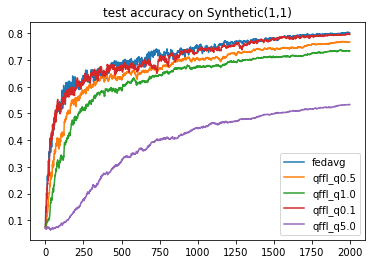

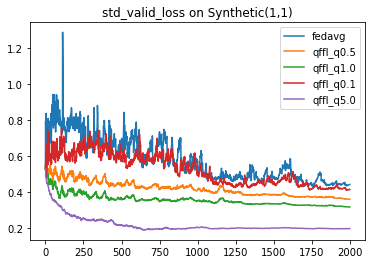

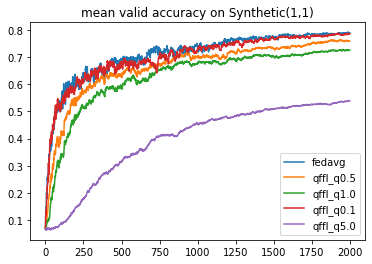

In [13]:
analysis_on_q = {
    'Selector':{
        'task': task,
        'header':['fedavg','qffl' ]
    },
    'Painter':{
        'Curve':[
            {'args':{'x': 'communication_round', 'y':'test_accuracy'},  'fig_option':{'title':'test accuracy on Synthetic(1,1)'}},
            {'args':{'x': 'communication_round', 'y':'std_valid_loss'}, 'fig_option':{'title':'std_valid_loss on Synthetic(1,1)'}},
            {'args':{'x': 'communication_round', 'y':'mean_valid_accuracy'},  'fig_option':{'title':'mean valid accuracy on Synthetic(1,1)'}},
            
            
        ]
    }
}
flgo.experiment.analyzer.show(analysis_on_q)